# Basketball Player Detection & Tracking — Phase 1

Fine-tunes **YOLO26** on a Roboflow basketball dataset, then runs
detection + multi-object tracking on a broadcast clip.

**Pipeline**

1. Environment + GPU check
2. Unzip dataset, audit class balance
3. Remap labels: 10 classes → 6 (collapse `player-*` action subclasses)
4. Train YOLO26 fine-tune
5. Evaluate on the held-out test split
6. Single-frame inference (sanity check)
7. Full video detection + ByteTrack tracking
8. Inline preview of the annotated video

**Conventions**: built to feel like the Roboflow reference notebook —
`HOME` constant, `supervision` for annotation, `sv.process_video` callback
pattern, ffmpeg re-encode for inline playback.

## 1. Environment

### 1a. GPU check

If `nvidia-smi` fails or shows no GPU, switch your SageMaker instance type
before continuing — training on CPU is not viable.

In [1]:
!nvidia-smi

Sat May 23 10:57:26 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 595.58.03              Driver Version: 595.58.03      CUDA Version: 13.2     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       On  |   00000000:00:1E.0 Off |                    0 |
| N/A   32C    P0             31W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

### 1b. Install dependencies

Run once per kernel; safe to re-run.

In [2]:
%pip install -q --upgrade ultralytics
%pip install -q supervision==0.27.0
%pip install -q opencv-python-headless pyyaml tqdm

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
autogluon-multimodal 1.5.0 requires nvidia-ml-py3<8.0,>=7.352.0, which is not installed.
autogluon-timeseries 1.5.0 requires chronos-forecasting<2.4,>=2.2.2, which is not installed.
autogluon-timeseries 1.5.0 requires einops<1,>=0.7, which is not installed.
autogluon-timeseries 1.5.0 requires peft<0.18,>=0.13.0, which is not installed.
sagemaker-serve 1.10.0 requires onnxruntime, which is not installed.
skops 0.14.0 requires prettytable>=3.9, which is not installed.
amazon-sagemaker-sql-magic 0.1.4 requires numpy<2, but you have numpy 2.4.6 which is incompatible.
autogluon-common 1.5.0 requires numpy<2.4.0,>=1.25.0, but you have numpy 2.4.6 which is incompatible.
autogluon-common 1.5.0 requires pyarrow<21.0.0,>=7.0.0, but you have pyarrow 21.0.0 which is incompatible.
autogluon-core 1.5.0 requires numpy<2.4.0,>=1.

Note: you may need to restart the kernel to use updated packages.


Note: you may need to restart the kernel to use updated packages.


Note: you may need to restart the kernel to use updated packages.


### 1c. `HOME` constant

All paths derive from `HOME`. Set this once; everything downstream uses it.

In [3]:
from pathlib import Path

HOME = Path.cwd()
print("HOME:", HOME)

HOME: /home/sagemaker-user/DLCNN_A3


### 2a. Locate the dataset

Your dataset is already extracted under `Data/Datasets/`. Adjust the
paths below if your layout differs.

In [4]:
DATA_DIR = HOME / "Data" / "Datasets"
DATASET_RAW = DATA_DIR / "basketball-player-detection-3.v1-1.yolo26"

assert DATASET_RAW.exists(), f"Dataset not found at {DATASET_RAW}"
assert (DATASET_RAW / "data.yaml").exists(), f"data.yaml missing in {DATASET_RAW}"

print(f"Dataset root: {DATASET_RAW}")
!ls "{DATASET_RAW}"

Dataset root: /home/sagemaker-user/DLCNN_A3/Data/Datasets/basketball-player-detection-3.v1-1.yolo26
README.dataset.txt  README.roboflow.txt  data.yaml  test  train  valid


### 2b. Audit class balance and bbox sizes

Three things we want to verify:
- Per-class instance counts in train/val/test (rare classes are warning flags)
- Average bbox heights at 1080p (small objects need higher `imgsz`)
- No filename leakage across splits

In [5]:
from collections import Counter, defaultdict
import yaml

def audit_dataset(root: Path) -> dict:
    cfg = yaml.safe_load((root / "data.yaml").read_text())
    class_names = cfg["names"]
    nc = cfg["nc"]
    stats = {}
    for split in ["train", "valid", "test"]:
        lbl_dir = root / split / "labels"
        if not lbl_dir.is_dir():
            continue
        instance_count = Counter()
        bbox_h = defaultdict(list)
        bbox_w = defaultdict(list)
        empty = malformed = total = 0
        for lbl_file in sorted(lbl_dir.glob("*.txt")):
            total += 1
            lines = [l.strip() for l in lbl_file.read_text().splitlines() if l.strip()]
            if not lines:
                empty += 1
                continue
            for line in lines:
                parts = line.split()
                if len(parts) != 5:
                    malformed += 1
                    continue
                try:
                    cls = int(parts[0])
                    _, _, w, h = map(float, parts[1:])
                except ValueError:
                    malformed += 1
                    continue
                instance_count[cls] += 1
                bbox_w[cls].append(w)
                bbox_h[cls].append(h)
        stats[split] = dict(total=total, empty=empty, malformed=malformed,
                            instance_count=instance_count,
                            bbox_w=bbox_w, bbox_h=bbox_h)

    print(f"{'#':>2}  {'class':<22} {'train':>8} {'valid':>8} {'test':>8} {'total':>8}")
    print("-" * 64)
    for i in range(nc):
        tr = stats.get("train", {}).get("instance_count", {}).get(i, 0)
        va = stats.get("valid", {}).get("instance_count", {}).get(i, 0)
        te = stats.get("test", {}).get("instance_count", {}).get(i, 0)
        print(f"{i:>2}  {class_names[i]:<22} {tr:>8} {va:>8} {te:>8} {tr+va+te:>8}")

    print(f"\n{'class':<22} {'avg_w':>8} {'avg_h':>8} {'h_px@1080':>10}")
    for i in range(nc):
        ws = stats.get("train", {}).get("bbox_w", {}).get(i, [])
        hs = stats.get("train", {}).get("bbox_h", {}).get(i, [])
        if not ws:
            continue
        print(f"{class_names[i]:<22} {sum(ws)/len(ws):>8.4f} {sum(hs)/len(hs):>8.4f} {sum(hs)/len(hs)*1080:>10.1f}")

    # Leakage
    img_basenames = {s: {p.stem.split('.rf.')[0] for p in (root/s/'images').iterdir()}
                     for s in ['train','valid','test'] if (root/s/'images').is_dir()}
    print()
    for a, b in [("train","valid"), ("train","test"), ("valid","test")]:
        ov = img_basenames[a] & img_basenames[b]
        flag = "  <-- LEAKAGE" if ov else ""
        print(f"  {a} ∩ {b}: {len(ov)}{flag}")

    return stats

_ = audit_dataset(DATASET_RAW)

 #  class                     train    valid     test    total
----------------------------------------------------------------
 0  ball                        432       88       88      608
 1  ball-in-basket               33        9        8       50
 2  number                     2855      522      567     3944
 3  player                     4301      908      896     6105
 4  player-in-possession         86       17       18      121
 5  player-jump-shot             72       17       16      105
 6  player-layup-dunk            33        0        0       33
 7  player-shot-block            64        9       14       87
 8  referee                    1221      287      280     1788
 9  rim                         455       96       93      644

class                     avg_w    avg_h  h_px@1080
ball                     0.0174   0.0308       33.3
ball-in-basket           0.0356   0.0610       65.9
number                   0.0109   0.0249       26.9
player                   0.0611  

### 2c. Remap classes: 10 → 6

We collapse all five `player-*` action subclasses into a single `player`
class. Rationale:

- `player-layup-dunk` has **0 validation and 0 test instances** in this
  dataset — untrainable as a discrete class.
- Action subclasses are visually overlapping with `player`; the detector
  wastes capacity learning fine-grained action distinctions.
- For multi-object tracking, class flips mid-shot (e.g.
  `player-in-possession` → `player-jump-shot` → `player`) terminate
  tracks and break per-player attribution downstream.

New schema:

| New ID | Class | Merged from |
|---|---|---|
| 0 | ball | ball |
| 1 | ball-in-basket | ball-in-basket |
| 2 | number | number |
| 3 | player | player, player-in-possession, player-jump-shot, player-layup-dunk, player-shot-block |
| 4 | referee | referee |
| 5 | rim | rim |

If you ever want action recognition back, train a separate small
classifier on tracked player crops — that's a Phase 5 enhancement, not
a Phase 1 requirement.

In [6]:
REMAP = {0:0, 1:1, 2:2, 3:3, 4:3, 5:3, 6:3, 7:3, 8:4, 9:5}
NEW_NAMES = ["ball", "ball-in-basket", "number", "player", "referee", "rim"]

DATASET_REMAPPED = DATA_DIR / "dataset_remapped"

def remap_dataset(src: Path, dst: Path):
    if dst.exists():
        print(f"Already remapped: {dst}")
        return
    dst.mkdir(parents=True)
    total_w = total_s = 0
    for split in ["train", "valid", "test"]:
        if not (src / split / "labels").is_dir():
            continue
        (dst / split / "images").mkdir(parents=True)
        (dst / split / "labels").mkdir(parents=True)
        for img in (src / split / "images").iterdir():
            (dst / split / "images" / img.name).symlink_to(img.resolve())
        for lbl in (src / split / "labels").iterdir():
            out = []
            for line in lbl.read_text().splitlines():
                line = line.strip()
                if not line:
                    continue
                parts = line.split()
                if len(parts) != 5:
                    total_s += 1
                    continue
                try:
                    old_cls = int(parts[0])
                except ValueError:
                    total_s += 1
                    continue
                if old_cls not in REMAP:
                    total_s += 1
                    continue
                out.append(f"{REMAP[old_cls]} {' '.join(parts[1:])}")
                total_w += 1
            (dst / split / "labels" / lbl.name).write_text("\n".join(out) + ("\n" if out else ""))
        print(f"  {split}: {len(list((dst/split/'labels').iterdir()))} label files")
    yaml.safe_dump({
        "path": str(dst.resolve()),
        "train": "train/images",
        "val": "valid/images",
        "test": "test/images",
        "nc": len(NEW_NAMES),
        "names": NEW_NAMES,
    }, (dst / "data.yaml").open("w"), sort_keys=False)
    print(f"\nRemap done: {total_w} bboxes written, {total_s} skipped")

remap_dataset(DATASET_RAW, DATASET_REMAPPED)
DATA_YAML = DATASET_REMAPPED / "data.yaml"
print(f"\nData YAML: {DATA_YAML}")
print((DATA_YAML).read_text())

Already remapped: /home/sagemaker-user/DLCNN_A3/Data/Datasets/dataset_remapped

Data YAML: /home/sagemaker-user/DLCNN_A3/Data/Datasets/dataset_remapped/data.yaml
path: /home/sagemaker-user/DLCNN_A3/Data/Datasets/dataset_remapped
train: train/images
val: valid/images
test: test/images
nc: 6
names:
- ball
- ball-in-basket
- number
- player
- referee
- rim



Verify the remap with another audit on the new dataset:

In [7]:
_ = audit_dataset(DATASET_REMAPPED)

 #  class                     train    valid     test    total
----------------------------------------------------------------
 0  ball                        432       88       88      608
 1  ball-in-basket               33        9        8       50
 2  number                     2855      522      567     3944
 3  player                     4556      951      944     6451
 4  referee                    1221      287      280     1788
 5  rim                         455       96       93      644

class                     avg_w    avg_h  h_px@1080
ball                     0.0174   0.0308       33.3
ball-in-basket           0.0356   0.0610       65.9
number                   0.0109   0.0249       26.9
player                   0.0612   0.2279      246.2
referee                  0.0478   0.1992      215.2
rim                      0.0339   0.0224       24.2

  train ∩ valid: 0
  train ∩ test: 0
  valid ∩ test: 0


## 3. Train YOLO26

### 3a. Configuration

Defaults chosen for broadcast NBA footage on this dataset:

- **`model='yolo26s.pt'`** — best speed/accuracy trade-off for ~464 train images.
- **`imgsz=960`** — ball and rim are ~24-33 px tall at 1080p; default 640
  input would downscale them below detectable size. Higher imgsz costs
  VRAM but is worth it for small-object recall.
- **`epochs=100, patience=20`** — early stopping handles overfitting.
- **`close_mosaic=10`** — disable mosaic augmentation for the last 10
  epochs so the model fine-tunes on undistorted frames.
- Color jitter reduced (`hsv_s=0.5, hsv_v=0.3`) — jerseys are color-coded,
  team identification depends on this in Phase 4.
- `degrees=0, flipud=0` — broadcast cameras are always level, gravity exists.

**Adjust `BATCH` based on your GPU VRAM** (see comments).

In [8]:
from ultralytics import YOLO

MODEL_NAME    = "yolo26s.pt"          # try yolo26m.pt later for higher mAP
IMGSZ         = 960                   # 960 is the sweet spot for 1080p broadcasts
EPOCHS        = 100
PATIENCE      = 20
BATCH         = -1                    # -1 = auto. If OOM: set to 8, then 4
DEVICE        = 0                     # GPU index; "cpu" for CPU
PROJECT_DIR   = HOME / "runs_abdo" / "basketball"
RUN_NAME      = "yolo26s_960"

# `model.trainer.save_dir` will tell us the *actual* output path
# after training — Ultralytics nests under `runs/detect/` regardless
# of `project=`, which is a known quirk we work around below.

WARNING ⚠️ torchvision==0.24 is incompatible with torch==2.8.
Run 'pip install torchvision==0.23' to fix torchvision or 'pip install -U torch torchvision' to update both.
For a full compatibility table see https://github.com/pytorch/vision#installation


### 3b. Run training

This takes ~2–4 hours on an A10G/L4, longer on a T4. Watch GPU usage with `!nvidia-smi` from a separate cell.

In [10]:
model = YOLO(MODEL_NAME)

train_results = model.train(
    data=str(DATA_YAML),
    epochs=EPOCHS,
    imgsz=IMGSZ,
    batch=BATCH,
    device=DEVICE,
    project=str(PROJECT_DIR),
    name=RUN_NAME,
    exist_ok=False,           # safety: don't clobber a previous run

    optimizer="auto",
    cos_lr=True,
    patience=PATIENCE,
    close_mosaic=10,

    hsv_h=0.015, hsv_s=0.5, hsv_v=0.3,
    degrees=0.0, translate=0.1, scale=0.5,
    shear=0.0, perspective=0.0,
    flipud=0.0, fliplr=0.5,
    mosaic=1.0, mixup=0.1, copy_paste=0.1,

    save=True, save_period=10, plots=True, verbose=True, seed=42,
)

# Read the true save directory from the trainer (works around the
# runs/detect/ prefix quirk).
RUN_DIR  = Path(model.trainer.save_dir)
BEST_PT  = RUN_DIR / "weights" / "best.pt"
LAST_PT  = RUN_DIR / "weights" / "last.pt"
print(f"\nRun directory: {RUN_DIR}")
print(f"Best weights:  {BEST_PT}")
assert BEST_PT.exists(), "best.pt not found — training did not complete"

Ultralytics 8.4.53 🚀 Python-3.12.13 torch-2.8.0 CUDA:0 (Tesla T4, 14913MiB)


engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=-1, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.1, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/home/sagemaker-user/DLCNN_A3/Data/Datasets/dataset_remapped/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.5, hsv_v=0.3, imgsz=960, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolo26s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolo26s_960, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=20, perspective=0.0, plots=True, pose=12.0,

Overriding model.yaml nc=80 with nc=6



                   from  n    params  module                                       arguments                     


  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 


  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                


  2                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     


  3                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              


  4                  -1  1    103360  ultralytics.nn.modules.block.C3k2            [128, 256, 1, False, 0.25]    


  5                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


  6                  -1  1    346112  ultralytics.nn.modules.block.C3k2            [256, 256, 1, True]           


  7                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256, 512, 3, 2]              


  8                  -1  1   1380352  ultralytics.nn.modules.block.C3k2            [512, 512, 1, True]           


  9                  -1  1    656896  ultralytics.nn.modules.block.SPPF            [512, 512, 5, 3, True]        


 10                  -1  1    990976  ultralytics.nn.modules.block.C2PSA           [512, 512, 1]                 


 11                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 12             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 13                  -1  1    477184  ultralytics.nn.modules.block.C3k2            [768, 256, 1, True]           


 14                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 15             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 16                  -1  1    136192  ultralytics.nn.modules.block.C3k2            [512, 128, 1, True]           


 17                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              


 18            [-1, 13]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 19                  -1  1    378880  ultralytics.nn.modules.block.C3k2            [384, 256, 1, True]           


 20                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 21            [-1, 10]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 22                  -1  1   1843712  ultralytics.nn.modules.block.C3k2            [768, 512, 1, True, 0.5, True]


 23        [16, 19, 22]  1    936508  ultralytics.nn.modules.head.Detect           [6, 1, True, [128, 256, 512]] 


YOLO26s summary: 260 layers, 9,952,508 parameters, 9,952,508 gradients, 22.5 GFLOPs


Transferred 696/708 items from pretrained weights


AMP: running Automatic Mixed Precision (AMP) checks...


AMP: checks passed ✅


train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 153.6±18.9 MB/s, size: 251.2 KB)


train: Scanning /home/sagemaker-user/DLCNN_A3/Data/Datasets/dataset_remapped/train/labels.cache... 464 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 464/464 88.5Mit/s 0.0s

AutoBatch: Computing optimal batch size for imgsz=960 at 60.0% CUDA memory utilization.


AutoBatch: CUDA:0 (Tesla T4) 14.56G total, 0.14G reserved, 0.11G allocated, 14.31G free


      Params      GFLOPs  GPU_mem (GB)  forward (ms) backward (ms)                   input                  output


     9952508       50.67         1.694         65.04           nan        (1, 3, 960, 960)                    list


     9952508       101.3         3.905         41.27           nan        (2, 3, 960, 960)                    list


     9952508       202.7         7.252         56.99           nan        (4, 3, 960, 960)                    list


     9952508       405.4        14.177         113.5           nan        (8, 3, 960, 960)                    list


CUDA out of memory. Tried to allocate 16.00 MiB. GPU 0 has a total capacity of 14.56 GiB of which 5.75 MiB is free. Including non-PyTorch memory, this process has 14.55 GiB memory in use. Of the allocated memory 13.93 GiB is allocated by PyTorch, and 482.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


AutoBatch: Using batch-size 5 for CUDA:0 9.21G/14.56G (63%) ✅


train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 860.1±1650.1 MB/s, size: 256.7 KB)


train: Scanning /home/sagemaker-user/DLCNN_A3/Data/Datasets/dataset_remapped/train/labels.cache... 464 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 464/464 92.7Mit/s 0.0s

val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 107.9±48.4 MB/s, size: 263.6 KB)


val: Scanning /home/sagemaker-user/DLCNN_A3/Data/Datasets/dataset_remapped/valid/labels.cache... 96 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 96/96 5.8Mit/s 0.0s

optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 


optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 114 weight(decay=0.0), 126 weight(decay=0.0005078125), 126 bias(decay=0.0)


Plotting labels to /home/sagemaker-user/DLCNN_A3/runs_abdo/basketball/yolo26s_960/labels.jpg... 


/opt/conda/lib/python3.12/site-packages/mlflow/tracking/_tracking_service/utils.py:184: FutureWarning: The filesystem tracking backend (e.g., './mlruns') is deprecated as of February 2026. Consider transitioning to a database backend (e.g., 'sqlite:///mlflow.db') to take advantage of the latest MLflow features. See https://mlflow.org/docs/latest/self-hosting/migrate-from-file-store for migration guidance.
  return FileStore(store_uri, store_uri)


MLflow: logging run_id(8f963b873f9044ff9d0686011fddbda6) to runs/mlflow


MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'


MLflow: disable with 'yolo settings mlflow=False'


Image sizes 960 train, 960 val
Using 4 dataloader workers
Logging results to /home/sagemaker-user/DLCNN_A3/runs_abdo/basketball/yolo26s_960
Starting training for 100 epochs...



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      3.63G      1.894      6.932    0.00588          5        960: 0% ──────────── 0/93  8.4s

      1/100      3.63G       1.84      6.894   0.005633          5        960: 1% ──────────── 1/93 1.0s/it 8.7s<1:35

      1/100      3.63G      1.764      6.819   0.005421          5        960: 2% ──────────── 2/93 1.3it/s 9.2s<1:11

      1/100      3.63G      1.915      6.581   0.005898          5        960: 3% ──────────── 3/93 1.3it/s 10.0s<1:08

      1/100      3.63G       1.92      6.275   0.005918          5        960: 4% ╸─────────── 4/93 1.4it/s 10.6s<1:03

      1/100      3.63G       1.87      6.285   0.005823          5        960: 5% ╸─────────── 5/93 2.1it/s 10.8s<42.3s

      1/100      3.63G      1.855      6.271   0.005868          5        960: 6% ╸─────────── 6/93 2.4it/s 11.2s<36.1s

      1/100      3.63G       1.84       6.33   0.005857          5        960: 8% ╸─────────── 7/93 2.3it/s 11.7s<37.7s

      1/100      3.63G      1.836      6.208   0.005867          5        960: 9% ━─────────── 8/93 2.5it/s 12.0s<34.0s

      1/100      3.63G      1.848      6.092   0.005867          5        960: 10% ━─────────── 9/93 2.8it/s 12.3s<30.2s

      1/100      3.63G      1.846      5.934   0.005794          5        960: 11% ━─────────── 10/93 2.9it/s 12.6s<28.7s

      1/100      3.63G      1.852      5.882   0.005827          5        960: 12% ━─────────── 11/93 2.6it/s 13.1s<30.9s

      1/100      3.63G      1.813      5.883   0.005688          5        960: 13% ━╸────────── 12/93 3.0it/s 13.3s<26.6s

      1/100      3.63G      1.801       5.82   0.005623          5        960: 14% ━╸────────── 13/93 3.2it/s 13.6s<25.2s

      1/100      3.63G      1.793      5.769   0.005614          5        960: 15% ━╸────────── 14/93 3.4it/s 13.9s<23.5s

      1/100      3.63G      1.789      5.701   0.005572          5        960: 16% ━╸────────── 15/93 3.2it/s 14.2s<24.2s

      1/100      3.79G      1.786      5.611   0.005497          5        960: 17% ━━────────── 16/93 3.4it/s 14.5s<22.8s

      1/100      3.79G      1.776      5.586   0.005478          5        960: 18% ━━────────── 17/93 3.3it/s 14.8s<23.2s

      1/100      3.95G      1.785      5.517    0.00554          5        960: 19% ━━────────── 18/93 3.2it/s 15.2s<23.5s

      1/100      3.95G      1.784       5.49   0.005572          5        960: 20% ━━────────── 19/93 2.7it/s 15.8s<27.3s

      1/100      3.95G      1.782      5.412   0.005556          5        960: 22% ━━╸───────── 20/93 2.5it/s 16.3s<29.7s

      1/100      3.95G      1.773       5.34    0.00548          5        960: 23% ━━╸───────── 21/93 2.2it/s 17.0s<32.8s

      1/100      3.95G      1.775      5.281   0.005511          5        960: 24% ━━╸───────── 22/93 2.7it/s 17.2s<26.5s

      1/100      3.95G      1.765       5.24   0.005472          5        960: 25% ━━╸───────── 23/93 2.7it/s 17.6s<26.2s

      1/100      3.95G      1.748      5.202   0.005413          5        960: 26% ━━━───────── 24/93 2.7it/s 18.0s<25.8s

      1/100      3.95G      1.739      5.184   0.005371          5        960: 27% ━━━───────── 25/93 2.6it/s 18.4s<26.0s

      1/100      3.95G      1.735      5.144   0.005343          5        960: 28% ━━━───────── 26/93 2.8it/s 18.7s<23.7s

      1/100      3.95G      1.726      5.089   0.005274          5        960: 29% ━━━───────── 27/93 2.4it/s 19.3s<27.3s

      1/100      3.95G      1.714      5.066   0.005228          5        960: 30% ━━━╸──────── 28/93 2.3it/s 19.8s<28.1s

      1/100      3.95G      1.706       5.03   0.005167          5        960: 31% ━━━╸──────── 29/93 2.1it/s 20.4s<30.1s

      1/100      3.95G      1.704      5.025   0.005157          5        960: 32% ━━━╸──────── 30/93 2.2it/s 20.9s<28.8s

      1/100      3.95G      1.698      4.989   0.005133          5        960: 33% ━━━━──────── 31/93 2.0it/s 21.5s<30.9s

      1/100      3.95G       1.69      4.946   0.005068          5        960: 34% ━━━━──────── 32/93 2.2it/s 21.8s<27.2s

      1/100      3.95G       1.69      4.899   0.005063          5        960: 35% ━━━━──────── 33/93 2.3it/s 22.3s<26.1s

      1/100      3.95G      1.688      4.868   0.005065          5        960: 37% ━━━━──────── 34/93 2.7it/s 22.5s<21.6s

      1/100      3.95G      1.686       4.82   0.005015          5        960: 38% ━━━━╸─────── 35/93 2.7it/s 22.9s<21.6s

      1/100      3.95G      1.684      4.791   0.004995          5        960: 39% ━━━━╸─────── 36/93 2.5it/s 23.4s<22.4s

      1/100      3.95G      1.676      4.774   0.004966          5        960: 40% ━━━━╸─────── 37/93 2.4it/s 23.9s<23.7s

      1/100      3.95G       1.67      4.736   0.004933          5        960: 41% ━━━━╸─────── 38/93 2.0it/s 24.7s<27.4s

      1/100      3.95G      1.661      4.704    0.00489          5        960: 42% ━━━━━─────── 39/93 1.9it/s 25.3s<28.2s

      1/100      3.95G      1.658      4.668   0.004855          5        960: 43% ━━━━━─────── 40/93 1.9it/s 25.8s<27.3s

      1/100      3.95G      1.656      4.649   0.004834          5        960: 44% ━━━━━─────── 41/93 1.8it/s 26.4s<28.2s

      1/100      3.95G      1.646      4.627   0.004801          5        960: 45% ━━━━━─────── 42/93 2.0it/s 26.9s<26.1s

      1/100      3.95G      1.644      4.598    0.00478          5        960: 46% ━━━━━╸────── 43/93 2.1it/s 27.3s<23.3s

      1/100      3.95G      1.636      4.576   0.004752          5        960: 47% ━━━━━╸────── 44/93 1.9it/s 28.0s<25.6s

      1/100      3.95G      1.633      4.546   0.004722          5        960: 48% ━━━━━╸────── 45/93 1.9it/s 28.6s<25.9s

      1/100      3.95G      1.626      4.526   0.004694          5        960: 49% ━━━━━╸────── 46/93 1.7it/s 29.3s<27.6s

      1/100      3.95G      1.622      4.495    0.00468          5        960: 51% ━━━━━━────── 47/93 1.5it/s 30.3s<30.5s

      1/100      3.95G      1.615       4.47   0.004644          5        960: 52% ━━━━━━────── 48/93 1.5it/s 30.9s<29.1s

      1/100      3.95G       1.61      4.444   0.004615          5        960: 53% ━━━━━━────── 49/93 1.6it/s 31.4s<27.2s

      1/100      3.95G      1.608      4.416     0.0046          5        960: 54% ━━━━━━────── 50/93 1.5it/s 32.2s<27.9s

      1/100      3.95G      1.602      4.387   0.004574          5        960: 55% ━━━━━━╸───── 51/93 1.4it/s 33.2s<30.2s

      1/100      3.95G      1.597      4.376   0.004558          5        960: 56% ━━━━━━╸───── 52/93 1.5it/s 33.7s<26.5s

      1/100      3.95G      1.595      4.369   0.004544          5        960: 57% ━━━━━━╸───── 53/93 1.5it/s 34.4s<26.5s

      1/100      3.95G      1.593      4.354   0.004566          5        960: 58% ━━━━━━╸───── 54/93 1.6it/s 34.9s<24.4s

      1/100      3.95G      1.592      4.332   0.004563          5        960: 59% ━━━━━━━───── 55/93 1.4it/s 35.9s<26.7s

      1/100      3.95G      1.587      4.309   0.004536          5        960: 60% ━━━━━━━───── 56/93 1.4it/s 36.6s<25.7s

      1/100      3.95G      1.582      4.284   0.004516          5        960: 61% ━━━━━━━───── 57/93 1.6it/s 37.1s<23.0s

      1/100      3.95G      1.576      4.259   0.004489          5        960: 62% ━━━━━━━───── 58/93 1.5it/s 37.8s<22.7s

      1/100      3.95G      1.573      4.237   0.004469          5        960: 63% ━━━━━━━╸──── 59/93 1.5it/s 38.4s<21.9s

      1/100      3.95G      1.569      4.213    0.00445          5        960: 65% ━━━━━━━╸──── 60/93 1.7it/s 39.0s<19.9s

      1/100      3.95G      1.569      4.189   0.004433          5        960: 66% ━━━━━━━╸──── 61/93 1.7it/s 39.5s<18.6s

      1/100      3.95G      1.565      4.168   0.004415          5        960: 67% ━━━━━━━━──── 62/93 1.7it/s 40.1s<17.9s

      1/100      3.95G       1.56      4.154   0.004409          5        960: 68% ━━━━━━━━──── 63/93 1.6it/s 40.8s<18.5s

      1/100      3.95G      1.561       4.13   0.004391          5        960: 69% ━━━━━━━━──── 64/93 1.7it/s 41.4s<17.2s

      1/100      3.95G      1.558       4.11   0.004362          5        960: 70% ━━━━━━━━──── 65/93 1.7it/s 41.9s<16.3s

      1/100      3.95G      1.555      4.088   0.004337          5        960: 71% ━━━━━━━━╸─── 66/93 1.7it/s 42.5s<15.7s

      1/100      3.95G      1.553      4.076   0.004319          5        960: 72% ━━━━━━━━╸─── 67/93 1.8it/s 43.0s<14.7s

      1/100      3.95G      1.548      4.053   0.004294          5        960: 73% ━━━━━━━━╸─── 68/93 2.2it/s 43.3s<11.5s

      1/100      3.95G      1.546      4.032   0.004285          5        960: 74% ━━━━━━━━╸─── 69/93 2.6it/s 43.6s<9.1s

      1/100      3.95G      1.542      4.009   0.004266          5        960: 75% ━━━━━━━━━─── 70/93 3.1it/s 43.9s<7.5s

      1/100      3.95G      1.541       3.99   0.004259          5        960: 76% ━━━━━━━━━─── 71/93 3.2it/s 44.2s<6.9s

      1/100      3.95G      1.539      3.973   0.004262          5        960: 77% ━━━━━━━━━─── 72/93 3.5it/s 44.4s<6.1s

      1/100      3.95G       1.54      3.952   0.004252          5        960: 78% ━━━━━━━━━─── 73/93 3.4it/s 44.7s<5.8s

      1/100      3.95G      1.537      3.934   0.004229          5        960: 80% ━━━━━━━━━╸── 74/93 3.0it/s 45.2s<6.4s

      1/100      3.95G      1.535      3.924   0.004224          5        960: 81% ━━━━━━━━━╸── 75/93 2.5it/s 46.0s<7.3s

      1/100      3.95G       1.53      3.904    0.00421          5        960: 82% ━━━━━━━━━╸── 76/93 2.3it/s 46.6s<7.5s

      1/100      3.95G      1.525      3.895   0.004203          5        960: 83% ━━━━━━━━━╸── 77/93 2.0it/s 47.3s<8.2s

      1/100      3.95G      1.521      3.877   0.004188          5        960: 84% ━━━━━━━━━━── 78/93 1.9it/s 48.0s<8.0s

      1/100      3.95G       1.52      3.856   0.004175          5        960: 85% ━━━━━━━━━━── 79/93 1.7it/s 48.8s<8.3s

      1/100      3.95G      1.519      3.836    0.00416          5        960: 86% ━━━━━━━━━━── 80/93 1.7it/s 49.3s<7.4s

      1/100      3.95G      1.515      3.819   0.004144          5        960: 87% ━━━━━━━━━━── 81/93 1.7it/s 49.9s<7.1s

      1/100      3.95G      1.514      3.803   0.004135          5        960: 88% ━━━━━━━━━━╸─ 82/93 2.0it/s 50.3s<5.5s

      1/100      3.95G      1.511      3.793   0.004127          5        960: 89% ━━━━━━━━━━╸─ 83/93 2.0it/s 50.8s<4.9s

      1/100      3.95G       1.51      3.775   0.004115          5        960: 90% ━━━━━━━━━━╸─ 84/93 1.9it/s 51.4s<4.7s

      1/100      3.95G      1.509      3.757   0.004111          5        960: 91% ━━━━━━━━━━╸─ 85/93 1.9it/s 51.9s<4.3s

      1/100      3.95G      1.508      3.739   0.004095          5        960: 92% ━━━━━━━━━━━─ 86/93 2.2it/s 52.3s<3.2s

      1/100      3.95G      1.507       3.72   0.004077          5        960: 94% ━━━━━━━━━━━─ 87/93 2.7it/s 52.5s<2.3s

      1/100      3.95G      1.505      3.702   0.004065          5        960: 95% ━━━━━━━━━━━─ 88/93 2.6it/s 52.9s<1.9s

      1/100      4.12G      1.506      3.685   0.004061          5        960: 96% ━━━━━━━━━━━─ 89/93 2.2it/s 53.7s<1.8s

      1/100      4.12G      1.505      3.673   0.004071          5        960: 97% ━━━━━━━━━━━╸ 90/93 2.2it/s 54.1s<1.4s

      1/100      4.12G      1.504      3.655   0.004059          5        960: 98% ━━━━━━━━━━━╸ 91/93 2.3it/s 54.5s<0.9s

      1/100      4.12G      1.504      3.639   0.004054          4        960: 99% ━━━━━━━━━━━╸ 92/93 1.7it/s 59.3s<0.6s

      1/100      4.12G      1.504      3.639   0.004054          4        960: 100% ━━━━━━━━━━━━ 93/93 1.6it/s 59.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 4.6s/it 1.4s<41.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 2.7it/s 1.5s<3.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 4.5it/s 1.6s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 5.5it/s 1.7s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 6.5it/s 1.8s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.1it/s 2.0s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.3it/s 2.1s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.5it/s 2.2s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 7.8it/s 2.3s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 2.7it/s 3.6s

                   all         96       1953      0.818      0.312       0.34      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      4.12G      1.492      2.016   0.002564          5        960: 0% ──────────── 0/93  0.3s

      2/100      4.12G      1.472       1.99   0.002805          5        960: 1% ──────────── 1/93 1.0it/s 0.6s<1:29

      2/100      4.12G      1.388      1.971   0.002782          5        960: 2% ──────────── 2/93 1.9it/s 0.8s<47.2s

      2/100      4.12G      1.436      1.992   0.003015          5        960: 3% ──────────── 3/93 2.4it/s 1.1s<36.8s

      2/100      4.12G      1.389      2.027   0.002971          5        960: 4% ╸─────────── 4/93 2.7it/s 1.4s<33.4s

      2/100      4.12G      1.416       2.02   0.003097          5        960: 5% ╸─────────── 5/93 2.6it/s 1.8s<34.3s

      2/100      4.12G      1.418       2.01   0.003154          5        960: 6% ╸─────────── 6/93 2.6it/s 2.2s<33.6s

      2/100      4.12G      1.397      2.023   0.003132          5        960: 8% ╸─────────── 7/93 3.0it/s 2.5s<29.0s

      2/100      4.12G       1.38      2.034   0.003178          5        960: 9% ━─────────── 8/93 3.3it/s 2.7s<25.9s

      2/100      4.12G      1.397      2.017    0.00324          5        960: 10% ━─────────── 9/93 3.1it/s 3.1s<27.5s

      2/100      4.12G        1.4      2.006     0.0033          5        960: 11% ━─────────── 10/93 3.2it/s 3.4s<26.1s

      2/100      4.12G      1.389      1.989   0.003273          5        960: 12% ━─────────── 11/93 3.0it/s 3.8s<27.1s

      2/100      4.12G      1.386      1.978   0.003268          5        960: 13% ━╸────────── 12/93 3.3it/s 4.0s<24.2s

      2/100      4.12G      1.376      2.002   0.003283          5        960: 14% ━╸────────── 13/93 3.5it/s 4.3s<22.7s

      2/100      4.12G       1.38       1.98   0.003231          5        960: 15% ━╸────────── 14/93 3.6it/s 4.5s<21.7s

      2/100      4.12G      1.386      1.984   0.003206          5        960: 16% ━╸────────── 15/93 3.7it/s 4.8s<21.0s

      2/100      4.12G      1.382      1.973    0.00318          5        960: 17% ━━────────── 16/93 3.8it/s 5.0s<20.4s

      2/100      4.12G      1.379      1.963    0.00319          5        960: 18% ━━────────── 17/93 3.5it/s 5.4s<22.0s

      2/100      4.12G      1.369      1.993   0.003228          5        960: 19% ━━────────── 18/93 3.4it/s 5.7s<22.1s

      2/100      4.12G      1.371      1.996   0.003307          5        960: 20% ━━────────── 19/93 3.4it/s 6.0s<21.7s

      2/100      4.12G      1.372      1.984   0.003305          5        960: 22% ━━╸───────── 20/93 3.5it/s 6.3s<20.7s

      2/100      4.12G      1.373      1.984   0.003326          5        960: 23% ━━╸───────── 21/93 3.7it/s 6.5s<19.7s

      2/100      4.12G      1.372      1.969   0.003289          5        960: 24% ━━╸───────── 22/93 3.7it/s 6.8s<19.1s

      2/100      4.12G      1.364      1.966   0.003293          5        960: 25% ━━╸───────── 23/93 3.5it/s 7.1s<20.0s

      2/100      4.12G      1.362      1.957     0.0033          5        960: 26% ━━━───────── 24/93 3.5it/s 7.4s<19.8s

      2/100      4.12G      1.366      1.944   0.003276          5        960: 27% ━━━───────── 25/93 3.0it/s 7.9s<22.7s

      2/100      4.12G      1.359      1.934   0.003261          5        960: 28% ━━━───────── 26/93 3.1it/s 8.2s<21.5s

      2/100      4.12G      1.362      1.923    0.00325          5        960: 29% ━━━───────── 27/93 2.9it/s 8.7s<22.9s

      2/100      4.12G      1.365      1.912   0.003238          5        960: 30% ━━━╸──────── 28/93 2.5it/s 9.2s<25.6s

      2/100      4.12G      1.362      1.904   0.003245          5        960: 31% ━━━╸──────── 29/93 2.1it/s 10.0s<29.8s

      2/100      4.12G      1.356      1.894   0.003222          5        960: 32% ━━━╸──────── 30/93 2.0it/s 10.6s<31.5s

      2/100      4.12G      1.348      1.884   0.003204          5        960: 33% ━━━━──────── 31/93 1.9it/s 11.2s<32.4s

      2/100      4.12G      1.346       1.88   0.003188          5        960: 34% ━━━━──────── 32/93 1.9it/s 11.8s<32.7s

      2/100      4.12G      1.349      1.869   0.003174          5        960: 35% ━━━━──────── 33/93 2.3it/s 12.1s<26.0s

      2/100      4.12G      1.351      1.861   0.003163          5        960: 37% ━━━━──────── 34/93 2.0it/s 12.8s<29.0s

      2/100      4.12G      1.351      1.853   0.003155          5        960: 38% ━━━━╸─────── 35/93 1.7it/s 13.9s<34.3s

      2/100      4.12G      1.352      1.854   0.003174          5        960: 39% ━━━━╸─────── 36/93 1.6it/s 14.6s<35.3s

      2/100      4.12G      1.352      1.847   0.003174          5        960: 40% ━━━━╸─────── 37/93 1.6it/s 15.2s<34.2s

      2/100      4.12G      1.356      1.844   0.003176          5        960: 41% ━━━━╸─────── 38/93 1.7it/s 15.7s<31.6s

      2/100      4.12G      1.363      1.841   0.003199          5        960: 42% ━━━━━─────── 39/93 1.8it/s 16.3s<30.2s

      2/100      4.12G       1.36      1.832   0.003195          5        960: 43% ━━━━━─────── 40/93 1.8it/s 16.8s<29.3s

      2/100      4.12G      1.362      1.839   0.003241          5        960: 44% ━━━━━─────── 41/93 1.9it/s 17.3s<27.6s

      2/100      4.12G      1.361       1.83   0.003223          5        960: 45% ━━━━━─────── 42/93 1.7it/s 18.1s<30.6s

      2/100      4.12G      1.363      1.823   0.003224          5        960: 46% ━━━━━╸────── 43/93 1.7it/s 18.7s<29.7s

      2/100      4.12G      1.364      1.818   0.003239          5        960: 47% ━━━━━╸────── 44/93 1.9it/s 19.1s<25.7s

      2/100      4.12G      1.364      1.812   0.003241          5        960: 48% ━━━━━╸────── 45/93 1.9it/s 19.7s<25.5s

      2/100      4.12G      1.363      1.808   0.003237          5        960: 49% ━━━━━╸────── 46/93 2.1it/s 20.1s<22.6s

      2/100      4.12G      1.362      1.804   0.003245          5        960: 51% ━━━━━━────── 47/93 2.0it/s 20.6s<22.5s

      2/100      4.12G      1.362      1.796   0.003242          5        960: 52% ━━━━━━────── 48/93 2.0it/s 21.1s<22.2s

      2/100      4.12G      1.363      1.791   0.003246          5        960: 53% ━━━━━━────── 49/93 1.9it/s 21.7s<23.5s

      2/100      4.12G      1.362      1.784   0.003255          5        960: 54% ━━━━━━────── 50/93 1.8it/s 22.4s<23.9s

      2/100      4.12G      1.365      1.776   0.003251          5        960: 55% ━━━━━━╸───── 51/93 1.8it/s 23.0s<23.7s

      2/100      4.12G      1.365      1.769   0.003247          5        960: 56% ━━━━━━╸───── 52/93 1.7it/s 23.6s<23.6s

      2/100      4.12G      1.369      1.765   0.003252          5        960: 57% ━━━━━━╸───── 53/93 1.8it/s 24.1s<22.8s

      2/100      4.12G      1.367      1.758   0.003253          5        960: 58% ━━━━━━╸───── 54/93 1.8it/s 24.6s<21.5s

      2/100      4.12G      1.373      1.756   0.003266          5        960: 59% ━━━━━━━───── 55/93 2.2it/s 24.9s<17.3s

      2/100      4.12G      1.373      1.749   0.003272          5        960: 60% ━━━━━━━───── 56/93 1.9it/s 25.7s<19.2s

      2/100      4.12G       1.37      1.745   0.003269          5        960: 61% ━━━━━━━───── 57/93 1.9it/s 26.2s<18.7s

      2/100      4.12G      1.371       1.74   0.003276          5        960: 62% ━━━━━━━───── 58/93 1.8it/s 26.8s<18.9s

      2/100      4.12G      1.371      1.734   0.003269          5        960: 63% ━━━━━━━╸──── 59/93 1.8it/s 27.4s<18.8s

      2/100      4.12G      1.368      1.733   0.003268          5        960: 65% ━━━━━━━╸──── 60/93 1.8it/s 28.0s<18.3s

      2/100      4.12G      1.367      1.725   0.003262          5        960: 66% ━━━━━━━╸──── 61/93 1.8it/s 28.6s<18.3s

      2/100      4.12G      1.367      1.724    0.00326          5        960: 67% ━━━━━━━━──── 62/93 2.1it/s 29.0s<15.0s

      2/100      4.12G      1.373      1.722    0.00327          5        960: 68% ━━━━━━━━──── 63/93 2.3it/s 29.3s<13.1s

      2/100      4.12G      1.374      1.717    0.00328          5        960: 69% ━━━━━━━━──── 64/93 2.0it/s 30.1s<14.5s

      2/100      4.12G      1.373      1.717   0.003285          5        960: 70% ━━━━━━━━──── 65/93 1.9it/s 30.6s<14.4s

      2/100      4.12G      1.371      1.711    0.00329          5        960: 71% ━━━━━━━━╸─── 66/93 1.9it/s 31.2s<14.5s

      2/100      4.12G      1.372      1.706   0.003284          5        960: 72% ━━━━━━━━╸─── 67/93 1.9it/s 31.8s<14.0s

      2/100      4.12G      1.374        1.7   0.003272          5        960: 73% ━━━━━━━━╸─── 68/93 1.9it/s 32.2s<12.9s

      2/100      4.12G      1.372      1.697   0.003277          5        960: 74% ━━━━━━━━╸─── 69/93 1.8it/s 32.9s<13.2s

      2/100      4.12G      1.371      1.692   0.003282          5        960: 75% ━━━━━━━━━─── 70/93 1.9it/s 33.4s<12.4s

      2/100      4.12G       1.37      1.692   0.003289          5        960: 76% ━━━━━━━━━─── 71/93 1.9it/s 33.9s<11.7s

      2/100      4.12G       1.37      1.688   0.003286          5        960: 77% ━━━━━━━━━─── 72/93 1.7it/s 34.7s<12.3s

      2/100      4.12G      1.368      1.683   0.003286          5        960: 78% ━━━━━━━━━─── 73/93 1.7it/s 35.3s<12.1s

      2/100      4.12G       1.37      1.678   0.003285          5        960: 80% ━━━━━━━━━╸── 74/93 1.6it/s 36.0s<11.6s

      2/100      4.12G      1.366      1.679   0.003288          5        960: 81% ━━━━━━━━━╸── 75/93 1.8it/s 36.4s<9.8s

      2/100      4.12G      1.365      1.673   0.003278          5        960: 82% ━━━━━━━━━╸── 76/93 1.8it/s 37.0s<9.5s

      2/100      4.12G      1.363      1.669   0.003283          5        960: 83% ━━━━━━━━━╸── 77/93 1.8it/s 37.6s<9.0s

      2/100      4.12G      1.363      1.666   0.003294          5        960: 84% ━━━━━━━━━━── 78/93 1.7it/s 38.2s<8.8s

      2/100      4.12G      1.361      1.661   0.003294          5        960: 85% ━━━━━━━━━━── 79/93 1.7it/s 38.8s<8.2s

      2/100      4.12G      1.361      1.656   0.003295          5        960: 86% ━━━━━━━━━━── 80/93 1.6it/s 39.6s<8.2s

      2/100      4.12G       1.36      1.652   0.003292          5        960: 87% ━━━━━━━━━━── 81/93 1.6it/s 40.1s<7.3s

      2/100      4.12G      1.356      1.647   0.003281          5        960: 88% ━━━━━━━━━━╸─ 82/93 1.7it/s 40.7s<6.4s

      2/100      4.12G      1.357      1.641    0.00327          5        960: 89% ━━━━━━━━━━╸─ 83/93 1.7it/s 41.2s<5.8s

      2/100      4.12G      1.358      1.639   0.003277          5        960: 90% ━━━━━━━━━━╸─ 84/93 1.7it/s 41.8s<5.2s

      2/100      4.12G      1.357      1.634    0.00327          5        960: 91% ━━━━━━━━━━╸─ 85/93 1.7it/s 42.4s<4.6s

      2/100      4.12G      1.355      1.629    0.00326          5        960: 92% ━━━━━━━━━━━─ 86/93 1.7it/s 43.1s<4.2s

      2/100      4.12G      1.358      1.626   0.003259          5        960: 94% ━━━━━━━━━━━─ 87/93 1.7it/s 43.6s<3.6s

      2/100      4.12G      1.355       1.62    0.00325          5        960: 95% ━━━━━━━━━━━─ 88/93 1.7it/s 44.2s<3.0s

      2/100      4.12G      1.356      1.617   0.003249          5        960: 96% ━━━━━━━━━━━─ 89/93 1.5it/s 45.1s<2.6s

      2/100      4.12G      1.355      1.611   0.003247          5        960: 97% ━━━━━━━━━━━╸ 90/93 1.6it/s 45.7s<1.9s

      2/100      4.12G      1.355      1.608   0.003245          5        960: 98% ━━━━━━━━━━━╸ 91/93 1.5it/s 46.4s<1.3s

      2/100      4.12G      1.354      1.603   0.003244          4        960: 99% ━━━━━━━━━━━╸ 92/93 1.5it/s 47.1s<0.7s

      2/100      4.12G      1.354      1.603   0.003244          4        960: 100% ━━━━━━━━━━━━ 93/93 2.0it/s 47.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.4s/it 0.4s<12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 1.4it/s 0.8s<5.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 1.7it/s 1.2s<4.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 2.1it/s 1.5s<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 2.1it/s 2.0s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 2.2it/s 2.4s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 2.2it/s 2.8s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 2.7it/s 3.1s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 4.5it/s 3.2s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 3.1it/s 3.3s

                   all         96       1953      0.773      0.597      0.642      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      4.12G      1.556      1.947   0.006109          5        960: 0% ──────────── 0/93  0.2s

      3/100      4.12G      1.433      1.532    0.00422          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:17

      3/100      4.12G      1.366      1.422   0.003794          5        960: 2% ──────────── 2/93 1.8it/s 0.8s<49.6s

      3/100      4.12G      1.328      1.355   0.003701          5        960: 3% ──────────── 3/93 2.3it/s 1.1s<39.9s

      3/100      4.12G      1.295      1.309   0.003455          5        960: 4% ╸─────────── 4/93 2.5it/s 1.4s<35.4s

      3/100      4.12G      1.297      1.297   0.003366          5        960: 5% ╸─────────── 5/93 2.5it/s 1.8s<35.1s

      3/100      4.12G      1.304      1.281   0.003274          5        960: 6% ╸─────────── 6/93 2.8it/s 2.1s<30.8s

      3/100      4.12G      1.293      1.263   0.003228          5        960: 8% ╸─────────── 7/93 2.9it/s 2.4s<29.7s

      3/100      4.12G       1.29      1.256   0.003224          5        960: 9% ━─────────── 8/93 2.9it/s 2.8s<29.5s

      3/100      4.12G      1.286      1.249   0.003196          5        960: 10% ━─────────── 9/93 2.7it/s 3.2s<30.9s

      3/100      4.12G      1.278      1.245   0.003208          5        960: 11% ━─────────── 10/93 2.5it/s 3.7s<33.0s

      3/100      4.12G      1.295      1.238   0.003167          5        960: 12% ━─────────── 11/93 2.8it/s 4.0s<29.4s

      3/100      4.12G      1.293      1.231   0.003137          5        960: 13% ━╸────────── 12/93 3.1it/s 4.3s<26.0s

      3/100      4.12G      1.306      1.244   0.003138          5        960: 14% ━╸────────── 13/93 2.8it/s 4.8s<29.0s

      3/100      4.12G      1.317      1.253   0.003172          5        960: 15% ━╸────────── 14/93 2.5it/s 5.3s<32.2s

      3/100      4.12G      1.317      1.244   0.003164          5        960: 16% ━╸────────── 15/93 2.8it/s 5.6s<27.9s

      3/100      4.12G      1.313      1.234   0.003123          5        960: 17% ━━────────── 16/93 3.1it/s 5.9s<24.7s

      3/100      4.12G      1.312      1.236   0.003112          5        960: 18% ━━────────── 17/93 3.4it/s 6.1s<22.6s

      3/100      4.12G      1.296      1.236   0.003106          5        960: 19% ━━────────── 18/93 3.6it/s 6.4s<20.8s

      3/100      4.12G      1.295      1.236    0.00307          5        960: 20% ━━────────── 19/93 3.7it/s 6.6s<19.9s

      3/100      4.12G      1.284      1.226   0.003043          5        960: 22% ━━╸───────── 20/93 3.8it/s 6.9s<19.1s

      3/100      4.12G      1.286       1.22   0.003017          5        960: 23% ━━╸───────── 21/93 3.7it/s 7.2s<19.4s

      3/100      4.12G      1.279      1.213   0.002987          5        960: 24% ━━╸───────── 22/93 3.7it/s 7.4s<19.3s

      3/100      4.12G      1.275      1.226   0.003057          5        960: 25% ━━╸───────── 23/93 3.1it/s 8.0s<22.3s

      3/100      4.12G      1.279      1.228   0.003065          5        960: 26% ━━━───────── 24/93 2.5it/s 8.9s<27.5s

      3/100      4.12G      1.279       1.23   0.003084          5        960: 27% ━━━───────── 25/93 2.3it/s 9.5s<29.7s

      3/100      4.12G       1.28      1.222   0.003065          5        960: 28% ━━━───────── 26/93 2.1it/s 10.1s<31.7s

      3/100      4.12G       1.27      1.213   0.003033          5        960: 29% ━━━───────── 27/93 1.9it/s 10.8s<34.4s

      3/100      4.12G      1.269      1.212   0.003043          5        960: 30% ━━━╸──────── 28/93 1.8it/s 11.5s<36.8s

      3/100      4.12G      1.269      1.209   0.003037          5        960: 31% ━━━╸──────── 29/93 1.6it/s 12.3s<40.5s

      3/100      4.12G      1.264       1.21   0.003057          5        960: 32% ━━━╸──────── 30/93 1.6it/s 13.0s<40.2s

      3/100      4.12G      1.262      1.209   0.003079          5        960: 33% ━━━━──────── 31/93 1.6it/s 13.6s<38.6s

      3/100      4.12G      1.262      1.207   0.003075          5        960: 34% ━━━━──────── 32/93 1.6it/s 14.2s<37.3s

      3/100      4.12G      1.262      1.205   0.003097          5        960: 35% ━━━━──────── 33/93 1.7it/s 14.7s<35.6s

      3/100      4.12G      1.259      1.201   0.003099          5        960: 37% ━━━━──────── 34/93 1.5it/s 15.6s<39.0s

      3/100      4.12G       1.26      1.196   0.003099          5        960: 38% ━━━━╸─────── 35/93 2.0it/s 15.9s<29.0s

      3/100      4.12G      1.261      1.195   0.003096          5        960: 39% ━━━━╸─────── 36/93 2.0it/s 16.5s<29.0s

      3/100      4.32G      1.268      1.197   0.003104          5        960: 40% ━━━━╸─────── 37/93 1.9it/s 17.0s<29.3s

      3/100      4.32G      1.266      1.194   0.003117          5        960: 41% ━━━━╸─────── 38/93 2.4it/s 17.3s<22.7s

      3/100      4.32G      1.271      1.193   0.003108          5        960: 42% ━━━━━─────── 39/93 2.6it/s 17.6s<20.8s

      3/100      4.32G      1.273      1.189   0.003092          5        960: 43% ━━━━━─────── 40/93 2.8it/s 17.9s<18.7s

      3/100      4.32G      1.271      1.183   0.003082          5        960: 44% ━━━━━─────── 41/93 2.6it/s 18.5s<20.2s

      3/100      4.32G      1.271      1.182   0.003081          5        960: 45% ━━━━━─────── 42/93 2.3it/s 19.1s<22.2s

      3/100      4.32G      1.271      1.183   0.003095          5        960: 46% ━━━━━╸────── 43/93 2.0it/s 19.8s<24.9s

      3/100      4.32G      1.271      1.187   0.003107          5        960: 47% ━━━━━╸────── 44/93 1.8it/s 20.6s<27.1s

      3/100      4.32G      1.272      1.183     0.0031          5        960: 48% ━━━━━╸────── 45/93 1.6it/s 21.6s<30.7s

      3/100      4.32G      1.274      1.179   0.003097          5        960: 49% ━━━━━╸────── 46/93 1.5it/s 22.2s<30.6s

      3/100      4.32G      1.278      1.178   0.003089          5        960: 51% ━━━━━━────── 47/93 1.6it/s 22.8s<27.9s

      3/100      4.32G       1.28      1.176   0.003092          5        960: 52% ━━━━━━────── 48/93 1.8it/s 23.2s<24.3s

      3/100      4.32G       1.28      1.175   0.003093          5        960: 53% ━━━━━━────── 49/93 1.8it/s 23.7s<23.9s

      3/100      4.32G      1.278      1.173   0.003095          5        960: 54% ━━━━━━────── 50/93 1.9it/s 24.3s<23.0s

      3/100      4.32G      1.278       1.17   0.003088          5        960: 55% ━━━━━━╸───── 51/93 1.8it/s 24.9s<23.2s

      3/100      4.32G      1.278      1.167   0.003091          5        960: 56% ━━━━━━╸───── 52/93 1.8it/s 25.4s<22.7s

      3/100      4.32G      1.278      1.166   0.003087          5        960: 57% ━━━━━━╸───── 53/93 1.8it/s 26.0s<22.4s

      3/100      4.32G      1.278      1.163   0.003087          5        960: 58% ━━━━━━╸───── 54/93 1.6it/s 26.8s<24.3s

      3/100      4.32G      1.276      1.159   0.003076          5        960: 59% ━━━━━━━───── 55/93 1.6it/s 27.4s<23.6s

      3/100      4.32G      1.277      1.157   0.003071          5        960: 60% ━━━━━━━───── 56/93 1.5it/s 28.2s<23.9s

      3/100      4.32G      1.278      1.154   0.003072          5        960: 61% ━━━━━━━───── 57/93 1.8it/s 28.6s<19.6s

      3/100      4.32G      1.284       1.16   0.003082          5        960: 62% ━━━━━━━───── 58/93 2.0it/s 29.0s<17.5s

      3/100      4.32G      1.287      1.161   0.003091          5        960: 63% ━━━━━━━╸──── 59/93 2.0it/s 29.5s<16.8s

      3/100      4.32G      1.289       1.16   0.003095          5        960: 65% ━━━━━━━╸──── 60/93 1.9it/s 30.1s<17.3s

      3/100      4.32G      1.291      1.158     0.0031          5        960: 66% ━━━━━━━╸──── 61/93 2.0it/s 30.5s<15.8s

      3/100      4.32G       1.29      1.155   0.003096          5        960: 67% ━━━━━━━━──── 62/93 1.9it/s 31.2s<16.7s

      3/100      4.32G      1.288      1.153   0.003099          5        960: 68% ━━━━━━━━──── 63/93 1.7it/s 31.9s<17.6s

      3/100      4.32G      1.286      1.151   0.003096          5        960: 69% ━━━━━━━━──── 64/93 1.7it/s 32.5s<17.1s

      3/100      4.32G      1.289       1.15   0.003094          5        960: 70% ━━━━━━━━──── 65/93 1.7it/s 33.1s<16.3s

      3/100      4.32G      1.286      1.147   0.003092          5        960: 71% ━━━━━━━━╸─── 66/93 1.7it/s 33.7s<15.5s

      3/100      4.32G      1.286      1.145   0.003084          5        960: 72% ━━━━━━━━╸─── 67/93 1.6it/s 34.4s<15.8s

      3/100      4.32G      1.286      1.143   0.003078          5        960: 73% ━━━━━━━━╸─── 68/93 1.5it/s 35.2s<16.5s

      3/100      4.32G      1.284      1.139   0.003074          5        960: 74% ━━━━━━━━╸─── 69/93 1.6it/s 35.7s<14.8s

      3/100      4.32G      1.284      1.136   0.003075          5        960: 75% ━━━━━━━━━─── 70/93 2.3it/s 36.0s<10.2s

      3/100      4.32G      1.284      1.134   0.003075          5        960: 76% ━━━━━━━━━─── 71/93 2.7it/s 36.3s<8.2s

      3/100      4.32G      1.284       1.13    0.00307          5        960: 77% ━━━━━━━━━─── 72/93 3.0it/s 36.5s<6.9s

      3/100      4.32G      1.282       1.13   0.003082          5        960: 78% ━━━━━━━━━─── 73/93 3.4it/s 36.7s<5.9s

      3/100      4.32G      1.282      1.129   0.003089          5        960: 80% ━━━━━━━━━╸── 74/93 3.6it/s 37.0s<5.3s

      3/100      4.32G      1.282      1.127   0.003081          5        960: 81% ━━━━━━━━━╸── 75/93 3.6it/s 37.3s<4.9s

      3/100      4.32G      1.283      1.125   0.003083          5        960: 82% ━━━━━━━━━╸── 76/93 3.7it/s 37.5s<4.6s

      3/100      4.32G      1.283      1.124   0.003087          5        960: 83% ━━━━━━━━━╸── 77/93 3.8it/s 37.8s<4.3s

      3/100      4.32G      1.284      1.122   0.003087          5        960: 84% ━━━━━━━━━━── 78/93 3.8it/s 38.0s<4.0s

      3/100      4.32G      1.284      1.121   0.003087          5        960: 85% ━━━━━━━━━━── 79/93 3.8it/s 38.3s<3.7s

      3/100      4.32G      1.285      1.119   0.003088          5        960: 86% ━━━━━━━━━━── 80/93 3.0it/s 39.1s<4.3s

      3/100      4.32G      1.285      1.117   0.003086          5        960: 87% ━━━━━━━━━━── 81/93 2.6it/s 39.7s<4.6s

      3/100      4.32G      1.287      1.117   0.003092          5        960: 88% ━━━━━━━━━━╸─ 82/93 2.3it/s 40.3s<4.7s

      3/100      4.32G      1.287      1.116   0.003092          5        960: 89% ━━━━━━━━━━╸─ 83/93 2.1it/s 40.9s<4.7s

      3/100      4.32G       1.29      1.113   0.003092          5        960: 90% ━━━━━━━━━━╸─ 84/93 2.2it/s 41.4s<4.1s

      3/100      4.32G       1.29      1.111   0.003089          5        960: 91% ━━━━━━━━━━╸─ 85/93 2.1it/s 41.9s<3.9s

      3/100      4.32G      1.292       1.11   0.003097          5        960: 92% ━━━━━━━━━━━─ 86/93 2.4it/s 42.3s<2.9s

      3/100      4.32G      1.291      1.109     0.0031          5        960: 94% ━━━━━━━━━━━─ 87/93 2.9it/s 42.5s<2.1s

      3/100      4.32G      1.291      1.109   0.003102          5        960: 95% ━━━━━━━━━━━─ 88/93 3.0it/s 42.8s<1.7s

      3/100      4.32G      1.295      1.109   0.003102          5        960: 96% ━━━━━━━━━━━─ 89/93 2.8it/s 43.3s<1.4s

      3/100      4.32G      1.295      1.107   0.003106          5        960: 97% ━━━━━━━━━━━╸ 90/93 2.5it/s 43.8s<1.2s

      3/100      4.32G      1.297      1.106   0.003106          5        960: 98% ━━━━━━━━━━━╸ 91/93 2.3it/s 44.3s<0.9s

      3/100      4.35G      1.297      1.104   0.003105          4        960: 99% ━━━━━━━━━━━╸ 92/93 2.0it/s 45.1s<0.5s

      3/100      4.35G      1.297      1.104   0.003105          4        960: 100% ━━━━━━━━━━━━ 93/93 2.1it/s 45.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.7s/it 0.5s<15.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 1.1it/s 1.0s<7.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 2.4it/s 1.1s<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 3.1it/s 1.4s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 4.6it/s 1.5s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 5.8it/s 1.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 6.7it/s 1.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.0it/s 1.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 7.2it/s 2.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 4.9it/s 2.0s

                   all         96       1953      0.878       0.67      0.729      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      4.36G      1.213      1.015   0.003117          5        960: 0% ──────────── 0/93  0.3s

      4/100      4.36G      1.227      0.926   0.002941          5        960: 1% ──────────── 1/93 1.9s/it 0.9s<2:56

      4/100      4.36G      1.305      1.013   0.002997          5        960: 2% ──────────── 2/93 1.1s/it 1.5s<1:42

      4/100      4.36G      1.342      1.023   0.003146          5        960: 3% ──────────── 3/93 1.1it/s 2.1s<1:20

      4/100      4.36G       1.31      0.982   0.003065          5        960: 4% ╸─────────── 4/93 1.4it/s 2.6s<1:06

      4/100      4.36G      1.328     0.9897   0.003177          5        960: 5% ╸─────────── 5/93 1.8it/s 3.0s<49.5s

      4/100      4.36G      1.343     0.9732   0.003178          5        960: 6% ╸─────────── 6/93 2.3it/s 3.2s<37.1s

      4/100      4.36G      1.324     0.9532   0.003111          5        960: 8% ╸─────────── 7/93 2.8it/s 3.5s<30.3s

      4/100      4.36G      1.329     0.9446   0.003101          5        960: 9% ━─────────── 8/93 3.1it/s 3.8s<27.2s

      4/100      4.36G      1.346     0.9604   0.003318          5        960: 10% ━─────────── 9/93 3.4it/s 4.0s<24.9s

      4/100      4.36G       1.34     0.9551   0.003305          5        960: 11% ━─────────── 10/93 3.5it/s 4.3s<24.0s

      4/100      4.36G      1.334     0.9505   0.003243          5        960: 12% ━─────────── 11/93 3.1it/s 4.7s<26.4s

      4/100      4.36G      1.342     0.9573   0.003282          5        960: 13% ━╸────────── 12/93 2.7it/s 5.3s<30.0s

      4/100      4.36G      1.346     0.9639   0.003323          5        960: 14% ━╸────────── 13/93 2.2it/s 6.3s<36.7s

      4/100      4.36G      1.345     0.9857   0.003442          5        960: 15% ━╸────────── 14/93 2.2it/s 6.8s<35.5s

      4/100      4.36G      1.345      0.989   0.003436          5        960: 16% ━╸────────── 15/93 2.6it/s 7.0s<29.5s

      4/100      4.36G      1.347     0.9893   0.003444          5        960: 17% ━━────────── 16/93 3.0it/s 7.3s<25.9s

      4/100      4.36G       1.35     0.9939   0.003456          5        960: 18% ━━────────── 17/93 2.8it/s 7.7s<26.9s

      4/100      4.36G      1.349     0.9905    0.00344          5        960: 19% ━━────────── 18/93 2.8it/s 8.1s<27.1s

      4/100      4.36G      1.339     0.9842   0.003415          5        960: 20% ━━────────── 19/93 2.8it/s 8.5s<26.8s

      4/100      4.36G      1.336     0.9897    0.00343          5        960: 22% ━━╸───────── 20/93 3.2it/s 8.7s<23.2s

      4/100      4.36G      1.342     0.9925   0.003427          5        960: 23% ━━╸───────── 21/93 3.4it/s 9.0s<21.2s

      4/100      4.36G      1.346     0.9964   0.003422          5        960: 24% ━━╸───────── 22/93 3.5it/s 9.2s<20.4s

      4/100      4.36G      1.337     0.9899   0.003428          5        960: 25% ━━╸───────── 23/93 3.6it/s 9.5s<19.2s

      4/100      4.36G      1.342     0.9888   0.003433          5        960: 26% ━━━───────── 24/93 3.7it/s 9.7s<18.6s

      4/100      4.36G      1.339     0.9877   0.003435          5        960: 27% ━━━───────── 25/93 3.8it/s 10.0s<17.8s

      4/100      4.36G      1.341     0.9862   0.003467          5        960: 28% ━━━───────── 26/93 3.7it/s 10.3s<18.1s

      4/100      4.36G      1.335     0.9825   0.003448          5        960: 29% ━━━───────── 27/93 3.8it/s 10.5s<17.5s

      4/100      4.36G      1.337     0.9847   0.003459          5        960: 30% ━━━╸──────── 28/93 3.6it/s 10.8s<18.2s

      4/100      4.36G      1.338     0.9869   0.003487          5        960: 31% ━━━╸──────── 29/93 3.3it/s 11.2s<19.3s

      4/100      4.36G      1.329     0.9832   0.003467          5        960: 32% ━━━╸──────── 30/93 2.8it/s 11.8s<22.2s

      4/100      4.36G      1.335     0.9787   0.003437          5        960: 33% ━━━━──────── 31/93 2.5it/s 12.4s<24.8s

      4/100      4.36G      1.334     0.9752   0.003433          5        960: 34% ━━━━──────── 32/93 2.2it/s 13.0s<27.4s

      4/100      4.36G      1.335     0.9732    0.00342          5        960: 35% ━━━━──────── 33/93 2.2it/s 13.5s<27.2s

      4/100      4.36G      1.335     0.9715    0.00341          5        960: 37% ━━━━──────── 34/93 2.1it/s 14.0s<28.2s

      4/100      4.36G      1.337     0.9707   0.003389          5        960: 38% ━━━━╸─────── 35/93 1.9it/s 14.8s<31.2s

      4/100      4.36G      1.336     0.9707   0.003399          5        960: 39% ━━━━╸─────── 36/93 1.7it/s 15.5s<33.4s

      4/100      4.36G      1.336     0.9692   0.003399          5        960: 40% ━━━━╸─────── 37/93 1.7it/s 16.1s<32.3s

      4/100      4.36G      1.333     0.9678   0.003393          5        960: 41% ━━━━╸─────── 38/93 1.8it/s 16.6s<30.3s

      4/100      4.36G       1.33     0.9636   0.003375          5        960: 42% ━━━━━─────── 39/93 1.9it/s 17.1s<28.9s

      4/100      4.36G      1.329     0.9601   0.003371          5        960: 43% ━━━━━─────── 40/93 2.3it/s 17.4s<23.5s

      4/100      4.36G      1.328      0.959   0.003364          5        960: 44% ━━━━━─────── 41/93 2.4it/s 17.8s<22.1s

      4/100      4.36G      1.327     0.9558   0.003355          5        960: 45% ━━━━━─────── 42/93 2.4it/s 18.2s<20.9s

      4/100      4.36G      1.331     0.9619   0.003346          5        960: 46% ━━━━━╸────── 43/93 2.3it/s 18.7s<21.6s

      4/100      4.36G      1.327     0.9581   0.003335          5        960: 47% ━━━━━╸────── 44/93 2.2it/s 19.2s<22.4s

      4/100      4.36G      1.329     0.9615   0.003351          5        960: 48% ━━━━━╸────── 45/93 2.1it/s 19.7s<23.0s

      4/100      4.36G      1.327     0.9584   0.003345          5        960: 49% ━━━━━╸────── 46/93 2.2it/s 20.1s<21.0s

      4/100      4.36G      1.324     0.9569   0.003343          5        960: 51% ━━━━━━────── 47/93 2.5it/s 20.4s<18.3s

      4/100      4.36G      1.321     0.9515   0.003326          5        960: 52% ━━━━━━────── 48/93 2.3it/s 21.0s<19.6s

      4/100      4.36G      1.329     0.9534    0.00333          5        960: 53% ━━━━━━────── 49/93 2.0it/s 21.7s<21.8s

      4/100      4.36G      1.332     0.9565   0.003325          5        960: 54% ━━━━━━────── 50/93 1.9it/s 22.3s<22.1s

      4/100      4.36G      1.336     0.9625   0.003347          5        960: 55% ━━━━━━╸───── 51/93 2.1it/s 22.7s<19.8s

      4/100      4.36G      1.336     0.9616   0.003336          5        960: 56% ━━━━━━╸───── 52/93 1.9it/s 23.3s<21.1s

      4/100      4.36G       1.33     0.9616   0.003339          5        960: 57% ━━━━━━╸───── 53/93 1.8it/s 23.9s<21.7s

      4/100      4.36G       1.33     0.9588    0.00333          5        960: 58% ━━━━━━╸───── 54/93 1.7it/s 24.7s<23.3s

      4/100      4.36G      1.331     0.9624   0.003337          5        960: 59% ━━━━━━━───── 55/93 1.7it/s 25.2s<21.7s

      4/100      4.36G       1.33     0.9595   0.003324          5        960: 60% ━━━━━━━───── 56/93 1.8it/s 25.8s<20.5s

      4/100      4.36G      1.327     0.9572   0.003328          5        960: 61% ━━━━━━━───── 57/93 1.8it/s 26.3s<19.9s

      4/100      4.36G      1.328     0.9591   0.003325          5        960: 62% ━━━━━━━───── 58/93 1.8it/s 26.9s<19.8s

      4/100      4.36G      1.326     0.9583   0.003325          5        960: 63% ━━━━━━━╸──── 59/93 1.7it/s 27.6s<20.4s

      4/100      4.36G      1.323     0.9574   0.003326          5        960: 65% ━━━━━━━╸──── 60/93 1.7it/s 28.1s<19.0s

      4/100      4.36G      1.323     0.9554    0.00332          5        960: 66% ━━━━━━━╸──── 61/93 2.3it/s 28.4s<14.1s

      4/100      4.36G      1.325     0.9567   0.003316          5        960: 67% ━━━━━━━━──── 62/93 2.8it/s 28.7s<11.3s

      4/100      4.36G      1.325     0.9564   0.003304          5        960: 68% ━━━━━━━━──── 63/93 3.1it/s 28.9s<9.8s

      4/100      4.36G      1.326     0.9572   0.003315          5        960: 69% ━━━━━━━━──── 64/93 2.8it/s 29.4s<10.4s

      4/100      4.36G      1.325     0.9568   0.003308          5        960: 70% ━━━━━━━━──── 65/93 2.4it/s 30.0s<11.5s

      4/100      4.36G      1.327     0.9597   0.003309          5        960: 71% ━━━━━━━━╸─── 66/93 2.5it/s 30.4s<11.0s

      4/100      4.36G       1.33     0.9624   0.003319          5        960: 72% ━━━━━━━━╸─── 67/93 2.8it/s 30.7s<9.1s

      4/100      4.36G      1.328     0.9618   0.003324          5        960: 73% ━━━━━━━━╸─── 68/93 3.2it/s 30.9s<7.8s

      4/100      4.36G      1.328     0.9628   0.003321          5        960: 74% ━━━━━━━━╸─── 69/93 2.9it/s 31.4s<8.2s

      4/100      4.36G      1.327     0.9611   0.003314          5        960: 75% ━━━━━━━━━─── 70/93 2.6it/s 31.9s<8.8s

      4/100      4.36G      1.324     0.9588   0.003302          5        960: 76% ━━━━━━━━━─── 71/93 2.5it/s 32.4s<8.9s

      4/100      4.36G      1.324     0.9588   0.003309          5        960: 77% ━━━━━━━━━─── 72/93 2.8it/s 32.7s<7.4s

      4/100      4.36G      1.325     0.9605   0.003299          5        960: 78% ━━━━━━━━━─── 73/93 3.1it/s 32.9s<6.4s

      4/100      4.36G      1.326      0.959   0.003297          5        960: 80% ━━━━━━━━━╸── 74/93 3.3it/s 33.2s<5.7s

      4/100      4.36G      1.324      0.959   0.003298          5        960: 81% ━━━━━━━━━╸── 75/93 3.5it/s 33.4s<5.2s

      4/100      4.36G      1.323     0.9599   0.003294          5        960: 82% ━━━━━━━━━╸── 76/93 3.6it/s 33.7s<4.8s

      4/100      4.36G      1.322      0.957   0.003285          5        960: 83% ━━━━━━━━━╸── 77/93 3.7it/s 34.0s<4.3s

      4/100      4.36G      1.321     0.9559   0.003283          5        960: 84% ━━━━━━━━━━── 78/93 3.6it/s 34.2s<4.1s

      4/100      4.36G      1.323     0.9559   0.003285          5        960: 85% ━━━━━━━━━━── 79/93 3.6it/s 34.5s<3.8s

      4/100      4.36G      1.323     0.9553    0.00328          5        960: 86% ━━━━━━━━━━── 80/93 3.7it/s 34.8s<3.5s

      4/100      4.36G      1.321     0.9535   0.003273          5        960: 87% ━━━━━━━━━━── 81/93 3.8it/s 35.0s<3.2s

      4/100      4.36G      1.321     0.9525   0.003268          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.8it/s 35.3s<2.9s

      4/100      4.36G      1.318     0.9502   0.003264          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 35.5s<2.6s

      4/100      4.36G      1.319     0.9522   0.003267          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 35.8s<2.3s

      4/100      4.36G      1.321     0.9535   0.003273          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.9it/s 36.1s<2.1s

      4/100      4.36G      1.321     0.9528   0.003269          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 36.3s<1.8s

      4/100      4.36G      1.318     0.9496   0.003257          5        960: 94% ━━━━━━━━━━━─ 87/93 3.8it/s 36.6s<1.6s

      4/100      4.36G      1.318     0.9505   0.003262          5        960: 95% ━━━━━━━━━━━─ 88/93 3.2it/s 37.1s<1.5s

      4/100      4.36G      1.315     0.9477   0.003254          5        960: 96% ━━━━━━━━━━━─ 89/93 2.9it/s 37.6s<1.4s

      4/100      4.36G      1.315     0.9477   0.003255          5        960: 97% ━━━━━━━━━━━╸ 90/93 2.5it/s 38.2s<1.2s

      4/100      4.36G      1.312     0.9466   0.003249          5        960: 98% ━━━━━━━━━━━╸ 91/93 2.5it/s 38.6s<0.8s

      4/100      4.36G      1.311     0.9455   0.003242          4        960: 99% ━━━━━━━━━━━╸ 92/93 3.3it/s 38.8s<0.3s

      4/100      4.36G      1.311     0.9455   0.003242          4        960: 100% ━━━━━━━━━━━━ 93/93 2.4it/s 38.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.3it/s 0.1s<3.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.2it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.2it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.2it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 6.6it/s 0.6s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 6.9it/s 0.8s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.4it/s 0.9s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.8it/s 1.0s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.0it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.4it/s 1.2s

                   all         96       1953      0.908      0.695      0.746      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      4.36G      1.256      0.703   0.002433          5        960: 0% ──────────── 0/93  0.3s

      5/100      4.36G      1.181     0.7284   0.002609          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:19

      5/100      4.36G      1.168     0.7669   0.002756          5        960: 2% ──────────── 2/93 2.1it/s 0.8s<44.3s

      5/100      4.36G      1.228     0.7863   0.002829          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.8s

      5/100      4.36G      1.243     0.7972   0.002853          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<30.0s

      5/100      4.36G      1.256     0.8011   0.002855          5        960: 5% ╸─────────── 5/93 3.2it/s 1.5s<27.2s

      5/100      4.36G      1.225     0.7956   0.002818          5        960: 6% ╸─────────── 6/93 3.5it/s 1.8s<25.2s

      5/100      4.36G      1.228     0.8236    0.00289          5        960: 8% ╸─────────── 7/93 3.5it/s 2.1s<24.2s

      5/100      4.36G      1.216     0.8201    0.00286          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<23.1s

      5/100      4.36G       1.23     0.8334     0.0029          5        960: 10% ━─────────── 9/93 3.7it/s 2.6s<22.6s

      5/100      4.36G      1.206     0.8184   0.002893          5        960: 11% ━─────────── 10/93 3.8it/s 2.8s<21.7s

      5/100      4.36G      1.224     0.8338   0.002902          5        960: 12% ━─────────── 11/93 3.7it/s 3.1s<22.1s

      5/100      4.36G      1.221     0.8276   0.002913          5        960: 13% ━╸────────── 12/93 3.8it/s 3.4s<21.3s

      5/100      4.36G      1.231     0.8317   0.002909          5        960: 14% ━╸────────── 13/93 3.8it/s 3.6s<21.1s

      5/100      4.36G      1.231     0.8333   0.002926          5        960: 15% ━╸────────── 14/93 3.8it/s 3.9s<20.6s

      5/100      4.36G       1.23     0.8286   0.002899          5        960: 16% ━╸────────── 15/93 3.9it/s 4.1s<20.0s

      5/100      4.36G      1.231     0.8231   0.002891          5        960: 17% ━━────────── 16/93 3.9it/s 4.4s<19.6s

      5/100      4.36G      1.234     0.8303   0.002883          5        960: 18% ━━────────── 17/93 3.9it/s 4.6s<19.7s

      5/100      4.36G      1.231     0.8293   0.002877          5        960: 19% ━━────────── 18/93 3.9it/s 4.9s<19.4s

      5/100      4.36G      1.234     0.8377   0.002896          5        960: 20% ━━────────── 19/93 3.8it/s 5.2s<19.4s

      5/100      4.36G      1.234      0.835   0.002869          5        960: 22% ━━╸───────── 20/93 3.8it/s 5.4s<19.0s

      5/100      4.36G      1.233     0.8344   0.002885          5        960: 23% ━━╸───────── 21/93 3.9it/s 5.7s<18.4s

      5/100      4.36G      1.221     0.8281   0.002857          5        960: 24% ━━╸───────── 22/93 3.9it/s 5.9s<18.1s

      5/100      4.36G      1.217     0.8268   0.002866          5        960: 25% ━━╸───────── 23/93 4.0it/s 6.2s<17.7s

      5/100      4.36G      1.213     0.8224   0.002842          5        960: 26% ━━━───────── 24/93 3.8it/s 6.5s<18.1s

      5/100      4.36G      1.214     0.8198   0.002843          5        960: 27% ━━━───────── 25/93 3.9it/s 6.7s<17.5s

      5/100      4.36G      1.206     0.8138   0.002811          5        960: 28% ━━━───────── 26/93 3.9it/s 7.0s<17.1s

      5/100      4.36G      1.203     0.8128   0.002804          5        960: 29% ━━━───────── 27/93 3.7it/s 7.3s<17.6s

      5/100      4.36G      1.206     0.8141   0.002795          5        960: 30% ━━━╸──────── 28/93 3.6it/s 7.5s<17.9s

      5/100      4.36G      1.201      0.813   0.002788          5        960: 31% ━━━╸──────── 29/93 3.5it/s 7.9s<18.4s

      5/100      4.36G      1.205      0.816    0.00279          5        960: 32% ━━━╸──────── 30/93 3.5it/s 8.2s<18.1s

      5/100      4.36G      1.206     0.8135   0.002806          5        960: 33% ━━━━──────── 31/93 2.9it/s 8.8s<21.1s

      5/100      4.36G      1.207     0.8107   0.002795          5        960: 34% ━━━━──────── 32/93 2.5it/s 9.4s<24.2s

      5/100      4.36G      1.206       0.81   0.002787          5        960: 35% ━━━━──────── 33/93 2.2it/s 10.0s<26.7s

      5/100      4.36G      1.209     0.8101   0.002785          5        960: 37% ━━━━──────── 34/93 2.2it/s 10.5s<27.4s

      5/100      4.36G      1.213     0.8118   0.002782          5        960: 38% ━━━━╸─────── 35/93 2.6it/s 10.8s<22.5s

      5/100      4.36G      1.211     0.8093   0.002772          5        960: 39% ━━━━╸─────── 36/93 3.0it/s 11.1s<18.8s

      5/100      4.36G      1.208     0.8082   0.002765          5        960: 40% ━━━━╸─────── 37/93 3.2it/s 11.3s<17.4s

      5/100      4.36G      1.208     0.8073   0.002757          5        960: 41% ━━━━╸─────── 38/93 3.4it/s 11.6s<16.2s

      5/100      4.36G      1.207     0.8124   0.002779          5        960: 42% ━━━━━─────── 39/93 3.6it/s 11.9s<15.1s

      5/100      4.36G      1.207     0.8091   0.002775          5        960: 43% ━━━━━─────── 40/93 3.5it/s 12.1s<15.0s

      5/100      4.36G      1.209     0.8118   0.002792          5        960: 44% ━━━━━─────── 41/93 3.3it/s 12.5s<15.8s

      5/100      4.36G      1.208     0.8077   0.002791          5        960: 45% ━━━━━─────── 42/93 3.2it/s 12.9s<16.1s

      5/100      4.36G      1.211     0.8067   0.002782          5        960: 46% ━━━━━╸────── 43/93 2.9it/s 13.3s<17.4s

      5/100      4.36G      1.213     0.8068   0.002786          5        960: 47% ━━━━━╸────── 44/93 2.6it/s 13.8s<18.8s

      5/100      4.36G      1.211     0.8043   0.002791          5        960: 48% ━━━━━╸────── 45/93 2.9it/s 14.1s<16.8s

      5/100      4.56G      1.216     0.8115   0.002808          5        960: 49% ━━━━━╸────── 46/93 2.6it/s 14.6s<17.9s

      5/100      4.56G      1.218     0.8117    0.00281          5        960: 51% ━━━━━━────── 47/93 2.4it/s 15.1s<18.8s

      5/100      4.56G      1.218     0.8096   0.002803          5        960: 52% ━━━━━━────── 48/93 2.3it/s 15.6s<20.0s

      5/100      4.56G       1.22     0.8126   0.002817          5        960: 53% ━━━━━━────── 49/93 2.1it/s 16.2s<20.9s

      5/100      4.56G      1.221     0.8133    0.00282          5        960: 54% ━━━━━━────── 50/93 1.9it/s 17.0s<23.2s

      5/100      4.56G      1.222     0.8112   0.002819          5        960: 55% ━━━━━━╸───── 51/93 1.7it/s 17.7s<24.5s

      5/100      4.56G      1.221     0.8091   0.002824          5        960: 56% ━━━━━━╸───── 52/93 1.8it/s 18.2s<22.8s

      5/100      4.56G      1.219     0.8078   0.002826          5        960: 57% ━━━━━━╸───── 53/93 2.1it/s 18.6s<19.1s

      5/100      4.56G      1.221     0.8071    0.00282          5        960: 58% ━━━━━━╸───── 54/93 2.1it/s 19.0s<18.5s

      5/100      4.56G      1.221     0.8072    0.00281          5        960: 59% ━━━━━━━───── 55/93 2.1it/s 19.5s<18.1s

      5/100      4.56G      1.221     0.8064   0.002811          5        960: 60% ━━━━━━━───── 56/93 2.1it/s 20.0s<17.9s

      5/100      4.56G      1.218     0.8049   0.002801          5        960: 61% ━━━━━━━───── 57/93 2.0it/s 20.5s<17.6s

      5/100      4.77G      1.222     0.8067   0.002799          5        960: 62% ━━━━━━━───── 58/93 2.1it/s 21.0s<16.9s

      5/100      4.77G      1.224     0.8051   0.002798          5        960: 63% ━━━━━━━╸──── 59/93 2.0it/s 21.6s<17.4s

      5/100      4.77G      1.223     0.8031   0.002794          5        960: 65% ━━━━━━━╸──── 60/93 2.3it/s 21.9s<14.3s

      5/100      4.77G      1.222     0.8039     0.0028          5        960: 66% ━━━━━━━╸──── 61/93 2.5it/s 22.3s<12.9s

      5/100      4.77G      1.223     0.8056   0.002806          5        960: 67% ━━━━━━━━──── 62/93 2.2it/s 22.9s<14.1s

      5/100      4.77G      1.224     0.8074   0.002816          5        960: 68% ━━━━━━━━──── 63/93 2.2it/s 23.4s<13.7s

      5/100      4.77G      1.221     0.8059   0.002826          5        960: 69% ━━━━━━━━──── 64/93 2.1it/s 23.8s<13.5s

      5/100      4.77G      1.224     0.8105   0.002834          5        960: 70% ━━━━━━━━──── 65/93 2.1it/s 24.3s<13.1s

      5/100      4.77G      1.223     0.8095   0.002827          5        960: 71% ━━━━━━━━╸─── 66/93 2.1it/s 24.8s<12.7s

      5/100      4.77G      1.223     0.8084   0.002824          5        960: 72% ━━━━━━━━╸─── 67/93 2.1it/s 25.3s<12.4s

      5/100      4.77G      1.226     0.8086   0.002821          5        960: 73% ━━━━━━━━╸─── 68/93 2.1it/s 25.8s<12.1s

      5/100      4.77G      1.226     0.8078   0.002813          5        960: 74% ━━━━━━━━╸─── 69/93 2.1it/s 26.2s<11.4s

      5/100      4.77G      1.224     0.8076   0.002806          5        960: 75% ━━━━━━━━━─── 70/93 2.2it/s 26.7s<10.5s

      5/100      4.77G      1.223     0.8067   0.002799          5        960: 76% ━━━━━━━━━─── 71/93 2.1it/s 27.2s<10.4s

      5/100      4.77G      1.221      0.805   0.002795          5        960: 77% ━━━━━━━━━─── 72/93 2.2it/s 27.6s<9.7s

      5/100      4.77G      1.218     0.8033   0.002786          5        960: 78% ━━━━━━━━━─── 73/93 2.3it/s 28.0s<8.6s

      5/100      4.77G      1.219     0.8038   0.002786          5        960: 80% ━━━━━━━━━╸── 74/93 2.3it/s 28.4s<8.3s

      5/100      4.77G      1.215     0.8054   0.002799          5        960: 81% ━━━━━━━━━╸── 75/93 2.2it/s 29.0s<8.3s

      5/100      4.77G      1.215     0.8045   0.002798          5        960: 82% ━━━━━━━━━╸── 76/93 2.1it/s 29.5s<8.2s

      5/100      4.77G      1.216     0.8074   0.002811          5        960: 83% ━━━━━━━━━╸── 77/93 2.4it/s 29.8s<6.8s

      5/100      4.77G      1.217     0.8086   0.002815          5        960: 84% ━━━━━━━━━━── 78/93 2.4it/s 30.3s<6.3s

      5/100      4.77G      1.216     0.8086   0.002818          5        960: 85% ━━━━━━━━━━── 79/93 2.5it/s 30.6s<5.5s

      5/100      4.77G      1.216     0.8075   0.002818          5        960: 86% ━━━━━━━━━━── 80/93 2.6it/s 31.0s<5.1s

      5/100      4.77G      1.216     0.8065   0.002816          5        960: 87% ━━━━━━━━━━── 81/93 2.9it/s 31.3s<4.2s

      5/100      4.77G      1.215     0.8069    0.00282          5        960: 88% ━━━━━━━━━━╸─ 82/93 2.9it/s 31.6s<3.8s

      5/100      4.77G      1.216     0.8066   0.002816          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.2it/s 31.9s<3.1s

      5/100      4.77G      1.213     0.8047    0.00282          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.4it/s 32.1s<2.6s

      5/100      4.77G      1.213     0.8047   0.002815          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.6it/s 32.4s<2.2s

      5/100      4.77G      1.215     0.8045   0.002814          5        960: 92% ━━━━━━━━━━━─ 86/93 3.7it/s 32.6s<1.9s

      5/100      4.77G      1.213     0.8031   0.002815          5        960: 94% ━━━━━━━━━━━─ 87/93 3.8it/s 32.9s<1.6s

      5/100      4.77G      1.212     0.8027   0.002812          5        960: 95% ━━━━━━━━━━━─ 88/93 3.8it/s 33.1s<1.3s

      5/100      4.77G      1.211     0.8015   0.002807          5        960: 96% ━━━━━━━━━━━─ 89/93 3.0it/s 34.1s<1.3s

      5/100      4.77G       1.21     0.7997   0.002804          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.1it/s 34.3s<1.0s

      5/100      4.77G      1.208     0.7994   0.002801          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.4it/s 34.6s<0.6s

      5/100      4.77G      1.209        0.8     0.0028          4        960: 99% ━━━━━━━━━━━╸ 92/93 3.2it/s 35.0s<0.3s

      5/100      4.77G      1.209        0.8     0.0028          4        960: 100% ━━━━━━━━━━━━ 93/93 2.7it/s 35.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.5it/s 0.2s<6.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 2.7it/s 0.4s<3.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 3.6it/s 0.6s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 4.9it/s 0.7s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 6.0it/s 0.8s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 6.8it/s 0.9s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.2it/s 1.0s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.7it/s 1.2s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 7.8it/s 1.3s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 7.4it/s 1.4s

                   all         96       1953      0.911      0.662      0.747      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      4.77G      1.265     0.7195   0.002185          5        960: 0% ──────────── 0/93  0.3s

      6/100      4.77G      1.173     0.8324   0.002899          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:17

      6/100      4.77G      1.131     0.8211   0.002756          5        960: 2% ──────────── 2/93 1.8it/s 0.8s<50.0s

      6/100      4.77G       1.16     0.7915   0.002642          5        960: 3% ──────────── 3/93 2.4it/s 1.1s<37.1s

      6/100      4.77G      1.136      0.759     0.0027          5        960: 4% ╸─────────── 4/93 2.7it/s 1.4s<32.9s

      6/100      4.77G       1.11     0.7414   0.002635          5        960: 5% ╸─────────── 5/93 3.1it/s 1.6s<28.8s

      6/100      4.77G      1.113      0.746   0.002664          5        960: 6% ╸─────────── 6/93 3.3it/s 1.9s<26.1s

      6/100      4.77G       1.11     0.7378   0.002748          5        960: 8% ╸─────────── 7/93 3.0it/s 2.4s<29.1s

      6/100      4.77G       1.13     0.7392   0.002729          5        960: 9% ━─────────── 8/93 2.7it/s 2.9s<31.7s

      6/100      4.77G      1.151     0.7477   0.002715          5        960: 10% ━─────────── 9/93 2.2it/s 3.8s<38.3s

      6/100      4.77G      1.136     0.7389   0.002658          5        960: 11% ━─────────── 10/93 2.1it/s 4.3s<39.9s

      6/100      4.77G      1.132      0.732    0.00271          5        960: 12% ━─────────── 11/93 2.3it/s 4.7s<35.9s

      6/100      4.77G      1.154     0.7543   0.002807          5        960: 13% ━╸────────── 12/93 2.6it/s 5.0s<31.3s

      6/100      4.77G      1.157     0.7497   0.002788          5        960: 14% ━╸────────── 13/93 2.2it/s 5.7s<35.8s

      6/100      4.77G      1.159     0.7487   0.002784          5        960: 15% ━╸────────── 14/93 2.1it/s 6.3s<38.5s

      6/100      4.77G      1.161     0.7458   0.002739          5        960: 16% ━╸────────── 15/93 1.7it/s 7.4s<45.5s

      6/100      4.77G      1.156     0.7429   0.002717          5        960: 17% ━━────────── 16/93 1.6it/s 8.2s<48.7s

      6/100      4.77G      1.163     0.7483   0.002743          5        960: 18% ━━────────── 17/93 1.6it/s 8.8s<47.1s

      6/100      4.77G      1.163     0.7437   0.002729          5        960: 19% ━━────────── 18/93 1.7it/s 9.3s<44.2s

      6/100      4.77G      1.167      0.747   0.002757          5        960: 20% ━━────────── 19/93 1.7it/s 10.0s<44.7s

      6/100      4.77G      1.165     0.7461   0.002775          5        960: 22% ━━╸───────── 20/93 1.9it/s 10.4s<38.6s

      6/100      4.77G      1.173     0.7563    0.00281          5        960: 23% ━━╸───────── 21/93 1.8it/s 11.0s<40.2s

      6/100      4.77G       1.18     0.7592   0.002816          5        960: 24% ━━╸───────── 22/93 1.5it/s 12.0s<45.9s

      6/100      4.77G       1.18     0.7582   0.002828          5        960: 25% ━━╸───────── 23/93 1.5it/s 12.8s<47.4s

      6/100      4.77G      1.181     0.7582   0.002826          5        960: 26% ━━━───────── 24/93 1.5it/s 13.4s<46.0s

      6/100      4.77G      1.181     0.7572   0.002858          5        960: 27% ━━━───────── 25/93 1.6it/s 14.0s<43.2s

      6/100      4.77G      1.178     0.7534   0.002848          5        960: 28% ━━━───────── 26/93 1.7it/s 14.5s<40.0s

      6/100      4.77G      1.177     0.7509   0.002838          5        960: 29% ━━━───────── 27/93 1.6it/s 15.3s<41.5s

      6/100      4.77G      1.182     0.7543   0.002826          5        960: 30% ━━━╸──────── 28/93 1.5it/s 16.1s<44.0s

      6/100      4.77G      1.186     0.7585   0.002847          5        960: 31% ━━━╸──────── 29/93 1.5it/s 16.8s<43.8s

      6/100      4.77G      1.183     0.7541   0.002844          5        960: 32% ━━━╸──────── 30/93 1.5it/s 17.4s<40.9s

      6/100      4.77G      1.181     0.7562    0.00286          5        960: 33% ━━━━──────── 31/93 1.5it/s 18.1s<41.1s

      6/100      4.77G      1.185     0.7564   0.002878          5        960: 34% ━━━━──────── 32/93 1.7it/s 18.5s<36.0s

      6/100      4.77G      1.183      0.755   0.002872          5        960: 35% ━━━━──────── 33/93 1.7it/s 19.1s<35.2s

      6/100      4.77G      1.192     0.7616   0.002909          5        960: 37% ━━━━──────── 34/93 1.7it/s 19.7s<34.1s

      6/100      4.77G      1.197     0.7648   0.002905          5        960: 38% ━━━━╸─────── 35/93 1.6it/s 20.5s<37.3s

      6/100      4.77G      1.201      0.768   0.002913          5        960: 39% ━━━━╸─────── 36/93 1.7it/s 21.0s<32.9s

      6/100      4.77G      1.202     0.7672    0.00291          5        960: 40% ━━━━╸─────── 37/93 1.8it/s 21.6s<31.8s

      6/100      4.77G      1.205     0.7664   0.002897          5        960: 41% ━━━━╸─────── 38/93 1.8it/s 22.1s<31.2s

      6/100      4.77G      1.212     0.7721   0.002905          5        960: 42% ━━━━━─────── 39/93 1.7it/s 22.7s<31.5s

      6/100      4.77G      1.214     0.7722   0.002905          5        960: 43% ━━━━━─────── 40/93 1.7it/s 23.3s<31.3s

      6/100      4.77G      1.215      0.772   0.002899          5        960: 44% ━━━━━─────── 41/93 2.3it/s 23.6s<22.6s

      6/100      4.77G      1.219     0.7778   0.002908          5        960: 45% ━━━━━─────── 42/93 2.5it/s 24.0s<20.3s

      6/100      4.77G      1.223     0.7805   0.002912          5        960: 46% ━━━━━╸────── 43/93 2.5it/s 24.4s<20.0s

      6/100      4.77G      1.218     0.7763   0.002904          5        960: 47% ━━━━━╸────── 44/93 2.7it/s 24.7s<17.9s

      6/100      4.77G       1.22     0.7803   0.002919          5        960: 48% ━━━━━╸────── 45/93 2.9it/s 25.0s<16.6s

      6/100      4.77G      1.222     0.7831   0.002941          5        960: 49% ━━━━━╸────── 46/93 3.0it/s 25.3s<15.8s

      6/100      4.77G      1.218     0.7811   0.002934          5        960: 51% ━━━━━━────── 47/93 3.2it/s 25.6s<14.5s

      6/100      4.77G       1.22     0.7837   0.002933          5        960: 52% ━━━━━━────── 48/93 2.6it/s 26.3s<17.2s

      6/100      4.77G      1.217     0.7814   0.002928          5        960: 53% ━━━━━━────── 49/93 2.4it/s 26.8s<18.3s

      6/100      4.77G      1.218     0.7804   0.002922          5        960: 54% ━━━━━━────── 50/93 2.2it/s 27.5s<19.8s

      6/100      4.77G      1.216     0.7779   0.002921          5        960: 55% ━━━━━━╸───── 51/93 1.9it/s 28.1s<21.5s

      6/100      4.77G      1.218     0.7794   0.002921          5        960: 56% ━━━━━━╸───── 52/93 1.8it/s 28.8s<22.3s

      6/100      4.77G      1.217     0.7818   0.002927          5        960: 57% ━━━━━━╸───── 53/93 1.8it/s 29.3s<21.7s

      6/100      4.77G      1.216     0.7798   0.002929          5        960: 58% ━━━━━━╸───── 54/93 1.9it/s 29.8s<20.2s

      6/100      4.77G      1.213      0.778   0.002931          5        960: 59% ━━━━━━━───── 55/93 1.9it/s 30.3s<19.8s

      6/100      4.77G       1.21     0.7757   0.002927          5        960: 60% ━━━━━━━───── 56/93 1.9it/s 30.8s<19.2s

      6/100      4.77G      1.209     0.7748   0.002922          5        960: 61% ━━━━━━━───── 57/93 1.8it/s 31.4s<19.5s

      6/100      4.77G       1.21     0.7736   0.002932          5        960: 62% ━━━━━━━───── 58/93 1.8it/s 32.0s<19.5s

      6/100      4.77G      1.211     0.7719    0.00293          5        960: 63% ━━━━━━━╸──── 59/93 2.3it/s 32.3s<14.8s

      6/100      4.77G      1.212     0.7716   0.002929          5        960: 65% ━━━━━━━╸──── 60/93 2.1it/s 32.9s<15.8s

      6/100      4.77G      1.213     0.7718   0.002928          5        960: 66% ━━━━━━━╸──── 61/93 1.8it/s 33.7s<17.4s

      6/100      4.77G      1.214     0.7721   0.002925          5        960: 67% ━━━━━━━━──── 62/93 1.8it/s 34.3s<17.5s

      6/100      4.77G      1.211     0.7709   0.002927          5        960: 68% ━━━━━━━━──── 63/93 1.7it/s 34.9s<17.2s

      6/100      4.77G      1.216     0.7763   0.002944          5        960: 69% ━━━━━━━━──── 64/93 1.5it/s 35.9s<18.9s

      6/100      4.77G      1.216     0.7768   0.002943          5        960: 70% ━━━━━━━━──── 65/93 1.5it/s 36.7s<19.2s

      6/100      4.77G      1.216      0.776    0.00294          5        960: 71% ━━━━━━━━╸─── 66/93 1.5it/s 37.4s<18.4s

      6/100      4.77G      1.218     0.7766   0.002946          5        960: 72% ━━━━━━━━╸─── 67/93 2.0it/s 37.7s<13.1s

      6/100      4.77G       1.22     0.7773   0.002948          5        960: 73% ━━━━━━━━╸─── 68/93 1.9it/s 38.2s<13.0s

      6/100      4.77G      1.219     0.7757   0.002937          5        960: 74% ━━━━━━━━╸─── 69/93 1.9it/s 38.8s<12.6s

      6/100      4.77G      1.217     0.7744   0.002939          5        960: 75% ━━━━━━━━━─── 70/93 2.0it/s 39.2s<11.5s

      6/100      4.77G       1.22     0.7747   0.002937          5        960: 76% ━━━━━━━━━─── 71/93 1.9it/s 39.8s<11.6s

      6/100      4.77G      1.218      0.774   0.002931          5        960: 77% ━━━━━━━━━─── 72/93 2.2it/s 40.2s<9.4s

      6/100      4.77G      1.218     0.7741   0.002939          5        960: 78% ━━━━━━━━━─── 73/93 2.7it/s 40.4s<7.4s

      6/100      4.77G      1.218      0.772   0.002932          5        960: 80% ━━━━━━━━━╸── 74/93 2.4it/s 41.0s<8.0s

      6/100      4.77G      1.217     0.7709   0.002922          5        960: 81% ━━━━━━━━━╸── 75/93 2.3it/s 41.5s<7.9s

      6/100      4.77G       1.22     0.7752   0.002934          5        960: 82% ━━━━━━━━━╸── 76/93 2.1it/s 42.1s<8.1s

      6/100      4.77G      1.219     0.7736   0.002927          5        960: 83% ━━━━━━━━━╸── 77/93 2.0it/s 42.7s<8.0s

      6/100      4.77G       1.22     0.7748   0.002937          5        960: 84% ━━━━━━━━━━── 78/93 1.9it/s 43.2s<7.7s

      6/100      4.77G      1.225     0.7806   0.002952          5        960: 85% ━━━━━━━━━━── 79/93 1.9it/s 43.8s<7.4s

      6/100      4.77G      1.224     0.7787   0.002957          5        960: 86% ━━━━━━━━━━── 80/93 1.8it/s 44.4s<7.2s

      6/100      4.77G      1.223     0.7769   0.002952          5        960: 87% ━━━━━━━━━━── 81/93 1.8it/s 45.0s<6.7s

      6/100      4.77G      1.223     0.7779   0.002955          5        960: 88% ━━━━━━━━━━╸─ 82/93 1.9it/s 45.5s<5.8s

      6/100      4.77G      1.222     0.7767   0.002953          5        960: 89% ━━━━━━━━━━╸─ 83/93 2.4it/s 45.7s<4.2s

      6/100      4.77G      1.221     0.7749   0.002945          5        960: 90% ━━━━━━━━━━╸─ 84/93 2.8it/s 46.0s<3.2s

      6/100      4.77G       1.22     0.7752   0.002938          5        960: 91% ━━━━━━━━━━╸─ 85/93 2.9it/s 46.3s<2.7s

      6/100      4.77G      1.219     0.7746   0.002934          5        960: 92% ━━━━━━━━━━━─ 86/93 2.6it/s 46.9s<2.7s

      6/100      4.77G      1.219     0.7748   0.002931          5        960: 94% ━━━━━━━━━━━─ 87/93 2.2it/s 47.7s<2.7s

      6/100      4.77G      1.218     0.7736   0.002926          5        960: 95% ━━━━━━━━━━━─ 88/93 2.1it/s 48.2s<2.4s

      6/100      4.77G      1.217     0.7739   0.002925          5        960: 96% ━━━━━━━━━━━─ 89/93 2.0it/s 48.8s<2.0s

      6/100      4.77G      1.219     0.7739   0.002923          5        960: 97% ━━━━━━━━━━━╸ 90/93 1.9it/s 49.4s<1.6s

      6/100      4.77G       1.22     0.7748   0.002937          5        960: 98% ━━━━━━━━━━━╸ 91/93 2.4it/s 49.6s<0.8s

      6/100      4.77G       1.22     0.7742   0.002933          4        960: 99% ━━━━━━━━━━━╸ 92/93 2.6it/s 50.0s<0.4s

      6/100      4.77G       1.22     0.7742   0.002933          4        960: 100% ━━━━━━━━━━━━ 93/93 1.9it/s 50.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.3it/s 0.2s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 2.8it/s 0.4s<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 3.3it/s 0.6s<2.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 4.0it/s 0.8s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 4.2it/s 1.0s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 4.5it/s 1.2s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 4.8it/s 1.4s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 5.0it/s 1.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 5.2it/s 1.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 5.3it/s 1.9s

                   all         96       1953      0.891       0.69      0.747      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      4.77G      1.029     0.6081   0.002188          5        960: 0% ──────────── 0/93  0.2s

      7/100      4.77G      1.166     0.7552   0.002468          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:20

      7/100      4.77G      1.201     0.7592   0.002568          5        960: 2% ──────────── 2/93 1.9it/s 0.8s<47.5s

      7/100      4.77G      1.221     0.7354   0.002521          5        960: 3% ──────────── 3/93 2.5it/s 1.0s<35.9s

      7/100      4.77G       1.23     0.7669   0.002647          5        960: 4% ╸─────────── 4/93 2.9it/s 1.3s<30.9s

      7/100      4.77G      1.203     0.7373   0.002651          5        960: 5% ╸─────────── 5/93 3.2it/s 1.5s<27.1s

      7/100      4.77G      1.199     0.7401   0.002627          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.4s

      7/100      4.77G      1.198     0.7363   0.002594          5        960: 8% ╸─────────── 7/93 3.4it/s 2.1s<25.2s

      7/100      4.77G      1.199     0.7302    0.00264          5        960: 9% ━─────────── 8/93 3.6it/s 2.4s<23.9s

      7/100      4.77G      1.206     0.7355   0.002655          5        960: 10% ━─────────── 9/93 3.6it/s 2.6s<23.0s

      7/100      4.77G      1.201     0.7292   0.002673          5        960: 11% ━─────────── 10/93 3.8it/s 2.9s<22.0s

      7/100      4.77G      1.207     0.7241   0.002733          5        960: 12% ━─────────── 11/93 3.3it/s 3.3s<25.1s

      7/100      4.77G      1.193      0.712   0.002704          5        960: 13% ━╸────────── 12/93 2.8it/s 3.9s<29.0s

      7/100      4.77G      1.203     0.7225   0.002768          5        960: 14% ━╸────────── 13/93 2.5it/s 4.5s<31.9s

      7/100      4.77G      1.194     0.7179   0.002794          5        960: 15% ━╸────────── 14/93 2.4it/s 5.0s<33.5s

      7/100      4.77G      1.197      0.719   0.002778          5        960: 16% ━╸────────── 15/93 2.4it/s 5.4s<32.8s

      7/100      4.77G      1.186     0.7139   0.002805          5        960: 17% ━━────────── 16/93 2.6it/s 5.7s<29.6s

      7/100      4.77G      1.183     0.7171   0.002833          5        960: 18% ━━────────── 17/93 2.5it/s 6.1s<29.9s

      7/100      4.77G      1.179     0.7134   0.002802          5        960: 19% ━━────────── 18/93 2.4it/s 6.6s<31.6s

      7/100      4.77G      1.178     0.7117   0.002814          5        960: 20% ━━────────── 19/93 2.3it/s 7.1s<32.6s

      7/100      4.77G      1.178     0.7111   0.002823          5        960: 22% ━━╸───────── 20/93 2.0it/s 7.8s<35.8s

      7/100      4.77G      1.173     0.7094   0.002818          5        960: 23% ━━╸───────── 21/93 2.1it/s 8.2s<34.0s

      7/100      4.77G      1.171     0.7081   0.002795          5        960: 24% ━━╸───────── 22/93 2.0it/s 8.8s<35.9s

      7/100      4.77G      1.169     0.7061   0.002791          5        960: 25% ━━╸───────── 23/93 1.9it/s 9.4s<36.4s

      7/100      4.77G      1.174     0.7099   0.002788          5        960: 26% ━━━───────── 24/93 1.8it/s 10.1s<39.4s

      7/100      4.77G       1.18     0.7115   0.002771          5        960: 27% ━━━───────── 25/93 1.6it/s 10.9s<41.6s

      7/100      4.77G      1.174     0.7114    0.00277          5        960: 28% ━━━───────── 26/93 1.7it/s 11.5s<40.5s

      7/100      4.77G      1.175     0.7124   0.002774          5        960: 29% ━━━───────── 27/93 1.8it/s 11.9s<36.3s

      7/100      4.77G      1.176      0.713   0.002749          5        960: 30% ━━━╸──────── 28/93 1.9it/s 12.4s<34.9s

      7/100      4.77G      1.171     0.7097    0.00273          5        960: 31% ━━━╸──────── 29/93 1.9it/s 12.9s<34.3s

      7/100      4.77G      1.167     0.7074   0.002731          5        960: 32% ━━━╸──────── 30/93 1.9it/s 13.5s<34.0s

      7/100      4.77G      1.169     0.7112   0.002764          5        960: 33% ━━━━──────── 31/93 1.8it/s 14.0s<33.6s

      7/100      4.77G      1.168     0.7077   0.002758          5        960: 34% ━━━━──────── 32/93 1.8it/s 14.6s<33.7s

      7/100      4.77G      1.166     0.7083   0.002762          5        960: 35% ━━━━──────── 33/93 1.7it/s 15.3s<34.8s

      7/100      4.77G      1.167     0.7072   0.002752          5        960: 37% ━━━━──────── 34/93 1.7it/s 15.8s<33.9s

      7/100      4.77G       1.17     0.7101   0.002777          5        960: 38% ━━━━╸─────── 35/93 1.7it/s 16.4s<33.8s

      7/100      4.77G      1.173     0.7088   0.002763          5        960: 39% ━━━━╸─────── 36/93 1.7it/s 17.0s<33.0s

      7/100      4.77G      1.174     0.7093   0.002755          5        960: 40% ━━━━╸─────── 37/93 1.7it/s 17.6s<33.3s

      7/100      4.77G      1.176     0.7101   0.002792          5        960: 41% ━━━━╸─────── 38/93 1.7it/s 18.2s<32.4s

      7/100      4.77G      1.176     0.7082     0.0028          5        960: 42% ━━━━━─────── 39/93 1.7it/s 18.8s<31.5s

      7/100      4.77G      1.175     0.7093   0.002806          5        960: 43% ━━━━━─────── 40/93 1.5it/s 19.7s<34.6s

      7/100      4.77G      1.177     0.7103   0.002802          5        960: 44% ━━━━━─────── 41/93 1.5it/s 20.4s<35.2s

      7/100      4.77G       1.18     0.7097   0.002808          5        960: 45% ━━━━━─────── 42/93 1.5it/s 21.1s<34.3s

      7/100      4.77G      1.181       0.71   0.002806          5        960: 46% ━━━━━╸────── 43/93 1.6it/s 21.7s<31.5s

      7/100      4.77G      1.184     0.7121   0.002831          5        960: 47% ━━━━━╸────── 44/93 1.4it/s 22.9s<36.0s

      7/100      4.77G      1.188     0.7173   0.002843          5        960: 48% ━━━━━╸────── 45/93 1.2it/s 24.1s<40.4s

      7/100      4.77G      1.187     0.7183   0.002848          5        960: 49% ━━━━━╸────── 46/93 1.1it/s 25.4s<44.2s

      7/100      4.77G      1.187     0.7176   0.002883          5        960: 51% ━━━━━━────── 47/93 1.2it/s 26.1s<38.3s

      7/100      4.77G      1.189     0.7173   0.002885          5        960: 52% ━━━━━━────── 48/93 1.4it/s 26.7s<33.2s

      7/100      4.77G      1.188     0.7155   0.002892          5        960: 53% ━━━━━━────── 49/93 1.4it/s 27.3s<31.5s

      7/100      4.77G      1.186      0.715   0.002899          5        960: 54% ━━━━━━────── 50/93 1.6it/s 27.8s<26.4s

      7/100      4.77G      1.188     0.7157   0.002895          5        960: 55% ━━━━━━╸───── 51/93 1.7it/s 28.3s<24.2s

      7/100      4.77G      1.188     0.7154   0.002902          5        960: 56% ━━━━━━╸───── 52/93 1.7it/s 29.0s<24.7s

      7/100      4.77G      1.188     0.7142   0.002901          5        960: 57% ━━━━━━╸───── 53/93 1.7it/s 29.6s<23.9s

      7/100      4.77G      1.189      0.714   0.002902          5        960: 58% ━━━━━━╸───── 54/93 1.6it/s 30.2s<24.2s

      7/100      4.77G      1.193     0.7165   0.002904          5        960: 59% ━━━━━━━───── 55/93 1.6it/s 30.9s<24.3s

      7/100      4.77G      1.193     0.7155   0.002894          5        960: 60% ━━━━━━━───── 56/93 1.6it/s 31.5s<22.8s

      7/100      4.77G      1.191     0.7132   0.002902          5        960: 61% ━━━━━━━───── 57/93 1.6it/s 32.1s<22.1s

      7/100      4.77G       1.19      0.713   0.002911          5        960: 62% ━━━━━━━───── 58/93 1.7it/s 32.7s<20.9s

      7/100      4.77G      1.189     0.7112   0.002903          5        960: 63% ━━━━━━━╸──── 59/93 1.5it/s 33.7s<23.3s

      7/100      4.77G       1.19     0.7121   0.002919          5        960: 65% ━━━━━━━╸──── 60/93 1.3it/s 34.7s<25.0s

      7/100      4.77G      1.189     0.7131   0.002929          5        960: 66% ━━━━━━━╸──── 61/93 1.3it/s 35.6s<24.9s

      7/100      4.77G      1.189     0.7118   0.002924          5        960: 67% ━━━━━━━━──── 62/93 1.5it/s 36.1s<20.6s

      7/100      4.77G      1.188     0.7086   0.002916          5        960: 68% ━━━━━━━━──── 63/93 1.4it/s 36.8s<20.9s

      7/100      4.77G      1.187      0.708   0.002912          5        960: 69% ━━━━━━━━──── 64/93 1.5it/s 37.4s<19.0s

      7/100      4.77G      1.189      0.711   0.002915          5        960: 70% ━━━━━━━━──── 65/93 1.6it/s 38.0s<17.2s

      7/100      4.77G      1.193     0.7134   0.002914          5        960: 71% ━━━━━━━━╸─── 66/93 1.8it/s 38.4s<15.3s

      7/100      4.77G      1.193     0.7122   0.002905          5        960: 72% ━━━━━━━━╸─── 67/93 1.7it/s 39.1s<15.1s

      7/100      4.77G      1.196     0.7139   0.002907          5        960: 73% ━━━━━━━━╸─── 68/93 1.7it/s 39.7s<15.0s

      7/100      4.77G      1.197      0.715   0.002902          5        960: 74% ━━━━━━━━╸─── 69/93 1.6it/s 40.4s<15.3s

      7/100      4.77G      1.198     0.7155   0.002899          5        960: 75% ━━━━━━━━━─── 70/93 1.5it/s 41.2s<15.5s

      7/100      4.77G        1.2      0.715   0.002891          5        960: 76% ━━━━━━━━━─── 71/93 1.4it/s 42.0s<15.3s

      7/100      4.77G      1.202     0.7178    0.00289          5        960: 77% ━━━━━━━━━─── 72/93 1.4it/s 42.7s<14.5s

      7/100      4.77G      1.198     0.7166   0.002889          5        960: 78% ━━━━━━━━━─── 73/93 2.2it/s 42.9s<9.3s

      7/100      4.77G      1.199     0.7163   0.002883          5        960: 80% ━━━━━━━━━╸── 74/93 2.3it/s 43.3s<8.4s

      7/100      4.77G        1.2     0.7177   0.002891          5        960: 81% ━━━━━━━━━╸── 75/93 2.6it/s 43.6s<6.9s

      7/100      4.77G      1.198     0.7165    0.00288          5        960: 82% ━━━━━━━━━╸── 76/93 2.6it/s 44.0s<6.6s

      7/100      4.77G      1.201      0.719   0.002878          5        960: 83% ━━━━━━━━━╸── 77/93 2.5it/s 44.4s<6.4s

      7/100      4.77G        1.2     0.7179    0.00287          5        960: 84% ━━━━━━━━━━── 78/93 2.3it/s 45.0s<6.5s

      7/100      4.77G        1.2     0.7171   0.002863          5        960: 85% ━━━━━━━━━━── 79/93 2.2it/s 45.5s<6.4s

      7/100      4.77G        1.2     0.7163   0.002853          5        960: 86% ━━━━━━━━━━── 80/93 2.1it/s 46.0s<6.1s

      7/100      4.77G      1.201     0.7175   0.002861          5        960: 87% ━━━━━━━━━━── 81/93 2.2it/s 46.4s<5.5s

      7/100      4.77G      1.202     0.7183   0.002859          5        960: 88% ━━━━━━━━━━╸─ 82/93 2.6it/s 46.7s<4.2s

      7/100      4.77G      1.202     0.7194   0.002862          5        960: 89% ━━━━━━━━━━╸─ 83/93 2.5it/s 47.2s<4.1s

      7/100      4.77G      1.202     0.7195   0.002863          5        960: 90% ━━━━━━━━━━╸─ 84/93 2.3it/s 47.8s<4.0s

      7/100      4.77G        1.2     0.7181   0.002854          5        960: 91% ━━━━━━━━━━╸─ 85/93 2.0it/s 48.6s<4.1s

      7/100      4.77G      1.199      0.717   0.002849          5        960: 92% ━━━━━━━━━━━─ 86/93 1.9it/s 49.2s<3.8s

      7/100      4.77G      1.199     0.7168   0.002842          5        960: 94% ━━━━━━━━━━━─ 87/93 1.6it/s 50.1s<3.7s

      7/100      4.77G      1.197     0.7155   0.002835          5        960: 95% ━━━━━━━━━━━─ 88/93 1.7it/s 50.7s<3.0s

      7/100      4.77G      1.197     0.7148   0.002825          5        960: 96% ━━━━━━━━━━━─ 89/93 1.7it/s 51.2s<2.4s

      7/100      4.77G      1.197     0.7145   0.002826          5        960: 97% ━━━━━━━━━━━╸ 90/93 1.7it/s 51.8s<1.8s

      7/100      4.77G      1.195     0.7131   0.002818          5        960: 98% ━━━━━━━━━━━╸ 91/93 1.7it/s 52.4s<1.1s

      7/100      4.77G      1.193     0.7128   0.002818          4        960: 99% ━━━━━━━━━━━╸ 92/93 2.4it/s 52.6s<0.4s

      7/100      4.77G      1.193     0.7128   0.002818          4        960: 100% ━━━━━━━━━━━━ 93/93 1.8it/s 52.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.3s/it 0.4s<12.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 1.3it/s 0.8s<6.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 1.8it/s 1.1s<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 2.8it/s 1.3s<2.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 3.7it/s 1.5s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 4.8it/s 1.6s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 5.6it/s 1.8s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 6.5it/s 1.9s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 6.9it/s 2.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 4.8it/s 2.1s

                   all         96       1953      0.941      0.699      0.764       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      4.77G        1.3     0.7896   0.002959          5        960: 0% ──────────── 0/93  0.3s

      8/100      4.77G      1.235     0.6848   0.002604          5        960: 1% ──────────── 1/93 1.1it/s 0.5s<1:25

      8/100      4.77G      1.184     0.6429     0.0025          5        960: 2% ──────────── 2/93 1.7it/s 0.8s<52.2s

      8/100      4.77G       1.14     0.6405   0.002577          5        960: 3% ──────────── 3/93 1.7it/s 1.4s<52.0s

      8/100      4.77G      1.165     0.6787   0.002712          5        960: 4% ╸─────────── 4/93 1.7it/s 2.0s<52.0s

      8/100      4.77G      1.147     0.6625    0.00261          5        960: 5% ╸─────────── 5/93 1.5it/s 3.0s<58.1s

      8/100      4.77G      1.149     0.6664   0.002593          5        960: 6% ╸─────────── 6/93 1.6it/s 3.5s<53.7s

      8/100      4.77G      1.168     0.6864   0.002673          5        960: 8% ╸─────────── 7/93 1.6it/s 4.1s<53.4s

      8/100      4.77G       1.18      0.699   0.002683          5        960: 9% ━─────────── 8/93 1.5it/s 4.9s<55.2s

      8/100      4.77G      1.181      0.701   0.002696          5        960: 10% ━─────────── 9/93 2.2it/s 5.1s<37.5s

      8/100      4.77G      1.169     0.6863   0.002743          5        960: 11% ━─────────── 10/93 2.8it/s 5.4s<29.7s

      8/100      4.77G      1.184     0.6989   0.002786          5        960: 12% ━─────────── 11/93 2.9it/s 5.7s<27.9s

      8/100      4.77G      1.174     0.6893   0.002758          5        960: 13% ━╸────────── 12/93 3.0it/s 6.0s<26.6s

      8/100      4.77G      1.172     0.6928    0.00273          5        960: 14% ━╸────────── 13/93 2.9it/s 6.4s<27.3s

      8/100      4.77G      1.177     0.6969   0.002755          5        960: 15% ━╸────────── 14/93 3.1it/s 6.6s<25.5s

      8/100      4.77G      1.165     0.6871   0.002729          5        960: 16% ━╸────────── 15/93 3.0it/s 7.0s<25.8s

      8/100      4.77G      1.163     0.6864   0.002727          5        960: 17% ━━────────── 16/93 2.6it/s 7.6s<29.8s

      8/100      4.77G      1.157     0.6849   0.002761          5        960: 18% ━━────────── 17/93 2.4it/s 8.2s<32.2s

      8/100      4.77G      1.173     0.6947   0.002772          5        960: 19% ━━────────── 18/93 2.0it/s 9.0s<37.2s

      8/100      4.77G      1.165     0.6889   0.002744          5        960: 20% ━━────────── 19/93 2.4it/s 9.3s<30.7s

      8/100      4.77G      1.168     0.6907   0.002747          5        960: 22% ━━╸───────── 20/93 2.5it/s 9.7s<29.5s

      8/100      4.77G      1.162     0.6824    0.00272          5        960: 23% ━━╸───────── 21/93 2.9it/s 9.9s<25.1s

      8/100      4.77G      1.157     0.6782   0.002726          5        960: 24% ━━╸───────── 22/93 3.2it/s 10.2s<22.1s

      8/100      4.77G      1.159     0.6719   0.002701          5        960: 25% ━━╸───────── 23/93 3.4it/s 10.5s<20.5s

      8/100      4.77G      1.157     0.6753   0.002704          5        960: 26% ━━━───────── 24/93 3.2it/s 10.8s<21.4s

      8/100      4.77G      1.159     0.6776   0.002692          5        960: 27% ━━━───────── 25/93 3.0it/s 11.2s<22.5s

      8/100      4.77G      1.164     0.6822   0.002692          5        960: 28% ━━━───────── 26/93 3.2it/s 11.5s<21.0s

      8/100      4.77G       1.16     0.6773   0.002681          5        960: 29% ━━━───────── 27/93 3.2it/s 11.8s<20.4s

      8/100      4.77G      1.158     0.6744   0.002664          5        960: 30% ━━━╸──────── 28/93 3.2it/s 12.1s<20.4s

      8/100      4.77G      1.152     0.6707   0.002654          5        960: 31% ━━━╸──────── 29/93 2.8it/s 12.7s<23.1s

      8/100      4.77G      1.153     0.6683   0.002641          5        960: 32% ━━━╸──────── 30/93 2.5it/s 13.2s<24.8s

      8/100      4.77G      1.152     0.6678   0.002657          5        960: 33% ━━━━──────── 31/93 2.2it/s 13.9s<28.4s

      8/100      4.77G      1.152     0.6663   0.002656          5        960: 34% ━━━━──────── 32/93 2.1it/s 14.4s<29.3s

      8/100      4.77G       1.15     0.6656   0.002645          5        960: 35% ━━━━──────── 33/93 2.0it/s 15.0s<30.1s

      8/100      4.77G      1.155     0.6681   0.002654          5        960: 37% ━━━━──────── 34/93 1.9it/s 15.6s<30.9s

      8/100      4.77G      1.158     0.6714   0.002664          5        960: 38% ━━━━╸─────── 35/93 1.8it/s 16.3s<32.7s

      8/100      4.77G      1.152     0.6682   0.002657          5        960: 39% ━━━━╸─────── 36/93 1.6it/s 17.1s<35.9s

      8/100      4.77G      1.146     0.6654   0.002664          5        960: 40% ━━━━╸─────── 37/93 1.6it/s 17.8s<35.8s

      8/100      4.77G      1.144     0.6641   0.002658          5        960: 41% ━━━━╸─────── 38/93 1.8it/s 18.2s<30.4s

      8/100      4.77G      1.144     0.6654   0.002676          5        960: 42% ━━━━━─────── 39/93 1.6it/s 19.1s<33.3s

      8/100      4.77G      1.143     0.6643   0.002664          5        960: 43% ━━━━━─────── 40/93 1.7it/s 19.6s<31.6s

      8/100      4.77G      1.142     0.6629    0.00266          5        960: 44% ━━━━━─────── 41/93 1.7it/s 20.2s<30.6s

      8/100      4.77G      1.143     0.6627   0.002647          5        960: 45% ━━━━━─────── 42/93 1.8it/s 20.7s<28.5s

      8/100      4.77G      1.147     0.6634   0.002656          5        960: 46% ━━━━━╸────── 43/93 2.4it/s 21.0s<20.7s

      8/100      4.77G      1.142     0.6612    0.00266          5        960: 47% ━━━━━╸────── 44/93 2.8it/s 21.2s<17.8s

      8/100      4.77G      1.145     0.6626   0.002668          5        960: 48% ━━━━━╸────── 45/93 3.0it/s 21.5s<15.8s

      8/100      4.77G      1.146     0.6638   0.002672          5        960: 49% ━━━━━╸────── 46/93 3.3it/s 21.8s<14.2s

      8/100      4.77G      1.146     0.6619   0.002678          5        960: 51% ━━━━━━────── 47/93 3.5it/s 22.0s<13.1s

      8/100      4.77G      1.146     0.6643   0.002697          5        960: 52% ━━━━━━────── 48/93 3.7it/s 22.3s<12.2s

      8/100      4.77G      1.148     0.6649   0.002728          5        960: 53% ━━━━━━────── 49/93 3.6it/s 22.5s<12.2s

      8/100      4.77G      1.149      0.666   0.002734          5        960: 54% ━━━━━━────── 50/93 3.1it/s 23.0s<13.8s

      8/100      4.77G      1.152     0.6663   0.002748          5        960: 55% ━━━━━━╸───── 51/93 2.7it/s 23.6s<15.5s

      8/100      4.77G      1.158     0.6704   0.002748          5        960: 56% ━━━━━━╸───── 52/93 2.4it/s 24.2s<16.8s

      8/100      4.77G      1.158     0.6683   0.002743          5        960: 57% ━━━━━━╸───── 53/93 2.3it/s 24.7s<17.8s

      8/100      4.77G      1.159      0.668   0.002739          5        960: 58% ━━━━━━╸───── 54/93 2.1it/s 25.3s<18.4s

      8/100      4.77G      1.161     0.6689   0.002735          5        960: 59% ━━━━━━━───── 55/93 1.9it/s 25.9s<19.6s

      8/100      4.77G      1.164     0.6699   0.002736          5        960: 60% ━━━━━━━───── 56/93 1.8it/s 26.6s<20.2s

      8/100      4.77G      1.163     0.6684   0.002734          5        960: 61% ━━━━━━━───── 57/93 1.9it/s 27.0s<18.7s

      8/100      4.77G      1.163     0.6673   0.002731          5        960: 62% ━━━━━━━───── 58/93 2.3it/s 27.4s<15.5s

      8/100      4.77G      1.162     0.6667    0.00274          5        960: 63% ━━━━━━━╸──── 59/93 2.5it/s 27.7s<13.6s

      8/100      4.77G      1.159     0.6661   0.002743          5        960: 65% ━━━━━━━╸──── 60/93 2.8it/s 28.0s<11.8s

      8/100      4.77G      1.162     0.6671   0.002741          5        960: 66% ━━━━━━━╸──── 61/93 2.9it/s 28.3s<11.1s

      8/100      4.77G      1.163     0.6682   0.002745          5        960: 67% ━━━━━━━━──── 62/93 3.2it/s 28.6s<9.8s

      8/100      4.77G      1.165     0.6682   0.002736          5        960: 68% ━━━━━━━━──── 63/93 3.4it/s 28.8s<8.9s

      8/100      4.77G      1.163     0.6677    0.00274          5        960: 69% ━━━━━━━━──── 64/93 3.5it/s 29.1s<8.2s

      8/100      4.77G      1.165     0.6683   0.002754          5        960: 70% ━━━━━━━━──── 65/93 3.6it/s 29.3s<7.7s

      8/100      4.77G      1.165     0.6682   0.002747          5        960: 71% ━━━━━━━━╸─── 66/93 3.7it/s 29.6s<7.4s

      8/100      4.77G      1.169     0.6717    0.00275          5        960: 72% ━━━━━━━━╸─── 67/93 3.7it/s 29.9s<7.1s

      8/100      4.77G      1.169     0.6705   0.002745          5        960: 73% ━━━━━━━━╸─── 68/93 3.7it/s 30.1s<6.7s

      8/100      4.77G      1.173     0.6751   0.002759          5        960: 74% ━━━━━━━━╸─── 69/93 3.7it/s 30.4s<6.5s

      8/100      4.77G      1.174     0.6752   0.002757          5        960: 75% ━━━━━━━━━─── 70/93 3.6it/s 30.7s<6.4s

      8/100      4.77G      1.174     0.6748   0.002751          5        960: 76% ━━━━━━━━━─── 71/93 3.7it/s 31.0s<6.0s

      8/100      4.77G      1.174     0.6741   0.002758          5        960: 77% ━━━━━━━━━─── 72/93 3.8it/s 31.2s<5.5s

      8/100      4.77G      1.172     0.6736    0.00275          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 31.5s<5.2s

      8/100      4.77G      1.176     0.6754   0.002761          5        960: 80% ━━━━━━━━━╸── 74/93 3.8it/s 31.7s<5.0s

      8/100      4.77G      1.177     0.6752   0.002761          5        960: 81% ━━━━━━━━━╸── 75/93 3.8it/s 32.0s<4.7s

      8/100      4.77G      1.178     0.6751   0.002758          5        960: 82% ━━━━━━━━━╸── 76/93 3.8it/s 32.2s<4.4s

      8/100      4.77G      1.179     0.6756   0.002761          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 32.5s<4.2s

      8/100      4.77G      1.177     0.6749   0.002764          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 32.7s<3.8s

      8/100      4.77G      1.174      0.674   0.002763          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 33.0s<3.6s

      8/100      4.77G      1.175     0.6758   0.002769          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 33.3s<3.4s

      8/100      4.77G      1.175      0.676   0.002776          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 33.5s<3.1s

      8/100      4.77G      1.174     0.6761   0.002784          5        960: 88% ━━━━━━━━━━╸─ 82/93 4.0it/s 33.8s<2.8s

      8/100      4.77G      1.173     0.6757   0.002785          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.8it/s 34.1s<2.6s

      8/100      4.77G      1.173     0.6752   0.002785          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 34.3s<2.3s

      8/100      4.77G      1.172     0.6743   0.002781          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.9it/s 34.5s<2.0s

      8/100      4.77G      1.173     0.6744   0.002778          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 34.8s<1.8s

      8/100      4.77G      1.173     0.6746   0.002779          5        960: 94% ━━━━━━━━━━━─ 87/93 3.9it/s 35.1s<1.5s

      8/100      4.77G      1.172     0.6744   0.002779          5        960: 95% ━━━━━━━━━━━─ 88/93 4.0it/s 35.3s<1.3s

      8/100      4.77G      1.171     0.6736   0.002774          5        960: 96% ━━━━━━━━━━━─ 89/93 3.8it/s 35.6s<1.0s

      8/100      4.77G      1.169     0.6726   0.002772          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.7it/s 35.9s<0.8s

      8/100      4.77G      1.168     0.6716   0.002774          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.2it/s 36.4s<0.6s

      8/100      4.77G      1.168     0.6716   0.002779          4        960: 99% ━━━━━━━━━━━╸ 92/93 2.8it/s 36.9s<0.4s

      8/100      4.77G      1.168     0.6716   0.002779          4        960: 100% ━━━━━━━━━━━━ 93/93 2.5it/s 36.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.2s/it 0.4s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 1.3it/s 0.8s<6.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 1.6it/s 1.2s<4.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 1.9it/s 1.6s<3.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 2.1it/s 2.0s<2.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 2.4it/s 2.3s<1.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 3.8it/s 2.4s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 5.2it/s 2.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 6.3it/s 2.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 3.6it/s 2.8s

                   all         96       1953      0.945        0.7      0.772      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      4.77G      1.302     0.7139   0.003409          5        960: 0% ──────────── 0/93  0.2s

      9/100      4.77G      1.212     0.7387   0.003001          5        960: 1% ──────────── 1/93 1.1it/s 0.5s<1:22

      9/100      4.77G      1.241     0.7299   0.002909          5        960: 2% ──────────── 2/93 1.8it/s 0.8s<49.7s

      9/100      4.77G        1.2     0.7044   0.002869          5        960: 3% ──────────── 3/93 1.7it/s 1.5s<52.1s

      9/100      4.77G      1.185     0.6841   0.002741          5        960: 4% ╸─────────── 4/93 2.0it/s 1.9s<44.7s

      9/100      4.77G      1.174     0.6738   0.002724          5        960: 5% ╸─────────── 5/93 2.2it/s 2.3s<40.9s

      9/100      4.77G      1.193     0.6832   0.002729          5        960: 6% ╸─────────── 6/93 2.4it/s 2.6s<35.7s

      9/100      4.77G      1.189     0.6805   0.002695          5        960: 8% ╸─────────── 7/93 2.6it/s 2.9s<33.2s

      9/100      4.77G      1.172     0.6671   0.002665          5        960: 9% ━─────────── 8/93 2.6it/s 3.3s<33.3s

      9/100      4.77G      1.168     0.6716   0.002693          5        960: 10% ━─────────── 9/93 2.4it/s 3.8s<34.9s

      9/100      4.77G      1.149     0.6616   0.002685          5        960: 11% ━─────────── 10/93 2.5it/s 4.2s<33.3s

      9/100      4.77G      1.141     0.6579   0.002663          5        960: 12% ━─────────── 11/93 2.3it/s 4.7s<34.9s

      9/100      4.77G       1.15     0.6615   0.002657          5        960: 13% ━╸────────── 12/93 2.4it/s 5.1s<33.8s

      9/100      4.77G      1.154     0.6574   0.002687          5        960: 14% ━╸────────── 13/93 2.2it/s 5.7s<36.7s

      9/100      4.77G      1.162     0.6593   0.002677          5        960: 15% ━╸────────── 14/93 2.2it/s 6.1s<35.3s

      9/100      4.77G       1.17       0.67    0.00268          5        960: 16% ━╸────────── 15/93 2.3it/s 6.5s<34.6s

      9/100      4.77G      1.175     0.6714   0.002672          5        960: 17% ━━────────── 16/93 2.1it/s 7.1s<37.0s

      9/100      4.77G      1.162     0.6668   0.002651          5        960: 18% ━━────────── 17/93 1.9it/s 7.8s<39.5s

      9/100      4.77G      1.159     0.6692   0.002655          5        960: 19% ━━────────── 18/93 1.9it/s 8.3s<38.7s

      9/100      4.77G      1.157     0.6684   0.002631          5        960: 20% ━━────────── 19/93 2.0it/s 8.7s<36.1s

      9/100      4.77G      1.151     0.6638   0.002618          5        960: 22% ━━╸───────── 20/93 2.1it/s 9.1s<34.3s

      9/100      4.77G       1.15     0.6602    0.00261          5        960: 23% ━━╸───────── 21/93 2.4it/s 9.5s<30.1s

      9/100      4.77G      1.152     0.6612   0.002592          5        960: 24% ━━╸───────── 22/93 2.6it/s 9.8s<27.1s

      9/100      4.77G      1.148     0.6587   0.002589          5        960: 25% ━━╸───────── 23/93 2.4it/s 10.3s<28.8s

      9/100      4.77G      1.149     0.6612   0.002619          5        960: 26% ━━━───────── 24/93 2.3it/s 10.8s<30.5s

      9/100      4.77G      1.151     0.6636   0.002632          5        960: 27% ━━━───────── 25/93 2.3it/s 11.2s<29.4s

      9/100      4.77G      1.156     0.6668   0.002641          5        960: 28% ━━━───────── 26/93 2.5it/s 11.6s<26.7s

      9/100      4.77G      1.152     0.6649   0.002632          5        960: 29% ━━━───────── 27/93 2.3it/s 12.1s<28.4s

      9/100      4.77G      1.163     0.6702   0.002655          5        960: 30% ━━━╸──────── 28/93 2.2it/s 12.6s<29.7s

      9/100      4.77G      1.161     0.6677   0.002633          5        960: 31% ━━━╸──────── 29/93 1.9it/s 13.4s<33.5s

      9/100      4.77G      1.159     0.6644   0.002639          5        960: 32% ━━━╸──────── 30/93 1.8it/s 14.1s<34.8s

      9/100      4.77G      1.161     0.6678   0.002632          5        960: 33% ━━━━──────── 31/93 2.3it/s 14.4s<26.7s

      9/100      4.77G      1.159     0.6666   0.002621          5        960: 34% ━━━━──────── 32/93 2.2it/s 14.9s<27.7s

      9/100      4.77G      1.152     0.6632   0.002606          5        960: 35% ━━━━──────── 33/93 2.0it/s 15.5s<29.7s

      9/100      4.77G      1.153     0.6607   0.002614          5        960: 37% ━━━━──────── 34/93 2.1it/s 15.9s<27.6s

      9/100      4.77G      1.149     0.6583   0.002603          5        960: 38% ━━━━╸─────── 35/93 2.5it/s 16.2s<23.1s

      9/100      4.77G       1.15     0.6604   0.002596          5        960: 39% ━━━━╸─────── 36/93 2.9it/s 16.5s<19.8s

      9/100      4.77G      1.152     0.6616   0.002609          5        960: 40% ━━━━╸─────── 37/93 3.2it/s 16.7s<17.6s

      9/100      4.77G       1.15     0.6637   0.002612          5        960: 41% ━━━━╸─────── 38/93 3.4it/s 17.0s<16.2s

      9/100      4.77G      1.149     0.6632   0.002607          5        960: 42% ━━━━━─────── 39/93 3.5it/s 17.2s<15.2s

      9/100      4.77G      1.149     0.6609   0.002598          5        960: 43% ━━━━━─────── 40/93 3.3it/s 17.6s<16.2s

      9/100      4.77G      1.143       0.66   0.002611          5        960: 44% ━━━━━─────── 41/93 3.2it/s 18.0s<16.3s

      9/100      4.77G      1.141      0.657   0.002604          5        960: 45% ━━━━━─────── 42/93 2.6it/s 18.7s<19.5s

      9/100      4.77G      1.147      0.662   0.002607          5        960: 46% ━━━━━╸────── 43/93 2.4it/s 19.3s<21.0s

      9/100      4.77G      1.145     0.6611   0.002611          5        960: 47% ━━━━━╸────── 44/93 2.3it/s 19.8s<21.6s

      9/100      4.77G      1.147     0.6614   0.002613          5        960: 48% ━━━━━╸────── 45/93 2.1it/s 20.4s<22.6s

      9/100      4.77G      1.147     0.6628   0.002625          5        960: 49% ━━━━━╸────── 46/93 2.0it/s 20.9s<23.1s

      9/100      4.77G      1.149     0.6674   0.002635          5        960: 51% ━━━━━━────── 47/93 2.0it/s 21.5s<23.4s

      9/100      4.77G       1.15     0.6674   0.002637          5        960: 52% ━━━━━━────── 48/93 1.9it/s 22.0s<23.7s

      9/100      4.77G      1.152     0.6665   0.002633          5        960: 53% ━━━━━━────── 49/93 1.9it/s 22.6s<23.5s

      9/100      4.77G      1.151      0.666    0.00264          5        960: 54% ━━━━━━────── 50/93 1.9it/s 23.1s<22.5s

      9/100      4.77G      1.153      0.669   0.002646          5        960: 55% ━━━━━━╸───── 51/93 2.3it/s 23.4s<18.5s

      9/100      4.77G      1.154      0.668   0.002644          5        960: 56% ━━━━━━╸───── 52/93 2.1it/s 24.0s<19.8s

      9/100      4.77G      1.153     0.6665    0.00265          5        960: 57% ━━━━━━╸───── 53/93 2.0it/s 24.6s<20.3s

      9/100      4.77G       1.15     0.6662   0.002655          5        960: 58% ━━━━━━╸───── 54/93 1.8it/s 25.3s<21.4s

      9/100      4.77G      1.151     0.6679   0.002664          5        960: 59% ━━━━━━━───── 55/93 1.6it/s 26.2s<23.7s

      9/100      4.77G       1.15     0.6676   0.002653          5        960: 60% ━━━━━━━───── 56/93 1.8it/s 26.6s<20.7s

      9/100      4.77G      1.152     0.6694   0.002672          5        960: 61% ━━━━━━━───── 57/93 1.8it/s 27.2s<20.1s

      9/100      4.77G      1.149     0.6668   0.002666          5        960: 62% ━━━━━━━───── 58/93 1.8it/s 27.7s<19.1s

      9/100      4.77G      1.151     0.6682   0.002666          5        960: 63% ━━━━━━━╸──── 59/93 1.8it/s 28.3s<19.0s

      9/100      4.77G       1.15      0.667   0.002674          5        960: 65% ━━━━━━━╸──── 60/93 1.8it/s 28.9s<18.3s

      9/100      4.77G      1.149     0.6665   0.002684          5        960: 66% ━━━━━━━╸──── 61/93 2.3it/s 29.1s<13.6s

      9/100      4.77G      1.152     0.6684   0.002695          5        960: 67% ━━━━━━━━──── 62/93 2.3it/s 29.6s<13.2s

      9/100      4.77G      1.152     0.6687   0.002706          5        960: 68% ━━━━━━━━──── 63/93 2.2it/s 30.1s<13.9s

      9/100      4.77G      1.151     0.6685   0.002721          5        960: 69% ━━━━━━━━──── 64/93 1.9it/s 30.9s<15.1s

      9/100      4.77G      1.152     0.6689   0.002722          5        960: 70% ━━━━━━━━──── 65/93 1.7it/s 31.6s<16.1s

      9/100      4.77G      1.149     0.6669   0.002714          5        960: 71% ━━━━━━━━╸─── 66/93 1.9it/s 32.1s<14.0s

      9/100      4.77G      1.152     0.6693   0.002719          5        960: 72% ━━━━━━━━╸─── 67/93 2.3it/s 32.4s<11.5s

      9/100      4.77G      1.154     0.6705   0.002726          5        960: 73% ━━━━━━━━╸─── 68/93 2.3it/s 32.8s<10.9s

      9/100      4.77G      1.151     0.6704   0.002732          5        960: 74% ━━━━━━━━╸─── 69/93 2.6it/s 33.1s<9.1s

      9/100      4.77G      1.151     0.6692   0.002731          5        960: 75% ━━━━━━━━━─── 70/93 2.8it/s 33.4s<8.2s

      9/100      4.77G      1.153     0.6695   0.002728          5        960: 76% ━━━━━━━━━─── 71/93 2.5it/s 33.9s<8.7s

      9/100      4.77G      1.151      0.668   0.002721          5        960: 77% ━━━━━━━━━─── 72/93 2.2it/s 34.6s<9.4s

      9/100      4.77G      1.152     0.6688   0.002715          5        960: 78% ━━━━━━━━━─── 73/93 2.0it/s 35.2s<9.8s

      9/100      4.77G      1.151     0.6682   0.002707          5        960: 80% ━━━━━━━━━╸── 74/93 1.9it/s 35.8s<9.9s

      9/100      4.77G      1.152     0.6678   0.002705          5        960: 81% ━━━━━━━━━╸── 75/93 2.0it/s 36.3s<8.9s

      9/100      4.77G      1.151     0.6669   0.002694          5        960: 82% ━━━━━━━━━╸── 76/93 2.3it/s 36.6s<7.2s

      9/100      4.77G       1.15     0.6659   0.002688          5        960: 83% ━━━━━━━━━╸── 77/93 2.2it/s 37.1s<7.2s

      9/100      4.77G      1.152     0.6664   0.002688          5        960: 84% ━━━━━━━━━━── 78/93 2.1it/s 37.7s<7.2s

      9/100      4.77G      1.152     0.6674   0.002691          5        960: 85% ━━━━━━━━━━── 79/93 1.8it/s 38.5s<7.7s

      9/100      4.77G      1.153      0.668   0.002706          5        960: 86% ━━━━━━━━━━── 80/93 1.6it/s 39.6s<8.3s

      9/100      4.77G      1.153     0.6674   0.002703          5        960: 87% ━━━━━━━━━━── 81/93 1.5it/s 40.3s<8.1s

      9/100      4.77G      1.152     0.6657   0.002696          5        960: 88% ━━━━━━━━━━╸─ 82/93 1.6it/s 40.9s<6.8s

      9/100      4.77G      1.151     0.6639    0.00269          5        960: 89% ━━━━━━━━━━╸─ 83/93 1.7it/s 41.4s<5.9s

      9/100      4.77G      1.152     0.6629   0.002681          5        960: 90% ━━━━━━━━━━╸─ 84/93 1.7it/s 42.0s<5.3s

      9/100      4.77G      1.151     0.6624   0.002677          5        960: 91% ━━━━━━━━━━╸─ 85/93 1.7it/s 42.5s<4.6s

      9/100      4.77G      1.152     0.6631   0.002678          5        960: 92% ━━━━━━━━━━━─ 86/93 2.0it/s 42.9s<3.5s

      9/100      4.77G      1.153     0.6632   0.002677          5        960: 94% ━━━━━━━━━━━─ 87/93 1.9it/s 43.5s<3.1s

      9/100      4.77G      1.154     0.6633   0.002683          5        960: 95% ━━━━━━━━━━━─ 88/93 1.8it/s 44.1s<2.8s

      9/100      4.77G      1.154     0.6631   0.002684          5        960: 96% ━━━━━━━━━━━─ 89/93 2.3it/s 44.4s<1.7s

      9/100      4.77G      1.153     0.6624   0.002677          5        960: 97% ━━━━━━━━━━━╸ 90/93 2.7it/s 44.7s<1.1s

      9/100      4.77G       1.15     0.6601   0.002674          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.0it/s 45.0s<0.7s

      9/100      4.77G      1.149     0.6587   0.002672          4        960: 99% ━━━━━━━━━━━╸ 92/93 3.0it/s 45.3s<0.3s

      9/100      4.77G      1.149     0.6587   0.002672          4        960: 100% ━━━━━━━━━━━━ 93/93 2.1it/s 45.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.7it/s 0.2s<5.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 2.8it/s 0.4s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 3.7it/s 0.5s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 4.1it/s 0.7s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 4.5it/s 0.9s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 4.8it/s 1.1s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 5.0it/s 1.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 5.3it/s 1.4s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 5.5it/s 1.6s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 5.7it/s 1.8s

                   all         96       1953      0.936      0.724       0.79      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      4.77G      1.191      0.674   0.002603          5        960: 0% ──────────── 0/93  0.3s

     10/100      4.77G      1.122     0.6552   0.002594          5        960: 1% ──────────── 1/93 1.1it/s 0.5s<1:25

     10/100      4.77G      1.123     0.6627   0.002782          5        960: 2% ──────────── 2/93 1.9it/s 0.8s<47.4s

     10/100      4.77G      1.134     0.6508   0.002643          5        960: 3% ──────────── 3/93 2.3it/s 1.1s<39.9s

     10/100      4.77G      1.132     0.6334   0.002563          5        960: 4% ╸─────────── 4/93 2.3it/s 1.5s<38.6s

     10/100      4.77G      1.148     0.6613   0.002647          5        960: 5% ╸─────────── 5/93 2.3it/s 2.0s<38.7s

     10/100      4.77G      1.144     0.6412   0.002729          5        960: 6% ╸─────────── 6/93 2.8it/s 2.2s<30.8s

     10/100      4.77G      1.126     0.6216   0.002697          5        960: 8% ╸─────────── 7/93 3.2it/s 2.5s<27.1s

     10/100      4.77G      1.106     0.6141   0.002693          5        960: 9% ━─────────── 8/93 3.3it/s 2.8s<25.8s

     10/100      4.77G      1.112     0.6126   0.002663          5        960: 10% ━─────────── 9/93 3.3it/s 3.1s<25.8s

     10/100      4.77G      1.122     0.6301    0.00268          5        960: 11% ━─────────── 10/93 2.8it/s 3.6s<29.3s

     10/100      4.77G      1.125     0.6236   0.002679          5        960: 12% ━─────────── 11/93 2.5it/s 4.2s<32.8s

     10/100      4.77G      1.118     0.6308   0.002706          5        960: 13% ━╸────────── 12/93 2.3it/s 4.8s<35.9s

     10/100      4.77G      1.134     0.6481   0.002701          5        960: 14% ━╸────────── 13/93 2.4it/s 5.1s<32.7s

     10/100      4.77G       1.13     0.6413   0.002695          5        960: 15% ━╸────────── 14/93 2.5it/s 5.5s<32.2s

     10/100      4.77G      1.132     0.6361   0.002657          5        960: 16% ━╸────────── 15/93 2.6it/s 5.9s<30.1s

     10/100      4.77G      1.139     0.6335   0.002662          5        960: 17% ━━────────── 16/93 2.8it/s 6.2s<27.7s

     10/100      4.77G      1.139      0.632   0.002661          5        960: 18% ━━────────── 17/93 2.9it/s 6.5s<25.9s

     10/100      4.77G      1.132     0.6337   0.002674          5        960: 19% ━━────────── 18/93 3.0it/s 6.8s<25.4s

     10/100      4.77G      1.131     0.6368   0.002663          5        960: 20% ━━────────── 19/93 2.6it/s 7.4s<28.0s

     10/100      4.77G      1.137     0.6401   0.002656          5        960: 22% ━━╸───────── 20/93 2.4it/s 7.9s<30.8s

     10/100      4.77G       1.13     0.6344   0.002654          5        960: 23% ━━╸───────── 21/93 2.2it/s 8.5s<33.0s

     10/100      4.77G      1.129     0.6331    0.00262          5        960: 24% ━━╸───────── 22/93 2.4it/s 8.8s<29.1s

     10/100      4.77G      1.133     0.6319   0.002599          5        960: 25% ━━╸───────── 23/93 2.2it/s 9.4s<31.5s

     10/100      4.77G      1.144      0.639   0.002612          5        960: 26% ━━━───────── 24/93 2.1it/s 10.0s<32.7s

     10/100      4.77G      1.146     0.6394   0.002598          5        960: 27% ━━━───────── 25/93 2.0it/s 10.5s<33.4s

     10/100      4.77G      1.145     0.6376   0.002603          5        960: 28% ━━━───────── 26/93 1.8it/s 11.3s<37.7s

     10/100      4.77G      1.143     0.6324   0.002597          5        960: 29% ━━━───────── 27/93 1.5it/s 12.4s<42.8s

     10/100      4.77G      1.153     0.6408   0.002608          5        960: 30% ━━━╸──────── 28/93 1.3it/s 13.7s<50.2s

     10/100      4.77G      1.149     0.6413    0.00262          5        960: 31% ━━━╸──────── 29/93 2.1it/s 14.0s<30.5s

     10/100      4.77G      1.151     0.6414    0.00262          5        960: 32% ━━━╸──────── 30/93 2.6it/s 14.3s<24.4s

     10/100      4.77G      1.149     0.6402   0.002617          5        960: 33% ━━━━──────── 31/93 2.7it/s 14.6s<22.9s

     10/100      4.77G      1.149     0.6393   0.002601          5        960: 34% ━━━━──────── 32/93 3.1it/s 14.9s<19.9s

     10/100      4.77G      1.149     0.6383   0.002581          5        960: 35% ━━━━──────── 33/93 3.3it/s 15.1s<18.1s

     10/100      4.77G      1.148     0.6365   0.002575          5        960: 37% ━━━━──────── 34/93 3.5it/s 15.4s<16.8s

     10/100      4.77G       1.15      0.641   0.002589          5        960: 38% ━━━━╸─────── 35/93 3.6it/s 15.6s<16.2s

     10/100      4.77G      1.145     0.6388   0.002582          5        960: 39% ━━━━╸─────── 36/93 3.7it/s 15.9s<15.3s

     10/100      4.77G      1.141     0.6358   0.002577          5        960: 40% ━━━━╸─────── 37/93 3.8it/s 16.1s<14.8s

     10/100      4.77G      1.142      0.636   0.002568          5        960: 41% ━━━━╸─────── 38/93 3.8it/s 16.4s<14.5s

     10/100      4.77G      1.142     0.6364   0.002559          5        960: 42% ━━━━━─────── 39/93 3.9it/s 16.6s<14.0s

     10/100      4.77G      1.138     0.6354   0.002571          5        960: 43% ━━━━━─────── 40/93 3.8it/s 16.9s<13.9s

     10/100      4.77G      1.138     0.6378   0.002594          5        960: 44% ━━━━━─────── 41/93 3.9it/s 17.2s<13.2s

     10/100      4.77G      1.141     0.6407   0.002598          5        960: 45% ━━━━━─────── 42/93 3.8it/s 17.4s<13.3s

     10/100      4.77G      1.141     0.6405   0.002613          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 17.7s<12.9s

     10/100      4.77G      1.145     0.6448   0.002622          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 17.9s<12.7s

     10/100      4.77G      1.147     0.6464   0.002626          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 18.2s<12.4s

     10/100      4.77G      1.145     0.6455   0.002632          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 18.4s<11.9s

     10/100      4.77G      1.142     0.6438   0.002636          5        960: 51% ━━━━━━────── 47/93 4.0it/s 18.7s<11.5s

     10/100      4.77G      1.141     0.6432   0.002637          5        960: 52% ━━━━━━────── 48/93 4.0it/s 18.9s<11.2s

     10/100      4.77G       1.14     0.6416   0.002629          5        960: 53% ━━━━━━────── 49/93 4.0it/s 19.2s<11.1s

     10/100      4.77G      1.144      0.642    0.00263          5        960: 54% ━━━━━━────── 50/93 3.9it/s 19.5s<11.0s

     10/100      4.77G      1.147     0.6453   0.002632          5        960: 55% ━━━━━━╸───── 51/93 3.8it/s 19.7s<10.9s

     10/100      4.77G      1.149     0.6467   0.002638          5        960: 56% ━━━━━━╸───── 52/93 3.8it/s 20.0s<10.8s

     10/100      4.77G      1.152     0.6485   0.002656          5        960: 57% ━━━━━━╸───── 53/93 3.7it/s 20.3s<10.8s

     10/100      4.77G      1.151     0.6465   0.002659          5        960: 58% ━━━━━━╸───── 54/93 3.8it/s 20.5s<10.3s

     10/100      4.77G      1.151     0.6483   0.002679          5        960: 59% ━━━━━━━───── 55/93 3.8it/s 20.8s<9.9s

     10/100      4.77G      1.151     0.6465   0.002672          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 21.0s<9.5s

     10/100      4.77G      1.156     0.6479   0.002674          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 21.3s<9.3s

     10/100      4.77G      1.158     0.6495   0.002678          5        960: 62% ━━━━━━━───── 58/93 3.8it/s 21.6s<9.1s

     10/100      4.77G      1.155     0.6482   0.002673          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 21.8s<8.8s

     10/100      4.77G      1.156     0.6491   0.002672          5        960: 65% ━━━━━━━╸──── 60/93 3.8it/s 22.1s<8.7s

     10/100      4.77G      1.156     0.6476    0.00267          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 22.3s<8.3s

     10/100      4.77G      1.155     0.6462   0.002665          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 22.6s<8.0s

     10/100      4.77G      1.157     0.6455    0.00266          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 22.9s<7.7s

     10/100      4.77G      1.156     0.6439   0.002651          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 23.1s<7.5s

     10/100      4.77G      1.156      0.645   0.002663          5        960: 70% ━━━━━━━━──── 65/93 3.8it/s 23.4s<7.4s

     10/100      4.77G      1.157     0.6484   0.002673          5        960: 71% ━━━━━━━━╸─── 66/93 3.5it/s 23.8s<7.7s

     10/100      4.77G      1.155     0.6485   0.002676          5        960: 72% ━━━━━━━━╸─── 67/93 3.3it/s 24.1s<8.0s

     10/100      4.77G      1.155     0.6476   0.002667          5        960: 73% ━━━━━━━━╸─── 68/93 3.0it/s 24.5s<8.3s

     10/100      4.77G      1.156     0.6468   0.002659          5        960: 74% ━━━━━━━━╸─── 69/93 3.2it/s 24.8s<7.6s

     10/100      4.77G      1.154     0.6453   0.002669          5        960: 75% ━━━━━━━━━─── 70/93 3.1it/s 25.2s<7.4s

     10/100      4.77G      1.152     0.6431   0.002661          5        960: 76% ━━━━━━━━━─── 71/93 3.2it/s 25.4s<6.8s

     10/100      4.77G      1.153     0.6439   0.002661          5        960: 77% ━━━━━━━━━─── 72/93 3.3it/s 25.7s<6.3s

     10/100      4.77G      1.151     0.6428   0.002657          5        960: 78% ━━━━━━━━━─── 73/93 3.4it/s 26.0s<5.9s

     10/100      4.77G      1.151     0.6425   0.002655          5        960: 80% ━━━━━━━━━╸── 74/93 3.1it/s 26.4s<6.1s

     10/100      4.77G      1.151     0.6424   0.002656          5        960: 81% ━━━━━━━━━╸── 75/93 3.1it/s 26.7s<5.9s

     10/100      4.77G      1.149      0.641   0.002649          5        960: 82% ━━━━━━━━━╸── 76/93 3.1it/s 27.1s<5.5s

     10/100      4.77G      1.147     0.6387    0.00264          5        960: 83% ━━━━━━━━━╸── 77/93 3.3it/s 27.3s<4.8s

     10/100      4.77G      1.146     0.6391   0.002636          5        960: 84% ━━━━━━━━━━── 78/93 3.5it/s 27.6s<4.3s

     10/100      4.77G      1.146     0.6384   0.002628          5        960: 85% ━━━━━━━━━━── 79/93 3.5it/s 27.9s<4.0s

     10/100      4.77G      1.146     0.6378   0.002622          5        960: 86% ━━━━━━━━━━── 80/93 3.7it/s 28.1s<3.6s

     10/100      4.77G      1.145      0.637   0.002613          5        960: 87% ━━━━━━━━━━── 81/93 3.7it/s 28.4s<3.3s

     10/100      4.77G      1.145      0.636   0.002608          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.8it/s 28.6s<2.9s

     10/100      4.77G      1.144     0.6355   0.002602          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.8it/s 28.9s<2.6s

     10/100      4.77G      1.145     0.6378   0.002607          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 29.1s<2.3s

     10/100      4.77G      1.146     0.6388   0.002605          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.8it/s 29.4s<2.1s

     10/100      4.77G      1.147     0.6392   0.002607          5        960: 92% ━━━━━━━━━━━─ 86/93 3.8it/s 29.7s<1.8s

     10/100      4.77G      1.145     0.6383   0.002608          5        960: 94% ━━━━━━━━━━━─ 87/93 3.9it/s 29.9s<1.5s

     10/100      4.77G      1.145      0.637   0.002607          5        960: 95% ━━━━━━━━━━━─ 88/93 3.4it/s 30.4s<1.5s

     10/100      4.77G      1.144     0.6366   0.002612          5        960: 96% ━━━━━━━━━━━─ 89/93 2.9it/s 30.9s<1.4s

     10/100      4.77G      1.146      0.637   0.002611          5        960: 97% ━━━━━━━━━━━╸ 90/93 2.6it/s 31.4s<1.1s

     10/100      4.77G      1.145     0.6366   0.002606          5        960: 98% ━━━━━━━━━━━╸ 91/93 2.5it/s 31.9s<0.8s

     10/100      4.77G      1.142     0.6343   0.002598          4        960: 99% ━━━━━━━━━━━╸ 92/93 2.1it/s 32.7s<0.5s

     10/100      4.77G      1.142     0.6343   0.002598          4        960: 100% ━━━━━━━━━━━━ 93/93 2.8it/s 32.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.4it/s 0.2s<6.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 2.8it/s 0.4s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 4.2it/s 0.5s<1.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 4.9it/s 0.7s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 4.9it/s 0.9s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 5.1it/s 1.0s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 4.9it/s 1.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 4.9it/s 1.5s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 5.3it/s 1.6s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 5.7it/s 1.8s

                   all         96       1953      0.929      0.735      0.827      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      4.77G      1.396     0.7796   0.003264          5        960: 0% ──────────── 0/93  0.3s

     11/100      4.77G      1.201     0.6701   0.002698          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:17

     11/100      4.77G       1.16     0.6241   0.002516          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<45.8s

     11/100      4.77G      1.149     0.6211   0.002487          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.7s

     11/100      4.77G      1.175     0.6437   0.002514          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<30.0s

     11/100      4.77G      1.173     0.6223   0.002597          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<26.6s

     11/100      4.77G      1.176     0.6297   0.002607          5        960: 6% ╸─────────── 6/93 3.1it/s 1.9s<28.3s

     11/100      4.77G      1.172     0.6271   0.002688          5        960: 8% ╸─────────── 7/93 2.9it/s 2.3s<29.2s

     11/100      4.77G      1.185     0.6305   0.002683          5        960: 9% ━─────────── 8/93 2.6it/s 2.8s<32.2s

     11/100      4.77G      1.195     0.6393   0.002657          5        960: 10% ━─────────── 9/93 2.7it/s 3.2s<30.6s

     11/100      4.77G      1.193     0.6481    0.00278          5        960: 11% ━─────────── 10/93 3.1it/s 3.4s<26.7s

     11/100      4.77G      1.191     0.6546   0.002841          5        960: 12% ━─────────── 11/93 3.4it/s 3.6s<23.9s

     11/100      4.77G      1.181     0.6476   0.002818          5        960: 13% ━╸────────── 12/93 3.4it/s 4.0s<23.9s

     11/100      4.77G      1.179     0.6425    0.00278          5        960: 14% ━╸────────── 13/93 3.6it/s 4.2s<22.5s

     11/100      4.77G      1.177     0.6386   0.002756          5        960: 15% ━╸────────── 14/93 3.7it/s 4.5s<21.5s

     11/100      4.77G      1.175     0.6465   0.002788          5        960: 16% ━╸────────── 15/93 3.7it/s 4.7s<20.9s

     11/100      4.77G       1.18     0.6519   0.002782          5        960: 17% ━━────────── 16/93 3.4it/s 5.1s<22.8s

     11/100      4.77G      1.175     0.6458   0.002754          5        960: 18% ━━────────── 17/93 3.0it/s 5.6s<25.3s

     11/100      4.77G      1.164     0.6398   0.002717          5        960: 19% ━━────────── 18/93 2.8it/s 6.0s<27.2s

     11/100      4.77G      1.158     0.6325   0.002702          5        960: 20% ━━────────── 19/93 2.5it/s 6.5s<29.4s

     11/100      4.77G      1.148     0.6282   0.002671          5        960: 22% ━━╸───────── 20/93 2.3it/s 7.1s<31.5s

     11/100      4.77G      1.152     0.6313   0.002673          5        960: 23% ━━╸───────── 21/93 2.7it/s 7.4s<26.2s

     11/100      4.77G      1.152     0.6305   0.002654          5        960: 24% ━━╸───────── 22/93 3.1it/s 7.6s<23.0s

     11/100      4.77G      1.156     0.6294   0.002636          5        960: 25% ━━╸───────── 23/93 3.3it/s 7.9s<20.9s

     11/100      4.77G      1.152      0.632   0.002638          5        960: 26% ━━━───────── 24/93 3.6it/s 8.1s<19.4s

     11/100      4.77G      1.149     0.6297   0.002609          5        960: 27% ━━━───────── 25/93 3.2it/s 8.6s<21.4s

     11/100      4.77G       1.15     0.6277   0.002612          5        960: 28% ━━━───────── 26/93 3.3it/s 8.8s<20.0s

     11/100      4.77G      1.153     0.6307   0.002627          5        960: 29% ━━━───────── 27/93 3.4it/s 9.1s<19.6s

     11/100      4.77G      1.151     0.6263   0.002609          5        960: 30% ━━━╸──────── 28/93 3.2it/s 9.5s<20.2s

     11/100      4.77G      1.148     0.6285   0.002632          5        960: 31% ━━━╸──────── 29/93 3.0it/s 9.9s<21.2s

     11/100      4.77G       1.15     0.6275   0.002617          5        960: 32% ━━━╸──────── 30/93 2.7it/s 10.4s<23.6s

     11/100      4.77G       1.15     0.6285   0.002623          5        960: 33% ━━━━──────── 31/93 2.4it/s 10.9s<25.7s

     11/100      4.77G      1.148     0.6277   0.002623          5        960: 34% ━━━━──────── 32/93 2.3it/s 11.5s<27.0s

     11/100      4.77G      1.147     0.6287   0.002632          5        960: 35% ━━━━──────── 33/93 2.2it/s 11.9s<27.1s

     11/100      4.77G      1.149     0.6251   0.002623          5        960: 37% ━━━━──────── 34/93 2.2it/s 12.4s<27.0s

     11/100      4.77G      1.151     0.6258    0.00261          5        960: 38% ━━━━╸─────── 35/93 2.1it/s 13.0s<27.9s

     11/100      4.77G      1.151     0.6238   0.002606          5        960: 39% ━━━━╸─────── 36/93 2.0it/s 13.5s<28.8s

     11/100      4.77G      1.152     0.6226   0.002593          5        960: 40% ━━━━╸─────── 37/93 1.9it/s 14.1s<28.8s

     11/100      4.77G      1.149     0.6216    0.00259          5        960: 41% ━━━━╸─────── 38/93 1.7it/s 15.0s<32.4s

     11/100      4.77G      1.148     0.6196   0.002605          5        960: 42% ━━━━━─────── 39/93 1.7it/s 15.6s<32.1s

     11/100      4.77G       1.15     0.6207   0.002604          5        960: 43% ━━━━━─────── 40/93 1.7it/s 16.1s<30.9s

     11/100      4.77G      1.151     0.6205   0.002591          5        960: 44% ━━━━━─────── 41/93 1.7it/s 16.7s<29.8s

     11/100      4.77G       1.15      0.618   0.002586          5        960: 45% ━━━━━─────── 42/93 1.7it/s 17.3s<29.8s

     11/100      4.77G      1.148     0.6174    0.00259          5        960: 46% ━━━━━╸────── 43/93 1.7it/s 17.9s<29.6s

     11/100      4.77G       1.15      0.619   0.002587          5        960: 47% ━━━━━╸────── 44/93 1.7it/s 18.4s<28.0s

     11/100      4.77G      1.149     0.6176    0.00258          5        960: 48% ━━━━━╸────── 45/93 1.7it/s 19.0s<27.4s

     11/100      4.77G      1.154     0.6206   0.002594          5        960: 49% ━━━━━╸────── 46/93 1.6it/s 19.7s<28.9s

     11/100      4.77G      1.154     0.6211   0.002603          5        960: 51% ━━━━━━────── 47/93 1.6it/s 20.4s<28.3s

     11/100      4.77G      1.155     0.6208   0.002589          5        960: 52% ━━━━━━────── 48/93 1.7it/s 20.9s<27.0s

     11/100      4.77G      1.154     0.6206    0.00259          5        960: 53% ━━━━━━────── 49/93 1.7it/s 21.5s<25.7s

     11/100      4.77G      1.147      0.617   0.002581          5        960: 54% ━━━━━━────── 50/93 1.7it/s 22.1s<25.1s

     11/100      4.77G      1.147     0.6154   0.002577          5        960: 55% ━━━━━━╸───── 51/93 1.6it/s 22.9s<26.6s

     11/100      4.77G      1.147     0.6155   0.002571          5        960: 56% ━━━━━━╸───── 52/93 1.6it/s 23.4s<24.9s

     11/100      4.77G      1.148     0.6174   0.002565          5        960: 57% ━━━━━━╸───── 53/93 1.7it/s 24.0s<24.0s

     11/100      4.77G      1.148      0.619   0.002576          5        960: 58% ━━━━━━╸───── 54/93 1.7it/s 24.6s<23.4s

     11/100      4.77G      1.152     0.6219   0.002579          5        960: 59% ━━━━━━━───── 55/93 1.8it/s 25.0s<20.7s

     11/100      4.77G      1.152     0.6207   0.002571          5        960: 60% ━━━━━━━───── 56/93 1.9it/s 25.5s<19.4s

     11/100      4.77G      1.152     0.6188   0.002561          5        960: 61% ━━━━━━━───── 57/93 1.7it/s 26.4s<21.3s

     11/100      4.77G       1.15     0.6173   0.002561          5        960: 62% ━━━━━━━───── 58/93 1.7it/s 27.0s<21.0s

     11/100      4.77G      1.148     0.6156   0.002563          5        960: 63% ━━━━━━━╸──── 59/93 1.6it/s 27.8s<21.9s

     11/100      4.77G       1.15     0.6156   0.002562          5        960: 65% ━━━━━━━╸──── 60/93 1.5it/s 28.5s<21.8s

     11/100      4.77G      1.148     0.6148   0.002557          5        960: 66% ━━━━━━━╸──── 61/93 1.6it/s 29.0s<20.4s

     11/100      4.77G       1.15     0.6137    0.00255          5        960: 67% ━━━━━━━━──── 62/93 1.6it/s 29.6s<19.2s

     11/100      4.77G      1.147     0.6108   0.002552          5        960: 68% ━━━━━━━━──── 63/93 1.5it/s 30.4s<19.7s

     11/100      4.77G      1.148     0.6125   0.002556          5        960: 69% ━━━━━━━━──── 64/93 1.4it/s 31.4s<21.2s

     11/100      4.77G      1.148     0.6125   0.002557          5        960: 70% ━━━━━━━━──── 65/93 1.5it/s 32.0s<19.3s

     11/100      4.77G      1.146     0.6109   0.002563          5        960: 71% ━━━━━━━━╸─── 66/93 1.6it/s 32.5s<17.1s

     11/100      4.77G      1.144     0.6098   0.002569          5        960: 72% ━━━━━━━━╸─── 67/93 1.9it/s 32.9s<13.4s

     11/100      4.77G      1.142      0.608   0.002566          5        960: 73% ━━━━━━━━╸─── 68/93 1.9it/s 33.4s<13.0s

     11/100      4.77G      1.141     0.6072   0.002564          5        960: 74% ━━━━━━━━╸─── 69/93 1.8it/s 34.1s<13.2s

     11/100      4.77G      1.142     0.6076   0.002566          5        960: 75% ━━━━━━━━━─── 70/93 1.8it/s 34.6s<12.8s

     11/100      4.77G      1.143     0.6076    0.00256          5        960: 76% ━━━━━━━━━─── 71/93 1.8it/s 35.2s<12.3s

     11/100      4.77G      1.143     0.6058   0.002558          5        960: 77% ━━━━━━━━━─── 72/93 1.7it/s 35.8s<12.2s

     11/100      4.77G      1.144     0.6067   0.002566          5        960: 78% ━━━━━━━━━─── 73/93 1.5it/s 36.7s<13.0s

     11/100      4.77G      1.145      0.608   0.002573          5        960: 80% ━━━━━━━━━╸── 74/93 1.6it/s 37.3s<12.1s

     11/100      4.77G      1.148     0.6084    0.00257          5        960: 81% ━━━━━━━━━╸── 75/93 1.7it/s 37.9s<10.9s

     11/100      4.77G      1.148     0.6096   0.002573          5        960: 82% ━━━━━━━━━╸── 76/93 1.7it/s 38.4s<10.0s

     11/100      4.77G      1.147     0.6082    0.00257          5        960: 83% ━━━━━━━━━╸── 77/93 1.5it/s 39.4s<10.7s

     11/100      4.77G      1.149     0.6096   0.002589          5        960: 84% ━━━━━━━━━━── 78/93 1.9it/s 39.8s<7.9s

     11/100      4.77G       1.15     0.6093   0.002601          5        960: 85% ━━━━━━━━━━── 79/93 1.7it/s 40.6s<8.4s

     11/100      4.77G      1.148     0.6084   0.002601          5        960: 86% ━━━━━━━━━━── 80/93 1.7it/s 41.2s<7.6s

     11/100      4.77G      1.148     0.6075   0.002596          5        960: 87% ━━━━━━━━━━── 81/93 2.0it/s 41.6s<6.1s

     11/100      4.77G      1.147      0.606   0.002595          5        960: 88% ━━━━━━━━━━╸─ 82/93 1.9it/s 42.1s<5.7s

     11/100      4.77G      1.148     0.6069   0.002602          5        960: 89% ━━━━━━━━━━╸─ 83/93 1.8it/s 42.8s<5.5s

     11/100      4.77G      1.148     0.6064   0.002593          5        960: 90% ━━━━━━━━━━╸─ 84/93 1.8it/s 43.4s<5.1s

     11/100      4.77G      1.148     0.6068   0.002587          5        960: 91% ━━━━━━━━━━╸─ 85/93 1.8it/s 43.9s<4.5s

     11/100      4.77G       1.15     0.6085   0.002602          5        960: 92% ━━━━━━━━━━━─ 86/93 1.6it/s 44.8s<4.4s

     11/100      4.77G      1.149     0.6074   0.002596          5        960: 94% ━━━━━━━━━━━─ 87/93 1.7it/s 45.3s<3.6s

     11/100      4.77G       1.15     0.6081   0.002596          5        960: 95% ━━━━━━━━━━━─ 88/93 1.9it/s 45.8s<2.6s

     11/100      4.77G       1.15     0.6082   0.002589          5        960: 96% ━━━━━━━━━━━─ 89/93 1.9it/s 46.3s<2.1s

     11/100      4.77G       1.15     0.6098   0.002602          5        960: 97% ━━━━━━━━━━━╸ 90/93 1.5it/s 47.6s<1.9s

     11/100      4.77G      1.149     0.6101   0.002605          5        960: 98% ━━━━━━━━━━━╸ 91/93 1.6it/s 48.2s<1.2s

     11/100      4.77G      1.153     0.6145   0.002608          4        960: 99% ━━━━━━━━━━━╸ 92/93 2.4it/s 48.4s<0.4s

     11/100      4.77G      1.153     0.6145   0.002608          4        960: 100% ━━━━━━━━━━━━ 93/93 1.9it/s 48.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.2it/s 0.1s<4.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 3.1it/s 0.3s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 3.9it/s 0.5s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 4.4it/s 0.7s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 4.8it/s 0.9s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 5.3it/s 1.0s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 4.9it/s 1.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 5.1it/s 1.4s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 4.9it/s 1.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 5.5it/s 1.8s

                   all         96       1953      0.786      0.785      0.847      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      4.77G      1.252     0.7161   0.002527          5        960: 0% ──────────── 0/93  0.3s

     12/100      4.77G      1.128     0.6222     0.0025          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:14

     12/100      4.77G      1.157     0.6479   0.002527          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<45.5s

     12/100      4.77G       1.12     0.6118   0.002342          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.8s

     12/100      4.77G      1.129     0.6023   0.002342          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<30.0s

     12/100      4.77G      1.112     0.6094   0.002491          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<26.7s

     12/100      4.77G      1.115     0.6093   0.002482          5        960: 6% ╸─────────── 6/93 3.5it/s 1.8s<25.0s

     12/100      4.77G      1.109     0.5958   0.002422          5        960: 8% ╸─────────── 7/93 3.1it/s 2.2s<27.5s

     12/100      4.77G      1.103      0.598    0.00251          5        960: 9% ━─────────── 8/93 2.7it/s 2.8s<31.4s

     12/100      4.77G      1.109     0.5977   0.002487          5        960: 10% ━─────────── 9/93 2.4it/s 3.3s<34.4s

     12/100      4.77G      1.105     0.5969   0.002499          5        960: 11% ━─────────── 10/93 2.1it/s 4.1s<39.7s

     12/100      4.77G      1.113     0.6032    0.00255          5        960: 12% ━─────────── 11/93 2.0it/s 4.6s<40.3s

     12/100      4.77G      1.114     0.5997   0.002528          5        960: 13% ━╸────────── 12/93 1.7it/s 5.6s<46.3s

     12/100      4.77G      1.129     0.6022   0.002522          5        960: 14% ━╸────────── 13/93 1.6it/s 6.3s<48.6s

     12/100      4.77G      1.122     0.6014    0.00253          5        960: 15% ━╸────────── 14/93 1.6it/s 7.0s<50.3s

     12/100      4.77G      1.126     0.6014   0.002587          5        960: 16% ━╸────────── 15/93 1.5it/s 7.7s<51.7s

     12/100      4.77G      1.119     0.5944   0.002588          5        960: 17% ━━────────── 16/93 1.5it/s 8.4s<52.2s

     12/100      4.77G      1.108      0.588   0.002564          5        960: 18% ━━────────── 17/93 1.4it/s 9.3s<55.3s

     12/100      4.77G      1.109     0.5897   0.002553          5        960: 19% ━━────────── 18/93 1.5it/s 9.9s<50.4s

     12/100      4.77G      1.112     0.5921   0.002544          5        960: 20% ━━────────── 19/93 1.4it/s 10.8s<53.3s

     12/100      4.77G      1.114     0.5932   0.002531          5        960: 22% ━━╸───────── 20/93 1.5it/s 11.3s<48.7s

     12/100      4.77G      1.112     0.5941   0.002527          5        960: 23% ━━╸───────── 21/93 2.0it/s 11.7s<36.5s

     12/100      4.77G      1.118     0.5972   0.002513          5        960: 24% ━━╸───────── 22/93 2.3it/s 12.0s<31.3s

     12/100      4.77G       1.13     0.6085   0.002543          5        960: 25% ━━╸───────── 23/93 2.0it/s 12.8s<35.5s

     12/100      4.77G      1.132     0.6107   0.002563          5        960: 26% ━━━───────── 24/93 2.0it/s 13.3s<35.1s

     12/100      4.77G      1.144     0.6207   0.002606          5        960: 27% ━━━───────── 25/93 1.9it/s 13.8s<35.4s

     12/100      4.77G      1.145     0.6253   0.002606          5        960: 28% ━━━───────── 26/93 1.8it/s 14.5s<36.9s

     12/100      4.77G       1.15     0.6244   0.002577          5        960: 29% ━━━───────── 27/93 1.8it/s 15.0s<35.8s

     12/100      4.77G      1.152     0.6229   0.002586          5        960: 30% ━━━╸──────── 28/93 1.8it/s 15.5s<35.3s

     12/100      4.77G      1.149     0.6204   0.002592          5        960: 31% ━━━╸──────── 29/93 1.9it/s 16.0s<33.7s

     12/100      4.77G      1.143     0.6174   0.002569          5        960: 32% ━━━╸──────── 30/93 2.3it/s 16.3s<27.1s

     12/100      4.77G      1.144     0.6199   0.002584          5        960: 33% ━━━━──────── 31/93 2.1it/s 16.9s<29.0s

     12/100      4.77G      1.148     0.6262   0.002601          5        960: 34% ━━━━──────── 32/93 2.0it/s 17.5s<30.2s

     12/100      4.77G      1.154     0.6315   0.002619          5        960: 35% ━━━━──────── 33/93 2.0it/s 18.0s<30.6s

     12/100      4.77G      1.152     0.6314   0.002618          5        960: 37% ━━━━──────── 34/93 1.9it/s 18.6s<30.8s

     12/100      4.77G      1.155     0.6343   0.002644          5        960: 38% ━━━━╸─────── 35/93 1.9it/s 19.1s<30.7s

     12/100      4.77G      1.154     0.6376   0.002661          5        960: 39% ━━━━╸─────── 36/93 1.8it/s 19.8s<31.4s

     12/100      4.77G       1.15     0.6359   0.002667          5        960: 40% ━━━━╸─────── 37/93 2.3it/s 20.0s<23.9s

     12/100      4.77G      1.148      0.632   0.002654          5        960: 41% ━━━━╸─────── 38/93 2.2it/s 20.6s<24.9s

     12/100      4.77G      1.149     0.6314   0.002648          5        960: 42% ━━━━━─────── 39/93 2.1it/s 21.1s<25.5s

     12/100      4.77G      1.147     0.6302   0.002657          5        960: 43% ━━━━━─────── 40/93 2.5it/s 21.4s<21.4s

     12/100      4.77G      1.154     0.6335   0.002667          5        960: 44% ━━━━━─────── 41/93 2.7it/s 21.7s<19.1s

     12/100      4.77G      1.148     0.6298   0.002674          5        960: 45% ━━━━━─────── 42/93 3.0it/s 22.0s<16.8s

     12/100      4.77G      1.149      0.628   0.002669          5        960: 46% ━━━━━╸────── 43/93 3.3it/s 22.2s<15.1s

     12/100      4.77G      1.147     0.6269   0.002678          5        960: 47% ━━━━━╸────── 44/93 3.5it/s 22.5s<13.8s

     12/100      4.77G       1.15     0.6256   0.002673          5        960: 48% ━━━━━╸────── 45/93 3.7it/s 22.7s<13.1s

     12/100      4.77G      1.151     0.6255   0.002669          5        960: 49% ━━━━━╸────── 46/93 3.7it/s 23.0s<12.7s

     12/100      4.77G      1.152     0.6265   0.002665          5        960: 51% ━━━━━━────── 47/93 3.5it/s 23.3s<13.0s

     12/100      4.77G      1.149     0.6255   0.002669          5        960: 52% ━━━━━━────── 48/93 3.4it/s 23.6s<13.2s

     12/100      4.77G      1.149      0.625   0.002665          5        960: 53% ━━━━━━────── 49/93 2.9it/s 24.2s<15.0s

     12/100      4.77G      1.151      0.627   0.002674          5        960: 54% ━━━━━━────── 50/93 2.7it/s 24.6s<16.0s

     12/100      4.77G      1.154     0.6282   0.002666          5        960: 55% ━━━━━━╸───── 51/93 2.4it/s 25.3s<17.7s

     12/100      4.77G      1.155     0.6277   0.002661          5        960: 56% ━━━━━━╸───── 52/93 2.1it/s 25.9s<19.3s

     12/100      4.77G       1.16     0.6342   0.002678          5        960: 57% ━━━━━━╸───── 53/93 2.6it/s 26.2s<15.7s

     12/100      4.77G      1.158     0.6317   0.002674          5        960: 58% ━━━━━━╸───── 54/93 3.0it/s 26.4s<13.0s

     12/100      4.77G      1.155     0.6292    0.00267          5        960: 59% ━━━━━━━───── 55/93 2.8it/s 26.9s<13.8s

     12/100      4.77G      1.155      0.629   0.002674          5        960: 60% ━━━━━━━───── 56/93 2.5it/s 27.5s<15.1s

     12/100      4.77G      1.151      0.627   0.002681          5        960: 61% ━━━━━━━───── 57/93 2.3it/s 28.0s<15.7s

     12/100      4.77G       1.15     0.6261   0.002687          5        960: 62% ━━━━━━━───── 58/93 2.1it/s 28.6s<16.4s

     12/100      4.77G       1.15     0.6254   0.002687          5        960: 63% ━━━━━━━╸──── 59/93 2.0it/s 29.1s<16.9s

     12/100      4.77G       1.15     0.6244   0.002683          5        960: 65% ━━━━━━━╸──── 60/93 2.1it/s 29.6s<15.9s

     12/100      4.77G      1.152     0.6248   0.002683          5        960: 66% ━━━━━━━╸──── 61/93 2.0it/s 30.1s<15.9s

     12/100      4.77G      1.157     0.6285   0.002691          5        960: 67% ━━━━━━━━──── 62/93 1.8it/s 30.9s<17.5s

     12/100      4.77G      1.157      0.627   0.002681          5        960: 68% ━━━━━━━━──── 63/93 1.7it/s 31.6s<17.9s

     12/100      4.77G      1.155     0.6253   0.002677          5        960: 69% ━━━━━━━━──── 64/93 1.7it/s 32.2s<17.0s

     12/100      4.77G      1.158     0.6275   0.002681          5        960: 70% ━━━━━━━━──── 65/93 1.7it/s 32.8s<16.2s

     12/100      4.77G      1.156     0.6269   0.002687          5        960: 71% ━━━━━━━━╸─── 66/93 1.7it/s 33.3s<15.6s

     12/100      4.77G      1.157     0.6277   0.002692          5        960: 72% ━━━━━━━━╸─── 67/93 2.3it/s 33.6s<11.5s

     12/100      4.77G      1.156     0.6254    0.00269          5        960: 73% ━━━━━━━━╸─── 68/93 2.6it/s 33.9s<9.6s

     12/100      4.77G      1.156     0.6257   0.002682          5        960: 74% ━━━━━━━━╸─── 69/93 2.7it/s 34.2s<8.9s

     12/100      4.77G      1.155     0.6262   0.002681          5        960: 75% ━━━━━━━━━─── 70/93 2.5it/s 34.8s<9.4s

     12/100      4.77G      1.153     0.6257   0.002683          5        960: 76% ━━━━━━━━━─── 71/93 2.5it/s 35.2s<8.8s

     12/100      4.77G      1.154     0.6245   0.002684          5        960: 77% ━━━━━━━━━─── 72/93 2.5it/s 35.5s<8.3s

     12/100      4.77G      1.155     0.6242   0.002675          5        960: 78% ━━━━━━━━━─── 73/93 2.8it/s 35.8s<7.0s

     12/100      4.77G      1.155     0.6236   0.002671          5        960: 80% ━━━━━━━━━╸── 74/93 3.0it/s 36.1s<6.4s

     12/100      4.77G      1.153     0.6217   0.002663          5        960: 81% ━━━━━━━━━╸── 75/93 3.1it/s 36.4s<5.7s

     12/100      4.77G      1.153     0.6219   0.002661          5        960: 82% ━━━━━━━━━╸── 76/93 3.4it/s 36.7s<5.0s

     12/100      4.77G      1.157     0.6255   0.002667          5        960: 83% ━━━━━━━━━╸── 77/93 3.5it/s 36.9s<4.6s

     12/100      4.77G      1.156     0.6244   0.002658          5        960: 84% ━━━━━━━━━━── 78/93 3.6it/s 37.2s<4.2s

     12/100      4.77G      1.156     0.6233   0.002656          5        960: 85% ━━━━━━━━━━── 79/93 3.7it/s 37.5s<3.8s

     12/100      4.77G      1.156     0.6229   0.002657          5        960: 86% ━━━━━━━━━━── 80/93 3.7it/s 37.7s<3.5s

     12/100      4.77G      1.155     0.6227   0.002657          5        960: 87% ━━━━━━━━━━── 81/93 3.6it/s 38.0s<3.3s

     12/100      4.77G      1.156     0.6235   0.002661          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.5it/s 38.3s<3.1s

     12/100      4.77G      1.156     0.6226   0.002661          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.1it/s 38.8s<3.2s

     12/100      4.77G      1.155     0.6216    0.00266          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.4it/s 39.0s<2.7s

     12/100      4.77G      1.154     0.6208    0.00266          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.6it/s 39.3s<2.3s

     12/100      4.77G      1.154       0.62   0.002656          5        960: 92% ━━━━━━━━━━━─ 86/93 3.6it/s 39.6s<1.9s

     12/100      4.77G      1.154       0.62    0.00266          5        960: 94% ━━━━━━━━━━━─ 87/93 3.7it/s 39.8s<1.6s

     12/100      4.77G      1.154      0.619   0.002661          5        960: 95% ━━━━━━━━━━━─ 88/93 3.6it/s 40.1s<1.4s

     12/100      4.77G      1.152     0.6182   0.002657          5        960: 96% ━━━━━━━━━━━─ 89/93 3.7it/s 40.4s<1.1s

     12/100      4.77G      1.152     0.6173   0.002658          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.8it/s 40.6s<0.8s

     12/100      4.77G       1.15     0.6162   0.002653          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.8it/s 40.9s<0.5s

     12/100      4.77G      1.149     0.6152   0.002644          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 41.1s<0.2s

     12/100      4.77G      1.149     0.6152   0.002644          4        960: 100% ━━━━━━━━━━━━ 93/93 2.3it/s 41.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.6it/s 0.1s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.4it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.6it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.2it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.4it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.7it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.9it/s 0.9s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 7.7it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.6it/s 1.2s

                   all         96       1953      0.944      0.747      0.865      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      4.77G      1.194     0.6439   0.002628          5        960: 0% ──────────── 0/93  0.4s

     13/100      4.77G      1.194     0.6329   0.002556          5        960: 1% ──────────── 1/93 1.1s/it 0.7s<1:42

     13/100      4.77G      1.107     0.5893   0.002417          5        960: 2% ──────────── 2/93 1.7it/s 1.0s<53.1s

     13/100      4.77G      1.141     0.6232   0.002525          5        960: 3% ──────────── 3/93 2.2it/s 1.3s<40.4s

     13/100      4.77G       1.13     0.6045   0.002558          5        960: 4% ╸─────────── 4/93 2.0it/s 1.9s<43.5s

     13/100      4.77G      1.097     0.5805   0.002524          5        960: 5% ╸─────────── 5/93 1.9it/s 2.6s<47.4s

     13/100      4.77G      1.122     0.6044   0.002541          5        960: 6% ╸─────────── 6/93 1.7it/s 3.3s<50.4s

     13/100      4.77G      1.102     0.5904   0.002556          5        960: 8% ╸─────────── 7/93 1.8it/s 3.8s<48.4s

     13/100      4.77G      1.113     0.5931    0.00263          5        960: 9% ━─────────── 8/93 2.2it/s 4.2s<39.0s

     13/100      4.77G      1.099     0.5812   0.002597          5        960: 10% ━─────────── 9/93 2.7it/s 4.4s<30.9s

     13/100      4.77G        1.1     0.5833   0.002607          5        960: 11% ━─────────── 10/93 3.1it/s 4.7s<26.9s

     13/100      4.77G      1.104      0.586   0.002604          5        960: 12% ━─────────── 11/93 3.3it/s 4.9s<24.9s

     13/100      4.77G      1.102     0.5783   0.002554          5        960: 13% ━╸────────── 12/93 3.5it/s 5.2s<23.3s

     13/100      4.77G      1.108     0.5827   0.002567          5        960: 14% ━╸────────── 13/93 3.6it/s 5.4s<22.3s

     13/100      4.77G      1.112     0.5859   0.002569          5        960: 15% ━╸────────── 14/93 3.3it/s 5.8s<24.3s

     13/100      4.77G      1.108     0.5788    0.00253          5        960: 16% ━╸────────── 15/93 3.2it/s 6.2s<24.2s

     13/100      4.77G      1.101     0.5805   0.002582          5        960: 17% ━━────────── 16/93 2.9it/s 6.6s<26.3s

     13/100      4.77G      1.099     0.5779   0.002586          5        960: 18% ━━────────── 17/93 3.0it/s 6.9s<24.9s

     13/100      4.77G      1.098     0.5766    0.00257          5        960: 19% ━━────────── 18/93 3.1it/s 7.2s<24.1s

     13/100      4.77G        1.1     0.5763   0.002552          5        960: 20% ━━────────── 19/93 3.4it/s 7.5s<21.9s

     13/100      4.77G      1.113     0.5861    0.00256          5        960: 22% ━━╸───────── 20/93 3.5it/s 7.7s<20.8s

     13/100      4.77G      1.109     0.5831   0.002562          5        960: 23% ━━╸───────── 21/93 3.5it/s 8.0s<20.3s

     13/100      4.77G      1.108     0.5813   0.002547          5        960: 24% ━━╸───────── 22/93 3.7it/s 8.3s<19.3s

     13/100      4.77G      1.112     0.5871   0.002551          5        960: 25% ━━╸───────── 23/93 3.7it/s 8.5s<18.7s

     13/100      4.77G      1.105     0.5806   0.002533          5        960: 26% ━━━───────── 24/93 3.8it/s 8.8s<18.0s

     13/100      4.77G      1.094     0.5738   0.002508          5        960: 27% ━━━───────── 25/93 3.5it/s 9.1s<19.3s

     13/100      4.77G      1.095     0.5721   0.002505          5        960: 28% ━━━───────── 26/93 3.0it/s 9.6s<22.0s

     13/100      4.77G      1.101     0.5775   0.002551          5        960: 29% ━━━───────── 27/93 2.7it/s 10.2s<24.7s

     13/100      4.77G      1.101      0.581   0.002573          5        960: 30% ━━━╸──────── 28/93 2.4it/s 10.8s<27.1s

     13/100      4.77G      1.104     0.5862   0.002624          5        960: 31% ━━━╸──────── 29/93 2.3it/s 11.3s<28.3s

     13/100      4.77G      1.104     0.5846   0.002629          5        960: 32% ━━━╸──────── 30/93 2.2it/s 11.7s<28.5s

     13/100      4.77G      1.101     0.5848    0.00266          5        960: 33% ━━━━──────── 31/93 2.2it/s 12.2s<28.4s

     13/100      4.77G      1.102     0.5839   0.002652          5        960: 34% ━━━━──────── 32/93 2.4it/s 12.6s<25.5s

     13/100      4.77G      1.099     0.5798   0.002637          5        960: 35% ━━━━──────── 33/93 2.3it/s 13.1s<26.2s

     13/100      4.77G        1.1     0.5799   0.002619          5        960: 37% ━━━━──────── 34/93 2.0it/s 13.8s<29.6s

     13/100      4.77G      1.099     0.5825   0.002625          5        960: 38% ━━━━╸─────── 35/93 2.0it/s 14.4s<29.6s

     13/100      4.77G      1.098     0.5809   0.002612          5        960: 39% ━━━━╸─────── 36/93 1.9it/s 14.9s<29.5s

     13/100      4.77G      1.096     0.5782    0.00261          5        960: 40% ━━━━╸─────── 37/93 1.9it/s 15.5s<30.2s

     13/100      4.77G      1.096      0.578   0.002616          5        960: 41% ━━━━╸─────── 38/93 2.1it/s 15.8s<25.7s

     13/100      4.77G      1.094     0.5752   0.002611          5        960: 42% ━━━━━─────── 39/93 2.3it/s 16.2s<23.7s

     13/100      4.77G      1.099      0.581    0.00263          5        960: 43% ━━━━━─────── 40/93 2.4it/s 16.6s<22.3s

     13/100      4.77G      1.099     0.5812   0.002625          5        960: 44% ━━━━━─────── 41/93 2.3it/s 17.1s<22.9s

     13/100      4.77G      1.102     0.5859   0.002624          5        960: 45% ━━━━━─────── 42/93 1.8it/s 18.4s<28.1s

     13/100      4.77G      1.099     0.5848   0.002622          5        960: 46% ━━━━━╸────── 43/93 2.4it/s 18.7s<20.4s

     13/100      4.77G        1.1     0.5848   0.002621          5        960: 47% ━━━━━╸────── 44/93 2.9it/s 18.9s<16.8s

     13/100      4.77G      1.102     0.5851   0.002613          5        960: 48% ━━━━━╸────── 45/93 3.2it/s 19.2s<14.9s

     13/100      4.77G      1.104     0.5848   0.002603          5        960: 49% ━━━━━╸────── 46/93 3.4it/s 19.4s<13.9s

     13/100      4.77G      1.101      0.582   0.002585          5        960: 51% ━━━━━━────── 47/93 3.4it/s 19.7s<13.6s

     13/100      4.77G      1.101     0.5828   0.002611          5        960: 52% ━━━━━━────── 48/93 3.6it/s 20.0s<12.4s

     13/100      4.77G      1.102     0.5827   0.002607          5        960: 53% ━━━━━━────── 49/93 3.7it/s 20.2s<11.8s

     13/100      4.77G      1.107     0.5861   0.002617          5        960: 54% ━━━━━━────── 50/93 3.7it/s 20.5s<11.6s

     13/100      4.77G      1.103      0.584   0.002615          5        960: 55% ━━━━━━╸───── 51/93 3.8it/s 20.8s<11.1s

     13/100      4.77G      1.102     0.5827   0.002605          5        960: 56% ━━━━━━╸───── 52/93 3.8it/s 21.0s<10.7s

     13/100      4.77G      1.104     0.5832   0.002611          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 21.3s<10.3s

     13/100      4.77G      1.101      0.583   0.002619          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 21.5s<9.9s

     13/100      4.77G        1.1     0.5819   0.002617          5        960: 59% ━━━━━━━───── 55/93 4.0it/s 21.8s<9.6s

     13/100      4.77G        1.1     0.5825   0.002615          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 22.0s<9.4s

     13/100      4.77G      1.102     0.5843   0.002619          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 22.3s<9.1s

     13/100      4.77G      1.106     0.5858   0.002619          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 22.5s<9.1s

     13/100      4.77G      1.105     0.5846   0.002618          5        960: 63% ━━━━━━━╸──── 59/93 3.8it/s 22.8s<8.8s

     13/100      4.77G      1.105     0.5831   0.002613          5        960: 65% ━━━━━━━╸──── 60/93 3.8it/s 23.1s<8.8s

     13/100      4.77G      1.105     0.5819   0.002602          5        960: 66% ━━━━━━━╸──── 61/93 3.8it/s 23.3s<8.4s

     13/100      4.77G      1.107     0.5841   0.002598          5        960: 67% ━━━━━━━━──── 62/93 3.8it/s 23.6s<8.1s

     13/100      4.77G      1.107     0.5851     0.0026          5        960: 68% ━━━━━━━━──── 63/93 3.8it/s 23.9s<7.8s

     13/100      4.77G      1.106     0.5826   0.002587          5        960: 69% ━━━━━━━━──── 64/93 3.7it/s 24.2s<7.9s

     13/100      4.77G      1.105     0.5827   0.002584          5        960: 70% ━━━━━━━━──── 65/93 3.2it/s 24.7s<8.8s

     13/100      4.77G      1.104     0.5819   0.002574          5        960: 71% ━━━━━━━━╸─── 66/93 2.8it/s 25.2s<9.6s

     13/100      4.77G      1.102     0.5794   0.002563          5        960: 72% ━━━━━━━━╸─── 67/93 2.6it/s 25.7s<10.2s

     13/100      4.77G      1.102     0.5796    0.00256          5        960: 73% ━━━━━━━━╸─── 68/93 2.4it/s 26.2s<10.6s

     13/100      4.77G      1.104     0.5804   0.002552          5        960: 74% ━━━━━━━━╸─── 69/93 2.2it/s 26.8s<11.0s

     13/100      4.77G      1.106     0.5796   0.002549          5        960: 75% ━━━━━━━━━─── 70/93 2.1it/s 27.3s<10.8s

     13/100      4.77G      1.102     0.5779   0.002546          5        960: 76% ━━━━━━━━━─── 71/93 2.2it/s 27.7s<9.8s

     13/100      4.77G      1.101     0.5767   0.002544          5        960: 77% ━━━━━━━━━─── 72/93 2.5it/s 28.0s<8.3s

     13/100      4.77G      1.101     0.5761   0.002542          5        960: 78% ━━━━━━━━━─── 73/93 2.7it/s 28.3s<7.3s

     13/100      4.77G      1.102     0.5752    0.00254          5        960: 80% ━━━━━━━━━╸── 74/93 3.1it/s 28.5s<6.2s

     13/100      4.77G      1.099     0.5747   0.002537          5        960: 81% ━━━━━━━━━╸── 75/93 3.4it/s 28.8s<5.4s

     13/100      4.77G      1.098     0.5735   0.002539          5        960: 82% ━━━━━━━━━╸── 76/93 3.6it/s 29.0s<4.8s

     13/100      4.77G      1.099     0.5736   0.002533          5        960: 83% ━━━━━━━━━╸── 77/93 3.6it/s 29.3s<4.4s

     13/100      4.77G      1.098     0.5725   0.002535          5        960: 84% ━━━━━━━━━━── 78/93 3.8it/s 29.5s<4.0s

     13/100      4.77G      1.099     0.5727   0.002545          5        960: 85% ━━━━━━━━━━── 79/93 3.8it/s 29.8s<3.7s

     13/100      4.77G      1.099     0.5724   0.002548          5        960: 86% ━━━━━━━━━━── 80/93 3.8it/s 30.1s<3.4s

     13/100      4.77G      1.099     0.5728   0.002554          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 30.3s<3.1s

     13/100      4.77G      1.099     0.5725   0.002549          5        960: 88% ━━━━━━━━━━╸─ 82/93 4.0it/s 30.5s<2.8s

     13/100      4.77G      1.099     0.5717   0.002547          5        960: 89% ━━━━━━━━━━╸─ 83/93 4.0it/s 30.8s<2.5s

     13/100      4.77G      1.102     0.5724    0.00255          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 31.1s<2.3s

     13/100      4.77G      1.101     0.5722   0.002543          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.9it/s 31.3s<2.0s

     13/100      4.77G      1.101     0.5726    0.00254          5        960: 92% ━━━━━━━━━━━─ 86/93 3.6it/s 31.7s<2.0s

     13/100      4.77G        1.1     0.5716   0.002545          5        960: 94% ━━━━━━━━━━━─ 87/93 3.3it/s 32.1s<1.8s

     13/100      4.77G        1.1     0.5724   0.002549          5        960: 95% ━━━━━━━━━━━─ 88/93 3.0it/s 32.5s<1.7s

     13/100      4.77G        1.1     0.5721   0.002549          5        960: 96% ━━━━━━━━━━━─ 89/93 3.2it/s 32.8s<1.2s

     13/100      4.77G        1.1     0.5716   0.002549          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.2it/s 33.1s<0.9s

     13/100      4.77G      1.099     0.5707   0.002545          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.0it/s 33.5s<0.7s

     13/100      4.77G      1.097     0.5693   0.002541          4        960: 99% ━━━━━━━━━━━╸ 92/93 2.7it/s 34.0s<0.4s

     13/100      4.77G      1.097     0.5693   0.002541          4        960: 100% ━━━━━━━━━━━━ 93/93 2.7it/s 34.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.2s/it 0.3s<10.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 1.5it/s 0.7s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 2.0it/s 1.0s<3.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 2.6it/s 1.3s<2.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 2.8it/s 1.6s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 3.1it/s 1.8s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 2.9it/s 2.2s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 2.6it/s 2.7s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 2.7it/s 3.1s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 3.0it/s 3.4s

                   all         96       1953      0.924      0.751      0.843      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      4.77G      1.038     0.5065   0.002778          5        960: 0% ──────────── 0/93  0.3s

     14/100      4.77G       1.05     0.5415   0.002629          5        960: 1% ──────────── 1/93 1.3s/it 0.7s<1:57

     14/100      4.77G       1.06     0.5486   0.002511          5        960: 2% ──────────── 2/93 1.0it/s 1.3s<1:28

     14/100      4.77G      1.058     0.5717   0.002531          5        960: 3% ──────────── 3/93 1.4it/s 1.8s<1:06

     14/100      4.77G      1.074     0.5745   0.002519          5        960: 4% ╸─────────── 4/93 1.6it/s 2.2s<54.6s

     14/100      4.77G      1.061     0.5605   0.002606          5        960: 5% ╸─────────── 5/93 1.7it/s 2.7s<51.5s

     14/100      4.77G      1.048     0.5554   0.002646          5        960: 6% ╸─────────── 6/93 1.5it/s 3.7s<57.8s

     14/100      4.77G      1.029     0.5489   0.002677          5        960: 8% ╸─────────── 7/93 1.6it/s 4.2s<53.6s

     14/100      4.77G      1.025     0.5575   0.002714          5        960: 9% ━─────────── 8/93 1.6it/s 4.8s<52.0s

     14/100      4.77G      1.022     0.5496   0.002677          5        960: 10% ━─────────── 9/93 1.6it/s 5.4s<51.2s

     14/100      4.77G      1.036     0.5633   0.002667          5        960: 11% ━─────────── 10/93 1.6it/s 6.0s<50.4s

     14/100      4.77G       1.03     0.5544   0.002612          5        960: 12% ━─────────── 11/93 1.6it/s 6.7s<51.6s

     14/100      4.77G      1.044     0.5613   0.002637          5        960: 13% ━╸────────── 12/93 1.6it/s 7.3s<49.7s

     14/100      4.77G      1.048     0.5627   0.002635          5        960: 14% ━╸────────── 13/93 1.7it/s 7.8s<46.8s

     14/100      4.77G       1.05     0.5598    0.00262          5        960: 15% ━╸────────── 14/93 1.7it/s 8.4s<45.6s

     14/100      4.77G      1.059     0.5688   0.002609          5        960: 16% ━╸────────── 15/93 1.6it/s 9.3s<50.2s

     14/100      4.77G      1.063     0.5706   0.002632          5        960: 17% ━━────────── 16/93 1.5it/s 10.1s<52.9s

     14/100      4.77G      1.057     0.5632   0.002654          5        960: 18% ━━────────── 17/93 1.6it/s 10.6s<47.0s

     14/100      4.77G      1.061     0.5589   0.002646          5        960: 19% ━━────────── 18/93 2.1it/s 10.9s<35.1s

     14/100      4.77G      1.059      0.555   0.002612          5        960: 20% ━━────────── 19/93 2.2it/s 11.3s<33.0s

     14/100      4.77G      1.064      0.559   0.002601          5        960: 22% ━━╸───────── 20/93 2.5it/s 11.6s<29.5s

     14/100      4.77G      1.059     0.5547   0.002588          5        960: 23% ━━╸───────── 21/93 2.3it/s 12.2s<31.6s

     14/100      4.77G       1.06     0.5518   0.002582          5        960: 24% ━━╸───────── 22/93 2.1it/s 12.7s<33.5s

     14/100      4.77G      1.058     0.5493   0.002555          5        960: 25% ━━╸───────── 23/93 2.7it/s 13.0s<26.2s

     14/100      4.77G      1.067      0.553   0.002561          5        960: 26% ━━━───────── 24/93 3.0it/s 13.3s<23.3s

     14/100      4.77G      1.065     0.5546   0.002579          5        960: 27% ━━━───────── 25/93 3.3it/s 13.5s<20.8s

     14/100      4.77G      1.071      0.558   0.002577          5        960: 28% ━━━───────── 26/93 3.4it/s 13.8s<19.6s

     14/100      4.77G      1.067     0.5558   0.002591          5        960: 29% ━━━───────── 27/93 3.6it/s 14.0s<18.3s

     14/100      4.77G      1.073     0.5558   0.002578          5        960: 30% ━━━╸──────── 28/93 3.7it/s 14.3s<17.6s

     14/100      4.77G      1.075      0.557   0.002579          5        960: 31% ━━━╸──────── 29/93 3.7it/s 14.6s<17.3s

     14/100      4.77G      1.078     0.5593   0.002583          5        960: 32% ━━━╸──────── 30/93 3.7it/s 14.8s<16.8s

     14/100      4.77G      1.082     0.5608   0.002602          5        960: 33% ━━━━──────── 31/93 3.8it/s 15.1s<16.5s

     14/100      4.77G      1.078     0.5574   0.002591          5        960: 34% ━━━━──────── 32/93 3.7it/s 15.4s<16.7s

     14/100      4.77G      1.083     0.5626   0.002582          5        960: 35% ━━━━──────── 33/93 3.7it/s 15.6s<16.3s

     14/100      4.77G      1.084     0.5613   0.002588          5        960: 37% ━━━━──────── 34/93 3.8it/s 15.9s<15.5s

     14/100      4.77G       1.09     0.5668   0.002599          5        960: 38% ━━━━╸─────── 35/93 3.8it/s 16.2s<15.4s

     14/100      4.77G      1.091      0.567   0.002597          5        960: 39% ━━━━╸─────── 36/93 3.8it/s 16.4s<15.0s

     14/100      4.77G      1.087     0.5656   0.002594          5        960: 40% ━━━━╸─────── 37/93 3.9it/s 16.7s<14.4s

     14/100      4.77G      1.087     0.5651   0.002587          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 16.9s<14.1s

     14/100      4.77G       1.09     0.5681   0.002586          5        960: 42% ━━━━━─────── 39/93 3.9it/s 17.2s<14.0s

     14/100      4.77G      1.088     0.5652   0.002573          5        960: 43% ━━━━━─────── 40/93 3.9it/s 17.4s<13.6s

     14/100      4.77G      1.086     0.5632   0.002556          5        960: 44% ━━━━━─────── 41/93 3.9it/s 17.7s<13.2s

     14/100      4.77G      1.084     0.5625   0.002543          5        960: 45% ━━━━━─────── 42/93 3.9it/s 17.9s<12.9s

     14/100      4.77G      1.084     0.5604   0.002529          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 18.2s<12.8s

     14/100      4.77G      1.085     0.5602   0.002537          5        960: 47% ━━━━━╸────── 44/93 4.0it/s 18.4s<12.4s

     14/100      4.77G      1.085     0.5588   0.002527          5        960: 48% ━━━━━╸────── 45/93 3.8it/s 18.7s<12.6s

     14/100      4.77G      1.086     0.5593   0.002526          5        960: 49% ━━━━━╸────── 46/93 3.8it/s 19.0s<12.2s

     14/100      4.77G      1.089       0.56   0.002527          5        960: 51% ━━━━━━────── 47/93 3.8it/s 19.2s<12.0s

     14/100      4.77G      1.089     0.5586   0.002517          5        960: 52% ━━━━━━────── 48/93 3.8it/s 19.5s<11.8s

     14/100      4.77G      1.091     0.5565   0.002518          5        960: 53% ━━━━━━────── 49/93 3.9it/s 19.8s<11.4s

     14/100      4.77G       1.09      0.556   0.002519          5        960: 54% ━━━━━━────── 50/93 3.9it/s 20.0s<11.2s

     14/100      4.77G      1.086     0.5542   0.002508          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 20.3s<10.7s

     14/100      4.77G      1.087     0.5546   0.002516          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 20.5s<10.5s

     14/100      4.77G      1.085     0.5536    0.00252          5        960: 57% ━━━━━━╸───── 53/93 4.0it/s 20.8s<10.1s

     14/100      4.77G      1.086     0.5539   0.002519          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 21.0s<10.0s

     14/100      4.77G      1.089     0.5538   0.002524          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 21.3s<9.7s

     14/100      4.77G      1.088     0.5542   0.002521          5        960: 60% ━━━━━━━───── 56/93 4.0it/s 21.5s<9.3s

     14/100      4.77G      1.094     0.5588   0.002518          5        960: 61% ━━━━━━━───── 57/93 3.8it/s 21.8s<9.4s

     14/100      4.77G      1.096     0.5583   0.002512          5        960: 62% ━━━━━━━───── 58/93 3.7it/s 22.1s<9.4s

     14/100      4.77G      1.094     0.5576   0.002512          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 22.3s<8.8s

     14/100      4.77G      1.093     0.5578   0.002522          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 22.6s<8.5s

     14/100      4.77G      1.092     0.5568   0.002517          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 22.9s<8.1s

     14/100      4.77G      1.092     0.5561   0.002509          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 23.1s<7.9s

     14/100      4.77G      1.094     0.5569   0.002509          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 23.4s<7.7s

     14/100      4.77G      1.095      0.556   0.002501          5        960: 69% ━━━━━━━━──── 64/93 3.8it/s 23.6s<7.6s

     14/100      4.77G      1.096      0.557   0.002505          5        960: 70% ━━━━━━━━──── 65/93 3.8it/s 23.9s<7.3s

     14/100      4.77G      1.096     0.5567   0.002504          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 24.2s<7.0s

     14/100      4.77G      1.095     0.5557   0.002508          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 24.4s<6.7s

     14/100      4.77G      1.095     0.5548   0.002501          5        960: 73% ━━━━━━━━╸─── 68/93 3.9it/s 24.7s<6.5s

     14/100      4.77G      1.097     0.5576   0.002508          5        960: 74% ━━━━━━━━╸─── 69/93 3.8it/s 24.9s<6.2s

     14/100      4.77G      1.097     0.5569   0.002507          5        960: 75% ━━━━━━━━━─── 70/93 3.9it/s 25.2s<6.0s

     14/100      4.77G      1.097     0.5557   0.002509          5        960: 76% ━━━━━━━━━─── 71/93 3.8it/s 25.5s<5.8s

     14/100      4.77G      1.097     0.5551   0.002505          5        960: 77% ━━━━━━━━━─── 72/93 3.8it/s 25.7s<5.6s

     14/100      4.77G      1.099     0.5562   0.002507          5        960: 78% ━━━━━━━━━─── 73/93 3.8it/s 26.0s<5.3s

     14/100      4.77G      1.099     0.5563   0.002509          5        960: 80% ━━━━━━━━━╸── 74/93 3.8it/s 26.3s<5.0s

     14/100      4.77G      1.099     0.5562   0.002511          5        960: 81% ━━━━━━━━━╸── 75/93 3.8it/s 26.5s<4.7s

     14/100      4.77G      1.098     0.5554   0.002503          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 26.8s<4.4s

     14/100      4.77G        1.1     0.5578   0.002507          5        960: 83% ━━━━━━━━━╸── 77/93 3.8it/s 27.0s<4.2s

     14/100      4.77G      1.101     0.5571   0.002508          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 27.3s<3.9s

     14/100      4.77G      1.101     0.5567   0.002505          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 27.5s<3.6s

     14/100      4.77G      1.101     0.5563     0.0025          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 27.8s<3.3s

     14/100      4.77G        1.1     0.5553   0.002498          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 28.0s<3.1s

     14/100      4.77G        1.1     0.5569    0.00251          5        960: 88% ━━━━━━━━━━╸─ 82/93 4.0it/s 28.3s<2.8s

     14/100      4.77G      1.102     0.5581   0.002514          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 28.6s<2.6s

     14/100      4.77G      1.101      0.557   0.002511          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.8it/s 28.8s<2.4s

     14/100      4.77G      1.102     0.5568   0.002504          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.9it/s 29.1s<2.1s

     14/100      4.77G      1.101     0.5565   0.002502          5        960: 92% ━━━━━━━━━━━─ 86/93 3.8it/s 29.4s<1.8s

     14/100      4.77G        1.1     0.5575    0.00251          5        960: 94% ━━━━━━━━━━━─ 87/93 3.9it/s 29.6s<1.5s

     14/100      4.77G      1.099     0.5563   0.002517          5        960: 95% ━━━━━━━━━━━─ 88/93 3.9it/s 29.9s<1.3s

     14/100      4.77G      1.098     0.5554   0.002514          5        960: 96% ━━━━━━━━━━━─ 89/93 4.0it/s 30.1s<1.0s

     14/100      4.77G        1.1     0.5576   0.002519          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 30.4s<0.8s

     14/100      4.77G      1.099     0.5577   0.002523          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.9it/s 30.6s<0.5s

     14/100      4.77G      1.099     0.5568    0.00252          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 30.8s<0.2s

     14/100      4.77G      1.099     0.5568    0.00252          4        960: 100% ━━━━━━━━━━━━ 93/93 3.0it/s 30.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.6it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.5it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.6it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.2it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.4it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.7it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.7it/s 1.0s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 7.7it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.6it/s 1.2s

                   all         96       1953      0.946      0.749      0.854      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      4.77G      1.031     0.4407    0.00195          5        960: 0% ──────────── 0/93  0.3s

     15/100      4.77G      1.078     0.4823   0.002335          5        960: 1% ──────────── 1/93 1.1it/s 0.5s<1:21

     15/100      4.77G      1.128     0.5704   0.002314          5        960: 2% ──────────── 2/93 1.9it/s 0.8s<48.8s

     15/100      4.77G      1.112      0.553   0.002194          5        960: 3% ──────────── 3/93 2.5it/s 1.1s<36.3s

     15/100      4.77G      1.152     0.5956   0.002246          5        960: 4% ╸─────────── 4/93 2.7it/s 1.4s<33.3s

     15/100      4.77G      1.188     0.6293   0.002466          5        960: 5% ╸─────────── 5/93 3.0it/s 1.6s<29.2s

     15/100      4.77G       1.15     0.6061   0.002444          5        960: 6% ╸─────────── 6/93 3.3it/s 1.9s<26.4s

     15/100      4.77G      1.141     0.5965   0.002483          5        960: 8% ╸─────────── 7/93 3.5it/s 2.1s<24.8s

     15/100      4.77G      1.124      0.583   0.002505          5        960: 9% ━─────────── 8/93 3.7it/s 2.4s<23.2s

     15/100      4.77G      1.119     0.5728   0.002458          5        960: 10% ━─────────── 9/93 3.7it/s 2.6s<22.5s

     15/100      4.77G      1.131     0.5947   0.002495          5        960: 11% ━─────────── 10/93 3.7it/s 2.9s<22.4s

     15/100      4.77G      1.116     0.5837   0.002451          5        960: 12% ━─────────── 11/93 3.7it/s 3.2s<21.9s

     15/100      4.77G      1.125     0.5956   0.002482          5        960: 13% ━╸────────── 12/93 3.8it/s 3.4s<21.4s

     15/100      4.77G      1.128     0.5936   0.002489          5        960: 14% ━╸────────── 13/93 3.8it/s 3.7s<21.0s

     15/100      4.77G      1.125     0.5923   0.002465          5        960: 15% ━╸────────── 14/93 3.8it/s 4.0s<20.6s

     15/100      4.77G      1.111     0.5857   0.002469          5        960: 16% ━╸────────── 15/93 3.9it/s 4.2s<20.1s

     15/100      4.77G      1.121     0.5903   0.002486          5        960: 17% ━━────────── 16/93 3.8it/s 4.5s<20.3s

     15/100      4.77G      1.113     0.5852   0.002467          5        960: 18% ━━────────── 17/93 3.7it/s 4.8s<20.4s

     15/100      4.77G      1.112     0.5848   0.002456          5        960: 19% ━━────────── 18/93 3.7it/s 5.0s<20.1s

     15/100      4.77G      1.111     0.5865   0.002471          5        960: 20% ━━────────── 19/93 3.6it/s 5.3s<20.3s

     15/100      4.77G      1.113     0.5914   0.002507          5        960: 22% ━━╸───────── 20/93 3.4it/s 5.7s<21.6s

     15/100      4.77G      1.119      0.594   0.002516          5        960: 23% ━━╸───────── 21/93 3.4it/s 6.0s<21.2s

     15/100      4.77G      1.115     0.5876   0.002491          5        960: 24% ━━╸───────── 22/93 3.4it/s 6.3s<20.7s

     15/100      4.77G      1.113     0.5855   0.002478          5        960: 25% ━━╸───────── 23/93 3.5it/s 6.5s<20.2s

     15/100      4.77G      1.112     0.5841    0.00247          5        960: 26% ━━━───────── 24/93 3.3it/s 6.9s<21.2s

     15/100      4.77G      1.112     0.5831   0.002454          5        960: 27% ━━━───────── 25/93 3.2it/s 7.2s<21.3s

     15/100      4.77G      1.102       0.58   0.002461          5        960: 28% ━━━───────── 26/93 3.2it/s 7.5s<21.0s

     15/100      4.77G      1.103       0.58   0.002466          5        960: 29% ━━━───────── 27/93 3.2it/s 7.9s<20.7s

     15/100      4.77G      1.101     0.5781   0.002466          5        960: 30% ━━━╸──────── 28/93 3.2it/s 8.2s<20.4s

     15/100      4.77G      1.102     0.5776     0.0025          5        960: 31% ━━━╸──────── 29/93 2.9it/s 8.6s<22.3s

     15/100      4.77G      1.107     0.5812    0.00249          5        960: 32% ━━━╸──────── 30/93 2.7it/s 9.1s<23.4s

     15/100      4.77G      1.107     0.5824    0.00249          5        960: 33% ━━━━──────── 31/93 2.9it/s 9.4s<21.1s

     15/100      4.77G      1.103     0.5794   0.002489          5        960: 34% ━━━━──────── 32/93 3.1it/s 9.6s<19.4s

     15/100      4.77G      1.098     0.5764   0.002483          5        960: 35% ━━━━──────── 33/93 2.9it/s 10.1s<20.9s

     15/100      4.77G      1.097     0.5748   0.002464          5        960: 37% ━━━━──────── 34/93 3.1it/s 10.4s<19.1s

     15/100      4.77G      1.098     0.5716   0.002457          5        960: 38% ━━━━╸─────── 35/93 3.3it/s 10.6s<17.5s

     15/100      4.77G      1.094     0.5674   0.002438          5        960: 39% ━━━━╸─────── 36/93 3.5it/s 10.9s<16.3s

     15/100      4.77G      1.089     0.5642   0.002423          5        960: 40% ━━━━╸─────── 37/93 3.6it/s 11.1s<15.5s

     15/100      4.77G      1.086     0.5606   0.002425          5        960: 41% ━━━━╸─────── 38/93 3.7it/s 11.4s<14.7s

     15/100      4.77G      1.089     0.5626   0.002426          5        960: 42% ━━━━━─────── 39/93 3.8it/s 11.6s<14.2s

     15/100      4.77G       1.09     0.5638    0.00244          5        960: 43% ━━━━━─────── 40/93 3.8it/s 11.9s<13.9s

     15/100      4.77G      1.088     0.5639   0.002445          5        960: 44% ━━━━━─────── 41/93 3.9it/s 12.2s<13.5s

     15/100      4.77G       1.09     0.5649    0.00244          5        960: 45% ━━━━━─────── 42/93 3.9it/s 12.4s<13.1s

     15/100      4.77G      1.092     0.5652   0.002435          5        960: 46% ━━━━━╸────── 43/93 3.8it/s 12.7s<13.3s

     15/100      4.77G       1.09     0.5639   0.002434          5        960: 47% ━━━━━╸────── 44/93 3.8it/s 12.9s<12.8s

     15/100      4.77G      1.091     0.5648   0.002451          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 13.2s<12.4s

     15/100      4.77G      1.092      0.564   0.002436          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 13.5s<12.2s

     15/100      4.77G      1.093     0.5656   0.002444          5        960: 51% ━━━━━━────── 47/93 3.9it/s 13.7s<11.9s

     15/100      4.77G      1.089     0.5637   0.002438          5        960: 52% ━━━━━━────── 48/93 3.9it/s 14.0s<11.5s

     15/100      4.77G      1.088     0.5634   0.002454          5        960: 53% ━━━━━━────── 49/93 4.0it/s 14.2s<11.1s

     15/100      4.77G      1.086     0.5628   0.002454          5        960: 54% ━━━━━━────── 50/93 3.9it/s 14.5s<11.1s

     15/100      4.77G      1.085      0.562   0.002446          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 14.7s<10.8s

     15/100      4.77G      1.083     0.5614   0.002455          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 15.0s<10.4s

     15/100      4.77G      1.088     0.5667    0.00248          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 15.2s<10.3s

     15/100      4.77G      1.085     0.5644   0.002477          5        960: 58% ━━━━━━╸───── 54/93 4.0it/s 15.5s<9.8s

     15/100      4.77G      1.086     0.5647   0.002472          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 15.7s<9.7s

     15/100      4.77G      1.085     0.5627   0.002467          5        960: 60% ━━━━━━━───── 56/93 3.7it/s 16.1s<10.0s

     15/100      4.77G      1.084     0.5633   0.002475          5        960: 61% ━━━━━━━───── 57/93 3.7it/s 16.3s<9.6s

     15/100      4.77G      1.086     0.5643   0.002474          5        960: 62% ━━━━━━━───── 58/93 3.7it/s 16.6s<9.4s

     15/100      4.77G      1.085     0.5637   0.002463          5        960: 63% ━━━━━━━╸──── 59/93 3.7it/s 16.9s<9.1s

     15/100      4.77G      1.082      0.562   0.002465          5        960: 65% ━━━━━━━╸──── 60/93 3.8it/s 17.1s<8.6s

     15/100      4.77G      1.082      0.561   0.002455          5        960: 66% ━━━━━━━╸──── 61/93 3.8it/s 17.4s<8.4s

     15/100      4.77G      1.079     0.5595   0.002453          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 17.6s<7.9s

     15/100      4.77G      1.081     0.5611   0.002453          5        960: 68% ━━━━━━━━──── 63/93 3.8it/s 17.9s<7.9s

     15/100      4.77G      1.083     0.5632   0.002456          5        960: 69% ━━━━━━━━──── 64/93 3.8it/s 18.2s<7.7s

     15/100      4.77G      1.082     0.5616   0.002447          5        960: 70% ━━━━━━━━──── 65/93 3.8it/s 18.4s<7.3s

     15/100      4.77G      1.083     0.5624   0.002449          5        960: 71% ━━━━━━━━╸─── 66/93 3.8it/s 18.7s<7.0s

     15/100      4.77G      1.085     0.5649   0.002456          5        960: 72% ━━━━━━━━╸─── 67/93 3.8it/s 18.9s<6.9s

     15/100      4.77G      1.084     0.5639   0.002458          5        960: 73% ━━━━━━━━╸─── 68/93 3.8it/s 19.2s<6.5s

     15/100      4.77G      1.084     0.5649   0.002476          5        960: 74% ━━━━━━━━╸─── 69/93 3.8it/s 19.5s<6.4s

     15/100      4.77G      1.084     0.5656   0.002485          5        960: 75% ━━━━━━━━━─── 70/93 3.8it/s 19.7s<6.0s

     15/100      4.77G      1.084     0.5646   0.002481          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 20.0s<5.7s

     15/100      4.77G      1.082     0.5641   0.002477          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 20.2s<5.4s

     15/100      4.77G       1.08      0.562   0.002477          5        960: 78% ━━━━━━━━━─── 73/93 4.0it/s 20.5s<5.0s

     15/100      4.77G      1.078     0.5607   0.002478          5        960: 80% ━━━━━━━━━╸── 74/93 4.0it/s 20.7s<4.8s

     15/100      4.77G       1.08     0.5622   0.002476          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 21.0s<4.6s

     15/100      4.77G       1.08     0.5615   0.002477          5        960: 82% ━━━━━━━━━╸── 76/93 4.0it/s 21.2s<4.3s

     15/100      4.77G      1.079     0.5609    0.00247          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 21.5s<4.1s

     15/100      4.77G      1.078     0.5602   0.002462          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 21.8s<3.8s

     15/100      4.77G      1.079     0.5605   0.002469          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 22.0s<3.6s

     15/100      4.77G      1.078     0.5593   0.002464          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 22.3s<3.3s

     15/100      4.77G      1.077     0.5579   0.002459          5        960: 87% ━━━━━━━━━━── 81/93 4.0it/s 22.5s<3.0s

     15/100      4.77G      1.077     0.5564   0.002454          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.8it/s 22.8s<2.9s

     15/100      4.77G      1.075     0.5558   0.002463          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 23.0s<2.5s

     15/100      4.77G      1.075     0.5546   0.002461          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 23.3s<2.3s

     15/100      4.77G      1.076     0.5564   0.002464          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.9it/s 23.6s<2.1s

     15/100      4.77G      1.076     0.5575   0.002473          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 23.8s<1.8s

     15/100      4.77G      1.074     0.5561   0.002475          5        960: 94% ━━━━━━━━━━━─ 87/93 4.0it/s 24.1s<1.5s

     15/100      4.77G      1.074     0.5556   0.002479          5        960: 95% ━━━━━━━━━━━─ 88/93 4.0it/s 24.3s<1.3s

     15/100      4.77G      1.073     0.5546   0.002473          5        960: 96% ━━━━━━━━━━━─ 89/93 4.0it/s 24.5s<1.0s

     15/100      4.77G      1.073     0.5547   0.002469          5        960: 97% ━━━━━━━━━━━╸ 90/93 4.0it/s 24.8s<0.8s

     15/100      4.77G      1.074     0.5567   0.002476          5        960: 98% ━━━━━━━━━━━╸ 91/93 4.0it/s 25.1s<0.5s

     15/100      4.77G      1.074     0.5567   0.002478          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.2it/s 25.3s<0.2s

     15/100      4.77G      1.074     0.5567   0.002478          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 25.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.3it/s 0.1s<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.3it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.6it/s 0.4s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.5it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.2it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.4it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.5it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.9it/s 1.0s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.2it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.8it/s 1.1s

                   all         96       1953      0.744      0.857      0.844      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      4.77G     0.9994     0.4874   0.002257          5        960: 0% ──────────── 0/93  0.2s

     16/100      4.77G     0.9576     0.4758   0.002378          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:18

     16/100      4.77G      0.985      0.498   0.002466          5        960: 2% ──────────── 2/93 1.8it/s 0.8s<49.2s

     16/100      4.77G     0.9587     0.5013   0.002508          5        960: 3% ──────────── 3/93 2.5it/s 1.0s<35.6s

     16/100      4.77G     0.9743     0.4916    0.00239          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<30.0s

     16/100      4.77G      1.013     0.5013   0.002312          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<27.0s

     16/100      4.77G      1.019     0.5125   0.002358          5        960: 6% ╸─────────── 6/93 3.5it/s 1.8s<25.1s

     16/100      4.77G      1.042       0.53   0.002468          5        960: 8% ╸─────────── 7/93 3.6it/s 2.1s<24.1s

     16/100      4.77G      1.037     0.5244   0.002418          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<23.1s

     16/100      4.77G      1.041     0.5353   0.002489          5        960: 10% ━─────────── 9/93 3.8it/s 2.6s<22.3s

     16/100      4.77G      1.043     0.5404   0.002483          5        960: 11% ━─────────── 10/93 3.8it/s 2.8s<21.8s

     16/100      4.77G      1.036     0.5357   0.002478          5        960: 12% ━─────────── 11/93 3.9it/s 3.1s<21.2s

     16/100      4.77G      1.034     0.5342   0.002468          5        960: 13% ━╸────────── 12/93 3.9it/s 3.3s<20.7s

     16/100      4.77G      1.043     0.5357   0.002462          5        960: 14% ━╸────────── 13/93 3.9it/s 3.6s<20.3s

     16/100      4.77G      1.057      0.541   0.002448          5        960: 15% ━╸────────── 14/93 3.9it/s 3.8s<20.5s

     16/100      4.77G      1.059     0.5431   0.002425          5        960: 16% ━╸────────── 15/93 3.7it/s 4.1s<21.1s

     16/100      4.77G       1.06     0.5375   0.002427          5        960: 17% ━━────────── 16/93 3.7it/s 4.4s<20.9s

     16/100      4.77G      1.058     0.5338   0.002401          5        960: 18% ━━────────── 17/93 3.7it/s 4.7s<20.3s

     16/100      4.77G      1.059     0.5313   0.002368          5        960: 19% ━━────────── 18/93 3.7it/s 4.9s<20.0s

     16/100      4.77G      1.067     0.5384   0.002398          5        960: 20% ━━────────── 19/93 3.7it/s 5.2s<19.9s

     16/100      4.77G      1.061     0.5311   0.002385          5        960: 22% ━━╸───────── 20/93 3.7it/s 5.5s<19.5s

     16/100      4.77G      1.061     0.5329   0.002396          5        960: 23% ━━╸───────── 21/93 3.8it/s 5.7s<19.0s

     16/100      4.77G      1.052     0.5282   0.002396          5        960: 24% ━━╸───────── 22/93 3.8it/s 6.0s<18.5s

     16/100      4.77G      1.048     0.5253    0.00238          5        960: 25% ━━╸───────── 23/93 3.9it/s 6.2s<18.1s

     16/100      4.77G      1.045     0.5232   0.002376          5        960: 26% ━━━───────── 24/93 3.8it/s 6.5s<18.2s

     16/100      4.77G      1.038     0.5172   0.002344          5        960: 27% ━━━───────── 25/93 3.8it/s 6.8s<17.7s

     16/100      4.77G      1.037     0.5169   0.002326          5        960: 28% ━━━───────── 26/93 3.8it/s 7.0s<17.5s

     16/100      4.77G      1.035     0.5143   0.002309          5        960: 29% ━━━───────── 27/93 3.8it/s 7.3s<17.5s

     16/100      4.77G       1.04     0.5205   0.002346          5        960: 30% ━━━╸──────── 28/93 3.4it/s 7.7s<19.2s

     16/100      4.77G      1.037     0.5172   0.002348          5        960: 31% ━━━╸──────── 29/93 3.3it/s 8.0s<19.6s

     16/100      4.77G      1.043     0.5225   0.002369          5        960: 32% ━━━╸──────── 30/93 2.8it/s 8.6s<22.4s

     16/100      4.77G      1.038      0.518   0.002355          5        960: 33% ━━━━──────── 31/93 2.5it/s 9.2s<24.9s

     16/100      4.77G       1.04     0.5225   0.002376          5        960: 34% ━━━━──────── 32/93 2.3it/s 9.8s<27.0s

     16/100      4.77G      1.041     0.5218   0.002371          5        960: 35% ━━━━──────── 33/93 2.1it/s 10.4s<28.6s

     16/100      4.77G      1.041      0.521    0.00235          5        960: 37% ━━━━──────── 34/93 2.0it/s 10.9s<29.9s

     16/100      4.77G      1.039     0.5197   0.002343          5        960: 38% ━━━━╸─────── 35/93 1.9it/s 11.5s<30.0s

     16/100      4.77G      1.043     0.5214   0.002341          5        960: 39% ━━━━╸─────── 36/93 2.0it/s 12.0s<29.0s

     16/100      4.77G      1.043     0.5194   0.002351          5        960: 40% ━━━━╸─────── 37/93 2.1it/s 12.4s<26.3s

     16/100      4.77G      1.044     0.5195   0.002339          5        960: 41% ━━━━╸─────── 38/93 2.1it/s 12.9s<26.5s

     16/100      4.77G      1.049     0.5238   0.002358          5        960: 42% ━━━━━─────── 39/93 2.1it/s 13.4s<25.7s

     16/100      4.77G      1.045     0.5224   0.002371          5        960: 43% ━━━━━─────── 40/93 2.0it/s 14.0s<27.0s

     16/100      4.77G      1.042     0.5195    0.00238          5        960: 44% ━━━━━─────── 41/93 1.8it/s 14.7s<29.3s

     16/100      4.77G      1.039     0.5176    0.00237          5        960: 45% ━━━━━─────── 42/93 1.7it/s 15.4s<30.5s

     16/100      4.77G      1.047     0.5254   0.002377          5        960: 46% ━━━━━╸────── 43/93 1.6it/s 16.2s<32.0s

     16/100      4.77G      1.044     0.5242   0.002375          5        960: 47% ━━━━━╸────── 44/93 1.5it/s 16.9s<32.1s

     16/100      4.77G      1.047     0.5255    0.00237          5        960: 48% ━━━━━╸────── 45/93 1.4it/s 17.7s<33.7s

     16/100      4.77G      1.046     0.5244   0.002354          5        960: 49% ━━━━━╸────── 46/93 1.7it/s 18.2s<28.1s

     16/100      4.77G      1.045      0.523   0.002348          5        960: 51% ━━━━━━────── 47/93 2.0it/s 18.5s<23.0s

     16/100      4.77G      1.042     0.5206   0.002336          5        960: 52% ━━━━━━────── 48/93 2.2it/s 18.9s<20.8s

     16/100      4.77G      1.045     0.5222   0.002336          5        960: 53% ━━━━━━────── 49/93 2.2it/s 19.3s<19.6s

     16/100      4.77G      1.047     0.5229   0.002337          5        960: 54% ━━━━━━────── 50/93 2.6it/s 19.6s<16.8s

     16/100      4.77G      1.049     0.5231    0.00233          5        960: 55% ━━━━━━╸───── 51/93 2.8it/s 19.9s<15.0s

     16/100      4.77G      1.052     0.5268   0.002334          5        960: 56% ━━━━━━╸───── 52/93 2.9it/s 20.2s<14.3s

     16/100      4.77G      1.053     0.5273   0.002328          5        960: 57% ━━━━━━╸───── 53/93 2.8it/s 20.6s<14.0s

     16/100      4.77G      1.054     0.5276    0.00233          5        960: 58% ━━━━━━╸───── 54/93 2.6it/s 21.1s<15.2s

     16/100      4.77G      1.052     0.5275   0.002329          5        960: 59% ━━━━━━━───── 55/93 2.3it/s 21.8s<16.7s

     16/100      4.77G      1.054     0.5265   0.002321          5        960: 60% ━━━━━━━───── 56/93 2.2it/s 22.3s<17.0s

     16/100      4.77G      1.053     0.5267   0.002318          5        960: 61% ━━━━━━━───── 57/93 2.1it/s 22.8s<17.6s

     16/100      4.77G      1.055     0.5261   0.002314          5        960: 62% ━━━━━━━───── 58/93 2.0it/s 23.4s<17.3s

     16/100      4.77G      1.056     0.5269   0.002317          5        960: 63% ━━━━━━━╸──── 59/93 2.0it/s 23.8s<16.9s

     16/100      4.77G      1.057     0.5267   0.002317          5        960: 65% ━━━━━━━╸──── 60/93 2.0it/s 24.4s<16.6s

     16/100      4.77G      1.063     0.5297   0.002336          5        960: 66% ━━━━━━━╸──── 61/93 2.1it/s 24.8s<15.2s

     16/100      4.77G      1.063     0.5294   0.002334          5        960: 67% ━━━━━━━━──── 62/93 2.0it/s 25.4s<15.5s

     16/100      4.77G      1.064     0.5309   0.002345          5        960: 68% ━━━━━━━━──── 63/93 1.8it/s 26.1s<16.6s

     16/100      4.77G      1.067     0.5328   0.002355          5        960: 69% ━━━━━━━━──── 64/93 1.6it/s 26.9s<17.7s

     16/100      4.77G      1.067      0.532   0.002363          5        960: 70% ━━━━━━━━──── 65/93 1.7it/s 27.4s<16.1s

     16/100      4.77G      1.069     0.5318   0.002359          5        960: 71% ━━━━━━━━╸─── 66/93 2.3it/s 27.7s<11.9s

     16/100      4.77G      1.069     0.5327   0.002365          5        960: 72% ━━━━━━━━╸─── 67/93 2.1it/s 28.3s<12.2s

     16/100      4.77G      1.071      0.534   0.002366          5        960: 73% ━━━━━━━━╸─── 68/93 1.7it/s 29.4s<14.4s

     16/100      4.77G      1.072     0.5345   0.002363          5        960: 74% ━━━━━━━━╸─── 69/93 2.0it/s 29.8s<11.9s

     16/100      4.77G      1.075     0.5362   0.002372          5        960: 75% ━━━━━━━━━─── 70/93 2.5it/s 30.1s<9.2s

     16/100      4.77G      1.073     0.5346   0.002369          5        960: 76% ━━━━━━━━━─── 71/93 2.9it/s 30.4s<7.5s

     16/100      4.77G       1.07      0.533   0.002368          5        960: 77% ━━━━━━━━━─── 72/93 3.1it/s 30.6s<6.8s

     16/100      4.77G      1.069     0.5323   0.002367          5        960: 78% ━━━━━━━━━─── 73/93 3.2it/s 30.9s<6.3s

     16/100      4.77G      1.068     0.5314   0.002361          5        960: 80% ━━━━━━━━━╸── 74/93 3.2it/s 31.2s<5.9s

     16/100      4.77G      1.069     0.5311   0.002357          5        960: 81% ━━━━━━━━━╸── 75/93 3.1it/s 31.6s<5.7s

     16/100      4.77G       1.07     0.5315   0.002356          5        960: 82% ━━━━━━━━━╸── 76/93 3.2it/s 31.9s<5.4s

     16/100      4.77G      1.069     0.5316   0.002354          5        960: 83% ━━━━━━━━━╸── 77/93 3.1it/s 32.2s<5.2s

     16/100      4.77G       1.07     0.5319   0.002358          5        960: 84% ━━━━━━━━━━── 78/93 3.1it/s 32.6s<4.9s

     16/100      4.77G      1.071     0.5334   0.002362          5        960: 85% ━━━━━━━━━━── 79/93 2.6it/s 33.2s<5.3s

     16/100      4.77G      1.071     0.5328   0.002358          5        960: 86% ━━━━━━━━━━── 80/93 2.2it/s 34.0s<5.9s

     16/100      4.77G      1.072      0.533   0.002358          5        960: 87% ━━━━━━━━━━── 81/93 2.1it/s 34.6s<5.8s

     16/100      4.77G      1.072     0.5322   0.002356          5        960: 88% ━━━━━━━━━━╸─ 82/93 2.0it/s 35.1s<5.5s

     16/100      4.77G      1.071     0.5328   0.002359          5        960: 89% ━━━━━━━━━━╸─ 83/93 2.1it/s 35.6s<4.8s

     16/100      4.77G      1.069     0.5322   0.002356          5        960: 90% ━━━━━━━━━━╸─ 84/93 2.0it/s 36.1s<4.5s

     16/100      4.77G      1.069     0.5316   0.002353          5        960: 91% ━━━━━━━━━━╸─ 85/93 2.3it/s 36.5s<3.5s

     16/100      4.77G      1.068     0.5309   0.002352          5        960: 92% ━━━━━━━━━━━─ 86/93 2.2it/s 37.0s<3.2s

     16/100      4.77G      1.067     0.5306   0.002355          5        960: 94% ━━━━━━━━━━━─ 87/93 2.0it/s 37.6s<3.0s

     16/100      4.77G      1.067     0.5316   0.002361          5        960: 95% ━━━━━━━━━━━─ 88/93 1.9it/s 38.2s<2.6s

     16/100      4.77G      1.066     0.5311    0.00236          5        960: 96% ━━━━━━━━━━━─ 89/93 1.9it/s 38.7s<2.1s

     16/100      4.77G      1.064     0.5303   0.002357          5        960: 97% ━━━━━━━━━━━╸ 90/93 2.2it/s 39.1s<1.4s

     16/100      4.77G      1.064     0.5305    0.00236          5        960: 98% ━━━━━━━━━━━╸ 91/93 2.5it/s 39.4s<0.8s

     16/100      4.82G      1.064     0.5293   0.002355          4        960: 99% ━━━━━━━━━━━╸ 92/93 2.5it/s 39.8s<0.4s

     16/100      4.82G      1.064     0.5293   0.002355          4        960: 100% ━━━━━━━━━━━━ 93/93 2.3it/s 39.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.1it/s 0.3s<8.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 1.4it/s 0.7s<5.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 1.9it/s 1.0s<3.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 2.3it/s 1.4s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 2.4it/s 1.7s<2.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 2.6it/s 2.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 2.7it/s 2.4s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 2.8it/s 2.7s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 3.2it/s 3.0s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 3.0it/s 3.3s

                   all         96       1953      0.959       0.73      0.836      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      4.82G      1.145     0.5211   0.002465          5        960: 0% ──────────── 0/93  0.3s

     17/100      4.82G      1.095     0.4786   0.002256          5        960: 1% ──────────── 1/93 1.1it/s 0.5s<1:20

     17/100      4.82G      1.057     0.4866   0.002158          5        960: 2% ──────────── 2/93 1.8it/s 0.8s<50.9s

     17/100      4.82G      1.128     0.5521   0.002423          5        960: 3% ──────────── 3/93 2.3it/s 1.1s<39.4s

     17/100      4.82G      1.077      0.538   0.002543          5        960: 4% ╸─────────── 4/93 2.7it/s 1.4s<33.0s

     17/100      4.82G      1.107     0.5476   0.002483          5        960: 5% ╸─────────── 5/93 2.9it/s 1.7s<30.8s

     17/100      4.82G      1.121     0.5627   0.002523          5        960: 6% ╸─────────── 6/93 3.0it/s 2.0s<29.3s

     17/100      4.82G      1.104     0.5512   0.002461          5        960: 8% ╸─────────── 7/93 3.2it/s 2.3s<26.7s

     17/100      4.82G      1.101     0.5446   0.002417          5        960: 9% ━─────────── 8/93 3.4it/s 2.6s<24.9s

     17/100      4.82G      1.113     0.5536   0.002508          5        960: 10% ━─────────── 9/93 3.5it/s 2.8s<23.8s

     17/100      4.82G       1.12     0.5509   0.002483          5        960: 11% ━─────────── 10/93 3.6it/s 3.1s<22.9s

     17/100      4.82G      1.103     0.5469   0.002511          5        960: 12% ━─────────── 11/93 3.6it/s 3.4s<22.7s

     17/100      4.82G      1.111     0.5456   0.002496          5        960: 13% ━╸────────── 12/93 3.4it/s 3.7s<24.1s

     17/100      4.82G      1.107     0.5431    0.00247          5        960: 14% ━╸────────── 13/93 3.4it/s 4.0s<23.5s

     17/100      4.82G      1.109     0.5459   0.002469          5        960: 15% ━╸────────── 14/93 3.6it/s 4.3s<22.2s

     17/100      4.82G      1.112     0.5548   0.002536          5        960: 16% ━╸────────── 15/93 3.7it/s 4.5s<21.1s

     17/100      4.82G      1.102     0.5484   0.002523          5        960: 17% ━━────────── 16/93 3.7it/s 4.8s<20.7s

     17/100      4.82G      1.096     0.5458    0.00253          5        960: 18% ━━────────── 17/93 3.4it/s 5.1s<22.2s

     17/100      4.82G      1.095     0.5469   0.002514          5        960: 19% ━━────────── 18/93 3.2it/s 5.5s<23.3s

     17/100      4.82G      1.094     0.5434   0.002505          5        960: 20% ━━────────── 19/93 2.8it/s 6.1s<26.5s

     17/100      4.82G      1.085     0.5383   0.002506          5        960: 22% ━━╸───────── 20/93 2.5it/s 6.6s<28.8s

     17/100      4.82G      1.076     0.5341   0.002496          5        960: 23% ━━╸───────── 21/93 2.4it/s 7.1s<30.6s

     17/100      4.82G      1.082     0.5399   0.002482          5        960: 24% ━━╸───────── 22/93 2.2it/s 7.6s<31.8s

     17/100      4.82G      1.082     0.5378   0.002464          5        960: 25% ━━╸───────── 23/93 1.9it/s 8.4s<35.9s

     17/100      4.82G      1.079     0.5346   0.002444          5        960: 26% ━━━───────── 24/93 1.7it/s 9.3s<41.2s

     17/100      4.82G      1.083      0.537   0.002424          5        960: 27% ━━━───────── 25/93 1.6it/s 10.1s<43.7s

     17/100      4.82G      1.088     0.5419   0.002421          5        960: 28% ━━━───────── 26/93 1.4it/s 11.1s<47.4s

     17/100      4.82G      1.084     0.5401   0.002405          5        960: 29% ━━━───────── 27/93 1.6it/s 11.5s<41.4s

     17/100      4.82G       1.08     0.5389   0.002392          5        960: 30% ━━━╸──────── 28/93 1.6it/s 12.1s<40.1s

     17/100      4.82G      1.077     0.5363   0.002379          5        960: 31% ━━━╸──────── 29/93 1.5it/s 12.9s<42.3s

     17/100      4.82G      1.074     0.5325   0.002369          5        960: 32% ━━━╸──────── 30/93 1.5it/s 13.6s<41.1s

     17/100      4.82G      1.073     0.5307   0.002375          5        960: 33% ━━━━──────── 31/93 1.5it/s 14.3s<41.4s

     17/100      4.82G      1.071     0.5312   0.002373          5        960: 34% ━━━━──────── 32/93 1.5it/s 14.9s<39.6s

     17/100      4.82G      1.071     0.5322   0.002377          5        960: 35% ━━━━──────── 33/93 1.6it/s 15.5s<38.5s

     17/100      4.82G      1.072     0.5333   0.002381          5        960: 37% ━━━━──────── 34/93 1.6it/s 16.1s<37.2s

     17/100      4.82G      1.072     0.5317   0.002365          5        960: 38% ━━━━╸─────── 35/93 2.2it/s 16.4s<26.0s

     17/100      4.82G      1.066     0.5282   0.002371          5        960: 39% ━━━━╸─────── 36/93 2.4it/s 16.7s<23.3s

     17/100      4.82G      1.066     0.5262   0.002371          5        960: 40% ━━━━╸─────── 37/93 2.7it/s 17.0s<20.9s

     17/100      4.82G      1.068     0.5299   0.002387          5        960: 41% ━━━━╸─────── 38/93 2.6it/s 17.4s<21.0s

     17/100      4.82G      1.063     0.5284   0.002381          5        960: 42% ━━━━━─────── 39/93 2.2it/s 18.3s<24.6s

     17/100      4.82G      1.062     0.5267   0.002368          5        960: 43% ━━━━━─────── 40/93 2.0it/s 18.9s<26.7s

     17/100      4.82G      1.061     0.5246   0.002356          5        960: 44% ━━━━━─────── 41/93 1.9it/s 19.5s<27.6s

     17/100      4.82G       1.06     0.5253   0.002352          5        960: 45% ━━━━━─────── 42/93 1.9it/s 20.1s<26.8s

     17/100      4.82G      1.058     0.5232   0.002344          5        960: 46% ━━━━━╸────── 43/93 1.7it/s 20.8s<29.2s

     17/100      4.82G      1.057     0.5221   0.002342          5        960: 47% ━━━━━╸────── 44/93 1.6it/s 21.6s<30.7s

     17/100      4.82G      1.058     0.5241   0.002343          5        960: 48% ━━━━━╸────── 45/93 1.6it/s 22.3s<30.7s

     17/100      4.82G      1.054      0.521   0.002333          5        960: 49% ━━━━━╸────── 46/93 1.5it/s 23.1s<31.9s

     17/100      4.82G      1.055     0.5208   0.002328          5        960: 51% ━━━━━━────── 47/93 1.5it/s 23.7s<30.0s

     17/100      4.82G      1.055      0.522   0.002323          5        960: 52% ━━━━━━────── 48/93 1.9it/s 24.0s<24.3s

     17/100      4.82G      1.055     0.5219   0.002321          5        960: 53% ━━━━━━────── 49/93 1.9it/s 24.5s<22.8s

     17/100      4.82G      1.055     0.5208   0.002316          5        960: 54% ━━━━━━────── 50/93 1.9it/s 25.1s<22.9s

     17/100      4.82G      1.053     0.5204   0.002309          5        960: 55% ━━━━━━╸───── 51/93 1.8it/s 25.6s<22.7s

     17/100      4.82G      1.052     0.5194     0.0023          5        960: 56% ━━━━━━╸───── 52/93 1.6it/s 26.6s<25.2s

     17/100      4.82G       1.05     0.5186     0.0023          5        960: 57% ━━━━━━╸───── 53/93 1.8it/s 27.0s<22.5s

     17/100      4.82G      1.049     0.5194   0.002297          5        960: 58% ━━━━━━╸───── 54/93 2.4it/s 27.3s<16.5s

     17/100      4.82G      1.049     0.5196   0.002301          5        960: 59% ━━━━━━━───── 55/93 2.3it/s 27.8s<16.8s

     17/100      4.82G      1.048     0.5185   0.002303          5        960: 60% ━━━━━━━───── 56/93 2.0it/s 28.5s<18.3s

     17/100      4.82G      1.047     0.5176   0.002302          5        960: 61% ━━━━━━━───── 57/93 1.9it/s 29.1s<18.9s

     17/100      4.82G      1.049     0.5177   0.002313          5        960: 62% ━━━━━━━───── 58/93 1.9it/s 29.6s<18.6s

     17/100      4.82G      1.047      0.516   0.002312          5        960: 63% ━━━━━━━╸──── 59/93 2.1it/s 30.0s<15.8s

     17/100      5.04G      1.051     0.5172   0.002313          5        960: 65% ━━━━━━━╸──── 60/93 2.2it/s 30.4s<15.0s

     17/100      5.04G      1.054     0.5182   0.002318          5        960: 66% ━━━━━━━╸──── 61/93 2.1it/s 31.0s<15.2s

     17/100      5.04G      1.052     0.5177   0.002318          5        960: 67% ━━━━━━━━──── 62/93 2.1it/s 31.4s<14.8s

     17/100      5.04G      1.052     0.5171    0.00232          5        960: 68% ━━━━━━━━──── 63/93 2.2it/s 31.8s<13.6s

     17/100      5.04G      1.053     0.5195   0.002322          5        960: 69% ━━━━━━━━──── 64/93 2.1it/s 32.4s<13.8s

     17/100      5.04G      1.051     0.5178   0.002318          5        960: 70% ━━━━━━━━──── 65/93 1.9it/s 33.1s<15.0s

     17/100      5.04G      1.052     0.5172   0.002314          5        960: 71% ━━━━━━━━╸─── 66/93 1.9it/s 33.7s<14.5s

     17/100      5.04G      1.054     0.5185    0.00232          5        960: 72% ━━━━━━━━╸─── 67/93 1.9it/s 34.2s<13.8s

     17/100      5.04G      1.054     0.5189   0.002317          5        960: 73% ━━━━━━━━╸─── 68/93 1.9it/s 34.7s<13.1s

     17/100      5.04G      1.056      0.519    0.00232          5        960: 74% ━━━━━━━━╸─── 69/93 2.0it/s 35.2s<12.2s

     17/100      5.26G      1.061     0.5216   0.002324          5        960: 75% ━━━━━━━━━─── 70/93 1.9it/s 35.8s<12.3s

     17/100      5.26G      1.063     0.5222   0.002322          5        960: 76% ━━━━━━━━━─── 71/93 1.8it/s 36.4s<12.0s

     17/100      5.26G      1.065     0.5227   0.002322          5        960: 77% ━━━━━━━━━─── 72/93 1.8it/s 36.9s<11.4s

     17/100      5.26G      1.066     0.5229   0.002315          5        960: 78% ━━━━━━━━━─── 73/93 1.8it/s 37.5s<11.0s

     17/100      5.26G      1.067      0.524   0.002318          5        960: 80% ━━━━━━━━━╸── 74/93 1.9it/s 37.9s<9.8s

     17/100      5.26G      1.068     0.5252   0.002324          5        960: 81% ━━━━━━━━━╸── 75/93 2.2it/s 38.3s<8.3s

     17/100      5.26G      1.067     0.5251   0.002332          5        960: 82% ━━━━━━━━━╸── 76/93 2.6it/s 38.6s<6.6s

     17/100      5.26G      1.069     0.5272   0.002342          5        960: 83% ━━━━━━━━━╸── 77/93 2.6it/s 39.0s<6.2s

     17/100      5.26G      1.069     0.5271   0.002336          5        960: 84% ━━━━━━━━━━── 78/93 2.5it/s 39.4s<5.9s

     17/100      5.26G      1.069     0.5272   0.002338          5        960: 85% ━━━━━━━━━━── 79/93 2.5it/s 39.8s<5.7s

     17/100      5.26G       1.07     0.5269   0.002329          5        960: 86% ━━━━━━━━━━── 80/93 2.8it/s 40.1s<4.6s

     17/100      5.26G      1.073     0.5286   0.002329          5        960: 87% ━━━━━━━━━━── 81/93 2.5it/s 40.6s<4.8s

     17/100      5.26G      1.076     0.5305   0.002341          5        960: 88% ━━━━━━━━━━╸─ 82/93 2.3it/s 41.2s<4.8s

     17/100      5.26G      1.077     0.5303   0.002335          5        960: 89% ━━━━━━━━━━╸─ 83/93 2.1it/s 41.8s<4.7s

     17/100      5.26G      1.077     0.5318    0.00234          5        960: 90% ━━━━━━━━━━╸─ 84/93 2.0it/s 42.4s<4.5s

     17/100      5.26G      1.076     0.5319   0.002336          5        960: 91% ━━━━━━━━━━╸─ 85/93 2.2it/s 42.8s<3.7s

     17/100      5.26G      1.077     0.5318   0.002329          5        960: 92% ━━━━━━━━━━━─ 86/93 2.1it/s 43.3s<3.4s

     17/100      5.26G      1.077     0.5324   0.002331          5        960: 94% ━━━━━━━━━━━─ 87/93 1.9it/s 44.0s<3.2s

     17/100      5.26G      1.076     0.5313    0.00233          5        960: 95% ━━━━━━━━━━━─ 88/93 1.7it/s 44.9s<3.0s

     17/100      5.26G      1.076     0.5303   0.002325          5        960: 96% ━━━━━━━━━━━─ 89/93 1.5it/s 45.7s<2.6s

     17/100      5.26G      1.075     0.5303   0.002325          5        960: 97% ━━━━━━━━━━━╸ 90/93 1.5it/s 46.3s<2.0s

     17/100      5.26G      1.075     0.5299   0.002327          5        960: 98% ━━━━━━━━━━━╸ 91/93 1.5it/s 47.1s<1.4s

     17/100       5.3G      1.074     0.5295   0.002328          4        960: 99% ━━━━━━━━━━━╸ 92/93 1.6it/s 47.6s<0.6s

     17/100       5.3G      1.074     0.5295   0.002328          4        960: 100% ━━━━━━━━━━━━ 93/93 2.0it/s 47.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.3s/it 0.4s<12.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 1.4it/s 0.7s<5.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 1.9it/s 1.1s<3.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 2.3it/s 1.4s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 2.7it/s 1.6s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 2.9it/s 1.9s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 3.0it/s 2.2s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 2.9it/s 2.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 3.7it/s 2.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 3.4it/s 2.9s

                   all         96       1953      0.792      0.833      0.835      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      5.31G      1.078     0.4929   0.002336          5        960: 0% ──────────── 0/93  0.3s

     18/100      5.31G      1.028     0.4896    0.00201          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:17

     18/100      5.31G       1.03     0.5052   0.002136          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<44.8s

     18/100      5.31G      1.049     0.5021   0.002211          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.5s

     18/100      5.31G      1.053      0.504    0.00225          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<29.3s

     18/100      5.31G      1.071     0.5224   0.002252          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<26.8s

     18/100      5.31G      1.057     0.5108   0.002212          5        960: 6% ╸─────────── 6/93 3.1it/s 1.9s<28.4s

     18/100      5.31G      1.078     0.5273   0.002215          5        960: 8% ╸─────────── 7/93 2.7it/s 2.5s<31.8s

     18/100      5.31G      1.069     0.5166   0.002186          5        960: 9% ━─────────── 8/93 2.5it/s 3.0s<34.2s

     18/100      5.31G      1.078     0.5327   0.002218          5        960: 10% ━─────────── 9/93 2.3it/s 3.5s<37.3s

     18/100      5.31G      1.056       0.52   0.002205          5        960: 11% ━─────────── 10/93 2.1it/s 4.1s<38.7s

     18/100      5.31G      1.058     0.5211   0.002182          5        960: 12% ━─────────── 11/93 1.8it/s 5.0s<44.9s

     18/100      5.31G      1.061     0.5254   0.002217          5        960: 13% ━╸────────── 12/93 1.8it/s 5.6s<46.0s

     18/100      5.31G      1.048      0.521   0.002223          5        960: 14% ━╸────────── 13/93 1.8it/s 6.2s<45.0s

     18/100      5.31G       1.05     0.5218   0.002187          5        960: 15% ━╸────────── 14/93 1.9it/s 6.6s<42.3s

     18/100      5.31G      1.061     0.5281   0.002188          5        960: 16% ━╸────────── 15/93 1.8it/s 7.3s<43.9s

     18/100      5.31G      1.064     0.5265   0.002196          5        960: 17% ━━────────── 16/93 1.8it/s 7.9s<43.7s

     18/100      5.31G      1.063     0.5242   0.002188          5        960: 18% ━━────────── 17/93 2.0it/s 8.3s<38.6s

     18/100      5.31G      1.058     0.5223   0.002196          5        960: 19% ━━────────── 18/93 2.4it/s 8.6s<31.8s

     18/100      5.31G      1.052     0.5165   0.002176          5        960: 20% ━━────────── 19/93 2.5it/s 8.9s<29.9s

     18/100      5.31G      1.051     0.5137   0.002149          5        960: 22% ━━╸───────── 20/93 2.3it/s 9.5s<31.9s

     18/100      5.31G       1.05     0.5102    0.00214          5        960: 23% ━━╸───────── 21/93 2.1it/s 10.1s<34.0s

     18/100      5.31G      1.053     0.5126   0.002143          5        960: 24% ━━╸───────── 22/93 2.1it/s 10.5s<33.5s

     18/100      5.31G      1.053     0.5153   0.002141          5        960: 25% ━━╸───────── 23/93 2.4it/s 10.8s<28.6s

     18/100      5.31G      1.058     0.5222   0.002151          5        960: 26% ━━━───────── 24/93 2.1it/s 11.6s<32.7s

     18/100      5.31G      1.065     0.5263   0.002156          5        960: 27% ━━━───────── 25/93 2.1it/s 12.1s<32.3s

     18/100      5.31G      1.067     0.5258   0.002171          5        960: 28% ━━━───────── 26/93 2.0it/s 12.6s<33.0s

     18/100      5.31G      1.067     0.5249   0.002168          5        960: 29% ━━━───────── 27/93 1.8it/s 13.3s<35.9s

     18/100      5.31G      1.068     0.5234   0.002158          5        960: 30% ━━━╸──────── 28/93 1.8it/s 13.9s<35.4s

     18/100      5.31G      1.069     0.5235   0.002178          5        960: 31% ━━━╸──────── 29/93 2.1it/s 14.2s<30.1s

     18/100      5.31G      1.068      0.522   0.002175          5        960: 32% ━━━╸──────── 30/93 2.5it/s 14.5s<24.9s

     18/100      5.31G       1.07     0.5205   0.002175          5        960: 33% ━━━━──────── 31/93 2.9it/s 14.8s<21.4s

     18/100      5.31G      1.065     0.5198   0.002164          5        960: 34% ━━━━──────── 32/93 3.1it/s 15.1s<19.8s

     18/100      5.31G      1.068     0.5198   0.002163          5        960: 35% ━━━━──────── 33/93 3.0it/s 15.4s<20.3s

     18/100      5.31G      1.066     0.5196   0.002164          5        960: 37% ━━━━──────── 34/93 3.0it/s 15.8s<19.9s

     18/100      5.31G      1.067     0.5199   0.002178          5        960: 38% ━━━━╸─────── 35/93 3.3it/s 16.0s<17.8s

     18/100      5.31G      1.064     0.5202   0.002195          5        960: 39% ━━━━╸─────── 36/93 3.5it/s 16.3s<16.4s

     18/100      5.31G      1.062      0.519   0.002196          5        960: 40% ━━━━╸─────── 37/93 3.5it/s 16.6s<16.1s

     18/100      5.31G      1.059     0.5157   0.002193          5        960: 41% ━━━━╸─────── 38/93 3.7it/s 16.8s<15.0s

     18/100      5.31G      1.061     0.5167   0.002202          5        960: 42% ━━━━━─────── 39/93 3.7it/s 17.1s<14.7s

     18/100      5.31G      1.065     0.5217   0.002233          5        960: 43% ━━━━━─────── 40/93 3.7it/s 17.4s<14.3s

     18/100      5.31G      1.064     0.5223   0.002254          5        960: 44% ━━━━━─────── 41/93 3.7it/s 17.6s<14.0s

     18/100      5.31G      1.063     0.5228   0.002272          5        960: 45% ━━━━━─────── 42/93 3.5it/s 18.0s<14.8s

     18/100      5.31G      1.062     0.5222   0.002273          5        960: 46% ━━━━━╸────── 43/93 3.4it/s 18.3s<14.9s

     18/100      5.31G      1.061     0.5223   0.002279          5        960: 47% ━━━━━╸────── 44/93 3.4it/s 18.6s<14.5s

     18/100      5.31G      1.068     0.5279   0.002284          5        960: 48% ━━━━━╸────── 45/93 3.3it/s 18.9s<14.7s

     18/100      5.31G      1.067      0.527   0.002277          5        960: 49% ━━━━━╸────── 46/93 3.3it/s 19.2s<14.3s

     18/100      5.31G      1.065     0.5252   0.002269          5        960: 51% ━━━━━━────── 47/93 3.4it/s 19.5s<13.7s

     18/100      5.31G      1.069     0.5262   0.002272          5        960: 52% ━━━━━━────── 48/93 3.2it/s 19.8s<13.9s

     18/100      5.31G      1.074     0.5277   0.002271          5        960: 53% ━━━━━━────── 49/93 3.1it/s 20.2s<14.1s

     18/100      5.31G      1.075     0.5274   0.002269          5        960: 54% ━━━━━━────── 50/93 2.6it/s 21.0s<16.8s

     18/100      5.31G      1.073     0.5269   0.002266          5        960: 55% ━━━━━━╸───── 51/93 2.4it/s 21.4s<17.3s

     18/100      5.31G      1.072     0.5262   0.002279          5        960: 56% ━━━━━━╸───── 52/93 2.2it/s 22.1s<18.9s

     18/100      5.31G      1.075     0.5282   0.002279          5        960: 57% ━━━━━━╸───── 53/93 2.0it/s 22.8s<20.4s

     18/100      5.31G      1.078     0.5298   0.002281          5        960: 58% ━━━━━━╸───── 54/93 2.0it/s 23.2s<19.3s

     18/100      5.31G      1.077     0.5277   0.002274          5        960: 59% ━━━━━━━───── 55/93 2.0it/s 23.8s<19.3s

     18/100      5.31G      1.074     0.5277   0.002276          5        960: 60% ━━━━━━━───── 56/93 1.8it/s 24.4s<20.2s

     18/100      5.31G      1.077       0.53   0.002281          5        960: 61% ━━━━━━━───── 57/93 1.7it/s 25.2s<21.4s

     18/100      5.31G      1.075     0.5271    0.00228          5        960: 62% ━━━━━━━───── 58/93 1.9it/s 25.6s<18.0s

     18/100      5.31G      1.073      0.526   0.002275          5        960: 63% ━━━━━━━╸──── 59/93 1.9it/s 26.1s<17.9s

     18/100      5.31G      1.073     0.5252    0.00227          5        960: 65% ━━━━━━━╸──── 60/93 1.7it/s 26.9s<19.5s

     18/100      5.31G      1.075     0.5252   0.002282          5        960: 66% ━━━━━━━╸──── 61/93 1.7it/s 27.6s<19.1s

     18/100      5.31G      1.075      0.525   0.002281          5        960: 67% ━━━━━━━━──── 62/93 1.7it/s 28.2s<18.7s

     18/100      5.31G      1.073     0.5247   0.002294          5        960: 68% ━━━━━━━━──── 63/93 1.5it/s 29.1s<20.1s

     18/100      5.31G      1.075     0.5252   0.002292          5        960: 69% ━━━━━━━━──── 64/93 1.3it/s 30.2s<21.9s

     18/100      5.31G      1.074     0.5259   0.002299          5        960: 70% ━━━━━━━━──── 65/93 1.1it/s 31.8s<25.4s

     18/100      5.31G      1.075     0.5265   0.002296          5        960: 71% ━━━━━━━━╸─── 66/93 1.9it/s 32.1s<14.5s

     18/100      5.31G      1.076     0.5279   0.002306          5        960: 72% ━━━━━━━━╸─── 67/93 2.1it/s 32.5s<12.6s

     18/100      5.31G      1.074     0.5263   0.002314          5        960: 73% ━━━━━━━━╸─── 68/93 2.1it/s 33.0s<11.8s

     18/100      5.31G       1.07     0.5243   0.002307          5        960: 74% ━━━━━━━━╸─── 69/93 2.2it/s 33.4s<11.0s

     18/100      5.31G      1.071     0.5255   0.002315          5        960: 75% ━━━━━━━━━─── 70/93 2.1it/s 33.9s<10.8s

     18/100      5.31G      1.073     0.5266   0.002321          5        960: 76% ━━━━━━━━━─── 71/93 2.1it/s 34.4s<10.7s

     18/100      5.31G      1.071     0.5259   0.002322          5        960: 77% ━━━━━━━━━─── 72/93 1.9it/s 35.1s<11.2s

     18/100      5.31G       1.07     0.5251   0.002317          5        960: 78% ━━━━━━━━━─── 73/93 1.9it/s 35.6s<10.6s

     18/100      5.31G      1.071      0.526   0.002318          5        960: 80% ━━━━━━━━━╸── 74/93 1.8it/s 36.2s<10.3s

     18/100      5.31G       1.07     0.5252    0.00232          5        960: 81% ━━━━━━━━━╸── 75/93 1.8it/s 36.8s<9.8s

     18/100      5.31G      1.072     0.5262    0.00232          5        960: 82% ━━━━━━━━━╸── 76/93 1.8it/s 37.3s<9.4s

     18/100      5.31G      1.072     0.5264   0.002323          5        960: 83% ━━━━━━━━━╸── 77/93 1.7it/s 38.0s<9.2s

     18/100      5.31G      1.072     0.5256   0.002318          5        960: 84% ━━━━━━━━━━── 78/93 1.8it/s 38.5s<8.4s

     18/100      5.31G      1.075     0.5262   0.002321          5        960: 85% ━━━━━━━━━━── 79/93 1.8it/s 39.0s<7.8s

     18/100      5.31G      1.075     0.5268    0.00232          5        960: 86% ━━━━━━━━━━── 80/93 1.7it/s 39.8s<7.8s

     18/100      5.31G      1.074     0.5253   0.002312          5        960: 87% ━━━━━━━━━━── 81/93 2.0it/s 40.1s<6.1s

     18/100      5.31G      1.075     0.5266   0.002319          5        960: 88% ━━━━━━━━━━╸─ 82/93 2.0it/s 40.6s<5.4s

     18/100      5.31G      1.077     0.5269   0.002318          5        960: 89% ━━━━━━━━━━╸─ 83/93 2.1it/s 41.1s<4.8s

     18/100      5.31G      1.077     0.5261   0.002324          5        960: 90% ━━━━━━━━━━╸─ 84/93 2.0it/s 41.6s<4.5s

     18/100      5.31G      1.077     0.5261    0.00232          5        960: 91% ━━━━━━━━━━╸─ 85/93 1.9it/s 42.2s<4.2s

     18/100      5.31G      1.076     0.5255   0.002323          5        960: 92% ━━━━━━━━━━━─ 86/93 1.9it/s 42.7s<3.6s

     18/100      5.31G      1.076     0.5263   0.002325          5        960: 94% ━━━━━━━━━━━─ 87/93 2.4it/s 43.0s<2.5s

     18/100      5.31G      1.076     0.5255   0.002329          5        960: 95% ━━━━━━━━━━━─ 88/93 2.4it/s 43.4s<2.1s

     18/100      5.31G      1.078     0.5265   0.002334          5        960: 96% ━━━━━━━━━━━─ 89/93 2.0it/s 44.2s<2.0s

     18/100      5.31G      1.078     0.5272    0.00234          5        960: 97% ━━━━━━━━━━━╸ 90/93 2.2it/s 44.6s<1.3s

     18/100      5.31G      1.075     0.5254   0.002335          5        960: 98% ━━━━━━━━━━━╸ 91/93 2.7it/s 44.8s<0.7s

     18/100      5.31G      1.076     0.5257   0.002338          4        960: 99% ━━━━━━━━━━━╸ 92/93 3.1it/s 45.1s<0.3s

     18/100      5.31G      1.076     0.5257   0.002338          4        960: 100% ━━━━━━━━━━━━ 93/93 2.1it/s 45.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.3it/s 0.1s<3.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.3it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.6it/s 0.4s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.5it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.2it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.7it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.0it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.0it/s 0.9s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.3it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.9it/s 1.1s

                   all         96       1953      0.769      0.808      0.842      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      5.31G      1.313     0.7961   0.003295          5        960: 0% ──────────── 0/93  0.3s

     19/100      5.31G      1.232     0.7276   0.003019          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:19

     19/100      5.31G      1.142     0.6204   0.002849          5        960: 2% ──────────── 2/93 2.1it/s 0.8s<44.0s

     19/100      5.31G      1.127     0.6128    0.00275          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.6s

     19/100      5.31G      1.101     0.6062   0.002702          5        960: 4% ╸─────────── 4/93 3.1it/s 1.3s<29.1s

     19/100      5.31G      1.115     0.6083   0.002677          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<27.0s

     19/100      5.31G       1.09     0.5879   0.002593          5        960: 6% ╸─────────── 6/93 3.5it/s 1.8s<25.1s

     19/100      5.31G      1.069     0.5609   0.002537          5        960: 8% ╸─────────── 7/93 3.7it/s 2.0s<23.3s

     19/100      5.31G      1.071     0.5662   0.002573          5        960: 9% ━─────────── 8/93 3.4it/s 2.4s<25.3s

     19/100      5.31G      1.044     0.5461   0.002516          5        960: 10% ━─────────── 9/93 2.7it/s 3.3s<31.2s

     19/100      5.31G      1.039     0.5337   0.002484          5        960: 11% ━─────────── 10/93 2.4it/s 3.9s<34.3s

     19/100      5.31G       1.06     0.5432   0.002476          5        960: 12% ━─────────── 11/93 2.3it/s 4.4s<36.4s

     19/100      5.31G      1.064     0.5458   0.002446          5        960: 13% ━╸────────── 12/93 2.1it/s 4.9s<37.8s

     19/100      5.31G      1.069     0.5501   0.002468          5        960: 14% ━╸────────── 13/93 2.1it/s 5.4s<38.7s

     19/100      5.31G      1.076     0.5544   0.002481          5        960: 15% ━╸────────── 14/93 2.3it/s 5.8s<33.7s

     19/100      5.31G      1.083     0.5568   0.002454          5        960: 16% ━╸────────── 15/93 2.7it/s 6.1s<28.9s

     19/100      5.31G      1.081     0.5542   0.002446          5        960: 17% ━━────────── 16/93 2.8it/s 6.4s<27.2s

     19/100      5.31G      1.074     0.5485   0.002404          5        960: 18% ━━────────── 17/93 3.0it/s 6.7s<25.6s

     19/100      5.31G      1.067     0.5455   0.002386          5        960: 19% ━━────────── 18/93 2.7it/s 7.2s<28.2s

     19/100      5.31G      1.063     0.5419   0.002392          5        960: 20% ━━────────── 19/93 2.4it/s 7.8s<31.2s

     19/100      5.31G      1.058     0.5362   0.002403          5        960: 22% ━━╸───────── 20/93 2.1it/s 8.5s<35.0s

     19/100      5.31G      1.055     0.5311    0.00237          5        960: 23% ━━╸───────── 21/93 2.0it/s 9.0s<35.3s

     19/100      5.31G      1.049      0.526    0.00239          5        960: 24% ━━╸───────── 22/93 1.9it/s 9.7s<38.3s

     19/100      5.31G       1.05     0.5292   0.002418          5        960: 25% ━━╸───────── 23/93 1.9it/s 10.2s<37.6s

     19/100      5.31G      1.049     0.5275   0.002418          5        960: 26% ━━━───────── 24/93 1.9it/s 10.8s<36.9s

     19/100      5.31G      1.048     0.5241   0.002408          5        960: 27% ━━━───────── 25/93 1.8it/s 11.4s<38.7s

     19/100      5.31G      1.045     0.5229    0.00238          5        960: 28% ━━━───────── 26/93 1.7it/s 12.1s<39.6s

     19/100      5.31G      1.045     0.5215   0.002367          5        960: 29% ━━━───────── 27/93 1.8it/s 12.6s<37.2s

     19/100      5.31G      1.045     0.5187   0.002353          5        960: 30% ━━━╸──────── 28/93 1.9it/s 13.1s<34.8s

     19/100      5.31G       1.04     0.5191   0.002353          5        960: 31% ━━━╸──────── 29/93 2.4it/s 13.4s<27.1s

     19/100      5.31G      1.041     0.5179   0.002355          5        960: 32% ━━━╸──────── 30/93 2.9it/s 13.6s<22.1s

     19/100      5.31G      1.036     0.5156   0.002358          5        960: 33% ━━━━──────── 31/93 3.2it/s 13.9s<19.2s

     19/100      5.31G      1.035     0.5126    0.00236          5        960: 34% ━━━━──────── 32/93 2.9it/s 14.3s<20.8s

     19/100      5.31G      1.032     0.5102   0.002352          5        960: 35% ━━━━──────── 33/93 2.6it/s 14.8s<22.9s

     19/100      5.31G      1.029     0.5112   0.002352          5        960: 37% ━━━━──────── 34/93 2.3it/s 15.5s<25.8s

     19/100      5.31G      1.028     0.5095   0.002347          5        960: 38% ━━━━╸─────── 35/93 1.9it/s 16.4s<30.2s

     19/100      5.31G      1.035      0.511   0.002349          5        960: 39% ━━━━╸─────── 36/93 2.2it/s 16.8s<25.6s

     19/100      5.31G      1.034     0.5081   0.002337          5        960: 40% ━━━━╸─────── 37/93 2.5it/s 17.1s<22.0s

     19/100      5.31G      1.033     0.5052    0.00232          5        960: 41% ━━━━╸─────── 38/93 2.6it/s 17.5s<21.3s

     19/100      5.31G      1.037     0.5072   0.002338          5        960: 42% ━━━━━─────── 39/93 2.6it/s 17.8s<20.7s

     19/100      5.31G       1.04     0.5095   0.002359          5        960: 43% ━━━━━─────── 40/93 2.6it/s 18.2s<20.2s

     19/100      5.31G      1.036     0.5062   0.002348          5        960: 44% ━━━━━─────── 41/93 2.6it/s 18.6s<19.8s

     19/100      5.31G      1.037     0.5064   0.002341          5        960: 45% ━━━━━─────── 42/93 2.6it/s 19.0s<19.4s

     19/100      5.31G      1.037     0.5077   0.002353          5        960: 46% ━━━━━╸────── 43/93 2.6it/s 19.3s<19.0s

     19/100      5.31G      1.041     0.5102   0.002357          5        960: 47% ━━━━━╸────── 44/93 2.8it/s 19.7s<17.5s

     19/100      5.31G      1.037     0.5074   0.002356          5        960: 48% ━━━━━╸────── 45/93 2.6it/s 20.1s<18.4s

     19/100      5.31G      1.036     0.5056   0.002351          5        960: 49% ━━━━━╸────── 46/93 2.3it/s 20.7s<20.4s

     19/100      5.31G      1.034     0.5056   0.002352          5        960: 51% ━━━━━━────── 47/93 2.0it/s 21.6s<23.4s

     19/100      5.31G      1.036     0.5055   0.002368          5        960: 52% ━━━━━━────── 48/93 1.7it/s 22.6s<27.1s

     19/100      5.31G      1.037      0.505   0.002363          5        960: 53% ━━━━━━────── 49/93 1.6it/s 23.4s<28.2s

     19/100      5.31G      1.039     0.5057   0.002363          5        960: 54% ━━━━━━────── 50/93 1.5it/s 24.1s<28.2s

     19/100      5.31G       1.04     0.5058   0.002357          5        960: 55% ━━━━━━╸───── 51/93 1.8it/s 24.5s<23.2s

     19/100      5.31G      1.039     0.5054   0.002365          5        960: 56% ━━━━━━╸───── 52/93 2.5it/s 24.7s<16.2s

     19/100      5.31G      1.039     0.5045   0.002361          5        960: 57% ━━━━━━╸───── 53/93 2.9it/s 25.0s<13.7s

     19/100      5.31G      1.037     0.5025   0.002363          5        960: 58% ━━━━━━╸───── 54/93 3.3it/s 25.2s<11.9s

     19/100      5.31G      1.034     0.5017   0.002357          5        960: 59% ━━━━━━━───── 55/93 3.5it/s 25.5s<10.8s

     19/100      5.31G      1.035     0.5019   0.002357          5        960: 60% ━━━━━━━───── 56/93 3.7it/s 25.7s<10.1s

     19/100      5.31G      1.036     0.5022   0.002353          5        960: 61% ━━━━━━━───── 57/93 3.5it/s 26.1s<10.2s

     19/100      5.31G      1.036     0.5014   0.002349          5        960: 62% ━━━━━━━───── 58/93 3.1it/s 26.5s<11.2s

     19/100      5.31G      1.036     0.5002   0.002347          5        960: 63% ━━━━━━━╸──── 59/93 3.2it/s 26.8s<10.5s

     19/100      5.31G      1.036     0.4995   0.002343          5        960: 65% ━━━━━━━╸──── 60/93 2.9it/s 27.3s<11.5s

     19/100      5.31G      1.035     0.4983   0.002334          5        960: 66% ━━━━━━━╸──── 61/93 2.4it/s 28.0s<13.2s

     19/100      5.31G      1.037     0.5005   0.002356          5        960: 67% ━━━━━━━━──── 62/93 2.1it/s 28.7s<14.5s

     19/100      5.31G      1.039     0.5017   0.002358          5        960: 68% ━━━━━━━━──── 63/93 2.0it/s 29.3s<15.0s

     19/100      5.31G      1.038     0.5014   0.002361          5        960: 69% ━━━━━━━━──── 64/93 2.1it/s 29.7s<14.0s

     19/100      5.31G      1.039     0.5018   0.002359          5        960: 70% ━━━━━━━━──── 65/93 2.0it/s 30.3s<14.2s

     19/100      5.31G      1.038     0.5007   0.002362          5        960: 71% ━━━━━━━━╸─── 66/93 1.8it/s 31.0s<14.7s

     19/100      5.31G      1.038     0.5008   0.002355          5        960: 72% ━━━━━━━━╸─── 67/93 1.6it/s 31.9s<16.1s

     19/100      5.31G      1.038     0.4994   0.002349          5        960: 73% ━━━━━━━━╸─── 68/93 1.6it/s 32.6s<16.1s

     19/100      5.31G      1.038     0.4995   0.002342          5        960: 74% ━━━━━━━━╸─── 69/93 1.7it/s 33.1s<13.9s

     19/100      5.31G      1.036     0.4973   0.002335          5        960: 75% ━━━━━━━━━─── 70/93 1.9it/s 33.5s<12.0s

     19/100      5.31G      1.037     0.4975   0.002347          5        960: 76% ━━━━━━━━━─── 71/93 1.9it/s 34.0s<11.6s

     19/100      5.31G      1.038     0.4981   0.002354          5        960: 77% ━━━━━━━━━─── 72/93 1.9it/s 34.6s<11.2s

     19/100      5.31G      1.036     0.4975   0.002353          5        960: 78% ━━━━━━━━━─── 73/93 1.9it/s 35.1s<10.8s

     19/100      5.31G      1.035     0.4976   0.002355          5        960: 80% ━━━━━━━━━╸── 74/93 1.8it/s 35.8s<10.8s

     19/100      5.31G      1.036     0.4979   0.002361          5        960: 81% ━━━━━━━━━╸── 75/93 1.8it/s 36.3s<9.9s

     19/100      5.31G      1.039     0.4997    0.00236          5        960: 82% ━━━━━━━━━╸── 76/93 2.0it/s 36.7s<8.3s

     19/100      5.31G      1.038      0.499   0.002366          5        960: 83% ━━━━━━━━━╸── 77/93 2.2it/s 37.1s<7.4s

     19/100      5.31G      1.036     0.4984   0.002362          5        960: 84% ━━━━━━━━━━── 78/93 2.0it/s 37.7s<7.4s

     19/100      5.31G      1.038      0.499   0.002366          5        960: 85% ━━━━━━━━━━── 79/93 2.0it/s 38.2s<7.0s

     19/100      5.31G      1.036     0.4972    0.00236          5        960: 86% ━━━━━━━━━━── 80/93 1.9it/s 38.8s<6.9s

     19/100      5.31G      1.038     0.4978   0.002359          5        960: 87% ━━━━━━━━━━── 81/93 2.1it/s 39.2s<5.8s

     19/100      5.31G       1.04     0.4994   0.002365          5        960: 88% ━━━━━━━━━━╸─ 82/93 2.1it/s 39.6s<5.1s

     19/100      5.31G      1.042     0.4993   0.002366          5        960: 89% ━━━━━━━━━━╸─ 83/93 2.1it/s 40.1s<4.8s

     19/100      5.31G      1.042     0.4993   0.002364          5        960: 90% ━━━━━━━━━━╸─ 84/93 2.1it/s 40.6s<4.3s

     19/100      5.31G      1.044     0.5007   0.002367          5        960: 91% ━━━━━━━━━━╸─ 85/93 2.3it/s 41.0s<3.5s

     19/100      5.31G      1.043     0.5009   0.002371          5        960: 92% ━━━━━━━━━━━─ 86/93 2.3it/s 41.4s<3.1s

     19/100      5.31G      1.044     0.5016   0.002374          5        960: 94% ━━━━━━━━━━━─ 87/93 2.4it/s 41.8s<2.5s

     19/100      5.31G      1.045      0.502   0.002373          5        960: 95% ━━━━━━━━━━━─ 88/93 2.2it/s 42.3s<2.2s

     19/100      5.31G      1.045     0.5017   0.002373          5        960: 96% ━━━━━━━━━━━─ 89/93 2.1it/s 42.8s<1.9s

     19/100      5.31G      1.047     0.5017   0.002368          5        960: 97% ━━━━━━━━━━━╸ 90/93 2.6it/s 43.1s<1.2s

     19/100      5.31G      1.047     0.5014   0.002364          5        960: 98% ━━━━━━━━━━━╸ 91/93 2.6it/s 43.5s<0.8s

     19/100      5.31G      1.048     0.5023   0.002367          4        960: 99% ━━━━━━━━━━━╸ 92/93 2.3it/s 44.1s<0.4s

     19/100      5.31G      1.048     0.5023   0.002367          4        960: 100% ━━━━━━━━━━━━ 93/93 2.1it/s 44.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.4s/it 0.4s<13.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 1.4it/s 0.8s<5.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 1.7it/s 1.2s<4.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 2.1it/s 1.5s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 2.4it/s 1.8s<2.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 2.7it/s 2.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 2.9it/s 2.4s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 3.6it/s 2.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 4.0it/s 2.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 3.3it/s 3.0s

                   all         96       1953      0.882      0.776      0.873      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      5.31G      1.011     0.4393   0.001833          5        960: 0% ──────────── 0/93  0.2s

     20/100      5.31G      1.085     0.5643     0.0023          5        960: 1% ──────────── 1/93 1.1it/s 0.5s<1:22

     20/100      5.31G          1     0.5114   0.002362          5        960: 2% ──────────── 2/93 1.6it/s 0.9s<58.3s

     20/100      5.31G      1.022     0.4939   0.002316          5        960: 3% ──────────── 3/93 1.8it/s 1.3s<50.1s

     20/100      5.31G      1.002     0.4783   0.002239          5        960: 4% ╸─────────── 4/93 1.9it/s 1.8s<47.5s

     20/100      5.31G      1.026     0.4797   0.002331          5        960: 5% ╸─────────── 5/93 1.9it/s 2.3s<46.9s

     20/100      5.31G      1.019     0.4736   0.002306          5        960: 6% ╸─────────── 6/93 1.9it/s 2.9s<45.8s

     20/100      5.31G      1.022     0.4717    0.00228          5        960: 8% ╸─────────── 7/93 1.7it/s 3.7s<51.0s

     20/100      5.31G      1.034     0.4922   0.002339          5        960: 9% ━─────────── 8/93 1.6it/s 4.4s<53.2s

     20/100      5.31G      1.045     0.5005   0.002409          5        960: 10% ━─────────── 9/93 1.8it/s 4.9s<46.8s

     20/100      5.31G      1.031     0.4875   0.002376          5        960: 11% ━─────────── 10/93 1.9it/s 5.4s<44.7s

     20/100      5.31G      1.033     0.4969   0.002401          5        960: 12% ━─────────── 11/93 1.8it/s 5.9s<44.5s

     20/100      5.31G      1.039     0.4947    0.00241          5        960: 13% ━╸────────── 12/93 1.7it/s 6.7s<47.9s

     20/100      5.31G      1.046     0.5048   0.002444          5        960: 14% ━╸────────── 13/93 1.6it/s 7.4s<50.5s

     20/100      5.31G      1.055     0.5136   0.002469          5        960: 15% ━╸────────── 14/93 1.4it/s 8.6s<57.6s

     20/100      5.31G       1.05      0.511    0.00245          5        960: 16% ━╸────────── 15/93 1.4it/s 9.3s<57.1s

     20/100      5.31G      1.048     0.5071   0.002477          5        960: 17% ━━────────── 16/93 1.5it/s 9.8s<51.0s

     20/100      5.31G       1.06     0.5118   0.002485          5        960: 18% ━━────────── 17/93 1.6it/s 10.3s<46.2s

     20/100      5.31G      1.061      0.513   0.002457          5        960: 19% ━━────────── 18/93 1.8it/s 10.8s<41.5s

     20/100      5.31G      1.069      0.517   0.002464          5        960: 20% ━━────────── 19/93 1.9it/s 11.3s<39.5s

     20/100      5.31G      1.069     0.5149   0.002451          5        960: 22% ━━╸───────── 20/93 1.7it/s 12.0s<41.9s

     20/100      5.31G      1.072     0.5227   0.002492          5        960: 23% ━━╸───────── 21/93 2.0it/s 12.4s<36.0s

     20/100      5.31G      1.066      0.521   0.002499          5        960: 24% ━━╸───────── 22/93 2.1it/s 12.8s<33.4s

     20/100      5.31G      1.057     0.5207   0.002485          5        960: 25% ━━╸───────── 23/93 2.2it/s 13.2s<32.4s

     20/100      5.31G      1.054     0.5156    0.00247          5        960: 26% ━━━───────── 24/93 2.1it/s 13.8s<33.4s

     20/100      5.31G       1.05     0.5124    0.00244          5        960: 27% ━━━───────── 25/93 2.0it/s 14.3s<33.9s

     20/100      5.31G      1.049     0.5082   0.002433          5        960: 28% ━━━───────── 26/93 1.9it/s 15.0s<35.8s

     20/100      5.31G      1.053      0.515   0.002466          5        960: 29% ━━━───────── 27/93 2.1it/s 15.3s<31.0s

     20/100      5.31G      1.058     0.5196   0.002486          5        960: 30% ━━━╸──────── 28/93 2.3it/s 15.7s<28.6s

     20/100      5.31G      1.054     0.5155   0.002478          5        960: 31% ━━━╸──────── 29/93 2.3it/s 16.1s<27.9s

     20/100      5.31G      1.057     0.5176   0.002473          5        960: 32% ━━━╸──────── 30/93 2.1it/s 16.7s<29.3s

     20/100      5.31G      1.058     0.5182   0.002456          5        960: 33% ━━━━──────── 31/93 2.0it/s 17.3s<30.9s

     20/100      5.31G       1.06     0.5198   0.002485          5        960: 34% ━━━━──────── 32/93 2.5it/s 17.5s<24.1s

     20/100      5.31G      1.055      0.517   0.002477          5        960: 35% ━━━━──────── 33/93 2.8it/s 17.8s<21.6s

     20/100      5.31G      1.055     0.5156   0.002456          5        960: 37% ━━━━──────── 34/93 3.0it/s 18.1s<19.5s

     20/100      5.31G      1.054     0.5132   0.002479          5        960: 38% ━━━━╸─────── 35/93 2.6it/s 18.7s<22.0s

     20/100      5.31G      1.048     0.5112   0.002487          5        960: 39% ━━━━╸─────── 36/93 2.4it/s 19.3s<23.9s

     20/100      5.31G      1.047     0.5092   0.002466          5        960: 40% ━━━━╸─────── 37/93 2.2it/s 19.8s<25.6s

     20/100      5.31G      1.047     0.5091   0.002457          5        960: 41% ━━━━╸─────── 38/93 2.1it/s 20.4s<26.6s

     20/100      5.31G      1.054      0.514   0.002462          5        960: 42% ━━━━━─────── 39/93 2.0it/s 20.9s<27.1s

     20/100      5.31G      1.051     0.5103   0.002466          5        960: 43% ━━━━━─────── 40/93 2.1it/s 21.4s<25.1s

     20/100      5.31G       1.05     0.5091   0.002457          5        960: 44% ━━━━━─────── 41/93 2.0it/s 22.0s<26.2s

     20/100      5.31G      1.044     0.5058   0.002448          5        960: 45% ━━━━━─────── 42/93 1.9it/s 22.5s<26.5s

     20/100      5.31G      1.042     0.5027   0.002429          5        960: 46% ━━━━━╸────── 43/93 1.8it/s 23.2s<28.0s

     20/100      5.31G      1.042     0.5025   0.002446          5        960: 47% ━━━━━╸────── 44/93 1.8it/s 23.7s<27.2s

     20/100      5.31G      1.045     0.5052   0.002447          5        960: 48% ━━━━━╸────── 45/93 2.1it/s 24.1s<22.6s

     20/100      5.31G      1.047      0.506   0.002444          5        960: 49% ━━━━━╸────── 46/93 2.1it/s 24.6s<22.7s

     20/100      5.31G      1.046      0.505   0.002427          5        960: 51% ━━━━━━────── 47/93 2.0it/s 25.1s<22.8s

     20/100      5.31G      1.047     0.5064   0.002422          5        960: 52% ━━━━━━────── 48/93 1.9it/s 25.8s<23.9s

     20/100      5.31G      1.048     0.5067   0.002424          5        960: 53% ━━━━━━────── 49/93 1.9it/s 26.3s<23.4s

     20/100      5.31G      1.048     0.5064   0.002427          5        960: 54% ━━━━━━────── 50/93 1.9it/s 26.9s<23.2s

     20/100      5.31G      1.046     0.5053   0.002426          5        960: 55% ━━━━━━╸───── 51/93 1.8it/s 27.4s<22.9s

     20/100      5.31G      1.048     0.5067   0.002423          5        960: 56% ━━━━━━╸───── 52/93 1.7it/s 28.1s<23.8s

     20/100      5.31G      1.045     0.5044   0.002413          5        960: 57% ━━━━━━╸───── 53/93 2.1it/s 28.4s<19.1s

     20/100      5.31G      1.044      0.504   0.002412          5        960: 58% ━━━━━━╸───── 54/93 2.7it/s 28.7s<14.7s

     20/100      5.31G      1.044     0.5033   0.002401          5        960: 59% ━━━━━━━───── 55/93 3.0it/s 28.9s<12.5s

     20/100      5.31G      1.045     0.5045   0.002419          5        960: 60% ━━━━━━━───── 56/93 3.3it/s 29.2s<11.2s

     20/100      5.31G      1.044     0.5049   0.002422          5        960: 61% ━━━━━━━───── 57/93 3.5it/s 29.5s<10.4s

     20/100      5.31G      1.045     0.5052    0.00242          5        960: 62% ━━━━━━━───── 58/93 3.6it/s 29.7s<9.8s

     20/100      5.31G      1.048     0.5064   0.002412          5        960: 63% ━━━━━━━╸──── 59/93 3.5it/s 30.0s<9.6s

     20/100      5.31G      1.046     0.5057   0.002412          5        960: 65% ━━━━━━━╸──── 60/93 3.7it/s 30.3s<9.0s

     20/100      5.31G      1.049     0.5082    0.00242          5        960: 66% ━━━━━━━╸──── 61/93 3.7it/s 30.5s<8.7s

     20/100      5.31G      1.048     0.5087   0.002424          5        960: 67% ━━━━━━━━──── 62/93 3.8it/s 30.8s<8.2s

     20/100      5.31G      1.047     0.5073   0.002418          5        960: 68% ━━━━━━━━──── 63/93 3.8it/s 31.0s<7.9s

     20/100      5.31G      1.045     0.5061   0.002419          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 31.3s<7.5s

     20/100      5.31G      1.046     0.5069   0.002422          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 31.6s<7.2s

     20/100      5.31G      1.047     0.5071   0.002424          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 31.8s<6.9s

     20/100      5.31G      1.044     0.5067   0.002431          5        960: 72% ━━━━━━━━╸─── 67/93 4.0it/s 32.0s<6.6s

     20/100      5.31G      1.044     0.5054   0.002423          5        960: 73% ━━━━━━━━╸─── 68/93 3.5it/s 32.4s<7.1s

     20/100      5.31G      1.044     0.5041   0.002419          5        960: 74% ━━━━━━━━╸─── 69/93 3.4it/s 32.8s<7.0s

     20/100      5.31G      1.042     0.5041   0.002415          5        960: 75% ━━━━━━━━━─── 70/93 3.3it/s 33.1s<6.9s

     20/100      5.31G      1.039     0.5022   0.002402          5        960: 76% ━━━━━━━━━─── 71/93 3.4it/s 33.4s<6.6s

     20/100      5.31G      1.039     0.5019   0.002412          5        960: 77% ━━━━━━━━━─── 72/93 3.2it/s 33.7s<6.6s

     20/100      5.31G      1.039     0.5011   0.002403          5        960: 78% ━━━━━━━━━─── 73/93 3.3it/s 34.0s<6.1s

     20/100      5.31G       1.04     0.5011   0.002404          5        960: 80% ━━━━━━━━━╸── 74/93 3.4it/s 34.3s<5.6s

     20/100      5.31G      1.038     0.5008   0.002407          5        960: 81% ━━━━━━━━━╸── 75/93 3.1it/s 34.7s<5.9s

     20/100      5.31G      1.038        0.5   0.002407          5        960: 82% ━━━━━━━━━╸── 76/93 2.9it/s 35.1s<5.9s

     20/100      5.31G      1.038     0.4993   0.002406          5        960: 83% ━━━━━━━━━╸── 77/93 2.5it/s 35.7s<6.3s

     20/100      5.31G      1.037     0.4975     0.0024          5        960: 84% ━━━━━━━━━━── 78/93 2.3it/s 36.3s<6.5s

     20/100      5.31G      1.035     0.4964   0.002402          5        960: 85% ━━━━━━━━━━── 79/93 2.2it/s 36.8s<6.4s

     20/100      5.31G      1.033     0.4948   0.002399          5        960: 86% ━━━━━━━━━━── 80/93 2.2it/s 37.2s<5.8s

     20/100      5.31G      1.033     0.4947   0.002397          5        960: 87% ━━━━━━━━━━── 81/93 2.7it/s 37.5s<4.4s

     20/100      5.31G      1.033     0.4946   0.002395          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.0it/s 37.8s<3.6s

     20/100      5.31G      1.035     0.4954   0.002402          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.3it/s 38.0s<3.1s

     20/100      5.31G      1.035     0.4945   0.002402          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.5it/s 38.3s<2.6s

     20/100      5.31G      1.035     0.4941   0.002398          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.4it/s 38.6s<2.3s

     20/100      5.31G      1.034     0.4943   0.002399          5        960: 92% ━━━━━━━━━━━─ 86/93 3.6it/s 38.8s<2.0s

     20/100      5.31G      1.035     0.4943   0.002399          5        960: 94% ━━━━━━━━━━━─ 87/93 3.7it/s 39.1s<1.6s

     20/100      5.31G      1.035     0.4939   0.002396          5        960: 95% ━━━━━━━━━━━─ 88/93 3.8it/s 39.3s<1.3s

     20/100      5.31G      1.035     0.4939   0.002395          5        960: 96% ━━━━━━━━━━━─ 89/93 3.6it/s 39.7s<1.1s

     20/100      5.31G      1.036     0.4944   0.002398          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.6it/s 39.9s<0.8s

     20/100      5.31G      1.037     0.4949   0.002393          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.3it/s 40.3s<0.6s

     20/100      5.36G      1.038     0.4955   0.002395          4        960: 99% ━━━━━━━━━━━╸ 92/93 2.8it/s 40.9s<0.4s

     20/100      5.36G      1.038     0.4955   0.002395          4        960: 100% ━━━━━━━━━━━━ 93/93 2.3it/s 40.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.7s/it 0.5s<15.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 1.3it/s 0.8s<6.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 1.8it/s 1.2s<3.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 2.3it/s 1.5s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 2.5it/s 1.8s<2.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 2.8it/s 2.1s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 3.2it/s 2.3s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 4.0it/s 2.5s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 4.6it/s 2.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 3.5it/s 2.8s

                   all         96       1953      0.823      0.811      0.858      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      5.36G      1.064     0.4316   0.001866          5        960: 0% ──────────── 0/93  0.5s

     21/100      5.36G      1.054     0.4362   0.001773          5        960: 1% ──────────── 1/93 1.9s/it 1.1s<2:59

     21/100      5.36G      1.028      0.436   0.001846          5        960: 2% ──────────── 2/93 1.4it/s 1.4s<1:04

     21/100      5.36G      1.017     0.4505   0.001966          5        960: 3% ──────────── 3/93 2.1it/s 1.6s<41.9s

     21/100      5.36G      1.031     0.4505   0.002001          5        960: 4% ╸─────────── 4/93 2.7it/s 1.9s<33.5s

     21/100      5.36G      1.062     0.4676   0.002024          5        960: 5% ╸─────────── 5/93 2.9it/s 2.2s<30.6s

     21/100      5.36G      1.064     0.4762   0.002148          5        960: 6% ╸─────────── 6/93 3.3it/s 2.4s<26.6s

     21/100      5.36G       1.07      0.477    0.00218          5        960: 8% ╸─────────── 7/93 3.3it/s 2.7s<25.7s

     21/100      5.36G      1.063      0.471   0.002148          5        960: 9% ━─────────── 8/93 3.5it/s 3.0s<24.3s

     21/100      5.36G      1.068     0.4805   0.002226          5        960: 10% ━─────────── 9/93 3.6it/s 3.2s<23.2s

     21/100      5.36G      1.078     0.4916   0.002267          5        960: 11% ━─────────── 10/93 3.7it/s 3.5s<22.5s

     21/100      5.36G      1.086     0.5028   0.002323          5        960: 12% ━─────────── 11/93 3.7it/s 3.8s<22.2s

     21/100      5.36G      1.089     0.5056   0.002391          5        960: 13% ━╸────────── 12/93 3.8it/s 4.0s<21.4s

     21/100      5.36G      1.097     0.5122   0.002443          5        960: 14% ━╸────────── 13/93 3.8it/s 4.3s<20.9s

     21/100      5.36G      1.109     0.5259   0.002501          5        960: 15% ━╸────────── 14/93 3.8it/s 4.5s<20.7s

     21/100      5.36G      1.108     0.5261   0.002476          5        960: 16% ━╸────────── 15/93 3.9it/s 4.8s<20.2s

     21/100      5.36G      1.109     0.5271   0.002468          5        960: 17% ━━────────── 16/93 3.8it/s 5.1s<20.2s

     21/100      5.36G      1.102     0.5258   0.002448          5        960: 18% ━━────────── 17/93 3.8it/s 5.3s<19.9s

     21/100      5.36G      1.104     0.5231   0.002434          5        960: 19% ━━────────── 18/93 3.7it/s 5.6s<20.1s

     21/100      5.36G      1.106     0.5243   0.002453          5        960: 20% ━━────────── 19/93 3.8it/s 5.9s<19.5s

     21/100      5.36G      1.103      0.521   0.002411          5        960: 22% ━━╸───────── 20/93 3.8it/s 6.1s<19.0s

     21/100      5.36G      1.099     0.5174   0.002413          5        960: 23% ━━╸───────── 21/93 3.9it/s 6.4s<18.7s

     21/100      5.36G      1.106     0.5238   0.002418          5        960: 24% ━━╸───────── 22/93 3.8it/s 6.6s<18.8s

     21/100      5.36G      1.099     0.5204   0.002415          5        960: 25% ━━╸───────── 23/93 3.9it/s 6.9s<18.2s

     21/100      5.36G      1.102     0.5207    0.00242          5        960: 26% ━━━───────── 24/93 3.9it/s 7.1s<17.7s

     21/100      5.36G      1.099     0.5217   0.002458          5        960: 27% ━━━───────── 25/93 3.9it/s 7.4s<17.2s

     21/100      5.36G      1.098     0.5209   0.002441          5        960: 28% ━━━───────── 26/93 4.0it/s 7.6s<17.0s

     21/100      5.36G      1.096     0.5185   0.002449          5        960: 29% ━━━───────── 27/93 4.0it/s 7.9s<16.7s

     21/100      5.36G      1.093     0.5157   0.002439          5        960: 30% ━━━╸──────── 28/93 4.0it/s 8.1s<16.3s

     21/100      5.36G      1.093     0.5155   0.002434          5        960: 31% ━━━╸──────── 29/93 4.0it/s 8.4s<16.0s

     21/100      5.36G      1.097     0.5183   0.002444          5        960: 32% ━━━╸──────── 30/93 4.0it/s 8.6s<15.8s

     21/100      5.36G      1.095     0.5158   0.002445          5        960: 33% ━━━━──────── 31/93 3.8it/s 8.9s<16.1s

     21/100      5.36G      1.089     0.5142   0.002462          5        960: 34% ━━━━──────── 32/93 3.9it/s 9.2s<15.5s

     21/100      5.36G      1.084     0.5116   0.002454          5        960: 35% ━━━━──────── 33/93 4.0it/s 9.4s<15.2s

     21/100      5.36G      1.083       0.51   0.002455          5        960: 37% ━━━━──────── 34/93 3.9it/s 9.7s<15.0s

     21/100      5.36G      1.075     0.5088    0.00246          5        960: 38% ━━━━╸─────── 35/93 4.0it/s 9.9s<14.6s

     21/100      5.36G      1.076     0.5078    0.00245          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 10.2s<14.6s

     21/100      5.36G      1.076     0.5071    0.00246          5        960: 40% ━━━━╸─────── 37/93 4.0it/s 10.4s<14.1s

     21/100      5.36G      1.078     0.5076   0.002455          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.7s<14.0s

     21/100      5.36G      1.075     0.5072   0.002447          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.9s<13.7s

     21/100      5.36G      1.071     0.5044   0.002445          5        960: 43% ━━━━━─────── 40/93 4.0it/s 11.2s<13.4s

     21/100      5.36G       1.07     0.5042   0.002443          5        960: 44% ━━━━━─────── 41/93 4.0it/s 11.4s<13.1s

     21/100      5.36G      1.068     0.5034   0.002448          5        960: 45% ━━━━━─────── 42/93 3.8it/s 11.7s<13.5s

     21/100      5.36G      1.071     0.5058   0.002449          5        960: 46% ━━━━━╸────── 43/93 3.8it/s 12.0s<13.3s

     21/100      5.36G      1.068     0.5042   0.002436          5        960: 47% ━━━━━╸────── 44/93 3.7it/s 12.3s<13.3s

     21/100      5.36G      1.068     0.5045   0.002435          5        960: 48% ━━━━━╸────── 45/93 3.7it/s 12.6s<12.9s

     21/100      5.36G      1.064     0.5018   0.002427          5        960: 49% ━━━━━╸────── 46/93 3.8it/s 12.8s<12.5s

     21/100      5.36G      1.062     0.5002   0.002413          5        960: 51% ━━━━━━────── 47/93 3.8it/s 13.1s<12.2s

     21/100      5.36G      1.061     0.5001   0.002429          5        960: 52% ━━━━━━────── 48/93 3.9it/s 13.3s<11.6s

     21/100      5.36G      1.061     0.5002   0.002422          5        960: 53% ━━━━━━────── 49/93 3.9it/s 13.6s<11.3s

     21/100      5.36G       1.06     0.4991    0.00243          5        960: 54% ━━━━━━────── 50/93 3.9it/s 13.8s<11.0s

     21/100      5.36G      1.059     0.4976   0.002438          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 14.1s<10.7s

     21/100      5.36G       1.06     0.4969   0.002433          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 14.3s<10.6s

     21/100      5.36G      1.062     0.4984   0.002428          5        960: 57% ━━━━━━╸───── 53/93 3.7it/s 14.6s<10.7s

     21/100      5.36G      1.061     0.4975   0.002419          5        960: 58% ━━━━━━╸───── 54/93 3.5it/s 15.0s<11.0s

     21/100      5.36G      1.058     0.4952   0.002407          5        960: 59% ━━━━━━━───── 55/93 3.2it/s 15.4s<11.8s

     21/100      5.36G      1.058     0.4971   0.002416          5        960: 60% ━━━━━━━───── 56/93 2.8it/s 15.9s<13.1s

     21/100      5.36G      1.059     0.5016   0.002421          5        960: 61% ━━━━━━━───── 57/93 2.4it/s 16.6s<15.1s

     21/100      5.36G      1.057     0.5005   0.002407          5        960: 62% ━━━━━━━───── 58/93 2.2it/s 17.2s<15.7s

     21/100      5.36G      1.056     0.5011   0.002406          5        960: 63% ━━━━━━━╸──── 59/93 2.1it/s 17.7s<16.3s

     21/100      5.36G      1.059     0.5041   0.002415          5        960: 65% ━━━━━━━╸──── 60/93 2.0it/s 18.3s<16.8s

     21/100      5.36G      1.058     0.5032   0.002422          5        960: 66% ━━━━━━━╸──── 61/93 1.8it/s 19.0s<17.8s

     21/100      5.36G      1.058     0.5048    0.00243          5        960: 67% ━━━━━━━━──── 62/93 1.8it/s 19.6s<17.5s

     21/100      5.36G      1.058     0.5054   0.002431          5        960: 68% ━━━━━━━━──── 63/93 1.8it/s 20.2s<17.1s

     21/100      5.36G      1.056     0.5043    0.00243          5        960: 69% ━━━━━━━━──── 64/93 1.8it/s 20.8s<16.4s

     21/100      5.36G      1.057     0.5058    0.00243          5        960: 70% ━━━━━━━━──── 65/93 1.7it/s 21.4s<16.1s

     21/100      5.36G      1.055     0.5058   0.002425          5        960: 71% ━━━━━━━━╸─── 66/93 1.6it/s 22.2s<17.2s

     21/100      5.36G      1.054     0.5051   0.002413          5        960: 72% ━━━━━━━━╸─── 67/93 2.0it/s 22.6s<13.3s

     21/100      5.36G      1.056     0.5081   0.002425          5        960: 73% ━━━━━━━━╸─── 68/93 1.9it/s 23.1s<13.0s

     21/100      5.36G      1.054      0.506   0.002414          5        960: 74% ━━━━━━━━╸─── 69/93 2.5it/s 23.4s<9.8s

     21/100      5.36G      1.053      0.505   0.002407          5        960: 75% ━━━━━━━━━─── 70/93 2.7it/s 23.7s<8.6s

     21/100      5.36G      1.052     0.5055    0.00241          5        960: 76% ━━━━━━━━━─── 71/93 3.1it/s 23.9s<7.1s

     21/100      5.36G      1.051      0.505   0.002405          5        960: 77% ━━━━━━━━━─── 72/93 3.3it/s 24.2s<6.3s

     21/100      5.36G      1.051     0.5048   0.002399          5        960: 78% ━━━━━━━━━─── 73/93 3.5it/s 24.4s<5.7s

     21/100      5.36G      1.053     0.5059   0.002396          5        960: 80% ━━━━━━━━━╸── 74/93 3.6it/s 24.7s<5.2s

     21/100      5.36G      1.055     0.5086   0.002405          5        960: 81% ━━━━━━━━━╸── 75/93 3.7it/s 25.0s<4.9s

     21/100      5.36G      1.055     0.5092   0.002404          5        960: 82% ━━━━━━━━━╸── 76/93 3.8it/s 25.2s<4.5s

     21/100      5.36G      1.053     0.5077     0.0024          5        960: 83% ━━━━━━━━━╸── 77/93 3.8it/s 25.5s<4.2s

     21/100      5.36G      1.052      0.506   0.002393          5        960: 84% ━━━━━━━━━━── 78/93 3.8it/s 25.7s<3.9s

     21/100      5.36G       1.05     0.5047   0.002386          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 26.0s<3.6s

     21/100      5.36G      1.051      0.505    0.00238          5        960: 86% ━━━━━━━━━━── 80/93 3.8it/s 26.3s<3.4s

     21/100      5.36G      1.052     0.5059   0.002394          5        960: 87% ━━━━━━━━━━── 81/93 3.8it/s 26.5s<3.1s

     21/100      5.36G       1.05     0.5048   0.002391          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.7it/s 26.8s<3.0s

     21/100      5.36G      1.049     0.5042   0.002385          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.6it/s 27.1s<2.8s

     21/100      5.36G      1.048     0.5032   0.002379          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.7it/s 27.4s<2.4s

     21/100      5.36G       1.05     0.5044   0.002384          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.7it/s 27.6s<2.2s

     21/100      5.36G       1.05     0.5041   0.002381          5        960: 92% ━━━━━━━━━━━─ 86/93 3.8it/s 27.9s<1.9s

     21/100      5.36G       1.05     0.5035   0.002385          5        960: 94% ━━━━━━━━━━━─ 87/93 3.8it/s 28.1s<1.6s

     21/100      5.36G      1.052     0.5051   0.002386          5        960: 95% ━━━━━━━━━━━─ 88/93 3.7it/s 28.4s<1.3s

     21/100      5.36G      1.052     0.5052   0.002383          5        960: 96% ━━━━━━━━━━━─ 89/93 3.8it/s 28.7s<1.1s

     21/100      5.36G      1.053     0.5054   0.002384          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.8it/s 28.9s<0.8s

     21/100      5.36G      1.053     0.5057   0.002385          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.8it/s 29.2s<0.5s

     21/100       5.4G      1.053     0.5056   0.002379          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.0it/s 29.4s<0.2s

     21/100       5.4G      1.053     0.5056   0.002379          4        960: 100% ━━━━━━━━━━━━ 93/93 3.2it/s 29.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.6it/s 0.1s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.4it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.4it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.2it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 6.7it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.2it/s 0.7s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.4it/s 0.9s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.5it/s 1.0s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 7.8it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.4it/s 1.2s

                   all         96       1953       0.81      0.849      0.853      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100       5.4G     0.8394     0.3895   0.002163          5        960: 0% ──────────── 0/93  0.2s

     22/100       5.4G     0.8862     0.3788   0.002218          5        960: 1% ──────────── 1/93 1.3it/s 0.5s<1:14

     22/100       5.4G     0.9826     0.4563   0.002349          5        960: 2% ──────────── 2/93 2.0it/s 0.7s<44.9s

     22/100       5.4G      1.007     0.4773   0.002269          5        960: 3% ──────────── 3/93 2.4it/s 1.0s<36.9s

     22/100       5.4G      1.014     0.4946   0.002307          5        960: 4% ╸─────────── 4/93 2.9it/s 1.3s<30.8s

     22/100       5.4G     0.9985      0.481   0.002238          5        960: 5% ╸─────────── 5/93 2.9it/s 1.6s<30.2s

     22/100       5.4G      1.017     0.4849   0.002207          5        960: 6% ╸─────────── 6/93 3.1it/s 1.9s<28.0s

     22/100       5.4G      1.017     0.4816   0.002171          5        960: 8% ╸─────────── 7/93 3.0it/s 2.3s<28.8s

     22/100       5.4G      0.996     0.4704   0.002134          5        960: 9% ━─────────── 8/93 3.0it/s 2.6s<28.3s

     22/100       5.4G     0.9845     0.4615   0.002172          5        960: 10% ━─────────── 9/93 3.2it/s 2.9s<26.2s

     22/100       5.4G     0.9945     0.4664   0.002181          5        960: 11% ━─────────── 10/93 3.3it/s 3.2s<25.0s

     22/100       5.4G     0.9976     0.4671   0.002158          5        960: 12% ━─────────── 11/93 3.4it/s 3.4s<24.3s

     22/100       5.4G     0.9905     0.4619   0.002139          5        960: 13% ━╸────────── 12/93 3.2it/s 3.8s<25.1s

     22/100       5.4G      1.009     0.4774   0.002154          5        960: 14% ━╸────────── 13/93 3.0it/s 4.2s<26.8s

     22/100       5.4G      1.009     0.4741    0.00213          5        960: 15% ━╸────────── 14/93 3.0it/s 4.5s<26.1s

     22/100       5.4G     0.9989     0.4696   0.002109          5        960: 16% ━╸────────── 15/93 3.0it/s 4.9s<25.9s

     22/100       5.4G      1.006      0.479   0.002109          5        960: 17% ━━────────── 16/93 2.8it/s 5.3s<27.9s

     22/100       5.4G       1.01     0.4792   0.002085          5        960: 18% ━━────────── 17/93 2.9it/s 5.6s<26.4s

     22/100       5.4G      1.012     0.4796   0.002079          5        960: 19% ━━────────── 18/93 2.8it/s 6.0s<26.7s

     22/100       5.4G      1.012     0.4795   0.002107          5        960: 20% ━━────────── 19/93 2.7it/s 6.4s<27.7s

     22/100       5.4G      1.016     0.4831   0.002168          5        960: 22% ━━╸───────── 20/93 2.8it/s 6.8s<25.9s

     22/100       5.4G      1.017     0.4819    0.00217          5        960: 23% ━━╸───────── 21/93 2.9it/s 7.1s<24.7s

     22/100       5.4G      1.018     0.4826   0.002176          5        960: 24% ━━╸───────── 22/93 2.8it/s 7.5s<25.5s

     22/100       5.4G      1.023      0.485   0.002201          5        960: 25% ━━╸───────── 23/93 3.1it/s 7.7s<22.7s

     22/100       5.4G      1.024     0.4856   0.002196          5        960: 26% ━━━───────── 24/93 3.3it/s 8.0s<20.7s

     22/100       5.4G      1.018     0.4832   0.002176          5        960: 27% ━━━───────── 25/93 2.8it/s 8.6s<23.9s

     22/100       5.4G      1.023     0.4864   0.002183          5        960: 28% ━━━───────── 26/93 2.6it/s 9.1s<26.2s

     22/100       5.4G      1.022     0.4857   0.002199          5        960: 29% ━━━───────── 27/93 2.3it/s 9.7s<28.5s

     22/100       5.4G      1.021     0.4815   0.002189          5        960: 30% ━━━╸──────── 28/93 2.1it/s 10.3s<31.2s

     22/100       5.4G      1.024     0.4842   0.002214          5        960: 31% ━━━╸──────── 29/93 1.8it/s 11.1s<34.6s

     22/100       5.4G      1.021     0.4821   0.002194          5        960: 32% ━━━╸──────── 30/93 2.1it/s 11.5s<29.8s

     22/100       5.4G      1.027     0.4841   0.002207          5        960: 33% ━━━━──────── 31/93 2.6it/s 11.7s<24.3s

     22/100       5.4G      1.025     0.4852   0.002231          5        960: 34% ━━━━──────── 32/93 3.0it/s 12.0s<20.2s

     22/100       5.4G      1.024     0.4848   0.002238          5        960: 35% ━━━━──────── 33/93 3.3it/s 12.2s<18.2s

     22/100       5.4G      1.024     0.4862   0.002263          5        960: 37% ━━━━──────── 34/93 3.5it/s 12.5s<16.9s

     22/100       5.4G      1.028     0.4872   0.002269          5        960: 38% ━━━━╸─────── 35/93 3.6it/s 12.8s<16.3s

     22/100       5.4G      1.027     0.4844   0.002249          5        960: 39% ━━━━╸─────── 36/93 3.6it/s 13.0s<15.6s

     22/100       5.4G      1.026     0.4834   0.002246          5        960: 40% ━━━━╸─────── 37/93 3.7it/s 13.3s<15.2s

     22/100       5.4G      1.027     0.4819   0.002239          5        960: 41% ━━━━╸─────── 38/93 3.8it/s 13.5s<14.6s

     22/100       5.4G       1.03     0.4842   0.002267          5        960: 42% ━━━━━─────── 39/93 3.8it/s 13.8s<14.0s

     22/100       5.4G      1.033     0.4866   0.002279          5        960: 43% ━━━━━─────── 40/93 3.8it/s 14.1s<13.9s

     22/100       5.4G      1.037     0.4911   0.002294          5        960: 44% ━━━━━─────── 41/93 3.8it/s 14.3s<13.6s

     22/100       5.4G      1.038     0.4914   0.002291          5        960: 45% ━━━━━─────── 42/93 3.8it/s 14.6s<13.6s

     22/100       5.4G      1.044     0.4951   0.002294          5        960: 46% ━━━━━╸────── 43/93 3.7it/s 14.9s<13.3s

     22/100       5.4G      1.044     0.4939   0.002291          5        960: 47% ━━━━━╸────── 44/93 3.8it/s 15.1s<12.8s

     22/100       5.4G      1.045      0.494    0.00229          5        960: 48% ━━━━━╸────── 45/93 3.8it/s 15.4s<12.5s

     22/100       5.4G      1.042     0.4931   0.002294          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 15.6s<12.0s

     22/100       5.4G      1.043     0.4942     0.0023          5        960: 51% ━━━━━━────── 47/93 3.9it/s 15.9s<11.8s

     22/100       5.4G      1.041     0.4914   0.002295          5        960: 52% ━━━━━━────── 48/93 3.9it/s 16.1s<11.7s

     22/100       5.4G       1.04     0.4901   0.002299          5        960: 53% ━━━━━━────── 49/93 3.9it/s 16.4s<11.3s

     22/100       5.4G       1.04       0.49   0.002299          5        960: 54% ━━━━━━────── 50/93 3.9it/s 16.6s<11.0s

     22/100       5.4G      1.042     0.4916   0.002305          5        960: 55% ━━━━━━╸───── 51/93 3.8it/s 16.9s<11.0s

     22/100       5.4G       1.04       0.49   0.002297          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 17.2s<10.6s

     22/100       5.4G      1.041     0.4908   0.002304          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 17.4s<10.4s

     22/100       5.4G      1.042     0.4906   0.002297          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 17.7s<10.1s

     22/100       5.4G      1.041     0.4902   0.002292          5        960: 59% ━━━━━━━───── 55/93 3.8it/s 18.0s<10.1s

     22/100       5.4G      1.039     0.4891   0.002281          5        960: 60% ━━━━━━━───── 56/93 3.8it/s 18.2s<9.8s

     22/100       5.4G       1.04     0.4901   0.002281          5        960: 61% ━━━━━━━───── 57/93 3.8it/s 18.5s<9.5s

     22/100       5.4G       1.04     0.4895   0.002277          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 18.7s<9.0s

     22/100       5.4G      1.042     0.4927   0.002287          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 19.0s<8.8s

     22/100       5.4G      1.041     0.4921   0.002289          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 19.3s<8.5s

     22/100       5.4G      1.039     0.4909   0.002291          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 19.5s<8.2s

     22/100       5.4G      1.037     0.4903   0.002285          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 19.8s<7.9s

     22/100       5.4G       1.04     0.4922   0.002291          5        960: 68% ━━━━━━━━──── 63/93 3.8it/s 20.1s<7.9s

     22/100       5.4G      1.039     0.4912    0.00228          5        960: 69% ━━━━━━━━──── 64/93 3.8it/s 20.3s<7.6s

     22/100       5.4G      1.039     0.4921   0.002294          5        960: 70% ━━━━━━━━──── 65/93 3.8it/s 20.6s<7.3s

     22/100       5.4G      1.038     0.4914   0.002291          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 20.8s<7.0s

     22/100       5.4G      1.038     0.4911   0.002291          5        960: 72% ━━━━━━━━╸─── 67/93 3.8it/s 21.1s<6.9s

     22/100       5.4G      1.038     0.4909   0.002298          5        960: 73% ━━━━━━━━╸─── 68/93 3.7it/s 21.4s<6.8s

     22/100       5.4G      1.036     0.4896    0.00231          5        960: 74% ━━━━━━━━╸─── 69/93 3.8it/s 21.6s<6.3s

     22/100       5.4G      1.033     0.4883   0.002308          5        960: 75% ━━━━━━━━━─── 70/93 3.9it/s 21.9s<5.9s

     22/100       5.4G      1.033     0.4873   0.002302          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 22.1s<5.6s

     22/100       5.4G      1.032     0.4871     0.0023          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 22.4s<5.4s

     22/100       5.4G      1.031      0.486   0.002296          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 22.6s<5.1s

     22/100       5.4G       1.03     0.4854    0.00229          5        960: 80% ━━━━━━━━━╸── 74/93 3.9it/s 22.9s<4.9s

     22/100       5.4G      1.029     0.4847    0.00228          5        960: 81% ━━━━━━━━━╸── 75/93 3.8it/s 23.2s<4.7s

     22/100       5.4G      1.028     0.4841   0.002274          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 23.4s<4.4s

     22/100       5.4G      1.026     0.4827   0.002273          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 23.7s<4.1s

     22/100       5.4G      1.026     0.4825   0.002272          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 23.9s<3.8s

     22/100       5.4G      1.024      0.482   0.002264          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 24.2s<3.6s

     22/100       5.4G      1.024     0.4812   0.002257          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 24.4s<3.3s

     22/100       5.4G      1.024     0.4809   0.002254          5        960: 87% ━━━━━━━━━━── 81/93 3.8it/s 24.7s<3.2s

     22/100       5.4G      1.025     0.4811   0.002256          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 25.0s<2.8s

     22/100       5.4G      1.024     0.4804   0.002251          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 25.2s<2.6s

     22/100       5.4G      1.025       0.48    0.00225          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.8it/s 25.5s<2.3s

     22/100       5.4G      1.026     0.4801   0.002253          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.8it/s 25.8s<2.1s

     22/100       5.4G      1.024     0.4797   0.002258          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 26.0s<1.8s

     22/100       5.4G      1.026     0.4812   0.002267          5        960: 94% ━━━━━━━━━━━─ 87/93 3.9it/s 26.3s<1.6s

     22/100       5.4G      1.025     0.4806   0.002267          5        960: 95% ━━━━━━━━━━━─ 88/93 3.9it/s 26.5s<1.3s

     22/100       5.4G      1.026     0.4808    0.00227          5        960: 96% ━━━━━━━━━━━─ 89/93 3.9it/s 26.8s<1.0s

     22/100       5.4G       1.03      0.483   0.002284          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 27.0s<0.8s

     22/100       5.4G      1.029     0.4826   0.002285          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.4it/s 27.5s<0.6s

     22/100       5.4G       1.03     0.4829   0.002282          4        960: 99% ━━━━━━━━━━━╸ 92/93 2.8it/s 28.2s<0.4s

     22/100       5.4G       1.03     0.4829   0.002282          4        960: 100% ━━━━━━━━━━━━ 93/93 3.3it/s 28.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.1s/it 0.3s<9.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 3.2it/s 0.4s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 4.5it/s 0.6s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 5.8it/s 0.7s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 6.7it/s 0.8s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.3it/s 0.9s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.8it/s 1.0s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.1it/s 1.1s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.3it/s 1.3s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 7.5it/s 1.3s

                   all         96       1953      0.954      0.762      0.838      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100       5.4G      1.101      0.549   0.003031          5        960: 0% ──────────── 0/93  0.2s

     23/100       5.4G      1.138     0.5173   0.002601          5        960: 1% ──────────── 1/93 1.0it/s 0.5s<1:29

     23/100       5.4G      1.127     0.5408   0.002622          5        960: 2% ──────────── 2/93 1.9it/s 0.8s<47.5s

     23/100       5.4G      1.092     0.5179   0.002705          5        960: 3% ──────────── 3/93 2.5it/s 1.0s<35.4s

     23/100       5.4G      1.075     0.5159   0.002568          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<29.8s

     23/100       5.4G      1.057     0.4936   0.002475          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<26.6s

     23/100       5.4G      1.048     0.4891   0.002439          5        960: 6% ╸─────────── 6/93 3.5it/s 1.8s<24.8s

     23/100       5.4G       1.05     0.4923   0.002428          5        960: 8% ╸─────────── 7/93 3.6it/s 2.0s<23.7s

     23/100       5.4G      1.065     0.5136   0.002479          5        960: 9% ━─────────── 8/93 3.6it/s 2.3s<23.5s

     23/100       5.4G      1.055     0.5031   0.002416          5        960: 10% ━─────────── 9/93 3.7it/s 2.6s<22.8s

     23/100       5.4G      1.043     0.4948   0.002443          5        960: 11% ━─────────── 10/93 3.8it/s 2.8s<21.8s

     23/100       5.4G      1.029     0.4831   0.002389          5        960: 12% ━─────────── 11/93 3.9it/s 3.1s<21.1s

     23/100       5.4G      1.036     0.4914   0.002431          5        960: 13% ━╸────────── 12/93 3.9it/s 3.3s<20.7s

     23/100       5.4G      1.054     0.5043   0.002435          5        960: 14% ━╸────────── 13/93 3.9it/s 3.6s<20.4s

     23/100       5.4G      1.066     0.5097   0.002422          5        960: 15% ━╸────────── 14/93 3.1it/s 4.3s<25.1s

     23/100       5.4G       1.07     0.5096   0.002408          5        960: 16% ━╸────────── 15/93 2.8it/s 4.8s<28.1s

     23/100       5.4G      1.065     0.5057   0.002355          5        960: 17% ━━────────── 16/93 2.5it/s 5.4s<30.8s

     23/100       5.4G      1.056     0.4971   0.002321          5        960: 18% ━━────────── 17/93 2.3it/s 5.9s<33.1s

     23/100       5.4G      1.055     0.4916   0.002349          5        960: 19% ━━────────── 18/93 2.1it/s 6.5s<35.1s

     23/100       5.4G      1.057     0.4947    0.00238          5        960: 20% ━━────────── 19/93 2.5it/s 6.8s<30.2s

     23/100       5.4G      1.055     0.5005   0.002404          5        960: 22% ━━╸───────── 20/93 2.8it/s 7.1s<26.1s

     23/100       5.4G      1.054     0.4997   0.002392          5        960: 23% ━━╸───────── 21/93 2.6it/s 7.6s<27.9s

     23/100       5.4G      1.051     0.4982   0.002411          5        960: 24% ━━╸───────── 22/93 2.3it/s 8.2s<30.5s

     23/100       5.4G      1.049     0.4965   0.002404          5        960: 25% ━━╸───────── 23/93 2.2it/s 8.7s<31.4s

     23/100       5.4G      1.056     0.5029   0.002392          5        960: 26% ━━━───────── 24/93 2.2it/s 9.1s<30.8s

     23/100       5.4G      1.063     0.5059    0.00239          5        960: 27% ━━━───────── 25/93 2.7it/s 9.4s<25.2s

     23/100       5.4G      1.062     0.5022   0.002378          5        960: 28% ━━━───────── 26/93 3.0it/s 9.6s<22.3s

     23/100       5.4G      1.064     0.5039   0.002382          5        960: 29% ━━━───────── 27/93 2.6it/s 10.2s<25.2s

     23/100       5.4G      1.064     0.5022   0.002371          5        960: 30% ━━━╸──────── 28/93 2.3it/s 10.8s<28.1s

     23/100       5.4G      1.066     0.5041   0.002376          5        960: 31% ━━━╸──────── 29/93 2.1it/s 11.4s<29.8s

     23/100       5.4G      1.064     0.5028   0.002365          5        960: 32% ━━━╸──────── 30/93 2.6it/s 11.7s<24.6s

     23/100       5.4G      1.063     0.5012   0.002365          5        960: 33% ━━━━──────── 31/93 2.6it/s 12.1s<24.2s

     23/100       5.4G      1.061     0.4998   0.002369          5        960: 34% ━━━━──────── 32/93 2.6it/s 12.4s<23.5s

     23/100       5.4G      1.063     0.5002   0.002365          5        960: 35% ━━━━──────── 33/93 2.5it/s 12.9s<23.7s

     23/100       5.4G      1.059     0.4993   0.002352          5        960: 37% ━━━━──────── 34/93 2.6it/s 13.2s<22.5s

     23/100       5.4G      1.057     0.4988   0.002344          5        960: 38% ━━━━╸─────── 35/93 2.7it/s 13.6s<21.5s

     23/100       5.4G      1.057     0.4994   0.002348          5        960: 39% ━━━━╸─────── 36/93 2.9it/s 13.9s<19.6s

     23/100       5.4G      1.059     0.5023   0.002351          5        960: 40% ━━━━╸─────── 37/93 2.8it/s 14.3s<20.0s

     23/100       5.4G      1.058     0.5009    0.00234          5        960: 41% ━━━━╸─────── 38/93 2.9it/s 14.6s<18.9s

     23/100       5.4G      1.056     0.5006   0.002334          5        960: 42% ━━━━━─────── 39/93 2.8it/s 15.0s<19.2s

     23/100       5.4G      1.058     0.5021   0.002332          5        960: 43% ━━━━━─────── 40/93 2.8it/s 15.3s<18.8s

     23/100       5.4G      1.059     0.5012   0.002325          5        960: 44% ━━━━━─────── 41/93 3.1it/s 15.6s<16.6s

     23/100       5.4G      1.058     0.4994   0.002322          5        960: 45% ━━━━━─────── 42/93 3.4it/s 15.8s<15.0s

     23/100       5.4G      1.062     0.5022   0.002333          5        960: 46% ━━━━━╸────── 43/93 3.1it/s 16.2s<16.2s

     23/100       5.4G      1.062     0.5036   0.002336          5        960: 47% ━━━━━╸────── 44/93 3.2it/s 16.5s<15.3s

     23/100       5.4G      1.065     0.5044   0.002353          5        960: 48% ━━━━━╸────── 45/93 3.0it/s 16.9s<16.1s

     23/100       5.4G      1.066     0.5063   0.002354          5        960: 49% ━━━━━╸────── 46/93 3.0it/s 17.3s<15.8s

     23/100       5.4G      1.065      0.507    0.00236          5        960: 51% ━━━━━━────── 47/93 2.9it/s 17.6s<15.7s

     23/100       5.4G      1.061     0.5045   0.002359          5        960: 52% ━━━━━━────── 48/93 2.8it/s 18.0s<16.1s

     23/100       5.4G       1.06     0.5041   0.002358          5        960: 53% ━━━━━━────── 49/93 3.0it/s 18.3s<14.5s

     23/100       5.4G      1.061      0.503   0.002354          5        960: 54% ━━━━━━────── 50/93 2.9it/s 18.7s<14.8s

     23/100       5.4G      1.057     0.5006   0.002344          5        960: 55% ━━━━━━╸───── 51/93 2.8it/s 19.1s<15.0s

     23/100       5.4G      1.056     0.5001   0.002343          5        960: 56% ━━━━━━╸───── 52/93 3.0it/s 19.4s<13.5s

     23/100       5.4G      1.057     0.5008   0.002341          5        960: 57% ━━━━━━╸───── 53/93 2.9it/s 19.7s<13.6s

     23/100       5.4G      1.055     0.4994   0.002335          5        960: 58% ━━━━━━╸───── 54/93 2.9it/s 20.1s<13.2s

     23/100       5.4G      1.055     0.5009   0.002347          5        960: 59% ━━━━━━━───── 55/93 2.9it/s 20.4s<13.0s

     23/100       5.4G      1.054     0.4998   0.002338          5        960: 60% ━━━━━━━───── 56/93 2.9it/s 20.8s<12.6s

     23/100       5.4G       1.05     0.4975   0.002332          5        960: 61% ━━━━━━━───── 57/93 2.8it/s 21.2s<13.0s

     23/100       5.4G      1.049     0.4957   0.002331          5        960: 62% ━━━━━━━───── 58/93 2.5it/s 21.7s<13.9s

     23/100       5.4G       1.05     0.4979   0.002332          5        960: 63% ━━━━━━━╸──── 59/93 2.7it/s 22.0s<12.5s

     23/100       5.4G      1.049      0.497    0.00232          5        960: 65% ━━━━━━━╸──── 60/93 3.0it/s 22.3s<11.1s

     23/100       5.4G      1.047     0.4957    0.00231          5        960: 66% ━━━━━━━╸──── 61/93 3.3it/s 22.5s<9.8s

     23/100       5.4G      1.049     0.4974   0.002324          5        960: 67% ━━━━━━━━──── 62/93 3.0it/s 23.0s<10.3s

     23/100       5.4G      1.051     0.4974   0.002313          5        960: 68% ━━━━━━━━──── 63/93 3.0it/s 23.3s<10.0s

     23/100       5.4G       1.05     0.4956   0.002307          5        960: 69% ━━━━━━━━──── 64/93 2.9it/s 23.7s<10.0s

     23/100       5.4G      1.052     0.4963   0.002303          5        960: 70% ━━━━━━━━──── 65/93 3.0it/s 24.0s<9.3s

     23/100       5.4G      1.052     0.4949   0.002296          5        960: 71% ━━━━━━━━╸─── 66/93 2.5it/s 24.7s<10.6s

     23/100       5.4G      1.052     0.4938   0.002291          5        960: 72% ━━━━━━━━╸─── 67/93 2.3it/s 25.2s<11.3s

     23/100       5.4G      1.055     0.4967   0.002299          5        960: 73% ━━━━━━━━╸─── 68/93 2.2it/s 25.7s<11.3s

     23/100       5.4G      1.056     0.4976   0.002297          5        960: 74% ━━━━━━━━╸─── 69/93 2.1it/s 26.3s<11.3s

     23/100       5.4G      1.054     0.4974   0.002299          5        960: 75% ━━━━━━━━━─── 70/93 2.0it/s 26.8s<11.3s

     23/100       5.4G      1.055     0.4967   0.002295          5        960: 76% ━━━━━━━━━─── 71/93 1.9it/s 27.5s<11.9s

     23/100       5.4G      1.055     0.4966   0.002294          5        960: 77% ━━━━━━━━━─── 72/93 1.7it/s 28.2s<12.3s

     23/100       5.4G      1.058     0.4983   0.002299          5        960: 78% ━━━━━━━━━─── 73/93 1.6it/s 28.9s<12.3s

     23/100       5.4G      1.058     0.4975   0.002295          5        960: 80% ━━━━━━━━━╸── 74/93 1.6it/s 29.6s<11.9s

     23/100       5.4G      1.057     0.4969   0.002298          5        960: 81% ━━━━━━━━━╸── 75/93 1.6it/s 30.2s<11.1s

     23/100       5.4G      1.058     0.4964   0.002291          5        960: 82% ━━━━━━━━━╸── 76/93 1.6it/s 30.8s<10.6s

     23/100       5.4G       1.06     0.4987     0.0023          5        960: 83% ━━━━━━━━━╸── 77/93 2.0it/s 31.2s<8.1s

     23/100       5.4G      1.063     0.5009   0.002312          5        960: 84% ━━━━━━━━━━── 78/93 2.3it/s 31.5s<6.4s

     23/100       5.4G      1.061     0.5004   0.002315          5        960: 85% ━━━━━━━━━━── 79/93 2.1it/s 32.1s<6.6s

     23/100       5.4G      1.062     0.5022   0.002326          5        960: 86% ━━━━━━━━━━── 80/93 2.3it/s 32.5s<5.6s

     23/100       5.4G      1.061     0.5012   0.002324          5        960: 87% ━━━━━━━━━━── 81/93 2.8it/s 32.7s<4.3s

     23/100       5.4G       1.06     0.5006   0.002321          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.1it/s 33.0s<3.6s

     23/100       5.4G      1.058     0.4987    0.00232          5        960: 89% ━━━━━━━━━━╸─ 83/93 2.7it/s 33.5s<3.7s

     23/100       5.4G      1.058     0.4987   0.002319          5        960: 90% ━━━━━━━━━━╸─ 84/93 2.4it/s 34.1s<3.7s

     23/100       5.4G      1.058        0.5   0.002327          5        960: 91% ━━━━━━━━━━╸─ 85/93 2.1it/s 34.8s<3.8s

     23/100       5.4G      1.058        0.5   0.002332          5        960: 92% ━━━━━━━━━━━─ 86/93 2.0it/s 35.4s<3.5s

     23/100       5.4G      1.063     0.5034   0.002335          5        960: 94% ━━━━━━━━━━━─ 87/93 2.0it/s 35.9s<3.0s

     23/100       5.4G      1.062     0.5029   0.002329          5        960: 95% ━━━━━━━━━━━─ 88/93 2.1it/s 36.3s<2.4s

     23/100       5.4G      1.062     0.5033    0.00233          5        960: 96% ━━━━━━━━━━━─ 89/93 2.0it/s 36.9s<2.0s

     23/100       5.4G      1.062     0.5029   0.002335          5        960: 97% ━━━━━━━━━━━╸ 90/93 1.9it/s 37.5s<1.6s

     23/100       5.4G      1.061     0.5018   0.002337          5        960: 98% ━━━━━━━━━━━╸ 91/93 1.8it/s 38.1s<1.1s

     23/100       5.4G      1.061     0.5008    0.00233          4        960: 99% ━━━━━━━━━━━╸ 92/93 1.7it/s 38.8s<0.6s

     23/100       5.4G      1.061     0.5008    0.00233          4        960: 100% ━━━━━━━━━━━━ 93/93 2.4it/s 38.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.0it/s 0.3s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 1.9it/s 0.6s<4.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 3.4it/s 0.7s<2.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 3.4it/s 1.0s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 4.0it/s 1.2s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 4.7it/s 1.3s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 5.4it/s 1.5s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 5.9it/s 1.6s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 6.5it/s 1.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 5.5it/s 1.8s

                   all         96       1953       0.94      0.801      0.884      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100       5.4G      1.069     0.4858   0.002222          5        960: 0% ──────────── 0/93  0.2s

     24/100       5.4G     0.9955     0.4545   0.002156          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:17

     24/100       5.4G      1.033      0.472   0.002123          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<45.9s

     24/100       5.4G      1.031     0.4692   0.002034          5        960: 3% ──────────── 3/93 2.5it/s 1.0s<36.7s

     24/100       5.4G      1.008     0.4495   0.001954          5        960: 4% ╸─────────── 4/93 2.8it/s 1.3s<31.9s

     24/100       5.4G       1.01     0.4659    0.00204          5        960: 5% ╸─────────── 5/93 2.7it/s 1.7s<33.1s

     24/100       5.4G      1.034     0.4832   0.002091          5        960: 6% ╸─────────── 6/93 2.4it/s 2.3s<36.3s

     24/100       5.4G      1.027     0.4829   0.002122          5        960: 8% ╸─────────── 7/93 2.2it/s 2.9s<39.3s

     24/100       5.4G      1.023     0.4771   0.002132          5        960: 9% ━─────────── 8/93 2.0it/s 3.5s<42.3s

     24/100       5.4G      1.027     0.4777   0.002176          5        960: 10% ━─────────── 9/93 2.0it/s 4.0s<42.3s

     24/100       5.4G      1.036     0.4828   0.002194          5        960: 11% ━─────────── 10/93 2.0it/s 4.6s<42.5s

     24/100       5.4G      1.021     0.4795   0.002239          5        960: 12% ━─────────── 11/93 1.9it/s 5.1s<43.2s

     24/100       5.4G      1.018     0.4734   0.002208          5        960: 13% ━╸────────── 12/93 1.7it/s 6.0s<48.7s

     24/100       5.4G      1.008     0.4642   0.002159          5        960: 14% ━╸────────── 13/93 2.3it/s 6.3s<34.7s

     24/100       5.4G      1.005     0.4669   0.002202          5        960: 15% ━╸────────── 14/93 2.8it/s 6.5s<27.7s

     24/100       5.4G      1.007     0.4683   0.002239          5        960: 16% ━╸────────── 15/93 3.1it/s 6.8s<24.8s

     24/100       5.4G     0.9956     0.4615   0.002218          5        960: 17% ━━────────── 16/93 3.0it/s 7.2s<25.6s

     24/100       5.4G     0.9945     0.4583   0.002202          5        960: 18% ━━────────── 17/93 2.7it/s 7.6s<27.7s

     24/100       5.4G     0.9957     0.4605   0.002215          5        960: 19% ━━────────── 18/93 2.4it/s 8.2s<30.9s

     24/100       5.4G     0.9908     0.4564   0.002211          5        960: 20% ━━────────── 19/93 2.3it/s 8.8s<32.8s

     24/100       5.4G     0.9924     0.4603   0.002202          5        960: 22% ━━╸───────── 20/93 2.1it/s 9.4s<34.9s

     24/100       5.4G     0.9993     0.4654   0.002201          5        960: 23% ━━╸───────── 21/93 2.2it/s 9.8s<33.1s

     24/100       5.4G      1.002      0.469   0.002203          5        960: 24% ━━╸───────── 22/93 2.5it/s 10.1s<27.9s

     24/100       5.4G      1.005     0.4715   0.002224          5        960: 25% ━━╸───────── 23/93 2.7it/s 10.4s<25.5s

     24/100       5.4G      1.006     0.4697   0.002218          5        960: 26% ━━━───────── 24/93 2.9it/s 10.7s<24.0s

     24/100       5.4G     0.9997     0.4672   0.002219          5        960: 27% ━━━───────── 25/93 2.7it/s 11.2s<25.5s

     24/100       5.4G      1.005      0.471   0.002223          5        960: 28% ━━━───────── 26/93 2.9it/s 11.4s<23.2s

     24/100       5.4G      1.005       0.47   0.002213          5        960: 29% ━━━───────── 27/93 3.0it/s 11.8s<22.0s

     24/100       5.4G      1.003     0.4688   0.002206          5        960: 30% ━━━╸──────── 28/93 2.9it/s 12.1s<22.5s

     24/100       5.4G     0.9984      0.466   0.002189          5        960: 31% ━━━╸──────── 29/93 2.6it/s 12.6s<24.2s

     24/100       5.4G     0.9949     0.4625   0.002174          5        960: 32% ━━━╸──────── 30/93 2.6it/s 13.0s<24.5s

     24/100       5.4G     0.9981     0.4655   0.002178          5        960: 33% ━━━━──────── 31/93 2.5it/s 13.5s<25.2s

     24/100       5.4G      1.001     0.4663   0.002176          5        960: 34% ━━━━──────── 32/93 2.6it/s 13.8s<23.7s

     24/100       5.4G      1.001     0.4654   0.002182          5        960: 35% ━━━━──────── 33/93 2.7it/s 14.2s<21.8s

     24/100       5.4G      1.004     0.4672   0.002191          5        960: 37% ━━━━──────── 34/93 2.9it/s 14.5s<20.2s

     24/100       5.4G      1.008     0.4701   0.002189          5        960: 38% ━━━━╸─────── 35/93 2.9it/s 14.8s<20.1s

     24/100       5.4G      1.008     0.4714   0.002184          5        960: 39% ━━━━╸─────── 36/93 2.9it/s 15.1s<19.3s

     24/100       5.4G      1.005     0.4693   0.002192          5        960: 40% ━━━━╸─────── 37/93 2.8it/s 15.6s<20.2s

     24/100       5.4G      1.009     0.4703   0.002197          5        960: 41% ━━━━╸─────── 38/93 2.3it/s 16.3s<23.6s

     24/100       5.4G       1.01      0.472   0.002198          5        960: 42% ━━━━━─────── 39/93 2.2it/s 16.9s<24.7s

     24/100       5.4G      1.009     0.4711   0.002201          5        960: 43% ━━━━━─────── 40/93 2.1it/s 17.4s<25.6s

     24/100       5.4G      1.011     0.4716   0.002203          5        960: 44% ━━━━━─────── 41/93 2.0it/s 18.0s<25.8s

     24/100       5.4G      1.011     0.4709   0.002193          5        960: 45% ━━━━━─────── 42/93 2.1it/s 18.4s<24.2s

     24/100       5.4G       1.01     0.4715   0.002195          5        960: 46% ━━━━━╸────── 43/93 2.1it/s 18.9s<23.7s

     24/100       5.4G      1.008     0.4703   0.002187          5        960: 47% ━━━━━╸────── 44/93 2.1it/s 19.4s<23.7s

     24/100       5.4G      1.004     0.4695   0.002189          5        960: 48% ━━━━━╸────── 45/93 2.5it/s 19.7s<19.5s

     24/100       5.4G      1.001      0.468   0.002183          5        960: 49% ━━━━━╸────── 46/93 2.9it/s 19.9s<16.2s

     24/100       5.4G      1.004     0.4721    0.00219          5        960: 51% ━━━━━━────── 47/93 3.2it/s 20.2s<14.4s

     24/100       5.4G      1.005     0.4722   0.002182          5        960: 52% ━━━━━━────── 48/93 3.4it/s 20.4s<13.4s

     24/100       5.4G      1.007     0.4749   0.002197          5        960: 53% ━━━━━━────── 49/93 3.4it/s 20.7s<12.9s

     24/100       5.4G      1.005     0.4746   0.002214          5        960: 54% ━━━━━━────── 50/93 3.4it/s 21.0s<12.7s

     24/100       5.4G      1.005     0.4742   0.002208          5        960: 55% ━━━━━━╸───── 51/93 3.2it/s 21.4s<13.1s

     24/100       5.4G      1.005     0.4737   0.002202          5        960: 56% ━━━━━━╸───── 52/93 3.2it/s 21.7s<12.7s

     24/100       5.4G      1.009     0.4762    0.00222          5        960: 57% ━━━━━━╸───── 53/93 3.2it/s 22.0s<12.5s

     24/100       5.4G      1.009     0.4773   0.002241          5        960: 58% ━━━━━━╸───── 54/93 3.3it/s 22.3s<11.6s

     24/100       5.4G      1.009     0.4768   0.002235          5        960: 59% ━━━━━━━───── 55/93 3.0it/s 22.8s<12.7s

     24/100       5.4G      1.008     0.4758   0.002226          5        960: 60% ━━━━━━━───── 56/93 2.8it/s 23.2s<13.4s

     24/100       5.4G      1.013     0.4792   0.002228          5        960: 61% ━━━━━━━───── 57/93 2.7it/s 23.6s<13.3s

     24/100       5.4G      1.012     0.4776   0.002228          5        960: 62% ━━━━━━━───── 58/93 3.1it/s 23.8s<11.4s

     24/100       5.4G       1.01     0.4763   0.002224          5        960: 63% ━━━━━━━╸──── 59/93 3.4it/s 24.1s<10.1s

     24/100       5.4G       1.01     0.4759   0.002223          5        960: 65% ━━━━━━━╸──── 60/93 3.5it/s 24.3s<9.3s

     24/100       5.4G      1.008     0.4756   0.002228          5        960: 66% ━━━━━━━╸──── 61/93 3.7it/s 24.6s<8.7s

     24/100       5.4G      1.006     0.4738   0.002231          5        960: 67% ━━━━━━━━──── 62/93 3.8it/s 24.8s<8.1s

     24/100       5.4G      1.005     0.4731   0.002226          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 25.1s<7.8s

     24/100       5.4G      1.004     0.4719   0.002233          5        960: 69% ━━━━━━━━──── 64/93 3.8it/s 25.4s<7.6s

     24/100       5.4G      1.007     0.4751   0.002237          5        960: 70% ━━━━━━━━──── 65/93 3.7it/s 25.6s<7.5s

     24/100       5.4G      1.006     0.4746   0.002233          5        960: 71% ━━━━━━━━╸─── 66/93 3.4it/s 26.0s<8.0s

     24/100       5.4G      1.004     0.4736   0.002226          5        960: 72% ━━━━━━━━╸─── 67/93 2.9it/s 26.6s<9.1s

     24/100       5.4G      1.004     0.4731   0.002225          5        960: 73% ━━━━━━━━╸─── 68/93 3.0it/s 26.9s<8.4s

     24/100       5.4G      1.003     0.4726   0.002224          5        960: 74% ━━━━━━━━╸─── 69/93 2.6it/s 27.5s<9.1s

     24/100       5.4G      1.004     0.4725   0.002223          5        960: 75% ━━━━━━━━━─── 70/93 2.5it/s 27.9s<9.3s

     24/100       5.4G      1.005     0.4743   0.002231          5        960: 76% ━━━━━━━━━─── 71/93 2.4it/s 28.4s<9.3s

     24/100       5.4G      1.004     0.4743   0.002233          5        960: 77% ━━━━━━━━━─── 72/93 2.2it/s 29.0s<9.5s

     24/100       5.4G      1.003     0.4732    0.00223          5        960: 78% ━━━━━━━━━─── 73/93 2.0it/s 29.6s<9.8s

     24/100       5.4G      1.003     0.4724   0.002232          5        960: 80% ━━━━━━━━━╸── 74/93 1.9it/s 30.2s<9.8s

     24/100       5.4G      1.004     0.4726   0.002231          5        960: 81% ━━━━━━━━━╸── 75/93 1.8it/s 30.8s<9.8s

     24/100       5.4G      1.003     0.4712   0.002229          5        960: 82% ━━━━━━━━━╸── 76/93 1.8it/s 31.3s<9.2s

     24/100       5.4G      1.005     0.4725   0.002229          5        960: 83% ━━━━━━━━━╸── 77/93 1.7it/s 32.1s<9.5s

     24/100       5.4G      1.005     0.4727   0.002224          5        960: 84% ━━━━━━━━━━── 78/93 1.7it/s 32.6s<8.8s

     24/100       5.4G      1.006     0.4729   0.002225          5        960: 85% ━━━━━━━━━━── 79/93 1.8it/s 33.1s<7.6s

     24/100       5.4G      1.005     0.4718   0.002223          5        960: 86% ━━━━━━━━━━── 80/93 1.9it/s 33.6s<6.8s

     24/100       5.4G      1.006     0.4724   0.002224          5        960: 87% ━━━━━━━━━━── 81/93 2.0it/s 34.0s<6.0s

     24/100       5.4G      1.008     0.4739   0.002232          5        960: 88% ━━━━━━━━━━╸─ 82/93 2.4it/s 34.4s<4.7s

     24/100       5.4G      1.006     0.4729   0.002227          5        960: 89% ━━━━━━━━━━╸─ 83/93 2.5it/s 34.7s<4.0s

     24/100       5.4G      1.005     0.4727   0.002226          5        960: 90% ━━━━━━━━━━╸─ 84/93 2.4it/s 35.2s<3.7s

     24/100       5.4G      1.004     0.4718   0.002224          5        960: 91% ━━━━━━━━━━╸─ 85/93 2.2it/s 35.7s<3.6s

     24/100       5.4G      1.005     0.4729    0.00223          5        960: 92% ━━━━━━━━━━━─ 86/93 2.4it/s 36.1s<2.9s

     24/100       5.4G      1.006     0.4737   0.002228          5        960: 94% ━━━━━━━━━━━─ 87/93 2.4it/s 36.5s<2.5s

     24/100       5.4G      1.006     0.4741   0.002241          5        960: 95% ━━━━━━━━━━━─ 88/93 2.3it/s 37.0s<2.2s

     24/100       5.4G      1.005     0.4727   0.002237          5        960: 96% ━━━━━━━━━━━─ 89/93 2.1it/s 37.6s<1.9s

     24/100       5.4G      1.006     0.4729   0.002234          5        960: 97% ━━━━━━━━━━━╸ 90/93 1.9it/s 38.3s<1.6s

     24/100       5.4G      1.004     0.4724   0.002236          5        960: 98% ━━━━━━━━━━━╸ 91/93 2.1it/s 38.7s<1.0s

     24/100       5.4G      1.005     0.4733   0.002246          4        960: 99% ━━━━━━━━━━━╸ 92/93 2.1it/s 39.2s<0.5s

     24/100       5.4G      1.005     0.4733   0.002246          4        960: 100% ━━━━━━━━━━━━ 93/93 2.4it/s 39.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.2s/it 0.3s<10.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 2.5it/s 0.5s<3.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 3.6it/s 0.7s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 4.6it/s 0.8s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 5.8it/s 0.9s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 5.6it/s 1.1s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 5.2it/s 1.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 5.4it/s 1.5s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 5.5it/s 1.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 5.4it/s 1.8s

                   all         96       1953      0.961      0.768      0.839      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100       5.4G      1.208     0.6081   0.002979          5        960: 0% ──────────── 0/93  0.4s

     25/100       5.4G      1.039     0.6053   0.002803          5        960: 1% ──────────── 1/93 2.0s/it 1.0s<3:05

     25/100       5.4G      1.038     0.5633   0.002642          5        960: 2% ──────────── 2/93 1.1s/it 1.6s<1:42

     25/100       5.4G      1.047     0.5386   0.002546          5        960: 3% ──────────── 3/93 1.4it/s 1.9s<1:04

     25/100       5.4G      1.004     0.4945   0.002455          5        960: 4% ╸─────────── 4/93 1.5it/s 2.5s<58.9s

     25/100       5.4G     0.9862     0.4787   0.002358          5        960: 5% ╸─────────── 5/93 1.7it/s 3.0s<51.1s

     25/100      5.63G      1.025     0.5067    0.00242          5        960: 6% ╸─────────── 6/93 1.7it/s 3.5s<50.2s

     25/100      5.63G      1.022     0.5084   0.002361          5        960: 8% ╸─────────── 7/93 1.7it/s 4.1s<49.4s

     25/100      5.63G      1.028     0.5059   0.002284          5        960: 9% ━─────────── 8/93 1.8it/s 4.6s<47.6s

     25/100      5.63G      1.023     0.5074   0.002312          5        960: 10% ━─────────── 9/93 1.9it/s 5.1s<44.7s

     25/100      5.63G      1.015     0.5076    0.00233          5        960: 11% ━─────────── 10/93 1.8it/s 5.8s<47.4s

     25/100      5.63G      1.004     0.4991   0.002297          5        960: 12% ━─────────── 11/93 2.0it/s 6.2s<40.9s

     25/100      5.63G     0.9983     0.4897   0.002288          5        960: 13% ━╸────────── 12/93 2.4it/s 6.5s<34.3s

     25/100      5.63G     0.9931     0.4874   0.002263          5        960: 14% ━╸────────── 13/93 2.2it/s 7.1s<36.6s

     25/100      5.63G      1.004     0.4914   0.002336          5        960: 15% ━╸────────── 14/93 2.0it/s 7.8s<40.2s

     25/100      5.63G       1.01     0.4941   0.002352          5        960: 16% ━╸────────── 15/93 1.9it/s 8.3s<41.5s

     25/100      5.63G      1.009     0.4909   0.002323          5        960: 17% ━━────────── 16/93 1.8it/s 8.9s<42.3s

     25/100      5.63G          1     0.4855   0.002291          5        960: 18% ━━────────── 17/93 1.7it/s 9.6s<43.6s

     25/100      5.63G      1.016     0.4938   0.002296          5        960: 19% ━━────────── 18/93 1.7it/s 10.3s<45.3s

     25/100      5.63G      1.024     0.5004   0.002298          5        960: 20% ━━────────── 19/93 1.7it/s 10.8s<43.3s

     25/100      5.63G       1.02     0.4971   0.002297          5        960: 22% ━━╸───────── 20/93 1.7it/s 11.4s<42.5s

     25/100      5.63G      1.024     0.4921   0.002295          5        960: 23% ━━╸───────── 21/93 1.5it/s 12.3s<46.9s

     25/100      5.63G      1.026     0.4915   0.002294          5        960: 24% ━━╸───────── 22/93 1.6it/s 12.9s<44.7s

     25/100      5.63G      1.023     0.4882   0.002286          5        960: 25% ━━╸───────── 23/93 1.7it/s 13.4s<42.0s

     25/100      5.63G      1.028      0.487   0.002288          5        960: 26% ━━━───────── 24/93 2.0it/s 13.8s<35.0s

     25/100      5.63G       1.03     0.4872    0.00229          5        960: 27% ━━━───────── 25/93 2.2it/s 14.2s<31.1s

     25/100      5.63G      1.025     0.4825   0.002274          5        960: 28% ━━━───────── 26/93 2.1it/s 14.7s<32.0s

     25/100      5.63G      1.023     0.4798   0.002275          5        960: 29% ━━━───────── 27/93 2.0it/s 15.3s<33.4s

     25/100      5.63G      1.029     0.4844   0.002309          5        960: 30% ━━━╸──────── 28/93 1.9it/s 15.8s<33.5s

     25/100      5.63G       1.03     0.4865   0.002311          5        960: 31% ━━━╸──────── 29/93 1.9it/s 16.4s<34.5s

     25/100      5.63G      1.025     0.4854   0.002307          5        960: 32% ━━━╸──────── 30/93 1.9it/s 16.9s<32.8s

     25/100      5.63G      1.027     0.4856   0.002294          5        960: 33% ━━━━──────── 31/93 1.9it/s 17.5s<32.9s

     25/100      5.63G       1.03     0.4878   0.002301          5        960: 34% ━━━━──────── 32/93 1.9it/s 18.0s<32.4s

     25/100      5.63G      1.031       0.49   0.002287          5        960: 35% ━━━━──────── 33/93 1.9it/s 18.5s<31.9s

     25/100      5.63G      1.032     0.4889   0.002285          5        960: 37% ━━━━──────── 34/93 1.9it/s 19.1s<31.5s

     25/100      5.63G      1.031     0.4888   0.002279          5        960: 38% ━━━━╸─────── 35/93 1.9it/s 19.5s<29.8s

     25/100      5.63G       1.03       0.49   0.002289          5        960: 39% ━━━━╸─────── 36/93 1.7it/s 20.3s<32.7s

     25/100      5.63G      1.028     0.4872    0.00228          5        960: 40% ━━━━╸─────── 37/93 1.8it/s 20.9s<31.8s

     25/100      5.63G      1.027     0.4857   0.002286          5        960: 41% ━━━━╸─────── 38/93 1.8it/s 21.4s<30.7s

     25/100      5.63G      1.031     0.4866   0.002285          5        960: 42% ━━━━━─────── 39/93 1.8it/s 22.0s<30.4s

     25/100      5.63G      1.031     0.4852   0.002277          5        960: 43% ━━━━━─────── 40/93 1.8it/s 22.5s<29.3s

     25/100      5.63G       1.03     0.4837    0.00227          5        960: 44% ━━━━━─────── 41/93 1.8it/s 23.1s<28.8s

     25/100      5.63G      1.029      0.484   0.002283          5        960: 45% ━━━━━─────── 42/93 1.8it/s 23.6s<27.9s

     25/100      5.63G      1.029     0.4834   0.002284          5        960: 46% ━━━━━╸────── 43/93 2.3it/s 23.9s<21.4s

     25/100      5.63G      1.033     0.4871   0.002291          5        960: 47% ━━━━━╸────── 44/93 2.8it/s 24.2s<17.8s

     25/100      5.63G      1.031     0.4852   0.002296          5        960: 48% ━━━━━╸────── 45/93 2.4it/s 24.7s<19.7s

     25/100      5.63G      1.037     0.4907   0.002307          5        960: 49% ━━━━━╸────── 46/93 2.2it/s 25.3s<20.9s

     25/100      5.63G      1.037     0.4904   0.002306          5        960: 51% ━━━━━━────── 47/93 2.1it/s 25.8s<21.5s

     25/100      5.63G      1.038     0.4897   0.002299          5        960: 52% ━━━━━━────── 48/93 2.0it/s 26.4s<22.0s

     25/100      5.63G      1.038     0.4883    0.00229          5        960: 53% ━━━━━━────── 49/93 1.8it/s 27.2s<24.5s

     25/100      5.63G      1.038      0.487   0.002285          5        960: 54% ━━━━━━────── 50/93 1.9it/s 27.7s<22.7s

     25/100      5.63G      1.037     0.4855   0.002274          5        960: 55% ━━━━━━╸───── 51/93 1.9it/s 28.2s<22.2s

     25/100      5.63G      1.036     0.4836   0.002274          5        960: 56% ━━━━━━╸───── 52/93 1.9it/s 28.7s<21.1s

     25/100      5.63G      1.035     0.4834   0.002261          5        960: 57% ━━━━━━╸───── 53/93 2.1it/s 29.1s<19.0s

     25/100      5.63G      1.036     0.4819   0.002258          5        960: 58% ━━━━━━╸───── 54/93 1.9it/s 29.9s<20.9s

     25/100      5.63G      1.037     0.4822    0.00226          5        960: 59% ━━━━━━━───── 55/93 1.8it/s 30.4s<20.8s

     25/100      5.63G      1.041     0.4847   0.002261          5        960: 60% ━━━━━━━───── 56/93 1.8it/s 31.0s<20.4s

     25/100      5.63G      1.038     0.4834   0.002255          5        960: 61% ━━━━━━━───── 57/93 1.8it/s 31.6s<20.3s

     25/100      5.63G      1.036     0.4816    0.00226          5        960: 62% ━━━━━━━───── 58/93 1.8it/s 32.1s<19.5s

     25/100      5.63G      1.036      0.481   0.002268          5        960: 63% ━━━━━━━╸──── 59/93 1.8it/s 32.7s<18.9s

     25/100      5.63G      1.037     0.4811   0.002276          5        960: 65% ━━━━━━━╸──── 60/93 1.8it/s 33.2s<18.2s

     25/100      5.63G      1.036     0.4801   0.002275          5        960: 66% ━━━━━━━╸──── 61/93 2.3it/s 33.5s<13.6s

     25/100      5.63G      1.039     0.4829   0.002281          5        960: 67% ━━━━━━━━──── 62/93 2.4it/s 33.9s<13.2s

     25/100      5.63G       1.04     0.4822    0.00228          5        960: 68% ━━━━━━━━──── 63/93 2.4it/s 34.3s<12.3s

     25/100      5.63G      1.045     0.4855   0.002293          5        960: 69% ━━━━━━━━──── 64/93 2.2it/s 34.9s<13.2s

     25/100      5.63G      1.042     0.4839   0.002291          5        960: 70% ━━━━━━━━──── 65/93 2.0it/s 35.5s<13.9s

     25/100      5.63G      1.042     0.4828   0.002285          5        960: 71% ━━━━━━━━╸─── 66/93 1.9it/s 36.1s<13.9s

     25/100      5.63G      1.041     0.4824   0.002282          5        960: 72% ━━━━━━━━╸─── 67/93 1.8it/s 36.8s<14.4s

     25/100      5.63G      1.042     0.4824   0.002275          5        960: 73% ━━━━━━━━╸─── 68/93 1.7it/s 37.5s<15.1s

     25/100      5.63G      1.042     0.4846   0.002283          5        960: 74% ━━━━━━━━╸─── 69/93 1.9it/s 38.0s<12.8s

     25/100      5.63G      1.042     0.4849   0.002279          5        960: 75% ━━━━━━━━━─── 70/93 2.4it/s 38.2s<9.8s

     25/100      5.63G      1.043     0.4847    0.00228          5        960: 76% ━━━━━━━━━─── 71/93 2.2it/s 38.8s<9.9s

     25/100      5.63G      1.041     0.4833   0.002276          5        960: 77% ━━━━━━━━━─── 72/93 2.1it/s 39.3s<10.0s

     25/100      5.63G      1.041      0.482   0.002271          5        960: 78% ━━━━━━━━━─── 73/93 2.0it/s 39.9s<10.0s

     25/100      5.63G      1.038     0.4812   0.002268          5        960: 80% ━━━━━━━━━╸── 74/93 2.1it/s 40.3s<9.1s

     25/100      5.63G      1.038     0.4808    0.00227          5        960: 81% ━━━━━━━━━╸── 75/93 2.3it/s 40.7s<7.9s

     25/100      5.63G      1.037     0.4795   0.002265          5        960: 82% ━━━━━━━━━╸── 76/93 2.4it/s 41.1s<7.1s

     25/100      5.63G      1.035     0.4783   0.002257          5        960: 83% ━━━━━━━━━╸── 77/93 2.1it/s 41.7s<7.5s

     25/100      5.63G      1.035      0.478   0.002253          5        960: 84% ━━━━━━━━━━── 78/93 2.4it/s 42.0s<6.2s

     25/100      5.63G      1.034     0.4779   0.002258          5        960: 85% ━━━━━━━━━━── 79/93 2.3it/s 42.5s<6.1s

     25/100      5.63G      1.037     0.4796    0.00226          5        960: 86% ━━━━━━━━━━── 80/93 2.1it/s 43.1s<6.1s

     25/100      5.63G      1.037     0.4794   0.002263          5        960: 87% ━━━━━━━━━━── 81/93 2.0it/s 43.6s<5.9s

     25/100      5.63G      1.037     0.4793   0.002263          5        960: 88% ━━━━━━━━━━╸─ 82/93 2.0it/s 44.2s<5.6s

     25/100      5.63G      1.037     0.4788   0.002259          5        960: 89% ━━━━━━━━━━╸─ 83/93 1.8it/s 44.9s<5.5s

     25/100      5.63G      1.037     0.4791   0.002253          5        960: 90% ━━━━━━━━━━╸─ 84/93 1.6it/s 45.8s<5.7s

     25/100      5.63G      1.034     0.4776   0.002248          5        960: 91% ━━━━━━━━━━╸─ 85/93 1.4it/s 46.9s<5.8s

     25/100      5.63G      1.035     0.4786   0.002253          5        960: 92% ━━━━━━━━━━━─ 86/93 1.3it/s 47.8s<5.3s

     25/100      5.63G      1.035     0.4792    0.00226          5        960: 94% ━━━━━━━━━━━─ 87/93 1.4it/s 48.4s<4.3s

     25/100      5.63G      1.034     0.4779   0.002256          5        960: 95% ━━━━━━━━━━━─ 88/93 1.6it/s 48.9s<3.1s

     25/100      5.63G      1.035     0.4782    0.00227          5        960: 96% ━━━━━━━━━━━─ 89/93 1.8it/s 49.3s<2.3s

     25/100      5.63G      1.035     0.4776   0.002271          5        960: 97% ━━━━━━━━━━━╸ 90/93 1.7it/s 49.9s<1.7s

     25/100      5.63G      1.033     0.4767   0.002267          5        960: 98% ━━━━━━━━━━━╸ 91/93 1.6it/s 50.6s<1.2s

     25/100      5.63G      1.035     0.4789   0.002278          4        960: 99% ━━━━━━━━━━━╸ 92/93 1.8it/s 51.1s<0.5s

     25/100      5.63G      1.035     0.4789   0.002278          4        960: 100% ━━━━━━━━━━━━ 93/93 1.8it/s 51.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.5it/s 0.2s<6.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 2.0it/s 0.5s<4.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 2.5it/s 0.8s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 3.0it/s 1.0s<2.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 3.5it/s 1.2s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 4.1it/s 1.4s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 4.5it/s 1.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 4.6it/s 1.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 4.9it/s 2.0s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 4.6it/s 2.2s

                   all         96       1953      0.756      0.869      0.836      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      5.63G      1.031     0.5662   0.003226          5        960: 0% ──────────── 0/93  0.3s

     26/100      5.63G     0.9948     0.5045   0.002464          5        960: 1% ──────────── 1/93 1.2s/it 0.6s<1:51

     26/100      5.63G     0.9623     0.4554   0.002296          5        960: 2% ──────────── 2/93 1.0it/s 1.3s<1:28

     26/100      5.63G     0.9819     0.4706   0.002348          5        960: 3% ──────────── 3/93 1.1it/s 2.1s<1:22

     26/100      5.63G      0.983     0.4704   0.002359          5        960: 4% ╸─────────── 4/93 1.1it/s 2.9s<1:20

     26/100      5.63G     0.9876     0.4633   0.002378          5        960: 5% ╸─────────── 5/93 1.4it/s 3.5s<1:05

     26/100      5.63G     0.9912     0.4819   0.002389          5        960: 6% ╸─────────── 6/93 1.6it/s 4.0s<56.0s

     26/100      5.63G      0.999     0.4874   0.002404          5        960: 8% ╸─────────── 7/93 1.7it/s 4.5s<52.0s

     26/100      5.63G          1     0.4872   0.002362          5        960: 9% ━─────────── 8/93 1.9it/s 4.9s<44.3s

     26/100      5.63G      1.005     0.4828   0.002351          5        960: 10% ━─────────── 9/93 2.5it/s 5.1s<33.4s

     26/100      5.63G      1.023     0.4964   0.002338          5        960: 11% ━─────────── 10/93 2.9it/s 5.4s<28.8s

     26/100      5.63G      1.016     0.4911   0.002308          5        960: 12% ━─────────── 11/93 3.2it/s 5.7s<25.9s

     26/100      5.63G      1.018     0.4891   0.002263          5        960: 13% ━╸────────── 12/93 3.4it/s 5.9s<23.8s

     26/100      5.63G      1.029     0.4906   0.002256          5        960: 14% ━╸────────── 13/93 3.5it/s 6.2s<22.7s

     26/100      5.63G      1.016     0.4794    0.00221          5        960: 15% ━╸────────── 14/93 3.7it/s 6.4s<21.6s

     26/100      5.63G      1.014     0.4767    0.00223          5        960: 16% ━╸────────── 15/93 3.7it/s 6.7s<20.9s

     26/100      5.63G      1.004     0.4755   0.002244          5        960: 17% ━━────────── 16/93 3.7it/s 7.0s<20.7s

     26/100      5.63G          1     0.4736   0.002237          5        960: 18% ━━────────── 17/93 3.2it/s 7.5s<24.0s

     26/100      5.63G      1.012     0.4889   0.002276          5        960: 19% ━━────────── 18/93 2.8it/s 8.0s<27.1s

     26/100      5.63G      1.013     0.4904   0.002279          5        960: 20% ━━────────── 19/93 2.3it/s 8.8s<31.5s

     26/100      5.63G      1.016     0.4934   0.002282          5        960: 22% ━━╸───────── 20/93 2.4it/s 9.2s<30.3s

     26/100      5.63G      1.011     0.4905   0.002263          5        960: 23% ━━╸───────── 21/93 2.3it/s 9.7s<31.4s

     26/100      5.63G      1.008     0.4864   0.002242          5        960: 24% ━━╸───────── 22/93 2.1it/s 10.2s<33.1s

     26/100      5.63G      1.014     0.4876   0.002257          5        960: 25% ━━╸───────── 23/93 2.1it/s 10.7s<33.8s

     26/100      5.63G      1.015     0.4844   0.002239          5        960: 26% ━━━───────── 24/93 2.0it/s 11.3s<33.9s

     26/100      5.63G      1.014     0.4801   0.002228          5        960: 27% ━━━───────── 25/93 2.4it/s 11.6s<28.0s

     26/100      5.63G      1.016     0.4816   0.002231          5        960: 28% ━━━───────── 26/93 2.8it/s 11.8s<23.8s

     26/100      5.63G       1.02     0.4844   0.002236          5        960: 29% ━━━───────── 27/93 3.1it/s 12.1s<21.1s

     26/100      5.63G      1.016     0.4814   0.002247          5        960: 30% ━━━╸──────── 28/93 3.4it/s 12.3s<19.1s

     26/100      5.63G      1.015     0.4792   0.002236          5        960: 31% ━━━╸──────── 29/93 3.5it/s 12.6s<18.1s

     26/100      5.63G      1.016     0.4803   0.002231          5        960: 32% ━━━╸──────── 30/93 3.6it/s 12.9s<17.5s

     26/100      5.63G      1.015     0.4793   0.002236          5        960: 33% ━━━━──────── 31/93 3.7it/s 13.1s<16.7s

     26/100      5.63G      1.012     0.4769   0.002252          5        960: 34% ━━━━──────── 32/93 3.8it/s 13.4s<15.9s

     26/100      5.63G      1.016     0.4798   0.002254          5        960: 35% ━━━━──────── 33/93 3.9it/s 13.6s<15.6s

     26/100      5.63G      1.019     0.4825    0.00225          5        960: 37% ━━━━──────── 34/93 3.7it/s 13.9s<15.9s

     26/100      5.63G      1.017     0.4816   0.002244          5        960: 38% ━━━━╸─────── 35/93 3.8it/s 14.2s<15.3s

     26/100      5.63G       1.02     0.4802   0.002254          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 14.4s<14.7s

     26/100      5.63G      1.018     0.4781   0.002241          5        960: 40% ━━━━╸─────── 37/93 3.9it/s 14.7s<14.5s

     26/100      5.63G      1.017     0.4779   0.002229          5        960: 41% ━━━━╸─────── 38/93 3.6it/s 15.0s<15.5s

     26/100      5.63G      1.014     0.4755   0.002228          5        960: 42% ━━━━━─────── 39/93 3.6it/s 15.3s<15.1s

     26/100      5.63G      1.012     0.4732   0.002219          5        960: 43% ━━━━━─────── 40/93 3.4it/s 15.6s<15.4s

     26/100      5.63G      1.014     0.4717   0.002221          5        960: 44% ━━━━━─────── 41/93 3.2it/s 16.0s<16.3s

     26/100      5.63G      1.014     0.4728   0.002219          5        960: 45% ━━━━━─────── 42/93 3.2it/s 16.3s<15.7s

     26/100      5.63G       1.01     0.4723   0.002219          5        960: 46% ━━━━━╸────── 43/93 3.5it/s 16.5s<14.4s

     26/100      5.63G      1.014     0.4762   0.002215          5        960: 47% ━━━━━╸────── 44/93 3.6it/s 16.8s<13.7s

     26/100      5.63G      1.015     0.4767    0.00221          5        960: 48% ━━━━━╸────── 45/93 3.7it/s 17.1s<13.0s

     26/100      5.63G      1.017     0.4795   0.002215          5        960: 49% ━━━━━╸────── 46/93 3.8it/s 17.3s<12.5s

     26/100      5.63G      1.016     0.4797    0.00222          5        960: 51% ━━━━━━────── 47/93 3.7it/s 17.6s<12.6s

     26/100      5.63G      1.015     0.4783   0.002214          5        960: 52% ━━━━━━────── 48/93 3.8it/s 17.8s<11.9s

     26/100      5.63G      1.015     0.4774   0.002226          5        960: 53% ━━━━━━────── 49/93 3.9it/s 18.1s<11.4s

     26/100      5.63G      1.012     0.4744   0.002212          5        960: 54% ━━━━━━────── 50/93 3.9it/s 18.4s<11.1s

     26/100      5.63G      1.009     0.4723   0.002213          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 18.6s<10.8s

     26/100      5.63G      1.009     0.4716    0.00221          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 18.9s<10.5s

     26/100      5.63G       1.01     0.4733   0.002219          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 19.1s<10.3s

     26/100      5.63G      1.008     0.4729   0.002216          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 19.4s<10.0s

     26/100      5.63G      1.008     0.4713   0.002205          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 19.6s<9.7s

     26/100      5.63G      1.006     0.4715   0.002203          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 19.9s<9.5s

     26/100      5.63G      1.008     0.4733   0.002205          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 20.2s<9.3s

     26/100      5.63G      1.008     0.4721   0.002198          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 20.4s<9.0s

     26/100      5.63G      1.006     0.4706   0.002187          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 20.7s<8.8s

     26/100      5.63G      1.008     0.4709   0.002185          5        960: 65% ━━━━━━━╸──── 60/93 3.7it/s 21.0s<8.9s

     26/100      5.63G      1.008     0.4707   0.002185          5        960: 66% ━━━━━━━╸──── 61/93 3.8it/s 21.2s<8.4s

     26/100      5.63G      1.006     0.4689   0.002196          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 21.4s<7.9s

     26/100      5.63G      1.006     0.4703   0.002207          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 21.7s<7.6s

     26/100      5.63G      1.004     0.4695   0.002204          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 22.0s<7.5s

     26/100      5.63G      1.004     0.4688   0.002199          5        960: 70% ━━━━━━━━──── 65/93 3.8it/s 22.3s<7.5s

     26/100      5.63G      1.005     0.4694     0.0022          5        960: 71% ━━━━━━━━╸─── 66/93 3.7it/s 22.5s<7.3s

     26/100      5.63G      1.002     0.4668   0.002192          5        960: 72% ━━━━━━━━╸─── 67/93 3.5it/s 22.9s<7.3s

     26/100      5.63G      1.003      0.468   0.002191          5        960: 73% ━━━━━━━━╸─── 68/93 3.2it/s 23.2s<7.7s

     26/100      5.63G      1.003     0.4677   0.002194          5        960: 74% ━━━━━━━━╸─── 69/93 3.1it/s 23.6s<7.7s

     26/100      5.63G      1.002     0.4665   0.002183          5        960: 75% ━━━━━━━━━─── 70/93 3.2it/s 23.9s<7.3s

     26/100      5.63G     0.9991     0.4648   0.002178          5        960: 76% ━━━━━━━━━─── 71/93 3.2it/s 24.2s<6.8s

     26/100      5.63G          1     0.4654   0.002177          5        960: 77% ━━━━━━━━━─── 72/93 2.9it/s 24.7s<7.3s

     26/100      5.63G      1.001      0.467   0.002179          5        960: 78% ━━━━━━━━━─── 73/93 2.4it/s 25.6s<8.5s

     26/100      5.63G     0.9997     0.4657   0.002178          5        960: 80% ━━━━━━━━━╸── 74/93 2.4it/s 26.0s<8.1s

     26/100      5.63G          1     0.4648    0.00218          5        960: 81% ━━━━━━━━━╸── 75/93 2.4it/s 26.4s<7.6s

     26/100      5.63G      1.002     0.4647   0.002182          5        960: 82% ━━━━━━━━━╸── 76/93 2.3it/s 26.9s<7.5s

     26/100      5.63G          1     0.4639   0.002182          5        960: 83% ━━━━━━━━━╸── 77/93 2.2it/s 27.4s<7.3s

     26/100      5.63G      1.001     0.4634    0.00218          5        960: 84% ━━━━━━━━━━── 78/93 2.0it/s 28.0s<7.5s

     26/100      5.63G      1.001      0.463   0.002182          5        960: 85% ━━━━━━━━━━── 79/93 2.0it/s 28.5s<6.9s

     26/100      5.63G      1.001     0.4633   0.002181          5        960: 86% ━━━━━━━━━━── 80/93 2.2it/s 28.9s<5.8s

     26/100      5.63G      0.999     0.4618   0.002181          5        960: 87% ━━━━━━━━━━── 81/93 2.5it/s 29.2s<4.7s

     26/100      5.63G          1     0.4616   0.002178          5        960: 88% ━━━━━━━━━━╸─ 82/93 2.6it/s 29.6s<4.3s

     26/100      5.63G     0.9999     0.4604   0.002171          5        960: 89% ━━━━━━━━━━╸─ 83/93 2.3it/s 30.1s<4.3s

     26/100      5.63G     0.9992     0.4607   0.002174          5        960: 90% ━━━━━━━━━━╸─ 84/93 2.2it/s 30.7s<4.2s

     26/100      5.63G     0.9994     0.4597   0.002176          5        960: 91% ━━━━━━━━━━╸─ 85/93 2.0it/s 31.3s<4.0s

     26/100      5.63G          1     0.4596   0.002172          5        960: 92% ━━━━━━━━━━━─ 86/93 2.1it/s 31.7s<3.3s

     26/100      5.63G     0.9982     0.4593   0.002171          5        960: 94% ━━━━━━━━━━━─ 87/93 2.7it/s 32.0s<2.2s

     26/100      5.63G     0.9996     0.4605   0.002181          5        960: 95% ━━━━━━━━━━━─ 88/93 3.1it/s 32.2s<1.6s

     26/100      5.63G      0.998     0.4596   0.002176          5        960: 96% ━━━━━━━━━━━─ 89/93 3.4it/s 32.5s<1.2s

     26/100      5.63G     0.9965     0.4581   0.002176          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.5it/s 32.7s<0.9s

     26/100      5.63G      0.998     0.4591   0.002182          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.6it/s 33.0s<0.6s

     26/100      5.63G     0.9972     0.4582   0.002176          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.0it/s 33.2s<0.3s

     26/100      5.63G     0.9972     0.4582   0.002176          4        960: 100% ━━━━━━━━━━━━ 93/93 2.8it/s 33.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.2it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.6it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.5it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 6.9it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.5it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.6it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.0it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.1it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.7it/s 1.2s

                   all         96       1953      0.802      0.809      0.846      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      5.63G     0.8393     0.3245   0.001619          5        960: 0% ──────────── 0/93  0.2s

     27/100      5.63G     0.8494     0.3608   0.001891          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:14

     27/100      5.63G     0.9099     0.3777   0.002037          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<45.5s

     27/100      5.63G     0.9206     0.4012   0.001963          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<35.0s

     27/100      5.63G     0.9438     0.4063   0.001941          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<30.0s

     27/100      5.63G     0.9762     0.4475   0.002062          5        960: 5% ╸─────────── 5/93 3.2it/s 1.5s<27.4s

     27/100      5.63G     0.9681     0.4371   0.002064          5        960: 6% ╸─────────── 6/93 3.3it/s 1.8s<26.4s

     27/100      5.63G     0.9712     0.4507   0.002185          5        960: 8% ╸─────────── 7/93 3.6it/s 2.0s<23.8s

     27/100      5.63G      0.966     0.4427   0.002116          5        960: 9% ━─────────── 8/93 3.4it/s 2.4s<24.8s

     27/100      5.63G     0.9767     0.4445   0.002149          5        960: 10% ━─────────── 9/93 3.2it/s 2.8s<26.3s

     27/100      5.63G     0.9834     0.4461   0.002155          5        960: 11% ━─────────── 10/93 3.2it/s 3.1s<26.2s

     27/100      5.63G     0.9739     0.4443    0.00214          5        960: 12% ━─────────── 11/93 3.1it/s 3.4s<26.1s

     27/100      5.63G     0.9712     0.4412   0.002173          5        960: 13% ━╸────────── 12/93 2.9it/s 3.8s<27.5s

     27/100      5.63G     0.9707     0.4385   0.002154          5        960: 14% ━╸────────── 13/93 3.2it/s 4.1s<25.2s

     27/100      5.63G     0.9713      0.438   0.002159          5        960: 15% ━╸────────── 14/93 3.0it/s 4.5s<26.4s

     27/100      5.63G     0.9663     0.4417    0.00218          5        960: 16% ━╸────────── 15/93 2.8it/s 4.9s<27.7s

     27/100      5.63G     0.9703     0.4394   0.002181          5        960: 17% ━━────────── 16/93 2.7it/s 5.3s<28.3s

     27/100      5.63G     0.9756     0.4485   0.002176          5        960: 18% ━━────────── 17/93 2.7it/s 5.7s<28.0s

     27/100      5.63G     0.9759      0.451   0.002178          5        960: 19% ━━────────── 18/93 2.8it/s 6.0s<27.3s

     27/100      5.63G     0.9832     0.4519   0.002172          5        960: 20% ━━────────── 19/93 2.7it/s 6.4s<27.8s

     27/100      5.63G     0.9834     0.4495   0.002169          5        960: 22% ━━╸───────── 20/93 2.9it/s 6.7s<25.5s

     27/100      5.63G     0.9917     0.4565   0.002221          5        960: 23% ━━╸───────── 21/93 2.8it/s 7.1s<25.3s

     27/100      5.63G     0.9942     0.4564   0.002191          5        960: 24% ━━╸───────── 22/93 2.8it/s 7.5s<25.6s

     27/100      5.63G     0.9965     0.4541   0.002173          5        960: 25% ━━╸───────── 23/93 2.7it/s 7.8s<25.6s

     27/100      5.63G          1     0.4594   0.002187          5        960: 26% ━━━───────── 24/93 3.1it/s 8.1s<22.3s

     27/100      5.63G     0.9979     0.4573   0.002188          5        960: 27% ━━━───────── 25/93 3.4it/s 8.3s<20.2s

     27/100      5.63G     0.9918     0.4541   0.002184          5        960: 28% ━━━───────── 26/93 3.6it/s 8.6s<18.6s

     27/100      5.63G      0.986     0.4503   0.002182          5        960: 29% ━━━───────── 27/93 3.7it/s 8.8s<17.6s

     27/100      5.63G     0.9914     0.4539   0.002191          5        960: 30% ━━━╸──────── 28/93 3.8it/s 9.1s<17.2s

     27/100      5.63G     0.9899     0.4566   0.002197          5        960: 31% ━━━╸──────── 29/93 3.8it/s 9.3s<16.8s

     27/100      5.63G     0.9963     0.4615    0.00222          5        960: 32% ━━━╸──────── 30/93 3.8it/s 9.6s<16.5s

     27/100      5.63G     0.9985     0.4615   0.002228          5        960: 33% ━━━━──────── 31/93 3.8it/s 9.9s<16.4s

     27/100      5.63G     0.9996     0.4618   0.002222          5        960: 34% ━━━━──────── 32/93 3.7it/s 10.2s<16.5s

     27/100      5.63G     0.9965     0.4586   0.002208          5        960: 35% ━━━━──────── 33/93 3.8it/s 10.4s<15.7s

     27/100      5.63G     0.9942     0.4571   0.002207          5        960: 37% ━━━━──────── 34/93 3.8it/s 10.7s<15.4s

     27/100      5.63G     0.9935     0.4568   0.002202          5        960: 38% ━━━━╸─────── 35/93 3.8it/s 10.9s<15.2s

     27/100      5.63G     0.9964     0.4592   0.002213          5        960: 39% ━━━━╸─────── 36/93 3.8it/s 11.2s<15.0s

     27/100      5.63G     0.9958     0.4572     0.0022          5        960: 40% ━━━━╸─────── 37/93 3.8it/s 11.4s<14.6s

     27/100      5.63G     0.9932     0.4558   0.002203          5        960: 41% ━━━━╸─────── 38/93 3.8it/s 11.7s<14.5s

     27/100      5.63G     0.9895     0.4528   0.002198          5        960: 42% ━━━━━─────── 39/93 3.8it/s 12.0s<14.4s

     27/100      5.63G     0.9896     0.4528   0.002195          5        960: 43% ━━━━━─────── 40/93 3.3it/s 12.4s<16.1s

     27/100      5.63G     0.9894      0.451    0.00218          5        960: 44% ━━━━━─────── 41/93 2.9it/s 13.0s<18.1s

     27/100      5.63G     0.9925     0.4505   0.002171          5        960: 45% ━━━━━─────── 42/93 2.7it/s 13.4s<19.1s

     27/100      5.63G     0.9881     0.4497   0.002172          5        960: 46% ━━━━━╸────── 43/93 2.5it/s 13.9s<20.4s

     27/100      5.63G     0.9879     0.4486   0.002157          5        960: 47% ━━━━━╸────── 44/93 2.3it/s 14.5s<21.6s

     27/100      5.63G     0.9868     0.4481   0.002159          5        960: 48% ━━━━━╸────── 45/93 2.0it/s 15.3s<24.3s

     27/100      5.63G     0.9822     0.4474   0.002155          5        960: 49% ━━━━━╸────── 46/93 1.9it/s 15.8s<24.2s

     27/100      5.63G     0.9846     0.4478   0.002172          5        960: 51% ━━━━━━────── 47/93 1.8it/s 16.5s<25.7s

     27/100      5.63G     0.9853     0.4471   0.002177          5        960: 52% ━━━━━━────── 48/93 1.8it/s 17.0s<25.1s

     27/100      5.63G     0.9835     0.4467   0.002182          5        960: 53% ━━━━━━────── 49/93 1.9it/s 17.5s<23.7s

     27/100      5.63G     0.9835     0.4464   0.002175          5        960: 54% ━━━━━━────── 50/93 1.9it/s 18.0s<22.5s

     27/100      5.63G     0.9819     0.4462   0.002175          5        960: 55% ━━━━━━╸───── 51/93 1.9it/s 18.6s<22.4s

     27/100      5.63G     0.9853     0.4473   0.002169          5        960: 56% ━━━━━━╸───── 52/93 1.7it/s 19.3s<23.7s

     27/100      5.63G     0.9867     0.4473   0.002176          5        960: 57% ━━━━━━╸───── 53/93 1.7it/s 20.0s<24.1s

     27/100      5.63G     0.9853     0.4471   0.002167          5        960: 58% ━━━━━━╸───── 54/93 2.2it/s 20.3s<17.8s

     27/100      5.63G     0.9856     0.4462   0.002163          5        960: 59% ━━━━━━━───── 55/93 2.6it/s 20.6s<14.8s

     27/100      5.63G     0.9879     0.4477   0.002177          5        960: 60% ━━━━━━━───── 56/93 2.9it/s 20.8s<12.8s

     27/100      5.63G     0.9894     0.4494   0.002173          5        960: 61% ━━━━━━━───── 57/93 3.2it/s 21.1s<11.3s

     27/100      5.63G     0.9886     0.4496   0.002175          5        960: 62% ━━━━━━━───── 58/93 3.3it/s 21.4s<10.6s

     27/100      5.63G     0.9877      0.449   0.002166          5        960: 63% ━━━━━━━╸──── 59/93 3.5it/s 21.6s<9.7s

     27/100      5.63G     0.9866     0.4499   0.002181          5        960: 65% ━━━━━━━╸──── 60/93 3.7it/s 21.9s<8.9s

     27/100      5.63G     0.9851     0.4482    0.00218          5        960: 66% ━━━━━━━╸──── 61/93 3.8it/s 22.1s<8.5s

     27/100      5.63G     0.9872     0.4494   0.002191          5        960: 67% ━━━━━━━━──── 62/93 3.8it/s 22.4s<8.1s

     27/100      5.63G     0.9876     0.4508   0.002206          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 22.6s<7.7s

     27/100      5.63G     0.9901      0.452   0.002203          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 22.9s<7.4s

     27/100      5.63G     0.9914     0.4526   0.002205          5        960: 70% ━━━━━━━━──── 65/93 3.3it/s 23.4s<8.5s

     27/100      5.63G      0.996     0.4577   0.002218          5        960: 71% ━━━━━━━━╸─── 66/93 2.8it/s 24.0s<9.5s

     27/100      5.63G     0.9952     0.4585   0.002224          5        960: 72% ━━━━━━━━╸─── 67/93 2.5it/s 24.5s<10.2s

     27/100      5.63G     0.9982     0.4595   0.002222          5        960: 73% ━━━━━━━━╸─── 68/93 2.9it/s 24.8s<8.8s

     27/100      5.63G     0.9955      0.458   0.002216          5        960: 74% ━━━━━━━━╸─── 69/93 3.2it/s 25.0s<7.5s

     27/100      5.63G     0.9921     0.4568   0.002217          5        960: 75% ━━━━━━━━━─── 70/93 3.4it/s 25.3s<6.7s

     27/100      5.63G     0.9932     0.4581   0.002224          5        960: 76% ━━━━━━━━━─── 71/93 3.2it/s 25.7s<6.8s

     27/100      5.63G     0.9937     0.4572   0.002218          5        960: 77% ━━━━━━━━━─── 72/93 3.3it/s 25.9s<6.3s

     27/100      5.63G     0.9946     0.4576   0.002215          5        960: 78% ━━━━━━━━━─── 73/93 3.1it/s 26.3s<6.4s

     27/100      5.63G     0.9927     0.4579    0.00221          5        960: 80% ━━━━━━━━━╸── 74/93 2.9it/s 26.7s<6.5s

     27/100      5.63G     0.9916     0.4571   0.002214          5        960: 81% ━━━━━━━━━╸── 75/93 3.0it/s 27.1s<6.1s

     27/100      5.63G     0.9912     0.4561   0.002213          5        960: 82% ━━━━━━━━━╸── 76/93 3.3it/s 27.3s<5.2s

     27/100      5.63G     0.9904     0.4551   0.002206          5        960: 83% ━━━━━━━━━╸── 77/93 3.4it/s 27.6s<4.7s

     27/100      5.63G     0.9908      0.456   0.002215          5        960: 84% ━━━━━━━━━━── 78/93 3.6it/s 27.8s<4.2s

     27/100      5.63G     0.9923     0.4574   0.002231          5        960: 85% ━━━━━━━━━━── 79/93 3.7it/s 28.1s<3.8s

     27/100      5.63G     0.9923     0.4573    0.00223          5        960: 86% ━━━━━━━━━━── 80/93 3.7it/s 28.3s<3.5s

     27/100      5.63G     0.9913      0.457   0.002228          5        960: 87% ━━━━━━━━━━── 81/93 3.8it/s 28.6s<3.1s

     27/100      5.63G     0.9913     0.4575   0.002236          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 28.8s<2.8s

     27/100      5.63G     0.9908      0.457    0.00223          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.7it/s 29.1s<2.7s

     27/100      5.63G      0.991     0.4569   0.002221          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.4it/s 29.5s<2.6s

     27/100      5.63G     0.9899     0.4561   0.002218          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.2it/s 29.9s<2.5s

     27/100      5.63G     0.9887     0.4567   0.002234          5        960: 92% ━━━━━━━━━━━─ 86/93 3.3it/s 30.2s<2.1s

     27/100      5.63G     0.9885      0.457   0.002241          5        960: 94% ━━━━━━━━━━━─ 87/93 3.5it/s 30.4s<1.7s

     27/100      5.63G     0.9887     0.4566   0.002239          5        960: 95% ━━━━━━━━━━━─ 88/93 3.6it/s 30.7s<1.4s

     27/100      5.63G     0.9875     0.4566   0.002235          5        960: 96% ━━━━━━━━━━━─ 89/93 3.7it/s 30.9s<1.1s

     27/100      5.63G     0.9886     0.4568   0.002238          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.8it/s 31.2s<0.8s

     27/100      5.63G     0.9916     0.4587   0.002244          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.6it/s 31.5s<0.6s

     27/100      5.63G     0.9923     0.4589   0.002241          4        960: 99% ━━━━━━━━━━━╸ 92/93 3.7it/s 31.8s<0.3s

     27/100      5.63G     0.9923     0.4589   0.002241          4        960: 100% ━━━━━━━━━━━━ 93/93 2.9it/s 31.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.7it/s 0.2s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 3.1it/s 0.3s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 4.0it/s 0.5s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 5.4it/s 0.6s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 6.3it/s 0.7s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.0it/s 0.8s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.3it/s 1.0s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.4it/s 1.1s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 7.5it/s 1.2s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 7.6it/s 1.3s

                   all         96       1953      0.854      0.821       0.85      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      5.63G     0.8877     0.4251   0.001833          5        960: 0% ──────────── 0/93  0.2s

     28/100      5.63G      0.845     0.3842   0.001734          5        960: 1% ──────────── 1/93 1.1s/it 0.6s<1:40

     28/100      5.63G     0.9208     0.4226   0.001948          5        960: 2% ──────────── 2/93 1.7it/s 0.9s<53.3s

     28/100      5.63G     0.9378     0.4186   0.001959          5        960: 3% ──────────── 3/93 2.0it/s 1.2s<44.1s

     28/100      5.63G     0.9468     0.4144   0.001937          5        960: 4% ╸─────────── 4/93 2.4it/s 1.5s<37.6s

     28/100      5.63G      0.976     0.4501    0.00204          5        960: 5% ╸─────────── 5/93 2.8it/s 1.8s<31.5s

     28/100      5.63G     0.9639     0.4404   0.002063          5        960: 6% ╸─────────── 6/93 3.2it/s 2.0s<27.3s

     28/100      5.63G     0.9547     0.4311   0.002059          5        960: 8% ╸─────────── 7/93 3.3it/s 2.3s<25.7s

     28/100      5.63G     0.9504     0.4294   0.002113          5        960: 9% ━─────────── 8/93 2.9it/s 2.8s<29.2s

     28/100      5.63G     0.9476     0.4283   0.002101          5        960: 10% ━─────────── 9/93 2.6it/s 3.3s<31.7s

     28/100      5.63G     0.9544     0.4281   0.002089          5        960: 11% ━─────────── 10/93 2.9it/s 3.6s<28.4s

     28/100      5.63G     0.9592     0.4272   0.002074          5        960: 12% ━─────────── 11/93 2.9it/s 4.0s<28.6s

     28/100      5.63G     0.9453     0.4225   0.002088          5        960: 13% ━╸────────── 12/93 3.0it/s 4.3s<27.1s

     28/100      5.63G     0.9547     0.4373   0.002138          5        960: 14% ━╸────────── 13/93 3.1it/s 4.6s<26.2s

     28/100      5.63G     0.9465     0.4303   0.002136          5        960: 15% ━╸────────── 14/93 3.2it/s 4.9s<24.8s

     28/100      5.63G     0.9489     0.4299    0.00216          5        960: 16% ━╸────────── 15/93 2.8it/s 5.4s<27.9s

     28/100      5.63G      0.947     0.4262   0.002173          5        960: 17% ━━────────── 16/93 2.6it/s 5.9s<30.2s

     28/100      5.63G     0.9546     0.4293   0.002163          5        960: 18% ━━────────── 17/93 2.2it/s 6.6s<33.9s

     28/100      5.63G     0.9533     0.4297   0.002213          5        960: 19% ━━────────── 18/93 2.1it/s 7.1s<35.4s

     28/100      5.63G     0.9529     0.4265   0.002187          5        960: 20% ━━────────── 19/93 2.0it/s 7.7s<36.7s

     28/100      5.63G     0.9584     0.4295   0.002166          5        960: 22% ━━╸───────── 20/93 2.1it/s 8.1s<35.1s

     28/100      5.63G     0.9571      0.429   0.002155          5        960: 23% ━━╸───────── 21/93 2.0it/s 8.7s<35.6s

     28/100      5.63G     0.9575      0.431   0.002187          5        960: 24% ━━╸───────── 22/93 2.0it/s 9.2s<36.2s

     28/100      5.63G     0.9591     0.4288   0.002183          5        960: 25% ━━╸───────── 23/93 2.0it/s 9.7s<35.0s

     28/100      5.63G     0.9611     0.4302   0.002169          5        960: 26% ━━━───────── 24/93 2.3it/s 10.0s<30.0s

     28/100      5.63G     0.9639     0.4319   0.002163          5        960: 27% ━━━───────── 25/93 2.7it/s 10.3s<25.5s

     28/100      5.63G     0.9678     0.4388   0.002185          5        960: 28% ━━━───────── 26/93 2.9it/s 10.6s<23.1s

     28/100      5.63G     0.9655     0.4369   0.002179          5        960: 29% ━━━───────── 27/93 2.5it/s 11.2s<26.1s

     28/100      5.63G     0.9651     0.4347    0.00217          5        960: 30% ━━━╸──────── 28/93 2.2it/s 11.9s<29.2s

     28/100      5.63G     0.9663     0.4363    0.00217          5        960: 31% ━━━╸──────── 29/93 2.1it/s 12.4s<30.9s

     28/100      5.63G     0.9625     0.4346   0.002164          5        960: 32% ━━━╸──────── 30/93 1.9it/s 13.2s<34.0s

     28/100      5.63G     0.9651      0.435   0.002154          5        960: 33% ━━━━──────── 31/93 1.9it/s 13.7s<32.0s

     28/100      5.63G      0.962     0.4325   0.002141          5        960: 34% ━━━━──────── 32/93 1.9it/s 14.2s<32.0s

     28/100      5.63G     0.9742     0.4374   0.002155          5        960: 35% ━━━━──────── 33/93 1.9it/s 14.8s<32.1s

     28/100      5.63G     0.9725     0.4372   0.002162          5        960: 37% ━━━━──────── 34/93 2.3it/s 15.1s<26.1s

     28/100      5.63G     0.9743     0.4362    0.00215          5        960: 38% ━━━━╸─────── 35/93 2.7it/s 15.3s<21.5s

     28/100      5.63G     0.9692     0.4331   0.002157          5        960: 39% ━━━━╸─────── 36/93 3.1it/s 15.6s<18.3s

     28/100      5.63G     0.9757     0.4383   0.002172          5        960: 40% ━━━━╸─────── 37/93 3.3it/s 15.8s<16.8s

     28/100      5.63G     0.9755     0.4396   0.002169          5        960: 41% ━━━━╸─────── 38/93 3.5it/s 16.1s<15.6s

     28/100      5.63G     0.9776     0.4423   0.002174          5        960: 42% ━━━━━─────── 39/93 3.6it/s 16.4s<14.9s

     28/100      5.63G     0.9759     0.4421    0.00217          5        960: 43% ━━━━━─────── 40/93 3.7it/s 16.6s<14.2s

     28/100      5.63G     0.9805     0.4449   0.002171          5        960: 44% ━━━━━─────── 41/93 3.8it/s 16.9s<13.7s

     28/100      5.63G     0.9863     0.4499   0.002173          5        960: 45% ━━━━━─────── 42/93 3.6it/s 17.2s<14.2s

     28/100      5.63G     0.9861     0.4493   0.002167          5        960: 46% ━━━━━╸────── 43/93 2.9it/s 18.0s<17.3s

     28/100      5.63G     0.9907     0.4527   0.002175          5        960: 47% ━━━━━╸────── 44/93 3.1it/s 18.2s<15.6s

     28/100      5.63G     0.9928     0.4544   0.002183          5        960: 48% ━━━━━╸────── 45/93 3.3it/s 18.5s<14.4s

     28/100      5.63G     0.9932      0.454   0.002183          5        960: 49% ━━━━━╸────── 46/93 3.5it/s 18.7s<13.3s

     28/100      5.63G     0.9982     0.4557   0.002191          5        960: 51% ━━━━━━────── 47/93 3.6it/s 19.0s<12.7s

     28/100      5.63G     0.9963     0.4545   0.002182          5        960: 52% ━━━━━━────── 48/93 3.7it/s 19.3s<12.2s

     28/100      5.63G     0.9979     0.4551    0.00218          5        960: 53% ━━━━━━────── 49/93 3.7it/s 19.5s<11.9s

     28/100      5.63G     0.9952      0.454   0.002182          5        960: 54% ━━━━━━────── 50/93 3.8it/s 19.8s<11.2s

     28/100      5.63G     0.9965     0.4547   0.002182          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 20.0s<10.8s

     28/100      5.63G     0.9973      0.455   0.002171          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 20.3s<10.6s

     28/100      5.63G     0.9969     0.4545   0.002162          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 20.5s<10.4s

     28/100      5.63G     0.9967     0.4556   0.002168          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 20.8s<10.1s

     28/100      5.63G     0.9984     0.4559    0.00217          5        960: 59% ━━━━━━━───── 55/93 3.8it/s 21.1s<9.9s

     28/100      5.63G     0.9995     0.4567   0.002176          5        960: 60% ━━━━━━━───── 56/93 3.7it/s 21.4s<10.0s

     28/100      5.63G      1.002     0.4588   0.002186          5        960: 61% ━━━━━━━───── 57/93 3.8it/s 21.6s<9.5s

     28/100      5.63G      1.004     0.4588   0.002186          5        960: 62% ━━━━━━━───── 58/93 3.8it/s 21.9s<9.1s

     28/100      5.63G      1.007     0.4602   0.002187          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 22.1s<8.8s

     28/100      5.63G      1.006     0.4595   0.002182          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 22.4s<8.5s

     28/100      5.63G      1.005     0.4597   0.002196          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 22.6s<8.2s

     28/100      5.63G      1.004     0.4582   0.002186          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 22.9s<7.9s

     28/100      5.63G      1.001     0.4578   0.002185          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 23.1s<7.6s

     28/100      5.63G      0.999     0.4578   0.002181          5        960: 69% ━━━━━━━━──── 64/93 4.0it/s 23.4s<7.3s

     28/100      5.63G      1.001     0.4588   0.002182          5        960: 70% ━━━━━━━━──── 65/93 4.0it/s 23.6s<7.0s

     28/100      5.63G     0.9996     0.4584   0.002178          5        960: 71% ━━━━━━━━╸─── 66/93 4.0it/s 23.9s<6.7s

     28/100      5.63G      1.002     0.4603   0.002184          5        960: 72% ━━━━━━━━╸─── 67/93 4.0it/s 24.1s<6.6s

     28/100      5.63G      1.002     0.4599   0.002183          5        960: 73% ━━━━━━━━╸─── 68/93 4.0it/s 24.4s<6.3s

     28/100      5.63G      1.003     0.4598   0.002181          5        960: 74% ━━━━━━━━╸─── 69/93 3.8it/s 24.7s<6.3s

     28/100      5.63G      1.002      0.459   0.002178          5        960: 75% ━━━━━━━━━─── 70/93 3.9it/s 24.9s<6.0s

     28/100      5.63G      1.003     0.4587   0.002175          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 25.2s<5.7s

     28/100      5.63G      1.003     0.4582   0.002174          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 25.4s<5.4s

     28/100      5.63G      1.003     0.4576   0.002175          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 25.7s<5.1s

     28/100      5.63G      1.001     0.4561   0.002172          5        960: 80% ━━━━━━━━━╸── 74/93 3.9it/s 25.9s<4.8s

     28/100      5.63G      1.005      0.459   0.002177          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 26.2s<4.7s

     28/100      5.63G      1.006     0.4597   0.002183          5        960: 82% ━━━━━━━━━╸── 76/93 3.8it/s 26.5s<4.5s

     28/100      5.63G      1.007     0.4594   0.002181          5        960: 83% ━━━━━━━━━╸── 77/93 3.8it/s 26.7s<4.2s

     28/100      5.63G      1.007     0.4588   0.002179          5        960: 84% ━━━━━━━━━━── 78/93 3.8it/s 27.0s<3.9s

     28/100      5.63G      1.006     0.4582   0.002176          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 27.2s<3.6s

     28/100      5.63G      1.007     0.4588    0.00218          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 27.5s<3.4s

     28/100      5.63G      1.008     0.4585   0.002183          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 27.8s<3.0s

     28/100      5.63G      1.008     0.4575   0.002178          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.8it/s 28.0s<2.9s

     28/100      5.63G      1.007     0.4567   0.002181          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 28.3s<2.6s

     28/100      5.63G      1.005      0.456   0.002179          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 28.5s<2.3s

     28/100      5.63G      1.005      0.457   0.002179          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.8it/s 28.8s<2.1s

     28/100      5.63G      1.005     0.4559    0.00218          5        960: 92% ━━━━━━━━━━━─ 86/93 3.3it/s 29.3s<2.2s

     28/100      5.63G      1.003     0.4548   0.002178          5        960: 94% ━━━━━━━━━━━─ 87/93 2.8it/s 29.9s<2.2s

     28/100      5.63G      1.004     0.4546   0.002187          5        960: 95% ━━━━━━━━━━━─ 88/93 2.4it/s 30.6s<2.1s

     28/100      5.63G      1.005     0.4545   0.002189          5        960: 96% ━━━━━━━━━━━─ 89/93 2.2it/s 31.2s<1.8s

     28/100      5.63G      1.007     0.4559   0.002191          5        960: 97% ━━━━━━━━━━━╸ 90/93 2.1it/s 31.7s<1.4s

     28/100      5.63G      1.006     0.4556   0.002188          5        960: 98% ━━━━━━━━━━━╸ 91/93 2.0it/s 32.2s<1.0s

     28/100      5.63G      1.005     0.4548   0.002185          4        960: 99% ━━━━━━━━━━━╸ 92/93 1.9it/s 32.9s<0.5s

     28/100      5.63G      1.005     0.4548   0.002185          4        960: 100% ━━━━━━━━━━━━ 93/93 2.8it/s 32.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.4s/it 0.4s<12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 1.2it/s 0.9s<6.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 1.6it/s 1.3s<4.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 2.1it/s 1.6s<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 2.2it/s 2.0s<2.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 2.5it/s 2.3s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 2.8it/s 2.6s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 3.0it/s 2.9s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 3.2it/s 3.1s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 2.9it/s 3.4s

                   all         96       1953      0.891       0.82      0.878      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      5.63G      1.159     0.5005   0.002184          5        960: 0% ──────────── 0/93  0.2s

     29/100      5.63G       1.03     0.4674   0.002048          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:17

     29/100      5.63G       1.07     0.4696   0.002434          5        960: 2% ──────────── 2/93 1.7it/s 0.8s<53.0s

     29/100      5.63G      1.061     0.4501   0.002343          5        960: 3% ──────────── 3/93 2.2it/s 1.2s<41.4s

     29/100      5.63G      1.058     0.4454   0.002247          5        960: 4% ╸─────────── 4/93 2.0it/s 1.7s<43.4s

     29/100      5.63G      1.026     0.4326   0.002144          5        960: 5% ╸─────────── 5/93 2.1it/s 2.2s<42.2s

     29/100      5.63G      1.022     0.4254   0.002145          5        960: 6% ╸─────────── 6/93 2.1it/s 2.6s<40.5s

     29/100      5.63G      1.022     0.4272   0.002144          5        960: 8% ╸─────────── 7/93 2.0it/s 3.3s<43.5s

     29/100      5.63G      1.058     0.4506    0.00221          5        960: 9% ━─────────── 8/93 2.3it/s 3.6s<36.4s

     29/100      5.63G       1.06     0.4535   0.002249          5        960: 10% ━─────────── 9/93 2.6it/s 3.9s<32.4s

     29/100      5.63G      1.066     0.4627   0.002283          5        960: 11% ━─────────── 10/93 2.7it/s 4.2s<30.3s

     29/100      5.63G      1.053     0.4583   0.002247          5        960: 12% ━─────────── 11/93 2.6it/s 4.6s<31.5s

     29/100      5.63G      1.063     0.4692   0.002267          5        960: 13% ━╸────────── 12/93 2.6it/s 5.0s<30.8s

     29/100      5.63G      1.063     0.4703   0.002263          5        960: 14% ━╸────────── 13/93 3.0it/s 5.3s<26.6s

     29/100      5.63G      1.064     0.4706   0.002254          5        960: 15% ━╸────────── 14/93 3.2it/s 5.5s<24.3s

     29/100      5.63G      1.068      0.475   0.002229          5        960: 16% ━╸────────── 15/93 3.1it/s 5.9s<24.9s

     29/100      5.63G      1.059     0.4702    0.00227          5        960: 17% ━━────────── 16/93 3.0it/s 6.3s<25.6s

     29/100      5.63G      1.047     0.4665   0.002263          5        960: 18% ━━────────── 17/93 2.8it/s 6.7s<27.1s

     29/100      5.63G      1.058     0.4779   0.002314          5        960: 19% ━━────────── 18/93 2.5it/s 7.3s<30.4s

     29/100      5.63G      1.057     0.4779   0.002299          5        960: 20% ━━────────── 19/93 2.5it/s 7.7s<29.4s

     29/100      5.63G      1.063     0.4805   0.002293          5        960: 22% ━━╸───────── 20/93 2.7it/s 8.0s<27.3s

     29/100      5.63G      1.057     0.4761   0.002277          5        960: 23% ━━╸───────── 21/93 2.7it/s 8.3s<26.7s

     29/100      5.63G      1.052     0.4721   0.002276          5        960: 24% ━━╸───────── 22/93 2.7it/s 8.7s<26.0s

     29/100      5.63G      1.043     0.4665   0.002267          5        960: 25% ━━╸───────── 23/93 2.8it/s 9.1s<25.4s

     29/100      5.63G      1.037     0.4624   0.002271          5        960: 26% ━━━───────── 24/93 2.9it/s 9.4s<23.5s

     29/100      5.63G      1.038     0.4644   0.002265          5        960: 27% ━━━───────── 25/93 3.0it/s 9.7s<22.6s

     29/100      5.63G      1.052     0.4751   0.002301          5        960: 28% ━━━───────── 26/93 3.0it/s 10.0s<22.4s

     29/100      5.63G      1.049     0.4742   0.002299          5        960: 29% ━━━───────── 27/93 3.1it/s 10.3s<21.5s

     29/100      5.63G      1.052     0.4738   0.002293          5        960: 30% ━━━╸──────── 28/93 2.9it/s 10.7s<22.1s

     29/100      5.63G      1.051     0.4749   0.002298          5        960: 31% ━━━╸──────── 29/93 2.8it/s 11.1s<23.0s

     29/100      5.63G      1.052     0.4724    0.00231          5        960: 32% ━━━╸──────── 30/93 2.9it/s 11.4s<21.6s

     29/100      5.63G      1.054     0.4744   0.002333          5        960: 33% ━━━━──────── 31/93 2.7it/s 11.8s<22.6s

     29/100      5.63G      1.048     0.4696   0.002327          5        960: 34% ━━━━──────── 32/93 3.0it/s 12.1s<20.1s

     29/100      5.63G      1.045     0.4691    0.00233          5        960: 35% ━━━━──────── 33/93 3.2it/s 12.4s<18.7s

     29/100      5.63G      1.051     0.4728   0.002329          5        960: 37% ━━━━──────── 34/93 2.8it/s 12.9s<20.7s

     29/100      5.63G      1.052     0.4734   0.002325          5        960: 38% ━━━━╸─────── 35/93 2.9it/s 13.2s<19.9s

     29/100      5.63G      1.054     0.4742   0.002326          5        960: 39% ━━━━╸─────── 36/93 2.9it/s 13.6s<19.8s

     29/100      5.63G      1.052     0.4734   0.002313          5        960: 40% ━━━━╸─────── 37/93 3.0it/s 13.9s<18.5s

     29/100      5.63G      1.049     0.4702   0.002299          5        960: 41% ━━━━╸─────── 38/93 2.9it/s 14.3s<19.1s

     29/100      5.63G      1.049     0.4686   0.002284          5        960: 42% ━━━━━─────── 39/93 2.8it/s 14.6s<19.4s

     29/100      5.63G       1.05     0.4688   0.002275          5        960: 43% ━━━━━─────── 40/93 2.6it/s 15.1s<20.3s

     29/100      5.63G      1.051     0.4686   0.002268          5        960: 44% ━━━━━─────── 41/93 2.2it/s 15.8s<23.2s

     29/100      5.63G      1.048     0.4658   0.002258          5        960: 45% ━━━━━─────── 42/93 2.3it/s 16.3s<22.3s

     29/100      5.63G      1.047     0.4657   0.002252          5        960: 46% ━━━━━╸────── 43/93 2.1it/s 16.9s<24.0s

     29/100      5.63G      1.046     0.4638   0.002247          5        960: 47% ━━━━━╸────── 44/93 2.0it/s 17.4s<24.4s

     29/100      5.63G      1.048     0.4656   0.002251          5        960: 48% ━━━━━╸────── 45/93 2.0it/s 18.0s<24.5s

     29/100      5.63G      1.046     0.4641   0.002253          5        960: 49% ━━━━━╸────── 46/93 2.5it/s 18.2s<18.8s

     29/100      5.63G      1.046     0.4656   0.002253          5        960: 51% ━━━━━━────── 47/93 2.9it/s 18.5s<16.0s

     29/100      5.63G      1.047     0.4674    0.00226          5        960: 52% ━━━━━━────── 48/93 3.2it/s 18.8s<14.2s

     29/100      5.63G      1.051     0.4716   0.002288          5        960: 53% ━━━━━━────── 49/93 3.4it/s 19.0s<13.0s

     29/100      5.63G      1.051     0.4701   0.002274          5        960: 54% ━━━━━━────── 50/93 3.5it/s 19.3s<12.2s

     29/100      5.63G      1.049     0.4687   0.002275          5        960: 55% ━━━━━━╸───── 51/93 3.6it/s 19.5s<11.5s

     29/100      5.63G       1.05     0.4682   0.002275          5        960: 56% ━━━━━━╸───── 52/93 3.7it/s 19.8s<10.9s

     29/100      5.63G      1.051     0.4699   0.002283          5        960: 57% ━━━━━━╸───── 53/93 3.8it/s 20.0s<10.5s

     29/100      5.63G      1.051     0.4687   0.002284          5        960: 58% ━━━━━━╸───── 54/93 3.7it/s 20.3s<10.5s

     29/100      5.63G       1.05     0.4687   0.002292          5        960: 59% ━━━━━━━───── 55/93 3.7it/s 20.6s<10.2s

     29/100      5.63G      1.049     0.4678   0.002292          5        960: 60% ━━━━━━━───── 56/93 3.7it/s 20.9s<10.0s

     29/100      5.63G      1.048     0.4672   0.002286          5        960: 61% ━━━━━━━───── 57/93 3.4it/s 21.2s<10.7s

     29/100      5.63G      1.048     0.4657    0.00229          5        960: 62% ━━━━━━━───── 58/93 3.2it/s 21.6s<11.1s

     29/100      5.63G      1.049     0.4673    0.00229          5        960: 63% ━━━━━━━╸──── 59/93 3.2it/s 21.9s<10.6s

     29/100      5.63G      1.048     0.4659   0.002287          5        960: 65% ━━━━━━━╸──── 60/93 3.1it/s 22.3s<10.8s

     29/100      5.63G      1.047     0.4652   0.002279          5        960: 66% ━━━━━━━╸──── 61/93 2.7it/s 22.8s<11.8s

     29/100      5.63G      1.044     0.4631   0.002268          5        960: 67% ━━━━━━━━──── 62/93 3.1it/s 23.1s<10.1s

     29/100      5.63G      1.044     0.4636   0.002269          5        960: 68% ━━━━━━━━──── 63/93 2.9it/s 23.5s<10.3s

     29/100      5.63G      1.043     0.4624   0.002274          5        960: 69% ━━━━━━━━──── 64/93 3.0it/s 23.8s<9.7s

     29/100      5.63G      1.042     0.4607   0.002267          5        960: 70% ━━━━━━━━──── 65/93 3.1it/s 24.1s<9.1s

     29/100      5.63G      1.044     0.4622   0.002263          5        960: 71% ━━━━━━━━╸─── 66/93 3.2it/s 24.4s<8.4s

     29/100      5.63G      1.042     0.4613   0.002264          5        960: 72% ━━━━━━━━╸─── 67/93 3.3it/s 24.6s<7.8s

     29/100      5.63G      1.039     0.4593   0.002262          5        960: 73% ━━━━━━━━╸─── 68/93 3.6it/s 24.9s<6.9s

     29/100      5.63G      1.038      0.459   0.002254          5        960: 74% ━━━━━━━━╸─── 69/93 3.7it/s 25.1s<6.5s

     29/100      5.63G      1.037     0.4586   0.002251          5        960: 75% ━━━━━━━━━─── 70/93 3.8it/s 25.4s<6.1s

     29/100      5.63G      1.039     0.4616   0.002249          5        960: 76% ━━━━━━━━━─── 71/93 3.8it/s 25.7s<5.8s

     29/100      5.63G      1.038     0.4608   0.002248          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 25.9s<5.4s

     29/100      5.63G      1.037     0.4603   0.002248          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 26.2s<5.1s

     29/100      5.63G      1.036     0.4591   0.002243          5        960: 80% ━━━━━━━━━╸── 74/93 3.9it/s 26.4s<4.9s

     29/100      5.63G      1.035     0.4598   0.002244          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 26.7s<4.6s

     29/100      5.63G      1.034     0.4587   0.002238          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 26.9s<4.3s

     29/100      5.63G      1.035     0.4604   0.002248          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 27.2s<4.1s

     29/100      5.63G      1.033     0.4597   0.002241          5        960: 84% ━━━━━━━━━━── 78/93 3.3it/s 27.7s<4.5s

     29/100      5.63G      1.032     0.4596   0.002239          5        960: 85% ━━━━━━━━━━── 79/93 2.9it/s 28.2s<4.9s

     29/100      5.63G       1.03     0.4587   0.002235          5        960: 86% ━━━━━━━━━━── 80/93 2.4it/s 29.1s<5.5s

     29/100      5.63G      1.029     0.4596   0.002241          5        960: 87% ━━━━━━━━━━── 81/93 2.3it/s 29.6s<5.3s

     29/100      5.63G      1.029     0.4591   0.002236          5        960: 88% ━━━━━━━━━━╸─ 82/93 2.1it/s 30.1s<5.2s

     29/100      5.63G      1.027     0.4577   0.002229          5        960: 89% ━━━━━━━━━━╸─ 83/93 2.1it/s 30.6s<4.8s

     29/100      5.63G      1.026      0.457   0.002225          5        960: 90% ━━━━━━━━━━╸─ 84/93 2.0it/s 31.2s<4.5s

     29/100      5.63G      1.024     0.4561   0.002228          5        960: 91% ━━━━━━━━━━╸─ 85/93 2.0it/s 31.7s<4.0s

     29/100      5.63G      1.023     0.4551   0.002225          5        960: 92% ━━━━━━━━━━━─ 86/93 2.1it/s 32.1s<3.4s

     29/100      5.63G      1.022     0.4547   0.002217          5        960: 94% ━━━━━━━━━━━─ 87/93 2.6it/s 32.4s<2.3s

     29/100      5.63G      1.022     0.4544   0.002212          5        960: 95% ━━━━━━━━━━━─ 88/93 2.9it/s 32.7s<1.7s

     29/100      5.63G       1.02     0.4529   0.002212          5        960: 96% ━━━━━━━━━━━─ 89/93 3.2it/s 32.9s<1.2s

     29/100      5.63G      1.019     0.4537   0.002215          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.0it/s 33.3s<1.0s

     29/100      5.63G      1.017     0.4527   0.002212          5        960: 98% ━━━━━━━━━━━╸ 91/93 2.7it/s 33.8s<0.7s

     29/100      5.63G      1.016     0.4523   0.002209          4        960: 99% ━━━━━━━━━━━╸ 92/93 2.7it/s 34.2s<0.4s

     29/100      5.63G      1.016     0.4523   0.002209          4        960: 100% ━━━━━━━━━━━━ 93/93 2.7it/s 34.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.6it/s 0.2s<1.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.8it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.2it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.4it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.6it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.8it/s 0.9s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 7.8it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.6it/s 1.2s

                   all         96       1953      0.877      0.835      0.878      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      5.63G      1.186     0.5876   0.002757          5        960: 0% ──────────── 0/93  0.3s

     30/100      5.63G      1.135     0.5403   0.002357          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:16

     30/100      5.63G      1.042     0.4985   0.002477          5        960: 2% ──────────── 2/93 2.1it/s 0.8s<43.8s

     30/100      5.63G      1.034     0.4906   0.002439          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.5s

     30/100      5.63G     0.9814     0.4762   0.002348          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<29.6s

     30/100      5.63G     0.9633     0.4574   0.002313          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<26.4s

     30/100      5.63G     0.9635     0.4509    0.00225          5        960: 6% ╸─────────── 6/93 3.6it/s 1.8s<24.4s

     30/100      5.63G     0.9556     0.4423   0.002272          5        960: 8% ╸─────────── 7/93 3.7it/s 2.0s<23.3s

     30/100      5.63G     0.9543     0.4365   0.002192          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<22.7s

     30/100      5.63G     0.9614     0.4325   0.002145          5        960: 10% ━─────────── 9/93 3.8it/s 2.5s<22.1s

     30/100      5.63G     0.9652     0.4326   0.002142          5        960: 11% ━─────────── 10/93 3.8it/s 2.8s<21.7s

     30/100      5.63G     0.9703     0.4322   0.002137          5        960: 12% ━─────────── 11/93 3.8it/s 3.1s<21.3s

     30/100      5.63G     0.9704     0.4432   0.002171          5        960: 13% ━╸────────── 12/93 3.8it/s 3.3s<21.1s

     30/100      5.63G     0.9808     0.4503   0.002252          5        960: 14% ━╸────────── 13/93 3.4it/s 3.7s<23.4s

     30/100      5.63G     0.9831     0.4511   0.002275          5        960: 15% ━╸────────── 14/93 3.3it/s 4.1s<24.2s

     30/100      5.63G     0.9802      0.449   0.002283          5        960: 16% ━╸────────── 15/93 2.9it/s 4.6s<26.9s

     30/100      5.63G     0.9873     0.4523   0.002261          5        960: 17% ━━────────── 16/93 2.6it/s 5.1s<29.5s

     30/100      5.63G      0.987     0.4509   0.002241          5        960: 18% ━━────────── 17/93 2.4it/s 5.6s<31.6s

     30/100      5.63G     0.9837     0.4473   0.002209          5        960: 19% ━━────────── 18/93 2.9it/s 5.8s<26.0s

     30/100      5.63G     0.9783     0.4462    0.00219          5        960: 20% ━━────────── 19/93 3.1it/s 6.1s<23.9s

     30/100      5.63G      0.976     0.4456   0.002192          5        960: 22% ━━╸───────── 20/93 3.1it/s 6.5s<23.7s

     30/100      5.63G     0.9816     0.4495   0.002176          5        960: 23% ━━╸───────── 21/93 2.8it/s 6.9s<25.9s

     30/100      5.63G     0.9779      0.445   0.002162          5        960: 24% ━━╸───────── 22/93 2.5it/s 7.5s<28.3s

     30/100      5.63G     0.9743     0.4419   0.002167          5        960: 25% ━━╸───────── 23/93 2.2it/s 8.1s<31.9s

     30/100      5.63G     0.9746     0.4403   0.002181          5        960: 26% ━━━───────── 24/93 2.2it/s 8.6s<31.9s

     30/100      5.63G     0.9736     0.4388   0.002175          5        960: 27% ━━━───────── 25/93 1.9it/s 9.4s<35.6s

     30/100      5.63G     0.9822      0.443   0.002188          5        960: 28% ━━━───────── 26/93 1.9it/s 9.9s<34.9s

     30/100      5.63G     0.9828     0.4408   0.002175          5        960: 29% ━━━───────── 27/93 2.3it/s 10.2s<29.1s

     30/100      5.63G     0.9896     0.4426   0.002177          5        960: 30% ━━━╸──────── 28/93 2.3it/s 10.6s<28.0s

     30/100      5.63G     0.9903     0.4413   0.002156          5        960: 31% ━━━╸──────── 29/93 2.2it/s 11.2s<29.5s

     30/100      5.63G     0.9882     0.4434   0.002171          5        960: 32% ━━━╸──────── 30/93 2.0it/s 11.8s<30.9s

     30/100      5.63G     0.9886     0.4432   0.002172          5        960: 33% ━━━━──────── 31/93 2.1it/s 12.2s<29.5s

     30/100      5.63G      0.993     0.4487    0.00219          5        960: 34% ━━━━──────── 32/93 2.4it/s 12.5s<25.7s

     30/100      5.63G     0.9986     0.4494   0.002189          5        960: 35% ━━━━──────── 33/93 2.7it/s 12.8s<22.2s

     30/100      5.63G     0.9973     0.4487   0.002182          5        960: 37% ━━━━──────── 34/93 2.4it/s 13.4s<24.5s

     30/100      5.63G     0.9943     0.4463   0.002185          5        960: 38% ━━━━╸─────── 35/93 2.1it/s 14.1s<27.1s

     30/100      5.63G     0.9927     0.4447    0.00218          5        960: 39% ━━━━╸─────── 36/93 1.8it/s 14.9s<30.8s

     30/100      5.63G     0.9933     0.4446   0.002179          5        960: 40% ━━━━╸─────── 37/93 1.7it/s 15.7s<33.0s

     30/100      5.63G     0.9972     0.4499   0.002185          5        960: 41% ━━━━╸─────── 38/93 1.7it/s 16.2s<31.5s

     30/100      5.63G     0.9999     0.4514   0.002186          5        960: 42% ━━━━━─────── 39/93 1.6it/s 17.1s<34.5s

     30/100      5.63G     0.9969     0.4488    0.00218          5        960: 43% ━━━━━─────── 40/93 1.6it/s 17.6s<32.6s

     30/100      5.63G     0.9968     0.4479   0.002175          5        960: 44% ━━━━━─────── 41/93 2.1it/s 18.0s<25.2s

     30/100      5.63G     0.9953     0.4477   0.002185          5        960: 45% ━━━━━─────── 42/93 2.5it/s 18.2s<20.3s

     30/100      5.63G     0.9983     0.4487   0.002195          5        960: 46% ━━━━━╸────── 43/93 2.5it/s 18.6s<19.7s

     30/100      5.63G     0.9965     0.4475   0.002189          5        960: 47% ━━━━━╸────── 44/93 2.8it/s 18.9s<17.2s

     30/100      5.63G     0.9983     0.4479   0.002187          5        960: 48% ━━━━━╸────── 45/93 3.0it/s 19.2s<15.9s

     30/100      5.63G     0.9998     0.4483   0.002177          5        960: 49% ━━━━━╸────── 46/93 3.0it/s 19.6s<15.9s

     30/100      5.63G          1     0.4487   0.002168          5        960: 51% ━━━━━━────── 47/93 3.0it/s 19.9s<15.6s

     30/100      5.63G     0.9977     0.4469   0.002162          5        960: 52% ━━━━━━────── 48/93 2.9it/s 20.3s<15.8s

     30/100      5.63G     0.9995      0.448   0.002175          5        960: 53% ━━━━━━────── 49/93 3.0it/s 20.6s<14.7s

     30/100      5.63G     0.9991     0.4485   0.002171          5        960: 54% ━━━━━━────── 50/93 3.3it/s 20.8s<13.1s

     30/100      5.63G      0.998     0.4474   0.002166          5        960: 55% ━━━━━━╸───── 51/93 3.5it/s 21.1s<12.0s

     30/100      5.63G     0.9959     0.4458   0.002161          5        960: 56% ━━━━━━╸───── 52/93 3.5it/s 21.4s<11.8s

     30/100      5.63G     0.9978     0.4459   0.002157          5        960: 57% ━━━━━━╸───── 53/93 3.6it/s 21.6s<11.2s

     30/100      5.63G      0.999     0.4468   0.002158          5        960: 58% ━━━━━━╸───── 54/93 3.7it/s 21.9s<10.6s

     30/100      5.63G     0.9989     0.4482   0.002163          5        960: 59% ━━━━━━━───── 55/93 3.8it/s 22.1s<10.1s

     30/100      5.63G      0.997     0.4466   0.002157          5        960: 60% ━━━━━━━───── 56/93 3.6it/s 22.4s<10.2s

     30/100      5.63G     0.9992     0.4474   0.002161          5        960: 61% ━━━━━━━───── 57/93 3.6it/s 22.7s<9.9s

     30/100      5.63G     0.9989     0.4469   0.002157          5        960: 62% ━━━━━━━───── 58/93 3.1it/s 23.3s<11.3s

     30/100      5.63G     0.9971     0.4463   0.002176          5        960: 63% ━━━━━━━╸──── 59/93 2.7it/s 23.8s<12.6s

     30/100      5.63G     0.9954     0.4454   0.002166          5        960: 65% ━━━━━━━╸──── 60/93 2.5it/s 24.3s<13.2s

     30/100      5.63G     0.9933     0.4442   0.002162          5        960: 66% ━━━━━━━╸──── 61/93 2.8it/s 24.6s<11.6s

     30/100      5.63G     0.9945     0.4441   0.002157          5        960: 67% ━━━━━━━━──── 62/93 2.5it/s 25.2s<12.4s

     30/100      5.63G     0.9944     0.4433   0.002153          5        960: 68% ━━━━━━━━──── 63/93 2.4it/s 25.6s<12.7s

     30/100      5.63G     0.9947     0.4435   0.002145          5        960: 69% ━━━━━━━━──── 64/93 2.8it/s 25.9s<10.2s

     30/100      5.63G     0.9953     0.4433   0.002141          5        960: 70% ━━━━━━━━──── 65/93 3.0it/s 26.2s<9.4s

     30/100      5.63G     0.9933     0.4418   0.002145          5        960: 71% ━━━━━━━━╸─── 66/93 3.4it/s 26.4s<8.0s

     30/100      5.63G     0.9915     0.4406   0.002144          5        960: 72% ━━━━━━━━╸─── 67/93 3.6it/s 26.7s<7.3s

     30/100      5.63G      0.991     0.4409   0.002137          5        960: 73% ━━━━━━━━╸─── 68/93 3.7it/s 26.9s<6.8s

     30/100      5.63G     0.9866     0.4387   0.002136          5        960: 74% ━━━━━━━━╸─── 69/93 3.6it/s 27.2s<6.6s

     30/100      5.63G     0.9845      0.437   0.002134          5        960: 75% ━━━━━━━━━─── 70/93 3.3it/s 27.6s<6.9s

     30/100      5.63G     0.9848     0.4376   0.002141          5        960: 76% ━━━━━━━━━─── 71/93 3.1it/s 28.0s<7.1s

     30/100      5.63G     0.9826      0.436   0.002134          5        960: 77% ━━━━━━━━━─── 72/93 3.1it/s 28.3s<6.7s

     30/100      5.63G     0.9817     0.4357   0.002127          5        960: 78% ━━━━━━━━━─── 73/93 3.2it/s 28.6s<6.2s

     30/100      5.63G     0.9816     0.4377   0.002136          5        960: 80% ━━━━━━━━━╸── 74/93 2.8it/s 29.1s<6.7s

     30/100      5.63G     0.9804     0.4364   0.002129          5        960: 81% ━━━━━━━━━╸── 75/93 2.5it/s 29.7s<7.1s

     30/100      5.63G     0.9806     0.4369   0.002122          5        960: 82% ━━━━━━━━━╸── 76/93 2.3it/s 30.2s<7.4s

     30/100      5.63G       0.98     0.4369   0.002123          5        960: 83% ━━━━━━━━━╸── 77/93 2.2it/s 30.7s<7.2s

     30/100      5.63G     0.9816     0.4382    0.00212          5        960: 84% ━━━━━━━━━━── 78/93 2.2it/s 31.2s<6.7s

     30/100      5.63G     0.9808     0.4373   0.002118          5        960: 85% ━━━━━━━━━━── 79/93 2.7it/s 31.4s<5.3s

     30/100      5.63G      0.979     0.4365   0.002115          5        960: 86% ━━━━━━━━━━── 80/93 2.4it/s 32.0s<5.5s

     30/100      5.63G     0.9792     0.4361   0.002114          5        960: 87% ━━━━━━━━━━── 81/93 2.1it/s 32.8s<5.8s

     30/100      5.63G     0.9792     0.4364   0.002111          5        960: 88% ━━━━━━━━━━╸─ 82/93 1.8it/s 33.6s<6.1s

     30/100      5.63G     0.9772     0.4356    0.00211          5        960: 89% ━━━━━━━━━━╸─ 83/93 1.7it/s 34.2s<5.8s

     30/100      5.63G     0.9795     0.4378   0.002118          5        960: 90% ━━━━━━━━━━╸─ 84/93 1.7it/s 34.9s<5.3s

     30/100      5.63G     0.9794     0.4381   0.002115          5        960: 91% ━━━━━━━━━━╸─ 85/93 1.7it/s 35.5s<4.8s

     30/100      5.63G      0.978     0.4372   0.002114          5        960: 92% ━━━━━━━━━━━─ 86/93 1.8it/s 36.0s<3.9s

     30/100      5.63G      0.977     0.4361   0.002109          5        960: 94% ━━━━━━━━━━━─ 87/93 1.8it/s 36.5s<3.3s

     30/100      5.63G     0.9759     0.4356   0.002106          5        960: 95% ━━━━━━━━━━━─ 88/93 2.4it/s 36.7s<2.1s

     30/100      5.63G     0.9748     0.4346   0.002102          5        960: 96% ━━━━━━━━━━━─ 89/93 2.7it/s 37.0s<1.5s

     30/100      5.63G      0.977     0.4363   0.002115          5        960: 97% ━━━━━━━━━━━╸ 90/93 2.8it/s 37.4s<1.1s

     30/100      5.63G      0.976     0.4363   0.002115          5        960: 98% ━━━━━━━━━━━╸ 91/93 2.7it/s 37.8s<0.7s

     30/100      5.63G     0.9764     0.4358   0.002113          4        960: 99% ━━━━━━━━━━━╸ 92/93 3.0it/s 38.0s<0.3s

     30/100      5.63G     0.9764     0.4358   0.002113          4        960: 100% ━━━━━━━━━━━━ 93/93 2.4it/s 38.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.3it/s 0.2s<6.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 2.7it/s 0.4s<3.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 3.7it/s 0.6s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 4.3it/s 0.7s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 5.3it/s 0.9s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 6.0it/s 1.0s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 6.6it/s 1.1s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.3it/s 1.2s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 7.5it/s 1.4s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 6.9it/s 1.4s

                   all         96       1953      0.882      0.788      0.867      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      5.63G     0.8394     0.3543    0.00173          5        960: 0% ──────────── 0/93  0.3s

     31/100      5.63G     0.9244     0.4433   0.002443          5        960: 1% ──────────── 1/93 1.0s/it 0.6s<1:33

     31/100      5.63G     0.9478     0.4685   0.002473          5        960: 2% ──────────── 2/93 1.5it/s 1.0s<1:02

     31/100      5.63G     0.9454     0.4724   0.002404          5        960: 3% ──────────── 3/93 2.1it/s 1.3s<43.3s

     31/100      5.63G     0.9687     0.4898   0.002417          5        960: 4% ╸─────────── 4/93 2.4it/s 1.6s<36.6s

     31/100      5.63G     0.9829     0.4743   0.002259          5        960: 5% ╸─────────── 5/93 2.7it/s 1.9s<33.1s

     31/100      5.63G     0.9805     0.4674   0.002221          5        960: 6% ╸─────────── 6/93 2.9it/s 2.2s<30.3s

     31/100      5.63G     0.9653     0.4535   0.002187          5        960: 8% ╸─────────── 7/93 3.1it/s 2.4s<27.4s

     31/100      5.63G     0.9689     0.4565   0.002254          5        960: 9% ━─────────── 8/93 3.2it/s 2.7s<26.4s

     31/100      5.63G     0.9841     0.4606     0.0023          5        960: 10% ━─────────── 9/93 2.8it/s 3.3s<29.8s

     31/100      5.63G     0.9902     0.4629   0.002295          5        960: 11% ━─────────── 10/93 2.5it/s 3.8s<33.1s

     31/100      5.63G      0.989     0.4622   0.002252          5        960: 12% ━─────────── 11/93 2.2it/s 4.5s<36.9s

     31/100      5.63G      0.983     0.4568   0.002223          5        960: 13% ━╸────────── 12/93 2.1it/s 5.1s<39.3s

     31/100      5.63G     0.9824     0.4525   0.002197          5        960: 14% ━╸────────── 13/93 2.0it/s 5.6s<40.1s

     31/100      5.63G     0.9787     0.4519   0.002218          5        960: 15% ━╸────────── 14/93 1.9it/s 6.2s<41.3s

     31/100      5.63G     0.9706     0.4462   0.002236          5        960: 16% ━╸────────── 15/93 2.1it/s 6.6s<36.3s

     31/100      5.63G     0.9724     0.4499   0.002249          5        960: 17% ━━────────── 16/93 1.9it/s 7.3s<40.5s

     31/100      5.63G     0.9669     0.4427   0.002269          5        960: 18% ━━────────── 17/93 1.8it/s 8.0s<43.0s

     31/100      5.63G     0.9648     0.4422   0.002241          5        960: 19% ━━────────── 18/93 1.8it/s 8.5s<41.8s

     31/100      5.63G     0.9686     0.4418   0.002219          5        960: 20% ━━────────── 19/93 1.7it/s 9.2s<43.2s

     31/100      5.63G     0.9615     0.4376   0.002197          5        960: 22% ━━╸───────── 20/93 1.8it/s 9.7s<41.7s

     31/100      5.63G     0.9587     0.4339   0.002177          5        960: 23% ━━╸───────── 21/93 1.6it/s 10.5s<44.6s

     31/100      5.63G     0.9613     0.4356   0.002166          5        960: 24% ━━╸───────── 22/93 1.6it/s 11.2s<44.7s

     31/100      5.63G     0.9647     0.4351   0.002145          5        960: 25% ━━╸───────── 23/93 1.7it/s 11.7s<41.3s

     31/100      5.63G     0.9645     0.4331   0.002123          5        960: 26% ━━━───────── 24/93 1.7it/s 12.3s<41.7s

     31/100      5.63G     0.9701     0.4386   0.002133          5        960: 27% ━━━───────── 25/93 1.8it/s 12.8s<38.4s

     31/100      5.63G     0.9634     0.4357   0.002134          5        960: 28% ━━━───────── 26/93 1.8it/s 13.4s<37.9s

     31/100      5.63G     0.9683     0.4345   0.002122          5        960: 29% ━━━───────── 27/93 1.8it/s 13.9s<37.3s

     31/100      5.63G     0.9722     0.4336   0.002107          5        960: 30% ━━━╸──────── 28/93 1.7it/s 14.6s<38.8s

     31/100      5.63G      0.975     0.4359   0.002098          5        960: 31% ━━━╸──────── 29/93 2.0it/s 15.0s<31.8s

     31/100      5.63G      0.972     0.4337   0.002096          5        960: 32% ━━━╸──────── 30/93 1.9it/s 15.6s<33.2s

     31/100      5.63G     0.9675     0.4299   0.002083          5        960: 33% ━━━━──────── 31/93 1.8it/s 16.2s<33.5s

     31/100      5.63G     0.9715     0.4327   0.002099          5        960: 34% ━━━━──────── 32/93 1.9it/s 16.7s<32.9s

     31/100      5.63G     0.9713     0.4322   0.002136          5        960: 35% ━━━━──────── 33/93 2.4it/s 17.0s<25.2s

     31/100      5.63G     0.9681     0.4325   0.002139          5        960: 37% ━━━━──────── 34/93 2.8it/s 17.3s<21.1s

     31/100      5.63G     0.9709      0.435    0.00215          5        960: 38% ━━━━╸─────── 35/93 3.1it/s 17.5s<18.7s

     31/100      5.63G     0.9746     0.4363   0.002148          5        960: 39% ━━━━╸─────── 36/93 3.3it/s 17.8s<17.2s

     31/100      5.63G     0.9706     0.4343   0.002152          5        960: 40% ━━━━╸─────── 37/93 3.4it/s 18.1s<16.5s

     31/100      5.63G      0.972      0.433   0.002146          5        960: 41% ━━━━╸─────── 38/93 3.6it/s 18.3s<15.4s

     31/100      5.63G     0.9701     0.4297   0.002141          5        960: 42% ━━━━━─────── 39/93 3.7it/s 18.6s<14.5s

     31/100      5.63G     0.9692     0.4293   0.002149          5        960: 43% ━━━━━─────── 40/93 3.8it/s 18.8s<14.0s

     31/100      5.63G     0.9699     0.4293   0.002148          5        960: 44% ━━━━━─────── 41/93 3.8it/s 19.1s<13.6s

     31/100      5.63G     0.9709     0.4313   0.002156          5        960: 45% ━━━━━─────── 42/93 3.9it/s 19.3s<13.2s

     31/100      5.63G     0.9759     0.4348   0.002166          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 19.6s<13.0s

     31/100      5.63G     0.9728     0.4326   0.002165          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 19.8s<12.6s

     31/100      5.63G     0.9729     0.4325   0.002164          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 20.1s<12.4s

     31/100      5.63G       0.97     0.4306   0.002153          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 20.3s<12.2s

     31/100      5.63G     0.9671     0.4293   0.002153          5        960: 51% ━━━━━━────── 47/93 3.9it/s 20.6s<11.8s

     31/100      5.63G     0.9656     0.4291    0.00215          5        960: 52% ━━━━━━────── 48/93 3.9it/s 20.8s<11.5s

     31/100      5.63G     0.9657       0.43   0.002149          5        960: 53% ━━━━━━────── 49/93 4.0it/s 21.1s<11.1s

     31/100      5.63G     0.9645     0.4285   0.002137          5        960: 54% ━━━━━━────── 50/93 3.8it/s 21.4s<11.3s

     31/100      5.63G     0.9618     0.4274    0.00213          5        960: 55% ━━━━━━╸───── 51/93 3.8it/s 21.6s<10.9s

     31/100      5.63G     0.9627     0.4278   0.002129          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 21.9s<10.5s

     31/100      5.63G     0.9648     0.4275   0.002125          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 22.2s<10.4s

     31/100      5.63G     0.9646     0.4273   0.002118          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 22.4s<10.0s

     31/100      5.63G      0.962     0.4254   0.002112          5        960: 59% ━━━━━━━───── 55/93 4.0it/s 22.7s<9.6s

     31/100      5.63G     0.9639     0.4254   0.002113          5        960: 60% ━━━━━━━───── 56/93 4.0it/s 22.9s<9.3s

     31/100      5.63G     0.9618     0.4234   0.002109          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 23.2s<9.1s

     31/100      5.63G     0.9644     0.4257   0.002113          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 23.4s<9.1s

     31/100      5.63G     0.9605     0.4239   0.002107          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 23.7s<8.7s

     31/100      5.63G     0.9597     0.4219   0.002102          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 23.9s<8.4s

     31/100      5.63G     0.9615     0.4235   0.002105          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 24.2s<8.2s

     31/100      5.63G     0.9603     0.4226     0.0021          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 24.4s<7.9s

     31/100      5.63G     0.9577     0.4213   0.002093          5        960: 68% ━━━━━━━━──── 63/93 3.8it/s 24.7s<7.9s

     31/100      5.63G     0.9593     0.4214   0.002094          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 25.0s<7.5s

     31/100      5.63G     0.9585     0.4217     0.0021          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 25.2s<7.2s

     31/100      5.63G     0.9589     0.4223   0.002099          5        960: 71% ━━━━━━━━╸─── 66/93 3.8it/s 25.5s<7.1s

     31/100      5.63G      0.959     0.4224   0.002093          5        960: 72% ━━━━━━━━╸─── 67/93 3.8it/s 25.8s<6.8s

     31/100      5.63G     0.9621     0.4251   0.002097          5        960: 73% ━━━━━━━━╸─── 68/93 3.4it/s 26.2s<7.4s

     31/100      5.63G     0.9638     0.4264   0.002101          5        960: 74% ━━━━━━━━╸─── 69/93 3.1it/s 26.6s<7.7s

     31/100      5.63G     0.9635     0.4253   0.002097          5        960: 75% ━━━━━━━━━─── 70/93 3.1it/s 26.9s<7.4s

     31/100      5.63G     0.9647      0.426   0.002092          5        960: 76% ━━━━━━━━━─── 71/93 3.2it/s 27.2s<6.9s

     31/100      5.63G     0.9629     0.4259   0.002087          5        960: 77% ━━━━━━━━━─── 72/93 3.4it/s 27.5s<6.1s

     31/100      5.63G     0.9654     0.4284   0.002097          5        960: 78% ━━━━━━━━━─── 73/93 3.4it/s 27.8s<5.9s

     31/100      5.63G     0.9646     0.4281   0.002098          5        960: 80% ━━━━━━━━━╸── 74/93 3.2it/s 28.1s<6.0s

     31/100      5.63G     0.9631      0.427   0.002099          5        960: 81% ━━━━━━━━━╸── 75/93 3.1it/s 28.5s<5.8s

     31/100      5.63G     0.9639     0.4268   0.002093          5        960: 82% ━━━━━━━━━╸── 76/93 3.2it/s 28.8s<5.4s

     31/100      5.63G     0.9644     0.4264   0.002092          5        960: 83% ━━━━━━━━━╸── 77/93 3.4it/s 29.0s<4.7s

     31/100      5.63G     0.9645     0.4257   0.002093          5        960: 84% ━━━━━━━━━━── 78/93 3.6it/s 29.3s<4.2s

     31/100      5.63G     0.9639     0.4252   0.002088          5        960: 85% ━━━━━━━━━━── 79/93 3.7it/s 29.5s<3.8s

     31/100      5.63G     0.9635     0.4249   0.002085          5        960: 86% ━━━━━━━━━━── 80/93 3.8it/s 29.8s<3.4s

     31/100      5.63G     0.9638     0.4247   0.002087          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 30.0s<3.1s

     31/100      5.63G     0.9636     0.4245   0.002079          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 30.3s<2.8s

     31/100      5.63G     0.9649     0.4255   0.002079          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.2it/s 30.9s<3.1s

     31/100      5.63G     0.9655     0.4254   0.002079          5        960: 90% ━━━━━━━━━━╸─ 84/93 2.8it/s 31.4s<3.2s

     31/100      5.63G     0.9661     0.4251   0.002076          5        960: 91% ━━━━━━━━━━╸─ 85/93 2.7it/s 31.8s<2.9s

     31/100      5.63G     0.9664     0.4253   0.002075          5        960: 92% ━━━━━━━━━━━─ 86/93 3.0it/s 32.1s<2.3s

     31/100      5.63G     0.9669     0.4256   0.002078          5        960: 94% ━━━━━━━━━━━─ 87/93 3.3it/s 32.3s<1.8s

     31/100      5.63G     0.9683     0.4272   0.002086          5        960: 95% ━━━━━━━━━━━─ 88/93 3.4it/s 32.6s<1.5s

     31/100      5.63G     0.9676      0.427   0.002082          5        960: 96% ━━━━━━━━━━━─ 89/93 3.4it/s 32.9s<1.2s

     31/100      5.63G     0.9673     0.4267    0.00208          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.6it/s 33.1s<0.8s

     31/100      5.63G     0.9661     0.4257   0.002079          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.7it/s 33.4s<0.5s

     31/100      5.63G     0.9668     0.4272   0.002084          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.0it/s 33.6s<0.2s

     31/100      5.63G     0.9668     0.4272   0.002084          4        960: 100% ━━━━━━━━━━━━ 93/93 2.8it/s 33.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.6it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.5it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.6it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.2it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.7it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.1it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.0it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 7.8it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.7it/s 1.2s

                   all         96       1953      0.903      0.859      0.889      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      5.63G       1.03     0.4496   0.001854          5        960: 0% ──────────── 0/93  0.3s

     32/100      5.63G      1.034     0.4428    0.00205          5        960: 1% ──────────── 1/93 1.1it/s 0.5s<1:22

     32/100      5.63G     0.9917     0.4391   0.001922          5        960: 2% ──────────── 2/93 1.9it/s 0.8s<48.5s

     32/100      5.63G      1.033      0.457   0.001979          5        960: 3% ──────────── 3/93 2.5it/s 1.1s<36.7s

     32/100      5.63G      1.014     0.4326   0.001919          5        960: 4% ╸─────────── 4/93 2.9it/s 1.3s<30.8s

     32/100      5.63G      1.038     0.4499   0.002025          5        960: 5% ╸─────────── 5/93 3.2it/s 1.6s<27.5s

     32/100      5.63G      1.021     0.4374   0.002073          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.6s

     32/100      5.63G      1.016     0.4505   0.002226          5        960: 8% ╸─────────── 7/93 3.6it/s 2.1s<23.9s

     32/100      5.63G      1.006     0.4421   0.002185          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<22.8s

     32/100      5.63G     0.9915     0.4302   0.002159          5        960: 10% ━─────────── 9/93 3.7it/s 2.6s<22.9s

     32/100      5.63G     0.9927     0.4272   0.002161          5        960: 11% ━─────────── 10/93 3.8it/s 2.8s<21.9s

     32/100      5.63G      0.988     0.4281   0.002144          5        960: 12% ━─────────── 11/93 3.8it/s 3.1s<21.4s

     32/100      5.63G     0.9856     0.4249   0.002107          5        960: 13% ━╸────────── 12/93 3.8it/s 3.4s<21.1s

     32/100      5.63G     0.9906     0.4312   0.002129          5        960: 14% ━╸────────── 13/93 3.6it/s 3.7s<22.1s

     32/100      5.63G     0.9872     0.4338   0.002151          5        960: 15% ━╸────────── 14/93 3.3it/s 4.1s<23.7s

     32/100      5.63G      0.977     0.4271   0.002151          5        960: 16% ━╸────────── 15/93 2.9it/s 4.6s<27.3s

     32/100      5.63G     0.9745     0.4236   0.002135          5        960: 17% ━━────────── 16/93 2.5it/s 5.2s<30.3s

     32/100      5.63G     0.9837     0.4284   0.002121          5        960: 18% ━━────────── 17/93 2.3it/s 5.7s<32.4s

     32/100      5.63G     0.9806     0.4254   0.002092          5        960: 19% ━━────────── 18/93 2.2it/s 6.3s<34.3s

     32/100      5.63G     0.9817     0.4266    0.00208          5        960: 20% ━━────────── 19/93 2.1it/s 6.8s<35.2s

     32/100      5.63G     0.9821     0.4278   0.002089          5        960: 22% ━━╸───────── 20/93 2.3it/s 7.2s<32.4s

     32/100      5.63G      0.978     0.4242   0.002066          5        960: 23% ━━╸───────── 21/93 2.1it/s 7.7s<34.3s

     32/100      5.63G      0.974     0.4237   0.002065          5        960: 24% ━━╸───────── 22/93 2.0it/s 8.3s<34.9s

     32/100      5.63G     0.9761     0.4289   0.002086          5        960: 25% ━━╸───────── 23/93 2.2it/s 8.6s<31.1s

     32/100      5.63G     0.9751      0.428   0.002132          5        960: 26% ━━━───────── 24/93 2.7it/s 8.9s<25.6s

     32/100      5.63G     0.9792     0.4321   0.002127          5        960: 27% ━━━───────── 25/93 2.6it/s 9.3s<26.1s

     32/100      5.63G     0.9789     0.4311   0.002122          5        960: 28% ━━━───────── 26/93 2.9it/s 9.6s<23.0s

     32/100      5.63G     0.9698     0.4276   0.002107          5        960: 29% ━━━───────── 27/93 3.1it/s 9.9s<21.3s

     32/100      5.63G     0.9774     0.4331   0.002129          5        960: 30% ━━━╸──────── 28/93 3.2it/s 10.2s<20.5s

     32/100      5.63G     0.9734     0.4306   0.002137          5        960: 31% ━━━╸──────── 29/93 3.1it/s 10.5s<20.8s

     32/100      5.63G     0.9707     0.4315   0.002163          5        960: 32% ━━━╸──────── 30/93 3.0it/s 10.9s<20.9s

     32/100      5.63G     0.9723     0.4327   0.002166          5        960: 33% ━━━━──────── 31/93 2.8it/s 11.3s<22.1s

     32/100      5.63G     0.9713     0.4317   0.002157          5        960: 34% ━━━━──────── 32/93 2.8it/s 11.7s<22.0s

     32/100      5.63G     0.9727     0.4342   0.002159          5        960: 35% ━━━━──────── 33/93 2.5it/s 12.2s<23.6s

     32/100      5.63G     0.9794     0.4394   0.002201          5        960: 37% ━━━━──────── 34/93 2.3it/s 12.8s<25.8s

     32/100      5.63G     0.9792       0.44    0.00219          5        960: 38% ━━━━╸─────── 35/93 2.2it/s 13.2s<25.8s

     32/100      5.63G     0.9806     0.4402   0.002189          5        960: 39% ━━━━╸─────── 36/93 2.6it/s 13.5s<21.8s

     32/100      5.63G     0.9768     0.4376    0.00218          5        960: 40% ━━━━╸─────── 37/93 3.1it/s 13.8s<18.3s

     32/100      5.63G     0.9755     0.4373   0.002176          5        960: 41% ━━━━╸─────── 38/93 3.3it/s 14.0s<16.6s

     32/100      5.63G     0.9708     0.4341   0.002171          5        960: 42% ━━━━━─────── 39/93 3.4it/s 14.3s<15.9s

     32/100      5.63G     0.9714     0.4346   0.002175          5        960: 43% ━━━━━─────── 40/93 3.5it/s 14.6s<15.3s

     32/100      5.63G     0.9731      0.434   0.002176          5        960: 44% ━━━━━─────── 41/93 3.4it/s 14.9s<15.2s

     32/100      5.63G     0.9728     0.4345     0.0022          5        960: 45% ━━━━━─────── 42/93 3.1it/s 15.3s<16.4s

     32/100      5.63G     0.9743     0.4345   0.002192          5        960: 46% ━━━━━╸────── 43/93 3.0it/s 15.7s<16.5s

     32/100      5.63G     0.9715      0.433   0.002195          5        960: 47% ━━━━━╸────── 44/93 3.1it/s 16.0s<15.9s

     32/100      5.63G     0.9733     0.4348   0.002197          5        960: 48% ━━━━━╸────── 45/93 3.1it/s 16.3s<15.4s

     32/100      5.63G     0.9732     0.4358   0.002206          5        960: 49% ━━━━━╸────── 46/93 3.0it/s 16.6s<15.5s

     32/100      5.63G     0.9715     0.4344   0.002198          5        960: 51% ━━━━━━────── 47/93 2.9it/s 17.0s<16.0s

     32/100      5.63G     0.9741     0.4348   0.002201          5        960: 52% ━━━━━━────── 48/93 2.8it/s 17.4s<16.0s

     32/100      5.63G     0.9731     0.4342   0.002189          5        960: 53% ━━━━━━────── 49/93 3.0it/s 17.7s<14.6s

     32/100      5.63G      0.971     0.4329   0.002188          5        960: 54% ━━━━━━────── 50/93 3.2it/s 18.0s<13.4s

     32/100      5.63G     0.9683     0.4315   0.002172          5        960: 55% ━━━━━━╸───── 51/93 3.0it/s 18.4s<14.0s

     32/100      5.63G     0.9661     0.4307   0.002161          5        960: 56% ━━━━━━╸───── 52/93 3.1it/s 18.7s<13.4s

     32/100      5.63G     0.9657     0.4304   0.002171          5        960: 57% ━━━━━━╸───── 53/93 3.1it/s 19.0s<12.8s

     32/100      5.63G      0.969      0.434    0.00219          5        960: 58% ━━━━━━╸───── 54/93 3.2it/s 19.3s<12.1s

     32/100      5.63G     0.9682     0.4346   0.002194          5        960: 59% ━━━━━━━───── 55/93 3.3it/s 19.6s<11.4s

     32/100      5.63G     0.9699      0.435   0.002196          5        960: 60% ━━━━━━━───── 56/93 3.3it/s 19.9s<11.4s

     32/100      5.63G     0.9696     0.4347   0.002197          5        960: 61% ━━━━━━━───── 57/93 3.3it/s 20.2s<10.9s

     32/100      5.63G      0.971     0.4351   0.002205          5        960: 62% ━━━━━━━───── 58/93 3.5it/s 20.4s<10.0s

     32/100      5.63G     0.9688     0.4336   0.002209          5        960: 63% ━━━━━━━╸──── 59/93 3.6it/s 20.7s<9.3s

     32/100      5.63G     0.9675     0.4327   0.002205          5        960: 65% ━━━━━━━╸──── 60/93 3.7it/s 20.9s<8.9s

     32/100      5.63G     0.9658     0.4318   0.002202          5        960: 66% ━━━━━━━╸──── 61/93 3.7it/s 21.2s<8.6s

     32/100      5.63G     0.9657      0.431   0.002207          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 21.4s<8.0s

     32/100      5.63G     0.9664     0.4326   0.002211          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 21.7s<7.7s

     32/100      5.63G     0.9645      0.431   0.002203          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 21.9s<7.4s

     32/100      5.63G     0.9643     0.4304   0.002212          5        960: 70% ━━━━━━━━──── 65/93 4.0it/s 22.2s<7.0s

     32/100      5.63G     0.9635      0.429   0.002212          5        960: 71% ━━━━━━━━╸─── 66/93 3.6it/s 22.6s<7.5s

     32/100      5.63G     0.9616     0.4278   0.002208          5        960: 72% ━━━━━━━━╸─── 67/93 3.1it/s 23.1s<8.5s

     32/100      5.63G     0.9616      0.427   0.002209          5        960: 73% ━━━━━━━━╸─── 68/93 3.0it/s 23.5s<8.5s

     32/100      5.63G      0.961     0.4264   0.002209          5        960: 74% ━━━━━━━━╸─── 69/93 3.1it/s 23.8s<7.8s

     32/100      5.63G     0.9604     0.4253   0.002211          5        960: 75% ━━━━━━━━━─── 70/93 3.3it/s 24.0s<6.9s

     32/100      5.63G     0.9619     0.4253   0.002215          5        960: 76% ━━━━━━━━━─── 71/93 3.5it/s 24.3s<6.3s

     32/100      5.63G      0.961     0.4249   0.002217          5        960: 77% ━━━━━━━━━─── 72/93 3.6it/s 24.5s<5.8s

     32/100      5.63G     0.9608     0.4247    0.00221          5        960: 78% ━━━━━━━━━─── 73/93 3.7it/s 24.8s<5.4s

     32/100      5.63G     0.9633     0.4253    0.00221          5        960: 80% ━━━━━━━━━╸── 74/93 3.6it/s 25.1s<5.3s

     32/100      5.63G     0.9625     0.4244   0.002215          5        960: 81% ━━━━━━━━━╸── 75/93 3.7it/s 25.4s<4.8s

     32/100      5.63G     0.9638     0.4251   0.002216          5        960: 82% ━━━━━━━━━╸── 76/93 3.7it/s 25.6s<4.6s

     32/100      5.63G     0.9637     0.4247   0.002212          5        960: 83% ━━━━━━━━━╸── 77/93 3.8it/s 25.9s<4.3s

     32/100      5.63G     0.9638     0.4243   0.002205          5        960: 84% ━━━━━━━━━━── 78/93 3.8it/s 26.1s<3.9s

     32/100      5.63G     0.9627     0.4238     0.0022          5        960: 85% ━━━━━━━━━━── 79/93 3.8it/s 26.4s<3.6s

     32/100      5.63G     0.9664     0.4257   0.002205          5        960: 86% ━━━━━━━━━━── 80/93 3.8it/s 26.7s<3.4s

     32/100      5.63G     0.9676     0.4268   0.002208          5        960: 87% ━━━━━━━━━━── 81/93 3.8it/s 26.9s<3.2s

     32/100      5.63G     0.9692      0.428   0.002221          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.8it/s 27.2s<2.9s

     32/100      5.63G     0.9693     0.4278   0.002221          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.8it/s 27.4s<2.6s

     32/100      5.63G     0.9703     0.4282    0.00222          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.8it/s 27.7s<2.4s

     32/100      5.63G     0.9742      0.432   0.002235          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.8it/s 28.0s<2.1s

     32/100      5.63G     0.9755     0.4327   0.002232          5        960: 92% ━━━━━━━━━━━─ 86/93 3.8it/s 28.2s<1.9s

     32/100      5.63G     0.9753     0.4319   0.002231          5        960: 94% ━━━━━━━━━━━─ 87/93 3.7it/s 28.5s<1.6s

     32/100      5.63G     0.9764     0.4325   0.002227          5        960: 95% ━━━━━━━━━━━─ 88/93 3.8it/s 28.8s<1.3s

     32/100      5.63G     0.9768     0.4326   0.002221          5        960: 96% ━━━━━━━━━━━─ 89/93 3.9it/s 29.0s<1.0s

     32/100      5.63G     0.9768     0.4323    0.00222          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 29.3s<0.8s

     32/100      5.63G     0.9761      0.432   0.002218          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.9it/s 29.5s<0.5s

     32/100      5.63G      0.978     0.4324   0.002219          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 29.7s<0.2s

     32/100      5.63G      0.978     0.4324   0.002219          4        960: 100% ━━━━━━━━━━━━ 93/93 3.1it/s 29.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.6it/s 0.1s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.4it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.5it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 6.9it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.2it/s 0.7s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.4it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.8it/s 1.0s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 7.9it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.6it/s 1.2s

                   all         96       1953      0.813      0.847      0.855       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      5.63G     0.9739     0.3778   0.001544          5        960: 0% ──────────── 0/93  0.3s

     33/100      5.63G      1.104     0.4652   0.002176          5        960: 1% ──────────── 1/93 1.1it/s 0.5s<1:26

     33/100      5.63G      1.064     0.4679   0.002115          5        960: 2% ──────────── 2/93 1.9it/s 0.8s<48.3s

     33/100      5.63G      1.061     0.4528   0.002073          5        960: 3% ──────────── 3/93 2.5it/s 1.1s<36.3s

     33/100      5.63G     0.9956     0.4306   0.002109          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<29.8s

     33/100      5.63G      1.004      0.438   0.002111          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<26.9s

     33/100      5.63G      1.009     0.4492   0.002088          5        960: 6% ╸─────────── 6/93 3.5it/s 1.8s<25.2s

     33/100      5.63G      1.015     0.4467   0.002174          5        960: 8% ╸─────────── 7/93 3.4it/s 2.1s<25.1s

     33/100      5.63G      1.006     0.4411   0.002144          5        960: 9% ━─────────── 8/93 3.6it/s 2.4s<23.7s

     33/100      5.63G      1.014     0.4429   0.002197          5        960: 10% ━─────────── 9/93 3.7it/s 2.6s<22.6s

     33/100      5.63G      1.011      0.446   0.002212          5        960: 11% ━─────────── 10/93 3.8it/s 2.9s<21.8s

     33/100      5.63G      1.016     0.4473   0.002224          5        960: 12% ━─────────── 11/93 3.8it/s 3.1s<21.4s

     33/100      5.63G      1.009     0.4402   0.002196          5        960: 13% ━╸────────── 12/93 3.9it/s 3.4s<20.9s

     33/100      5.63G      1.015     0.4439   0.002227          5        960: 14% ━╸────────── 13/93 3.9it/s 3.6s<20.5s

     33/100      5.63G      1.022     0.4486   0.002256          5        960: 15% ━╸────────── 14/93 3.8it/s 3.9s<20.8s

     33/100      5.63G      1.035     0.4563   0.002292          5        960: 16% ━╸────────── 15/93 3.8it/s 4.2s<20.6s

     33/100      5.63G      1.029     0.4577   0.002304          5        960: 17% ━━────────── 16/93 3.8it/s 4.4s<20.1s

     33/100      5.63G      1.041     0.4672   0.002308          5        960: 18% ━━────────── 17/93 3.8it/s 4.7s<20.2s

     33/100      5.63G       1.03     0.4617   0.002284          5        960: 19% ━━────────── 18/93 3.8it/s 4.9s<19.6s

     33/100      5.63G      1.028     0.4574   0.002269          5        960: 20% ━━────────── 19/93 3.8it/s 5.2s<19.4s

     33/100      5.63G      1.024     0.4559   0.002238          5        960: 22% ━━╸───────── 20/93 3.7it/s 5.5s<19.6s

     33/100      5.63G      1.016     0.4521    0.00222          5        960: 23% ━━╸───────── 21/93 3.9it/s 5.7s<18.6s

     33/100      5.63G      1.012     0.4482   0.002205          5        960: 24% ━━╸───────── 22/93 3.9it/s 6.0s<18.3s

     33/100      5.63G      1.013     0.4458   0.002191          5        960: 25% ━━╸───────── 23/93 3.9it/s 6.2s<18.0s

     33/100      5.63G      1.017     0.4509    0.00222          5        960: 26% ━━━───────── 24/93 3.8it/s 6.5s<18.1s

     33/100      5.63G      1.013     0.4505   0.002199          5        960: 27% ━━━───────── 25/93 3.9it/s 6.8s<17.6s

     33/100      5.63G      1.008     0.4484   0.002207          5        960: 28% ━━━───────── 26/93 3.9it/s 7.0s<17.3s

     33/100      5.63G     0.9994     0.4425   0.002193          5        960: 29% ━━━───────── 27/93 3.9it/s 7.3s<17.0s

     33/100      5.63G     0.9989     0.4429   0.002199          5        960: 30% ━━━╸──────── 28/93 3.8it/s 7.6s<17.1s

     33/100      5.63G     0.9977     0.4412   0.002195          5        960: 31% ━━━╸──────── 29/93 3.8it/s 7.8s<16.7s

     33/100      5.63G      0.995     0.4412   0.002193          5        960: 32% ━━━╸──────── 30/93 3.9it/s 8.1s<16.3s

     33/100      5.63G     0.9991     0.4442   0.002202          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.3s<16.1s

     33/100      5.63G     0.9998     0.4413   0.002196          5        960: 34% ━━━━──────── 32/93 3.8it/s 8.6s<15.9s

     33/100      5.63G     0.9997     0.4408   0.002196          5        960: 35% ━━━━──────── 33/93 3.7it/s 8.9s<16.2s

     33/100      5.63G      1.001     0.4399   0.002195          5        960: 37% ━━━━──────── 34/93 3.8it/s 9.1s<15.6s

     33/100      5.63G          1     0.4397     0.0022          5        960: 38% ━━━━╸─────── 35/93 3.8it/s 9.4s<15.2s

     33/100      5.63G     0.9968      0.438   0.002187          5        960: 39% ━━━━╸─────── 36/93 3.8it/s 9.6s<14.9s

     33/100      5.63G      0.996     0.4354   0.002183          5        960: 40% ━━━━╸─────── 37/93 3.8it/s 9.9s<14.6s

     33/100      5.63G      0.996     0.4375    0.00219          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.2s<14.1s

     33/100      5.63G     0.9934     0.4349   0.002185          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.4s<13.9s

     33/100      5.63G      0.991     0.4335   0.002171          5        960: 43% ━━━━━─────── 40/93 3.9it/s 10.7s<13.6s

     33/100      5.63G      0.993      0.435   0.002174          5        960: 44% ━━━━━─────── 41/93 3.9it/s 10.9s<13.3s

     33/100      5.63G     0.9926     0.4352   0.002178          5        960: 45% ━━━━━─────── 42/93 3.9it/s 11.2s<12.9s

     33/100      5.63G     0.9898     0.4341   0.002172          5        960: 46% ━━━━━╸────── 43/93 4.0it/s 11.4s<12.6s

     33/100      5.63G     0.9937     0.4356   0.002179          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 11.7s<12.7s

     33/100      5.63G     0.9902     0.4352   0.002179          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 11.9s<12.2s

     33/100      5.63G     0.9948     0.4375   0.002177          5        960: 49% ━━━━━╸────── 46/93 3.8it/s 12.2s<12.5s

     33/100      5.63G     0.9957     0.4385   0.002177          5        960: 51% ━━━━━━────── 47/93 3.8it/s 12.5s<12.2s

     33/100      5.63G     0.9947     0.4379   0.002177          5        960: 52% ━━━━━━────── 48/93 3.8it/s 12.8s<11.8s

     33/100      5.63G     0.9903     0.4356   0.002179          5        960: 53% ━━━━━━────── 49/93 3.9it/s 13.0s<11.2s

     33/100      5.63G     0.9903     0.4353   0.002181          5        960: 54% ━━━━━━────── 50/93 4.0it/s 13.2s<10.8s

     33/100      5.63G     0.9881     0.4345   0.002175          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 13.5s<10.6s

     33/100      5.63G     0.9896     0.4355   0.002186          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 13.8s<10.4s

     33/100      5.63G     0.9903     0.4354   0.002181          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 14.0s<10.1s

     33/100      5.63G     0.9926     0.4377   0.002184          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 14.3s<10.1s

     33/100      5.63G     0.9915     0.4373   0.002194          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 14.5s<9.6s

     33/100      5.63G     0.9885     0.4357   0.002187          5        960: 60% ━━━━━━━───── 56/93 4.0it/s 14.8s<9.3s

     33/100      5.63G     0.9913     0.4379    0.00219          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 15.0s<9.2s

     33/100      5.63G     0.9912     0.4381   0.002186          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 15.3s<8.9s

     33/100      5.63G     0.9889     0.4377   0.002193          5        960: 63% ━━━━━━━╸──── 59/93 3.4it/s 15.7s<9.9s

     33/100      5.63G     0.9872     0.4362   0.002194          5        960: 65% ━━━━━━━╸──── 60/93 3.0it/s 16.2s<11.0s

     33/100      5.63G     0.9879     0.4355   0.002193          5        960: 66% ━━━━━━━╸──── 61/93 2.6it/s 16.8s<12.3s

     33/100      5.63G     0.9872     0.4348   0.002196          5        960: 67% ━━━━━━━━──── 62/93 2.7it/s 17.2s<11.6s

     33/100      5.63G     0.9865     0.4341   0.002195          5        960: 68% ━━━━━━━━──── 63/93 2.6it/s 17.6s<11.6s

     33/100      5.63G     0.9866     0.4346   0.002197          5        960: 69% ━━━━━━━━──── 64/93 3.0it/s 17.9s<9.8s

     33/100      5.63G     0.9874     0.4344    0.00219          5        960: 70% ━━━━━━━━──── 65/93 3.0it/s 18.2s<9.2s

     33/100      5.63G     0.9851     0.4334   0.002193          5        960: 71% ━━━━━━━━╸─── 66/93 2.8it/s 18.6s<9.6s

     33/100      5.63G     0.9862     0.4352   0.002203          5        960: 72% ━━━━━━━━╸─── 67/93 2.5it/s 19.2s<10.4s

     33/100      5.63G     0.9858     0.4356   0.002207          5        960: 73% ━━━━━━━━╸─── 68/93 2.2it/s 19.9s<11.4s

     33/100      5.63G     0.9887     0.4384    0.00221          5        960: 74% ━━━━━━━━╸─── 69/93 2.0it/s 20.4s<11.7s

     33/100      5.63G     0.9874     0.4371   0.002217          5        960: 75% ━━━━━━━━━─── 70/93 2.0it/s 21.0s<11.6s

     33/100      5.63G     0.9865     0.4374    0.00222          5        960: 76% ━━━━━━━━━─── 71/93 2.1it/s 21.4s<10.4s

     33/100      5.63G      0.986      0.437   0.002225          5        960: 77% ━━━━━━━━━─── 72/93 2.0it/s 22.0s<10.5s

     33/100      5.63G     0.9867     0.4381   0.002224          5        960: 78% ━━━━━━━━━─── 73/93 2.3it/s 22.3s<8.8s

     33/100      5.63G     0.9873     0.4377   0.002217          5        960: 80% ━━━━━━━━━╸── 74/93 2.5it/s 22.7s<7.7s

     33/100      5.63G     0.9864     0.4376   0.002219          5        960: 81% ━━━━━━━━━╸── 75/93 2.5it/s 23.0s<7.1s

     33/100      5.63G     0.9883     0.4376   0.002224          5        960: 82% ━━━━━━━━━╸── 76/93 2.8it/s 23.3s<6.2s

     33/100      5.63G      0.992     0.4398   0.002232          5        960: 83% ━━━━━━━━━╸── 77/93 2.9it/s 23.6s<5.5s

     33/100      5.63G     0.9909     0.4398   0.002239          5        960: 84% ━━━━━━━━━━── 78/93 2.6it/s 24.2s<5.8s

     33/100      5.63G     0.9912     0.4402   0.002232          5        960: 85% ━━━━━━━━━━── 79/93 2.2it/s 24.9s<6.3s

     33/100      5.63G     0.9921     0.4415   0.002242          5        960: 86% ━━━━━━━━━━── 80/93 1.9it/s 25.8s<6.9s

     33/100      5.63G     0.9952     0.4433   0.002248          5        960: 87% ━━━━━━━━━━── 81/93 1.8it/s 26.4s<6.5s

     33/100      5.63G     0.9971     0.4442   0.002249          5        960: 88% ━━━━━━━━━━╸─ 82/93 1.8it/s 26.9s<6.0s

     33/100      5.63G     0.9977     0.4441   0.002244          5        960: 89% ━━━━━━━━━━╸─ 83/93 1.8it/s 27.5s<5.5s

     33/100      5.63G     0.9976     0.4444   0.002244          5        960: 90% ━━━━━━━━━━╸─ 84/93 1.9it/s 28.0s<4.8s

     33/100      5.63G      1.001      0.446    0.00224          5        960: 91% ━━━━━━━━━━╸─ 85/93 1.7it/s 28.8s<4.8s

     33/100      5.63G      1.001     0.4459   0.002236          5        960: 92% ━━━━━━━━━━━─ 86/93 1.8it/s 29.4s<4.0s

     33/100      5.63G      1.001     0.4451    0.00224          5        960: 94% ━━━━━━━━━━━─ 87/93 1.7it/s 30.0s<3.6s

     33/100      5.63G     0.9997     0.4446    0.00224          5        960: 95% ━━━━━━━━━━━─ 88/93 1.7it/s 30.6s<2.9s

     33/100      5.63G          1     0.4445   0.002236          5        960: 96% ━━━━━━━━━━━─ 89/93 1.7it/s 31.1s<2.3s

     33/100      5.63G     0.9994     0.4439   0.002228          5        960: 97% ━━━━━━━━━━━╸ 90/93 1.8it/s 31.7s<1.7s

     33/100      5.63G     0.9985     0.4432   0.002228          5        960: 98% ━━━━━━━━━━━╸ 91/93 1.9it/s 32.1s<1.0s

     33/100      5.63G     0.9995     0.4435   0.002232          4        960: 99% ━━━━━━━━━━━╸ 92/93 1.7it/s 32.9s<0.6s

     33/100      5.63G     0.9995     0.4435   0.002232          4        960: 100% ━━━━━━━━━━━━ 93/93 2.8it/s 32.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.1s/it 0.3s<10.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 1.7it/s 0.6s<4.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 2.2it/s 0.9s<3.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 2.7it/s 1.2s<2.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 4.2it/s 1.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 5.1it/s 1.4s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 5.9it/s 1.6s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 5.9it/s 1.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 6.0it/s 1.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 5.0it/s 2.0s

                   all         96       1953      0.828      0.805      0.861      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      5.63G      1.143       0.56   0.002736          5        960: 0% ──────────── 0/93  0.3s

     34/100      5.63G      1.042     0.4772   0.002294          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:19

     34/100      5.63G      1.008     0.4297   0.002204          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<44.7s

     34/100      5.63G     0.9777     0.4121   0.002166          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.5s

     34/100      5.63G     0.9823     0.3986   0.002249          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<30.1s

     34/100      5.63G     0.9737     0.4031   0.002116          5        960: 5% ╸─────────── 5/93 3.1it/s 1.6s<28.4s

     34/100      5.63G     0.9734     0.4032   0.002042          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.7s

     34/100      5.63G     0.9925     0.4133   0.002099          5        960: 8% ╸─────────── 7/93 3.5it/s 2.1s<24.6s

     34/100      5.63G     0.9816     0.4081   0.002042          5        960: 9% ━─────────── 8/93 3.6it/s 2.3s<23.4s

     34/100      5.63G     0.9856     0.4239   0.002096          5        960: 10% ━─────────── 9/93 3.7it/s 2.6s<22.8s

     34/100      5.63G     0.9766     0.4221   0.002137          5        960: 11% ━─────────── 10/93 3.8it/s 2.8s<21.8s

     34/100      5.63G     0.9723     0.4171   0.002082          5        960: 12% ━─────────── 11/93 3.9it/s 3.1s<21.3s

     34/100      5.63G     0.9783     0.4214   0.002055          5        960: 13% ━╸────────── 12/93 3.9it/s 3.3s<20.9s

     34/100      5.63G     0.9805     0.4344   0.002075          5        960: 14% ━╸────────── 13/93 3.9it/s 3.6s<20.4s

     34/100      5.63G     0.9803     0.4379   0.002107          5        960: 15% ━╸────────── 14/93 3.9it/s 3.9s<20.2s

     34/100      5.63G     0.9755     0.4377   0.002115          5        960: 16% ━╸────────── 15/93 4.0it/s 4.1s<19.7s

     34/100      5.63G     0.9772     0.4378   0.002103          5        960: 17% ━━────────── 16/93 3.9it/s 4.4s<19.5s

     34/100      5.63G     0.9777     0.4367   0.002105          5        960: 18% ━━────────── 17/93 4.0it/s 4.6s<19.2s

     34/100      5.63G     0.9819     0.4451   0.002108          5        960: 19% ━━────────── 18/93 3.8it/s 4.9s<19.8s

     34/100      5.63G     0.9935     0.4524   0.002147          5        960: 20% ━━────────── 19/93 3.8it/s 5.2s<19.3s

     34/100      5.63G     0.9915     0.4476   0.002142          5        960: 22% ━━╸───────── 20/93 3.9it/s 5.4s<18.9s

     34/100      5.63G     0.9874     0.4433   0.002117          5        960: 23% ━━╸───────── 21/93 3.9it/s 5.7s<18.5s

     34/100      5.63G     0.9857     0.4416   0.002154          5        960: 24% ━━╸───────── 22/93 4.0it/s 5.9s<17.9s

     34/100      5.63G     0.9862     0.4386    0.00214          5        960: 25% ━━╸───────── 23/93 4.0it/s 6.2s<17.7s

     34/100      5.63G      0.988     0.4364   0.002135          5        960: 26% ━━━───────── 24/93 3.9it/s 6.4s<17.5s

     34/100      5.63G     0.9897     0.4369   0.002137          5        960: 27% ━━━───────── 25/93 3.9it/s 6.7s<17.4s

     34/100      5.63G     0.9869      0.435   0.002113          5        960: 28% ━━━───────── 26/93 3.9it/s 6.9s<17.1s

     34/100      5.63G     0.9822     0.4314   0.002102          5        960: 29% ━━━───────── 27/93 4.0it/s 7.2s<16.6s

     34/100      5.63G      0.985     0.4309   0.002081          5        960: 30% ━━━╸──────── 28/93 3.9it/s 7.4s<16.5s

     34/100      5.63G      0.984     0.4314   0.002082          5        960: 31% ━━━╸──────── 29/93 3.9it/s 7.7s<16.2s

     34/100      5.63G     0.9849     0.4298   0.002079          5        960: 32% ━━━╸──────── 30/93 3.9it/s 7.9s<16.0s

     34/100      5.63G     0.9817     0.4268   0.002072          5        960: 33% ━━━━──────── 31/93 3.8it/s 8.2s<16.2s

     34/100      5.63G     0.9841     0.4263   0.002063          5        960: 34% ━━━━──────── 32/93 3.9it/s 8.5s<15.8s

     34/100      5.63G     0.9868     0.4281    0.00206          5        960: 35% ━━━━──────── 33/93 3.9it/s 8.7s<15.5s

     34/100      5.63G     0.9825     0.4282   0.002063          5        960: 37% ━━━━──────── 34/93 3.9it/s 9.0s<15.1s

     34/100      5.63G     0.9792     0.4265   0.002046          5        960: 38% ━━━━╸─────── 35/93 3.9it/s 9.2s<14.9s

     34/100      5.63G     0.9789     0.4261   0.002042          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 9.5s<14.5s

     34/100      5.63G      0.973     0.4232   0.002024          5        960: 40% ━━━━╸─────── 37/93 3.9it/s 9.8s<14.5s

     34/100      5.63G     0.9757     0.4256   0.002034          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.0s<14.2s

     34/100      5.63G     0.9717      0.424   0.002032          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.3s<13.7s

     34/100      5.63G     0.9692     0.4236   0.002038          5        960: 43% ━━━━━─────── 40/93 3.9it/s 10.5s<13.4s

     34/100      5.63G     0.9662     0.4212   0.002025          5        960: 44% ━━━━━─────── 41/93 3.9it/s 10.8s<13.2s

     34/100      5.63G     0.9652     0.4195   0.002029          5        960: 45% ━━━━━─────── 42/93 4.0it/s 11.0s<12.9s

     34/100      5.63G     0.9638     0.4193   0.002022          5        960: 46% ━━━━━╸────── 43/93 4.0it/s 11.3s<12.5s

     34/100      5.63G     0.9619     0.4187   0.002025          5        960: 47% ━━━━━╸────── 44/93 3.8it/s 11.6s<12.8s

     34/100      5.63G     0.9611     0.4177   0.002019          5        960: 48% ━━━━━╸────── 45/93 3.8it/s 11.8s<12.5s

     34/100      5.63G     0.9604     0.4168   0.002014          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 12.1s<12.1s

     34/100      5.63G     0.9587     0.4156   0.002012          5        960: 51% ━━━━━━────── 47/93 3.9it/s 12.3s<11.7s

     34/100      5.63G     0.9575     0.4145   0.002008          5        960: 52% ━━━━━━────── 48/93 3.9it/s 12.6s<11.5s

     34/100      5.63G     0.9565     0.4141    0.00201          5        960: 53% ━━━━━━────── 49/93 3.9it/s 12.8s<11.2s

     34/100      5.63G     0.9544     0.4126   0.002002          5        960: 54% ━━━━━━────── 50/93 3.9it/s 13.1s<10.9s

     34/100      5.63G     0.9541     0.4126   0.002009          5        960: 55% ━━━━━━╸───── 51/93 4.0it/s 13.3s<10.6s

     34/100      5.63G     0.9552     0.4126   0.002023          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 13.6s<10.5s

     34/100      5.63G     0.9564     0.4139   0.002044          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 13.8s<10.3s

     34/100      5.63G     0.9556     0.4125   0.002051          5        960: 58% ━━━━━━╸───── 54/93 3.8it/s 14.1s<10.1s

     34/100      5.63G     0.9553     0.4125   0.002043          5        960: 59% ━━━━━━━───── 55/93 3.8it/s 14.4s<10.0s

     34/100      5.63G     0.9558     0.4134   0.002044          5        960: 60% ━━━━━━━───── 56/93 3.8it/s 14.6s<9.7s

     34/100      5.63G     0.9565     0.4133   0.002036          5        960: 61% ━━━━━━━───── 57/93 3.6it/s 15.0s<9.9s

     34/100      5.63G     0.9542     0.4124   0.002029          5        960: 62% ━━━━━━━───── 58/93 3.7it/s 15.2s<9.5s

     34/100      5.63G     0.9547     0.4116   0.002021          5        960: 63% ━━━━━━━╸──── 59/93 3.7it/s 15.5s<9.2s

     34/100      5.63G     0.9554     0.4116    0.00202          5        960: 65% ━━━━━━━╸──── 60/93 3.7it/s 15.7s<8.8s

     34/100      5.63G     0.9607     0.4157   0.002029          5        960: 66% ━━━━━━━╸──── 61/93 3.7it/s 16.0s<8.7s

     34/100      5.63G     0.9604     0.4155   0.002026          5        960: 67% ━━━━━━━━──── 62/93 3.7it/s 16.3s<8.3s

     34/100      5.63G      0.961      0.415   0.002023          5        960: 68% ━━━━━━━━──── 63/93 3.7it/s 16.6s<8.1s

     34/100      5.63G     0.9595      0.414   0.002012          5        960: 69% ━━━━━━━━──── 64/93 3.7it/s 16.8s<7.8s

     34/100      5.63G      0.958     0.4128   0.002012          5        960: 70% ━━━━━━━━──── 65/93 3.8it/s 17.1s<7.5s

     34/100      5.63G     0.9593     0.4137    0.00202          5        960: 71% ━━━━━━━━╸─── 66/93 3.8it/s 17.3s<7.1s

     34/100      5.63G      0.961     0.4146   0.002029          5        960: 72% ━━━━━━━━╸─── 67/93 3.8it/s 17.6s<6.8s

     34/100      5.63G     0.9603     0.4146    0.00203          5        960: 73% ━━━━━━━━╸─── 68/93 3.8it/s 17.9s<6.6s

     34/100      5.63G     0.9603     0.4147   0.002027          5        960: 74% ━━━━━━━━╸─── 69/93 3.8it/s 18.1s<6.3s

     34/100      5.63G     0.9608     0.4149   0.002028          5        960: 75% ━━━━━━━━━─── 70/93 3.6it/s 18.4s<6.4s

     34/100      5.63G      0.961     0.4154   0.002031          5        960: 76% ━━━━━━━━━─── 71/93 3.7it/s 18.7s<6.0s

     34/100      5.63G     0.9619     0.4157   0.002029          5        960: 77% ━━━━━━━━━─── 72/93 3.7it/s 19.0s<5.6s

     34/100      5.63G     0.9616     0.4164   0.002032          5        960: 78% ━━━━━━━━━─── 73/93 3.7it/s 19.2s<5.4s

     34/100      5.63G     0.9648     0.4194   0.002042          5        960: 80% ━━━━━━━━━╸── 74/93 3.8it/s 19.5s<5.1s

     34/100      5.63G     0.9659     0.4203    0.00205          5        960: 81% ━━━━━━━━━╸── 75/93 3.8it/s 19.8s<4.7s

     34/100      5.63G     0.9667     0.4215   0.002054          5        960: 82% ━━━━━━━━━╸── 76/93 3.8it/s 20.0s<4.5s

     34/100      5.63G      0.967     0.4212   0.002051          5        960: 83% ━━━━━━━━━╸── 77/93 3.8it/s 20.3s<4.3s

     34/100      5.63G     0.9691     0.4245   0.002069          5        960: 84% ━━━━━━━━━━── 78/93 3.8it/s 20.5s<3.9s

     34/100      5.63G     0.9716     0.4256   0.002072          5        960: 85% ━━━━━━━━━━── 79/93 3.8it/s 20.8s<3.7s

     34/100      5.63G     0.9707     0.4247   0.002077          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 21.0s<3.3s

     34/100      5.63G     0.9696     0.4242   0.002072          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 21.3s<3.1s

     34/100      5.63G     0.9688     0.4238   0.002072          5        960: 88% ━━━━━━━━━━╸─ 82/93 4.0it/s 21.6s<2.8s

     34/100      5.63G     0.9694     0.4252   0.002082          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.8it/s 21.8s<2.6s

     34/100      5.63G     0.9699     0.4255   0.002082          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 22.1s<2.3s

     34/100      5.63G     0.9705     0.4268   0.002084          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.7it/s 22.4s<2.1s

     34/100      5.63G     0.9725     0.4279   0.002088          5        960: 92% ━━━━━━━━━━━─ 86/93 3.5it/s 22.7s<2.0s

     34/100      5.63G     0.9729     0.4275   0.002086          5        960: 94% ━━━━━━━━━━━─ 87/93 3.2it/s 23.1s<1.8s

     34/100      5.63G     0.9737     0.4278   0.002086          5        960: 95% ━━━━━━━━━━━─ 88/93 2.9it/s 23.6s<1.7s

     34/100      5.63G     0.9757     0.4289    0.00209          5        960: 96% ━━━━━━━━━━━─ 89/93 2.5it/s 24.3s<1.6s

     34/100      5.63G     0.9782     0.4298   0.002095          5        960: 97% ━━━━━━━━━━━╸ 90/93 2.1it/s 25.0s<1.4s

     34/100      5.63G     0.9814     0.4313   0.002103          5        960: 98% ━━━━━━━━━━━╸ 91/93 1.8it/s 26.1s<1.1s

     34/100      5.63G      0.981     0.4312   0.002097          4        960: 99% ━━━━━━━━━━━╸ 92/93 1.7it/s 26.7s<0.6s

     34/100      5.63G      0.981     0.4312   0.002097          4        960: 100% ━━━━━━━━━━━━ 93/93 3.5it/s 26.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.2s/it 0.4s<10.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 2.2it/s 0.5s<3.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 3.5it/s 0.7s<2.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 3.8it/s 0.9s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 4.3it/s 1.1s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 4.5it/s 1.3s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 4.8it/s 1.5s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 5.0it/s 1.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 5.1it/s 1.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 5.1it/s 2.0s

                   all         96       1953      0.872      0.813      0.855      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      5.63G      1.045     0.3796   0.002143          5        960: 0% ──────────── 0/93  0.3s

     35/100      5.63G      1.028     0.3874     0.0021          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:17

     35/100      5.63G      1.001     0.3833    0.00218          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<45.7s

     35/100      5.63G     0.9766     0.3719   0.002154          5        960: 3% ──────────── 3/93 2.4it/s 1.1s<36.8s

     35/100      5.63G      1.003     0.3988   0.002312          5        960: 4% ╸─────────── 4/93 2.9it/s 1.3s<30.9s

     35/100      5.63G      1.013     0.3983   0.002235          5        960: 5% ╸─────────── 5/93 3.2it/s 1.6s<27.6s

     35/100      5.63G      1.012     0.4014   0.002279          5        960: 6% ╸─────────── 6/93 3.5it/s 1.8s<25.2s

     35/100      5.63G      1.011     0.4063   0.002276          5        960: 8% ╸─────────── 7/93 3.6it/s 2.1s<24.2s

     35/100      5.63G      1.021     0.4094   0.002271          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<23.2s

     35/100      5.63G      1.031     0.4174   0.002228          5        960: 10% ━─────────── 9/93 3.7it/s 2.6s<22.6s

     35/100      5.63G      1.023      0.412   0.002265          5        960: 11% ━─────────── 10/93 3.5it/s 2.9s<23.8s

     35/100      5.63G      1.033     0.4218   0.002307          5        960: 12% ━─────────── 11/93 3.0it/s 3.5s<27.4s

     35/100      5.63G      1.039     0.4282   0.002335          5        960: 13% ━╸────────── 12/93 2.7it/s 3.9s<29.5s

     35/100      5.63G      1.037     0.4344   0.002404          5        960: 14% ━╸────────── 13/93 2.7it/s 4.3s<29.4s

     35/100      5.63G      1.041     0.4423   0.002453          5        960: 15% ━╸────────── 14/93 3.0it/s 4.6s<26.4s

     35/100      5.63G      1.039     0.4442   0.002419          5        960: 16% ━╸────────── 15/93 3.0it/s 4.9s<25.8s

     35/100      5.63G      1.042     0.4457   0.002403          5        960: 17% ━━────────── 16/93 2.9it/s 5.3s<27.0s

     35/100      5.63G      1.031     0.4435   0.002406          5        960: 18% ━━────────── 17/93 3.1it/s 5.6s<24.9s

     35/100      5.63G      1.017     0.4414   0.002378          5        960: 19% ━━────────── 18/93 3.1it/s 5.9s<24.1s

     35/100      5.63G      1.013     0.4412   0.002367          5        960: 20% ━━────────── 19/93 3.2it/s 6.2s<23.4s

     35/100      5.63G      1.014     0.4396   0.002333          5        960: 22% ━━╸───────── 20/93 2.8it/s 6.7s<26.3s

     35/100      5.63G      1.013     0.4379     0.0023          5        960: 23% ━━╸───────── 21/93 2.7it/s 7.1s<26.3s

     35/100      5.63G      1.007     0.4371   0.002284          5        960: 24% ━━╸───────── 22/93 3.1it/s 7.4s<23.1s

     35/100      5.63G     0.9977     0.4332   0.002276          5        960: 25% ━━╸───────── 23/93 2.9it/s 7.8s<24.3s

     35/100      5.63G      1.002     0.4342   0.002259          5        960: 26% ━━━───────── 24/93 2.6it/s 8.3s<26.7s

     35/100      5.63G     0.9985     0.4359   0.002253          5        960: 27% ━━━───────── 25/93 2.4it/s 8.8s<28.7s

     35/100      5.63G     0.9974     0.4357   0.002244          5        960: 28% ━━━───────── 26/93 2.5it/s 9.2s<26.6s

     35/100      5.63G     0.9967     0.4322   0.002253          5        960: 29% ━━━───────── 27/93 2.8it/s 9.5s<23.7s

     35/100      5.63G     0.9985     0.4312   0.002245          5        960: 30% ━━━╸──────── 28/93 2.5it/s 10.0s<25.9s

     35/100      5.63G      1.005     0.4357   0.002252          5        960: 31% ━━━╸──────── 29/93 2.1it/s 10.8s<29.8s

     35/100      5.63G      1.006     0.4364   0.002237          5        960: 32% ━━━╸──────── 30/93 2.1it/s 11.3s<30.7s

     35/100      5.63G      1.005     0.4371   0.002218          5        960: 33% ━━━━──────── 31/93 2.1it/s 11.8s<30.2s

     35/100      5.63G      1.003     0.4379   0.002231          5        960: 34% ━━━━──────── 32/93 2.6it/s 12.1s<23.7s

     35/100      5.63G     0.9999     0.4366   0.002227          5        960: 35% ━━━━──────── 33/93 2.9it/s 12.4s<21.0s

     35/100      5.63G      1.001     0.4355    0.00222          5        960: 37% ━━━━──────── 34/93 3.2it/s 12.6s<18.6s

     35/100      5.63G          1     0.4359   0.002209          5        960: 38% ━━━━╸─────── 35/93 3.4it/s 12.9s<17.2s

     35/100      5.63G      1.003     0.4365   0.002216          5        960: 39% ━━━━╸─────── 36/93 3.5it/s 13.2s<16.3s

     35/100      5.63G      1.002     0.4352    0.00221          5        960: 40% ━━━━╸─────── 37/93 3.6it/s 13.4s<15.5s

     35/100      5.63G      1.001     0.4347   0.002227          5        960: 41% ━━━━╸─────── 38/93 3.7it/s 13.7s<14.7s

     35/100      5.63G       1.01     0.4433   0.002243          5        960: 42% ━━━━━─────── 39/93 3.7it/s 13.9s<14.5s

     35/100      5.63G      1.011     0.4422   0.002252          5        960: 43% ━━━━━─────── 40/93 3.8it/s 14.2s<14.1s

     35/100      5.63G      1.007     0.4401   0.002239          5        960: 44% ━━━━━─────── 41/93 3.9it/s 14.4s<13.5s

     35/100      5.63G      1.006     0.4385   0.002236          5        960: 45% ━━━━━─────── 42/93 3.6it/s 14.8s<14.1s

     35/100      5.63G      1.002     0.4369   0.002237          5        960: 46% ━━━━━╸────── 43/93 3.5it/s 15.1s<14.2s

     35/100      5.63G      1.004     0.4378   0.002239          5        960: 47% ━━━━━╸────── 44/93 3.7it/s 15.3s<13.4s

     35/100      5.63G     0.9989     0.4346   0.002234          5        960: 48% ━━━━━╸────── 45/93 3.8it/s 15.6s<12.7s

     35/100      5.63G     0.9938     0.4315    0.00222          5        960: 49% ━━━━━╸────── 46/93 3.8it/s 15.8s<12.3s

     35/100      5.63G     0.9954     0.4323   0.002227          5        960: 51% ━━━━━━────── 47/93 3.8it/s 16.1s<12.0s

     35/100      5.63G     0.9965     0.4322   0.002216          5        960: 52% ━━━━━━────── 48/93 3.8it/s 16.3s<11.7s

     35/100      5.63G     0.9973     0.4338   0.002216          5        960: 53% ━━━━━━────── 49/93 3.8it/s 16.6s<11.6s

     35/100      5.63G     0.9944     0.4318   0.002215          5        960: 54% ━━━━━━────── 50/93 3.7it/s 16.9s<11.8s

     35/100      5.63G     0.9938     0.4309   0.002208          5        960: 55% ━━━━━━╸───── 51/93 3.1it/s 17.4s<13.4s

     35/100      5.63G     0.9938     0.4308   0.002201          5        960: 56% ━━━━━━╸───── 52/93 2.8it/s 18.0s<14.9s

     35/100      5.63G     0.9942     0.4302     0.0022          5        960: 57% ━━━━━━╸───── 53/93 2.9it/s 18.3s<13.7s

     35/100      5.63G     0.9916     0.4283     0.0022          5        960: 58% ━━━━━━╸───── 54/93 3.0it/s 18.6s<12.9s

     35/100      5.63G     0.9894     0.4275   0.002192          5        960: 59% ━━━━━━━───── 55/93 2.6it/s 19.2s<14.6s

     35/100      5.63G     0.9866     0.4267   0.002186          5        960: 60% ━━━━━━━───── 56/93 2.4it/s 19.7s<15.4s

     35/100      5.63G     0.9846     0.4261   0.002185          5        960: 61% ━━━━━━━───── 57/93 2.2it/s 20.2s<16.0s

     35/100      5.63G     0.9845      0.426   0.002181          5        960: 62% ━━━━━━━───── 58/93 2.1it/s 20.9s<16.9s

     35/100      5.63G     0.9854     0.4259   0.002175          5        960: 63% ━━━━━━━╸──── 59/93 2.0it/s 21.4s<17.4s

     35/100      5.63G     0.9826     0.4249   0.002192          5        960: 65% ━━━━━━━╸──── 60/93 1.8it/s 22.2s<18.8s

     35/100      5.63G     0.9824     0.4255   0.002187          5        960: 66% ━━━━━━━╸──── 61/93 2.0it/s 22.6s<15.9s

     35/100      5.63G      0.983     0.4274   0.002185          5        960: 67% ━━━━━━━━──── 62/93 2.5it/s 22.9s<12.5s

     35/100      5.63G     0.9837     0.4265   0.002178          5        960: 68% ━━━━━━━━──── 63/93 2.4it/s 23.3s<12.5s

     35/100      5.63G     0.9845     0.4267   0.002171          5        960: 69% ━━━━━━━━──── 64/93 2.2it/s 23.9s<13.1s

     35/100      5.63G     0.9831     0.4266    0.00217          5        960: 70% ━━━━━━━━──── 65/93 2.1it/s 24.4s<13.2s

     35/100      5.63G     0.9818      0.425   0.002169          5        960: 71% ━━━━━━━━╸─── 66/93 2.0it/s 25.0s<13.3s

     35/100      5.63G     0.9822     0.4246   0.002171          5        960: 72% ━━━━━━━━╸─── 67/93 2.0it/s 25.5s<13.2s

     35/100      5.63G     0.9798     0.4226   0.002166          5        960: 73% ━━━━━━━━╸─── 68/93 1.8it/s 26.2s<13.6s

     35/100      5.63G     0.9782     0.4217   0.002165          5        960: 74% ━━━━━━━━╸─── 69/93 1.9it/s 26.6s<12.4s

     35/100      5.63G     0.9784     0.4213   0.002156          5        960: 75% ━━━━━━━━━─── 70/93 1.9it/s 27.1s<11.9s

     35/100      5.63G     0.9782     0.4207   0.002154          5        960: 76% ━━━━━━━━━─── 71/93 1.9it/s 27.7s<11.5s

     35/100      5.63G     0.9773     0.4201    0.00215          5        960: 77% ━━━━━━━━━─── 72/93 1.9it/s 28.2s<11.2s

     35/100      5.63G     0.9771     0.4209   0.002156          5        960: 78% ━━━━━━━━━─── 73/93 1.8it/s 28.8s<10.9s

     35/100      5.63G     0.9775     0.4208   0.002154          5        960: 80% ━━━━━━━━━╸── 74/93 1.6it/s 29.7s<11.7s

     35/100      5.63G     0.9756     0.4196   0.002149          5        960: 81% ━━━━━━━━━╸── 75/93 1.8it/s 30.2s<10.3s

     35/100      5.63G     0.9745     0.4184   0.002144          5        960: 82% ━━━━━━━━━╸── 76/93 1.8it/s 30.7s<9.5s

     35/100      5.63G     0.9724     0.4166   0.002145          5        960: 83% ━━━━━━━━━╸── 77/93 1.7it/s 31.4s<9.4s

     35/100      5.63G     0.9713      0.417   0.002148          5        960: 84% ━━━━━━━━━━── 78/93 1.5it/s 32.2s<9.7s

     35/100      5.63G     0.9715     0.4175   0.002145          5        960: 85% ━━━━━━━━━━── 79/93 1.5it/s 32.9s<9.1s

     35/100      5.63G      0.969     0.4164   0.002142          5        960: 86% ━━━━━━━━━━── 80/93 1.6it/s 33.4s<8.0s

     35/100      5.63G      0.968     0.4154   0.002144          5        960: 87% ━━━━━━━━━━── 81/93 1.5it/s 34.3s<8.2s

     35/100      5.63G     0.9659     0.4149    0.00214          5        960: 88% ━━━━━━━━━━╸─ 82/93 2.1it/s 34.6s<5.2s

     35/100      5.63G     0.9644      0.414    0.00214          5        960: 89% ━━━━━━━━━━╸─ 83/93 2.7it/s 34.9s<3.7s

     35/100      5.63G     0.9637     0.4133   0.002137          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.1it/s 35.1s<2.9s

     35/100      5.63G     0.9651     0.4142   0.002139          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.3it/s 35.4s<2.4s

     35/100      5.63G     0.9664      0.415   0.002135          5        960: 92% ━━━━━━━━━━━─ 86/93 3.5it/s 35.6s<2.0s

     35/100      5.63G     0.9655     0.4148   0.002135          5        960: 94% ━━━━━━━━━━━─ 87/93 3.6it/s 35.9s<1.7s

     35/100      5.63G     0.9652     0.4152   0.002137          5        960: 95% ━━━━━━━━━━━─ 88/93 3.8it/s 36.1s<1.3s

     35/100      5.63G     0.9659     0.4153   0.002134          5        960: 96% ━━━━━━━━━━━─ 89/93 3.3it/s 36.6s<1.2s

     35/100      5.63G     0.9664     0.4154   0.002133          5        960: 97% ━━━━━━━━━━━╸ 90/93 2.8it/s 37.2s<1.1s

     35/100      5.63G     0.9656     0.4146   0.002128          5        960: 98% ━━━━━━━━━━━╸ 91/93 2.5it/s 37.8s<0.8s

     35/100      5.63G     0.9663     0.4155   0.002131          4        960: 99% ━━━━━━━━━━━╸ 92/93 2.4it/s 38.2s<0.4s

     35/100      5.63G     0.9663     0.4155   0.002131          4        960: 100% ━━━━━━━━━━━━ 93/93 2.4it/s 38.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.1s/it 0.3s<9.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 1.7it/s 0.6s<4.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 3.5it/s 0.7s<2.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 4.5it/s 0.9s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 5.8it/s 1.0s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 6.7it/s 1.1s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.1it/s 1.2s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.6it/s 1.3s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 7.7it/s 1.5s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 6.4it/s 1.6s

                   all         96       1953       0.89      0.826      0.877      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      5.63G      1.092     0.4752   0.001876          5        960: 0% ──────────── 0/93  0.2s

     36/100      5.63G       1.12     0.5404   0.002062          5        960: 1% ──────────── 1/93 1.1it/s 0.5s<1:27

     36/100      5.63G      1.085      0.501   0.001982          5        960: 2% ──────────── 2/93 1.8it/s 0.8s<50.8s

     36/100      5.63G      1.031     0.4664   0.002014          5        960: 3% ──────────── 3/93 2.4it/s 1.1s<37.4s

     36/100      5.63G     0.9907     0.4345   0.002104          5        960: 4% ╸─────────── 4/93 2.8it/s 1.3s<31.3s

     36/100      5.63G     0.9968     0.4276   0.002125          5        960: 5% ╸─────────── 5/93 3.1it/s 1.6s<28.0s

     36/100      5.63G     0.9818     0.4217   0.002023          5        960: 6% ╸─────────── 6/93 3.4it/s 1.9s<25.7s

     36/100      5.63G     0.9805     0.4202   0.002031          5        960: 8% ╸─────────── 7/93 3.2it/s 2.2s<27.0s

     36/100      5.63G     0.9792     0.4148   0.002013          5        960: 9% ━─────────── 8/93 2.8it/s 2.8s<30.5s

     36/100      5.63G     0.9798     0.4099   0.002016          5        960: 10% ━─────────── 9/93 2.5it/s 3.3s<33.3s

     36/100      5.63G     0.9734     0.4077   0.002014          5        960: 11% ━─────────── 10/93 2.3it/s 3.8s<35.5s

     36/100      5.63G     0.9786     0.4181   0.002113          5        960: 12% ━─────────── 11/93 2.1it/s 4.4s<38.2s

     36/100      5.63G       0.99     0.4236    0.00219          5        960: 13% ━╸────────── 12/93 2.1it/s 4.9s<38.0s

     36/100      5.63G      0.983     0.4186   0.002161          5        960: 14% ━╸────────── 13/93 2.2it/s 5.3s<36.6s

     36/100      5.63G     0.9735     0.4143   0.002142          5        960: 15% ━╸────────── 14/93 1.9it/s 6.1s<41.2s

     36/100      5.63G     0.9716      0.414   0.002126          5        960: 16% ━╸────────── 15/93 2.0it/s 6.5s<38.7s

     36/100      5.63G     0.9716     0.4122   0.002093          5        960: 17% ━━────────── 16/93 2.0it/s 7.1s<39.3s

     36/100      5.63G     0.9787     0.4178   0.002082          5        960: 18% ━━────────── 17/93 2.5it/s 7.3s<30.3s

     36/100      5.63G     0.9748     0.4161   0.002075          5        960: 19% ━━────────── 18/93 2.9it/s 7.6s<26.1s

     36/100      5.63G     0.9856     0.4198   0.002121          5        960: 20% ━━────────── 19/93 2.9it/s 7.9s<25.5s

     36/100      5.63G      0.984     0.4226   0.002154          5        960: 22% ━━╸───────── 20/93 3.1it/s 8.2s<23.8s

     36/100      5.63G     0.9794     0.4202   0.002125          5        960: 23% ━━╸───────── 21/93 2.7it/s 8.7s<26.3s

     36/100      5.63G     0.9814     0.4217    0.00214          5        960: 24% ━━╸───────── 22/93 2.5it/s 9.3s<28.7s

     36/100      5.63G     0.9792     0.4195   0.002125          5        960: 25% ━━╸───────── 23/93 2.2it/s 9.9s<31.3s

     36/100      5.63G     0.9837     0.4235   0.002135          5        960: 26% ━━━───────── 24/93 2.0it/s 10.5s<33.8s

     36/100      5.63G     0.9895     0.4265   0.002146          5        960: 27% ━━━───────── 25/93 1.9it/s 11.1s<35.5s

     36/100      5.63G     0.9848     0.4249   0.002136          5        960: 28% ━━━───────── 26/93 1.9it/s 11.6s<35.1s

     36/100      5.63G     0.9845     0.4243   0.002114          5        960: 29% ━━━───────── 27/93 1.7it/s 12.6s<39.9s

     36/100      5.63G     0.9856     0.4241   0.002115          5        960: 30% ━━━╸──────── 28/93 1.6it/s 13.3s<41.5s

     36/100      5.63G     0.9832     0.4215   0.002112          5        960: 31% ━━━╸──────── 29/93 1.5it/s 14.0s<42.1s

     36/100      5.63G     0.9833     0.4223   0.002112          5        960: 32% ━━━╸──────── 30/93 1.5it/s 14.7s<42.1s

     36/100      5.63G      0.979     0.4198   0.002105          5        960: 33% ━━━━──────── 31/93 1.4it/s 15.6s<44.4s

     36/100      5.63G     0.9869     0.4278   0.002121          5        960: 34% ━━━━──────── 32/93 1.4it/s 16.2s<42.5s

     36/100      5.63G     0.9836     0.4258   0.002128          5        960: 35% ━━━━──────── 33/93 1.5it/s 16.8s<39.3s

     36/100      5.63G      0.985     0.4271   0.002134          5        960: 37% ━━━━──────── 34/93 1.6it/s 17.4s<36.9s

     36/100      5.63G     0.9824     0.4264   0.002151          5        960: 38% ━━━━╸─────── 35/93 1.7it/s 17.9s<34.3s

     36/100      5.63G     0.9815     0.4258   0.002145          5        960: 39% ━━━━╸─────── 36/93 1.8it/s 18.4s<32.4s

     36/100      5.63G     0.9849     0.4304    0.00216          5        960: 40% ━━━━╸─────── 37/93 1.5it/s 19.6s<37.9s

     36/100      5.63G     0.9911      0.435   0.002169          5        960: 41% ━━━━╸─────── 38/93 1.5it/s 20.2s<35.8s

     36/100      5.63G     0.9905     0.4358   0.002167          5        960: 42% ━━━━━─────── 39/93 1.6it/s 20.8s<32.7s

     36/100      5.63G      0.993     0.4359   0.002175          5        960: 43% ━━━━━─────── 40/93 1.5it/s 21.6s<35.0s

     36/100      5.63G      0.993     0.4343   0.002164          5        960: 44% ━━━━━─────── 41/93 1.6it/s 22.2s<33.3s

     36/100      5.63G     0.9937     0.4355    0.00216          5        960: 45% ━━━━━─────── 42/93 1.6it/s 22.8s<31.7s

     36/100      5.63G     0.9947     0.4371   0.002168          5        960: 46% ━━━━━╸────── 43/93 1.7it/s 23.3s<30.0s

     36/100      5.63G     0.9928     0.4348   0.002164          5        960: 47% ━━━━━╸────── 44/93 1.8it/s 23.8s<27.2s

     36/100      5.63G     0.9939     0.4344   0.002166          5        960: 48% ━━━━━╸────── 45/93 2.4it/s 24.1s<20.3s

     36/100      5.63G     0.9939      0.434   0.002153          5        960: 49% ━━━━━╸────── 46/93 2.2it/s 24.7s<21.6s

     36/100      5.63G     0.9936     0.4326   0.002143          5        960: 51% ━━━━━━────── 47/93 2.0it/s 25.3s<23.2s

     36/100      5.63G     0.9913     0.4312   0.002136          5        960: 52% ━━━━━━────── 48/93 1.7it/s 26.2s<26.2s

     36/100      5.63G     0.9899     0.4298   0.002128          5        960: 53% ━━━━━━────── 49/93 1.6it/s 27.0s<27.6s

     36/100      5.63G     0.9841     0.4275   0.002127          5        960: 54% ━━━━━━────── 50/93 1.6it/s 27.6s<27.4s

     36/100      5.63G     0.9838     0.4267   0.002127          5        960: 55% ━━━━━━╸───── 51/93 1.5it/s 28.5s<28.6s

     36/100      5.63G     0.9839     0.4271   0.002141          5        960: 56% ━━━━━━╸───── 52/93 1.5it/s 29.1s<27.5s

     36/100      5.63G     0.9815     0.4254   0.002138          5        960: 57% ━━━━━━╸───── 53/93 1.5it/s 29.8s<26.9s

     36/100      5.63G      0.982     0.4272   0.002143          5        960: 58% ━━━━━━╸───── 54/93 1.7it/s 30.2s<22.7s

     36/100      5.63G     0.9839     0.4274   0.002146          5        960: 59% ━━━━━━━───── 55/93 1.9it/s 30.6s<19.5s

     36/100      5.63G     0.9843      0.427   0.002149          5        960: 60% ━━━━━━━───── 56/93 2.4it/s 30.9s<15.6s

     36/100      5.63G     0.9838     0.4263   0.002146          5        960: 61% ━━━━━━━───── 57/93 2.7it/s 31.2s<13.1s

     36/100      5.63G     0.9842     0.4279   0.002154          5        960: 62% ━━━━━━━───── 58/93 2.8it/s 31.6s<12.6s

     36/100      5.63G     0.9846     0.4289   0.002155          5        960: 63% ━━━━━━━╸──── 59/93 2.4it/s 32.2s<13.9s

     36/100      5.63G     0.9845     0.4284   0.002166          5        960: 65% ━━━━━━━╸──── 60/93 2.3it/s 32.7s<14.6s

     36/100      5.63G     0.9855     0.4314   0.002171          5        960: 66% ━━━━━━━╸──── 61/93 2.2it/s 33.2s<14.6s

     36/100      5.63G     0.9882     0.4327   0.002177          5        960: 67% ━━━━━━━━──── 62/93 2.1it/s 33.7s<14.8s

     36/100      5.63G     0.9876     0.4322    0.00218          5        960: 68% ━━━━━━━━──── 63/93 1.9it/s 34.4s<15.4s

     36/100      5.63G     0.9873     0.4313   0.002182          5        960: 69% ━━━━━━━━──── 64/93 1.8it/s 35.0s<16.2s

     36/100      5.63G     0.9875      0.432   0.002176          5        960: 70% ━━━━━━━━──── 65/93 1.7it/s 35.7s<16.3s

     36/100      5.63G      0.986      0.432   0.002172          5        960: 71% ━━━━━━━━╸─── 66/93 1.8it/s 36.2s<14.9s

     36/100      5.63G     0.9847     0.4314   0.002181          5        960: 72% ━━━━━━━━╸─── 67/93 2.5it/s 36.4s<10.5s

     36/100      5.63G     0.9863     0.4332   0.002188          5        960: 73% ━━━━━━━━╸─── 68/93 2.4it/s 36.9s<10.4s

     36/100      5.63G     0.9848     0.4332   0.002184          5        960: 74% ━━━━━━━━╸─── 69/93 2.2it/s 37.5s<10.9s

     36/100      5.63G     0.9847     0.4325   0.002181          5        960: 75% ━━━━━━━━━─── 70/93 2.1it/s 38.0s<10.8s

     36/100      5.63G     0.9837     0.4315   0.002176          5        960: 76% ━━━━━━━━━─── 71/93 2.0it/s 38.5s<10.8s

     36/100      5.63G     0.9859     0.4328   0.002183          5        960: 77% ━━━━━━━━━─── 72/93 2.4it/s 38.8s<8.8s

     36/100      5.63G     0.9859     0.4327    0.00218          5        960: 78% ━━━━━━━━━─── 73/93 2.6it/s 39.2s<7.6s

     36/100      5.63G     0.9875     0.4333   0.002187          5        960: 80% ━━━━━━━━━╸── 74/93 2.8it/s 39.5s<6.7s

     36/100      5.63G     0.9878     0.4336   0.002189          5        960: 81% ━━━━━━━━━╸── 75/93 2.6it/s 39.9s<6.8s

     36/100      5.63G     0.9868     0.4331    0.00219          5        960: 82% ━━━━━━━━━╸── 76/93 2.4it/s 40.4s<7.0s

     36/100      5.63G     0.9859     0.4327   0.002186          5        960: 83% ━━━━━━━━━╸── 77/93 2.4it/s 40.8s<6.5s

     36/100      5.63G     0.9861     0.4323   0.002179          5        960: 84% ━━━━━━━━━━── 78/93 2.4it/s 41.3s<6.3s

     36/100      5.63G     0.9854     0.4313   0.002174          5        960: 85% ━━━━━━━━━━── 79/93 2.4it/s 41.7s<5.8s

     36/100      5.63G     0.9838     0.4296   0.002181          5        960: 86% ━━━━━━━━━━── 80/93 2.9it/s 41.9s<4.4s

     36/100      5.63G     0.9835       0.43   0.002189          5        960: 87% ━━━━━━━━━━── 81/93 3.3it/s 42.2s<3.7s

     36/100      5.63G     0.9817     0.4295   0.002186          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.3it/s 42.5s<3.3s

     36/100      5.63G     0.9832     0.4318   0.002183          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.4it/s 42.7s<2.9s

     36/100      5.63G     0.9845     0.4329   0.002187          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.5it/s 43.0s<2.5s

     36/100      5.63G     0.9837     0.4323   0.002186          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.7it/s 43.2s<2.2s

     36/100      5.63G      0.983     0.4314    0.00218          5        960: 92% ━━━━━━━━━━━─ 86/93 3.7it/s 43.5s<1.9s

     36/100      5.63G     0.9822     0.4314   0.002173          5        960: 94% ━━━━━━━━━━━─ 87/93 3.8it/s 43.8s<1.6s

     36/100      5.63G     0.9821     0.4313   0.002169          5        960: 95% ━━━━━━━━━━━─ 88/93 3.6it/s 44.1s<1.4s

     36/100      5.63G     0.9802     0.4312   0.002166          5        960: 96% ━━━━━━━━━━━─ 89/93 3.7it/s 44.3s<1.1s

     36/100      5.63G     0.9796     0.4311   0.002161          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.6it/s 44.6s<0.8s

     36/100      5.63G     0.9793     0.4313   0.002165          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.6it/s 44.9s<0.6s

     36/100      5.63G       0.98     0.4307   0.002164          4        960: 99% ━━━━━━━━━━━╸ 92/93 2.9it/s 45.7s<0.3s

     36/100      5.63G       0.98     0.4307   0.002164          4        960: 100% ━━━━━━━━━━━━ 93/93 2.0it/s 45.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.2s/it 0.3s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 2.1it/s 0.5s<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 2.5it/s 0.8s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 2.7it/s 1.2s<2.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 2.8it/s 1.5s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 2.8it/s 1.9s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 2.8it/s 2.2s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 2.9it/s 2.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 3.0it/s 2.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 3.3it/s 3.0s

                   all         96       1953       0.81      0.867      0.867      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      5.63G      1.075     0.4431    0.00188          5        960: 0% ──────────── 0/93  0.3s

     37/100      5.63G      1.099     0.5181   0.002173          5        960: 1% ──────────── 1/93 1.0s/it 0.6s<1:36

     37/100      5.63G      1.024     0.4502   0.002014          5        960: 2% ──────────── 2/93 1.6it/s 0.9s<58.1s

     37/100      5.63G      1.009     0.4259   0.001903          5        960: 3% ──────────── 3/93 1.7it/s 1.4s<52.4s

     37/100      5.63G     0.9783      0.417   0.001959          5        960: 4% ╸─────────── 4/93 2.4it/s 1.6s<37.5s

     37/100      5.63G      0.985     0.4166   0.001954          5        960: 5% ╸─────────── 5/93 2.4it/s 2.0s<36.2s

     37/100      5.63G     0.9629     0.4087   0.001943          5        960: 6% ╸─────────── 6/93 2.3it/s 2.6s<38.1s

     37/100      5.63G     0.9579     0.4009   0.001905          5        960: 8% ╸─────────── 7/93 2.2it/s 3.0s<38.3s

     37/100      5.63G     0.9661      0.408   0.001855          5        960: 9% ━─────────── 8/93 2.7it/s 3.3s<31.1s

     37/100      5.63G     0.9652     0.4047   0.001848          5        960: 10% ━─────────── 9/93 3.1it/s 3.5s<27.4s

     37/100      5.63G     0.9823     0.4236    0.00195          5        960: 11% ━─────────── 10/93 3.3it/s 3.8s<25.5s

     37/100      5.63G      0.982     0.4268   0.001938          5        960: 12% ━─────────── 11/93 3.2it/s 4.1s<25.9s

     37/100      5.63G     0.9773     0.4211   0.001924          5        960: 13% ━╸────────── 12/93 2.9it/s 4.6s<27.8s

     37/100      5.63G     0.9565     0.4119     0.0019          5        960: 14% ━╸────────── 13/93 2.7it/s 5.0s<29.3s

     37/100      5.63G     0.9553     0.4131   0.001943          5        960: 15% ━╸────────── 14/93 2.5it/s 5.6s<32.2s

     37/100      5.63G     0.9565     0.4154   0.001969          5        960: 16% ━╸────────── 15/93 2.2it/s 6.1s<34.8s

     37/100      5.63G     0.9505     0.4126   0.001963          5        960: 17% ━━────────── 16/93 2.1it/s 6.7s<36.0s

     37/100      5.63G     0.9507      0.415   0.001969          5        960: 18% ━━────────── 17/93 2.1it/s 7.2s<36.5s

     37/100      5.63G     0.9595     0.4154   0.001947          5        960: 19% ━━────────── 18/93 2.1it/s 7.7s<36.1s

     37/100      5.63G     0.9619     0.4174   0.001992          5        960: 20% ━━────────── 19/93 2.6it/s 7.9s<28.9s

     37/100      5.63G     0.9717     0.4241   0.002015          5        960: 22% ━━╸───────── 20/93 2.7it/s 8.2s<26.9s

     37/100      5.63G     0.9781     0.4275   0.002011          5        960: 23% ━━╸───────── 21/93 2.9it/s 8.5s<24.8s

     37/100      5.63G     0.9817      0.426    0.00201          5        960: 24% ━━╸───────── 22/93 3.0it/s 8.8s<23.3s

     37/100      5.63G     0.9872     0.4289   0.002062          5        960: 25% ━━╸───────── 23/93 3.0it/s 9.2s<23.1s

     37/100      5.63G     0.9828     0.4295   0.002087          5        960: 26% ━━━───────── 24/93 2.7it/s 9.7s<25.5s

     37/100      5.63G      0.978     0.4277   0.002076          5        960: 27% ━━━───────── 25/93 2.3it/s 10.4s<29.3s

     37/100      5.63G     0.9764     0.4291   0.002126          5        960: 28% ━━━───────── 26/93 2.1it/s 11.0s<31.7s

     37/100      5.63G     0.9786     0.4294   0.002111          5        960: 29% ━━━───────── 27/93 1.9it/s 11.8s<35.3s

     37/100      5.63G     0.9723     0.4259   0.002111          5        960: 30% ━━━╸──────── 28/93 1.7it/s 12.6s<39.2s

     37/100      5.63G     0.9742     0.4271   0.002113          5        960: 31% ━━━╸──────── 29/93 1.7it/s 13.1s<36.7s

     37/100      5.63G     0.9707     0.4242   0.002102          5        960: 32% ━━━╸──────── 30/93 1.5it/s 14.1s<41.4s

     37/100      5.63G      0.969     0.4218   0.002087          5        960: 33% ━━━━──────── 31/93 1.4it/s 15.0s<44.3s

     37/100      5.63G     0.9676     0.4197   0.002072          5        960: 34% ━━━━──────── 32/93 1.5it/s 15.6s<41.4s

     37/100      5.63G     0.9677     0.4205   0.002072          5        960: 35% ━━━━──────── 33/93 1.6it/s 16.2s<37.8s

     37/100      5.63G     0.9685     0.4208   0.002071          5        960: 37% ━━━━──────── 34/93 1.7it/s 16.7s<35.3s

     37/100      5.63G     0.9698     0.4197   0.002068          5        960: 38% ━━━━╸─────── 35/93 1.6it/s 17.4s<35.7s

     37/100      5.63G     0.9726     0.4217   0.002094          5        960: 39% ━━━━╸─────── 36/93 1.7it/s 17.9s<34.1s

     37/100      5.63G     0.9734     0.4208   0.002087          5        960: 40% ━━━━╸─────── 37/93 1.9it/s 18.3s<29.4s

     37/100      5.63G     0.9725     0.4198   0.002082          5        960: 41% ━━━━╸─────── 38/93 1.7it/s 19.3s<33.1s

     37/100      5.63G     0.9709     0.4193   0.002071          5        960: 42% ━━━━━─────── 39/93 1.8it/s 19.7s<30.2s

     37/100      5.63G     0.9753     0.4236   0.002074          5        960: 43% ━━━━━─────── 40/93 1.8it/s 20.3s<29.2s

     37/100      5.63G     0.9816     0.4287   0.002094          5        960: 44% ━━━━━─────── 41/93 1.8it/s 20.9s<29.1s

     37/100      5.63G      0.978     0.4268     0.0021          5        960: 45% ━━━━━─────── 42/93 1.7it/s 21.6s<30.9s

     37/100      5.63G     0.9753     0.4254   0.002093          5        960: 46% ━━━━━╸────── 43/93 1.6it/s 22.3s<31.5s

     37/100      5.63G     0.9781     0.4259   0.002093          5        960: 47% ━━━━━╸────── 44/93 1.6it/s 22.9s<30.1s

     37/100      5.63G     0.9802     0.4266   0.002098          5        960: 48% ━━━━━╸────── 45/93 1.7it/s 23.4s<28.2s

     37/100      5.63G     0.9842     0.4301   0.002112          5        960: 49% ━━━━━╸────── 46/93 1.7it/s 24.0s<27.2s

     37/100      5.63G     0.9833     0.4285   0.002109          5        960: 51% ━━━━━━────── 47/93 1.8it/s 24.5s<25.9s

     37/100      5.63G     0.9812     0.4274   0.002096          5        960: 52% ━━━━━━────── 48/93 1.7it/s 25.2s<26.5s

     37/100      5.63G     0.9802     0.4266   0.002101          5        960: 53% ━━━━━━────── 49/93 1.7it/s 25.8s<26.3s

     37/100      5.63G     0.9807     0.4262   0.002098          5        960: 54% ━━━━━━────── 50/93 1.7it/s 26.3s<25.2s

     37/100      5.63G     0.9858     0.4302   0.002109          5        960: 55% ━━━━━━╸───── 51/93 1.5it/s 27.2s<27.5s

     37/100      5.63G     0.9857     0.4291   0.002102          5        960: 56% ━━━━━━╸───── 52/93 1.6it/s 27.8s<25.1s

     37/100      5.63G     0.9844     0.4303   0.002109          5        960: 57% ━━━━━━╸───── 53/93 1.9it/s 28.2s<21.2s

     37/100      5.63G      0.988     0.4335   0.002111          5        960: 58% ━━━━━━╸───── 54/93 1.7it/s 28.9s<22.4s

     37/100      5.63G     0.9864     0.4321   0.002104          5        960: 59% ━━━━━━━───── 55/93 1.8it/s 29.4s<21.4s

     37/100      5.63G     0.9833     0.4316   0.002103          5        960: 60% ━━━━━━━───── 56/93 2.4it/s 29.7s<15.6s

     37/100      5.63G     0.9864     0.4345   0.002115          5        960: 61% ━━━━━━━───── 57/93 2.0it/s 30.5s<17.9s

     37/100      5.63G     0.9847     0.4334   0.002107          5        960: 62% ━━━━━━━───── 58/93 2.0it/s 31.1s<17.9s

     37/100      5.63G     0.9853     0.4333   0.002101          5        960: 63% ━━━━━━━╸──── 59/93 2.0it/s 31.6s<17.3s

     37/100      5.63G     0.9849     0.4327   0.002092          5        960: 65% ━━━━━━━╸──── 60/93 2.5it/s 31.9s<13.2s

     37/100      5.63G     0.9821     0.4314    0.00209          5        960: 66% ━━━━━━━╸──── 61/93 2.8it/s 32.2s<11.6s

     37/100      5.63G     0.9804     0.4315   0.002094          5        960: 67% ━━━━━━━━──── 62/93 2.6it/s 32.6s<11.8s

     37/100      5.63G     0.9794      0.431   0.002089          5        960: 68% ━━━━━━━━──── 63/93 2.4it/s 33.1s<12.5s

     37/100      5.63G     0.9806     0.4327   0.002088          5        960: 69% ━━━━━━━━──── 64/93 2.1it/s 33.9s<14.0s

     37/100      5.63G     0.9792      0.432   0.002088          5        960: 70% ━━━━━━━━──── 65/93 2.0it/s 34.4s<13.7s

     37/100      5.63G     0.9772     0.4313   0.002098          5        960: 71% ━━━━━━━━╸─── 66/93 2.1it/s 34.8s<12.8s

     37/100      5.63G     0.9763     0.4295   0.002097          5        960: 72% ━━━━━━━━╸─── 67/93 2.5it/s 35.1s<10.3s

     37/100      5.63G     0.9775     0.4302   0.002099          5        960: 73% ━━━━━━━━╸─── 68/93 2.3it/s 35.7s<10.9s

     37/100      5.63G     0.9785     0.4312   0.002101          5        960: 74% ━━━━━━━━╸─── 69/93 2.2it/s 36.1s<10.7s

     37/100      5.63G     0.9791     0.4308   0.002108          5        960: 75% ━━━━━━━━━─── 70/93 2.1it/s 36.7s<10.7s

     37/100      5.63G     0.9792      0.431   0.002101          5        960: 76% ━━━━━━━━━─── 71/93 2.1it/s 37.2s<10.5s

     37/100      5.63G     0.9765      0.429   0.002097          5        960: 77% ━━━━━━━━━─── 72/93 1.9it/s 37.8s<10.9s

     37/100      5.63G     0.9747     0.4284   0.002098          5        960: 78% ━━━━━━━━━─── 73/93 1.9it/s 38.4s<10.6s

     37/100      5.63G      0.976      0.429   0.002102          5        960: 80% ━━━━━━━━━╸── 74/93 1.9it/s 38.9s<10.0s

     37/100      5.63G     0.9745     0.4287   0.002108          5        960: 81% ━━━━━━━━━╸── 75/93 2.0it/s 39.3s<8.8s

     37/100      5.63G     0.9743     0.4282   0.002102          5        960: 82% ━━━━━━━━━╸── 76/93 2.1it/s 39.8s<8.1s

     37/100      5.63G     0.9752     0.4286   0.002103          5        960: 83% ━━━━━━━━━╸── 77/93 1.8it/s 40.6s<8.7s

     37/100      5.63G     0.9752     0.4282   0.002105          5        960: 84% ━━━━━━━━━━── 78/93 2.1it/s 41.0s<7.1s

     37/100      5.63G     0.9738     0.4275     0.0021          5        960: 85% ━━━━━━━━━━── 79/93 2.5it/s 41.3s<5.6s

     37/100      5.63G     0.9738      0.427   0.002101          5        960: 86% ━━━━━━━━━━── 80/93 2.5it/s 41.7s<5.3s

     37/100      5.63G     0.9755     0.4285   0.002103          5        960: 87% ━━━━━━━━━━── 81/93 2.6it/s 42.0s<4.7s

     37/100      5.63G     0.9777     0.4308   0.002109          5        960: 88% ━━━━━━━━━━╸─ 82/93 2.8it/s 42.3s<4.0s

     37/100      5.63G     0.9756     0.4292   0.002113          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.1it/s 42.6s<3.3s

     37/100      5.63G     0.9753     0.4282   0.002111          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.3it/s 42.9s<2.8s

     37/100      5.63G     0.9754      0.428   0.002111          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.4it/s 43.1s<2.3s

     37/100      5.63G     0.9742     0.4275   0.002109          5        960: 92% ━━━━━━━━━━━─ 86/93 3.4it/s 43.4s<2.1s

     37/100      5.63G     0.9744     0.4273   0.002107          5        960: 94% ━━━━━━━━━━━─ 87/93 3.0it/s 43.9s<2.0s

     37/100      5.63G     0.9734     0.4267   0.002104          5        960: 95% ━━━━━━━━━━━─ 88/93 2.8it/s 44.3s<1.8s

     37/100      5.63G     0.9727      0.426   0.002099          5        960: 96% ━━━━━━━━━━━─ 89/93 2.6it/s 44.8s<1.5s

     37/100      5.63G     0.9705     0.4252   0.002097          5        960: 97% ━━━━━━━━━━━╸ 90/93 2.3it/s 45.5s<1.3s

     37/100      5.63G     0.9719     0.4253   0.002092          5        960: 98% ━━━━━━━━━━━╸ 91/93 2.2it/s 46.0s<0.9s

     37/100      5.63G       0.97     0.4252   0.002095          4        960: 99% ━━━━━━━━━━━╸ 92/93 2.0it/s 46.6s<0.5s

     37/100      5.63G       0.97     0.4252   0.002095          4        960: 100% ━━━━━━━━━━━━ 93/93 2.0it/s 46.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.2it/s 0.1s<4.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.2it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.6it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 5.4it/s 0.6s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 5.3it/s 0.8s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 5.3it/s 0.9s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 5.4it/s 1.1s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 5.2it/s 1.3s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 5.1it/s 1.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 5.9it/s 1.7s

                   all         96       1953      0.916      0.827       0.89      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      5.63G     0.8598     0.3653   0.002249          5        960: 0% ──────────── 0/93  0.4s

     38/100      5.63G     0.8519     0.3933   0.002043          5        960: 1% ──────────── 1/93 1.8s/it 1.0s<2:49

     38/100      5.63G     0.8572     0.3679   0.001922          5        960: 2% ──────────── 2/93 1.1s/it 1.5s<1:40

     38/100      5.63G     0.8614     0.3677   0.001982          5        960: 3% ──────────── 3/93 1.3it/s 2.0s<1:12

     38/100      5.63G     0.8548     0.3685   0.002042          5        960: 4% ╸─────────── 4/93 1.5it/s 2.5s<57.6s

     38/100      5.63G      0.859     0.3754   0.002023          5        960: 5% ╸─────────── 5/93 1.7it/s 3.0s<51.8s

     38/100      5.63G     0.8545     0.3666   0.002028          5        960: 6% ╸─────────── 6/93 1.8it/s 3.4s<47.5s

     38/100      5.63G     0.8577     0.3651   0.002086          5        960: 8% ╸─────────── 7/93 1.9it/s 3.9s<45.5s

     38/100      5.63G     0.8695     0.3774   0.002077          5        960: 9% ━─────────── 8/93 2.1it/s 4.3s<41.4s

     38/100      5.63G      0.882     0.3825   0.002081          5        960: 10% ━─────────── 9/93 2.5it/s 4.6s<33.8s

     38/100      5.63G     0.8921     0.3824    0.00209          5        960: 11% ━─────────── 10/93 2.4it/s 5.1s<35.0s

     38/100      5.63G     0.8868     0.3763   0.002089          5        960: 12% ━─────────── 11/93 2.7it/s 5.4s<30.1s

     38/100      5.63G      0.901     0.3834    0.00208          5        960: 13% ━╸────────── 12/93 2.7it/s 5.8s<30.4s

     38/100      5.63G     0.9008     0.3885   0.002138          5        960: 14% ━╸────────── 13/93 2.6it/s 6.2s<31.0s

     38/100      5.63G     0.8965      0.387   0.002113          5        960: 15% ━╸────────── 14/93 2.7it/s 6.5s<29.3s

     38/100      5.63G      0.892     0.3811   0.002093          5        960: 16% ━╸────────── 15/93 2.8it/s 6.9s<27.9s

     38/100      5.63G     0.9002     0.3838     0.0021          5        960: 17% ━━────────── 16/93 2.7it/s 7.2s<28.0s

     38/100      5.63G     0.9127     0.3931   0.002107          5        960: 18% ━━────────── 17/93 2.9it/s 7.5s<26.5s

     38/100      5.63G     0.9118     0.3902   0.002078          5        960: 19% ━━────────── 18/93 2.8it/s 7.9s<27.1s

     38/100      5.63G     0.9227     0.4005   0.002116          5        960: 20% ━━────────── 19/93 2.4it/s 8.7s<31.5s

     38/100      5.63G     0.9311     0.4063   0.002141          5        960: 22% ━━╸───────── 20/93 2.7it/s 8.9s<27.0s

     38/100      5.63G     0.9362     0.4067   0.002141          5        960: 23% ━━╸───────── 21/93 2.6it/s 9.3s<27.2s

     38/100      5.63G      0.939     0.4078    0.00215          5        960: 24% ━━╸───────── 22/93 2.4it/s 9.9s<29.6s

     38/100      5.63G     0.9328     0.4031   0.002121          5        960: 25% ━━╸───────── 23/93 2.0it/s 10.7s<34.2s

     38/100      5.63G     0.9366     0.4045   0.002099          5        960: 26% ━━━───────── 24/93 2.0it/s 11.2s<34.1s

     38/100      5.63G     0.9343     0.4027   0.002091          5        960: 27% ━━━───────── 25/93 2.0it/s 11.8s<34.7s

     38/100      5.63G     0.9356     0.4067   0.002129          5        960: 28% ━━━───────── 26/93 2.1it/s 12.2s<32.2s

     38/100      5.63G      0.942     0.4118   0.002152          5        960: 29% ━━━───────── 27/93 2.6it/s 12.5s<25.8s

     38/100      5.63G     0.9426     0.4115   0.002134          5        960: 30% ━━━╸──────── 28/93 2.3it/s 13.0s<27.7s

     38/100      5.63G      0.938     0.4076   0.002132          5        960: 31% ━━━╸──────── 29/93 2.2it/s 13.6s<29.3s

     38/100      5.63G      0.934     0.4078   0.002127          5        960: 32% ━━━╸──────── 30/93 2.1it/s 14.1s<29.5s

     38/100      5.63G     0.9344     0.4108   0.002141          5        960: 33% ━━━━──────── 31/93 2.0it/s 14.6s<30.4s

     38/100      5.63G     0.9325     0.4121   0.002134          5        960: 34% ━━━━──────── 32/93 1.9it/s 15.3s<32.3s

     38/100      5.63G     0.9313      0.412   0.002143          5        960: 35% ━━━━──────── 33/93 1.8it/s 15.9s<33.3s

     38/100      5.63G     0.9328     0.4132   0.002129          5        960: 37% ━━━━──────── 34/93 2.0it/s 16.3s<29.8s

     38/100      5.63G     0.9299     0.4134   0.002125          5        960: 38% ━━━━╸─────── 35/93 2.0it/s 16.8s<29.1s

     38/100      5.63G     0.9306     0.4144   0.002118          5        960: 39% ━━━━╸─────── 36/93 1.7it/s 17.8s<33.8s

     38/100      5.63G     0.9334     0.4154   0.002118          5        960: 40% ━━━━╸─────── 37/93 1.9it/s 18.2s<29.3s

     38/100      5.63G     0.9338     0.4154   0.002106          5        960: 41% ━━━━╸─────── 38/93 1.9it/s 18.8s<29.4s

     38/100      5.63G     0.9356     0.4182   0.002108          5        960: 42% ━━━━━─────── 39/93 1.8it/s 19.4s<29.3s

     38/100      5.63G     0.9334     0.4162   0.002096          5        960: 43% ━━━━━─────── 40/93 1.8it/s 19.9s<28.9s

     38/100      5.63G     0.9362       0.42   0.002101          5        960: 44% ━━━━━─────── 41/93 1.7it/s 20.6s<30.0s

     38/100      5.63G     0.9349     0.4194   0.002096          5        960: 45% ━━━━━─────── 42/93 1.7it/s 21.2s<29.5s

     38/100      5.63G     0.9419     0.4244   0.002104          5        960: 46% ━━━━━╸────── 43/93 1.4it/s 22.4s<34.6s

     38/100      5.63G     0.9385     0.4219   0.002094          5        960: 47% ━━━━━╸────── 44/93 2.1it/s 22.7s<22.8s

     38/100      5.63G     0.9406     0.4231   0.002092          5        960: 48% ━━━━━╸────── 45/93 2.7it/s 23.0s<18.0s

     38/100      5.63G     0.9409     0.4219   0.002099          5        960: 49% ━━━━━╸────── 46/93 3.1it/s 23.2s<15.3s

     38/100      5.63G     0.9425     0.4246   0.002098          5        960: 51% ━━━━━━────── 47/93 3.3it/s 23.5s<13.9s

     38/100      5.63G     0.9458     0.4262   0.002102          5        960: 52% ━━━━━━────── 48/93 3.4it/s 23.7s<13.1s

     38/100      5.63G     0.9443     0.4253   0.002092          5        960: 53% ━━━━━━────── 49/93 3.4it/s 24.0s<12.9s

     38/100      5.63G     0.9491     0.4277    0.00211          5        960: 54% ━━━━━━────── 50/93 3.4it/s 24.3s<12.7s

     38/100      5.63G     0.9464     0.4268   0.002102          5        960: 55% ━━━━━━╸───── 51/93 3.2it/s 24.7s<13.2s

     38/100      5.63G     0.9465     0.4263   0.002099          5        960: 56% ━━━━━━╸───── 52/93 3.0it/s 25.1s<13.5s

     38/100      5.63G     0.9445     0.4253   0.002105          5        960: 57% ━━━━━━╸───── 53/93 3.0it/s 25.4s<13.5s

     38/100      5.63G     0.9449     0.4248   0.002101          5        960: 58% ━━━━━━╸───── 54/93 2.7it/s 25.9s<14.4s

     38/100      5.63G     0.9437     0.4231    0.00209          5        960: 59% ━━━━━━━───── 55/93 2.7it/s 26.3s<13.9s

     38/100      5.63G     0.9453     0.4247   0.002093          5        960: 60% ━━━━━━━───── 56/93 3.0it/s 26.5s<12.5s

     38/100      5.63G      0.944     0.4237   0.002084          5        960: 61% ━━━━━━━───── 57/93 2.8it/s 27.0s<13.0s

     38/100      5.63G     0.9431     0.4226   0.002076          5        960: 62% ━━━━━━━───── 58/93 2.5it/s 27.5s<14.0s

     38/100      5.63G      0.941      0.421   0.002068          5        960: 63% ━━━━━━━╸──── 59/93 2.3it/s 28.0s<14.6s

     38/100      5.63G     0.9392     0.4195   0.002059          5        960: 65% ━━━━━━━╸──── 60/93 2.8it/s 28.3s<11.7s

     38/100      5.63G     0.9361     0.4171   0.002054          5        960: 66% ━━━━━━━╸──── 61/93 2.7it/s 28.7s<12.0s

     38/100      5.63G     0.9352     0.4163   0.002055          5        960: 67% ━━━━━━━━──── 62/93 2.6it/s 29.1s<12.0s

     38/100      5.63G     0.9355     0.4163   0.002047          5        960: 68% ━━━━━━━━──── 63/93 2.8it/s 29.4s<10.9s

     38/100      5.63G     0.9371     0.4166   0.002049          5        960: 69% ━━━━━━━━──── 64/93 2.9it/s 29.8s<10.0s

     38/100      5.63G     0.9383      0.418   0.002051          5        960: 70% ━━━━━━━━──── 65/93 3.0it/s 30.1s<9.3s

     38/100      5.63G     0.9397     0.4188   0.002056          5        960: 71% ━━━━━━━━╸─── 66/93 3.1it/s 30.4s<8.7s

     38/100      5.63G     0.9381     0.4179   0.002054          5        960: 72% ━━━━━━━━╸─── 67/93 3.2it/s 30.7s<8.3s

     38/100      5.63G     0.9367     0.4184   0.002067          5        960: 73% ━━━━━━━━╸─── 68/93 2.7it/s 31.2s<9.2s

     38/100      5.63G     0.9353     0.4185   0.002066          5        960: 74% ━━━━━━━━╸─── 69/93 2.5it/s 31.8s<9.7s

     38/100      5.63G     0.9327     0.4176   0.002066          5        960: 75% ━━━━━━━━━─── 70/93 2.2it/s 32.4s<10.3s

     38/100      5.63G     0.9318     0.4164   0.002063          5        960: 76% ━━━━━━━━━─── 71/93 2.2it/s 32.8s<9.9s

     38/100      5.63G     0.9313     0.4157   0.002063          5        960: 77% ━━━━━━━━━─── 72/93 2.1it/s 33.4s<10.2s

     38/100      5.63G     0.9337     0.4166   0.002065          5        960: 78% ━━━━━━━━━─── 73/93 2.0it/s 34.0s<10.1s

     38/100      5.63G     0.9323      0.416   0.002061          5        960: 80% ━━━━━━━━━╸── 74/93 1.8it/s 34.7s<10.7s

     38/100      5.63G     0.9306     0.4146   0.002062          5        960: 81% ━━━━━━━━━╸── 75/93 1.5it/s 35.8s<11.9s

     38/100      5.63G     0.9336     0.4158   0.002062          5        960: 82% ━━━━━━━━━╸── 76/93 1.4it/s 36.7s<12.2s

     38/100      5.63G      0.936     0.4181   0.002069          5        960: 83% ━━━━━━━━━╸── 77/93 1.4it/s 37.5s<11.5s

     38/100      5.63G     0.9364     0.4176   0.002065          5        960: 84% ━━━━━━━━━━── 78/93 2.0it/s 37.7s<7.4s

     38/100      5.63G     0.9363     0.4168   0.002062          5        960: 85% ━━━━━━━━━━── 79/93 2.0it/s 38.3s<7.1s

     38/100      5.63G     0.9349     0.4164   0.002058          5        960: 86% ━━━━━━━━━━── 80/93 1.7it/s 39.2s<7.6s

     38/100      5.63G     0.9328     0.4149   0.002058          5        960: 87% ━━━━━━━━━━── 81/93 1.5it/s 40.1s<7.8s

     38/100      5.63G     0.9316     0.4147   0.002058          5        960: 88% ━━━━━━━━━━╸─ 82/93 1.6it/s 40.6s<6.7s

     38/100      5.63G     0.9324     0.4157   0.002059          5        960: 89% ━━━━━━━━━━╸─ 83/93 1.8it/s 41.1s<5.7s

     38/100      5.63G     0.9309     0.4149   0.002059          5        960: 90% ━━━━━━━━━━╸─ 84/93 2.0it/s 41.5s<4.4s

     38/100      5.63G     0.9316     0.4156   0.002061          5        960: 91% ━━━━━━━━━━╸─ 85/93 2.2it/s 41.9s<3.7s

     38/100      5.63G     0.9315     0.4153   0.002061          5        960: 92% ━━━━━━━━━━━─ 86/93 2.4it/s 42.2s<2.9s

     38/100      5.63G     0.9329     0.4163   0.002061          5        960: 94% ━━━━━━━━━━━─ 87/93 2.4it/s 42.6s<2.5s

     38/100      5.63G     0.9346     0.4166   0.002058          5        960: 95% ━━━━━━━━━━━─ 88/93 2.7it/s 42.9s<1.9s

     38/100      5.63G     0.9368     0.4173   0.002057          5        960: 96% ━━━━━━━━━━━─ 89/93 3.0it/s 43.2s<1.3s

     38/100      5.63G     0.9368     0.4175    0.00206          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.3it/s 43.5s<0.9s

     38/100      5.63G     0.9364     0.4177   0.002066          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.5it/s 43.7s<0.6s

     38/100      5.63G     0.9351     0.4165   0.002064          4        960: 99% ━━━━━━━━━━━╸ 92/93 3.8it/s 43.9s<0.3s

     38/100      5.63G     0.9351     0.4165   0.002064          4        960: 100% ━━━━━━━━━━━━ 93/93 2.1it/s 43.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.5it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.5it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.5it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 6.9it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.2it/s 0.7s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.7it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.7it/s 1.0s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 7.8it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.6it/s 1.2s

                   all         96       1953      0.882      0.853      0.892      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      5.63G     0.6934     0.2743   0.001702          5        960: 0% ──────────── 0/93  0.2s

     39/100      5.63G     0.8787     0.4238    0.00234          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:18

     39/100      5.63G     0.8878      0.423   0.002339          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<45.6s

     39/100      5.63G     0.8785     0.4065   0.002172          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.4s

     39/100      5.63G     0.8773     0.4023   0.002146          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<29.5s

     39/100      5.63G     0.8847     0.4095   0.002158          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<26.5s

     39/100      5.63G     0.8781     0.3975   0.002161          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.3s

     39/100      5.63G     0.8885     0.4001   0.002105          5        960: 8% ╸─────────── 7/93 3.0it/s 2.3s<28.6s

     39/100      5.63G     0.8811     0.3959   0.002099          5        960: 9% ━─────────── 8/93 2.5it/s 3.1s<34.5s

     39/100      5.63G      0.916     0.4076   0.002119          5        960: 10% ━─────────── 9/93 2.3it/s 3.7s<37.0s

     39/100      5.63G     0.9298     0.4136   0.002145          5        960: 11% ━─────────── 10/93 2.1it/s 4.3s<39.6s

     39/100      5.63G     0.9402     0.4116   0.002121          5        960: 12% ━─────────── 11/93 1.8it/s 5.1s<45.1s

     39/100      5.63G     0.9512     0.4197   0.002145          5        960: 13% ━╸────────── 12/93 1.6it/s 5.9s<49.5s

     39/100      5.63G      0.961     0.4248   0.002131          5        960: 14% ━╸────────── 13/93 2.1it/s 6.2s<37.3s

     39/100      5.63G      0.955     0.4199   0.002121          5        960: 15% ━╸────────── 14/93 2.6it/s 6.5s<29.8s

     39/100      5.63G      0.963     0.4223   0.002129          5        960: 16% ━╸────────── 15/93 3.0it/s 6.8s<25.8s

     39/100      5.63G     0.9543     0.4143   0.002104          5        960: 17% ━━────────── 16/93 3.3it/s 7.0s<23.0s

     39/100      5.63G     0.9517     0.4144    0.00208          5        960: 18% ━━────────── 17/93 3.5it/s 7.3s<21.8s

     39/100      5.63G     0.9478     0.4157   0.002084          5        960: 19% ━━────────── 18/93 3.7it/s 7.5s<20.4s

     39/100      5.63G      0.944     0.4167   0.002114          5        960: 20% ━━────────── 19/93 3.5it/s 7.8s<20.9s

     39/100      5.63G      0.937     0.4151   0.002112          5        960: 22% ━━╸───────── 20/93 3.3it/s 8.2s<22.4s

     39/100      5.63G     0.9345      0.415   0.002103          5        960: 23% ━━╸───────── 21/93 3.0it/s 8.6s<23.8s

     39/100      5.63G     0.9326     0.4164   0.002099          5        960: 24% ━━╸───────── 22/93 3.1it/s 8.9s<22.7s

     39/100      5.63G     0.9271     0.4126     0.0021          5        960: 25% ━━╸───────── 23/93 3.4it/s 9.1s<20.7s

     39/100      5.63G     0.9263     0.4103   0.002083          5        960: 26% ━━━───────── 24/93 3.6it/s 9.4s<19.3s

     39/100      5.63G     0.9315      0.413   0.002083          5        960: 27% ━━━───────── 25/93 3.5it/s 9.7s<19.2s

     39/100      5.63G      0.931      0.415   0.002081          5        960: 28% ━━━───────── 26/93 3.3it/s 10.1s<20.5s

     39/100      5.63G     0.9333     0.4152   0.002095          5        960: 29% ━━━───────── 27/93 3.1it/s 10.5s<21.5s

     39/100      5.63G     0.9337     0.4165   0.002077          5        960: 30% ━━━╸──────── 28/93 2.9it/s 10.8s<22.1s

     39/100      5.63G     0.9323     0.4139   0.002067          5        960: 31% ━━━╸──────── 29/93 3.2it/s 11.1s<20.1s

     39/100      5.63G     0.9331     0.4143   0.002079          5        960: 32% ━━━╸──────── 30/93 3.4it/s 11.4s<18.6s

     39/100      5.63G     0.9317     0.4142   0.002055          5        960: 33% ━━━━──────── 31/93 3.5it/s 11.6s<17.7s

     39/100      5.63G     0.9326      0.415   0.002049          5        960: 34% ━━━━──────── 32/93 3.6it/s 11.9s<16.8s

     39/100      5.63G      0.932     0.4126   0.002043          5        960: 35% ━━━━──────── 33/93 3.8it/s 12.1s<16.0s

     39/100      5.63G     0.9372     0.4178    0.00205          5        960: 37% ━━━━──────── 34/93 3.1it/s 12.8s<19.1s

     39/100      5.63G     0.9355     0.4176   0.002039          5        960: 38% ━━━━╸─────── 35/93 2.8it/s 13.2s<20.4s

     39/100      5.63G     0.9364      0.418   0.002028          5        960: 39% ━━━━╸─────── 36/93 2.6it/s 13.7s<22.3s

     39/100      5.63G     0.9343     0.4202   0.002041          5        960: 40% ━━━━╸─────── 37/93 2.3it/s 14.3s<24.0s

     39/100      5.63G     0.9327     0.4189   0.002033          5        960: 41% ━━━━╸─────── 38/93 2.6it/s 14.6s<21.5s

     39/100      5.63G     0.9325     0.4184   0.002042          5        960: 42% ━━━━━─────── 39/93 2.5it/s 15.0s<21.3s

     39/100      5.63G     0.9305      0.418   0.002062          5        960: 43% ━━━━━─────── 40/93 2.4it/s 15.5s<21.9s

     39/100      5.63G     0.9298     0.4181   0.002072          5        960: 44% ━━━━━─────── 41/93 2.2it/s 16.0s<23.4s

     39/100      5.63G     0.9301     0.4172   0.002063          5        960: 45% ━━━━━─────── 42/93 2.0it/s 16.7s<25.5s

     39/100      5.63G     0.9273     0.4146   0.002057          5        960: 46% ━━━━━╸────── 43/93 2.1it/s 17.2s<24.3s

     39/100      5.63G     0.9259     0.4131   0.002047          5        960: 47% ━━━━━╸────── 44/93 2.3it/s 17.5s<21.2s

     39/100      5.63G     0.9278     0.4129   0.002045          5        960: 48% ━━━━━╸────── 45/93 2.3it/s 18.0s<21.3s

     39/100      5.63G     0.9256     0.4109   0.002039          5        960: 49% ━━━━━╸────── 46/93 2.1it/s 18.6s<22.2s

     39/100      5.63G     0.9263     0.4102   0.002036          5        960: 51% ━━━━━━────── 47/93 1.8it/s 19.4s<24.9s

     39/100      5.63G     0.9247     0.4089   0.002038          5        960: 52% ━━━━━━────── 48/93 1.9it/s 19.9s<23.5s

     39/100      5.63G     0.9243     0.4082   0.002038          5        960: 53% ━━━━━━────── 49/93 2.4it/s 20.1s<18.1s

     39/100      5.63G     0.9238     0.4084   0.002041          5        960: 54% ━━━━━━────── 50/93 2.7it/s 20.4s<16.0s

     39/100      5.63G     0.9232     0.4071   0.002031          5        960: 55% ━━━━━━╸───── 51/93 2.9it/s 20.7s<14.5s

     39/100      5.63G     0.9232     0.4081   0.002034          5        960: 56% ━━━━━━╸───── 52/93 2.7it/s 21.2s<15.2s

     39/100      5.63G     0.9223     0.4086   0.002043          5        960: 57% ━━━━━━╸───── 53/93 2.4it/s 21.8s<16.7s

     39/100      5.63G     0.9273     0.4131   0.002061          5        960: 58% ━━━━━━╸───── 54/93 2.2it/s 22.3s<17.4s

     39/100      5.63G     0.9291     0.4173   0.002083          5        960: 59% ━━━━━━━───── 55/93 2.2it/s 22.8s<17.4s

     39/100      5.63G     0.9278     0.4157   0.002085          5        960: 60% ━━━━━━━───── 56/93 2.7it/s 23.1s<13.7s

     39/100      5.63G     0.9286      0.417   0.002084          5        960: 61% ━━━━━━━───── 57/93 2.8it/s 23.4s<13.1s

     39/100      5.63G     0.9255     0.4153   0.002075          5        960: 62% ━━━━━━━───── 58/93 2.7it/s 23.8s<12.8s

     39/100      5.63G     0.9243      0.414   0.002075          5        960: 63% ━━━━━━━╸──── 59/93 2.9it/s 24.1s<11.7s

     39/100      5.63G     0.9222     0.4131   0.002068          5        960: 65% ━━━━━━━╸──── 60/93 2.8it/s 24.5s<11.8s

     39/100      5.63G     0.9253     0.4148   0.002069          5        960: 66% ━━━━━━━╸──── 61/93 3.0it/s 24.8s<10.8s

     39/100      5.63G      0.929      0.417   0.002066          5        960: 67% ━━━━━━━━──── 62/93 3.1it/s 25.1s<10.1s

     39/100      5.63G     0.9278     0.4157   0.002061          5        960: 68% ━━━━━━━━──── 63/93 3.2it/s 25.4s<9.5s

     39/100      5.63G     0.9268      0.416   0.002062          5        960: 69% ━━━━━━━━──── 64/93 3.4it/s 25.6s<8.6s

     39/100      5.63G     0.9245     0.4141   0.002056          5        960: 70% ━━━━━━━━──── 65/93 3.5it/s 25.9s<8.0s

     39/100      5.63G     0.9227     0.4134   0.002054          5        960: 71% ━━━━━━━━╸─── 66/93 3.0it/s 26.4s<8.9s

     39/100      5.63G     0.9257     0.4165   0.002078          5        960: 72% ━━━━━━━━╸─── 67/93 2.7it/s 26.9s<9.7s

     39/100      5.63G     0.9252     0.4172   0.002079          5        960: 73% ━━━━━━━━╸─── 68/93 3.0it/s 27.2s<8.4s

     39/100      5.63G     0.9245     0.4157   0.002077          5        960: 74% ━━━━━━━━╸─── 69/93 3.3it/s 27.5s<7.3s

     39/100      5.63G     0.9245     0.4151   0.002072          5        960: 75% ━━━━━━━━━─── 70/93 3.4it/s 27.7s<6.7s

     39/100      5.63G      0.924      0.415   0.002076          5        960: 76% ━━━━━━━━━─── 71/93 3.6it/s 28.0s<6.1s

     39/100      5.63G     0.9211     0.4129   0.002074          5        960: 77% ━━━━━━━━━─── 72/93 3.8it/s 28.2s<5.6s

     39/100      5.63G     0.9185     0.4108   0.002064          5        960: 78% ━━━━━━━━━─── 73/93 3.7it/s 28.5s<5.4s

     39/100      5.63G     0.9187     0.4101   0.002063          5        960: 80% ━━━━━━━━━╸── 74/93 3.8it/s 28.8s<5.0s

     39/100      5.63G     0.9178     0.4092   0.002061          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 29.0s<4.7s

     39/100      5.63G     0.9174      0.409   0.002058          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 29.3s<4.4s

     39/100      5.63G     0.9182     0.4085   0.002058          5        960: 83% ━━━━━━━━━╸── 77/93 3.8it/s 29.5s<4.2s

     39/100      5.63G     0.9182      0.408   0.002053          5        960: 84% ━━━━━━━━━━── 78/93 3.3it/s 30.0s<4.6s

     39/100      5.63G       0.92     0.4085   0.002052          5        960: 85% ━━━━━━━━━━── 79/93 2.7it/s 30.7s<5.1s

     39/100      5.63G     0.9192     0.4074   0.002048          5        960: 86% ━━━━━━━━━━── 80/93 2.5it/s 31.2s<5.2s

     39/100      5.63G     0.9213     0.4078   0.002052          5        960: 87% ━━━━━━━━━━── 81/93 2.8it/s 31.5s<4.2s

     39/100      5.63G     0.9217     0.4073   0.002047          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.0it/s 31.8s<3.7s

     39/100      5.63G      0.921     0.4068   0.002051          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.0it/s 32.1s<3.3s

     39/100      5.63G      0.921     0.4063   0.002047          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.0it/s 32.4s<3.0s

     39/100      5.63G      0.922     0.4077   0.002048          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.1it/s 32.7s<2.6s

     39/100      5.63G     0.9232     0.4081   0.002045          5        960: 92% ━━━━━━━━━━━─ 86/93 2.8it/s 33.2s<2.5s

     39/100      5.63G     0.9225     0.4074   0.002049          5        960: 94% ━━━━━━━━━━━─ 87/93 2.8it/s 33.5s<2.1s

     39/100      5.63G     0.9214     0.4074   0.002046          5        960: 95% ━━━━━━━━━━━─ 88/93 3.0it/s 33.8s<1.7s

     39/100      5.63G       0.92     0.4064   0.002043          5        960: 96% ━━━━━━━━━━━─ 89/93 2.8it/s 34.2s<1.4s

     39/100      5.63G      0.922     0.4075   0.002047          5        960: 97% ━━━━━━━━━━━╸ 90/93 2.5it/s 34.8s<1.2s

     39/100      5.63G     0.9215     0.4075   0.002045          5        960: 98% ━━━━━━━━━━━╸ 91/93 2.3it/s 35.4s<0.9s

     39/100      5.63G     0.9229     0.4083   0.002052          4        960: 99% ━━━━━━━━━━━╸ 92/93 2.2it/s 35.9s<0.5s

     39/100      5.63G     0.9229     0.4083   0.002052          4        960: 100% ━━━━━━━━━━━━ 93/93 2.6it/s 35.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.1s/it 0.3s<9.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 3.1it/s 0.5s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 4.8it/s 0.6s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.0it/s 0.7s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 6.6it/s 0.8s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.3it/s 0.9s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.6it/s 1.0s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.0it/s 1.1s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.3it/s 1.3s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 7.5it/s 1.3s

                   all         96       1953      0.852       0.83      0.874       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      5.63G     0.8917     0.3608   0.002147          5        960: 0% ──────────── 0/93  0.3s

     40/100      5.63G      0.949     0.4319   0.002143          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:17

     40/100      5.63G      0.964      0.412    0.00202          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<44.9s

     40/100      5.63G     0.9234     0.3741   0.001908          5        960: 3% ──────────── 3/93 2.7it/s 1.0s<33.8s

     40/100      5.63G      0.956     0.3838   0.001937          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<29.2s

     40/100      5.63G     0.9596     0.3912    0.00193          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<26.6s

     40/100      5.63G     0.9769     0.4082   0.001929          5        960: 6% ╸─────────── 6/93 3.3it/s 1.8s<26.0s

     40/100      5.63G      0.997     0.4196   0.001931          5        960: 8% ╸─────────── 7/93 3.4it/s 2.1s<25.2s

     40/100      5.63G     0.9768     0.4139   0.001965          5        960: 9% ━─────────── 8/93 3.6it/s 2.3s<23.6s

     40/100      5.63G     0.9619      0.412   0.001973          5        960: 10% ━─────────── 9/93 3.7it/s 2.6s<22.4s

     40/100      5.63G     0.9665     0.4158   0.001986          5        960: 11% ━─────────── 10/93 3.8it/s 2.8s<21.8s

     40/100      5.63G     0.9516     0.4123   0.002009          5        960: 12% ━─────────── 11/93 3.9it/s 3.1s<21.1s

     40/100      5.63G     0.9562     0.4198   0.002048          5        960: 13% ━╸────────── 12/93 3.9it/s 3.3s<20.9s

     40/100      5.63G     0.9535     0.4214   0.002023          5        960: 14% ━╸────────── 13/93 3.9it/s 3.6s<20.5s

     40/100      5.63G      0.948     0.4146   0.001988          5        960: 15% ━╸────────── 14/93 3.9it/s 3.9s<20.5s

     40/100      5.63G     0.9428     0.4105   0.002006          5        960: 16% ━╸────────── 15/93 3.9it/s 4.1s<20.1s

     40/100      5.63G     0.9381      0.408   0.001998          5        960: 17% ━━────────── 16/93 3.8it/s 4.4s<20.1s

     40/100      5.63G     0.9383     0.4068   0.001966          5        960: 18% ━━────────── 17/93 3.8it/s 4.6s<19.9s

     40/100      5.63G     0.9405     0.4047    0.00196          5        960: 19% ━━────────── 18/93 3.9it/s 4.9s<19.3s

     40/100      5.63G     0.9421     0.4022   0.001947          5        960: 20% ━━────────── 19/93 3.7it/s 5.2s<19.7s

     40/100      5.63G     0.9468     0.4037   0.001929          5        960: 22% ━━╸───────── 20/93 3.8it/s 5.4s<19.4s

     40/100      5.63G       0.95     0.4052    0.00193          5        960: 23% ━━╸───────── 21/93 3.8it/s 5.7s<18.9s

     40/100      5.63G      0.953     0.4118   0.001953          5        960: 24% ━━╸───────── 22/93 3.8it/s 6.0s<18.7s

     40/100      5.63G     0.9584     0.4163   0.001972          5        960: 25% ━━╸───────── 23/93 3.8it/s 6.2s<18.3s

     40/100      5.63G     0.9532     0.4137   0.001963          5        960: 26% ━━━───────── 24/93 3.9it/s 6.5s<17.9s

     40/100      5.63G     0.9422     0.4084   0.001957          5        960: 27% ━━━───────── 25/93 3.9it/s 6.7s<17.3s

     40/100      5.63G     0.9456     0.4078   0.001959          5        960: 28% ━━━───────── 26/93 4.0it/s 7.0s<16.9s

     40/100      5.63G     0.9451     0.4052   0.001947          5        960: 29% ━━━───────── 27/93 3.9it/s 7.2s<16.7s

     40/100      5.63G     0.9469     0.4071   0.001948          5        960: 30% ━━━╸──────── 28/93 4.0it/s 7.5s<16.4s

     40/100      5.63G     0.9446     0.4055   0.001941          5        960: 31% ━━━╸──────── 29/93 4.0it/s 7.7s<16.2s

     40/100      5.63G      0.945     0.4043   0.001937          5        960: 32% ━━━╸──────── 30/93 4.0it/s 8.0s<15.9s

     40/100      5.63G     0.9412     0.4004   0.001936          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.2s<15.7s

     40/100      5.63G      0.943     0.4002   0.001935          5        960: 34% ━━━━──────── 32/93 3.7it/s 8.6s<16.5s

     40/100      5.63G     0.9386     0.3982   0.001935          5        960: 35% ━━━━──────── 33/93 3.8it/s 8.8s<15.6s

     40/100      5.63G     0.9421      0.402   0.001937          5        960: 37% ━━━━──────── 34/93 3.7it/s 9.1s<15.7s

     40/100      5.63G     0.9428     0.4012    0.00196          5        960: 38% ━━━━╸─────── 35/93 3.8it/s 9.3s<15.1s

     40/100      5.63G     0.9411     0.4006   0.001953          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 9.6s<14.7s

     40/100      5.63G     0.9396        0.4   0.001949          5        960: 40% ━━━━╸─────── 37/93 3.9it/s 9.8s<14.2s

     40/100      5.63G      0.941     0.4017   0.001966          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.1s<14.1s

     40/100      5.63G      0.942     0.4016   0.001964          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.3s<13.9s

     40/100      5.63G     0.9378     0.4011   0.001961          5        960: 43% ━━━━━─────── 40/93 4.0it/s 10.6s<13.4s

     40/100      5.63G     0.9376      0.403   0.001962          5        960: 44% ━━━━━─────── 41/93 4.0it/s 10.8s<13.0s

     40/100      5.63G     0.9371     0.4035   0.001959          5        960: 45% ━━━━━─────── 42/93 4.0it/s 11.1s<12.8s

     40/100      5.63G     0.9378     0.4033   0.001978          5        960: 46% ━━━━━╸────── 43/93 4.0it/s 11.3s<12.4s

     40/100      5.63G     0.9378     0.4035   0.001971          5        960: 47% ━━━━━╸────── 44/93 4.0it/s 11.6s<12.2s

     40/100      5.63G     0.9371     0.4026   0.001968          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 11.9s<12.4s

     40/100      5.63G     0.9372     0.4049   0.001975          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 12.1s<12.0s

     40/100      5.63G     0.9384     0.4039   0.001967          5        960: 51% ━━━━━━────── 47/93 3.9it/s 12.4s<11.8s

     40/100      5.63G     0.9388     0.4033   0.001968          5        960: 52% ━━━━━━────── 48/93 3.9it/s 12.6s<11.6s

     40/100      5.63G     0.9352     0.4016   0.001962          5        960: 53% ━━━━━━────── 49/93 3.9it/s 12.9s<11.3s

     40/100      5.63G     0.9346     0.4025   0.001966          5        960: 54% ━━━━━━────── 50/93 3.9it/s 13.2s<11.2s

     40/100      5.63G     0.9333      0.401   0.001972          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 13.4s<10.9s

     40/100      5.63G     0.9374      0.403   0.001981          5        960: 56% ━━━━━━╸───── 52/93 3.8it/s 13.7s<10.9s

     40/100      5.63G     0.9339     0.4014   0.001982          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 13.9s<10.4s

     40/100      5.63G     0.9343     0.4008   0.001972          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 14.2s<10.0s

     40/100      5.63G     0.9332     0.3992   0.001979          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 14.4s<9.6s

     40/100      5.63G     0.9314     0.3995   0.001973          5        960: 60% ━━━━━━━───── 56/93 4.0it/s 14.7s<9.3s

     40/100      5.63G     0.9304     0.3988   0.001967          5        960: 61% ━━━━━━━───── 57/93 4.0it/s 14.9s<9.0s

     40/100      5.63G     0.9287     0.3972   0.001965          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 15.2s<9.0s

     40/100      5.63G      0.927     0.3968   0.001966          5        960: 63% ━━━━━━━╸──── 59/93 4.0it/s 15.4s<8.5s

     40/100      5.63G     0.9255     0.3961   0.001968          5        960: 65% ━━━━━━━╸──── 60/93 4.0it/s 15.7s<8.2s

     40/100      5.63G     0.9235     0.3948   0.001961          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 15.9s<8.1s

     40/100      5.63G     0.9208     0.3933   0.001957          5        960: 67% ━━━━━━━━──── 62/93 4.0it/s 16.2s<7.7s

     40/100      5.63G     0.9231     0.3955   0.001966          5        960: 68% ━━━━━━━━──── 63/93 4.0it/s 16.4s<7.6s

     40/100      5.63G     0.9228     0.3956   0.001964          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 16.7s<7.4s

     40/100      5.63G     0.9223     0.3948   0.001965          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 17.0s<7.2s

     40/100      5.63G     0.9223      0.395   0.001963          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 17.2s<7.0s

     40/100      5.63G     0.9215     0.3942    0.00196          5        960: 72% ━━━━━━━━╸─── 67/93 3.8it/s 17.5s<6.8s

     40/100      5.63G     0.9212     0.3933    0.00196          5        960: 73% ━━━━━━━━╸─── 68/93 3.9it/s 17.7s<6.4s

     40/100      5.63G     0.9211     0.3935   0.001959          5        960: 74% ━━━━━━━━╸─── 69/93 3.9it/s 18.0s<6.1s

     40/100      5.63G      0.922     0.3936   0.001953          5        960: 75% ━━━━━━━━━─── 70/93 3.9it/s 18.3s<5.9s

     40/100      5.63G     0.9234     0.3937   0.001953          5        960: 76% ━━━━━━━━━─── 71/93 3.7it/s 18.6s<5.9s

     40/100      5.63G     0.9259     0.3954   0.001958          5        960: 77% ━━━━━━━━━─── 72/93 3.7it/s 18.8s<5.6s

     40/100      5.63G      0.924     0.3943   0.001952          5        960: 78% ━━━━━━━━━─── 73/93 3.8it/s 19.1s<5.2s

     40/100      5.63G      0.924     0.3947    0.00195          5        960: 80% ━━━━━━━━━╸── 74/93 3.9it/s 19.3s<4.9s

     40/100      5.63G     0.9244     0.3942   0.001947          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 19.6s<4.6s

     40/100      5.63G     0.9247     0.3943   0.001959          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 19.8s<4.3s

     40/100      5.63G     0.9266     0.3962   0.001961          5        960: 83% ━━━━━━━━━╸── 77/93 3.8it/s 20.1s<4.2s

     40/100      5.63G     0.9259     0.3961   0.001959          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 20.4s<3.9s

     40/100      5.63G     0.9273     0.3967   0.001964          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 20.6s<3.6s

     40/100      5.63G     0.9277     0.3967   0.001959          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 20.9s<3.3s

     40/100      5.63G     0.9268     0.3958   0.001956          5        960: 87% ━━━━━━━━━━── 81/93 4.0it/s 21.1s<3.0s

     40/100      5.63G     0.9272     0.3965    0.00196          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.7it/s 21.4s<2.9s

     40/100      5.63G     0.9288     0.3976   0.001964          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.5it/s 21.8s<2.9s

     40/100      5.63G     0.9287     0.3984   0.001968          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.0it/s 22.3s<3.0s

     40/100      5.63G     0.9295     0.3994   0.001971          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.2it/s 22.6s<2.5s

     40/100      5.63G     0.9319     0.4002   0.001972          5        960: 92% ━━━━━━━━━━━─ 86/93 3.4it/s 22.9s<2.1s

     40/100      5.63G     0.9327     0.4009   0.001981          5        960: 94% ━━━━━━━━━━━─ 87/93 3.5it/s 23.1s<1.7s

     40/100      5.63G     0.9346     0.4014   0.001984          5        960: 95% ━━━━━━━━━━━─ 88/93 3.6it/s 23.4s<1.4s

     40/100      5.63G     0.9334     0.4005   0.001982          5        960: 96% ━━━━━━━━━━━─ 89/93 3.7it/s 23.6s<1.1s

     40/100      5.63G     0.9321     0.3998   0.001987          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 23.9s<0.8s

     40/100      5.63G      0.933     0.4001   0.001986          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.8it/s 24.2s<0.5s

     40/100      5.63G     0.9343        0.4   0.001982          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 24.4s<0.2s

     40/100      5.63G     0.9343        0.4   0.001982          4        960: 100% ━━━━━━━━━━━━ 93/93 3.8it/s 24.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.6it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.5it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.6it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.5it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.0it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.6it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.0it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.3it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.5it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 9.0it/s 1.1s

                   all         96       1953      0.862      0.851      0.872      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      5.63G     0.8343     0.3376   0.001577          5        960: 0% ──────────── 0/93  0.2s

     41/100      5.63G     0.8464     0.3399   0.001794          5        960: 1% ──────────── 1/93 1.5s/it 0.7s<2:14

     41/100      5.63G     0.8586     0.3444    0.00176          5        960: 2% ──────────── 2/93 1.1s/it 1.4s<1:40

     41/100      5.63G     0.8608     0.3393   0.001795          5        960: 3% ──────────── 3/93 1.1it/s 2.0s<1:22

     41/100      5.63G      0.898      0.358   0.001844          5        960: 4% ╸─────────── 4/93 1.1it/s 2.8s<1:18

     41/100      5.63G      0.875     0.3616   0.001882          5        960: 5% ╸─────────── 5/93 1.4it/s 3.4s<1:04

     41/100      5.63G     0.8614     0.3469   0.001919          5        960: 6% ╸─────────── 6/93 1.5it/s 3.9s<57.6s

     41/100      5.63G     0.8818     0.3652   0.001967          5        960: 8% ╸─────────── 7/93 1.6it/s 4.4s<52.8s

     41/100      5.63G     0.8907     0.3727   0.002015          5        960: 9% ━─────────── 8/93 2.0it/s 4.8s<43.5s

     41/100      5.63G     0.8985     0.3711   0.001973          5        960: 10% ━─────────── 9/93 2.4it/s 5.1s<35.5s

     41/100      5.63G     0.8945     0.3711   0.001965          5        960: 11% ━─────────── 10/93 2.2it/s 5.7s<37.8s

     41/100      5.63G     0.8933     0.3709   0.001981          5        960: 12% ━─────────── 11/93 2.0it/s 6.3s<40.7s

     41/100      5.63G     0.9017     0.3746   0.001988          5        960: 13% ━╸────────── 12/93 1.7it/s 7.2s<46.7s

     41/100      5.63G      0.902     0.3725   0.001969          5        960: 14% ━╸────────── 13/93 1.6it/s 7.9s<49.5s

     41/100      5.63G     0.9025     0.3712   0.001951          5        960: 15% ━╸────────── 14/93 1.7it/s 8.5s<47.5s

     41/100      5.63G     0.9112     0.3783   0.001976          5        960: 16% ━╸────────── 15/93 1.7it/s 9.0s<44.6s

     41/100      5.63G     0.9251     0.3891   0.002003          5        960: 17% ━━────────── 16/93 1.9it/s 9.5s<39.9s

     41/100      5.63G      0.924     0.3904   0.002012          5        960: 18% ━━────────── 17/93 2.3it/s 9.8s<33.5s

     41/100      5.63G     0.9298     0.3927   0.002007          5        960: 19% ━━────────── 18/93 2.7it/s 10.0s<27.8s

     41/100      5.63G     0.9316     0.3924   0.002009          5        960: 20% ━━────────── 19/93 3.0it/s 10.3s<24.3s

     41/100      5.63G     0.9355     0.3904      0.002          5        960: 22% ━━╸───────── 20/93 3.3it/s 10.6s<22.3s

     41/100      5.63G     0.9372     0.3929   0.002008          5        960: 23% ━━╸───────── 21/93 3.5it/s 10.8s<20.8s

     41/100      5.63G     0.9419     0.3939   0.001994          5        960: 24% ━━╸───────── 22/93 3.6it/s 11.1s<19.8s

     41/100      5.63G     0.9416      0.399    0.00202          5        960: 25% ━━╸───────── 23/93 3.7it/s 11.3s<18.9s

     41/100      5.63G     0.9439     0.4001   0.001999          5        960: 26% ━━━───────── 24/93 3.7it/s 11.6s<18.4s

     41/100      5.63G     0.9521     0.4071   0.002013          5        960: 27% ━━━───────── 25/93 3.8it/s 11.9s<18.1s

     41/100      5.63G     0.9543     0.4091   0.002014          5        960: 28% ━━━───────── 26/93 3.8it/s 12.1s<17.8s

     41/100      5.63G     0.9537     0.4099   0.002015          5        960: 29% ━━━───────── 27/93 3.2it/s 12.6s<20.4s

     41/100      5.63G     0.9542     0.4088   0.001998          5        960: 30% ━━━╸──────── 28/93 2.8it/s 13.2s<23.5s

     41/100      5.63G     0.9542     0.4078   0.001991          5        960: 31% ━━━╸──────── 29/93 2.7it/s 13.6s<24.1s

     41/100      5.63G     0.9549     0.4079   0.001987          5        960: 32% ━━━╸──────── 30/93 2.3it/s 14.4s<27.9s

     41/100      5.63G     0.9545     0.4072   0.001977          5        960: 33% ━━━━──────── 31/93 2.1it/s 14.9s<29.2s

     41/100      5.63G     0.9565     0.4064   0.001968          5        960: 34% ━━━━──────── 32/93 2.0it/s 15.5s<29.9s

     41/100      5.63G      0.952     0.4033   0.001946          5        960: 35% ━━━━──────── 33/93 2.6it/s 15.7s<23.4s

     41/100      5.63G      0.948     0.4005   0.001935          5        960: 37% ━━━━──────── 34/93 2.7it/s 16.1s<22.2s

     41/100      5.63G     0.9463     0.3999   0.001926          5        960: 38% ━━━━╸─────── 35/93 2.4it/s 16.6s<23.8s

     41/100      5.63G     0.9444     0.4013   0.001938          5        960: 39% ━━━━╸─────── 36/93 2.3it/s 17.1s<25.1s

     41/100      5.63G     0.9408     0.4007   0.001926          5        960: 40% ━━━━╸─────── 37/93 2.2it/s 17.7s<26.0s

     41/100      5.63G     0.9413     0.4024   0.001944          5        960: 41% ━━━━╸─────── 38/93 2.2it/s 18.1s<25.4s

     41/100      5.63G     0.9414     0.4019   0.001937          5        960: 42% ━━━━━─────── 39/93 2.7it/s 18.4s<20.3s

     41/100      5.63G     0.9374     0.3996   0.001935          5        960: 43% ━━━━━─────── 40/93 3.1it/s 18.6s<17.2s

     41/100      5.63G     0.9364     0.3988   0.001935          5        960: 44% ━━━━━─────── 41/93 3.4it/s 18.9s<15.5s

     41/100      5.63G     0.9381     0.3999   0.001936          5        960: 45% ━━━━━─────── 42/93 3.5it/s 19.2s<14.6s

     41/100      5.63G     0.9404     0.4013   0.001942          5        960: 46% ━━━━━╸────── 43/93 3.4it/s 19.5s<14.7s

     41/100      5.63G     0.9463     0.4033   0.001954          5        960: 47% ━━━━━╸────── 44/93 3.5it/s 19.7s<14.0s

     41/100      5.63G     0.9472      0.404   0.001949          5        960: 48% ━━━━━╸────── 45/93 3.6it/s 20.0s<13.2s

     41/100      5.63G     0.9459     0.4032   0.001948          5        960: 49% ━━━━━╸────── 46/93 3.6it/s 20.3s<13.0s

     41/100      5.63G     0.9419      0.401   0.001945          5        960: 51% ━━━━━━────── 47/93 3.3it/s 20.6s<13.9s

     41/100      5.63G     0.9429     0.4018    0.00195          5        960: 52% ━━━━━━────── 48/93 3.0it/s 21.1s<15.0s

     41/100      5.63G     0.9422     0.4017   0.001951          5        960: 53% ━━━━━━────── 49/93 3.2it/s 21.4s<13.7s

     41/100      5.63G     0.9404     0.3992   0.001941          5        960: 54% ━━━━━━────── 50/93 3.4it/s 21.6s<12.6s

     41/100      5.63G     0.9417     0.4001   0.001938          5        960: 55% ━━━━━━╸───── 51/93 3.4it/s 21.9s<12.4s

     41/100      5.63G     0.9421     0.3999   0.001931          5        960: 56% ━━━━━━╸───── 52/93 3.3it/s 22.2s<12.5s

     41/100      5.63G      0.943     0.4008   0.001932          5        960: 57% ━━━━━━╸───── 53/93 2.9it/s 22.8s<14.0s

     41/100      5.63G     0.9425     0.3994   0.001929          5        960: 58% ━━━━━━╸───── 54/93 2.4it/s 23.6s<16.6s

     41/100      5.63G     0.9425     0.3986   0.001929          5        960: 59% ━━━━━━━───── 55/93 2.2it/s 24.2s<17.5s

     41/100      5.63G      0.941     0.3971   0.001928          5        960: 60% ━━━━━━━───── 56/93 2.6it/s 24.5s<14.5s

     41/100      5.63G     0.9424     0.3971    0.00193          5        960: 61% ━━━━━━━───── 57/93 3.0it/s 24.7s<12.0s

     41/100      5.63G     0.9402     0.3965   0.001924          5        960: 62% ━━━━━━━───── 58/93 3.3it/s 25.0s<10.7s

     41/100      5.63G     0.9406     0.3959   0.001916          5        960: 63% ━━━━━━━╸──── 59/93 3.4it/s 25.3s<9.9s

     41/100      5.63G     0.9429     0.3973   0.001923          5        960: 65% ━━━━━━━╸──── 60/93 3.5it/s 25.5s<9.3s

     41/100      5.63G     0.9446     0.3982   0.001925          5        960: 66% ━━━━━━━╸──── 61/93 3.6it/s 25.8s<8.8s

     41/100      5.63G     0.9463     0.3987   0.001921          5        960: 67% ━━━━━━━━──── 62/93 3.7it/s 26.0s<8.4s

     41/100      5.63G     0.9447     0.3988   0.001926          5        960: 68% ━━━━━━━━──── 63/93 3.8it/s 26.3s<7.9s

     41/100      5.63G     0.9455     0.3991   0.001931          5        960: 69% ━━━━━━━━──── 64/93 3.8it/s 26.5s<7.6s

     41/100      5.63G     0.9457     0.3991   0.001932          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 26.8s<7.2s

     41/100      5.63G      0.942     0.3973   0.001928          5        960: 71% ━━━━━━━━╸─── 66/93 4.0it/s 27.0s<6.8s

     41/100      5.63G     0.9439     0.3986   0.001932          5        960: 72% ━━━━━━━━╸─── 67/93 3.8it/s 27.3s<6.8s

     41/100      5.63G     0.9432     0.3982   0.001936          5        960: 73% ━━━━━━━━╸─── 68/93 3.8it/s 27.6s<6.5s

     41/100      5.63G     0.9442     0.3992   0.001933          5        960: 74% ━━━━━━━━╸─── 69/93 3.7it/s 27.9s<6.5s

     41/100      5.63G     0.9452     0.3998   0.001949          5        960: 75% ━━━━━━━━━─── 70/93 3.9it/s 28.1s<6.0s

     41/100      5.63G     0.9475     0.4012   0.001947          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 28.4s<5.7s

     41/100      5.63G     0.9493     0.4023   0.001949          5        960: 77% ━━━━━━━━━─── 72/93 3.8it/s 28.6s<5.5s

     41/100      5.63G     0.9508     0.4036   0.001954          5        960: 78% ━━━━━━━━━─── 73/93 3.8it/s 28.9s<5.2s

     41/100      5.63G     0.9507      0.403   0.001951          5        960: 80% ━━━━━━━━━╸── 74/93 3.8it/s 29.2s<5.0s

     41/100      5.63G     0.9514     0.4026   0.001954          5        960: 81% ━━━━━━━━━╸── 75/93 3.8it/s 29.4s<4.7s

     41/100      5.63G     0.9489      0.401   0.001953          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 29.7s<4.4s

     41/100      5.63G     0.9486     0.4003   0.001949          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 29.9s<4.1s

     41/100      5.63G     0.9474     0.3997   0.001944          5        960: 84% ━━━━━━━━━━── 78/93 4.0it/s 30.2s<3.8s

     41/100      5.63G     0.9459     0.3988   0.001942          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 30.4s<3.6s

     41/100      5.63G     0.9443     0.3981   0.001942          5        960: 86% ━━━━━━━━━━── 80/93 4.0it/s 30.7s<3.3s

     41/100      5.63G     0.9441     0.3994   0.001949          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 30.9s<3.1s

     41/100      5.63G     0.9438     0.3996   0.001949          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.6it/s 31.3s<3.1s

     41/100      5.63G     0.9441     0.3999    0.00195          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.1it/s 31.8s<3.2s

     41/100      5.63G     0.9428     0.3988   0.001946          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.1it/s 32.1s<2.9s

     41/100      5.63G     0.9408     0.3979   0.001942          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.2it/s 32.4s<2.5s

     41/100      5.63G     0.9389     0.3972   0.001938          5        960: 92% ━━━━━━━━━━━─ 86/93 3.2it/s 32.7s<2.2s

     41/100      5.63G     0.9389     0.3979   0.001939          5        960: 94% ━━━━━━━━━━━─ 87/93 3.4it/s 33.0s<1.8s

     41/100      5.63G       0.94     0.3985    0.00194          5        960: 95% ━━━━━━━━━━━─ 88/93 3.4it/s 33.3s<1.5s

     41/100      5.63G     0.9384     0.3974   0.001939          5        960: 96% ━━━━━━━━━━━─ 89/93 3.4it/s 33.5s<1.2s

     41/100      5.63G     0.9367     0.3965   0.001941          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.6it/s 33.8s<0.8s

     41/100      5.63G     0.9367     0.3969   0.001944          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.7it/s 34.0s<0.5s

     41/100      5.63G     0.9377     0.3974   0.001956          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 34.2s<0.2s

     41/100      5.63G     0.9377     0.3974   0.001956          4        960: 100% ━━━━━━━━━━━━ 93/93 2.7it/s 34.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.3it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.5it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.2it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.5it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.7it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.1it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.3it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.9it/s 1.1s

                   all         96       1953      0.798       0.87      0.868      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      5.63G     0.8482     0.2989   0.001708          5        960: 0% ──────────── 0/93  0.3s

     42/100      5.63G     0.9127     0.3913   0.002059          5        960: 1% ──────────── 1/93 1.1it/s 0.5s<1:25

     42/100      5.63G     0.9195      0.376   0.002367          5        960: 2% ──────────── 2/93 1.6it/s 0.9s<57.0s

     42/100      5.63G     0.8686     0.3521   0.002205          5        960: 3% ──────────── 3/93 2.3it/s 1.1s<38.3s

     42/100      5.63G     0.8752     0.3483   0.002096          5        960: 4% ╸─────────── 4/93 2.8it/s 1.4s<31.7s

     42/100      5.63G     0.9125     0.3685   0.002085          5        960: 5% ╸─────────── 5/93 2.5it/s 1.9s<34.8s

     42/100      5.63G     0.9304     0.3777   0.002118          5        960: 6% ╸─────────── 6/93 2.4it/s 2.4s<36.0s

     42/100      5.63G      0.923     0.3819   0.002063          5        960: 8% ╸─────────── 7/93 2.3it/s 2.9s<37.8s

     42/100      5.63G     0.9205     0.3776   0.002037          5        960: 9% ━─────────── 8/93 2.0it/s 3.6s<42.2s

     42/100      5.63G     0.9128     0.3717   0.002009          5        960: 10% ━─────────── 9/93 1.8it/s 4.4s<46.9s

     42/100      5.63G     0.9196     0.3869   0.002097          5        960: 11% ━─────────── 10/93 1.7it/s 5.1s<49.2s

     42/100      5.63G     0.9163     0.3966   0.002118          5        960: 12% ━─────────── 11/93 1.8it/s 5.6s<45.8s

     42/100      5.63G     0.9156     0.3967    0.00214          5        960: 13% ━╸────────── 12/93 2.0it/s 6.0s<39.7s

     42/100      5.63G      0.918     0.3948   0.002104          5        960: 14% ━╸────────── 13/93 2.0it/s 6.5s<39.6s

     42/100      5.63G     0.9127      0.391   0.002061          5        960: 15% ━╸────────── 14/93 2.0it/s 7.0s<40.5s

     42/100      5.63G     0.9028     0.3862   0.002027          5        960: 16% ━╸────────── 15/93 1.7it/s 7.9s<45.9s

     42/100      5.63G     0.9157     0.3956    0.00206          5        960: 17% ━━────────── 16/93 1.7it/s 8.5s<44.5s

     42/100      5.63G     0.9113     0.3922   0.002051          5        960: 18% ━━────────── 17/93 1.7it/s 9.1s<45.3s

     42/100      5.63G      0.916     0.3919   0.002053          5        960: 19% ━━────────── 18/93 1.7it/s 9.7s<43.4s

     42/100      5.63G     0.9153     0.3916    0.00203          5        960: 20% ━━────────── 19/93 1.7it/s 10.3s<44.4s

     42/100      5.63G     0.9129     0.3894   0.002032          5        960: 22% ━━╸───────── 20/93 1.6it/s 11.0s<44.7s

     42/100      5.63G      0.917     0.3918   0.002049          5        960: 23% ━━╸───────── 21/93 1.6it/s 11.6s<44.4s

     42/100      5.63G     0.9205     0.3926   0.002036          5        960: 24% ━━╸───────── 22/93 1.7it/s 12.2s<42.3s

     42/100      5.63G     0.9252     0.3955   0.002028          5        960: 25% ━━╸───────── 23/93 2.0it/s 12.5s<35.6s

     42/100      5.63G     0.9283     0.3964   0.002031          5        960: 26% ━━━───────── 24/93 2.5it/s 12.8s<27.1s

     42/100      5.63G     0.9303     0.3952   0.002025          5        960: 27% ━━━───────── 25/93 2.9it/s 13.1s<23.2s

     42/100      5.63G     0.9312     0.3956   0.002012          5        960: 28% ━━━───────── 26/93 3.1it/s 13.3s<21.9s

     42/100      5.63G     0.9325      0.398   0.002015          5        960: 29% ━━━───────── 27/93 3.1it/s 13.7s<21.1s

     42/100      5.63G     0.9237     0.3935   0.001999          5        960: 30% ━━━╸──────── 28/93 3.0it/s 14.0s<21.6s

     42/100      5.63G     0.9282     0.3937   0.002026          5        960: 31% ━━━╸──────── 29/93 3.2it/s 14.3s<20.0s

     42/100      5.63G     0.9308     0.3952   0.002028          5        960: 32% ━━━╸──────── 30/93 3.4it/s 14.5s<18.5s

     42/100      5.63G     0.9271     0.3944   0.002015          5        960: 33% ━━━━──────── 31/93 3.6it/s 14.8s<17.4s

     42/100      5.63G     0.9264     0.3953   0.002013          5        960: 34% ━━━━──────── 32/93 3.7it/s 15.1s<16.6s

     42/100      5.63G     0.9224     0.3941   0.001999          5        960: 35% ━━━━──────── 33/93 3.7it/s 15.3s<16.1s

     42/100      5.63G     0.9176     0.3928   0.001993          5        960: 37% ━━━━──────── 34/93 3.8it/s 15.6s<15.4s

     42/100      5.63G     0.9169     0.3913   0.001982          5        960: 38% ━━━━╸─────── 35/93 3.9it/s 15.8s<14.9s

     42/100      5.63G     0.9148     0.3893   0.001963          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 16.1s<14.5s

     42/100      5.63G     0.9132     0.3894   0.001963          5        960: 40% ━━━━╸─────── 37/93 4.0it/s 16.3s<14.0s

     42/100      5.63G     0.9157     0.3891   0.001959          5        960: 41% ━━━━╸─────── 38/93 4.0it/s 16.6s<13.9s

     42/100      5.63G     0.9146     0.3889   0.001956          5        960: 42% ━━━━━─────── 39/93 4.0it/s 16.8s<13.6s

     42/100      5.63G     0.9115     0.3864   0.001958          5        960: 43% ━━━━━─────── 40/93 3.6it/s 17.2s<14.8s

     42/100      5.63G     0.9126     0.3877   0.001962          5        960: 44% ━━━━━─────── 41/93 3.3it/s 17.5s<15.6s

     42/100      5.63G     0.9109     0.3858   0.001964          5        960: 45% ━━━━━─────── 42/93 3.3it/s 17.8s<15.3s

     42/100      5.63G     0.9092     0.3844   0.001969          5        960: 46% ━━━━━╸────── 43/93 3.4it/s 18.1s<14.9s

     42/100      5.63G     0.9122     0.3861   0.001985          5        960: 47% ━━━━━╸────── 44/93 3.5it/s 18.4s<14.1s

     42/100      5.63G     0.9144     0.3877   0.001974          5        960: 48% ━━━━━╸────── 45/93 3.5it/s 18.7s<13.5s

     42/100      5.63G     0.9162     0.3881   0.001974          5        960: 49% ━━━━━╸────── 46/93 3.5it/s 19.0s<13.3s

     42/100      5.63G     0.9182     0.3882   0.001969          5        960: 51% ━━━━━━────── 47/93 3.4it/s 19.3s<13.7s

     42/100      5.63G     0.9164     0.3865   0.001964          5        960: 52% ━━━━━━────── 48/93 3.5it/s 19.5s<12.7s

     42/100      5.63G     0.9194     0.3868   0.001957          5        960: 53% ━━━━━━────── 49/93 3.6it/s 19.8s<12.1s

     42/100      5.63G     0.9194     0.3871   0.001955          5        960: 54% ━━━━━━────── 50/93 3.7it/s 20.1s<11.5s

     42/100      5.63G     0.9175     0.3853   0.001943          5        960: 55% ━━━━━━╸───── 51/93 3.8it/s 20.3s<11.2s

     42/100      5.63G     0.9173     0.3849   0.001933          5        960: 56% ━━━━━━╸───── 52/93 3.8it/s 20.6s<10.8s

     42/100      5.63G     0.9169     0.3842   0.001932          5        960: 57% ━━━━━━╸───── 53/93 3.8it/s 20.8s<10.4s

     42/100      5.63G     0.9155     0.3828   0.001933          5        960: 58% ━━━━━━╸───── 54/93 3.7it/s 21.1s<10.4s

     42/100      5.63G     0.9156     0.3848   0.001939          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 21.4s<9.8s

     42/100      5.63G     0.9147     0.3844   0.001938          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 21.6s<9.4s

     42/100      5.63G     0.9132     0.3835   0.001931          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 21.9s<9.1s

     42/100      5.63G     0.9125     0.3835   0.001932          5        960: 62% ━━━━━━━───── 58/93 4.0it/s 22.1s<8.8s

     42/100      5.63G      0.911     0.3822   0.001927          5        960: 63% ━━━━━━━╸──── 59/93 4.0it/s 22.4s<8.5s

     42/100      5.63G       0.91     0.3808   0.001919          5        960: 65% ━━━━━━━╸──── 60/93 3.6it/s 22.7s<9.1s

     42/100      5.63G     0.9091       0.38   0.001924          5        960: 66% ━━━━━━━╸──── 61/93 3.7it/s 23.0s<8.6s

     42/100      5.63G     0.9088     0.3799   0.001928          5        960: 67% ━━━━━━━━──── 62/93 3.3it/s 23.4s<9.4s

     42/100      5.63G     0.9097     0.3804   0.001926          5        960: 68% ━━━━━━━━──── 63/93 3.2it/s 23.7s<9.4s

     42/100      5.63G     0.9074     0.3797   0.001929          5        960: 69% ━━━━━━━━──── 64/93 2.8it/s 24.3s<10.5s

     42/100      5.63G     0.9097     0.3806   0.001936          5        960: 70% ━━━━━━━━──── 65/93 2.5it/s 24.9s<11.3s

     42/100      5.63G     0.9093     0.3795   0.001935          5        960: 71% ━━━━━━━━╸─── 66/93 2.3it/s 25.4s<12.0s

     42/100      5.63G     0.9115     0.3812   0.001935          5        960: 72% ━━━━━━━━╸─── 67/93 2.0it/s 26.1s<12.9s

     42/100      5.63G     0.9096     0.3811   0.001941          5        960: 73% ━━━━━━━━╸─── 68/93 2.0it/s 26.6s<12.3s

     42/100      5.63G     0.9124     0.3827   0.001941          5        960: 74% ━━━━━━━━╸─── 69/93 2.1it/s 27.1s<11.7s

     42/100      5.63G     0.9128     0.3824   0.001948          5        960: 75% ━━━━━━━━━─── 70/93 2.0it/s 27.6s<11.2s

     42/100      5.63G     0.9132     0.3826   0.001944          5        960: 76% ━━━━━━━━━─── 71/93 2.0it/s 28.1s<11.1s

     42/100      5.63G      0.913     0.3822   0.001944          5        960: 77% ━━━━━━━━━─── 72/93 2.1it/s 28.6s<10.2s

     42/100      5.63G     0.9134     0.3831   0.001937          5        960: 78% ━━━━━━━━━─── 73/93 2.2it/s 29.0s<9.2s

     42/100      5.63G     0.9134     0.3825   0.001936          5        960: 80% ━━━━━━━━━╸── 74/93 2.2it/s 29.4s<8.5s

     42/100      5.63G     0.9156     0.3851   0.001953          5        960: 81% ━━━━━━━━━╸── 75/93 2.1it/s 30.0s<8.5s

     42/100      5.63G     0.9158     0.3845    0.00195          5        960: 82% ━━━━━━━━━╸── 76/93 2.0it/s 30.5s<8.3s

     42/100      5.63G     0.9171     0.3856   0.001957          5        960: 83% ━━━━━━━━━╸── 77/93 2.0it/s 31.1s<8.2s

     42/100      5.63G     0.9171     0.3853   0.001958          5        960: 84% ━━━━━━━━━━── 78/93 2.5it/s 31.3s<6.0s

     42/100      5.63G      0.918      0.386   0.001968          5        960: 85% ━━━━━━━━━━── 79/93 2.9it/s 31.6s<4.8s

     42/100      5.63G     0.9177     0.3856   0.001966          5        960: 86% ━━━━━━━━━━── 80/93 3.0it/s 31.9s<4.3s

     42/100      5.63G     0.9184     0.3861   0.001973          5        960: 87% ━━━━━━━━━━── 81/93 3.3it/s 32.1s<3.6s

     42/100      5.63G     0.9184     0.3863   0.001969          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.4it/s 32.4s<3.3s

     42/100      5.63G     0.9217     0.3891    0.00198          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.3it/s 32.7s<3.0s

     42/100      5.63G     0.9216     0.3888   0.001977          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.5it/s 33.0s<2.6s

     42/100      5.63G     0.9217     0.3886   0.001972          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.1it/s 33.4s<2.5s

     42/100      5.63G      0.923     0.3899   0.001974          5        960: 92% ━━━━━━━━━━━─ 86/93 2.8it/s 34.0s<2.5s

     42/100      5.63G     0.9229     0.3896   0.001983          5        960: 94% ━━━━━━━━━━━─ 87/93 2.4it/s 34.7s<2.5s

     42/100      5.63G     0.9222     0.3891   0.001979          5        960: 95% ━━━━━━━━━━━─ 88/93 2.0it/s 35.4s<2.4s

     42/100      5.63G     0.9211     0.3885   0.001978          5        960: 96% ━━━━━━━━━━━─ 89/93 1.8it/s 36.2s<2.2s

     42/100      5.63G     0.9224     0.3891   0.001984          5        960: 97% ━━━━━━━━━━━╸ 90/93 2.2it/s 36.5s<1.3s

     42/100      5.63G     0.9244     0.3906   0.001984          5        960: 98% ━━━━━━━━━━━╸ 91/93 2.7it/s 36.8s<0.7s

     42/100      5.63G     0.9235     0.3897   0.001983          4        960: 99% ━━━━━━━━━━━╸ 92/93 3.3it/s 37.0s<0.3s

     42/100      5.63G     0.9235     0.3897   0.001983          4        960: 100% ━━━━━━━━━━━━ 93/93 2.5it/s 37.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.6it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.6it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.6it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.3it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.5it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.0it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.0it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.1it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.8it/s 1.1s

                   all         96       1953      0.811      0.855      0.864      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      5.63G     0.9475     0.4744   0.002202          5        960: 0% ──────────── 0/93  0.3s

     43/100      5.63G      0.934      0.419   0.001991          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:16

     43/100      5.63G     0.9361     0.4079   0.001906          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<44.6s

     43/100      5.63G     0.9393     0.4029   0.001826          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.4s

     43/100      5.63G     0.9314     0.4019   0.001802          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<29.6s

     43/100      5.63G     0.9221     0.3892   0.001875          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<26.6s

     43/100      5.63G     0.9629     0.4188   0.001953          5        960: 6% ╸─────────── 6/93 3.5it/s 1.8s<25.2s

     43/100      5.63G     0.9773     0.4362   0.002055          5        960: 8% ╸─────────── 7/93 3.6it/s 2.1s<23.7s

     43/100      5.63G     0.9766     0.4286   0.002041          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<23.1s

     43/100      5.63G     0.9903     0.4454   0.002055          5        960: 10% ━─────────── 9/93 3.6it/s 2.6s<23.2s

     43/100      5.63G     0.9941     0.4483   0.002051          5        960: 11% ━─────────── 10/93 3.6it/s 2.9s<23.2s

     43/100      5.63G     0.9833     0.4526   0.002121          5        960: 12% ━─────────── 11/93 3.3it/s 3.3s<24.7s

     43/100      5.63G      0.981     0.4441   0.002115          5        960: 13% ━╸────────── 12/93 3.1it/s 3.7s<26.3s

     43/100      5.63G     0.9741     0.4418   0.002167          5        960: 14% ━╸────────── 13/93 2.8it/s 4.1s<28.2s

     43/100      5.63G     0.9753     0.4415   0.002194          5        960: 15% ━╸────────── 14/93 2.8it/s 4.5s<28.6s

     43/100      5.63G     0.9718     0.4349   0.002184          5        960: 16% ━╸────────── 15/93 2.6it/s 4.9s<29.6s

     43/100      5.63G     0.9614     0.4305   0.002152          5        960: 17% ━━────────── 16/93 2.8it/s 5.2s<27.5s

     43/100      5.63G      0.957     0.4249   0.002141          5        960: 18% ━━────────── 17/93 2.8it/s 5.6s<27.1s

     43/100      5.63G     0.9585     0.4314   0.002143          5        960: 19% ━━────────── 18/93 2.8it/s 5.9s<26.7s

     43/100      5.63G     0.9563     0.4296   0.002134          5        960: 20% ━━────────── 19/93 3.0it/s 6.2s<25.1s

     43/100      5.63G     0.9542     0.4258   0.002109          5        960: 22% ━━╸───────── 20/93 3.0it/s 6.5s<24.0s

     43/100      5.63G     0.9532     0.4253   0.002098          5        960: 23% ━━╸───────── 21/93 3.2it/s 6.8s<22.7s

     43/100      5.63G     0.9441     0.4189   0.002078          5        960: 24% ━━╸───────── 22/93 3.3it/s 7.1s<21.4s

     43/100      5.63G     0.9402     0.4177   0.002067          5        960: 25% ━━╸───────── 23/93 3.2it/s 7.4s<21.8s

     43/100      5.63G      0.948     0.4215   0.002079          5        960: 26% ━━━───────── 24/93 3.2it/s 7.8s<21.7s

     43/100      5.63G     0.9482     0.4224   0.002083          5        960: 27% ━━━───────── 25/93 3.0it/s 8.2s<22.9s

     43/100      5.63G     0.9468     0.4208    0.00209          5        960: 28% ━━━───────── 26/93 3.0it/s 8.5s<22.6s

     43/100      5.63G     0.9447      0.419   0.002072          5        960: 29% ━━━───────── 27/93 3.3it/s 8.8s<20.3s

     43/100      5.63G     0.9497     0.4222   0.002072          5        960: 30% ━━━╸──────── 28/93 3.5it/s 9.0s<18.8s

     43/100      5.63G      0.949     0.4218   0.002084          5        960: 31% ━━━╸──────── 29/93 3.7it/s 9.3s<17.5s

     43/100      5.63G     0.9456     0.4178   0.002069          5        960: 32% ━━━╸──────── 30/93 3.7it/s 9.5s<16.9s

     43/100      5.63G     0.9501     0.4225   0.002089          5        960: 33% ━━━━──────── 31/93 3.8it/s 9.8s<16.3s

     43/100      5.63G     0.9487      0.422   0.002092          5        960: 34% ━━━━──────── 32/93 3.9it/s 10.0s<15.8s

     43/100      5.63G      0.947      0.419   0.002085          5        960: 35% ━━━━──────── 33/93 3.9it/s 10.3s<15.4s

     43/100      5.63G      0.952     0.4257    0.00213          5        960: 37% ━━━━──────── 34/93 4.0it/s 10.5s<14.9s

     43/100      5.63G     0.9511     0.4255   0.002116          5        960: 38% ━━━━╸─────── 35/93 4.0it/s 10.8s<14.6s

     43/100      5.63G     0.9528      0.424   0.002121          5        960: 39% ━━━━╸─────── 36/93 4.0it/s 11.0s<14.2s

     43/100      5.63G     0.9493     0.4212   0.002106          5        960: 40% ━━━━╸─────── 37/93 4.0it/s 11.3s<14.1s

     43/100      5.63G      0.947     0.4193   0.002099          5        960: 41% ━━━━╸─────── 38/93 4.0it/s 11.5s<13.9s

     43/100      5.63G     0.9497     0.4221   0.002095          5        960: 42% ━━━━━─────── 39/93 3.8it/s 11.8s<14.3s

     43/100      5.63G      0.947     0.4208   0.002096          5        960: 43% ━━━━━─────── 40/93 3.8it/s 12.1s<13.9s

     43/100      5.63G     0.9494      0.422   0.002101          5        960: 44% ━━━━━─────── 41/93 3.8it/s 12.3s<13.7s

     43/100      5.63G     0.9484     0.4212   0.002091          5        960: 45% ━━━━━─────── 42/93 3.9it/s 12.6s<13.2s

     43/100      5.63G     0.9516     0.4233   0.002086          5        960: 46% ━━━━━╸────── 43/93 3.8it/s 12.9s<13.2s

     43/100      5.63G     0.9498     0.4216   0.002081          5        960: 47% ━━━━━╸────── 44/93 3.8it/s 13.1s<12.8s

     43/100      5.63G     0.9494     0.4196   0.002076          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 13.4s<12.4s

     43/100      5.63G     0.9479     0.4189   0.002071          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 13.6s<12.0s

     43/100      5.63G     0.9427     0.4167    0.00206          5        960: 51% ━━━━━━────── 47/93 4.0it/s 13.9s<11.5s

     43/100      5.86G     0.9455     0.4185   0.002056          5        960: 52% ━━━━━━────── 48/93 3.9it/s 14.1s<11.7s

     43/100      5.86G     0.9428     0.4159   0.002046          5        960: 53% ━━━━━━────── 49/93 3.9it/s 14.4s<11.4s

     43/100      5.86G     0.9431     0.4161   0.002042          5        960: 54% ━━━━━━────── 50/93 3.8it/s 14.7s<11.2s

     43/100      5.86G     0.9414     0.4149   0.002039          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 14.9s<10.7s

     43/100      5.86G     0.9422     0.4145   0.002032          5        960: 56% ━━━━━━╸───── 52/93 3.8it/s 15.2s<10.8s

     43/100      5.86G     0.9429     0.4138   0.002036          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 15.4s<10.4s

     43/100      5.86G     0.9434     0.4152   0.002041          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 15.7s<10.1s

     43/100      5.86G     0.9394     0.4123   0.002029          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 16.0s<9.8s

     43/100      5.86G     0.9374     0.4115   0.002022          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 16.2s<9.5s

     43/100      5.86G     0.9378     0.4106   0.002026          5        960: 61% ━━━━━━━───── 57/93 4.0it/s 16.5s<9.1s

     43/100      5.86G     0.9404     0.4112   0.002027          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 16.7s<8.9s

     43/100      5.86G     0.9375       0.41   0.002023          5        960: 63% ━━━━━━━╸──── 59/93 4.0it/s 17.0s<8.5s

     43/100      5.86G     0.9396     0.4103   0.002021          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 17.2s<8.4s

     43/100      5.86G     0.9383     0.4103   0.002027          5        960: 66% ━━━━━━━╸──── 61/93 4.0it/s 17.5s<8.1s

     43/100      5.86G     0.9382     0.4114   0.002035          5        960: 67% ━━━━━━━━──── 62/93 4.0it/s 17.7s<7.8s

     43/100      5.86G     0.9359     0.4099   0.002033          5        960: 68% ━━━━━━━━──── 63/93 4.0it/s 18.0s<7.4s

     43/100      5.86G     0.9372     0.4102   0.002035          5        960: 69% ━━━━━━━━──── 64/93 4.0it/s 18.2s<7.2s

     43/100      5.86G     0.9375     0.4099   0.002034          5        960: 70% ━━━━━━━━──── 65/93 3.8it/s 18.5s<7.3s

     43/100      5.86G     0.9381     0.4101   0.002036          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 18.7s<6.9s

     43/100      5.86G     0.9367     0.4095   0.002034          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 19.0s<6.6s

     43/100      5.86G     0.9353     0.4084   0.002024          5        960: 73% ━━━━━━━━╸─── 68/93 4.0it/s 19.2s<6.3s

     43/100      5.86G     0.9328     0.4072   0.002021          5        960: 74% ━━━━━━━━╸─── 69/93 4.0it/s 19.5s<6.0s

     43/100      5.86G     0.9322     0.4068   0.002017          5        960: 75% ━━━━━━━━━─── 70/93 4.0it/s 19.7s<5.8s

     43/100      5.86G     0.9322     0.4067   0.002012          5        960: 76% ━━━━━━━━━─── 71/93 4.0it/s 20.0s<5.6s

     43/100      5.86G     0.9325     0.4062    0.00201          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 20.3s<5.4s

     43/100      5.86G     0.9329     0.4057   0.002005          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 20.5s<5.1s

     43/100      5.86G     0.9314      0.405      0.002          5        960: 80% ━━━━━━━━━╸── 74/93 4.0it/s 20.8s<4.8s

     43/100      5.86G     0.9298      0.403   0.001998          5        960: 81% ━━━━━━━━━╸── 75/93 4.0it/s 21.0s<4.5s

     43/100      5.86G      0.929     0.4023   0.002004          5        960: 82% ━━━━━━━━━╸── 76/93 4.0it/s 21.3s<4.3s

     43/100      5.86G     0.9283     0.4015   0.002009          5        960: 83% ━━━━━━━━━╸── 77/93 4.1it/s 21.5s<3.9s

     43/100      5.86G     0.9285     0.4021   0.002009          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 21.8s<3.9s

     43/100      5.86G     0.9272     0.4015    0.00201          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 22.0s<3.6s

     43/100      5.86G     0.9291     0.4018   0.002018          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 22.3s<3.3s

     43/100      5.86G     0.9278     0.4006    0.00202          5        960: 87% ━━━━━━━━━━── 81/93 4.0it/s 22.5s<3.0s

     43/100      5.86G     0.9272     0.4006   0.002014          5        960: 88% ━━━━━━━━━━╸─ 82/93 4.0it/s 22.8s<2.8s

     43/100      5.86G     0.9259        0.4   0.002013          5        960: 89% ━━━━━━━━━━╸─ 83/93 4.0it/s 23.0s<2.5s

     43/100      5.86G     0.9251     0.3992   0.002007          5        960: 90% ━━━━━━━━━━╸─ 84/93 4.0it/s 23.3s<2.3s

     43/100      5.86G     0.9269     0.4017   0.002019          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.9it/s 23.6s<2.0s

     43/100      5.86G     0.9257     0.4008   0.002018          5        960: 92% ━━━━━━━━━━━─ 86/93 4.0it/s 23.8s<1.8s

     43/100      5.86G     0.9247     0.4005   0.002021          5        960: 94% ━━━━━━━━━━━─ 87/93 4.0it/s 24.0s<1.5s

     43/100      5.86G      0.923        0.4   0.002023          5        960: 95% ━━━━━━━━━━━─ 88/93 4.1it/s 24.3s<1.2s

     43/100      5.86G     0.9226     0.3996   0.002021          5        960: 96% ━━━━━━━━━━━─ 89/93 4.0it/s 24.5s<1.0s

     43/100      5.86G     0.9215      0.399   0.002018          5        960: 97% ━━━━━━━━━━━╸ 90/93 4.0it/s 24.8s<0.7s

     43/100      5.86G     0.9233        0.4   0.002022          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.8it/s 25.1s<0.5s

     43/100      5.86G     0.9233     0.3998   0.002021          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.2it/s 25.3s<0.2s

     43/100      5.86G     0.9233     0.3998   0.002021          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 25.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.5it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.7it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.1it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.6it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.7it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.1it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.3it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.9it/s 1.1s

                   all         96       1953      0.944      0.806      0.914      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      5.86G     0.9918     0.4976   0.002355          5        960: 0% ──────────── 0/93  0.3s

     44/100      5.86G     0.8906      0.408   0.001934          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:17

     44/100      5.86G     0.9381     0.4214   0.002328          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<45.1s

     44/100      5.86G     0.9297     0.4214   0.002271          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.6s

     44/100      5.86G     0.9187     0.4082   0.002202          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<29.8s

     44/100      5.86G     0.9217     0.4105   0.002313          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<27.0s

     44/100      5.86G       0.91     0.4006   0.002217          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.3s

     44/100      5.86G     0.9115     0.3951   0.002201          5        960: 8% ╸─────────── 7/93 3.6it/s 2.0s<23.8s

     44/100      5.86G     0.9059     0.3923   0.002164          5        960: 9% ━─────────── 8/93 3.8it/s 2.3s<22.6s

     44/100      5.86G     0.9022     0.3894   0.002093          5        960: 10% ━─────────── 9/93 3.8it/s 2.5s<21.8s

     44/100      5.86G     0.8997     0.3841   0.002059          5        960: 11% ━─────────── 10/93 3.9it/s 2.8s<21.4s

     44/100      5.86G     0.9087     0.3847   0.002119          5        960: 12% ━─────────── 11/93 3.8it/s 3.1s<21.7s

     44/100      5.86G     0.9091     0.3831   0.002078          5        960: 13% ━╸────────── 12/93 3.8it/s 3.3s<21.1s

     44/100      5.86G      0.907     0.3791   0.002053          5        960: 14% ━╸────────── 13/93 3.9it/s 3.6s<20.6s

     44/100      5.86G     0.9073     0.3801   0.002028          5        960: 15% ━╸────────── 14/93 3.9it/s 3.8s<20.3s

     44/100      5.86G     0.9072     0.3794   0.002004          5        960: 16% ━╸────────── 15/93 3.9it/s 4.1s<20.1s

     44/100      5.86G     0.9074     0.3772   0.001973          5        960: 17% ━━────────── 16/93 3.9it/s 4.3s<19.8s

     44/100      5.86G     0.9137     0.3824   0.001973          5        960: 18% ━━────────── 17/93 3.9it/s 4.6s<19.7s

     44/100      5.86G     0.9038     0.3763    0.00197          5        960: 19% ━━────────── 18/93 3.9it/s 4.8s<19.2s

     44/100      5.86G      0.898     0.3763   0.001977          5        960: 20% ━━────────── 19/93 3.9it/s 5.1s<18.8s

     44/100      5.86G     0.8993     0.3782   0.001965          5        960: 22% ━━╸───────── 20/93 4.0it/s 5.3s<18.4s

     44/100      5.86G     0.8999     0.3769    0.00195          5        960: 23% ━━╸───────── 21/93 3.9it/s 5.6s<18.3s

     44/100      5.86G     0.8978     0.3754   0.001938          5        960: 24% ━━╸───────── 22/93 3.9it/s 5.9s<18.2s

     44/100      5.86G     0.8959     0.3757   0.001938          5        960: 25% ━━╸───────── 23/93 4.0it/s 6.1s<17.6s

     44/100      5.86G     0.9031     0.3826   0.001954          5        960: 26% ━━━───────── 24/93 3.8it/s 6.4s<18.2s

     44/100      5.86G     0.9037     0.3832   0.001956          5        960: 27% ━━━───────── 25/93 3.9it/s 6.6s<17.7s

     44/100      5.86G     0.9067     0.3857   0.001952          5        960: 28% ━━━───────── 26/93 3.8it/s 6.9s<17.6s

     44/100      5.86G     0.9093     0.3882   0.001959          5        960: 29% ━━━───────── 27/93 3.9it/s 7.2s<17.0s

     44/100      5.86G     0.9088     0.3864   0.001958          5        960: 30% ━━━╸──────── 28/93 3.9it/s 7.4s<16.5s

     44/100      5.86G     0.9092     0.3867   0.001966          5        960: 31% ━━━╸──────── 29/93 3.9it/s 7.7s<16.2s

     44/100      5.86G     0.9092     0.3857   0.001957          5        960: 32% ━━━╸──────── 30/93 4.0it/s 7.9s<15.9s

     44/100      5.86G     0.9067     0.3849   0.001955          5        960: 33% ━━━━──────── 31/93 4.0it/s 8.2s<15.5s

     44/100      5.86G     0.9024      0.383   0.001948          5        960: 34% ━━━━──────── 32/93 4.0it/s 8.4s<15.1s

     44/100      5.86G     0.9034     0.3828   0.001931          5        960: 35% ━━━━──────── 33/93 4.0it/s 8.7s<15.1s

     44/100      5.86G     0.9041      0.383   0.001935          5        960: 37% ━━━━──────── 34/93 3.9it/s 8.9s<15.0s

     44/100      5.86G     0.9055     0.3846   0.001966          5        960: 38% ━━━━╸─────── 35/93 3.9it/s 9.2s<14.7s

     44/100      5.86G     0.9076     0.3876   0.001987          5        960: 39% ━━━━╸─────── 36/93 4.0it/s 9.4s<14.4s

     44/100      5.86G     0.9109     0.3894   0.001992          5        960: 40% ━━━━╸─────── 37/93 3.8it/s 9.7s<14.7s

     44/100      5.86G     0.9109      0.389   0.002005          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.0s<14.2s

     44/100      5.86G     0.9099     0.3893   0.001998          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.2s<13.8s

     44/100      5.86G     0.9078     0.3881   0.002004          5        960: 43% ━━━━━─────── 40/93 4.0it/s 10.5s<13.4s

     44/100      5.86G     0.9056     0.3867   0.002003          5        960: 44% ━━━━━─────── 41/93 3.9it/s 10.7s<13.2s

     44/100      5.86G     0.9065     0.3864   0.002004          5        960: 45% ━━━━━─────── 42/93 3.9it/s 11.0s<13.1s

     44/100      5.86G     0.9069     0.3878   0.002014          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 11.2s<12.7s

     44/100      5.86G     0.9044     0.3866   0.002003          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 11.5s<12.5s

     44/100      5.86G     0.9039     0.3866   0.001997          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 11.7s<12.3s

     44/100      5.86G     0.9071     0.3901   0.002018          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 12.0s<12.1s

     44/100      5.86G     0.9063     0.3893   0.002012          5        960: 51% ━━━━━━────── 47/93 3.9it/s 12.3s<11.9s

     44/100      5.86G      0.907     0.3901   0.002017          5        960: 52% ━━━━━━────── 48/93 3.9it/s 12.5s<11.6s

     44/100      5.86G     0.9068     0.3893   0.002003          5        960: 53% ━━━━━━────── 49/93 3.9it/s 12.8s<11.4s

     44/100      5.86G     0.9038     0.3876   0.001996          5        960: 54% ━━━━━━────── 50/93 3.8it/s 13.1s<11.3s

     44/100      5.86G     0.9046     0.3889   0.002003          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 13.3s<10.9s

     44/100      5.86G      0.905     0.3907   0.002012          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 13.6s<10.5s

     44/100      5.86G     0.9043       0.39   0.002007          5        960: 57% ━━━━━━╸───── 53/93 3.8it/s 13.8s<10.5s

     44/100      5.86G     0.9044     0.3892   0.002009          5        960: 58% ━━━━━━╸───── 54/93 3.5it/s 14.2s<11.2s

     44/100      5.86G     0.9043     0.3879   0.001999          5        960: 59% ━━━━━━━───── 55/93 3.2it/s 14.6s<11.9s

     44/100      5.86G     0.9048     0.3888   0.001998          5        960: 60% ━━━━━━━───── 56/93 3.1it/s 14.9s<11.9s

     44/100      5.86G      0.904     0.3873   0.001993          5        960: 61% ━━━━━━━───── 57/93 3.0it/s 15.3s<12.0s

     44/100      5.86G     0.9031     0.3863   0.001992          5        960: 62% ━━━━━━━───── 58/93 3.0it/s 15.7s<11.9s

     44/100      5.86G     0.9048     0.3873   0.001998          5        960: 63% ━━━━━━━╸──── 59/93 3.0it/s 16.0s<11.4s

     44/100      5.86G     0.9042     0.3869   0.001994          5        960: 65% ━━━━━━━╸──── 60/93 2.8it/s 16.4s<11.6s

     44/100      5.86G     0.9013     0.3852   0.001995          5        960: 66% ━━━━━━━╸──── 61/93 3.0it/s 16.7s<10.8s

     44/100      5.86G     0.9013     0.3843   0.001994          5        960: 67% ━━━━━━━━──── 62/93 3.1it/s 17.0s<10.1s

     44/100      5.86G     0.9046     0.3856      0.002          5        960: 68% ━━━━━━━━──── 63/93 2.8it/s 17.4s<10.6s

     44/100      5.86G     0.9064     0.3852      0.002          5        960: 69% ━━━━━━━━──── 64/93 2.9it/s 17.7s<9.9s

     44/100      5.86G      0.906     0.3843   0.001991          5        960: 70% ━━━━━━━━──── 65/93 2.8it/s 18.1s<10.0s

     44/100      5.86G     0.9064     0.3849   0.001996          5        960: 71% ━━━━━━━━╸─── 66/93 2.9it/s 18.5s<9.2s

     44/100      5.86G      0.907     0.3841   0.001998          5        960: 72% ━━━━━━━━╸─── 67/93 3.1it/s 18.7s<8.3s

     44/100      5.86G     0.9084     0.3838   0.001992          5        960: 73% ━━━━━━━━╸─── 68/93 3.2it/s 19.0s<7.7s

     44/100      5.86G     0.9089     0.3842   0.001997          5        960: 74% ━━━━━━━━╸─── 69/93 3.2it/s 19.4s<7.6s

     44/100      5.86G     0.9076     0.3836   0.001999          5        960: 75% ━━━━━━━━━─── 70/93 3.2it/s 19.7s<7.2s

     44/100      5.86G     0.9096     0.3851   0.002004          5        960: 76% ━━━━━━━━━─── 71/93 3.4it/s 19.9s<6.5s

     44/100      5.86G     0.9078     0.3837      0.002          5        960: 77% ━━━━━━━━━─── 72/93 3.6it/s 20.2s<5.9s

     44/100      5.86G     0.9084     0.3836   0.001997          5        960: 78% ━━━━━━━━━─── 73/93 3.6it/s 20.5s<5.6s

     44/100      5.86G     0.9087     0.3845   0.002004          5        960: 80% ━━━━━━━━━╸── 74/93 3.7it/s 20.7s<5.1s

     44/100      5.86G     0.9109      0.385   0.001999          5        960: 81% ━━━━━━━━━╸── 75/93 3.8it/s 21.0s<4.8s

     44/100      5.86G     0.9118     0.3854      0.002          5        960: 82% ━━━━━━━━━╸── 76/93 3.7it/s 21.2s<4.6s

     44/100      5.86G     0.9119     0.3848   0.001996          5        960: 83% ━━━━━━━━━╸── 77/93 3.8it/s 21.5s<4.3s

     44/100      5.86G     0.9128     0.3848   0.001996          5        960: 84% ━━━━━━━━━━── 78/93 3.8it/s 21.8s<3.9s

     44/100      5.86G     0.9162     0.3871   0.002003          5        960: 85% ━━━━━━━━━━── 79/93 3.8it/s 22.0s<3.7s

     44/100      5.86G     0.9152     0.3864   0.002001          5        960: 86% ━━━━━━━━━━── 80/93 3.8it/s 22.3s<3.4s

     44/100      5.86G     0.9158     0.3869      0.002          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 22.5s<3.1s

     44/100      5.86G     0.9147     0.3863   0.001995          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 22.8s<2.8s

     44/100      5.86G     0.9153     0.3865   0.001994          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 23.0s<2.5s

     44/100      5.86G     0.9149     0.3858   0.001987          5        960: 90% ━━━━━━━━━━╸─ 84/93 4.0it/s 23.3s<2.3s

     44/100      5.86G     0.9149     0.3859    0.00199          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.9it/s 23.5s<2.0s

     44/100      5.86G     0.9148      0.386   0.001993          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 23.8s<1.8s

     44/100      5.86G     0.9137     0.3851   0.001993          5        960: 94% ━━━━━━━━━━━─ 87/93 4.0it/s 24.0s<1.5s

     44/100      5.86G     0.9152     0.3858   0.001999          5        960: 95% ━━━━━━━━━━━─ 88/93 3.9it/s 24.3s<1.3s

     44/100      5.86G      0.916     0.3866   0.002006          5        960: 96% ━━━━━━━━━━━─ 89/93 3.8it/s 24.6s<1.1s

     44/100      5.86G     0.9156     0.3867   0.002012          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 24.8s<0.8s

     44/100      5.86G     0.9166     0.3872   0.002013          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.9it/s 25.1s<0.5s

     44/100      5.86G     0.9172     0.3874   0.002008          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 25.3s<0.2s

     44/100      5.86G     0.9172     0.3874   0.002008          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 25.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.4it/s 0.1s<3.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.2it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.6it/s 0.4s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.6it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.4it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.8it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.9it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.2it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.2it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.9it/s 1.1s

                   all         96       1953      0.883      0.821      0.876      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      5.86G     0.9222      0.465   0.002631          5        960: 0% ──────────── 0/93  0.3s

     45/100      5.86G     0.9567     0.4296   0.002319          5        960: 1% ──────────── 1/93 1.1it/s 0.5s<1:21

     45/100      5.86G     0.9524     0.4147   0.002199          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<45.7s

     45/100      5.86G     0.9282     0.3957   0.002142          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.7s

     45/100      5.86G     0.9179     0.3963   0.002023          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<30.0s

     45/100      5.86G     0.9281     0.4076   0.002121          5        960: 5% ╸─────────── 5/93 3.2it/s 1.5s<27.2s

     45/100      5.86G      0.951     0.4167   0.002109          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.5s

     45/100      5.86G     0.9713     0.4329   0.002144          5        960: 8% ╸─────────── 7/93 3.5it/s 2.1s<24.6s

     45/100      5.86G     0.9545     0.4171   0.002098          5        960: 9% ━─────────── 8/93 3.6it/s 2.3s<23.4s

     45/100      5.86G     0.9576     0.4165   0.002066          5        960: 10% ━─────────── 9/93 3.6it/s 2.6s<23.3s

     45/100      5.86G     0.9672     0.4168   0.002081          5        960: 11% ━─────────── 10/93 3.7it/s 2.9s<22.5s

     45/100      5.86G     0.9711     0.4171   0.002089          5        960: 12% ━─────────── 11/93 3.8it/s 3.1s<21.8s

     45/100      5.86G     0.9769      0.421   0.002111          5        960: 13% ━╸────────── 12/93 3.8it/s 3.4s<21.6s

     45/100      5.86G     0.9668     0.4194   0.002103          5        960: 14% ━╸────────── 13/93 3.8it/s 3.6s<20.9s

     45/100      5.86G     0.9518     0.4116   0.002094          5        960: 15% ━╸────────── 14/93 3.9it/s 3.9s<20.2s

     45/100      5.86G     0.9593     0.4153   0.002086          5        960: 16% ━╸────────── 15/93 3.9it/s 4.1s<19.9s

     45/100      5.86G     0.9611     0.4165   0.002089          5        960: 17% ━━────────── 16/93 3.9it/s 4.4s<19.8s

     45/100      5.86G     0.9602     0.4153   0.002075          5        960: 18% ━━────────── 17/93 3.9it/s 4.7s<19.6s

     45/100      5.86G     0.9536     0.4093   0.002054          5        960: 19% ━━────────── 18/93 3.8it/s 4.9s<19.5s

     45/100      5.86G     0.9539     0.4058   0.002059          5        960: 20% ━━────────── 19/93 3.8it/s 5.2s<19.4s

     45/100      5.86G     0.9523     0.4064   0.002069          5        960: 22% ━━╸───────── 20/93 3.8it/s 5.5s<19.2s

     45/100      5.86G     0.9456     0.4062   0.002068          5        960: 23% ━━╸───────── 21/93 3.9it/s 5.7s<18.6s

     45/100      5.86G      0.945     0.4084   0.002073          5        960: 24% ━━╸───────── 22/93 3.7it/s 6.0s<19.0s

     45/100      5.86G     0.9454     0.4081   0.002087          5        960: 25% ━━╸───────── 23/93 3.8it/s 6.2s<18.3s

     45/100      5.86G     0.9393     0.4042   0.002065          5        960: 26% ━━━───────── 24/93 3.9it/s 6.5s<17.8s

     45/100      5.86G     0.9426     0.4093   0.002085          5        960: 27% ━━━───────── 25/93 3.9it/s 6.8s<17.5s

     45/100      5.86G     0.9443     0.4084   0.002082          5        960: 28% ━━━───────── 26/93 3.8it/s 7.0s<17.5s

     45/100      5.86G     0.9426     0.4076   0.002082          5        960: 29% ━━━───────── 27/93 3.9it/s 7.3s<16.9s

     45/100      5.86G     0.9509      0.415   0.002088          5        960: 30% ━━━╸──────── 28/93 3.8it/s 7.5s<17.0s

     45/100      5.86G     0.9484     0.4161   0.002088          5        960: 31% ━━━╸──────── 29/93 3.8it/s 7.8s<16.7s

     45/100      5.86G     0.9515     0.4193   0.002099          5        960: 32% ━━━╸──────── 30/93 3.8it/s 8.1s<16.7s

     45/100      5.86G     0.9533     0.4204    0.00212          5        960: 33% ━━━━──────── 31/93 3.8it/s 8.3s<16.2s

     45/100      5.86G     0.9574     0.4213   0.002106          5        960: 34% ━━━━──────── 32/93 3.9it/s 8.6s<15.7s

     45/100      5.86G     0.9571     0.4215   0.002097          5        960: 35% ━━━━──────── 33/93 3.9it/s 8.8s<15.5s

     45/100      5.86G      0.956     0.4224   0.002107          5        960: 37% ━━━━──────── 34/93 3.9it/s 9.1s<15.0s

     45/100      5.86G     0.9619     0.4269    0.00213          5        960: 38% ━━━━╸─────── 35/93 3.8it/s 9.4s<15.3s

     45/100      5.86G     0.9622     0.4273   0.002124          5        960: 39% ━━━━╸─────── 36/93 3.8it/s 9.6s<15.1s

     45/100      5.86G     0.9596     0.4258   0.002132          5        960: 40% ━━━━╸─────── 37/93 3.8it/s 9.9s<14.6s

     45/100      5.86G     0.9576     0.4246   0.002134          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.1s<14.1s

     45/100      5.86G     0.9556     0.4216   0.002124          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.4s<13.9s

     45/100      5.86G     0.9597     0.4222   0.002121          5        960: 43% ━━━━━─────── 40/93 3.8it/s 10.7s<13.8s

     45/100      5.86G     0.9575     0.4193   0.002114          5        960: 44% ━━━━━─────── 41/93 3.9it/s 10.9s<13.5s

     45/100      5.86G     0.9583     0.4186   0.002112          5        960: 45% ━━━━━─────── 42/93 3.9it/s 11.2s<13.2s

     45/100      5.86G     0.9574     0.4172   0.002106          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 11.4s<12.9s

     45/100      5.86G      0.957     0.4166   0.002094          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 11.7s<12.6s

     45/100      5.86G     0.9586     0.4174     0.0021          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 11.9s<12.4s

     45/100      5.86G     0.9576     0.4162   0.002087          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 12.2s<12.1s

     45/100      5.86G     0.9527     0.4136   0.002077          5        960: 51% ━━━━━━────── 47/93 3.9it/s 12.5s<11.7s

     45/100      5.86G     0.9521     0.4134   0.002066          5        960: 52% ━━━━━━────── 48/93 3.8it/s 12.7s<11.8s

     45/100      5.86G     0.9524     0.4151   0.002072          5        960: 53% ━━━━━━────── 49/93 3.8it/s 13.0s<11.4s

     45/100      5.86G     0.9546     0.4167   0.002069          5        960: 54% ━━━━━━────── 50/93 3.8it/s 13.3s<11.3s

     45/100      5.86G     0.9515     0.4152   0.002059          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 13.5s<10.9s

     45/100      5.86G     0.9511     0.4151   0.002088          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 13.8s<10.4s

     45/100      5.86G     0.9498     0.4146    0.00209          5        960: 57% ━━━━━━╸───── 53/93 4.0it/s 14.0s<10.0s

     45/100      5.86G     0.9518     0.4164   0.002093          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 14.3s<9.9s

     45/100      5.86G     0.9528     0.4167   0.002084          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 14.5s<9.8s

     45/100      5.86G     0.9542     0.4164   0.002081          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 14.8s<9.5s

     45/100      5.86G     0.9514      0.415   0.002075          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 15.0s<9.2s

     45/100      5.86G     0.9504     0.4136   0.002068          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 15.3s<9.0s

     45/100      5.86G     0.9519     0.4133   0.002066          5        960: 63% ━━━━━━━╸──── 59/93 3.8it/s 15.6s<8.9s

     45/100      5.86G     0.9519     0.4126   0.002062          5        960: 65% ━━━━━━━╸──── 60/93 3.8it/s 15.8s<8.6s

     45/100      5.86G     0.9519     0.4124   0.002058          5        960: 66% ━━━━━━━╸──── 61/93 3.7it/s 16.1s<8.6s

     45/100      5.86G     0.9532     0.4137   0.002092          5        960: 67% ━━━━━━━━──── 62/93 3.8it/s 16.4s<8.1s

     45/100      5.86G     0.9517     0.4124   0.002079          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 16.6s<7.8s

     45/100      5.86G     0.9526      0.412   0.002072          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 16.9s<7.4s

     45/100      5.86G      0.953      0.412   0.002069          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 17.1s<7.2s

     45/100      5.86G     0.9506      0.411   0.002073          5        960: 71% ━━━━━━━━╸─── 66/93 4.0it/s 17.4s<6.8s

     45/100      5.86G     0.9501     0.4113   0.002075          5        960: 72% ━━━━━━━━╸─── 67/93 4.0it/s 17.6s<6.6s

     45/100      5.86G     0.9498     0.4105   0.002071          5        960: 73% ━━━━━━━━╸─── 68/93 4.0it/s 17.9s<6.3s

     45/100      5.86G     0.9512     0.4116   0.002088          5        960: 74% ━━━━━━━━╸─── 69/93 4.0it/s 18.1s<6.0s

     45/100      5.86G     0.9493     0.4101   0.002087          5        960: 75% ━━━━━━━━━─── 70/93 4.0it/s 18.4s<5.7s

     45/100      5.86G      0.946     0.4085   0.002082          5        960: 76% ━━━━━━━━━─── 71/93 4.0it/s 18.6s<5.5s

     45/100      5.86G     0.9458      0.408   0.002078          5        960: 77% ━━━━━━━━━─── 72/93 3.6it/s 19.0s<5.9s

     45/100      5.86G      0.947     0.4092   0.002079          5        960: 78% ━━━━━━━━━─── 73/93 3.1it/s 19.5s<6.5s

     45/100      5.86G      0.949     0.4105   0.002082          5        960: 80% ━━━━━━━━━╸── 74/93 3.0it/s 19.9s<6.3s

     45/100      5.86G     0.9484     0.4101   0.002087          5        960: 81% ━━━━━━━━━╸── 75/93 3.3it/s 20.1s<5.5s

     45/100      5.86G     0.9498     0.4104   0.002089          5        960: 82% ━━━━━━━━━╸── 76/93 3.5it/s 20.4s<4.9s

     45/100      5.86G     0.9497     0.4096   0.002086          5        960: 83% ━━━━━━━━━╸── 77/93 3.6it/s 20.7s<4.5s

     45/100      5.86G      0.951     0.4096   0.002086          5        960: 84% ━━━━━━━━━━── 78/93 3.7it/s 20.9s<4.0s

     45/100      5.86G     0.9508     0.4094   0.002088          5        960: 85% ━━━━━━━━━━── 79/93 3.8it/s 21.2s<3.7s

     45/100      5.86G     0.9497     0.4084   0.002086          5        960: 86% ━━━━━━━━━━── 80/93 3.8it/s 21.4s<3.4s

     45/100      5.86G     0.9479     0.4074   0.002081          5        960: 87% ━━━━━━━━━━── 81/93 3.8it/s 21.7s<3.2s

     45/100      5.86G     0.9477     0.4067   0.002075          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.8it/s 21.9s<2.9s

     45/100      5.86G      0.946     0.4056   0.002074          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 22.2s<2.6s

     45/100      5.86G     0.9454     0.4048   0.002072          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 22.4s<2.3s

     45/100      5.86G     0.9445     0.4039   0.002069          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.9it/s 22.7s<2.1s

     45/100      5.86G     0.9447     0.4046   0.002078          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 23.0s<1.8s

     45/100      5.86G     0.9443     0.4048   0.002083          5        960: 94% ━━━━━━━━━━━─ 87/93 3.8it/s 23.2s<1.6s

     45/100      5.86G     0.9442     0.4053   0.002084          5        960: 95% ━━━━━━━━━━━─ 88/93 3.8it/s 23.5s<1.3s

     45/100      5.86G      0.943     0.4039   0.002081          5        960: 96% ━━━━━━━━━━━─ 89/93 3.9it/s 23.7s<1.0s

     45/100      5.86G     0.9415      0.403   0.002079          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 24.0s<0.8s

     45/100      5.86G     0.9403     0.4022   0.002074          5        960: 98% ━━━━━━━━━━━╸ 91/93 4.0it/s 24.2s<0.5s

     45/100      5.86G     0.9388      0.401   0.002066          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.2it/s 24.5s<0.2s

     45/100      5.86G     0.9388      0.401   0.002066          4        960: 100% ━━━━━━━━━━━━ 93/93 3.8it/s 24.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 3.5it/s 0.3s<2.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 4.0it/s 0.5s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 4.5it/s 0.7s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 5.0it/s 0.8s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 5.3it/s 1.0s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 5.8it/s 1.1s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 5.6it/s 1.3s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 5.8it/s 1.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 6.0it/s 1.7s

                   all         96       1953      0.937      0.854      0.904      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      5.86G     0.8867     0.4368    0.00216          5        960: 0% ──────────── 0/93  0.3s

     46/100      5.86G     0.9733     0.4652   0.002135          5        960: 1% ──────────── 1/93 1.1s/it 0.6s<1:37

     46/100      5.86G     0.9317     0.4205   0.002037          5        960: 2% ──────────── 2/93 1.6it/s 0.9s<56.4s

     46/100      5.86G     0.8964     0.3986   0.001877          5        960: 3% ──────────── 3/93 2.1it/s 1.2s<43.2s

     46/100      5.86G      0.874     0.3803   0.001857          5        960: 4% ╸─────────── 4/93 2.3it/s 1.6s<39.2s

     46/100      5.86G     0.9158     0.4035   0.001996          5        960: 5% ╸─────────── 5/93 2.4it/s 2.0s<37.4s

     46/100      5.86G     0.9015     0.3909   0.001961          5        960: 6% ╸─────────── 6/93 2.4it/s 2.4s<36.9s

     46/100      5.86G     0.8973     0.3848   0.001893          5        960: 8% ╸─────────── 7/93 2.7it/s 2.7s<31.9s

     46/100      5.86G     0.8974     0.3779   0.001852          5        960: 9% ━─────────── 8/93 3.1it/s 3.0s<27.6s

     46/100      5.86G     0.8869     0.3706   0.001893          5        960: 10% ━─────────── 9/93 3.4it/s 3.2s<24.8s

     46/100      5.86G     0.8838     0.3692   0.001947          5        960: 11% ━─────────── 10/93 3.6it/s 3.5s<23.1s

     46/100      5.86G     0.8801     0.3662   0.001945          5        960: 12% ━─────────── 11/93 3.7it/s 3.7s<22.2s

     46/100      5.86G     0.8969     0.3746   0.001968          5        960: 13% ━╸────────── 12/93 3.7it/s 4.0s<21.6s

     46/100      5.86G     0.9032     0.3784   0.001965          5        960: 14% ━╸────────── 13/93 3.8it/s 4.2s<21.1s

     46/100      5.86G     0.9044     0.3796   0.001947          5        960: 15% ━╸────────── 14/93 3.8it/s 4.5s<20.7s

     46/100      5.86G     0.9075     0.3822   0.001924          5        960: 16% ━╸────────── 15/93 3.8it/s 4.7s<20.4s

     46/100      5.86G     0.9082     0.3814   0.001923          5        960: 17% ━━────────── 16/93 3.9it/s 5.0s<20.0s

     46/100      5.86G     0.9064     0.3803   0.001907          5        960: 18% ━━────────── 17/93 3.9it/s 5.3s<19.6s

     46/100      5.86G     0.9144      0.386   0.001907          5        960: 19% ━━────────── 18/93 3.8it/s 5.5s<19.7s

     46/100      5.86G      0.924     0.3883   0.001928          5        960: 20% ━━────────── 19/93 3.8it/s 5.8s<19.4s

     46/100      5.86G     0.9247     0.3866   0.001934          5        960: 22% ━━╸───────── 20/93 3.7it/s 6.1s<19.8s

     46/100      5.86G     0.9216     0.3852   0.001933          5        960: 23% ━━╸───────── 21/93 3.8it/s 6.3s<19.1s

     46/100      5.86G     0.9318     0.3889   0.001961          5        960: 24% ━━╸───────── 22/93 3.8it/s 6.6s<18.9s

     46/100      5.86G     0.9397     0.3936   0.001964          5        960: 25% ━━╸───────── 23/93 3.7it/s 6.9s<18.9s

     46/100      5.86G      0.934     0.3903   0.001942          5        960: 26% ━━━───────── 24/93 3.8it/s 7.1s<18.2s

     46/100      5.86G     0.9394      0.395   0.001961          5        960: 27% ━━━───────── 25/93 3.8it/s 7.4s<17.8s

     46/100      5.86G     0.9393     0.3961   0.001953          5        960: 28% ━━━───────── 26/93 3.8it/s 7.7s<17.5s

     46/100      5.86G     0.9364     0.3928   0.001931          5        960: 29% ━━━───────── 27/93 3.9it/s 7.9s<16.9s

     46/100      5.86G     0.9362     0.3909   0.001926          5        960: 30% ━━━╸──────── 28/93 3.9it/s 8.2s<16.6s

     46/100      5.86G     0.9386     0.3908   0.001923          5        960: 31% ━━━╸──────── 29/93 3.9it/s 8.4s<16.3s

     46/100      5.86G     0.9386     0.3898   0.001917          5        960: 32% ━━━╸──────── 30/93 4.0it/s 8.7s<15.9s

     46/100      5.86G     0.9357     0.3902   0.001928          5        960: 33% ━━━━──────── 31/93 4.0it/s 8.9s<15.6s

     46/100      5.86G     0.9374     0.3924   0.001932          5        960: 34% ━━━━──────── 32/93 3.9it/s 9.2s<15.6s

     46/100      5.86G      0.943     0.3948   0.001956          5        960: 35% ━━━━──────── 33/93 3.8it/s 9.5s<15.9s

     46/100      5.86G     0.9414     0.3941   0.001958          5        960: 37% ━━━━──────── 34/93 3.8it/s 9.7s<15.4s

     46/100      5.86G     0.9389     0.3928   0.001949          5        960: 38% ━━━━╸─────── 35/93 3.8it/s 10.0s<15.2s

     46/100      5.86G     0.9368     0.3922   0.001937          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 10.2s<14.7s

     46/100      5.86G     0.9335     0.3916   0.001918          5        960: 40% ━━━━╸─────── 37/93 3.9it/s 10.5s<14.3s

     46/100      5.86G     0.9338     0.3932   0.001929          5        960: 41% ━━━━╸─────── 38/93 4.0it/s 10.7s<13.9s

     46/100      5.86G     0.9324     0.3913   0.001923          5        960: 42% ━━━━━─────── 39/93 4.0it/s 11.0s<13.7s

     46/100      5.86G     0.9293     0.3905   0.001915          5        960: 43% ━━━━━─────── 40/93 3.9it/s 11.2s<13.4s

     46/100      5.86G     0.9371     0.3968   0.001939          5        960: 44% ━━━━━─────── 41/93 3.9it/s 11.5s<13.4s

     46/100      5.86G       0.94     0.3994   0.001963          5        960: 45% ━━━━━─────── 42/93 3.9it/s 11.7s<13.0s

     46/100      5.86G     0.9403     0.3996   0.001964          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 12.0s<12.7s

     46/100      5.86G     0.9365     0.3978   0.001951          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 12.3s<12.5s

     46/100      5.86G     0.9363     0.3972   0.001939          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 12.5s<12.2s

     46/100      5.86G     0.9376     0.3991   0.001947          5        960: 49% ━━━━━╸────── 46/93 3.8it/s 12.8s<12.5s

     46/100      5.86G     0.9374     0.3982   0.001942          5        960: 51% ━━━━━━────── 47/93 3.8it/s 13.1s<12.2s

     46/100      5.86G     0.9367     0.3989   0.001956          5        960: 52% ━━━━━━────── 48/93 3.8it/s 13.3s<11.8s

     46/100      5.86G     0.9405      0.401   0.001962          5        960: 53% ━━━━━━────── 49/93 3.9it/s 13.6s<11.4s

     46/100      5.86G     0.9402     0.4017   0.001975          5        960: 54% ━━━━━━────── 50/93 3.7it/s 13.9s<11.5s

     46/100      5.86G     0.9386     0.3999   0.001973          5        960: 55% ━━━━━━╸───── 51/93 3.4it/s 14.3s<12.4s

     46/100      5.86G     0.9364      0.399   0.001972          5        960: 56% ━━━━━━╸───── 52/93 3.2it/s 14.6s<13.0s

     46/100      5.86G     0.9358     0.3987   0.001986          5        960: 57% ━━━━━━╸───── 53/93 2.9it/s 15.1s<13.7s

     46/100      5.86G     0.9364     0.3983   0.001981          5        960: 58% ━━━━━━╸───── 54/93 2.8it/s 15.4s<13.8s

     46/100      5.86G      0.934     0.3973   0.001982          5        960: 59% ━━━━━━━───── 55/93 2.7it/s 15.9s<14.1s

     46/100      5.86G     0.9337     0.3977   0.001989          5        960: 60% ━━━━━━━───── 56/93 2.5it/s 16.3s<14.7s

     46/100      5.86G     0.9345     0.3978   0.001992          5        960: 61% ━━━━━━━───── 57/93 2.4it/s 16.8s<15.1s

     46/100      5.86G     0.9362     0.3977   0.001993          5        960: 62% ━━━━━━━───── 58/93 2.2it/s 17.3s<15.7s

     46/100      5.86G     0.9335     0.3968   0.001998          5        960: 63% ━━━━━━━╸──── 59/93 2.1it/s 17.9s<16.5s

     46/100      5.86G      0.932     0.3961   0.001992          5        960: 65% ━━━━━━━╸──── 60/93 2.3it/s 18.3s<14.2s

     46/100      5.86G     0.9295     0.3942   0.001984          5        960: 66% ━━━━━━━╸──── 61/93 2.6it/s 18.6s<12.4s

     46/100      5.86G     0.9312     0.3953    0.00199          5        960: 67% ━━━━━━━━──── 62/93 2.8it/s 18.9s<10.9s

     46/100      5.86G     0.9317     0.3965   0.001993          5        960: 68% ━━━━━━━━──── 63/93 2.8it/s 19.3s<10.9s

     46/100      5.86G     0.9313     0.3965   0.001991          5        960: 69% ━━━━━━━━──── 64/93 2.6it/s 19.7s<11.1s

     46/100      5.86G     0.9336     0.3988   0.002003          5        960: 70% ━━━━━━━━──── 65/93 2.4it/s 20.3s<11.8s

     46/100      5.86G     0.9357     0.3998   0.002003          5        960: 71% ━━━━━━━━╸─── 66/93 2.2it/s 20.8s<12.1s

     46/100      5.86G     0.9327     0.3984   0.001998          5        960: 72% ━━━━━━━━╸─── 67/93 2.4it/s 21.2s<10.8s

     46/100      5.86G     0.9364     0.4013    0.00201          5        960: 73% ━━━━━━━━╸─── 68/93 2.7it/s 21.4s<9.3s

     46/100      5.86G     0.9391     0.4033   0.002008          5        960: 74% ━━━━━━━━╸─── 69/93 2.4it/s 22.0s<9.9s

     46/100      5.86G     0.9382     0.4023   0.002002          5        960: 75% ━━━━━━━━━─── 70/93 2.3it/s 22.5s<10.1s

     46/100      5.86G     0.9371     0.4017   0.002004          5        960: 76% ━━━━━━━━━─── 71/93 2.1it/s 23.1s<10.3s

     46/100      5.86G     0.9364      0.401   0.002001          5        960: 77% ━━━━━━━━━─── 72/93 1.9it/s 23.9s<11.3s

     46/100      5.86G     0.9362      0.401   0.001994          5        960: 78% ━━━━━━━━━─── 73/93 2.4it/s 24.2s<8.4s

     46/100      5.86G     0.9347     0.3999   0.001991          5        960: 80% ━━━━━━━━━╸── 74/93 2.6it/s 24.5s<7.3s

     46/100      5.86G     0.9356        0.4   0.001985          5        960: 81% ━━━━━━━━━╸── 75/93 2.4it/s 25.1s<7.6s

     46/100      5.86G     0.9379     0.4012   0.001989          5        960: 82% ━━━━━━━━━╸── 76/93 2.3it/s 25.5s<7.5s

     46/100      5.86G     0.9369     0.4002   0.001994          5        960: 83% ━━━━━━━━━╸── 77/93 2.2it/s 26.0s<7.2s

     46/100      5.86G     0.9361     0.3992   0.001994          5        960: 84% ━━━━━━━━━━── 78/93 2.1it/s 26.5s<7.0s

     46/100      5.86G     0.9343     0.3982   0.001998          5        960: 85% ━━━━━━━━━━── 79/93 2.1it/s 27.1s<6.7s

     46/100      5.86G     0.9327     0.3974   0.001999          5        960: 86% ━━━━━━━━━━── 80/93 2.0it/s 27.6s<6.4s

     46/100      5.86G     0.9317     0.3969   0.002002          5        960: 87% ━━━━━━━━━━── 81/93 1.9it/s 28.1s<6.2s

     46/100      5.86G     0.9325     0.3966   0.001998          5        960: 88% ━━━━━━━━━━╸─ 82/93 2.4it/s 28.4s<4.5s

     46/100      5.86G      0.932     0.3965   0.001998          5        960: 89% ━━━━━━━━━━╸─ 83/93 2.8it/s 28.7s<3.5s

     46/100      5.86G     0.9342     0.3985   0.002009          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.2it/s 28.9s<2.8s

     46/100      5.86G     0.9348     0.3988    0.00201          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.2it/s 29.2s<2.5s

     46/100      5.86G     0.9348     0.3997   0.002013          5        960: 92% ━━━━━━━━━━━─ 86/93 3.5it/s 29.5s<2.0s

     46/100      5.86G     0.9358        0.4   0.002013          5        960: 94% ━━━━━━━━━━━─ 87/93 3.7it/s 29.7s<1.6s

     46/100      5.86G     0.9371     0.4003   0.002014          5        960: 95% ━━━━━━━━━━━─ 88/93 3.7it/s 30.0s<1.4s

     46/100      5.86G     0.9365     0.3999   0.002011          5        960: 96% ━━━━━━━━━━━─ 89/93 3.7it/s 30.3s<1.1s

     46/100      5.86G     0.9357     0.3991   0.002006          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.8it/s 30.5s<0.8s

     46/100      5.86G     0.9369     0.4001   0.002011          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.8it/s 30.8s<0.5s

     46/100      5.86G     0.9352     0.3995   0.002009          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 31.0s<0.2s

     46/100      5.86G     0.9352     0.3995   0.002009          4        960: 100% ━━━━━━━━━━━━ 93/93 3.0it/s 31.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.5it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.7it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.1it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.4it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.8it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.9it/s 0.9s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.3it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.9it/s 1.1s

                   all         96       1953      0.921      0.885      0.918      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      5.86G     0.8655     0.3365   0.001387          5        960: 0% ──────────── 0/93  0.3s

     47/100      5.86G      0.907     0.4071   0.001743          5        960: 1% ──────────── 1/93 1.4s/it 0.7s<2:06

     47/100      5.86G     0.9331     0.4299   0.002018          5        960: 2% ──────────── 2/93 1.0it/s 1.3s<1:30

     47/100      5.86G     0.8831     0.3838   0.001898          5        960: 3% ──────────── 3/93 1.3it/s 1.8s<1:10

     47/100      5.86G     0.8795     0.3769   0.001944          5        960: 4% ╸─────────── 4/93 1.3it/s 2.5s<1:06

     47/100      5.86G      0.905     0.3766   0.001943          5        960: 5% ╸─────────── 5/93 1.5it/s 3.0s<59.3s

     47/100      5.86G     0.8887      0.365   0.001919          5        960: 6% ╸─────────── 6/93 2.1it/s 3.3s<42.3s

     47/100      5.86G     0.8939     0.3671   0.001936          5        960: 8% ╸─────────── 7/93 2.5it/s 3.6s<34.4s

     47/100      5.86G     0.8918     0.3654   0.001888          5        960: 9% ━─────────── 8/93 2.8it/s 3.9s<30.7s

     47/100      5.86G     0.8928     0.3606   0.001853          5        960: 10% ━─────────── 9/93 2.4it/s 4.5s<34.6s

     47/100      5.86G     0.8983     0.3592    0.00184          5        960: 11% ━─────────── 10/93 2.2it/s 5.1s<37.8s

     47/100      5.86G      0.898     0.3623   0.001847          5        960: 12% ━─────────── 11/93 2.0it/s 5.7s<40.1s

     47/100      5.86G     0.8965     0.3639   0.001814          5        960: 13% ━╸────────── 12/93 2.1it/s 6.1s<38.4s

     47/100      5.86G     0.9081     0.3675   0.001816          5        960: 14% ━╸────────── 13/93 2.4it/s 6.5s<33.1s

     47/100      5.86G     0.9059     0.3645    0.00182          5        960: 15% ━╸────────── 14/93 2.8it/s 6.7s<28.6s

     47/100      5.86G     0.9026     0.3636    0.00181          5        960: 16% ━╸────────── 15/93 3.0it/s 7.0s<26.0s

     47/100      5.86G       0.91     0.3704    0.00183          5        960: 17% ━━────────── 16/93 3.0it/s 7.3s<25.3s

     47/100      5.86G     0.9212     0.3744   0.001864          5        960: 18% ━━────────── 17/93 3.3it/s 7.6s<23.0s

     47/100      5.86G     0.9139     0.3712   0.001876          5        960: 19% ━━────────── 18/93 3.1it/s 8.0s<24.0s

     47/100      5.86G     0.9101     0.3706   0.001872          5        960: 20% ━━────────── 19/93 3.0it/s 8.3s<24.8s

     47/100      5.86G     0.9099     0.3723   0.001858          5        960: 22% ━━╸───────── 20/93 3.1it/s 8.6s<23.9s

     47/100      5.86G     0.9073     0.3701   0.001859          5        960: 23% ━━╸───────── 21/93 3.1it/s 9.0s<23.1s

     47/100      5.86G     0.9093     0.3726    0.00189          5        960: 24% ━━╸───────── 22/93 2.7it/s 9.5s<25.9s

     47/100      5.86G     0.9057     0.3729   0.001898          5        960: 25% ━━╸───────── 23/93 2.4it/s 10.1s<28.7s

     47/100      5.86G     0.9085     0.3758   0.001907          5        960: 26% ━━━───────── 24/93 2.5it/s 10.4s<27.3s

     47/100      5.86G     0.9107     0.3763   0.001897          5        960: 27% ━━━───────── 25/93 2.5it/s 10.8s<26.9s

     47/100      5.86G     0.9072     0.3749   0.001927          5        960: 28% ━━━───────── 26/93 2.8it/s 11.1s<23.7s

     47/100      5.86G     0.9077     0.3764   0.001922          5        960: 29% ━━━───────── 27/93 2.7it/s 11.5s<24.3s

     47/100      5.86G     0.9055     0.3746   0.001914          5        960: 30% ━━━╸──────── 28/93 2.5it/s 12.1s<26.3s

     47/100      5.86G     0.9072     0.3732   0.001919          5        960: 31% ━━━╸──────── 29/93 2.1it/s 12.9s<30.6s

     47/100      5.86G     0.9046     0.3735   0.001907          5        960: 32% ━━━╸──────── 30/93 2.3it/s 13.2s<26.9s

     47/100      5.86G     0.9023     0.3708   0.001907          5        960: 33% ━━━━──────── 31/93 2.5it/s 13.6s<24.3s

     47/100      5.86G     0.8985     0.3692   0.001904          5        960: 34% ━━━━──────── 32/93 3.0it/s 13.8s<20.1s

     47/100      5.86G     0.8969     0.3684   0.001898          5        960: 35% ━━━━──────── 33/93 3.3it/s 14.0s<18.1s

     47/100      5.86G     0.8979     0.3702   0.001895          5        960: 37% ━━━━──────── 34/93 3.5it/s 14.3s<16.9s

     47/100      5.86G     0.8951     0.3688   0.001901          5        960: 38% ━━━━╸─────── 35/93 3.7it/s 14.6s<15.9s

     47/100      5.86G     0.8934     0.3677   0.001897          5        960: 39% ━━━━╸─────── 36/93 3.6it/s 14.8s<15.6s

     47/100      5.86G     0.8916     0.3651     0.0019          5        960: 40% ━━━━╸─────── 37/93 3.1it/s 15.3s<17.9s

     47/100      5.86G     0.8959      0.369   0.001921          5        960: 41% ━━━━╸─────── 38/93 2.8it/s 15.9s<20.0s

     47/100      5.86G     0.8951     0.3694   0.001926          5        960: 42% ━━━━━─────── 39/93 2.6it/s 16.4s<21.2s

     47/100      5.86G     0.8979     0.3697   0.001927          5        960: 43% ━━━━━─────── 40/93 2.9it/s 16.6s<18.1s

     47/100      5.86G      0.899     0.3694   0.001916          5        960: 44% ━━━━━─────── 41/93 3.2it/s 16.9s<16.1s

     47/100      5.86G     0.8973     0.3678   0.001912          5        960: 45% ━━━━━─────── 42/93 3.4it/s 17.1s<14.9s

     47/100      5.86G     0.8987     0.3701   0.001918          5        960: 46% ━━━━━╸────── 43/93 3.6it/s 17.4s<14.0s

     47/100      5.86G     0.8994     0.3705   0.001922          5        960: 47% ━━━━━╸────── 44/93 3.6it/s 17.7s<13.8s

     47/100      5.86G     0.9042     0.3756    0.00195          5        960: 48% ━━━━━╸────── 45/93 3.6it/s 17.9s<13.2s

     47/100      5.86G     0.9018     0.3738   0.001958          5        960: 49% ━━━━━╸────── 46/93 3.8it/s 18.2s<12.4s

     47/100      5.86G     0.9053     0.3777   0.001971          5        960: 51% ━━━━━━────── 47/93 3.2it/s 18.7s<14.4s

     47/100      5.86G     0.9075     0.3792    0.00198          5        960: 52% ━━━━━━────── 48/93 2.7it/s 19.3s<16.5s

     47/100      5.86G     0.9047      0.378   0.001976          5        960: 53% ━━━━━━────── 49/93 2.5it/s 19.9s<17.9s

     47/100      5.86G     0.9083     0.3807   0.001975          5        960: 54% ━━━━━━────── 50/93 2.3it/s 20.4s<18.9s

     47/100      5.86G     0.9128     0.3838   0.001984          5        960: 55% ━━━━━━╸───── 51/93 2.2it/s 20.9s<19.1s

     47/100      5.86G     0.9124     0.3836   0.001982          5        960: 56% ━━━━━━╸───── 52/93 2.2it/s 21.4s<18.5s

     47/100      5.86G     0.9143     0.3851   0.002003          5        960: 57% ━━━━━━╸───── 53/93 2.7it/s 21.6s<15.0s

     47/100      5.86G     0.9147     0.3851   0.002005          5        960: 58% ━━━━━━╸───── 54/93 2.5it/s 22.1s<15.5s

     47/100      5.86G     0.9138     0.3848   0.002009          5        960: 59% ━━━━━━━───── 55/93 2.3it/s 22.7s<16.6s

     47/100      5.86G     0.9132      0.384   0.002012          5        960: 60% ━━━━━━━───── 56/93 2.2it/s 23.2s<17.1s

     47/100      5.86G     0.9133     0.3828    0.00201          5        960: 61% ━━━━━━━───── 57/93 1.9it/s 24.0s<18.9s

     47/100      5.86G     0.9128     0.3824   0.002006          5        960: 62% ━━━━━━━───── 58/93 1.9it/s 24.5s<18.7s

     47/100      5.86G     0.9147     0.3825   0.002003          5        960: 63% ━━━━━━━╸──── 59/93 2.1it/s 24.9s<16.0s

     47/100      5.86G     0.9168     0.3833   0.001999          5        960: 65% ━━━━━━━╸──── 60/93 2.3it/s 25.2s<14.1s

     47/100      5.86G     0.9153     0.3827   0.002002          5        960: 66% ━━━━━━━╸──── 61/93 2.3it/s 25.7s<13.7s

     47/100      5.86G     0.9177     0.3847   0.002012          5        960: 67% ━━━━━━━━──── 62/93 2.6it/s 26.0s<11.7s

     47/100      5.86G     0.9181      0.385   0.002022          5        960: 68% ━━━━━━━━──── 63/93 2.9it/s 26.3s<10.4s

     47/100      5.86G     0.9153      0.384    0.00202          5        960: 69% ━━━━━━━━──── 64/93 3.0it/s 26.6s<9.8s

     47/100      5.86G     0.9133     0.3836   0.002021          5        960: 70% ━━━━━━━━──── 65/93 3.1it/s 26.9s<8.9s

     47/100      5.86G     0.9167     0.3849   0.002022          5        960: 71% ━━━━━━━━╸─── 66/93 3.2it/s 27.2s<8.5s

     47/100      5.86G     0.9187     0.3856   0.002029          5        960: 72% ━━━━━━━━╸─── 67/93 3.0it/s 27.6s<8.8s

     47/100      5.86G     0.9176     0.3851   0.002023          5        960: 73% ━━━━━━━━╸─── 68/93 2.7it/s 28.1s<9.4s

     47/100      5.86G     0.9203     0.3871   0.002032          5        960: 74% ━━━━━━━━╸─── 69/93 2.3it/s 28.8s<10.4s

     47/100      5.86G     0.9217     0.3882   0.002035          5        960: 75% ━━━━━━━━━─── 70/93 2.6it/s 29.1s<8.9s

     47/100      5.86G     0.9187     0.3865   0.002031          5        960: 76% ━━━━━━━━━─── 71/93 3.0it/s 29.3s<7.3s

     47/100      5.86G      0.918     0.3859   0.002025          5        960: 77% ━━━━━━━━━─── 72/93 3.3it/s 29.6s<6.4s

     47/100      5.86G     0.9175     0.3855   0.002021          5        960: 78% ━━━━━━━━━─── 73/93 3.5it/s 29.8s<5.7s

     47/100      5.86G     0.9178     0.3852   0.002016          5        960: 80% ━━━━━━━━━╸── 74/93 3.6it/s 30.1s<5.3s

     47/100      5.86G     0.9171     0.3851   0.002012          5        960: 81% ━━━━━━━━━╸── 75/93 3.7it/s 30.3s<4.9s

     47/100      5.86G     0.9159     0.3845   0.002013          5        960: 82% ━━━━━━━━━╸── 76/93 3.8it/s 30.6s<4.5s

     47/100      5.86G     0.9156      0.384   0.002015          5        960: 83% ━━━━━━━━━╸── 77/93 3.8it/s 30.8s<4.2s

     47/100      5.86G     0.9155     0.3844   0.002018          5        960: 84% ━━━━━━━━━━── 78/93 3.8it/s 31.1s<3.9s

     47/100      5.86G     0.9136     0.3837   0.002016          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 31.3s<3.6s

     47/100      5.86G     0.9135     0.3834   0.002011          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 31.6s<3.3s

     47/100      5.86G     0.9121     0.3829    0.00201          5        960: 87% ━━━━━━━━━━── 81/93 4.0it/s 31.9s<3.0s

     47/100      5.86G     0.9128     0.3831   0.002009          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 32.1s<2.8s

     47/100      5.86G     0.9146     0.3848    0.00201          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.7it/s 32.4s<2.7s

     47/100      5.86G     0.9138     0.3847   0.002003          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.8it/s 32.7s<2.4s

     47/100      5.86G      0.914     0.3849   0.002002          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.8it/s 33.0s<2.1s

     47/100      5.86G      0.913     0.3854   0.001999          5        960: 92% ━━━━━━━━━━━─ 86/93 3.7it/s 33.2s<1.9s

     47/100      5.86G     0.9126     0.3859   0.002002          5        960: 94% ━━━━━━━━━━━─ 87/93 3.8it/s 33.5s<1.6s

     47/100      5.86G     0.9158     0.3887   0.002006          5        960: 95% ━━━━━━━━━━━─ 88/93 3.7it/s 33.8s<1.3s

     47/100      5.86G     0.9164     0.3891   0.002008          5        960: 96% ━━━━━━━━━━━─ 89/93 3.8it/s 34.0s<1.0s

     47/100      5.86G     0.9163     0.3882   0.002003          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.8it/s 34.3s<0.8s

     47/100      5.86G     0.9187     0.3915   0.002008          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.8it/s 34.5s<0.5s

     47/100      5.86G     0.9206     0.3929   0.002006          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.0it/s 34.8s<0.3s

     47/100      5.86G     0.9206     0.3929   0.002006          4        960: 100% ━━━━━━━━━━━━ 93/93 2.7it/s 34.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.4it/s 0.1s<3.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.4it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.5it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.4it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.1it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.6it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.0it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.2it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.4it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.9it/s 1.1s

                   all         96       1953      0.913      0.837      0.897      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      5.86G      1.014     0.6098   0.003342          5        960: 0% ──────────── 0/93  0.2s

     48/100      5.86G     0.9432     0.4597   0.002675          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:19

     48/100      5.86G     0.8901      0.397   0.002495          5        960: 2% ──────────── 2/93 2.0it/s 0.7s<45.3s

     48/100      5.86G     0.9197     0.4087   0.002375          5        960: 3% ──────────── 3/93 2.4it/s 1.0s<37.0s

     48/100      5.86G     0.9198     0.4035    0.00229          5        960: 4% ╸─────────── 4/93 2.9it/s 1.3s<30.9s

     48/100      5.86G     0.9158     0.3928   0.002192          5        960: 5% ╸─────────── 5/93 3.2it/s 1.6s<27.6s

     48/100      5.86G      0.912     0.3914   0.002182          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.6s

     48/100      5.86G     0.9243     0.3995   0.002156          5        960: 8% ╸─────────── 7/93 3.6it/s 2.1s<24.1s

     48/100      5.86G     0.9316     0.3933   0.002165          5        960: 9% ━─────────── 8/93 3.6it/s 2.3s<23.5s

     48/100      5.86G     0.9504     0.4136   0.002225          5        960: 10% ━─────────── 9/93 3.6it/s 2.6s<23.0s

     48/100      5.86G     0.9537     0.4149   0.002199          5        960: 11% ━─────────── 10/93 3.7it/s 2.9s<22.4s

     48/100      5.86G     0.9351     0.4051   0.002159          5        960: 12% ━─────────── 11/93 3.8it/s 3.1s<21.8s

     48/100      5.86G     0.9381     0.4038   0.002146          5        960: 13% ━╸────────── 12/93 3.4it/s 3.5s<23.7s

     48/100      5.86G     0.9413     0.4031   0.002134          5        960: 14% ━╸────────── 13/93 3.5it/s 3.8s<23.2s

     48/100      5.86G     0.9464     0.4047   0.002112          5        960: 15% ━╸────────── 14/93 3.5it/s 4.1s<22.8s

     48/100      5.86G     0.9462     0.4011   0.002097          5        960: 16% ━╸────────── 15/93 3.4it/s 4.4s<23.2s

     48/100      5.86G     0.9461     0.3985   0.002088          5        960: 17% ━━────────── 16/93 3.2it/s 4.8s<24.3s

     48/100      5.86G     0.9391     0.3932   0.002087          5        960: 18% ━━────────── 17/93 3.2it/s 5.1s<23.7s

     48/100      5.86G     0.9539     0.4023   0.002117          5        960: 19% ━━────────── 18/93 3.3it/s 5.4s<23.0s

     48/100      5.86G     0.9586     0.4048   0.002121          5        960: 20% ━━────────── 19/93 3.3it/s 5.6s<22.1s

     48/100      5.86G     0.9573     0.4027   0.002151          5        960: 22% ━━╸───────── 20/93 3.4it/s 5.9s<21.3s

     48/100      5.86G     0.9545     0.4044   0.002135          5        960: 23% ━━╸───────── 21/93 3.1it/s 6.3s<23.2s

     48/100      5.86G     0.9514     0.4027   0.002122          5        960: 24% ━━╸───────── 22/93 3.3it/s 6.6s<21.8s

     48/100      5.86G     0.9433     0.3998   0.002132          5        960: 25% ━━╸───────── 23/93 3.4it/s 6.9s<20.5s

     48/100      5.86G     0.9413     0.3988   0.002141          5        960: 26% ━━━───────── 24/93 3.2it/s 7.3s<21.7s

     48/100      5.86G     0.9472     0.4029   0.002145          5        960: 27% ━━━───────── 25/93 3.3it/s 7.5s<20.7s

     48/100      5.86G     0.9404      0.401   0.002137          5        960: 28% ━━━───────── 26/93 3.4it/s 7.8s<19.7s

     48/100      5.86G      0.935     0.3987   0.002128          5        960: 29% ━━━───────── 27/93 3.3it/s 8.1s<20.0s

     48/100      5.86G     0.9331     0.3972   0.002124          5        960: 30% ━━━╸──────── 28/93 3.3it/s 8.5s<19.9s

     48/100      5.86G     0.9309     0.3958   0.002111          5        960: 31% ━━━╸──────── 29/93 2.9it/s 8.9s<22.1s

     48/100      5.86G     0.9295      0.395   0.002109          5        960: 32% ━━━╸──────── 30/93 3.0it/s 9.3s<21.2s

     48/100      5.86G     0.9254     0.3936   0.002088          5        960: 33% ━━━━──────── 31/93 3.2it/s 9.5s<19.5s

     48/100      5.86G     0.9269     0.3953   0.002091          5        960: 34% ━━━━──────── 32/93 3.4it/s 9.8s<18.0s

     48/100      5.86G     0.9219     0.3922   0.002087          5        960: 35% ━━━━──────── 33/93 3.6it/s 10.0s<16.8s

     48/100      5.86G     0.9177     0.3911   0.002082          5        960: 37% ━━━━──────── 34/93 3.7it/s 10.3s<16.0s

     48/100      5.86G     0.9201     0.3909    0.00207          5        960: 38% ━━━━╸─────── 35/93 3.7it/s 10.6s<15.5s

     48/100      5.86G     0.9235     0.3935   0.002087          5        960: 39% ━━━━╸─────── 36/93 3.8it/s 10.8s<15.1s

     48/100      5.86G     0.9263     0.3965   0.002097          5        960: 40% ━━━━╸─────── 37/93 3.8it/s 11.1s<14.8s

     48/100      5.86G     0.9301     0.3995   0.002099          5        960: 41% ━━━━╸─────── 38/93 3.8it/s 11.4s<14.6s

     48/100      5.86G     0.9325     0.4011    0.00209          5        960: 42% ━━━━━─────── 39/93 3.7it/s 11.6s<14.4s

     48/100      5.86G     0.9303     0.4004   0.002087          5        960: 43% ━━━━━─────── 40/93 3.8it/s 11.9s<13.9s

     48/100      5.86G     0.9298     0.3994   0.002085          5        960: 44% ━━━━━─────── 41/93 3.9it/s 12.1s<13.4s

     48/100      5.86G     0.9329     0.3997   0.002088          5        960: 45% ━━━━━─────── 42/93 3.7it/s 12.4s<13.6s

     48/100      5.86G     0.9329     0.3985    0.00208          5        960: 46% ━━━━━╸────── 43/93 3.8it/s 12.7s<13.1s

     48/100      5.86G     0.9307     0.3967   0.002086          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 12.9s<12.6s

     48/100      5.86G     0.9297     0.3954   0.002074          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 13.2s<12.4s

     48/100      5.86G     0.9301     0.3955   0.002078          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 13.4s<12.0s

     48/100      5.86G     0.9308     0.3953   0.002078          5        960: 51% ━━━━━━────── 47/93 3.9it/s 13.7s<11.9s

     48/100      5.86G     0.9317     0.3965   0.002091          5        960: 52% ━━━━━━────── 48/93 3.9it/s 13.9s<11.5s

     48/100      5.86G     0.9353      0.398   0.002088          5        960: 53% ━━━━━━────── 49/93 3.9it/s 14.2s<11.4s

     48/100      5.86G     0.9395     0.4024   0.002091          5        960: 54% ━━━━━━────── 50/93 3.8it/s 14.5s<11.3s

     48/100      5.86G     0.9412     0.4036   0.002095          5        960: 55% ━━━━━━╸───── 51/93 3.8it/s 14.7s<11.2s

     48/100      5.86G     0.9395     0.4019   0.002093          5        960: 56% ━━━━━━╸───── 52/93 3.8it/s 15.0s<10.8s

     48/100      5.86G     0.9373     0.4001   0.002099          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 15.3s<10.4s

     48/100      5.86G     0.9342     0.3981   0.002094          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 15.5s<10.1s

     48/100      5.86G     0.9349      0.399   0.002097          5        960: 59% ━━━━━━━───── 55/93 3.7it/s 15.8s<10.2s

     48/100      5.86G     0.9369     0.3991   0.002097          5        960: 60% ━━━━━━━───── 56/93 3.8it/s 16.1s<9.8s

     48/100      5.86G     0.9405     0.4024   0.002122          5        960: 61% ━━━━━━━───── 57/93 3.8it/s 16.3s<9.4s

     48/100      5.86G     0.9451      0.405   0.002127          5        960: 62% ━━━━━━━───── 58/93 3.8it/s 16.6s<9.2s

     48/100      5.86G      0.946     0.4051   0.002119          5        960: 63% ━━━━━━━╸──── 59/93 3.8it/s 16.8s<8.9s

     48/100      5.86G     0.9432      0.403   0.002113          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 17.1s<8.5s

     48/100      5.86G     0.9425     0.4022   0.002105          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 17.4s<8.3s

     48/100      5.86G     0.9422     0.4012   0.002099          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 17.6s<8.0s

     48/100      5.86G      0.943     0.4009   0.002098          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 17.9s<7.8s

     48/100      5.86G     0.9451     0.4025   0.002105          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 18.1s<7.5s

     48/100      5.86G     0.9466     0.4028   0.002106          5        960: 70% ━━━━━━━━──── 65/93 3.8it/s 18.4s<7.3s

     48/100      5.86G     0.9426     0.4013     0.0021          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 18.6s<7.0s

     48/100      5.86G      0.945     0.4024     0.0021          5        960: 72% ━━━━━━━━╸─── 67/93 3.8it/s 18.9s<6.8s

     48/100      5.86G     0.9453     0.4024   0.002102          5        960: 73% ━━━━━━━━╸─── 68/93 3.7it/s 19.2s<6.7s

     48/100      5.86G     0.9434     0.4005   0.002096          5        960: 74% ━━━━━━━━╸─── 69/93 3.8it/s 19.5s<6.3s

     48/100      5.86G     0.9429     0.4013    0.00211          5        960: 75% ━━━━━━━━━─── 70/93 3.9it/s 19.7s<5.9s

     48/100      5.86G     0.9422     0.4003   0.002106          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 19.9s<5.6s

     48/100      5.86G     0.9433     0.4009   0.002104          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 20.2s<5.4s

     48/100      5.86G     0.9456     0.4014   0.002104          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 20.5s<5.1s

     48/100      5.86G     0.9452     0.4011   0.002102          5        960: 80% ━━━━━━━━━╸── 74/93 3.9it/s 20.7s<4.9s

     48/100      5.86G      0.944     0.4004   0.002104          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 21.0s<4.6s

     48/100      5.86G     0.9433     0.3998   0.002103          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 21.2s<4.3s

     48/100      5.86G     0.9424     0.3985   0.002096          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 21.5s<4.1s

     48/100      5.86G     0.9426     0.3984   0.002098          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 21.7s<3.8s

     48/100      5.86G     0.9436     0.3985   0.002102          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 22.0s<3.6s

     48/100      5.86G     0.9449     0.3997   0.002109          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 22.3s<3.4s

     48/100      5.86G     0.9442     0.3992    0.00211          5        960: 87% ━━━━━━━━━━── 81/93 3.8it/s 22.5s<3.2s

     48/100      5.86G     0.9444     0.3989   0.002107          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 22.8s<2.9s

     48/100      5.86G     0.9449     0.3985   0.002109          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.8it/s 23.0s<2.6s

     48/100      5.86G     0.9437     0.3976   0.002105          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 23.3s<2.3s

     48/100      5.86G     0.9463     0.3984    0.00211          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.9it/s 23.6s<2.1s

     48/100      5.86G      0.946     0.3978   0.002104          5        960: 92% ━━━━━━━━━━━─ 86/93 3.8it/s 23.8s<1.8s

     48/100      5.86G     0.9444      0.397   0.002102          5        960: 94% ━━━━━━━━━━━─ 87/93 3.9it/s 24.1s<1.5s

     48/100      5.86G     0.9446     0.3973   0.002099          5        960: 95% ━━━━━━━━━━━─ 88/93 3.8it/s 24.3s<1.3s

     48/100      5.86G     0.9434     0.3965   0.002097          5        960: 96% ━━━━━━━━━━━─ 89/93 3.9it/s 24.6s<1.0s

     48/100      5.86G     0.9421     0.3953   0.002093          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 24.8s<0.8s

     48/100      5.86G       0.94      0.394   0.002091          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.9it/s 25.1s<0.5s

     48/100      5.86G     0.9401     0.3938   0.002089          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.2it/s 25.3s<0.2s

     48/100      5.86G     0.9401     0.3938   0.002089          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 25.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.6it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.6it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.5it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.2it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.7it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.8it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.0it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.4it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 9.0it/s 1.1s

                   all         96       1953      0.812      0.828      0.853      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      5.86G     0.7602     0.3103   0.001887          5        960: 0% ──────────── 0/93  0.3s

     49/100      5.86G     0.7919     0.3263   0.001692          5        960: 1% ──────────── 1/93 1.1it/s 0.5s<1:25

     49/100      5.86G     0.8313     0.3534    0.00175          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<45.8s

     49/100      5.86G     0.8927      0.385   0.001954          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.9s

     49/100      5.86G     0.8779      0.372   0.001956          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<29.6s

     49/100      5.86G     0.8852     0.3772   0.001975          5        960: 5% ╸─────────── 5/93 3.2it/s 1.5s<27.3s

     49/100      5.86G     0.9045     0.3785   0.001946          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.8s

     49/100      5.86G     0.9286     0.3901   0.001983          5        960: 8% ╸─────────── 7/93 3.5it/s 2.1s<24.8s

     49/100      5.86G     0.9197     0.3872   0.001981          5        960: 9% ━─────────── 8/93 3.6it/s 2.3s<23.4s

     49/100      5.86G     0.9073     0.3823   0.001972          5        960: 10% ━─────────── 9/93 3.8it/s 2.6s<22.3s

     49/100      5.86G     0.9139     0.3855   0.001994          5        960: 11% ━─────────── 10/93 3.9it/s 2.8s<21.4s

     49/100      5.86G     0.9082     0.3875    0.00205          5        960: 12% ━─────────── 11/93 3.9it/s 3.1s<20.9s

     49/100      5.86G     0.9135     0.3892   0.002032          5        960: 13% ━╸────────── 12/93 3.9it/s 3.3s<20.9s

     49/100      5.86G      0.911     0.3832   0.002013          5        960: 14% ━╸────────── 13/93 3.9it/s 3.6s<20.5s

     49/100      5.86G     0.9038     0.3789   0.001981          5        960: 15% ━╸────────── 14/93 3.8it/s 3.9s<20.9s

     49/100      5.86G     0.9048     0.3813   0.001982          5        960: 16% ━╸────────── 15/93 3.9it/s 4.1s<20.2s

     49/100      5.86G      0.899     0.3769   0.001974          5        960: 17% ━━────────── 16/93 3.9it/s 4.4s<19.6s

     49/100      5.86G     0.8972     0.3771   0.001991          5        960: 18% ━━────────── 17/93 3.9it/s 4.6s<19.2s

     49/100      5.86G     0.8969     0.3749   0.002007          5        960: 19% ━━────────── 18/93 4.0it/s 4.9s<18.7s

     49/100      5.86G     0.8965     0.3739   0.001991          5        960: 20% ━━────────── 19/93 4.0it/s 5.1s<18.6s

     49/100      5.86G     0.9046     0.3799   0.001985          5        960: 22% ━━╸───────── 20/93 3.9it/s 5.4s<18.8s

     49/100      5.86G     0.9019     0.3776   0.001963          5        960: 23% ━━╸───────── 21/93 3.8it/s 5.6s<18.7s

     49/100      5.86G     0.8978     0.3767   0.001968          5        960: 24% ━━╸───────── 22/93 3.9it/s 5.9s<18.3s

     49/100      5.86G     0.9026     0.3806   0.001989          5        960: 25% ━━╸───────── 23/93 3.9it/s 6.2s<18.1s

     49/100      5.86G     0.9006     0.3772   0.001995          5        960: 26% ━━━───────── 24/93 3.9it/s 6.4s<17.6s

     49/100      5.86G     0.8987     0.3766   0.002007          5        960: 27% ━━━───────── 25/93 4.0it/s 6.7s<17.1s

     49/100      5.86G     0.8954     0.3764    0.00201          5        960: 28% ━━━───────── 26/93 4.0it/s 6.9s<16.8s

     49/100      5.86G     0.8956      0.376   0.001996          5        960: 29% ━━━───────── 27/93 3.8it/s 7.2s<17.2s

     49/100      5.86G      0.896     0.3763   0.001992          5        960: 30% ━━━╸──────── 28/93 3.9it/s 7.4s<16.7s

     49/100      5.86G     0.8948     0.3767   0.001994          5        960: 31% ━━━╸──────── 29/93 3.9it/s 7.7s<16.4s

     49/100      5.86G     0.8898     0.3747   0.001977          5        960: 32% ━━━╸──────── 30/93 3.9it/s 7.9s<16.1s

     49/100      5.86G     0.8879     0.3748   0.001975          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.2s<15.8s

     49/100      5.86G     0.8932     0.3778   0.001965          5        960: 34% ━━━━──────── 32/93 3.8it/s 8.5s<16.1s

     49/100      5.86G     0.8983     0.3795   0.001958          5        960: 35% ━━━━──────── 33/93 3.8it/s 8.8s<15.9s

     49/100      5.86G     0.8974     0.3787   0.001956          5        960: 37% ━━━━──────── 34/93 3.8it/s 9.0s<15.5s

     49/100      5.86G     0.8974     0.3803   0.001952          5        960: 38% ━━━━╸─────── 35/93 3.8it/s 9.3s<15.4s

     49/100      5.86G     0.8952     0.3791   0.001956          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 9.5s<14.8s

     49/100      5.86G     0.8959     0.3787   0.001945          5        960: 40% ━━━━╸─────── 37/93 3.8it/s 9.8s<14.7s

     49/100      5.86G     0.8931     0.3781    0.00194          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.0s<14.0s

     49/100      5.86G     0.8926     0.3784   0.001941          5        960: 42% ━━━━━─────── 39/93 4.0it/s 10.3s<13.6s

     49/100      5.86G     0.8927     0.3775   0.001949          5        960: 43% ━━━━━─────── 40/93 3.9it/s 10.6s<13.6s

     49/100      5.86G     0.8921     0.3797   0.001963          5        960: 44% ━━━━━─────── 41/93 3.9it/s 10.8s<13.3s

     49/100      5.86G     0.8918     0.3799   0.001957          5        960: 45% ━━━━━─────── 42/93 3.9it/s 11.1s<13.0s

     49/100      5.86G     0.8908     0.3793    0.00195          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 11.3s<12.7s

     49/100      5.86G      0.889     0.3774   0.001953          5        960: 47% ━━━━━╸────── 44/93 4.0it/s 11.6s<12.3s

     49/100      5.86G     0.8847     0.3753    0.00195          5        960: 48% ━━━━━╸────── 45/93 4.0it/s 11.8s<12.0s

     49/100      5.86G     0.8862     0.3759   0.001942          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 12.1s<12.1s

     49/100      5.86G     0.8849     0.3746   0.001932          5        960: 51% ━━━━━━────── 47/93 3.9it/s 12.3s<11.7s

     49/100      5.86G     0.8854     0.3739   0.001944          5        960: 52% ━━━━━━────── 48/93 4.0it/s 12.6s<11.2s

     49/100      5.86G     0.8832     0.3718   0.001931          5        960: 53% ━━━━━━────── 49/93 4.0it/s 12.8s<11.1s

     49/100      5.86G     0.8895     0.3762   0.001946          5        960: 54% ━━━━━━────── 50/93 3.9it/s 13.1s<11.1s

     49/100      5.86G      0.894      0.378   0.001962          5        960: 55% ━━━━━━╸───── 51/93 3.8it/s 13.4s<11.1s

     49/100      5.86G     0.8947      0.378    0.00196          5        960: 56% ━━━━━━╸───── 52/93 3.8it/s 13.6s<10.7s

     49/100      5.86G     0.8952     0.3787   0.001953          5        960: 57% ━━━━━━╸───── 53/93 3.7it/s 13.9s<10.8s

     49/100      5.86G      0.895      0.378   0.001952          5        960: 58% ━━━━━━╸───── 54/93 3.8it/s 14.2s<10.3s

     49/100      5.86G     0.8934     0.3788   0.001955          5        960: 59% ━━━━━━━───── 55/93 3.8it/s 14.4s<10.0s

     49/100      5.86G     0.8963     0.3806   0.001963          5        960: 60% ━━━━━━━───── 56/93 3.6it/s 14.8s<10.2s

     49/100      5.86G     0.8991     0.3823    0.00196          5        960: 61% ━━━━━━━───── 57/93 3.3it/s 15.1s<10.7s

     49/100      5.86G     0.8983     0.3818   0.001953          5        960: 62% ━━━━━━━───── 58/93 3.2it/s 15.5s<10.9s

     49/100      5.86G     0.8952     0.3802   0.001947          5        960: 63% ━━━━━━━╸──── 59/93 3.3it/s 15.7s<10.2s

     49/100      5.86G     0.8956     0.3799   0.001939          5        960: 65% ━━━━━━━╸──── 60/93 3.2it/s 16.1s<10.3s

     49/100      5.86G     0.8926      0.378   0.001931          5        960: 66% ━━━━━━━╸──── 61/93 3.2it/s 16.4s<10.0s

     49/100      5.86G     0.8921     0.3788   0.001933          5        960: 67% ━━━━━━━━──── 62/93 3.2it/s 16.7s<9.6s

     49/100      5.86G     0.8943       0.38   0.001931          5        960: 68% ━━━━━━━━──── 63/93 3.3it/s 17.0s<9.2s

     49/100      5.86G     0.8982     0.3833   0.001941          5        960: 69% ━━━━━━━━──── 64/93 3.2it/s 17.3s<9.1s

     49/100      5.86G     0.8997     0.3843   0.001941          5        960: 70% ━━━━━━━━──── 65/93 2.9it/s 17.8s<9.6s

     49/100      5.86G     0.9006     0.3854   0.001943          5        960: 71% ━━━━━━━━╸─── 66/93 2.7it/s 18.2s<10.1s

     49/100      5.86G      0.901     0.3858   0.001947          5        960: 72% ━━━━━━━━╸─── 67/93 2.8it/s 18.6s<9.3s

     49/100      5.86G     0.9005     0.3848    0.00194          5        960: 73% ━━━━━━━━╸─── 68/93 2.9it/s 18.9s<8.7s

     49/100      5.86G        0.9      0.384   0.001937          5        960: 74% ━━━━━━━━╸─── 69/93 3.0it/s 19.2s<8.1s

     49/100      5.86G     0.9018     0.3844   0.001936          5        960: 75% ━━━━━━━━━─── 70/93 3.0it/s 19.5s<7.7s

     49/100      5.86G      0.902     0.3836   0.001936          5        960: 76% ━━━━━━━━━─── 71/93 2.9it/s 19.9s<7.6s

     49/100      5.86G     0.9002     0.3819   0.001931          5        960: 77% ━━━━━━━━━─── 72/93 3.1it/s 20.2s<6.9s

     49/100      5.86G     0.8992     0.3821   0.001931          5        960: 78% ━━━━━━━━━─── 73/93 3.1it/s 20.5s<6.4s

     49/100      5.86G     0.8999     0.3826   0.001928          5        960: 80% ━━━━━━━━━╸── 74/93 3.4it/s 20.8s<5.6s

     49/100      5.86G     0.9006     0.3826   0.001923          5        960: 81% ━━━━━━━━━╸── 75/93 3.5it/s 21.0s<5.1s

     49/100      5.86G     0.9008     0.3823   0.001919          5        960: 82% ━━━━━━━━━╸── 76/93 3.6it/s 21.3s<4.7s

     49/100      5.86G     0.9014      0.383   0.001924          5        960: 83% ━━━━━━━━━╸── 77/93 3.7it/s 21.5s<4.3s

     49/100      5.86G     0.9026     0.3831   0.001925          5        960: 84% ━━━━━━━━━━── 78/93 3.7it/s 21.8s<4.0s

     49/100      5.86G     0.9045     0.3847   0.001929          5        960: 85% ━━━━━━━━━━── 79/93 3.5it/s 22.1s<4.0s

     49/100      5.86G      0.906     0.3844   0.001923          5        960: 86% ━━━━━━━━━━── 80/93 3.6it/s 22.4s<3.6s

     49/100      5.86G     0.9072     0.3847   0.001923          5        960: 87% ━━━━━━━━━━── 81/93 3.7it/s 22.6s<3.2s

     49/100      5.86G     0.9062     0.3838   0.001925          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.8it/s 22.9s<2.9s

     49/100      5.86G     0.9076     0.3845   0.001924          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.8it/s 23.2s<2.6s

     49/100      5.86G      0.909     0.3849   0.001925          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.8it/s 23.4s<2.3s

     49/100      5.86G     0.9106     0.3856    0.00193          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.9it/s 23.7s<2.1s

     49/100      5.86G     0.9101     0.3848    0.00193          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 23.9s<1.8s

     49/100      5.86G     0.9093      0.384   0.001933          5        960: 94% ━━━━━━━━━━━─ 87/93 4.0it/s 24.2s<1.5s

     49/100      5.86G     0.9109     0.3844   0.001929          5        960: 95% ━━━━━━━━━━━─ 88/93 3.9it/s 24.4s<1.3s

     49/100      5.86G     0.9101     0.3838   0.001935          5        960: 96% ━━━━━━━━━━━─ 89/93 4.0it/s 24.7s<1.0s

     49/100      5.86G     0.9094     0.3835   0.001932          5        960: 97% ━━━━━━━━━━━╸ 90/93 4.0it/s 24.9s<0.7s

     49/100      5.86G     0.9093     0.3832   0.001925          5        960: 98% ━━━━━━━━━━━╸ 91/93 4.0it/s 25.2s<0.5s

     49/100      5.86G      0.909      0.383   0.001934          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.0it/s 25.4s<0.2s

     49/100      5.86G      0.909      0.383   0.001934          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 25.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.2it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.3it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.3it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 6.8it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.4it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.8it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.1it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.4it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.8it/s 1.1s

                   all         96       1953      0.878      0.849      0.887      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      5.86G      1.012     0.5366   0.001903          5        960: 0% ──────────── 0/93  0.3s

     50/100      5.86G     0.9279     0.4548   0.001965          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:15

     50/100      5.86G       0.95     0.4585   0.002041          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<45.2s

     50/100      5.86G      0.917     0.4258    0.00188          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.8s

     50/100      5.86G      0.904     0.4111   0.001842          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<29.5s

     50/100      5.86G     0.8947     0.3943    0.00189          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<26.7s

     50/100      5.86G     0.9008     0.3952   0.001803          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.4s

     50/100      5.86G     0.8811      0.388   0.001782          5        960: 8% ╸─────────── 7/93 3.6it/s 2.1s<24.1s

     50/100      5.86G      0.881     0.3796   0.001806          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<23.2s

     50/100      5.86G     0.8733     0.3721   0.001815          5        960: 10% ━─────────── 9/93 3.8it/s 2.6s<22.2s

     50/100      5.86G      0.891     0.3774    0.00182          5        960: 11% ━─────────── 10/93 3.8it/s 2.8s<21.7s

     50/100      5.86G     0.8869      0.377   0.001811          5        960: 12% ━─────────── 11/93 3.9it/s 3.1s<21.1s

     50/100      5.86G     0.8965     0.3813   0.001804          5        960: 13% ━╸────────── 12/93 3.7it/s 3.4s<21.7s

     50/100      5.86G     0.9045     0.3827   0.001806          5        960: 14% ━╸────────── 13/93 3.8it/s 3.6s<21.3s

     50/100      5.86G     0.9106     0.3926   0.001872          5        960: 15% ━╸────────── 14/93 3.8it/s 3.9s<20.7s

     50/100      5.86G     0.9086       0.39   0.001873          5        960: 16% ━╸────────── 15/93 3.8it/s 4.1s<20.5s

     50/100      5.86G     0.9062     0.3856   0.001863          5        960: 17% ━━────────── 16/93 3.9it/s 4.4s<19.9s

     50/100      5.86G     0.9196     0.3935   0.001881          5        960: 18% ━━────────── 17/93 3.9it/s 4.6s<19.6s

     50/100      5.86G     0.9168     0.3929   0.001899          5        960: 19% ━━────────── 18/93 3.9it/s 4.9s<19.2s

     50/100      5.86G     0.9094     0.3897   0.001879          5        960: 20% ━━────────── 19/93 3.9it/s 5.2s<19.0s

     50/100      5.86G     0.9133     0.3917   0.001882          5        960: 22% ━━╸───────── 20/93 3.9it/s 5.4s<18.7s

     50/100      5.86G     0.9094     0.3886   0.001919          5        960: 23% ━━╸───────── 21/93 4.0it/s 5.7s<18.2s

     50/100      5.86G     0.9079     0.3841   0.001928          5        960: 24% ━━╸───────── 22/93 4.0it/s 5.9s<17.9s

     50/100      5.86G     0.9058     0.3844   0.001923          5        960: 25% ━━╸───────── 23/93 4.0it/s 6.1s<17.5s

     50/100      5.86G     0.9059     0.3825   0.001918          5        960: 26% ━━━───────── 24/93 4.0it/s 6.4s<17.4s

     50/100      5.86G     0.9024     0.3786   0.001914          5        960: 27% ━━━───────── 25/93 3.8it/s 6.7s<18.0s

     50/100      5.86G      0.897     0.3742   0.001901          5        960: 28% ━━━───────── 26/93 3.9it/s 6.9s<17.3s

     50/100      5.86G     0.8974     0.3728   0.001897          5        960: 29% ━━━───────── 27/93 3.9it/s 7.2s<17.0s

     50/100      5.86G     0.8925     0.3698   0.001883          5        960: 30% ━━━╸──────── 28/93 3.8it/s 7.5s<17.0s

     50/100      5.86G     0.8968     0.3717   0.001877          5        960: 31% ━━━╸──────── 29/93 3.8it/s 7.7s<16.8s

     50/100      5.86G     0.8964     0.3731   0.001885          5        960: 32% ━━━╸──────── 30/93 3.8it/s 8.0s<16.4s

     50/100      5.86G     0.9011      0.375   0.001893          5        960: 33% ━━━━──────── 31/93 3.8it/s 8.3s<16.1s

     50/100      5.86G     0.8988     0.3732   0.001888          5        960: 34% ━━━━──────── 32/93 3.9it/s 8.5s<15.7s

     50/100      5.86G     0.9038     0.3755   0.001899          5        960: 35% ━━━━──────── 33/93 3.8it/s 8.8s<15.7s

     50/100      5.86G     0.9035     0.3733   0.001889          5        960: 37% ━━━━──────── 34/93 3.9it/s 9.0s<15.3s

     50/100      5.86G     0.9066     0.3741   0.001899          5        960: 38% ━━━━╸─────── 35/93 3.8it/s 9.3s<15.1s

     50/100      5.86G     0.9079     0.3769   0.001895          5        960: 39% ━━━━╸─────── 36/93 3.8it/s 9.6s<15.0s

     50/100      5.86G     0.9098     0.3791   0.001899          5        960: 40% ━━━━╸─────── 37/93 3.8it/s 9.8s<14.7s

     50/100      5.86G      0.913     0.3808   0.001908          5        960: 41% ━━━━╸─────── 38/93 3.7it/s 10.1s<15.0s

     50/100      5.86G      0.918     0.3817   0.001909          5        960: 42% ━━━━━─────── 39/93 3.7it/s 10.4s<14.5s

     50/100      5.86G       0.92     0.3832   0.001914          5        960: 43% ━━━━━─────── 40/93 3.8it/s 10.6s<14.0s

     50/100      5.86G     0.9199     0.3821   0.001931          5        960: 44% ━━━━━─────── 41/93 3.9it/s 10.9s<13.4s

     50/100      5.86G     0.9202     0.3818    0.00193          5        960: 45% ━━━━━─────── 42/93 3.9it/s 11.1s<13.1s

     50/100      5.86G     0.9191     0.3816    0.00192          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 11.4s<13.0s

     50/100      5.86G     0.9223     0.3837   0.001931          5        960: 47% ━━━━━╸────── 44/93 3.8it/s 11.7s<12.8s

     50/100      5.86G     0.9211     0.3818   0.001923          5        960: 48% ━━━━━╸────── 45/93 3.8it/s 11.9s<12.5s

     50/100      5.86G     0.9189     0.3802   0.001914          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 12.2s<12.1s

     50/100      5.86G     0.9204     0.3801   0.001909          5        960: 51% ━━━━━━────── 47/93 3.9it/s 12.4s<11.8s

     50/100      5.86G     0.9198     0.3795   0.001904          5        960: 52% ━━━━━━────── 48/93 3.9it/s 12.7s<11.4s

     50/100      5.86G     0.9189     0.3802   0.001911          5        960: 53% ━━━━━━────── 49/93 4.0it/s 12.9s<11.1s

     50/100      5.86G     0.9185     0.3796   0.001909          5        960: 54% ━━━━━━────── 50/93 3.9it/s 13.2s<11.0s

     50/100      5.86G     0.9176     0.3785   0.001898          5        960: 55% ━━━━━━╸───── 51/93 3.8it/s 13.5s<11.2s

     50/100      5.86G      0.917     0.3785    0.00189          5        960: 56% ━━━━━━╸───── 52/93 3.8it/s 13.7s<10.7s

     50/100      5.86G     0.9184     0.3803    0.00189          5        960: 57% ━━━━━━╸───── 53/93 3.8it/s 14.0s<10.6s

     50/100      5.86G     0.9201     0.3806   0.001893          5        960: 58% ━━━━━━╸───── 54/93 3.8it/s 14.3s<10.3s

     50/100      5.86G     0.9199     0.3811   0.001896          5        960: 59% ━━━━━━━───── 55/93 3.8it/s 14.5s<9.9s

     50/100      5.86G     0.9211     0.3809   0.001898          5        960: 60% ━━━━━━━───── 56/93 3.8it/s 14.8s<9.7s

     50/100      5.86G     0.9216     0.3814     0.0019          5        960: 61% ━━━━━━━───── 57/93 3.8it/s 15.1s<9.4s

     50/100      5.86G     0.9211     0.3806   0.001893          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 15.3s<9.0s

     50/100      5.86G     0.9251     0.3827   0.001902          5        960: 63% ━━━━━━━╸──── 59/93 3.8it/s 15.6s<8.9s

     50/100      5.86G     0.9263     0.3836   0.001899          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 15.8s<8.6s

     50/100      5.86G     0.9266     0.3832   0.001896          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 16.1s<8.2s

     50/100      5.86G     0.9259     0.3834   0.001898          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 16.3s<7.9s

     50/100      5.86G     0.9275     0.3833   0.001902          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 16.6s<7.7s

     50/100      5.86G     0.9266     0.3829   0.001898          5        960: 69% ━━━━━━━━──── 64/93 3.8it/s 16.9s<7.7s

     50/100      5.86G     0.9257     0.3819   0.001892          5        960: 70% ━━━━━━━━──── 65/93 3.8it/s 17.1s<7.4s

     50/100      5.86G     0.9268      0.383   0.001898          5        960: 71% ━━━━━━━━╸─── 66/93 3.8it/s 17.4s<7.0s

     50/100      5.86G     0.9261     0.3822     0.0019          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 17.6s<6.7s

     50/100      5.86G     0.9289     0.3837   0.001909          5        960: 73% ━━━━━━━━╸─── 68/93 3.8it/s 17.9s<6.5s

     50/100      5.86G     0.9332     0.3871   0.001921          5        960: 74% ━━━━━━━━╸─── 69/93 3.8it/s 18.2s<6.3s

     50/100      5.86G     0.9296     0.3863   0.001915          5        960: 75% ━━━━━━━━━─── 70/93 3.9it/s 18.4s<5.9s

     50/100      5.86G     0.9284     0.3859   0.001908          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 18.7s<5.6s

     50/100      5.86G     0.9295     0.3867   0.001912          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 18.9s<5.3s

     50/100      5.86G     0.9282     0.3856   0.001907          5        960: 78% ━━━━━━━━━─── 73/93 4.0it/s 19.2s<5.0s

     50/100      5.86G     0.9267     0.3849   0.001902          5        960: 80% ━━━━━━━━━╸── 74/93 4.0it/s 19.4s<4.8s

     50/100      5.86G     0.9265     0.3858   0.001912          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 19.7s<4.6s

     50/100      5.86G     0.9234     0.3841   0.001908          5        960: 82% ━━━━━━━━━╸── 76/93 4.0it/s 19.9s<4.3s

     50/100      5.86G     0.9223     0.3835   0.001904          5        960: 83% ━━━━━━━━━╸── 77/93 3.8it/s 20.2s<4.2s

     50/100      5.86G     0.9231      0.383   0.001902          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 20.5s<3.8s

     50/100      5.86G     0.9216     0.3822   0.001902          5        960: 85% ━━━━━━━━━━── 79/93 4.0it/s 20.7s<3.5s

     50/100      5.86G     0.9206     0.3817   0.001904          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 21.0s<3.3s

     50/100      5.86G     0.9195      0.381   0.001899          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 21.2s<3.1s

     50/100      5.86G     0.9203     0.3813   0.001901          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.8it/s 21.5s<2.9s

     50/100      5.86G     0.9207     0.3818   0.001899          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.8it/s 21.8s<2.6s

     50/100      5.86G      0.921     0.3825   0.001905          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.8it/s 22.0s<2.4s

     50/100      5.86G     0.9217     0.3827     0.0019          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.8it/s 22.3s<2.1s

     50/100      5.86G     0.9223     0.3827   0.001906          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 22.5s<1.8s

     50/100      5.86G      0.921     0.3817   0.001901          5        960: 94% ━━━━━━━━━━━─ 87/93 4.0it/s 22.8s<1.5s

     50/100      5.86G     0.9235     0.3836   0.001906          5        960: 95% ━━━━━━━━━━━─ 88/93 3.9it/s 23.1s<1.3s

     50/100      5.86G     0.9229     0.3828   0.001905          5        960: 96% ━━━━━━━━━━━─ 89/93 3.9it/s 23.3s<1.0s

     50/100      5.86G     0.9229     0.3832   0.001915          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.8it/s 23.6s<0.8s

     50/100      5.86G     0.9249     0.3834   0.001913          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.9it/s 23.8s<0.5s

     50/100      5.86G     0.9235     0.3824   0.001916          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.2it/s 24.0s<0.2s

     50/100      5.86G     0.9235     0.3824   0.001916          4        960: 100% ━━━━━━━━━━━━ 93/93 3.9it/s 24.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.4it/s 0.1s<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.1it/s 0.3s<2.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.4it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.4it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.1it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.7it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.8it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.1it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.4it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.9it/s 1.1s

                   all         96       1953      0.898      0.868      0.904      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      5.86G     0.8272     0.3124   0.001597          5        960: 0% ──────────── 0/93  0.3s

     51/100      5.86G      0.826     0.3993   0.002022          5        960: 1% ──────────── 1/93 1.5s/it 0.7s<2:14

     51/100      5.86G     0.8011     0.3608   0.002088          5        960: 2% ──────────── 2/93 1.3it/s 1.1s<1:10

     51/100      5.86G     0.8749     0.3928   0.002207          5        960: 3% ──────────── 3/93 1.6it/s 1.5s<55.2s

     51/100      5.86G     0.8851     0.4006   0.002318          5        960: 4% ╸─────────── 4/93 1.9it/s 1.9s<45.7s

     51/100      5.86G     0.9149     0.4207   0.002405          5        960: 5% ╸─────────── 5/93 2.1it/s 2.3s<41.1s

     51/100      5.86G     0.9115     0.4076   0.002302          5        960: 6% ╸─────────── 6/93 2.4it/s 2.6s<35.6s

     51/100      5.86G     0.9076     0.4024   0.002313          5        960: 8% ╸─────────── 7/93 2.8it/s 2.9s<30.4s

     51/100      5.86G     0.9223     0.4148    0.00229          5        960: 9% ━─────────── 8/93 3.0it/s 3.1s<28.3s

     51/100      5.86G     0.9195     0.4046   0.002269          5        960: 10% ━─────────── 9/93 2.9it/s 3.5s<29.0s

     51/100      5.86G     0.9331     0.4051   0.002268          5        960: 11% ━─────────── 10/93 2.8it/s 3.9s<29.7s

     51/100      5.86G     0.9234     0.3972   0.002195          5        960: 12% ━─────────── 11/93 3.0it/s 4.2s<27.1s

     51/100      5.86G     0.9301     0.4043   0.002201          5        960: 13% ━╸────────── 12/93 3.1it/s 4.5s<26.2s

     51/100      5.86G      0.928     0.4017   0.002171          5        960: 14% ━╸────────── 13/93 3.1it/s 4.8s<25.5s

     51/100      5.86G     0.9275     0.4019   0.002194          5        960: 15% ━╸────────── 14/93 3.1it/s 5.1s<25.1s

     51/100      5.86G      0.924     0.4057   0.002198          5        960: 16% ━╸────────── 15/93 3.3it/s 5.4s<23.4s

     51/100      5.86G     0.9253     0.4062    0.00219          5        960: 17% ━━────────── 16/93 3.5it/s 5.7s<22.0s

     51/100      5.86G     0.9355      0.415   0.002189          5        960: 18% ━━────────── 17/93 3.6it/s 5.9s<20.9s

     51/100      5.86G     0.9345     0.4176   0.002193          5        960: 19% ━━────────── 18/93 3.7it/s 6.2s<20.1s

     51/100      5.86G     0.9256     0.4103   0.002164          5        960: 20% ━━────────── 19/93 3.8it/s 6.4s<19.4s

     51/100      5.86G     0.9305     0.4109   0.002152          5        960: 22% ━━╸───────── 20/93 3.8it/s 6.7s<19.3s

     51/100      5.86G     0.9237     0.4053   0.002135          5        960: 23% ━━╸───────── 21/93 3.9it/s 6.9s<18.5s

     51/100      5.86G     0.9194     0.4023   0.002126          5        960: 24% ━━╸───────── 22/93 3.9it/s 7.2s<18.1s

     51/100      5.86G     0.9232     0.4028   0.002109          5        960: 25% ━━╸───────── 23/93 3.7it/s 7.5s<19.0s

     51/100      5.86G      0.917     0.3994   0.002101          5        960: 26% ━━━───────── 24/93 3.8it/s 7.7s<18.3s

     51/100      5.86G     0.9133     0.3959   0.002083          5        960: 27% ━━━───────── 25/93 3.9it/s 8.0s<17.6s

     51/100      5.86G     0.9079      0.395   0.002085          5        960: 28% ━━━───────── 26/93 3.9it/s 8.2s<17.4s

     51/100      5.86G     0.9032      0.393    0.00208          5        960: 29% ━━━───────── 27/93 3.9it/s 8.5s<16.9s

     51/100      5.86G     0.8979     0.3893   0.002054          5        960: 30% ━━━╸──────── 28/93 3.9it/s 8.7s<16.5s

     51/100      5.86G     0.8933     0.3869   0.002055          5        960: 31% ━━━╸──────── 29/93 4.0it/s 9.0s<16.1s

     51/100      5.86G     0.8955     0.3883   0.002063          5        960: 32% ━━━╸──────── 30/93 3.9it/s 9.2s<16.0s

     51/100      5.86G     0.9015     0.3926   0.002073          5        960: 33% ━━━━──────── 31/93 3.8it/s 9.5s<16.2s

     51/100      5.86G     0.9007     0.3907    0.00205          5        960: 34% ━━━━──────── 32/93 3.9it/s 9.8s<15.8s

     51/100      5.86G      0.903     0.3951   0.002052          5        960: 35% ━━━━──────── 33/93 3.8it/s 10.0s<15.7s

     51/100      5.86G     0.9033     0.3936   0.002054          5        960: 37% ━━━━──────── 34/93 3.9it/s 10.3s<15.3s

     51/100      5.86G     0.9004     0.3905   0.002037          5        960: 38% ━━━━╸─────── 35/93 3.8it/s 10.6s<15.1s

     51/100      5.86G     0.9054     0.3918   0.002065          5        960: 39% ━━━━╸─────── 36/93 3.7it/s 10.8s<15.2s

     51/100      5.86G     0.9018     0.3903   0.002049          5        960: 40% ━━━━╸─────── 37/93 3.8it/s 11.1s<14.7s

     51/100      5.86G     0.8992     0.3895   0.002033          5        960: 41% ━━━━╸─────── 38/93 3.8it/s 11.4s<14.4s

     51/100      5.86G     0.8958      0.387   0.002019          5        960: 42% ━━━━━─────── 39/93 3.9it/s 11.6s<14.0s

     51/100      5.86G     0.8895      0.385   0.002009          5        960: 43% ━━━━━─────── 40/93 3.9it/s 11.9s<13.5s

     51/100      5.86G     0.8954     0.3887   0.002012          5        960: 44% ━━━━━─────── 41/93 3.8it/s 12.1s<13.5s

     51/100      5.86G     0.8983     0.3899   0.002018          5        960: 45% ━━━━━─────── 42/93 3.9it/s 12.4s<13.2s

     51/100      5.86G      0.901     0.3886   0.002017          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 12.6s<12.8s

     51/100      5.86G     0.9027     0.3897   0.002025          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 12.9s<12.6s

     51/100      5.86G     0.9007     0.3893   0.002015          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 13.2s<12.3s

     51/100      5.86G     0.8966      0.387   0.002006          5        960: 49% ━━━━━╸────── 46/93 4.0it/s 13.4s<11.9s

     51/100      5.86G      0.902     0.3896   0.002003          5        960: 51% ━━━━━━────── 47/93 3.9it/s 13.7s<11.9s

     51/100      5.86G     0.8986     0.3867   0.002002          5        960: 52% ━━━━━━────── 48/93 4.0it/s 13.9s<11.4s

     51/100      5.86G     0.8956     0.3853   0.002004          5        960: 53% ━━━━━━────── 49/93 3.9it/s 14.2s<11.3s

     51/100      5.86G     0.8987      0.387   0.002004          5        960: 54% ━━━━━━────── 50/93 3.8it/s 14.5s<11.2s

     51/100      5.86G      0.903     0.3888   0.002003          5        960: 55% ━━━━━━╸───── 51/93 3.8it/s 14.7s<11.2s

     51/100      5.86G     0.9034     0.3896   0.002012          5        960: 56% ━━━━━━╸───── 52/93 3.8it/s 15.0s<10.7s

     51/100      5.86G     0.9008     0.3888   0.002006          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 15.2s<10.3s

     51/100      5.86G     0.8998     0.3892    0.00201          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 15.5s<9.9s

     51/100      5.86G     0.9024     0.3919    0.00201          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 15.7s<9.8s

     51/100      5.86G     0.8992       0.39   0.001998          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 16.0s<9.5s

     51/100      5.86G     0.9002     0.3903   0.002002          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 16.3s<9.2s

     51/100      5.86G     0.8993      0.389   0.001993          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 16.5s<9.0s

     51/100      5.86G     0.9007     0.3891   0.001988          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 16.8s<8.8s

     51/100      5.86G     0.9011     0.3882   0.001977          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 17.0s<8.4s

     51/100      5.86G     0.8998     0.3874   0.001982          5        960: 66% ━━━━━━━╸──── 61/93 4.0it/s 17.3s<8.1s

     51/100      5.86G     0.9005     0.3876    0.00198          5        960: 67% ━━━━━━━━──── 62/93 3.8it/s 17.6s<8.2s

     51/100      5.86G      0.906     0.3915   0.001993          5        960: 68% ━━━━━━━━──── 63/93 3.8it/s 17.8s<7.9s

     51/100      5.86G     0.9022     0.3899   0.001987          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 18.1s<7.4s

     51/100      5.86G     0.9024     0.3897   0.001978          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 18.3s<7.1s

     51/100      5.86G     0.9032     0.3899    0.00198          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 18.6s<6.9s

     51/100      5.86G     0.9023     0.3895   0.001975          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 18.8s<6.7s

     51/100      5.86G     0.9054     0.3924   0.001981          5        960: 73% ━━━━━━━━╸─── 68/93 3.8it/s 19.1s<6.5s

     51/100      5.86G     0.9034     0.3912   0.001974          5        960: 74% ━━━━━━━━╸─── 69/93 3.9it/s 19.4s<6.2s

     51/100      5.86G     0.9024     0.3897    0.00197          5        960: 75% ━━━━━━━━━─── 70/93 3.9it/s 19.6s<5.8s

     51/100      5.86G     0.9011     0.3895   0.001969          5        960: 76% ━━━━━━━━━─── 71/93 4.0it/s 19.9s<5.6s

     51/100      5.86G     0.9016     0.3889   0.001962          5        960: 77% ━━━━━━━━━─── 72/93 4.0it/s 20.1s<5.3s

     51/100      5.86G     0.9013     0.3886   0.001957          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 20.4s<5.1s

     51/100      5.86G     0.8998      0.388   0.001966          5        960: 80% ━━━━━━━━━╸── 74/93 4.0it/s 20.6s<4.8s

     51/100      5.86G     0.9017     0.3886   0.001968          5        960: 81% ━━━━━━━━━╸── 75/93 3.8it/s 20.9s<4.8s

     51/100      5.86G     0.9006     0.3874   0.001963          5        960: 82% ━━━━━━━━━╸── 76/93 3.8it/s 21.2s<4.4s

     51/100      5.86G     0.9009     0.3874    0.00197          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 21.4s<4.1s

     51/100      5.86G     0.8999     0.3879   0.001972          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 21.7s<3.9s

     51/100      5.86G     0.9001     0.3874   0.001967          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 21.9s<3.6s

     51/100      5.86G     0.9021     0.3887   0.001974          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 22.2s<3.3s

     51/100      5.86G      0.901     0.3892   0.001979          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 22.4s<3.1s

     51/100      5.86G     0.9015     0.3888   0.001979          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 22.7s<2.8s

     51/100      5.86G     0.9029     0.3888   0.001985          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 22.9s<2.5s

     51/100      5.86G     0.9015     0.3873   0.001977          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 23.2s<2.3s

     51/100      5.86G     0.9001     0.3868   0.001975          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.9it/s 23.5s<2.1s

     51/100      5.86G     0.8994     0.3863   0.001972          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 23.7s<1.8s

     51/100      5.86G     0.8986     0.3858   0.001968          5        960: 94% ━━━━━━━━━━━─ 87/93 3.9it/s 24.0s<1.5s

     51/100      5.86G     0.8975     0.3855   0.001966          5        960: 95% ━━━━━━━━━━━─ 88/93 3.8it/s 24.2s<1.3s

     51/100      5.86G     0.8972     0.3844   0.001965          5        960: 96% ━━━━━━━━━━━─ 89/93 3.9it/s 24.5s<1.0s

     51/100      5.86G     0.8975      0.384   0.001961          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 24.7s<0.8s

     51/100      5.86G     0.8964     0.3836   0.001956          5        960: 98% ━━━━━━━━━━━╸ 91/93 4.0it/s 25.0s<0.5s

     51/100      5.86G      0.896     0.3831   0.001954          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.2it/s 25.2s<0.2s

     51/100      5.86G      0.896     0.3831   0.001954          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 25.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.6it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.5it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.8it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.2it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.5it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.7it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.1it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.1it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.8it/s 1.1s

                   all         96       1953      0.899      0.859      0.907      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      5.86G     0.9234     0.4125   0.001867          5        960: 0% ──────────── 0/93  0.3s

     52/100      5.86G     0.8404     0.3628   0.001888          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:16

     52/100      5.86G     0.8263     0.3588   0.001899          5        960: 2% ──────────── 2/93 2.1it/s 0.7s<43.4s

     52/100      5.86G      0.841     0.3558   0.001992          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.7s

     52/100      5.86G     0.8356     0.3394   0.002017          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<29.9s

     52/100      5.86G     0.8487     0.3541   0.002055          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<26.6s

     52/100      5.86G     0.8537     0.3561   0.002106          5        960: 6% ╸─────────── 6/93 3.5it/s 1.8s<24.6s

     52/100      5.86G     0.8594      0.362   0.002094          5        960: 8% ╸─────────── 7/93 3.7it/s 2.0s<23.4s

     52/100      5.86G     0.8586     0.3657   0.002069          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<23.3s

     52/100      5.86G     0.8727     0.3786   0.002039          5        960: 10% ━─────────── 9/93 3.7it/s 2.5s<22.5s

     52/100      5.86G      0.876     0.3771   0.002003          5        960: 11% ━─────────── 10/93 3.8it/s 2.8s<21.9s

     52/100      5.86G     0.8892      0.387   0.002056          5        960: 12% ━─────────── 11/93 3.8it/s 3.0s<21.4s

     52/100      5.86G     0.8772     0.3802   0.002032          5        960: 13% ━╸────────── 12/93 3.9it/s 3.3s<21.0s

     52/100      5.86G     0.8745     0.3755   0.001992          5        960: 14% ━╸────────── 13/93 3.9it/s 3.6s<20.6s

     52/100      5.86G      0.888     0.3823   0.001984          5        960: 15% ━╸────────── 14/93 3.8it/s 3.8s<20.7s

     52/100      5.86G     0.8899      0.384   0.001988          5        960: 16% ━╸────────── 15/93 3.8it/s 4.1s<20.4s

     52/100      5.86G     0.8888      0.383   0.001981          5        960: 17% ━━────────── 16/93 3.8it/s 4.3s<20.0s

     52/100      5.86G     0.8979     0.3838   0.001971          5        960: 18% ━━────────── 17/93 3.9it/s 4.6s<19.6s

     52/100      5.86G     0.9009      0.384    0.00197          5        960: 19% ━━────────── 18/93 3.9it/s 4.9s<19.3s

     52/100      5.86G     0.8997     0.3809   0.001954          5        960: 20% ━━────────── 19/93 3.9it/s 5.1s<19.1s

     52/100      5.86G     0.9021     0.3817   0.001948          5        960: 22% ━━╸───────── 20/93 3.9it/s 5.4s<18.7s

     52/100      5.86G     0.8987     0.3784   0.001924          5        960: 23% ━━╸───────── 21/93 3.8it/s 5.6s<18.9s

     52/100      5.86G     0.8989     0.3784   0.001903          5        960: 24% ━━╸───────── 22/93 3.8it/s 5.9s<18.5s

     52/100      5.86G      0.899     0.3809   0.001883          5        960: 25% ━━╸───────── 23/93 3.8it/s 6.2s<18.3s

     52/100      5.86G      0.896     0.3781   0.001887          5        960: 26% ━━━───────── 24/93 3.9it/s 6.4s<17.8s

     52/100      5.86G     0.8963     0.3778   0.001884          5        960: 27% ━━━───────── 25/93 3.9it/s 6.7s<17.6s

     52/100      5.86G     0.8951     0.3791   0.001895          5        960: 28% ━━━───────── 26/93 3.9it/s 6.9s<17.2s

     52/100      5.86G     0.8988     0.3811   0.001898          5        960: 29% ━━━───────── 27/93 3.9it/s 7.2s<17.1s

     52/100      5.86G     0.9021     0.3847   0.001915          5        960: 30% ━━━╸──────── 28/93 3.9it/s 7.5s<16.9s

     52/100      5.86G     0.8975      0.383   0.001907          5        960: 31% ━━━╸──────── 29/93 3.9it/s 7.7s<16.6s

     52/100      5.86G     0.8979     0.3815    0.00192          5        960: 32% ━━━╸──────── 30/93 4.0it/s 8.0s<15.9s

     52/100      5.86G     0.8979     0.3808   0.001904          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.2s<15.9s

     52/100      5.86G     0.8985     0.3805    0.00192          5        960: 34% ━━━━──────── 32/93 3.9it/s 8.5s<15.6s

     52/100      5.86G     0.9014     0.3839   0.001932          5        960: 35% ━━━━──────── 33/93 3.9it/s 8.7s<15.3s

     52/100      5.86G     0.9042     0.3858   0.001937          5        960: 37% ━━━━──────── 34/93 3.8it/s 9.0s<15.6s

     52/100      5.86G     0.8986     0.3826   0.001934          5        960: 38% ━━━━╸─────── 35/93 3.9it/s 9.3s<14.9s

     52/100      5.86G      0.896     0.3808   0.001929          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 9.5s<14.6s

     52/100      5.86G     0.8963     0.3793    0.00192          5        960: 40% ━━━━╸─────── 37/93 3.9it/s 9.8s<14.4s

     52/100      5.86G      0.897     0.3793   0.001913          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.0s<14.2s

     52/100      5.86G     0.8959      0.378   0.001899          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.3s<13.7s

     52/100      5.86G     0.8985     0.3809     0.0019          5        960: 43% ━━━━━─────── 40/93 3.5it/s 10.7s<15.1s

     52/100      5.86G     0.8992     0.3804   0.001904          5        960: 44% ━━━━━─────── 41/93 3.5it/s 11.0s<15.0s

     52/100      5.86G     0.8994      0.381   0.001901          5        960: 45% ━━━━━─────── 42/93 3.4it/s 11.3s<15.0s

     52/100      5.86G     0.8993     0.3811   0.001913          5        960: 46% ━━━━━╸────── 43/93 3.4it/s 11.6s<14.9s

     52/100      5.86G     0.9013     0.3812   0.001905          5        960: 47% ━━━━━╸────── 44/93 3.4it/s 11.9s<14.6s

     52/100      5.86G     0.9001     0.3798   0.001895          5        960: 48% ━━━━━╸────── 45/93 3.4it/s 12.2s<14.1s

     52/100      5.86G      0.903     0.3816   0.001894          5        960: 49% ━━━━━╸────── 46/93 3.2it/s 12.5s<14.7s

     52/100      5.86G     0.9021     0.3806   0.001892          5        960: 51% ━━━━━━────── 47/93 3.0it/s 12.9s<15.3s

     52/100      5.86G     0.8992     0.3782    0.00189          5        960: 52% ━━━━━━────── 48/93 3.0it/s 13.3s<15.1s

     52/100      5.86G     0.9004     0.3783   0.001886          5        960: 53% ━━━━━━────── 49/93 3.0it/s 13.6s<14.5s

     52/100      5.86G     0.9026      0.378   0.001895          5        960: 54% ━━━━━━────── 50/93 3.1it/s 13.9s<13.9s

     52/100      5.86G     0.8996     0.3771    0.00189          5        960: 55% ━━━━━━╸───── 51/93 3.1it/s 14.2s<13.7s

     52/100      5.86G      0.898     0.3752   0.001888          5        960: 56% ━━━━━━╸───── 52/93 3.0it/s 14.6s<13.8s

     52/100      5.86G     0.9016     0.3773   0.001887          5        960: 57% ━━━━━━╸───── 53/93 2.9it/s 15.0s<13.8s

     52/100      5.86G      0.902     0.3778   0.001878          5        960: 58% ━━━━━━╸───── 54/93 2.7it/s 15.4s<14.4s

     52/100      5.86G     0.9026     0.3776   0.001873          5        960: 59% ━━━━━━━───── 55/93 2.8it/s 15.7s<13.6s

     52/100      5.86G     0.9003     0.3768   0.001868          5        960: 60% ━━━━━━━───── 56/93 2.8it/s 16.1s<13.3s

     52/100      5.86G     0.8986     0.3755   0.001868          5        960: 61% ━━━━━━━───── 57/93 3.1it/s 16.3s<11.4s

     52/100      5.86G     0.8997     0.3763   0.001863          5        960: 62% ━━━━━━━───── 58/93 3.3it/s 16.6s<10.5s

     52/100      5.86G     0.8991     0.3759   0.001858          5        960: 63% ━━━━━━━╸──── 59/93 3.5it/s 16.9s<9.7s

     52/100      5.86G     0.8992     0.3762   0.001857          5        960: 65% ━━━━━━━╸──── 60/93 3.5it/s 17.2s<9.4s

     52/100      5.86G     0.8998     0.3763   0.001856          5        960: 66% ━━━━━━━╸──── 61/93 3.6it/s 17.4s<8.8s

     52/100      5.86G     0.9006     0.3765   0.001858          5        960: 67% ━━━━━━━━──── 62/93 3.7it/s 17.7s<8.3s

     52/100      5.86G     0.9003     0.3757   0.001857          5        960: 68% ━━━━━━━━──── 63/93 3.8it/s 17.9s<8.0s

     52/100      5.86G     0.9006     0.3754   0.001857          5        960: 69% ━━━━━━━━──── 64/93 3.8it/s 18.2s<7.6s

     52/100      5.86G     0.9005     0.3753   0.001861          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 18.4s<7.3s

     52/100      5.86G     0.8995     0.3746   0.001859          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 18.7s<6.9s

     52/100      5.86G     0.9024     0.3759    0.00186          5        960: 72% ━━━━━━━━╸─── 67/93 3.8it/s 19.0s<6.8s

     52/100      5.86G     0.9041     0.3768   0.001869          5        960: 73% ━━━━━━━━╸─── 68/93 3.8it/s 19.2s<6.6s

     52/100      5.86G     0.9044     0.3763   0.001865          5        960: 74% ━━━━━━━━╸─── 69/93 3.8it/s 19.5s<6.3s

     52/100      5.86G     0.9022     0.3749   0.001862          5        960: 75% ━━━━━━━━━─── 70/93 3.9it/s 19.7s<6.0s

     52/100      5.86G     0.9037      0.375   0.001861          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 20.0s<5.6s

     52/100      5.86G     0.9038     0.3752   0.001865          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 20.2s<5.4s

     52/100      5.86G     0.9018     0.3745   0.001867          5        960: 78% ━━━━━━━━━─── 73/93 3.8it/s 20.5s<5.2s

     52/100      5.86G        0.9     0.3738   0.001875          5        960: 80% ━━━━━━━━━╸── 74/93 3.9it/s 20.8s<4.9s

     52/100      5.86G     0.9004     0.3738   0.001879          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 21.0s<4.6s

     52/100      5.86G     0.9011     0.3734   0.001877          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 21.3s<4.3s

     52/100      5.86G     0.9013     0.3734   0.001875          5        960: 83% ━━━━━━━━━╸── 77/93 4.0it/s 21.5s<4.0s

     52/100      5.86G     0.9002     0.3729   0.001878          5        960: 84% ━━━━━━━━━━── 78/93 4.0it/s 21.8s<3.8s

     52/100      5.86G     0.9015     0.3735   0.001878          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 22.0s<3.6s

     52/100      5.86G     0.9008     0.3726   0.001877          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 22.3s<3.3s

     52/100      5.86G     0.9018     0.3734   0.001875          5        960: 87% ━━━━━━━━━━── 81/93 3.8it/s 22.6s<3.2s

     52/100      5.86G      0.903     0.3737    0.00188          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.8it/s 22.8s<2.9s

     52/100      5.86G     0.9043     0.3748   0.001888          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.8it/s 23.1s<2.6s

     52/100      5.86G     0.9043     0.3746   0.001899          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 23.3s<2.3s

     52/100      5.86G     0.9033     0.3744     0.0019          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.9it/s 23.6s<2.1s

     52/100      5.86G     0.9029     0.3741   0.001899          5        960: 92% ━━━━━━━━━━━─ 86/93 3.8it/s 23.9s<1.8s

     52/100      5.86G     0.9038     0.3741   0.001895          5        960: 94% ━━━━━━━━━━━─ 87/93 3.9it/s 24.1s<1.6s

     52/100      5.86G     0.9062     0.3746   0.001891          5        960: 95% ━━━━━━━━━━━─ 88/93 3.9it/s 24.4s<1.3s

     52/100      5.86G     0.9063     0.3742    0.00189          5        960: 96% ━━━━━━━━━━━─ 89/93 4.0it/s 24.6s<1.0s

     52/100      5.86G     0.9086     0.3754   0.001891          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 24.9s<0.8s

     52/100      5.86G     0.9118     0.3771   0.001901          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.8it/s 25.1s<0.5s

     52/100      5.86G     0.9128     0.3777   0.001899          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 25.4s<0.2s

     52/100      5.86G     0.9128     0.3777   0.001899          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 25.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.5it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.6it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.5it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.2it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.8it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.0it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.0it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.3it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 9.0it/s 1.1s

                   all         96       1953      0.916      0.841      0.892      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      5.86G     0.7264     0.2842   0.001708          5        960: 0% ──────────── 0/93  0.2s

     53/100      5.86G     0.9423      0.368    0.00187          5        960: 1% ──────────── 1/93 1.1it/s 0.5s<1:26

     53/100      5.86G     0.9651     0.3774    0.00181          5        960: 2% ──────────── 2/93 1.9it/s 0.8s<47.4s

     53/100      5.86G     0.9514     0.3862   0.001854          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<35.0s

     53/100      5.86G     0.9885     0.4107   0.001822          5        960: 4% ╸─────────── 4/93 2.9it/s 1.3s<30.7s

     53/100      5.86G     0.9652     0.4006   0.001778          5        960: 5% ╸─────────── 5/93 3.2it/s 1.6s<27.4s

     53/100      5.86G     0.9461     0.3891   0.001747          5        960: 6% ╸─────────── 6/93 3.3it/s 1.8s<26.1s

     53/100      5.86G     0.9294     0.3808   0.001761          5        960: 8% ╸─────────── 7/93 3.6it/s 2.1s<24.2s

     53/100      5.86G     0.9171     0.3742   0.001739          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<23.3s

     53/100      5.86G     0.9143     0.3715   0.001716          5        960: 10% ━─────────── 9/93 3.7it/s 2.6s<22.8s

     53/100      5.86G     0.9046      0.366   0.001734          5        960: 11% ━─────────── 10/93 3.7it/s 2.9s<22.3s

     53/100      5.86G     0.9059     0.3633   0.001789          5        960: 12% ━─────────── 11/93 3.8it/s 3.1s<21.9s

     53/100      5.86G     0.9072     0.3669   0.001825          5        960: 13% ━╸────────── 12/93 3.8it/s 3.4s<21.4s

     53/100      5.86G     0.9117     0.3698   0.001838          5        960: 14% ━╸────────── 13/93 3.8it/s 3.6s<21.0s

     53/100      5.86G     0.9071     0.3681   0.001845          5        960: 15% ━╸────────── 14/93 3.9it/s 3.9s<20.4s

     53/100      5.86G     0.9019     0.3652    0.00183          5        960: 16% ━╸────────── 15/93 3.9it/s 4.2s<20.2s

     53/100      5.86G      0.924     0.3836   0.001897          5        960: 17% ━━────────── 16/93 3.9it/s 4.4s<20.0s

     53/100      5.86G     0.9201     0.3818   0.001898          5        960: 18% ━━────────── 17/93 3.9it/s 4.7s<19.6s

     53/100      5.86G     0.9287      0.389   0.001908          5        960: 19% ━━────────── 18/93 3.8it/s 4.9s<19.6s

     53/100      5.86G      0.929     0.3865   0.001909          5        960: 20% ━━────────── 19/93 3.7it/s 5.2s<19.8s

     53/100      5.86G     0.9267     0.3862   0.001902          5        960: 22% ━━╸───────── 20/93 3.8it/s 5.5s<19.1s

     53/100      5.86G     0.9251     0.3842   0.001874          5        960: 23% ━━╸───────── 21/93 3.9it/s 5.7s<18.5s

     53/100      5.86G     0.9298     0.3872   0.001892          5        960: 24% ━━╸───────── 22/93 3.9it/s 6.0s<18.4s

     53/100      5.86G     0.9252     0.3839   0.001879          5        960: 25% ━━╸───────── 23/93 3.9it/s 6.2s<18.1s

     53/100      5.86G     0.9291     0.3872   0.001891          5        960: 26% ━━━───────── 24/93 3.8it/s 6.5s<18.0s

     53/100      5.86G     0.9243     0.3837   0.001891          5        960: 27% ━━━───────── 25/93 3.9it/s 6.8s<17.6s

     53/100      5.86G     0.9258     0.3854   0.001894          5        960: 28% ━━━───────── 26/93 3.9it/s 7.0s<17.4s

     53/100      5.86G      0.932       0.39   0.001896          5        960: 29% ━━━───────── 27/93 3.9it/s 7.3s<17.1s

     53/100      5.86G     0.9358     0.3932   0.001895          5        960: 30% ━━━╸──────── 28/93 3.8it/s 7.6s<17.2s

     53/100      5.86G     0.9355     0.3912   0.001896          5        960: 31% ━━━╸──────── 29/93 3.8it/s 7.8s<16.7s

     53/100      5.86G     0.9303     0.3873   0.001881          5        960: 32% ━━━╸──────── 30/93 3.9it/s 8.1s<16.2s

     53/100      5.86G     0.9291     0.3881   0.001895          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.3s<16.1s

     53/100      5.86G     0.9293     0.3891   0.001895          5        960: 34% ━━━━──────── 32/93 3.7it/s 8.6s<16.6s

     53/100      5.86G     0.9219     0.3863   0.001883          5        960: 35% ━━━━──────── 33/93 3.8it/s 8.9s<16.0s

     53/100      5.86G     0.9204      0.387   0.001885          5        960: 37% ━━━━──────── 34/93 3.8it/s 9.1s<15.5s

     53/100      5.86G     0.9218     0.3887   0.001878          5        960: 38% ━━━━╸─────── 35/93 3.8it/s 9.4s<15.3s

     53/100      5.86G      0.924     0.3904   0.001898          5        960: 39% ━━━━╸─────── 36/93 3.8it/s 9.7s<15.0s

     53/100      5.86G      0.918     0.3865   0.001891          5        960: 40% ━━━━╸─────── 37/93 3.9it/s 9.9s<14.4s

     53/100      5.86G     0.9229       0.39   0.001897          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.2s<14.3s

     53/100      5.86G     0.9195     0.3877   0.001893          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.4s<13.9s

     53/100      5.86G     0.9202     0.3876   0.001884          5        960: 43% ━━━━━─────── 40/93 3.9it/s 10.7s<13.6s

     53/100      5.86G      0.918     0.3866   0.001878          5        960: 44% ━━━━━─────── 41/93 3.9it/s 10.9s<13.3s

     53/100      5.86G     0.9156     0.3852    0.00188          5        960: 45% ━━━━━─────── 42/93 3.9it/s 11.2s<13.0s

     53/100      5.86G     0.9164     0.3858   0.001889          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 11.4s<12.8s

     53/100      5.86G     0.9132     0.3838    0.00188          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 11.7s<12.6s

     53/100      5.86G     0.9111     0.3825   0.001877          5        960: 48% ━━━━━╸────── 45/93 3.8it/s 12.0s<12.6s

     53/100      5.86G     0.9079     0.3807   0.001868          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 12.2s<12.1s

     53/100      5.86G     0.9048     0.3792   0.001866          5        960: 51% ━━━━━━────── 47/93 4.0it/s 12.5s<11.6s

     53/100      5.86G     0.9066     0.3801   0.001869          5        960: 52% ━━━━━━────── 48/93 3.9it/s 12.7s<11.5s

     53/100      5.86G     0.9075      0.379   0.001858          5        960: 53% ━━━━━━────── 49/93 3.9it/s 13.0s<11.3s

     53/100      5.86G     0.9064     0.3793   0.001866          5        960: 54% ━━━━━━────── 50/93 3.9it/s 13.2s<11.0s

     53/100      5.86G      0.903     0.3773   0.001868          5        960: 55% ━━━━━━╸───── 51/93 4.0it/s 13.5s<10.6s

     53/100      5.86G     0.9075     0.3808    0.00188          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 13.8s<10.6s

     53/100      5.86G     0.9041      0.379   0.001871          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 14.0s<10.3s

     53/100      5.86G     0.9068     0.3811   0.001875          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 14.3s<10.1s

     53/100      5.86G     0.9054     0.3795   0.001879          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 14.5s<9.7s

     53/100      5.86G     0.9057     0.3796   0.001879          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 14.8s<9.6s

     53/100      5.86G     0.9083     0.3801   0.001882          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 15.1s<9.3s

     53/100      5.86G     0.9068     0.3796   0.001883          5        960: 62% ━━━━━━━───── 58/93 3.8it/s 15.3s<9.3s

     53/100      5.86G     0.9075     0.3806   0.001885          5        960: 63% ━━━━━━━╸──── 59/93 3.8it/s 15.6s<8.8s

     53/100      5.86G     0.9087     0.3804   0.001885          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 15.8s<8.5s

     53/100      5.86G     0.9091       0.38   0.001881          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 16.1s<8.2s

     53/100      5.86G     0.9093       0.38   0.001885          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 16.3s<7.9s

     53/100      5.86G     0.9093     0.3805    0.00188          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 16.6s<7.7s

     53/100      5.86G     0.9097     0.3801   0.001874          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 16.9s<7.4s

     53/100      5.86G     0.9107     0.3797    0.00187          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 17.1s<7.3s

     53/100      5.86G      0.912     0.3804   0.001871          5        960: 71% ━━━━━━━━╸─── 66/93 3.8it/s 17.4s<7.1s

     53/100      5.86G     0.9091     0.3792   0.001872          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 17.6s<6.7s

     53/100      5.86G      0.909     0.3796   0.001876          5        960: 73% ━━━━━━━━╸─── 68/93 3.9it/s 17.9s<6.4s

     53/100      5.86G     0.9106     0.3801   0.001876          5        960: 74% ━━━━━━━━╸─── 69/93 3.8it/s 18.2s<6.3s

     53/100      5.86G      0.912      0.381   0.001876          5        960: 75% ━━━━━━━━━─── 70/93 3.8it/s 18.4s<6.0s

     53/100      5.86G     0.9137     0.3836   0.001882          5        960: 76% ━━━━━━━━━─── 71/93 3.7it/s 18.7s<6.0s

     53/100      5.86G     0.9131     0.3834    0.00188          5        960: 77% ━━━━━━━━━─── 72/93 3.7it/s 19.0s<5.6s

     53/100      5.86G     0.9131     0.3829   0.001879          5        960: 78% ━━━━━━━━━─── 73/93 3.8it/s 19.2s<5.3s

     53/100      5.86G     0.9154     0.3836   0.001885          5        960: 80% ━━━━━━━━━╸── 74/93 3.9it/s 19.5s<4.9s

     53/100      5.86G     0.9153     0.3838   0.001887          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 19.7s<4.6s

     53/100      5.86G      0.915     0.3834   0.001894          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 20.0s<4.3s

     53/100      5.86G     0.9153     0.3828     0.0019          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 20.2s<4.1s

     53/100      5.86G     0.9168     0.3839   0.001903          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 20.5s<3.8s

     53/100      5.86G     0.9148     0.3826   0.001897          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 20.8s<3.6s

     53/100      5.86G     0.9152     0.3834   0.001898          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 21.0s<3.4s

     53/100      5.86G     0.9153     0.3834   0.001899          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 21.3s<3.1s

     53/100      5.86G     0.9135     0.3824   0.001901          5        960: 88% ━━━━━━━━━━╸─ 82/93 4.0it/s 21.5s<2.7s

     53/100      5.86G     0.9117      0.382   0.001901          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.5it/s 22.0s<2.9s

     53/100      5.86G     0.9097     0.3814   0.001901          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.3it/s 22.3s<2.7s

     53/100      5.86G     0.9098     0.3819   0.001905          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.1it/s 22.7s<2.6s

     53/100      5.86G     0.9099     0.3827   0.001911          5        960: 92% ━━━━━━━━━━━─ 86/93 3.0it/s 23.0s<2.3s

     53/100      5.86G     0.9091      0.382   0.001907          5        960: 94% ━━━━━━━━━━━─ 87/93 3.1it/s 23.3s<1.9s

     53/100      5.86G      0.908     0.3813   0.001901          5        960: 95% ━━━━━━━━━━━─ 88/93 2.9it/s 23.8s<1.7s

     53/100      5.86G     0.9096     0.3824   0.001907          5        960: 96% ━━━━━━━━━━━─ 89/93 2.9it/s 24.1s<1.4s

     53/100      5.86G     0.9099     0.3821   0.001905          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.1it/s 24.4s<1.0s

     53/100      5.86G     0.9095     0.3815   0.001901          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.2it/s 24.7s<0.6s

     53/100      5.86G      0.911     0.3824   0.001905          4        960: 99% ━━━━━━━━━━━╸ 92/93 3.4it/s 24.9s<0.3s

     53/100      5.86G      0.911     0.3824   0.001905          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 24.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.8it/s 0.2s<5.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 3.3it/s 0.3s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 3.8it/s 0.5s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 4.5it/s 0.7s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 4.6it/s 0.9s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 5.2it/s 1.0s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 5.6it/s 1.2s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 5.4it/s 1.4s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 5.5it/s 1.6s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 6.0it/s 1.7s

                   all         96       1953      0.878      0.843      0.887      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      5.86G      0.847      0.291   0.001667          5        960: 0% ──────────── 0/93  0.3s

     54/100      5.86G     0.8228     0.2768   0.001665          5        960: 1% ──────────── 1/93 1.2s/it 0.6s<1:51

     54/100      5.86G     0.8724     0.3182   0.001856          5        960: 2% ──────────── 2/93 1.6it/s 0.9s<55.9s

     54/100      5.86G     0.8745      0.321   0.001778          5        960: 3% ──────────── 3/93 2.2it/s 1.2s<41.3s

     54/100      5.86G     0.8521     0.3177   0.001815          5        960: 4% ╸─────────── 4/93 2.3it/s 1.6s<39.3s

     54/100      5.86G     0.8495      0.316   0.001777          5        960: 5% ╸─────────── 5/93 2.7it/s 1.9s<33.0s

     54/100      5.86G     0.8987     0.3544   0.001916          5        960: 6% ╸─────────── 6/93 2.9it/s 2.2s<30.0s

     54/100      5.86G     0.9174      0.369   0.001921          5        960: 8% ╸─────────── 7/93 3.1it/s 2.5s<28.2s

     54/100      5.86G     0.9094      0.364    0.00194          5        960: 9% ━─────────── 8/93 2.8it/s 2.9s<30.0s

     54/100      5.86G     0.9091     0.3644   0.001995          5        960: 10% ━─────────── 9/93 3.1it/s 3.2s<27.2s

     54/100      5.86G     0.9136     0.3693   0.001966          5        960: 11% ━─────────── 10/93 3.0it/s 3.5s<28.0s

     54/100      5.86G     0.9075     0.3688   0.001961          5        960: 12% ━─────────── 11/93 2.9it/s 3.9s<28.7s

     54/100      5.86G     0.9089     0.3662   0.001959          5        960: 13% ━╸────────── 12/93 2.9it/s 4.2s<27.6s

     54/100      5.86G     0.8943     0.3574   0.001946          5        960: 14% ━╸────────── 13/93 2.9it/s 4.6s<27.4s

     54/100      5.86G     0.8951     0.3577   0.001928          5        960: 15% ━╸────────── 14/93 3.0it/s 4.9s<26.1s

     54/100      5.86G     0.8916     0.3601   0.001934          5        960: 16% ━╸────────── 15/93 2.9it/s 5.2s<26.5s

     54/100      5.86G     0.8975     0.3617   0.001939          5        960: 17% ━━────────── 16/93 2.9it/s 5.6s<26.8s

     54/100      5.86G      0.894     0.3596   0.001921          5        960: 18% ━━────────── 17/93 2.7it/s 6.1s<28.3s

     54/100      5.86G     0.8873      0.356   0.001922          5        960: 19% ━━────────── 18/93 3.1it/s 6.3s<23.9s

     54/100      5.86G     0.8878     0.3582   0.001954          5        960: 20% ━━────────── 19/93 3.4it/s 6.5s<21.6s

     54/100      5.86G     0.8905     0.3637   0.002002          5        960: 22% ━━╸───────── 20/93 3.6it/s 6.8s<20.2s

     54/100      5.86G     0.8932     0.3632    0.00199          5        960: 23% ━━╸───────── 21/93 3.7it/s 7.0s<19.4s

     54/100      5.86G     0.8944      0.363    0.00198          5        960: 24% ━━╸───────── 22/93 3.8it/s 7.3s<18.8s

     54/100      5.86G     0.8998     0.3671   0.002005          5        960: 25% ━━╸───────── 23/93 3.8it/s 7.6s<18.3s

     54/100      5.86G     0.9046     0.3703   0.001999          5        960: 26% ━━━───────── 24/93 3.8it/s 7.8s<17.9s

     54/100      5.86G     0.9102     0.3729   0.001992          5        960: 27% ━━━───────── 25/93 3.9it/s 8.1s<17.6s

     54/100      5.86G     0.9112     0.3724   0.001972          5        960: 28% ━━━───────── 26/93 3.9it/s 8.3s<17.3s

     54/100      5.86G     0.9098     0.3732   0.001968          5        960: 29% ━━━───────── 27/93 3.9it/s 8.6s<16.9s

     54/100      5.86G     0.9097     0.3749      0.002          5        960: 30% ━━━╸──────── 28/93 4.0it/s 8.8s<16.2s

     54/100      5.86G     0.9125     0.3753   0.002028          5        960: 31% ━━━╸──────── 29/93 4.0it/s 9.1s<16.1s

     54/100      5.86G     0.9101     0.3747   0.002012          5        960: 32% ━━━╸──────── 30/93 3.9it/s 9.3s<16.4s

     54/100      5.86G     0.9074     0.3739   0.002006          5        960: 33% ━━━━──────── 31/93 3.9it/s 9.6s<15.7s

     54/100      5.86G     0.9035      0.372   0.001998          5        960: 34% ━━━━──────── 32/93 4.0it/s 9.8s<15.3s

     54/100      5.86G     0.9014     0.3709   0.001984          5        960: 35% ━━━━──────── 33/93 4.0it/s 10.1s<15.0s

     54/100      5.86G     0.9004     0.3705   0.001976          5        960: 37% ━━━━──────── 34/93 4.0it/s 10.3s<14.6s

     54/100      5.86G     0.9051     0.3737   0.001986          5        960: 38% ━━━━╸─────── 35/93 4.0it/s 10.6s<14.7s

     54/100      5.86G     0.9091     0.3759   0.001995          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 10.9s<14.6s

     54/100      5.86G     0.9116     0.3762   0.001983          5        960: 40% ━━━━╸─────── 37/93 3.8it/s 11.1s<14.6s

     54/100      5.86G     0.9105     0.3755   0.001968          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 11.4s<14.3s

     54/100      5.86G      0.912     0.3765   0.001972          5        960: 42% ━━━━━─────── 39/93 3.8it/s 11.6s<14.1s

     54/100      5.86G      0.912     0.3762   0.001978          5        960: 43% ━━━━━─────── 40/93 3.8it/s 11.9s<13.8s

     54/100      5.86G     0.9093     0.3754   0.001971          5        960: 44% ━━━━━─────── 41/93 3.9it/s 12.2s<13.3s

     54/100      5.86G     0.9096     0.3752   0.001983          5        960: 45% ━━━━━─────── 42/93 4.0it/s 12.4s<12.9s

     54/100      5.86G     0.9086      0.375   0.001974          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 12.7s<13.0s

     54/100      5.86G     0.9077     0.3745   0.001967          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 12.9s<12.7s

     54/100      5.86G     0.9079     0.3752    0.00198          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 13.2s<12.3s

     54/100      5.86G     0.9074     0.3743   0.001974          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 13.4s<12.0s

     54/100      5.86G      0.905     0.3738   0.001973          5        960: 51% ━━━━━━────── 47/93 4.0it/s 13.7s<11.6s

     54/100      5.86G     0.9031     0.3725   0.001964          5        960: 52% ━━━━━━────── 48/93 4.0it/s 13.9s<11.3s

     54/100      5.86G     0.9019      0.372   0.001957          5        960: 53% ━━━━━━────── 49/93 4.0it/s 14.2s<11.1s

     54/100      5.86G     0.8994     0.3702   0.001946          5        960: 54% ━━━━━━────── 50/93 3.9it/s 14.4s<10.9s

     54/100      5.86G     0.8995     0.3705   0.001945          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 14.7s<10.8s

     54/100      5.86G     0.8987       0.37   0.001942          5        960: 56% ━━━━━━╸───── 52/93 4.0it/s 14.9s<10.4s

     54/100      5.86G      0.896     0.3686   0.001944          5        960: 57% ━━━━━━╸───── 53/93 4.0it/s 15.2s<10.0s

     54/100      5.86G     0.8974     0.3704   0.001948          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 15.5s<9.9s

     54/100      5.86G     0.8952     0.3692   0.001946          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 15.7s<9.7s

     54/100      5.86G     0.8947     0.3682   0.001942          5        960: 60% ━━━━━━━───── 56/93 3.8it/s 16.0s<9.8s

     54/100      5.86G     0.8946     0.3674   0.001934          5        960: 61% ━━━━━━━───── 57/93 3.8it/s 16.3s<9.4s

     54/100      5.86G      0.896     0.3683    0.00193          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 16.5s<9.1s

     54/100      5.86G     0.8942      0.367   0.001925          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 16.8s<8.7s

     54/100      5.86G     0.8951     0.3675   0.001921          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 17.0s<8.5s

     54/100      5.86G      0.894     0.3665   0.001916          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 17.3s<8.2s

     54/100      5.86G     0.8941     0.3668   0.001909          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 17.5s<7.9s

     54/100      5.86G     0.8935     0.3659   0.001904          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 17.8s<7.7s

     54/100      5.86G     0.8933     0.3662   0.001905          5        960: 69% ━━━━━━━━──── 64/93 3.8it/s 18.1s<7.5s

     54/100      5.86G     0.8934     0.3652   0.001904          5        960: 70% ━━━━━━━━──── 65/93 3.8it/s 18.3s<7.3s

     54/100      5.86G     0.8922     0.3639   0.001919          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 18.6s<6.9s

     54/100      5.86G     0.8911     0.3634   0.001917          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 18.8s<6.6s

     54/100      5.86G     0.8895     0.3627   0.001909          5        960: 73% ━━━━━━━━╸─── 68/93 3.9it/s 19.1s<6.4s

     54/100      5.86G     0.8873     0.3629   0.001906          5        960: 74% ━━━━━━━━╸─── 69/93 3.8it/s 19.4s<6.3s

     54/100      5.86G     0.8879     0.3635   0.001902          5        960: 75% ━━━━━━━━━─── 70/93 3.8it/s 19.6s<6.0s

     54/100      5.86G     0.8866     0.3627   0.001898          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 19.9s<5.6s

     54/100      5.86G     0.8862     0.3618   0.001894          5        960: 77% ━━━━━━━━━─── 72/93 4.0it/s 20.1s<5.3s

     54/100      5.86G      0.885     0.3617   0.001893          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 20.4s<5.1s

     54/100      5.86G     0.8848     0.3619   0.001891          5        960: 80% ━━━━━━━━━╸── 74/93 4.0it/s 20.6s<4.8s

     54/100      5.86G     0.8838     0.3612   0.001889          5        960: 81% ━━━━━━━━━╸── 75/93 4.0it/s 20.9s<4.5s

     54/100      5.86G     0.8855     0.3639   0.001894          5        960: 82% ━━━━━━━━━╸── 76/93 3.8it/s 21.1s<4.4s

     54/100      5.86G     0.8845     0.3632   0.001896          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 21.4s<4.1s

     54/100      5.86G     0.8847     0.3629   0.001895          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 21.6s<3.9s

     54/100      5.86G     0.8841     0.3638   0.001895          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 21.9s<3.6s

     54/100      5.86G     0.8832     0.3629    0.00189          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 22.2s<3.3s

     54/100      5.86G     0.8832     0.3631   0.001885          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 22.4s<3.1s

     54/100      5.86G     0.8824     0.3622   0.001886          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.8it/s 22.7s<2.9s

     54/100      5.86G     0.8819     0.3616   0.001882          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.8it/s 22.9s<2.6s

     54/100      5.86G     0.8834      0.362   0.001885          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 23.2s<2.3s

     54/100      5.86G      0.885     0.3631   0.001891          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.8it/s 23.5s<2.1s

     54/100      5.86G     0.8845     0.3624    0.00189          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 23.7s<1.8s

     54/100      5.86G     0.8847     0.3623   0.001894          5        960: 94% ━━━━━━━━━━━─ 87/93 3.9it/s 24.0s<1.5s

     54/100      5.86G     0.8839     0.3615   0.001895          5        960: 95% ━━━━━━━━━━━─ 88/93 3.9it/s 24.2s<1.3s

     54/100      5.86G      0.883     0.3608    0.00189          5        960: 96% ━━━━━━━━━━━─ 89/93 3.9it/s 24.5s<1.0s

     54/100      5.86G     0.8828     0.3613   0.001891          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 24.7s<0.8s

     54/100      5.86G     0.8815     0.3606   0.001889          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.9it/s 25.0s<0.5s

     54/100      5.86G     0.8828     0.3616   0.001893          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.2it/s 25.2s<0.2s

     54/100      5.86G     0.8828     0.3616   0.001893          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 25.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.6it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.5it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.7it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.1it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.7it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.8it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.9it/s 0.9s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.2it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.9it/s 1.1s

                   all         96       1953      0.916      0.854      0.894      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      5.86G      1.025     0.4175   0.002051          5        960: 0% ──────────── 0/93  0.3s

     55/100      5.86G     0.9604     0.3822   0.001897          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:17

     55/100      5.86G     0.9992     0.4328   0.002266          5        960: 2% ──────────── 2/93 1.9it/s 0.8s<48.6s

     55/100      5.86G     0.9745     0.4383   0.002221          5        960: 3% ──────────── 3/93 2.5it/s 1.0s<35.8s

     55/100      5.86G     0.9841     0.4421   0.002149          5        960: 4% ╸─────────── 4/93 2.9it/s 1.3s<30.8s

     55/100      5.86G     0.9548      0.423    0.00205          5        960: 5% ╸─────────── 5/93 3.2it/s 1.6s<27.4s

     55/100      5.86G     0.9382     0.4112   0.001959          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.4s

     55/100      5.86G      0.939       0.41    0.00197          5        960: 8% ╸─────────── 7/93 3.5it/s 2.1s<24.3s

     55/100      5.86G     0.9299     0.3956    0.00196          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<23.2s

     55/100      5.86G     0.9384      0.411   0.002036          5        960: 10% ━─────────── 9/93 3.7it/s 2.6s<22.7s

     55/100      5.86G     0.9216     0.3975   0.001986          5        960: 11% ━─────────── 10/93 3.8it/s 2.8s<22.0s

     55/100      5.86G     0.9085     0.3903   0.001993          5        960: 12% ━─────────── 11/93 3.9it/s 3.1s<21.1s

     55/100      5.86G     0.9059     0.3885   0.001996          5        960: 13% ━╸────────── 12/93 3.9it/s 3.3s<20.8s

     55/100      5.86G     0.9075     0.3935   0.002041          5        960: 14% ━╸────────── 13/93 3.9it/s 3.6s<20.3s

     55/100      5.86G        0.9     0.3869   0.002036          5        960: 15% ━╸────────── 14/93 3.9it/s 3.8s<20.1s

     55/100      5.86G     0.8945     0.3836   0.002021          5        960: 16% ━╸────────── 15/93 3.8it/s 4.1s<20.5s

     55/100      5.86G     0.8923     0.3814   0.002028          5        960: 17% ━━────────── 16/93 3.9it/s 4.4s<19.8s

     55/100      5.86G      0.894     0.3816   0.002003          5        960: 18% ━━────────── 17/93 3.9it/s 4.6s<19.6s

     55/100      5.86G     0.8916     0.3776   0.001995          5        960: 19% ━━────────── 18/93 3.9it/s 4.9s<19.3s

     55/100      5.86G      0.886     0.3761   0.001976          5        960: 20% ━━────────── 19/93 3.9it/s 5.2s<19.2s

     55/100      5.86G     0.8827     0.3723   0.001967          5        960: 22% ━━╸───────── 20/93 3.9it/s 5.4s<18.8s

     55/100      5.86G     0.8823     0.3737   0.002017          5        960: 23% ━━╸───────── 21/93 3.9it/s 5.7s<18.7s

     55/100      5.86G     0.8757     0.3687   0.002005          5        960: 24% ━━╸───────── 22/93 3.9it/s 5.9s<18.1s

     55/100      5.86G      0.885     0.3734   0.002027          5        960: 25% ━━╸───────── 23/93 3.8it/s 6.2s<18.3s

     55/100      5.86G     0.8942     0.3845   0.002047          5        960: 26% ━━━───────── 24/93 3.8it/s 6.5s<18.4s

     55/100      5.86G      0.891     0.3836   0.002023          5        960: 27% ━━━───────── 25/93 3.8it/s 6.7s<18.0s

     55/100      5.86G     0.8926     0.3838   0.002014          5        960: 28% ━━━───────── 26/93 3.8it/s 7.0s<17.6s

     55/100      5.86G      0.896     0.3867   0.002032          5        960: 29% ━━━───────── 27/93 3.8it/s 7.2s<17.2s

     55/100      5.86G     0.8944      0.387   0.002021          5        960: 30% ━━━╸──────── 28/93 3.7it/s 7.5s<17.4s

     55/100      5.86G     0.8998     0.3897   0.002011          5        960: 31% ━━━╸──────── 29/93 3.7it/s 7.8s<17.2s

     55/100      5.86G      0.897     0.3874   0.001995          5        960: 32% ━━━╸──────── 30/93 3.8it/s 8.1s<16.5s

     55/100      5.86G     0.8948     0.3843   0.001986          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.3s<16.1s

     55/100      5.86G     0.8969     0.3846   0.001984          5        960: 34% ━━━━──────── 32/93 3.8it/s 8.6s<15.9s

     55/100      5.86G     0.8931     0.3853   0.001972          5        960: 35% ━━━━──────── 33/93 3.9it/s 8.8s<15.4s

     55/100      5.86G       0.89     0.3851    0.00198          5        960: 37% ━━━━──────── 34/93 3.9it/s 9.1s<15.0s

     55/100      5.86G     0.8964     0.3908   0.001987          5        960: 38% ━━━━╸─────── 35/93 3.9it/s 9.3s<15.1s

     55/100      5.86G      0.899     0.3929   0.001995          5        960: 39% ━━━━╸─────── 36/93 3.8it/s 9.6s<14.9s

     55/100      5.86G     0.8962     0.3906   0.001977          5        960: 40% ━━━━╸─────── 37/93 3.8it/s 9.9s<14.6s

     55/100      5.86G      0.894     0.3883   0.001971          5        960: 41% ━━━━╸─────── 38/93 3.8it/s 10.1s<14.3s

     55/100      5.86G      0.896     0.3894   0.001973          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.4s<14.0s

     55/100      5.86G     0.8918     0.3878   0.001958          5        960: 43% ━━━━━─────── 40/93 3.9it/s 10.6s<13.5s

     55/100      5.86G     0.8915     0.3867   0.001952          5        960: 44% ━━━━━─────── 41/93 3.8it/s 10.9s<13.6s

     55/100      5.86G     0.8922     0.3868   0.001942          5        960: 45% ━━━━━─────── 42/93 3.8it/s 11.2s<13.4s

     55/100      5.86G     0.8934     0.3862   0.001927          5        960: 46% ━━━━━╸────── 43/93 3.8it/s 11.4s<13.1s

     55/100      5.86G     0.8908     0.3851   0.001932          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 11.7s<12.6s

     55/100      5.86G     0.8922     0.3862    0.00195          5        960: 48% ━━━━━╸────── 45/93 3.5it/s 12.0s<13.6s

     55/100      5.86G     0.8904     0.3845   0.001941          5        960: 49% ━━━━━╸────── 46/93 3.3it/s 12.4s<14.3s

     55/100      5.86G     0.8894     0.3839   0.001933          5        960: 51% ━━━━━━────── 47/93 3.1it/s 12.8s<14.7s

     55/100      5.86G     0.8889     0.3844   0.001929          5        960: 52% ━━━━━━────── 48/93 2.9it/s 13.2s<15.3s

     55/100      5.86G      0.889     0.3833   0.001925          5        960: 53% ━━━━━━────── 49/93 2.9it/s 13.5s<15.0s

     55/100      5.86G     0.8876     0.3822   0.001919          5        960: 54% ━━━━━━────── 50/93 2.8it/s 13.9s<15.6s

     55/100      5.86G     0.8873     0.3807   0.001923          5        960: 55% ━━━━━━╸───── 51/93 2.8it/s 14.3s<15.1s

     55/100      5.86G     0.8888      0.382    0.00192          5        960: 56% ━━━━━━╸───── 52/93 2.9it/s 14.6s<14.1s

     55/100      5.86G     0.8897      0.382   0.001921          5        960: 57% ━━━━━━╸───── 53/93 3.0it/s 14.9s<13.2s

     55/100      5.86G     0.8922     0.3828   0.001924          5        960: 58% ━━━━━━╸───── 54/93 2.8it/s 15.3s<13.8s

     55/100      5.86G     0.8904     0.3821   0.001928          5        960: 59% ━━━━━━━───── 55/93 2.8it/s 15.7s<13.8s

     55/100      5.86G     0.8935     0.3848   0.001941          5        960: 60% ━━━━━━━───── 56/93 2.7it/s 16.1s<13.6s

     55/100      5.86G      0.894     0.3845   0.001952          5        960: 61% ━━━━━━━───── 57/93 2.7it/s 16.5s<13.4s

     55/100      5.86G     0.8956     0.3869   0.001969          5        960: 62% ━━━━━━━───── 58/93 3.0it/s 16.8s<11.8s

     55/100      5.86G     0.8948     0.3857    0.00196          5        960: 63% ━━━━━━━╸──── 59/93 3.1it/s 17.1s<10.9s

     55/100      5.86G     0.8946     0.3866   0.001958          5        960: 65% ━━━━━━━╸──── 60/93 3.2it/s 17.4s<10.4s

     55/100      5.86G     0.8941     0.3863   0.001955          5        960: 66% ━━━━━━━╸──── 61/93 3.4it/s 17.6s<9.5s

     55/100      5.86G     0.8929     0.3858    0.00195          5        960: 67% ━━━━━━━━──── 62/93 3.6it/s 17.9s<8.7s

     55/100      5.86G     0.8924     0.3853   0.001947          5        960: 68% ━━━━━━━━──── 63/93 3.6it/s 18.1s<8.3s

     55/100      5.86G     0.8941     0.3871   0.001942          5        960: 69% ━━━━━━━━──── 64/93 3.7it/s 18.4s<7.8s

     55/100      5.86G     0.8943     0.3868   0.001941          5        960: 70% ━━━━━━━━──── 65/93 3.7it/s 18.7s<7.5s

     55/100      5.86G     0.8947     0.3872   0.001948          5        960: 71% ━━━━━━━━╸─── 66/93 3.8it/s 18.9s<7.1s

     55/100      5.86G     0.8969     0.3876   0.001947          5        960: 72% ━━━━━━━━╸─── 67/93 3.6it/s 19.2s<7.2s

     55/100      5.86G     0.8965     0.3862   0.001943          5        960: 73% ━━━━━━━━╸─── 68/93 3.7it/s 19.5s<6.7s

     55/100      5.86G     0.8967     0.3863   0.001943          5        960: 74% ━━━━━━━━╸─── 69/93 3.8it/s 19.7s<6.3s

     55/100      5.86G     0.8971      0.387   0.001941          5        960: 75% ━━━━━━━━━─── 70/93 3.8it/s 20.0s<6.0s

     55/100      5.86G     0.8974     0.3868   0.001935          5        960: 76% ━━━━━━━━━─── 71/93 3.8it/s 20.2s<5.7s

     55/100      5.86G      0.896     0.3856   0.001934          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 20.5s<5.4s

     55/100      5.86G     0.8951     0.3841   0.001929          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 20.7s<5.1s

     55/100      5.86G     0.8935     0.3831   0.001928          5        960: 80% ━━━━━━━━━╸── 74/93 4.0it/s 21.0s<4.8s

     55/100      5.86G     0.8948     0.3844   0.001927          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 21.2s<4.6s

     55/100      5.86G     0.8947      0.384   0.001926          5        960: 82% ━━━━━━━━━╸── 76/93 4.0it/s 21.5s<4.3s

     55/100      5.86G     0.8979     0.3864   0.001941          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 21.8s<4.1s

     55/100      5.86G      0.899     0.3867    0.00194          5        960: 84% ━━━━━━━━━━── 78/93 3.8it/s 22.0s<3.9s

     55/100      5.86G     0.8969     0.3856   0.001937          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 22.3s<3.6s

     55/100      5.86G     0.8976     0.3853    0.00194          5        960: 86% ━━━━━━━━━━── 80/93 3.8it/s 22.5s<3.4s

     55/100      5.86G     0.8988     0.3863   0.001939          5        960: 87% ━━━━━━━━━━── 81/93 3.8it/s 22.8s<3.2s

     55/100      5.86G     0.9007     0.3865   0.001935          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.8it/s 23.1s<2.9s

     55/100      5.86G      0.902     0.3871   0.001936          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.8it/s 23.3s<2.6s

     55/100      5.86G     0.9026     0.3874   0.001943          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.8it/s 23.6s<2.4s

     55/100      5.86G     0.9048     0.3889   0.001947          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.8it/s 23.9s<2.1s

     55/100      5.86G     0.9044     0.3887   0.001951          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 24.1s<1.8s

     55/100      5.86G     0.9034     0.3882    0.00195          5        960: 94% ━━━━━━━━━━━─ 87/93 3.9it/s 24.4s<1.5s

     55/100      5.86G     0.9039     0.3893   0.001961          5        960: 95% ━━━━━━━━━━━─ 88/93 3.9it/s 24.6s<1.3s

     55/100      5.86G     0.9038     0.3892   0.001955          5        960: 96% ━━━━━━━━━━━─ 89/93 3.9it/s 24.9s<1.0s

     55/100      5.86G     0.9039     0.3892   0.001952          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 25.1s<0.8s

     55/100      5.86G     0.9033     0.3887   0.001951          5        960: 98% ━━━━━━━━━━━╸ 91/93 4.0it/s 25.4s<0.5s

     55/100      5.86G     0.9037     0.3891   0.001951          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.2it/s 25.6s<0.2s

     55/100      5.86G     0.9037     0.3891   0.001951          4        960: 100% ━━━━━━━━━━━━ 93/93 3.6it/s 25.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.5it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.8it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.2it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.6it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.8it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.2it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.2it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.9it/s 1.1s

                   all         96       1953       0.93      0.829      0.893      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      5.86G     0.8239     0.3778    0.00161          5        960: 0% ──────────── 0/93  0.3s

     56/100      5.86G     0.9091     0.3981   0.001642          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:17

     56/100      5.86G     0.9088     0.3863   0.001641          5        960: 2% ──────────── 2/93 2.1it/s 0.8s<44.3s

     56/100      5.86G     0.8836     0.3623   0.001772          5        960: 3% ──────────── 3/93 2.7it/s 1.0s<33.6s

     56/100      5.86G     0.8997     0.3693   0.001829          5        960: 4% ╸─────────── 4/93 3.1it/s 1.3s<29.2s

     56/100      5.86G     0.9128      0.375   0.001812          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<26.4s

     56/100      5.86G     0.8866     0.3652     0.0018          5        960: 6% ╸─────────── 6/93 3.6it/s 1.8s<24.3s

     56/100      5.86G     0.9173     0.3983   0.001905          5        960: 8% ╸─────────── 7/93 3.6it/s 2.0s<23.7s

     56/100      5.86G     0.9284        0.4   0.001945          5        960: 9% ━─────────── 8/93 3.6it/s 2.3s<23.4s

     56/100      5.86G     0.9447     0.4016   0.001931          5        960: 10% ━─────────── 9/93 3.7it/s 2.6s<22.6s

     56/100      5.86G      0.948     0.4003   0.001921          5        960: 11% ━─────────── 10/93 3.7it/s 2.8s<22.2s

     56/100      5.86G     0.9617     0.4117   0.001923          5        960: 12% ━─────────── 11/93 3.7it/s 3.1s<22.0s

     56/100      5.86G     0.9604     0.4131   0.001903          5        960: 13% ━╸────────── 12/93 3.7it/s 3.4s<21.6s

     56/100      5.86G     0.9601      0.413   0.001926          5        960: 14% ━╸────────── 13/93 3.7it/s 3.6s<21.8s

     56/100      5.86G     0.9546     0.4136   0.001927          5        960: 15% ━╸────────── 14/93 3.8it/s 3.9s<20.9s

     56/100      5.86G     0.9468     0.4114   0.001921          5        960: 16% ━╸────────── 15/93 3.8it/s 4.1s<20.3s

     56/100      5.86G     0.9389     0.4061   0.001944          5        960: 17% ━━────────── 16/93 4.0it/s 4.4s<19.4s

     56/100      5.86G     0.9282      0.401   0.001923          5        960: 18% ━━────────── 17/93 4.0it/s 4.6s<19.0s

     56/100      5.86G     0.9294     0.3995   0.001905          5        960: 19% ━━────────── 18/93 4.0it/s 4.9s<18.8s

     56/100      5.86G     0.9266     0.3963   0.001899          5        960: 20% ━━────────── 19/93 4.0it/s 5.1s<18.7s

     56/100      5.86G     0.9156     0.3913   0.001885          5        960: 22% ━━╸───────── 20/93 4.0it/s 5.4s<18.4s

     56/100      5.86G     0.9124     0.3863    0.00189          5        960: 23% ━━╸───────── 21/93 4.0it/s 5.6s<18.1s

     56/100      5.86G     0.9149     0.3872   0.001895          5        960: 24% ━━╸───────── 22/93 4.0it/s 5.9s<17.9s

     56/100      5.86G     0.9098     0.3851   0.001887          5        960: 25% ━━╸───────── 23/93 4.0it/s 6.1s<17.7s

     56/100      5.86G     0.9072     0.3856   0.001885          5        960: 26% ━━━───────── 24/93 3.9it/s 6.4s<17.5s

     56/100      5.86G     0.9072     0.3836   0.001862          5        960: 27% ━━━───────── 25/93 3.9it/s 6.7s<17.3s

     56/100      5.86G      0.913     0.3858   0.001864          5        960: 28% ━━━───────── 26/93 3.8it/s 7.0s<17.7s

     56/100      5.86G     0.9112     0.3849   0.001852          5        960: 29% ━━━───────── 27/93 3.9it/s 7.2s<17.1s

     56/100      5.86G     0.9159     0.3896   0.001854          5        960: 30% ━━━╸──────── 28/93 3.8it/s 7.5s<17.1s

     56/100      5.86G     0.9144      0.389    0.00186          5        960: 31% ━━━╸──────── 29/93 3.8it/s 7.7s<16.7s

     56/100      5.86G     0.9149     0.3894   0.001844          5        960: 32% ━━━╸──────── 30/93 3.9it/s 8.0s<16.2s

     56/100      5.86G     0.9133     0.3876   0.001823          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.2s<15.9s

     56/100      5.86G     0.9096     0.3845   0.001806          5        960: 34% ━━━━──────── 32/93 3.9it/s 8.5s<15.5s

     56/100      5.86G     0.9137     0.3867   0.001804          5        960: 35% ━━━━──────── 33/93 3.9it/s 8.8s<15.6s

     56/100      5.86G     0.9143     0.3854   0.001791          5        960: 37% ━━━━──────── 34/93 3.9it/s 9.0s<15.2s

     56/100      5.86G     0.9102     0.3825   0.001792          5        960: 38% ━━━━╸─────── 35/93 3.9it/s 9.3s<15.0s

     56/100      5.86G     0.9073     0.3811   0.001779          5        960: 39% ━━━━╸─────── 36/93 3.8it/s 9.5s<14.8s

     56/100      5.86G     0.9116     0.3838   0.001788          5        960: 40% ━━━━╸─────── 37/93 3.8it/s 9.8s<14.9s

     56/100      5.86G     0.9137     0.3852   0.001792          5        960: 41% ━━━━╸─────── 38/93 3.8it/s 10.1s<14.6s

     56/100      5.86G     0.9104     0.3825   0.001784          5        960: 42% ━━━━━─────── 39/93 3.7it/s 10.4s<14.6s

     56/100      5.86G     0.9063     0.3806   0.001778          5        960: 43% ━━━━━─────── 40/93 3.8it/s 10.6s<14.0s

     56/100      5.86G     0.9051     0.3809   0.001787          5        960: 44% ━━━━━─────── 41/93 3.8it/s 10.9s<13.7s

     56/100      5.86G     0.9016     0.3795   0.001786          5        960: 45% ━━━━━─────── 42/93 3.9it/s 11.1s<13.1s

     56/100      5.86G     0.9012     0.3798   0.001788          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 11.4s<13.0s

     56/100      5.86G     0.8987     0.3786   0.001781          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 11.6s<12.6s

     56/100      5.86G      0.895     0.3761   0.001791          5        960: 48% ━━━━━╸────── 45/93 4.0it/s 11.9s<12.1s

     56/100      5.86G     0.8942     0.3746   0.001792          5        960: 49% ━━━━━╸────── 46/93 4.0it/s 12.1s<11.7s

     56/100      5.86G     0.8957     0.3756   0.001797          5        960: 51% ━━━━━━────── 47/93 4.0it/s 12.4s<11.6s

     56/100      5.86G      0.896     0.3753   0.001795          5        960: 52% ━━━━━━────── 48/93 4.0it/s 12.6s<11.4s

     56/100      5.86G     0.8978     0.3773   0.001811          5        960: 53% ━━━━━━────── 49/93 3.9it/s 12.9s<11.2s

     56/100      5.86G     0.8953     0.3765   0.001804          5        960: 54% ━━━━━━────── 50/93 3.9it/s 13.1s<10.9s

     56/100      5.86G     0.8924     0.3748   0.001798          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 13.4s<10.7s

     56/100      5.86G     0.8893     0.3726    0.00179          5        960: 56% ━━━━━━╸───── 52/93 3.8it/s 13.7s<10.7s

     56/100      5.86G     0.8887     0.3724   0.001787          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 13.9s<10.4s

     56/100      5.86G     0.8888     0.3721   0.001784          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 14.2s<10.0s

     56/100      5.86G     0.8916     0.3738   0.001794          5        960: 59% ━━━━━━━───── 55/93 3.8it/s 14.5s<9.9s

     56/100      5.86G      0.892     0.3749   0.001787          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 14.7s<9.6s

     56/100      5.86G     0.8911     0.3738   0.001787          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 15.0s<9.1s

     56/100      5.86G     0.8935     0.3743   0.001789          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 15.2s<8.9s

     56/100      5.86G     0.8975     0.3761   0.001796          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 15.5s<8.8s

     56/100      5.86G     0.8962      0.375   0.001791          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 15.7s<8.5s

     56/100      5.86G     0.8954     0.3738   0.001787          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 16.0s<8.2s

     56/100      5.86G     0.8965     0.3735   0.001785          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 16.2s<8.0s

     56/100      5.86G     0.8969     0.3739   0.001787          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 16.5s<7.7s

     56/100      5.86G     0.8964     0.3735   0.001783          5        960: 69% ━━━━━━━━──── 64/93 3.8it/s 16.8s<7.6s

     56/100      5.86G     0.8972     0.3736   0.001791          5        960: 70% ━━━━━━━━──── 65/93 3.7it/s 17.1s<7.5s

     56/100      5.86G     0.8964     0.3721   0.001793          5        960: 71% ━━━━━━━━╸─── 66/93 3.8it/s 17.3s<7.1s

     56/100      5.86G      0.899     0.3748   0.001799          5        960: 72% ━━━━━━━━╸─── 67/93 3.7it/s 17.6s<7.0s

     56/100      5.86G     0.8981     0.3743   0.001794          5        960: 73% ━━━━━━━━╸─── 68/93 3.8it/s 17.9s<6.7s

     56/100      5.86G     0.8968     0.3743     0.0018          5        960: 74% ━━━━━━━━╸─── 69/93 3.8it/s 18.1s<6.2s

     56/100      5.86G     0.8964     0.3736   0.001793          5        960: 75% ━━━━━━━━━─── 70/93 3.9it/s 18.4s<6.0s

     56/100      5.86G     0.8945     0.3729   0.001798          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 18.6s<5.7s

     56/100      5.86G     0.8935     0.3719   0.001791          5        960: 77% ━━━━━━━━━─── 72/93 3.8it/s 18.9s<5.5s

     56/100      5.86G     0.8935     0.3719   0.001794          5        960: 78% ━━━━━━━━━─── 73/93 3.8it/s 19.1s<5.2s

     56/100      5.86G     0.8924     0.3713   0.001794          5        960: 80% ━━━━━━━━━╸── 74/93 3.9it/s 19.4s<4.9s

     56/100      5.86G     0.8924     0.3708   0.001792          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 19.7s<4.7s

     56/100      5.86G     0.8897     0.3702    0.00179          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 19.9s<4.3s

     56/100      5.86G     0.8907     0.3706   0.001797          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 20.2s<4.1s

     56/100      5.86G     0.8893     0.3691   0.001794          5        960: 84% ━━━━━━━━━━── 78/93 3.8it/s 20.4s<4.0s

     56/100      5.86G     0.8907     0.3704     0.0018          5        960: 85% ━━━━━━━━━━── 79/93 3.8it/s 20.7s<3.7s

     56/100      5.86G     0.8896     0.3696   0.001796          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 20.9s<3.3s

     56/100      5.86G      0.888     0.3691   0.001795          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 21.2s<3.0s

     56/100      5.86G     0.8871     0.3687   0.001795          5        960: 88% ━━━━━━━━━━╸─ 82/93 4.0it/s 21.4s<2.8s

     56/100      5.86G      0.885     0.3674   0.001799          5        960: 89% ━━━━━━━━━━╸─ 83/93 4.0it/s 21.7s<2.5s

     56/100      5.86G     0.8848     0.3671   0.001796          5        960: 90% ━━━━━━━━━━╸─ 84/93 4.0it/s 21.9s<2.3s

     56/100      5.86G     0.8839     0.3667     0.0018          5        960: 91% ━━━━━━━━━━╸─ 85/93 4.1it/s 22.2s<2.0s

     56/100      5.86G     0.8816     0.3655   0.001799          5        960: 92% ━━━━━━━━━━━─ 86/93 4.1it/s 22.4s<1.7s

     56/100      5.86G     0.8823     0.3666   0.001803          5        960: 94% ━━━━━━━━━━━─ 87/93 4.0it/s 22.7s<1.5s

     56/100      5.86G      0.882     0.3667   0.001805          5        960: 95% ━━━━━━━━━━━─ 88/93 3.8it/s 23.0s<1.3s

     56/100      5.86G     0.8813     0.3661   0.001807          5        960: 96% ━━━━━━━━━━━─ 89/93 3.7it/s 23.3s<1.1s

     56/100      5.86G     0.8803     0.3655   0.001804          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.7it/s 23.5s<0.8s

     56/100      5.86G     0.8804      0.365   0.001804          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.4it/s 23.9s<0.6s

     56/100      5.86G     0.8809     0.3648   0.001801          4        960: 99% ━━━━━━━━━━━╸ 92/93 3.3it/s 24.2s<0.3s

     56/100      5.86G     0.8809     0.3648   0.001801          4        960: 100% ━━━━━━━━━━━━ 93/93 3.8it/s 24.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.8it/s 0.2s<4.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 3.0it/s 0.3s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 3.6it/s 0.5s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 4.3it/s 0.7s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 4.8it/s 0.9s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 4.8it/s 1.1s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 5.1it/s 1.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 5.1it/s 1.5s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 5.0it/s 1.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 5.4it/s 1.9s

                   all         96       1953      0.892      0.861       0.89      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      5.86G      0.923     0.3394   0.001648          5        960: 0% ──────────── 0/93  0.3s

     57/100      5.86G     0.9005     0.3646   0.001783          5        960: 1% ──────────── 1/93 1.1it/s 0.6s<1:25

     57/100      5.86G     0.8937     0.3495   0.001608          5        960: 2% ──────────── 2/93 1.9it/s 0.8s<47.7s

     57/100      5.86G     0.8607     0.3323   0.001522          5        960: 3% ──────────── 3/93 2.5it/s 1.1s<35.8s

     57/100      5.86G     0.8866     0.3502   0.001551          5        960: 4% ╸─────────── 4/93 2.9it/s 1.3s<30.4s

     57/100      5.86G     0.8615     0.3434   0.001589          5        960: 5% ╸─────────── 5/93 3.3it/s 1.6s<27.1s

     57/100      5.86G     0.8836     0.3511   0.001606          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.3s

     57/100      5.86G     0.8958     0.3656   0.001715          5        960: 8% ╸─────────── 7/93 3.6it/s 2.1s<23.8s

     57/100      5.86G     0.9165     0.3686   0.001748          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<22.8s

     57/100      5.86G     0.9012     0.3583    0.00174          5        960: 10% ━─────────── 9/93 3.8it/s 2.6s<22.0s

     57/100      5.86G     0.8984     0.3546   0.001722          5        960: 11% ━─────────── 10/93 3.9it/s 2.8s<21.4s

     57/100      5.86G     0.8865     0.3507    0.00171          5        960: 12% ━─────────── 11/93 3.8it/s 3.1s<21.6s

     57/100      5.86G     0.8915      0.351   0.001728          5        960: 13% ━╸────────── 12/93 3.9it/s 3.4s<20.9s

     57/100      5.86G     0.8897     0.3496   0.001699          5        960: 14% ━╸────────── 13/93 3.9it/s 3.6s<20.5s

     57/100      5.86G     0.8966     0.3553   0.001722          5        960: 15% ━╸────────── 14/93 3.9it/s 3.9s<20.4s

     57/100      5.86G     0.8965     0.3546   0.001715          5        960: 16% ━╸────────── 15/93 3.9it/s 4.1s<20.1s

     57/100      5.86G     0.8914     0.3513   0.001697          5        960: 17% ━━────────── 16/93 3.9it/s 4.4s<19.6s

     57/100      5.86G     0.8963     0.3543   0.001698          5        960: 18% ━━────────── 17/93 3.8it/s 4.7s<19.8s

     57/100      5.86G     0.8967     0.3538   0.001695          5        960: 19% ━━────────── 18/93 3.9it/s 4.9s<19.4s

     57/100      5.86G     0.8958     0.3543   0.001688          5        960: 20% ━━────────── 19/93 3.9it/s 5.2s<19.1s

     57/100      5.86G     0.8988     0.3549   0.001685          5        960: 22% ━━╸───────── 20/93 3.9it/s 5.4s<18.8s

     57/100      5.86G     0.8938     0.3538   0.001687          5        960: 23% ━━╸───────── 21/93 4.0it/s 5.7s<18.2s

     57/100      5.86G     0.8852     0.3495   0.001713          5        960: 24% ━━╸───────── 22/93 4.0it/s 5.9s<17.9s

     57/100      5.86G     0.8901     0.3523   0.001742          5        960: 25% ━━╸───────── 23/93 3.9it/s 6.2s<18.0s

     57/100      5.86G     0.8929     0.3519   0.001751          5        960: 26% ━━━───────── 24/93 3.8it/s 6.5s<18.3s

     57/100      5.86G     0.8985     0.3572   0.001785          5        960: 27% ━━━───────── 25/93 3.8it/s 6.7s<18.0s

     57/100      5.86G     0.9033     0.3604   0.001801          5        960: 28% ━━━───────── 26/93 3.8it/s 7.0s<17.7s

     57/100      5.86G     0.9047     0.3609   0.001809          5        960: 29% ━━━───────── 27/93 3.8it/s 7.3s<17.4s

     57/100      5.86G     0.9036     0.3591   0.001801          5        960: 30% ━━━╸──────── 28/93 3.8it/s 7.5s<17.0s

     57/100      5.86G     0.9053     0.3627   0.001829          5        960: 31% ━━━╸──────── 29/93 3.8it/s 7.8s<16.6s

     57/100      5.86G     0.9112     0.3695   0.001837          5        960: 32% ━━━╸──────── 30/93 3.9it/s 8.0s<16.3s

     57/100      5.86G     0.9043     0.3661   0.001838          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.3s<16.0s

     57/100      5.86G     0.9037      0.366   0.001839          5        960: 34% ━━━━──────── 32/93 3.8it/s 8.5s<15.9s

     57/100      5.86G     0.9018     0.3663   0.001836          5        960: 35% ━━━━──────── 33/93 3.9it/s 8.8s<15.5s

     57/100      5.86G     0.8996     0.3655   0.001825          5        960: 37% ━━━━──────── 34/93 3.9it/s 9.1s<15.2s

     57/100      5.86G     0.9007     0.3648   0.001819          5        960: 38% ━━━━╸─────── 35/93 3.9it/s 9.3s<14.7s

     57/100      5.86G     0.9037     0.3689   0.001839          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 9.6s<14.5s

     57/100      5.86G     0.9023     0.3675   0.001846          5        960: 40% ━━━━╸─────── 37/93 3.8it/s 9.8s<14.6s

     57/100      5.86G     0.9022     0.3665   0.001867          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.1s<14.1s

     57/100      5.86G     0.8996     0.3659   0.001863          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.3s<13.8s

     57/100      5.86G     0.8965      0.365   0.001862          5        960: 43% ━━━━━─────── 40/93 3.9it/s 10.6s<13.5s

     57/100      5.86G     0.8953      0.364    0.00185          5        960: 44% ━━━━━─────── 41/93 3.9it/s 10.8s<13.3s

     57/100      5.86G     0.8931     0.3624   0.001839          5        960: 45% ━━━━━─────── 42/93 3.9it/s 11.1s<13.0s

     57/100      5.86G      0.892     0.3613   0.001833          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 11.4s<12.8s

     57/100      5.86G     0.8904     0.3599   0.001823          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 11.6s<12.5s

     57/100      5.86G     0.8924     0.3605   0.001834          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 11.9s<12.3s

     57/100      5.86G     0.8922     0.3617   0.001853          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 12.1s<11.9s

     57/100      5.86G     0.8915     0.3612    0.00185          5        960: 51% ━━━━━━────── 47/93 3.9it/s 12.4s<11.8s

     57/100      5.86G     0.8895     0.3601   0.001849          5        960: 52% ━━━━━━────── 48/93 3.9it/s 12.6s<11.4s

     57/100      5.86G     0.8863     0.3585    0.00185          5        960: 53% ━━━━━━────── 49/93 4.0it/s 12.9s<11.1s

     57/100      5.86G     0.8867     0.3579   0.001842          5        960: 54% ━━━━━━────── 50/93 3.8it/s 13.2s<11.3s

     57/100      5.86G     0.8843     0.3567   0.001839          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 13.4s<10.9s

     57/100      5.86G     0.8805     0.3552   0.001832          5        960: 56% ━━━━━━╸───── 52/93 4.0it/s 13.7s<10.4s

     57/100      5.86G     0.8797     0.3546   0.001828          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 13.9s<10.3s

     57/100      5.86G     0.8815     0.3549    0.00183          5        960: 58% ━━━━━━╸───── 54/93 3.8it/s 14.2s<10.2s

     57/100      5.86G     0.8824     0.3561   0.001832          5        960: 59% ━━━━━━━───── 55/93 3.8it/s 14.5s<9.9s

     57/100      5.86G     0.8807     0.3564    0.00183          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 14.7s<9.5s

     57/100      5.86G     0.8832     0.3576    0.00183          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 15.0s<9.3s

     57/100      5.86G     0.8814     0.3565   0.001836          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 15.2s<8.9s

     57/100      5.86G     0.8794     0.3554   0.001833          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 15.5s<8.7s

     57/100      5.86G     0.8796     0.3563   0.001835          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 15.7s<8.5s

     57/100      5.86G      0.881     0.3571   0.001836          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 16.0s<8.2s

     57/100      5.86G     0.8793     0.3575   0.001837          5        960: 67% ━━━━━━━━──── 62/93 4.0it/s 16.2s<7.8s

     57/100      5.86G      0.879     0.3581   0.001832          5        960: 68% ━━━━━━━━──── 63/93 3.8it/s 16.5s<7.8s

     57/100      5.86G     0.8782     0.3575   0.001829          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 16.8s<7.4s

     57/100      5.86G      0.877     0.3566   0.001823          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 17.0s<7.1s

     57/100      5.86G     0.8773      0.357   0.001817          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 17.3s<6.9s

     57/100      5.86G      0.877     0.3579   0.001816          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 17.5s<6.6s

     57/100      5.86G     0.8765     0.3573   0.001818          5        960: 73% ━━━━━━━━╸─── 68/93 3.9it/s 17.8s<6.4s

     57/100      5.86G     0.8765      0.357   0.001817          5        960: 74% ━━━━━━━━╸─── 69/93 3.9it/s 18.0s<6.1s

     57/100      5.86G     0.8745     0.3559   0.001814          5        960: 75% ━━━━━━━━━─── 70/93 3.9it/s 18.3s<5.8s

     57/100      5.86G     0.8752      0.356   0.001817          5        960: 76% ━━━━━━━━━─── 71/93 4.0it/s 18.5s<5.5s

     57/100      5.86G     0.8751     0.3556   0.001814          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 18.8s<5.3s

     57/100      5.86G     0.8745     0.3548   0.001819          5        960: 78% ━━━━━━━━━─── 73/93 4.0it/s 19.0s<5.0s

     57/100      5.86G     0.8729      0.354   0.001817          5        960: 80% ━━━━━━━━━╸── 74/93 4.0it/s 19.3s<4.8s

     57/100      5.86G     0.8724     0.3546   0.001821          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 19.5s<4.6s

     57/100      5.86G     0.8738     0.3561   0.001828          5        960: 82% ━━━━━━━━━╸── 76/93 3.8it/s 19.8s<4.5s

     57/100      5.86G     0.8739     0.3556    0.00182          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 20.1s<4.1s

     57/100      5.86G     0.8743     0.3561   0.001832          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 20.3s<3.8s

     57/100      5.86G     0.8751     0.3556   0.001827          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 20.6s<3.6s

     57/100      5.86G     0.8767     0.3567   0.001829          5        960: 86% ━━━━━━━━━━── 80/93 3.8it/s 20.9s<3.4s

     57/100      5.86G     0.8777     0.3577   0.001836          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 21.1s<3.1s

     57/100      5.86G     0.8788     0.3588   0.001835          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.8it/s 21.4s<2.9s

     57/100      5.86G       0.88       0.36   0.001844          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.8it/s 21.6s<2.6s

     57/100      5.86G     0.8796     0.3596   0.001841          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 21.9s<2.3s

     57/100      5.86G     0.8822     0.3614   0.001842          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.9it/s 22.2s<2.1s

     57/100      5.86G     0.8817      0.361   0.001835          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 22.4s<1.8s

     57/100      5.86G     0.8784     0.3597    0.00183          5        960: 94% ━━━━━━━━━━━─ 87/93 4.0it/s 22.6s<1.5s

     57/100      5.86G     0.8788       0.36   0.001831          5        960: 95% ━━━━━━━━━━━─ 88/93 4.0it/s 22.9s<1.3s

     57/100      5.86G     0.8791     0.3596   0.001839          5        960: 96% ━━━━━━━━━━━─ 89/93 3.9it/s 23.2s<1.0s

     57/100      5.86G     0.8788     0.3594   0.001842          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 23.4s<0.8s

     57/100      5.86G     0.8795     0.3605    0.00185          5        960: 98% ━━━━━━━━━━━╸ 91/93 4.0it/s 23.7s<0.5s

     57/100      5.91G     0.8809     0.3612   0.001852          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 23.9s<0.2s

     57/100      5.91G     0.8809     0.3612   0.001852          4        960: 100% ━━━━━━━━━━━━ 93/93 3.9it/s 23.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.4it/s 0.1s<3.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.4it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.5it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.4it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.2it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.5it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.7it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.1it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.4it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.9it/s 1.1s

                   all         96       1953      0.954      0.828      0.906      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      5.91G     0.9059     0.3782   0.001527          5        960: 0% ──────────── 0/93  0.3s

     58/100      5.91G      0.969     0.4203   0.001778          5        960: 1% ──────────── 1/93 1.1it/s 0.5s<1:24

     58/100      5.91G     0.9206     0.3902   0.001947          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<45.5s

     58/100      5.91G     0.8877     0.3664   0.001905          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.2s

     58/100      5.91G     0.9047     0.3745   0.001908          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<29.5s

     58/100      5.91G     0.9037     0.3708    0.00186          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<26.8s

     58/100      5.91G     0.8817     0.3546   0.001839          5        960: 6% ╸─────────── 6/93 3.5it/s 1.8s<25.0s

     58/100      5.91G      0.905     0.3537   0.001875          5        960: 8% ╸─────────── 7/93 3.6it/s 2.0s<24.1s

     58/100      5.91G     0.8919     0.3453   0.001867          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<23.2s

     58/100      5.91G     0.9117      0.373    0.00192          5        960: 10% ━─────────── 9/93 3.5it/s 2.6s<24.0s

     58/100      5.91G     0.9171      0.383   0.001901          5        960: 11% ━─────────── 10/93 3.6it/s 2.9s<23.2s

     58/100      5.91G     0.9198     0.3799   0.001895          5        960: 12% ━─────────── 11/93 3.6it/s 3.2s<22.6s

     58/100      5.91G     0.9223     0.3812   0.001864          5        960: 13% ━╸────────── 12/93 3.7it/s 3.4s<21.9s

     58/100      5.91G     0.9124     0.3771    0.00184          5        960: 14% ━╸────────── 13/93 3.8it/s 3.7s<21.1s

     58/100      5.91G     0.9133     0.3766   0.001798          5        960: 15% ━╸────────── 14/93 3.8it/s 3.9s<20.7s

     58/100      5.91G     0.8932     0.3676   0.001789          5        960: 16% ━╸────────── 15/93 3.9it/s 4.2s<20.1s

     58/100      5.91G     0.8973     0.3725   0.001783          5        960: 17% ━━────────── 16/93 3.9it/s 4.4s<19.8s

     58/100      5.91G     0.8929     0.3722   0.001775          5        960: 18% ━━────────── 17/93 3.9it/s 4.7s<19.6s

     58/100      5.91G     0.8968     0.3728   0.001757          5        960: 19% ━━────────── 18/93 3.8it/s 5.0s<19.6s

     58/100      5.91G     0.8892       0.37    0.00176          5        960: 20% ━━────────── 19/93 3.9it/s 5.2s<19.0s

     58/100      5.91G     0.8914      0.372   0.001806          5        960: 22% ━━╸───────── 20/93 4.0it/s 5.4s<18.5s

     58/100      5.91G     0.8978     0.3778   0.001832          5        960: 23% ━━╸───────── 21/93 3.9it/s 5.7s<18.4s

     58/100      5.91G     0.9001     0.3784   0.001827          5        960: 24% ━━╸───────── 22/93 3.7it/s 6.0s<19.0s

     58/100      5.91G     0.8927      0.373    0.00182          5        960: 25% ━━╸───────── 23/93 3.8it/s 6.3s<18.4s

     58/100      5.91G      0.888     0.3707   0.001813          5        960: 26% ━━━───────── 24/93 3.8it/s 6.5s<18.0s

     58/100      5.91G     0.8928     0.3745   0.001834          5        960: 27% ━━━───────── 25/93 3.8it/s 6.8s<18.1s

     58/100      5.91G     0.8913      0.374   0.001836          5        960: 28% ━━━───────── 26/93 3.6it/s 7.1s<18.6s

     58/100      5.91G     0.8876     0.3717   0.001822          5        960: 29% ━━━───────── 27/93 3.3it/s 7.5s<19.9s

     58/100      5.91G     0.8864     0.3706   0.001807          5        960: 30% ━━━╸──────── 28/93 3.1it/s 7.9s<20.9s

     58/100      5.91G     0.8822     0.3685   0.001802          5        960: 31% ━━━╸──────── 29/93 3.2it/s 8.1s<19.7s

     58/100      5.91G     0.8855      0.369   0.001803          5        960: 32% ━━━╸──────── 30/93 3.3it/s 8.4s<19.0s

     58/100      5.91G     0.8811     0.3657   0.001791          5        960: 33% ━━━━──────── 31/93 3.3it/s 8.7s<18.9s

     58/100      5.91G      0.881     0.3642   0.001776          5        960: 34% ━━━━──────── 32/93 3.3it/s 9.0s<18.2s

     58/100      5.91G     0.8807     0.3623   0.001781          5        960: 35% ━━━━──────── 33/93 3.4it/s 9.3s<17.8s

     58/100      5.91G     0.8807     0.3638   0.001792          5        960: 37% ━━━━──────── 34/93 3.4it/s 9.6s<17.5s

     58/100      5.91G     0.8786     0.3615   0.001773          5        960: 38% ━━━━╸─────── 35/93 3.1it/s 10.0s<18.8s

     58/100      5.91G     0.8793     0.3631   0.001774          5        960: 39% ━━━━╸─────── 36/93 3.0it/s 10.4s<19.0s

     58/100      5.91G     0.8798     0.3625   0.001771          5        960: 40% ━━━━╸─────── 37/93 2.9it/s 10.8s<19.2s

     58/100      5.91G     0.8815     0.3639   0.001777          5        960: 41% ━━━━╸─────── 38/93 2.8it/s 11.2s<19.7s

     58/100      5.91G     0.8864     0.3663   0.001784          5        960: 42% ━━━━━─────── 39/93 2.9it/s 11.5s<18.6s

     58/100      5.91G     0.8838     0.3639   0.001783          5        960: 43% ━━━━━─────── 40/93 3.1it/s 11.7s<16.8s

     58/100      5.91G     0.8818     0.3622   0.001791          5        960: 44% ━━━━━─────── 41/93 3.1it/s 12.1s<17.0s

     58/100      5.91G       0.88     0.3602   0.001783          5        960: 45% ━━━━━─────── 42/93 3.2it/s 12.4s<16.0s

     58/100      5.91G     0.8804     0.3591   0.001772          5        960: 46% ━━━━━╸────── 43/93 3.0it/s 12.8s<16.9s

     58/100      5.91G      0.881     0.3591   0.001767          5        960: 47% ━━━━━╸────── 44/93 3.3it/s 13.0s<15.0s

     58/100      5.91G     0.8812     0.3591   0.001763          5        960: 48% ━━━━━╸────── 45/93 3.4it/s 13.3s<14.0s

     58/100      5.91G     0.8791     0.3587   0.001757          5        960: 49% ━━━━━╸────── 46/93 3.2it/s 13.7s<14.8s

     58/100      5.91G     0.8785     0.3587   0.001757          5        960: 51% ━━━━━━────── 47/93 3.0it/s 14.1s<15.4s

     58/100      5.91G     0.8798     0.3581   0.001758          5        960: 52% ━━━━━━────── 48/93 2.8it/s 14.5s<16.0s

     58/100      5.91G     0.8827     0.3606   0.001767          5        960: 53% ━━━━━━────── 49/93 2.7it/s 14.9s<16.2s

     58/100      5.91G     0.8858     0.3621   0.001775          5        960: 54% ━━━━━━────── 50/93 2.8it/s 15.2s<15.1s

     58/100      5.91G     0.8841     0.3613   0.001781          5        960: 55% ━━━━━━╸───── 51/93 3.1it/s 15.5s<13.7s

     58/100      5.91G     0.8814     0.3596   0.001776          5        960: 56% ━━━━━━╸───── 52/93 3.1it/s 15.8s<13.3s

     58/100      5.91G     0.8817     0.3605   0.001774          5        960: 57% ━━━━━━╸───── 53/93 3.2it/s 16.1s<12.5s

     58/100      5.91G     0.8832     0.3619   0.001781          5        960: 58% ━━━━━━╸───── 54/93 3.3it/s 16.4s<11.8s

     58/100      5.91G     0.8827     0.3615   0.001773          5        960: 59% ━━━━━━━───── 55/93 3.2it/s 16.7s<11.7s

     58/100      5.91G     0.8866     0.3661   0.001801          5        960: 60% ━━━━━━━───── 56/93 3.0it/s 17.1s<12.3s

     58/100      5.91G     0.8871     0.3659   0.001802          5        960: 61% ━━━━━━━───── 57/93 2.9it/s 17.5s<12.3s

     58/100      5.91G     0.8856     0.3651   0.001796          5        960: 62% ━━━━━━━───── 58/93 3.1it/s 17.8s<11.2s

     58/100      5.91G     0.8852     0.3648   0.001796          5        960: 63% ━━━━━━━╸──── 59/93 3.0it/s 18.1s<11.3s

     58/100      5.91G     0.8845      0.365   0.001806          5        960: 65% ━━━━━━━╸──── 60/93 2.9it/s 18.5s<11.3s

     58/100      5.91G     0.8863     0.3652   0.001811          5        960: 66% ━━━━━━━╸──── 61/93 2.7it/s 19.0s<12.0s

     58/100      5.91G     0.8856     0.3647   0.001808          5        960: 67% ━━━━━━━━──── 62/93 2.7it/s 19.3s<11.3s

     58/100      5.91G     0.8849     0.3644   0.001808          5        960: 68% ━━━━━━━━──── 63/93 3.1it/s 19.6s<9.7s

     58/100      5.91G     0.8869      0.365   0.001804          5        960: 69% ━━━━━━━━──── 64/93 3.3it/s 19.8s<8.9s

     58/100      5.91G     0.8861     0.3646   0.001805          5        960: 70% ━━━━━━━━──── 65/93 3.4it/s 20.1s<8.1s

     58/100      5.91G     0.8852     0.3638     0.0018          5        960: 71% ━━━━━━━━╸─── 66/93 3.6it/s 20.4s<7.5s

     58/100      5.91G      0.888      0.366   0.001814          5        960: 72% ━━━━━━━━╸─── 67/93 3.6it/s 20.6s<7.1s

     58/100      5.91G     0.8888     0.3683   0.001827          5        960: 73% ━━━━━━━━╸─── 68/93 3.7it/s 20.9s<6.7s

     58/100      5.91G     0.8874     0.3675   0.001824          5        960: 74% ━━━━━━━━╸─── 69/93 3.8it/s 21.1s<6.3s

     58/100      5.91G     0.8872     0.3668    0.00182          5        960: 75% ━━━━━━━━━─── 70/93 3.8it/s 21.4s<6.0s

     58/100      5.91G     0.8852     0.3656   0.001816          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 21.6s<5.7s

     58/100      5.91G     0.8849     0.3656    0.00182          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 21.9s<5.4s

     58/100      5.91G     0.8821     0.3644   0.001819          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 22.1s<5.1s

     58/100      5.91G      0.884     0.3654    0.00182          5        960: 80% ━━━━━━━━━╸── 74/93 3.8it/s 22.4s<5.1s

     58/100      5.91G      0.884     0.3658   0.001817          5        960: 81% ━━━━━━━━━╸── 75/93 3.7it/s 22.7s<4.8s

     58/100      5.91G     0.8841     0.3651   0.001816          5        960: 82% ━━━━━━━━━╸── 76/93 3.8it/s 22.9s<4.4s

     58/100      5.91G     0.8827     0.3638   0.001815          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 23.2s<4.1s

     58/100      5.91G     0.8827     0.3633   0.001812          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 23.5s<3.9s

     58/100      5.91G     0.8838     0.3639   0.001815          5        960: 85% ━━━━━━━━━━── 79/93 3.8it/s 23.7s<3.6s

     58/100      5.91G      0.883     0.3631   0.001811          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 24.0s<3.4s

     58/100      5.91G     0.8827     0.3625   0.001808          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 24.2s<3.1s

     58/100      5.91G     0.8818     0.3616   0.001807          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 24.5s<2.8s

     58/100      5.91G     0.8823     0.3619   0.001804          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 24.7s<2.6s

     58/100      5.91G     0.8813     0.3622   0.001801          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 25.0s<2.3s

     58/100      5.91G     0.8814     0.3618   0.001804          5        960: 91% ━━━━━━━━━━╸─ 85/93 4.0it/s 25.2s<2.0s

     58/100      5.91G     0.8808     0.3614   0.001804          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 25.5s<1.8s

     58/100      5.91G     0.8816     0.3617   0.001801          5        960: 94% ━━━━━━━━━━━─ 87/93 3.7it/s 25.8s<1.6s

     58/100      5.91G     0.8799     0.3612   0.001798          5        960: 95% ━━━━━━━━━━━─ 88/93 3.8it/s 26.1s<1.3s

     58/100      5.91G     0.8787     0.3607   0.001797          5        960: 96% ━━━━━━━━━━━─ 89/93 3.9it/s 26.3s<1.0s

     58/100      5.91G      0.883     0.3632   0.001803          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.8it/s 26.6s<0.8s

     58/100      5.91G     0.8844     0.3638   0.001803          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.8it/s 26.9s<0.5s

     58/100      5.91G     0.8841     0.3635   0.001803          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.0it/s 27.1s<0.2s

     58/100      5.91G     0.8841     0.3635   0.001803          4        960: 100% ━━━━━━━━━━━━ 93/93 3.4it/s 27.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.4it/s 0.1s<3.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 3.9it/s 0.3s<2.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.4it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.3it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 6.8it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.2it/s 0.7s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.8it/s 0.9s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.1it/s 1.0s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.1it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.5it/s 1.2s

                   all         96       1953      0.861      0.876      0.895      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      5.91G     0.7008     0.3483   0.002158          5        960: 0% ──────────── 0/93  0.2s

     59/100      5.91G     0.7681     0.3491   0.002125          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:18

     59/100      5.91G     0.8114     0.3398   0.001872          5        960: 2% ──────────── 2/93 2.0it/s 0.7s<45.0s

     59/100      5.91G     0.8619     0.3469   0.001927          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.6s

     59/100      5.91G     0.8367     0.3325    0.00186          5        960: 4% ╸─────────── 4/93 3.0it/s 1.2s<29.3s

     59/100      5.91G     0.8409     0.3362   0.001801          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<26.8s

     59/100      5.91G     0.8338     0.3328   0.001787          5        960: 6% ╸─────────── 6/93 3.5it/s 1.7s<24.7s

     59/100      5.91G     0.8285      0.327   0.001775          5        960: 8% ╸─────────── 7/93 3.5it/s 2.0s<24.3s

     59/100      5.91G     0.8237     0.3239   0.001782          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<23.0s

     59/100      5.91G     0.8368     0.3339   0.001863          5        960: 10% ━─────────── 9/93 3.8it/s 2.5s<22.2s

     59/100      5.91G     0.8514     0.3393   0.001874          5        960: 11% ━─────────── 10/93 3.8it/s 2.8s<21.7s

     59/100      5.91G     0.8491     0.3355   0.001881          5        960: 12% ━─────────── 11/93 3.9it/s 3.0s<21.1s

     59/100      5.91G      0.847     0.3341   0.001861          5        960: 13% ━╸────────── 12/93 3.9it/s 3.3s<20.7s

     59/100      5.91G     0.8561     0.3399   0.001881          5        960: 14% ━╸────────── 13/93 3.8it/s 3.5s<20.8s

     59/100      5.91G     0.8523     0.3383   0.001874          5        960: 15% ━╸────────── 14/93 3.9it/s 3.8s<20.2s

     59/100      5.91G     0.8631     0.3458    0.00192          5        960: 16% ━╸────────── 15/93 3.9it/s 4.0s<19.8s

     59/100      5.91G     0.8725     0.3515   0.001973          5        960: 17% ━━────────── 16/93 3.9it/s 4.3s<19.6s

     59/100      5.91G     0.8625      0.347   0.001949          5        960: 18% ━━────────── 17/93 3.9it/s 4.6s<19.3s

     59/100      5.91G     0.8573     0.3449    0.00194          5        960: 19% ━━────────── 18/93 3.9it/s 4.8s<19.3s

     59/100      5.91G     0.8673     0.3513   0.001954          5        960: 20% ━━────────── 19/93 3.9it/s 5.1s<19.2s

     59/100      5.91G      0.867     0.3501   0.001936          5        960: 22% ━━╸───────── 20/93 3.7it/s 5.4s<19.9s

     59/100      5.91G     0.8634     0.3475   0.001923          5        960: 23% ━━╸───────── 21/93 3.7it/s 5.7s<19.4s

     59/100      5.91G     0.8569     0.3437   0.001901          5        960: 24% ━━╸───────── 22/93 3.8it/s 5.9s<18.8s

     59/100      5.91G     0.8622     0.3459   0.001901          5        960: 25% ━━╸───────── 23/93 3.8it/s 6.2s<18.5s

     59/100      5.91G     0.8652     0.3449   0.001926          5        960: 26% ━━━───────── 24/93 3.9it/s 6.4s<17.6s

     59/100      5.91G     0.8646     0.3478   0.001937          5        960: 27% ━━━───────── 25/93 3.9it/s 6.7s<17.3s

     59/100      5.91G      0.863     0.3457   0.001919          5        960: 28% ━━━───────── 26/93 3.9it/s 6.9s<17.0s

     59/100      5.91G     0.8611      0.344   0.001898          5        960: 29% ━━━───────── 27/93 4.0it/s 7.2s<16.6s

     59/100      5.91G       0.86      0.343   0.001876          5        960: 30% ━━━╸──────── 28/93 4.0it/s 7.4s<16.4s

     59/100      5.91G     0.8613     0.3436   0.001897          5        960: 31% ━━━╸──────── 29/93 4.0it/s 7.7s<16.0s

     59/100      5.91G     0.8639     0.3439    0.00188          5        960: 32% ━━━╸──────── 30/93 3.9it/s 7.9s<16.0s

     59/100      5.91G     0.8681      0.347    0.00189          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.2s<15.7s

     59/100      5.91G     0.8705     0.3478   0.001884          5        960: 34% ━━━━──────── 32/93 3.9it/s 8.4s<15.7s

     59/100      5.91G     0.8724     0.3485   0.001875          5        960: 35% ━━━━──────── 33/93 3.8it/s 8.7s<16.0s

     59/100      5.91G     0.8716     0.3479   0.001866          5        960: 37% ━━━━──────── 34/93 3.8it/s 9.0s<15.4s

     59/100      5.91G      0.868     0.3462   0.001871          5        960: 38% ━━━━╸─────── 35/93 3.9it/s 9.2s<14.9s

     59/100      5.91G     0.8694      0.346   0.001882          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 9.5s<14.6s

     59/100      5.91G     0.8688     0.3457   0.001882          5        960: 40% ━━━━╸─────── 37/93 4.0it/s 9.7s<14.1s

     59/100      5.91G     0.8705      0.346   0.001867          5        960: 41% ━━━━╸─────── 38/93 4.0it/s 10.0s<13.9s

     59/100      5.91G      0.872     0.3472   0.001864          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.2s<13.8s

     59/100      5.91G     0.8731     0.3476   0.001852          5        960: 43% ━━━━━─────── 40/93 3.9it/s 10.5s<13.6s

     59/100      5.91G     0.8702     0.3453   0.001846          5        960: 44% ━━━━━─────── 41/93 3.9it/s 10.8s<13.4s

     59/100      5.91G     0.8712     0.3463   0.001841          5        960: 45% ━━━━━─────── 42/93 3.9it/s 11.0s<13.2s

     59/100      5.91G      0.873     0.3467   0.001834          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 11.3s<12.8s

     59/100      5.91G     0.8736     0.3485   0.001842          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 11.5s<12.5s

     59/100      5.91G     0.8737     0.3488   0.001835          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 11.8s<12.3s

     59/100      5.91G     0.8714     0.3478   0.001827          5        960: 49% ━━━━━╸────── 46/93 3.7it/s 12.1s<12.6s

     59/100      5.91G       0.87     0.3477   0.001824          5        960: 51% ━━━━━━────── 47/93 3.8it/s 12.3s<12.1s

     59/100      5.91G     0.8679     0.3481   0.001821          5        960: 52% ━━━━━━────── 48/93 3.9it/s 12.6s<11.7s

     59/100      5.91G     0.8657     0.3472    0.00182          5        960: 53% ━━━━━━────── 49/93 3.9it/s 12.8s<11.2s

     59/100      5.91G     0.8654     0.3474   0.001839          5        960: 54% ━━━━━━────── 50/93 4.0it/s 13.1s<10.7s

     59/100      5.91G     0.8664     0.3488   0.001853          5        960: 55% ━━━━━━╸───── 51/93 4.0it/s 13.3s<10.4s

     59/100      5.91G     0.8698     0.3509   0.001856          5        960: 56% ━━━━━━╸───── 52/93 4.0it/s 13.6s<10.3s

     59/100      5.91G     0.8706     0.3505   0.001854          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 13.8s<10.1s

     59/100      5.91G     0.8696     0.3496   0.001853          5        960: 58% ━━━━━━╸───── 54/93 4.0it/s 14.1s<9.9s

     59/100      5.91G     0.8718     0.3514   0.001866          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 14.3s<9.8s

     59/100      5.91G      0.875      0.353   0.001864          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 14.6s<9.6s

     59/100      5.91G     0.8737      0.352   0.001864          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 14.9s<9.3s

     59/100      5.91G     0.8728      0.352   0.001867          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 15.1s<8.9s

     59/100      5.91G     0.8727     0.3514   0.001862          5        960: 63% ━━━━━━━╸──── 59/93 3.8it/s 15.4s<9.0s

     59/100      5.91G      0.873     0.3521   0.001862          5        960: 65% ━━━━━━━╸──── 60/93 3.8it/s 15.7s<8.6s

     59/100      5.91G     0.8754     0.3542    0.00187          5        960: 66% ━━━━━━━╸──── 61/93 3.8it/s 15.9s<8.3s

     59/100      5.91G     0.8779      0.356   0.001874          5        960: 67% ━━━━━━━━──── 62/93 3.8it/s 16.2s<8.2s

     59/100      5.91G     0.8781     0.3554    0.00187          5        960: 68% ━━━━━━━━──── 63/93 3.8it/s 16.4s<7.9s

     59/100      5.91G     0.8774     0.3555   0.001867          5        960: 69% ━━━━━━━━──── 64/93 3.8it/s 16.7s<7.6s

     59/100      5.91G     0.8793     0.3571    0.00187          5        960: 70% ━━━━━━━━──── 65/93 3.8it/s 17.0s<7.3s

     59/100      5.91G     0.8773     0.3563   0.001866          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 17.2s<7.0s

     59/100      5.91G     0.8789      0.359   0.001884          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 17.5s<6.6s

     59/100      5.91G     0.8819     0.3618   0.001892          5        960: 73% ━━━━━━━━╸─── 68/93 3.9it/s 17.7s<6.5s

     59/100      5.91G     0.8804     0.3605   0.001885          5        960: 74% ━━━━━━━━╸─── 69/93 3.9it/s 18.0s<6.2s

     59/100      5.91G     0.8814     0.3597   0.001883          5        960: 75% ━━━━━━━━━─── 70/93 3.9it/s 18.2s<5.9s

     59/100      5.91G     0.8806     0.3588   0.001877          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 18.5s<5.7s

     59/100      5.91G     0.8816     0.3586   0.001868          5        960: 77% ━━━━━━━━━─── 72/93 3.7it/s 18.8s<5.6s

     59/100      5.91G      0.881     0.3589   0.001865          5        960: 78% ━━━━━━━━━─── 73/93 3.8it/s 19.0s<5.3s

     59/100      5.91G     0.8813     0.3595   0.001871          5        960: 80% ━━━━━━━━━╸── 74/93 3.9it/s 19.3s<4.9s

     59/100      5.91G     0.8829     0.3598   0.001865          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 19.6s<4.7s

     59/100      5.91G     0.8828     0.3598    0.00186          5        960: 82% ━━━━━━━━━╸── 76/93 3.8it/s 19.8s<4.4s

     59/100      5.91G     0.8858     0.3624   0.001867          5        960: 83% ━━━━━━━━━╸── 77/93 3.8it/s 20.1s<4.2s

     59/100      5.91G     0.8851     0.3622   0.001866          5        960: 84% ━━━━━━━━━━── 78/93 3.8it/s 20.4s<4.0s

     59/100      5.91G     0.8862     0.3625   0.001867          5        960: 85% ━━━━━━━━━━── 79/93 3.8it/s 20.6s<3.7s

     59/100      5.91G     0.8846     0.3618   0.001863          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 20.9s<3.3s

     59/100      5.91G     0.8842     0.3625    0.00187          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 21.1s<3.1s

     59/100      5.91G     0.8838     0.3616   0.001863          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 21.4s<2.8s

     59/100      5.91G     0.8853     0.3628   0.001862          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 21.6s<2.6s

     59/100      5.91G     0.8855      0.363   0.001856          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 21.9s<2.3s

     59/100      5.91G     0.8846     0.3626   0.001852          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.8it/s 22.2s<2.1s

     59/100      5.91G     0.8833     0.3626   0.001851          5        960: 92% ━━━━━━━━━━━─ 86/93 3.8it/s 22.4s<1.8s

     59/100      5.91G     0.8854     0.3641   0.001853          5        960: 94% ━━━━━━━━━━━─ 87/93 3.8it/s 22.7s<1.6s

     59/100      5.91G     0.8856     0.3639   0.001852          5        960: 95% ━━━━━━━━━━━─ 88/93 3.6it/s 23.0s<1.4s

     59/100      5.91G     0.8879     0.3659   0.001863          5        960: 96% ━━━━━━━━━━━─ 89/93 3.3it/s 23.4s<1.2s

     59/100      5.91G     0.8875     0.3653   0.001862          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.1it/s 23.8s<1.0s

     59/100      5.91G     0.8871     0.3655   0.001861          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.1it/s 24.1s<0.6s

     59/100      5.91G     0.8865     0.3645   0.001858          4        960: 99% ━━━━━━━━━━━╸ 92/93 3.2it/s 24.4s<0.3s

     59/100      5.91G     0.8865     0.3645   0.001858          4        960: 100% ━━━━━━━━━━━━ 93/93 3.8it/s 24.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.7it/s 0.2s<5.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 3.1it/s 0.3s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 3.9it/s 0.5s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 4.5it/s 0.7s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 5.2it/s 0.8s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 5.5it/s 1.0s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 5.6it/s 1.2s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 5.5it/s 1.3s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 5.3it/s 1.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 5.9it/s 1.7s

                   all         96       1953      0.922      0.879      0.912      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      5.91G     0.8328     0.3695   0.001409          5        960: 0% ──────────── 0/93  0.3s

     60/100      5.91G     0.8736     0.3786   0.001698          5        960: 1% ──────────── 1/93 1.1it/s 0.6s<1:26

     60/100      5.91G     0.8714     0.3686   0.001692          5        960: 2% ──────────── 2/93 1.9it/s 0.8s<47.3s

     60/100      5.91G     0.9257     0.3986   0.001694          5        960: 3% ──────────── 3/93 2.5it/s 1.1s<36.0s

     60/100      5.91G     0.9496     0.4149   0.001815          5        960: 4% ╸─────────── 4/93 2.9it/s 1.4s<30.9s

     60/100      5.91G     0.9191     0.3939   0.001818          5        960: 5% ╸─────────── 5/93 3.1it/s 1.6s<28.5s

     60/100      5.91G     0.9011     0.3827    0.00176          5        960: 6% ╸─────────── 6/93 3.4it/s 1.9s<26.0s

     60/100      5.91G     0.8933     0.3758   0.001763          5        960: 8% ╸─────────── 7/93 3.6it/s 2.1s<24.0s

     60/100      5.91G     0.9004     0.3787   0.001799          5        960: 9% ━─────────── 8/93 3.6it/s 2.4s<23.4s

     60/100      5.91G     0.8766     0.3723   0.001782          5        960: 10% ━─────────── 9/93 3.8it/s 2.7s<22.2s

     60/100      5.91G     0.8795     0.3742   0.001784          5        960: 11% ━─────────── 10/93 3.7it/s 2.9s<22.2s

     60/100      5.91G     0.8715     0.3668   0.001755          5        960: 12% ━─────────── 11/93 3.8it/s 3.2s<21.8s

     60/100      5.91G     0.8583     0.3652    0.00175          5        960: 13% ━╸────────── 12/93 3.9it/s 3.4s<21.0s

     60/100      5.91G     0.8462       0.36   0.001747          5        960: 14% ━╸────────── 13/93 4.0it/s 3.7s<20.2s

     60/100      5.91G     0.8459     0.3583   0.001732          5        960: 15% ━╸────────── 14/93 3.9it/s 3.9s<20.2s

     60/100      5.91G     0.8504     0.3593   0.001724          5        960: 16% ━╸────────── 15/93 3.9it/s 4.2s<19.9s

     60/100      5.91G      0.846     0.3544   0.001744          5        960: 17% ━━────────── 16/93 4.0it/s 4.4s<19.4s

     60/100      5.91G     0.8462     0.3548   0.001759          5        960: 18% ━━────────── 17/93 3.9it/s 4.7s<19.3s

     60/100      5.91G     0.8442     0.3527   0.001756          5        960: 19% ━━────────── 18/93 3.8it/s 5.0s<19.6s

     60/100      5.91G     0.8508     0.3524   0.001751          5        960: 20% ━━────────── 19/93 3.9it/s 5.2s<19.2s

     60/100      5.91G     0.8488     0.3536   0.001786          5        960: 22% ━━╸───────── 20/93 3.9it/s 5.5s<18.8s

     60/100      5.91G      0.844      0.351   0.001774          5        960: 23% ━━╸───────── 21/93 3.9it/s 5.7s<18.5s

     60/100      5.91G     0.8463     0.3548   0.001771          5        960: 24% ━━╸───────── 22/93 3.8it/s 6.0s<18.6s

     60/100      5.91G      0.848     0.3554   0.001761          5        960: 25% ━━╸───────── 23/93 3.8it/s 6.3s<18.3s

     60/100      5.91G      0.854     0.3573   0.001768          5        960: 26% ━━━───────── 24/93 3.8it/s 6.5s<18.2s

     60/100      5.91G     0.8631     0.3616    0.00178          5        960: 27% ━━━───────── 25/93 3.8it/s 6.8s<18.0s

     60/100      5.91G      0.865       0.36   0.001769          5        960: 28% ━━━───────── 26/93 3.8it/s 7.1s<17.6s

     60/100      5.91G     0.8648     0.3585   0.001761          5        960: 29% ━━━───────── 27/93 3.8it/s 7.3s<17.2s

     60/100      5.91G     0.8606     0.3559   0.001749          5        960: 30% ━━━╸──────── 28/93 3.8it/s 7.6s<16.9s

     60/100      5.91G     0.8675     0.3607   0.001748          5        960: 31% ━━━╸──────── 29/93 3.8it/s 7.9s<16.9s

     60/100      5.91G     0.8711     0.3656   0.001767          5        960: 32% ━━━╸──────── 30/93 3.8it/s 8.1s<16.7s

     60/100      5.91G     0.8736     0.3661   0.001769          5        960: 33% ━━━━──────── 31/93 3.6it/s 8.4s<17.0s

     60/100      5.91G     0.8791     0.3676   0.001781          5        960: 34% ━━━━──────── 32/93 3.7it/s 8.7s<16.5s

     60/100      5.91G     0.8776     0.3671   0.001771          5        960: 35% ━━━━──────── 33/93 3.8it/s 8.9s<15.9s

     60/100      5.91G     0.8773     0.3659   0.001771          5        960: 37% ━━━━──────── 34/93 3.8it/s 9.2s<15.4s

     60/100      5.91G     0.8781      0.366   0.001773          5        960: 38% ━━━━╸─────── 35/93 3.9it/s 9.4s<15.0s

     60/100      5.91G     0.8759     0.3642   0.001774          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 9.7s<14.5s

     60/100      5.91G     0.8746     0.3627    0.00178          5        960: 40% ━━━━╸─────── 37/93 4.0it/s 9.9s<14.0s

     60/100      5.91G     0.8755     0.3641   0.001789          5        960: 41% ━━━━╸─────── 38/93 4.0it/s 10.2s<13.9s

     60/100      5.91G     0.8721     0.3622   0.001787          5        960: 42% ━━━━━─────── 39/93 4.0it/s 10.4s<13.7s

     60/100      5.91G     0.8745     0.3631   0.001787          5        960: 43% ━━━━━─────── 40/93 3.9it/s 10.7s<13.5s

     60/100      5.91G     0.8722     0.3622    0.00178          5        960: 44% ━━━━━─────── 41/93 4.0it/s 10.9s<13.1s

     60/100      5.91G     0.8745     0.3625   0.001774          5        960: 45% ━━━━━─────── 42/93 3.9it/s 11.2s<12.9s

     60/100      5.91G     0.8793     0.3655   0.001775          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 11.5s<12.9s

     60/100      5.91G     0.8759     0.3645   0.001786          5        960: 47% ━━━━━╸────── 44/93 3.8it/s 11.7s<12.9s

     60/100      5.91G      0.879     0.3665   0.001792          5        960: 48% ━━━━━╸────── 45/93 3.8it/s 12.0s<12.5s

     60/100      5.91G      0.877     0.3645   0.001803          5        960: 49% ━━━━━╸────── 46/93 4.0it/s 12.2s<11.9s

     60/100      5.91G     0.8819     0.3668   0.001818          5        960: 51% ━━━━━━────── 47/93 3.9it/s 12.5s<11.7s

     60/100      5.91G     0.8807      0.365   0.001809          5        960: 52% ━━━━━━────── 48/93 3.9it/s 12.7s<11.4s

     60/100      5.91G     0.8796     0.3632   0.001808          5        960: 53% ━━━━━━────── 49/93 4.0it/s 13.0s<11.1s

     60/100      5.91G     0.8816     0.3637   0.001823          5        960: 54% ━━━━━━────── 50/93 3.9it/s 13.3s<11.0s

     60/100      5.91G     0.8811     0.3632   0.001818          5        960: 55% ━━━━━━╸───── 51/93 4.0it/s 13.5s<10.6s

     60/100      5.91G     0.8821     0.3644   0.001822          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 13.8s<10.4s

     60/100      5.91G     0.8804     0.3629   0.001814          5        960: 57% ━━━━━━╸───── 53/93 4.0it/s 14.0s<10.1s

     60/100      5.91G     0.8777     0.3609   0.001811          5        960: 58% ━━━━━━╸───── 54/93 4.0it/s 14.3s<9.8s

     60/100      5.91G     0.8759     0.3594   0.001813          5        960: 59% ━━━━━━━───── 55/93 4.0it/s 14.5s<9.5s

     60/100      5.91G     0.8751     0.3585   0.001815          5        960: 60% ━━━━━━━───── 56/93 4.0it/s 14.8s<9.3s

     60/100      5.91G     0.8742     0.3571   0.001815          5        960: 61% ━━━━━━━───── 57/93 3.8it/s 15.1s<9.5s

     60/100      5.91G     0.8715     0.3551   0.001821          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 15.3s<9.0s

     60/100      5.91G     0.8722     0.3552   0.001815          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 15.6s<8.7s

     60/100      5.91G     0.8711     0.3542   0.001819          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 15.8s<8.4s

     60/100      5.91G     0.8729     0.3565   0.001828          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 16.1s<8.1s

     60/100      5.91G     0.8722     0.3557   0.001827          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 16.3s<7.9s

     60/100      5.91G       0.87      0.355   0.001828          5        960: 68% ━━━━━━━━──── 63/93 4.0it/s 16.6s<7.6s

     60/100      5.91G     0.8724     0.3572   0.001826          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 16.8s<7.5s

     60/100      5.91G     0.8726     0.3565   0.001822          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 17.1s<7.2s

     60/100      5.91G     0.8753     0.3576   0.001827          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 17.4s<7.0s

     60/100      5.91G      0.876     0.3576   0.001826          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 17.6s<6.6s

     60/100      5.91G     0.8772     0.3592   0.001833          5        960: 73% ━━━━━━━━╸─── 68/93 3.9it/s 17.9s<6.4s

     60/100      5.91G     0.8778     0.3588   0.001829          5        960: 74% ━━━━━━━━╸─── 69/93 3.9it/s 18.1s<6.1s

     60/100      5.91G     0.8778     0.3582   0.001824          5        960: 75% ━━━━━━━━━─── 70/93 3.7it/s 18.4s<6.2s

     60/100      5.91G     0.8765     0.3574   0.001817          5        960: 76% ━━━━━━━━━─── 71/93 3.7it/s 18.7s<5.9s

     60/100      5.91G     0.8786     0.3587   0.001821          5        960: 77% ━━━━━━━━━─── 72/93 3.8it/s 19.0s<5.5s

     60/100      5.91G     0.8795     0.3596   0.001823          5        960: 78% ━━━━━━━━━─── 73/93 3.7it/s 19.2s<5.3s

     60/100      5.91G     0.8796     0.3588   0.001824          5        960: 80% ━━━━━━━━━╸── 74/93 3.8it/s 19.5s<5.0s

     60/100      5.91G     0.8776     0.3576   0.001818          5        960: 81% ━━━━━━━━━╸── 75/93 3.8it/s 19.7s<4.7s

     60/100      5.91G     0.8762     0.3563   0.001815          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 20.0s<4.4s

     60/100      5.91G     0.8758     0.3553   0.001809          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 20.2s<4.1s

     60/100      5.91G     0.8749     0.3555   0.001819          5        960: 84% ━━━━━━━━━━── 78/93 4.0it/s 20.5s<3.8s

     60/100      5.91G     0.8747     0.3552   0.001813          5        960: 85% ━━━━━━━━━━── 79/93 4.0it/s 20.7s<3.5s

     60/100      5.91G     0.8732     0.3545   0.001808          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 21.0s<3.3s

     60/100      5.91G     0.8748     0.3549   0.001814          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 21.3s<3.1s

     60/100      5.91G     0.8769      0.356   0.001818          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.8it/s 21.5s<2.9s

     60/100      5.91G     0.8748     0.3548   0.001821          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.8it/s 21.8s<2.7s

     60/100      5.91G     0.8757     0.3558   0.001829          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 22.0s<2.3s

     60/100      5.91G     0.8745     0.3546    0.00183          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.9it/s 22.3s<2.1s

     60/100      5.91G     0.8734     0.3544   0.001827          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 22.6s<1.8s

     60/100      5.91G     0.8721     0.3537   0.001827          5        960: 94% ━━━━━━━━━━━─ 87/93 3.9it/s 22.8s<1.5s

     60/100      5.91G     0.8725     0.3535   0.001824          5        960: 95% ━━━━━━━━━━━─ 88/93 3.9it/s 23.1s<1.3s

     60/100      5.91G     0.8724     0.3535   0.001821          5        960: 96% ━━━━━━━━━━━─ 89/93 3.9it/s 23.3s<1.0s

     60/100      5.91G     0.8717     0.3528   0.001819          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 23.6s<0.8s

     60/100      5.91G     0.8733     0.3535   0.001818          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.8it/s 23.9s<0.5s

     60/100      5.91G     0.8726     0.3527   0.001813          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 24.1s<0.2s

     60/100      5.91G     0.8726     0.3527   0.001813          4        960: 100% ━━━━━━━━━━━━ 93/93 3.9it/s 24.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.3it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.4it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.4it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 6.9it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.5it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.0it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.2it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.4it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.9it/s 1.1s

                   all         96       1953       0.92       0.86       0.91      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      5.91G     0.7695     0.2925   0.001381          5        960: 0% ──────────── 0/93  0.2s

     61/100      5.91G     0.8416      0.333     0.0016          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:18

     61/100      5.91G     0.8009     0.3079   0.001645          5        960: 2% ──────────── 2/93 2.1it/s 0.7s<44.3s

     61/100      5.91G     0.8013     0.3152   0.001633          5        960: 3% ──────────── 3/93 2.5it/s 1.0s<35.6s

     61/100      5.91G     0.8263     0.3222   0.001632          5        960: 4% ╸─────────── 4/93 2.9it/s 1.3s<30.4s

     61/100      5.91G     0.8399     0.3336   0.001712          5        960: 5% ╸─────────── 5/93 3.2it/s 1.5s<27.6s

     61/100      5.91G     0.8486     0.3469    0.00178          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.2s

     61/100      5.91G     0.8818     0.3684   0.001822          5        960: 8% ╸─────────── 7/93 3.5it/s 2.1s<24.8s

     61/100      5.91G     0.8901     0.3735   0.001842          5        960: 9% ━─────────── 8/93 3.5it/s 2.3s<24.1s

     61/100      5.91G     0.8858     0.3754   0.001871          5        960: 10% ━─────────── 9/93 3.6it/s 2.6s<23.2s

     61/100      5.91G     0.8787     0.3698   0.001813          5        960: 11% ━─────────── 10/93 3.7it/s 2.9s<22.7s

     61/100      5.91G     0.8816     0.3681   0.001781          5        960: 12% ━─────────── 11/93 3.7it/s 3.1s<22.0s

     61/100      5.91G     0.8843     0.3766    0.00183          5        960: 13% ━╸────────── 12/93 3.7it/s 3.4s<21.6s

     61/100      5.91G     0.8812     0.3758   0.001814          5        960: 14% ━╸────────── 13/93 3.8it/s 3.6s<21.1s

     61/100      5.91G     0.8728     0.3672   0.001804          5        960: 15% ━╸────────── 14/93 3.9it/s 3.9s<20.3s

     61/100      5.91G     0.8698     0.3625    0.00179          5        960: 16% ━╸────────── 15/93 3.9it/s 4.2s<20.1s

     61/100      5.91G     0.8684       0.36   0.001803          5        960: 17% ━━────────── 16/93 3.8it/s 4.4s<20.2s

     61/100      5.91G     0.8717     0.3628   0.001797          5        960: 18% ━━────────── 17/93 3.9it/s 4.7s<19.7s

     61/100      5.91G      0.868     0.3614   0.001786          5        960: 19% ━━────────── 18/93 3.9it/s 4.9s<19.1s

     61/100      5.91G     0.8611     0.3591   0.001777          5        960: 20% ━━────────── 19/93 3.9it/s 5.2s<18.7s

     61/100      5.91G     0.8741     0.3715   0.001841          5        960: 22% ━━╸───────── 20/93 4.0it/s 5.4s<18.4s

     61/100      5.91G     0.8708      0.368   0.001845          5        960: 23% ━━╸───────── 21/93 4.0it/s 5.7s<18.1s

     61/100      5.91G     0.8776     0.3718   0.001883          5        960: 24% ━━╸───────── 22/93 4.0it/s 5.9s<17.9s

     61/100      5.91G     0.8809      0.374   0.001902          5        960: 25% ━━╸───────── 23/93 3.9it/s 6.2s<17.9s

     61/100      5.91G     0.8783     0.3707   0.001885          5        960: 26% ━━━───────── 24/93 4.0it/s 6.4s<17.4s

     61/100      5.91G     0.8799     0.3743   0.001893          5        960: 27% ━━━───────── 25/93 4.0it/s 6.7s<17.1s

     61/100      5.91G     0.8761     0.3709   0.001873          5        960: 28% ━━━───────── 26/93 4.0it/s 6.9s<16.9s

     61/100      5.91G      0.875     0.3688    0.00187          5        960: 29% ━━━───────── 27/93 3.9it/s 7.2s<16.9s

     61/100      5.91G     0.8694     0.3647   0.001868          5        960: 30% ━━━╸──────── 28/93 3.8it/s 7.5s<16.9s

     61/100      5.91G      0.868     0.3625   0.001867          5        960: 31% ━━━╸──────── 29/93 3.4it/s 7.9s<18.7s

     61/100      5.91G     0.8714     0.3631   0.001852          5        960: 32% ━━━╸──────── 30/93 3.3it/s 8.2s<18.8s

     61/100      5.91G     0.8781     0.3665   0.001868          5        960: 33% ━━━━──────── 31/93 3.4it/s 8.5s<18.4s

     61/100      5.91G     0.8758      0.365   0.001856          5        960: 34% ━━━━──────── 32/93 3.1it/s 8.9s<19.7s

     61/100      5.91G     0.8756     0.3638   0.001866          5        960: 35% ━━━━──────── 33/93 3.0it/s 9.3s<20.2s

     61/100      5.91G     0.8771     0.3643   0.001862          5        960: 37% ━━━━──────── 34/93 3.1it/s 9.6s<18.9s

     61/100      5.91G     0.8734     0.3642   0.001857          5        960: 38% ━━━━╸─────── 35/93 3.2it/s 9.9s<18.0s

     61/100      5.91G     0.8738     0.3653   0.001889          5        960: 39% ━━━━╸─────── 36/93 3.3it/s 10.1s<17.0s

     61/100      5.91G     0.8727     0.3636   0.001884          5        960: 40% ━━━━╸─────── 37/93 3.2it/s 10.5s<17.5s

     61/100      5.91G     0.8738     0.3631   0.001878          5        960: 41% ━━━━╸─────── 38/93 3.0it/s 10.9s<18.3s

     61/100      5.91G     0.8749     0.3643   0.001868          5        960: 42% ━━━━━─────── 39/93 3.0it/s 11.2s<18.0s

     61/100      5.91G     0.8758      0.368   0.001882          5        960: 43% ━━━━━─────── 40/93 2.9it/s 11.6s<18.1s

     61/100      5.91G     0.8782      0.369   0.001881          5        960: 44% ━━━━━─────── 41/93 3.0it/s 11.9s<17.5s

     61/100      5.91G     0.8765     0.3677   0.001877          5        960: 45% ━━━━━─────── 42/93 2.8it/s 12.3s<18.0s

     61/100      5.91G     0.8788     0.3693   0.001877          5        960: 46% ━━━━━╸────── 43/93 3.0it/s 12.6s<16.4s

     61/100      5.91G     0.8784     0.3698   0.001876          5        960: 47% ━━━━━╸────── 44/93 2.9it/s 13.0s<16.8s

     61/100      5.91G     0.8801      0.371   0.001884          5        960: 48% ━━━━━╸────── 45/93 3.2it/s 13.2s<15.0s

     61/100      5.91G     0.8774     0.3697   0.001872          5        960: 49% ━━━━━╸────── 46/93 3.4it/s 13.5s<13.8s

     61/100      5.91G      0.877     0.3691   0.001862          5        960: 51% ━━━━━━────── 47/93 3.6it/s 13.7s<13.0s

     61/100      5.91G     0.8771     0.3689   0.001871          5        960: 52% ━━━━━━────── 48/93 3.7it/s 14.0s<12.3s

     61/100      5.91G     0.8788     0.3696   0.001864          5        960: 53% ━━━━━━────── 49/93 3.7it/s 14.2s<11.8s

     61/100      5.91G     0.8775     0.3696    0.00187          5        960: 54% ━━━━━━────── 50/93 3.8it/s 14.5s<11.4s

     61/100      5.91G     0.8754     0.3681   0.001866          5        960: 55% ━━━━━━╸───── 51/93 3.8it/s 14.8s<11.0s

     61/100      5.91G     0.8734     0.3657   0.001857          5        960: 56% ━━━━━━╸───── 52/93 3.8it/s 15.0s<10.7s

     61/100      5.91G     0.8774      0.369   0.001871          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 15.3s<10.3s

     61/100      5.91G     0.8789     0.3685    0.00187          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 15.5s<10.0s

     61/100      5.91G     0.8782     0.3683   0.001865          5        960: 59% ━━━━━━━───── 55/93 3.8it/s 15.8s<10.1s

     61/100      5.91G     0.8777     0.3683   0.001858          5        960: 60% ━━━━━━━───── 56/93 3.8it/s 16.1s<9.7s

     61/100      5.91G     0.8757     0.3672   0.001864          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 16.3s<9.3s

     61/100      5.91G     0.8771     0.3668   0.001858          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 16.6s<9.0s

     61/100      5.91G     0.8759     0.3663   0.001855          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 16.8s<8.7s

     61/100      5.91G     0.8761     0.3659   0.001846          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 17.1s<8.5s

     61/100      5.91G     0.8786     0.3681   0.001856          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 17.3s<8.3s

     61/100      5.91G     0.8801     0.3681   0.001862          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 17.6s<8.0s

     61/100      5.91G     0.8795     0.3683   0.001861          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 17.8s<7.7s

     61/100      5.91G       0.88     0.3681   0.001858          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 18.1s<7.5s

     61/100      5.91G     0.8789     0.3668   0.001864          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 18.4s<7.1s

     61/100      5.91G     0.8778     0.3658   0.001863          5        960: 71% ━━━━━━━━╸─── 66/93 4.0it/s 18.6s<6.8s

     61/100      5.91G      0.876     0.3656   0.001857          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 18.9s<6.6s

     61/100      5.91G     0.8776     0.3663   0.001862          5        960: 73% ━━━━━━━━╸─── 68/93 3.8it/s 19.2s<6.6s

     61/100      5.91G     0.8794     0.3671   0.001866          5        960: 74% ━━━━━━━━╸─── 69/93 3.8it/s 19.4s<6.3s

     61/100      5.91G     0.8795     0.3669   0.001864          5        960: 75% ━━━━━━━━━─── 70/93 3.8it/s 19.7s<6.1s

     61/100      5.91G     0.8786     0.3676    0.00186          5        960: 76% ━━━━━━━━━─── 71/93 3.8it/s 19.9s<5.8s

     61/100      5.91G     0.8777     0.3666   0.001854          5        960: 77% ━━━━━━━━━─── 72/93 3.8it/s 20.2s<5.5s

     61/100      5.91G     0.8759     0.3652   0.001847          5        960: 78% ━━━━━━━━━─── 73/93 3.8it/s 20.5s<5.2s

     61/100      5.91G     0.8782     0.3662   0.001848          5        960: 80% ━━━━━━━━━╸── 74/93 3.8it/s 20.7s<5.0s

     61/100      5.91G     0.8779     0.3665   0.001857          5        960: 81% ━━━━━━━━━╸── 75/93 3.8it/s 21.0s<4.7s

     61/100      5.91G     0.8788     0.3672   0.001855          5        960: 82% ━━━━━━━━━╸── 76/93 3.8it/s 21.3s<4.5s

     61/100      5.91G      0.881     0.3687   0.001855          5        960: 83% ━━━━━━━━━╸── 77/93 3.8it/s 21.5s<4.2s

     61/100      5.91G     0.8822     0.3689   0.001856          5        960: 84% ━━━━━━━━━━── 78/93 3.8it/s 21.8s<3.9s

     61/100      5.91G     0.8825     0.3688   0.001849          5        960: 85% ━━━━━━━━━━── 79/93 3.8it/s 22.0s<3.7s

     61/100      5.91G     0.8801      0.368   0.001843          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 22.3s<3.4s

     61/100      5.91G     0.8772     0.3672   0.001843          5        960: 87% ━━━━━━━━━━── 81/93 3.8it/s 22.6s<3.2s

     61/100      5.91G     0.8765     0.3669   0.001839          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.8it/s 22.8s<2.9s

     61/100      5.91G     0.8762     0.3664   0.001837          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.8it/s 23.1s<2.6s

     61/100      5.91G     0.8743     0.3656   0.001838          5        960: 90% ━━━━━━━━━━╸─ 84/93 4.0it/s 23.3s<2.3s

     61/100      5.91G     0.8751     0.3658   0.001837          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.9it/s 23.6s<2.1s

     61/100      5.91G     0.8741     0.3649   0.001835          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 23.8s<1.8s

     61/100      5.91G     0.8728     0.3637   0.001834          5        960: 94% ━━━━━━━━━━━─ 87/93 4.0it/s 24.1s<1.5s

     61/100      5.91G     0.8706     0.3625   0.001831          5        960: 95% ━━━━━━━━━━━─ 88/93 4.0it/s 24.3s<1.2s

     61/100      5.91G     0.8721     0.3629   0.001831          5        960: 96% ━━━━━━━━━━━─ 89/93 4.0it/s 24.6s<1.0s

     61/100      5.91G     0.8691     0.3622   0.001831          5        960: 97% ━━━━━━━━━━━╸ 90/93 4.0it/s 24.8s<0.8s

     61/100      5.91G     0.8682     0.3624   0.001833          5        960: 98% ━━━━━━━━━━━╸ 91/93 4.0it/s 25.1s<0.5s

     61/100      5.91G     0.8694     0.3638   0.001845          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.3it/s 25.3s<0.2s

     61/100      5.91G     0.8694     0.3638   0.001845          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 25.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.6it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.5it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.7it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.4it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.6it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.7it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.1it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.4it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 9.0it/s 1.1s

                   all         96       1953      0.919      0.861      0.903      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      5.91G     0.9159     0.3545   0.001559          5        960: 0% ──────────── 0/93  0.3s

     62/100      5.91G     0.8587     0.3221   0.001617          5        960: 1% ──────────── 1/93 1.0it/s 0.6s<1:30

     62/100      5.91G     0.8713     0.3376    0.00186          5        960: 2% ──────────── 2/93 1.9it/s 0.8s<47.0s

     62/100      5.91G     0.8762     0.3439   0.001854          5        960: 3% ──────────── 3/93 2.5it/s 1.1s<35.5s

     62/100      5.91G     0.8533     0.3363   0.001798          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<29.7s

     62/100      5.91G     0.8265     0.3228   0.001797          5        960: 5% ╸─────────── 5/93 3.3it/s 1.6s<27.1s

     62/100      5.91G     0.8598     0.3468   0.001822          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.6s

     62/100      5.91G     0.8449      0.338   0.001821          5        960: 8% ╸─────────── 7/93 3.6it/s 2.1s<24.0s

     62/100      5.91G     0.8465     0.3444   0.001807          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<22.8s

     62/100      5.91G     0.8359     0.3383    0.00179          5        960: 10% ━─────────── 9/93 3.8it/s 2.6s<22.3s

     62/100      5.91G     0.8443     0.3432   0.001778          5        960: 11% ━─────────── 10/93 3.8it/s 2.8s<21.8s

     62/100      5.91G     0.8483     0.3396   0.001761          5        960: 12% ━─────────── 11/93 3.9it/s 3.1s<21.3s

     62/100      5.91G     0.8473     0.3374   0.001733          5        960: 13% ━╸────────── 12/93 3.9it/s 3.3s<21.0s

     62/100      5.91G     0.8471     0.3365   0.001757          5        960: 14% ━╸────────── 13/93 3.9it/s 3.6s<20.5s

     62/100      5.91G     0.8452     0.3353   0.001779          5        960: 15% ━╸────────── 14/93 3.8it/s 3.9s<20.8s

     62/100      5.91G     0.8312     0.3291   0.001755          5        960: 16% ━╸────────── 15/93 3.8it/s 4.1s<20.4s

     62/100      5.91G     0.8302     0.3283   0.001766          5        960: 17% ━━────────── 16/93 3.9it/s 4.4s<19.9s

     62/100      5.91G     0.8365     0.3321   0.001757          5        960: 18% ━━────────── 17/93 3.9it/s 4.6s<19.7s

     62/100      5.91G     0.8308     0.3269   0.001754          5        960: 19% ━━────────── 18/93 3.9it/s 4.9s<19.2s

     62/100      5.91G     0.8277     0.3265    0.00175          5        960: 20% ━━────────── 19/93 3.9it/s 5.2s<18.9s

     62/100      5.91G     0.8358     0.3326   0.001752          5        960: 22% ━━╸───────── 20/93 3.9it/s 5.4s<18.6s

     62/100      5.91G     0.8457     0.3375   0.001769          5        960: 23% ━━╸───────── 21/93 3.9it/s 5.7s<18.4s

     62/100      5.91G     0.8453     0.3421   0.001789          5        960: 24% ━━╸───────── 22/93 3.9it/s 5.9s<18.2s

     62/100      5.91G     0.8437     0.3417   0.001784          5        960: 25% ━━╸───────── 23/93 3.9it/s 6.2s<17.9s

     62/100      5.91G     0.8491     0.3461    0.00179          5        960: 26% ━━━───────── 24/93 3.9it/s 6.4s<17.7s

     62/100      5.91G     0.8471     0.3452   0.001797          5        960: 27% ━━━───────── 25/93 4.0it/s 6.7s<17.0s

     62/100      5.91G     0.8524     0.3469   0.001791          5        960: 28% ━━━───────── 26/93 4.0it/s 6.9s<16.9s

     62/100      5.91G     0.8598     0.3512   0.001808          5        960: 29% ━━━───────── 27/93 3.8it/s 7.2s<17.3s

     62/100      5.91G     0.8534      0.349   0.001797          5        960: 30% ━━━╸──────── 28/93 3.9it/s 7.5s<16.6s

     62/100      5.91G     0.8506     0.3471   0.001784          5        960: 31% ━━━╸──────── 29/93 3.9it/s 7.7s<16.3s

     62/100      5.91G     0.8541     0.3491   0.001774          5        960: 32% ━━━╸──────── 30/93 3.9it/s 8.0s<16.0s

     62/100      5.91G     0.8563      0.351   0.001779          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.2s<15.7s

     62/100      5.91G     0.8535     0.3511    0.00178          5        960: 34% ━━━━──────── 32/93 4.0it/s 8.5s<15.4s

     62/100      5.91G     0.8503     0.3492   0.001767          5        960: 35% ━━━━──────── 33/93 4.0it/s 8.7s<15.2s

     62/100      5.91G     0.8491     0.3483   0.001758          5        960: 37% ━━━━──────── 34/93 3.9it/s 9.0s<15.1s

     62/100      5.91G     0.8523     0.3476   0.001758          5        960: 38% ━━━━╸─────── 35/93 3.9it/s 9.2s<14.7s

     62/100      5.91G     0.8594     0.3505   0.001768          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 9.5s<14.6s

     62/100      5.91G     0.8578     0.3493   0.001764          5        960: 40% ━━━━╸─────── 37/93 3.9it/s 9.7s<14.3s

     62/100      5.91G     0.8573     0.3501   0.001765          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.0s<14.0s

     62/100      5.91G      0.858     0.3497   0.001759          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.3s<13.8s

     62/100      5.91G     0.8597     0.3507    0.00177          5        960: 43% ━━━━━─────── 40/93 3.8it/s 10.5s<13.8s

     62/100      5.91G      0.863      0.352   0.001771          5        960: 44% ━━━━━─────── 41/93 3.8it/s 10.8s<13.6s

     62/100      5.91G     0.8611     0.3504   0.001773          5        960: 45% ━━━━━─────── 42/93 3.9it/s 11.0s<13.1s

     62/100      5.91G     0.8634     0.3513   0.001778          5        960: 46% ━━━━━╸────── 43/93 3.8it/s 11.3s<13.1s

     62/100      5.91G     0.8632     0.3515   0.001772          5        960: 47% ━━━━━╸────── 44/93 3.8it/s 11.6s<12.8s

     62/100      5.91G     0.8667     0.3526   0.001778          5        960: 48% ━━━━━╸────── 45/93 3.8it/s 11.8s<12.5s

     62/100      5.91G     0.8654     0.3515   0.001781          5        960: 49% ━━━━━╸────── 46/93 3.8it/s 12.1s<12.2s

     62/100      5.91G     0.8638     0.3514   0.001777          5        960: 51% ━━━━━━────── 47/93 3.9it/s 12.3s<11.8s

     62/100      5.91G     0.8656     0.3549   0.001794          5        960: 52% ━━━━━━────── 48/93 3.9it/s 12.6s<11.4s

     62/100      5.91G     0.8672     0.3555   0.001791          5        960: 53% ━━━━━━────── 49/93 3.9it/s 12.8s<11.2s

     62/100      5.91G     0.8687      0.356   0.001793          5        960: 54% ━━━━━━────── 50/93 3.9it/s 13.1s<10.9s

     62/100      5.91G     0.8693     0.3553    0.00179          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 13.4s<10.7s

     62/100      5.91G       0.87     0.3565   0.001792          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 13.6s<10.5s

     62/100      5.91G     0.8683     0.3549   0.001796          5        960: 57% ━━━━━━╸───── 53/93 3.8it/s 13.9s<10.5s

     62/100      5.91G     0.8681     0.3543    0.00179          5        960: 58% ━━━━━━╸───── 54/93 3.8it/s 14.1s<10.2s

     62/100      5.91G     0.8726     0.3564   0.001795          5        960: 59% ━━━━━━━───── 55/93 3.8it/s 14.4s<9.9s

     62/100      5.91G     0.8711     0.3555   0.001802          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 14.7s<9.4s

     62/100      5.91G     0.8685     0.3547   0.001804          5        960: 61% ━━━━━━━───── 57/93 4.0it/s 14.9s<9.1s

     62/100      5.91G     0.8689     0.3542   0.001797          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 15.2s<8.9s

     62/100      5.91G     0.8713     0.3558   0.001799          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 15.4s<8.7s

     62/100      5.91G     0.8687     0.3546   0.001789          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 15.7s<8.5s

     62/100      5.91G     0.8678     0.3545   0.001795          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 15.9s<8.2s

     62/100      5.91G     0.8677     0.3541   0.001792          5        960: 67% ━━━━━━━━──── 62/93 4.0it/s 16.2s<7.8s

     62/100      5.91G     0.8681     0.3538   0.001793          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 16.4s<7.6s

     62/100      5.91G     0.8679     0.3542   0.001795          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 16.7s<7.4s

     62/100      5.91G     0.8649      0.353   0.001791          5        960: 70% ━━━━━━━━──── 65/93 4.0it/s 16.9s<7.0s

     62/100      5.91G     0.8632     0.3522   0.001786          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 17.2s<7.0s

     62/100      5.91G     0.8637     0.3522   0.001787          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 17.5s<6.7s

     62/100      5.91G     0.8607     0.3512   0.001784          5        960: 73% ━━━━━━━━╸─── 68/93 4.0it/s 17.7s<6.3s

     62/100      5.91G     0.8615     0.3513    0.00178          5        960: 74% ━━━━━━━━╸─── 69/93 4.0it/s 18.0s<6.0s

     62/100      5.91G     0.8607     0.3506   0.001781          5        960: 75% ━━━━━━━━━─── 70/93 4.0it/s 18.2s<5.8s

     62/100      5.91G     0.8624     0.3503   0.001781          5        960: 76% ━━━━━━━━━─── 71/93 3.8it/s 18.5s<5.8s

     62/100      5.91G     0.8619     0.3501   0.001776          5        960: 77% ━━━━━━━━━─── 72/93 3.4it/s 18.9s<6.2s

     62/100      5.91G     0.8633     0.3518   0.001784          5        960: 78% ━━━━━━━━━─── 73/93 3.2it/s 19.3s<6.3s

     62/100      5.91G      0.863     0.3513   0.001783          5        960: 80% ━━━━━━━━━╸── 74/93 3.0it/s 19.7s<6.4s

     62/100      5.91G     0.8606     0.3507   0.001776          5        960: 81% ━━━━━━━━━╸── 75/93 2.8it/s 20.1s<6.4s

     62/100      5.91G     0.8617     0.3504   0.001775          5        960: 82% ━━━━━━━━━╸── 76/93 2.8it/s 20.4s<6.0s

     62/100      5.91G     0.8615     0.3508   0.001777          5        960: 83% ━━━━━━━━━╸── 77/93 3.0it/s 20.7s<5.4s

     62/100      5.91G     0.8601     0.3496   0.001777          5        960: 84% ━━━━━━━━━━── 78/93 3.1it/s 21.1s<4.9s

     62/100      5.91G     0.8601      0.349   0.001784          5        960: 85% ━━━━━━━━━━── 79/93 3.0it/s 21.4s<4.7s

     62/100      5.91G     0.8619     0.3501   0.001787          5        960: 86% ━━━━━━━━━━── 80/93 3.1it/s 21.7s<4.1s

     62/100      5.91G     0.8613     0.3499   0.001783          5        960: 87% ━━━━━━━━━━── 81/93 2.9it/s 22.1s<4.1s

     62/100      5.91G     0.8601     0.3495   0.001784          5        960: 88% ━━━━━━━━━━╸─ 82/93 2.9it/s 22.5s<3.9s

     62/100      5.91G     0.8597     0.3493   0.001786          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.1it/s 22.8s<3.2s

     62/100      5.91G     0.8593     0.3492   0.001782          5        960: 90% ━━━━━━━━━━╸─ 84/93 2.9it/s 23.1s<3.1s

     62/100      5.91G     0.8588     0.3488   0.001782          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.1it/s 23.4s<2.6s

     62/100      5.91G     0.8602     0.3496   0.001786          5        960: 92% ━━━━━━━━━━━─ 86/93 3.0it/s 23.8s<2.3s

     62/100      5.91G     0.8597     0.3494   0.001789          5        960: 94% ━━━━━━━━━━━─ 87/93 3.1it/s 24.1s<1.9s

     62/100      5.91G     0.8606     0.3502   0.001791          5        960: 95% ━━━━━━━━━━━─ 88/93 3.1it/s 24.4s<1.6s

     62/100      5.91G     0.8619     0.3517   0.001794          5        960: 96% ━━━━━━━━━━━─ 89/93 3.3it/s 24.7s<1.2s

     62/100      5.91G     0.8605     0.3506   0.001789          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.5it/s 24.9s<0.8s

     62/100      5.91G     0.8605     0.3502   0.001786          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.6it/s 25.2s<0.6s

     62/100      5.91G     0.8581     0.3493   0.001781          4        960: 99% ━━━━━━━━━━━╸ 92/93 3.8it/s 25.4s<0.3s

     62/100      5.91G     0.8581     0.3493   0.001781          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 25.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.6it/s 0.2s<1.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.7it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.3it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.8it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.1it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.4it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.6it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 9.1it/s 1.1s

                   all         96       1953      0.896      0.868      0.903      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      5.91G      0.895     0.3378    0.00173          5        960: 0% ──────────── 0/93  0.3s

     63/100      5.91G     0.8765     0.3263   0.001927          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:16

     63/100      5.91G     0.9059     0.3639   0.002052          5        960: 2% ──────────── 2/93 2.1it/s 0.8s<44.3s

     63/100      5.91G     0.8843     0.3602   0.002019          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.7s

     63/100      5.91G     0.9186     0.3727   0.002228          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<30.0s

     63/100      5.91G     0.9364      0.383   0.002135          5        960: 5% ╸─────────── 5/93 3.1it/s 1.6s<28.0s

     63/100      5.91G     0.9477     0.3902   0.002188          5        960: 6% ╸─────────── 6/93 3.3it/s 1.8s<26.3s

     63/100      5.91G     0.9337     0.3817   0.002115          5        960: 8% ╸─────────── 7/93 3.5it/s 2.1s<24.8s

     63/100      5.91G     0.9245     0.3758     0.0021          5        960: 9% ━─────────── 8/93 3.6it/s 2.3s<23.5s

     63/100      5.91G     0.9134      0.366   0.002053          5        960: 10% ━─────────── 9/93 3.7it/s 2.6s<22.8s

     63/100      5.91G      0.906     0.3618   0.002056          5        960: 11% ━─────────── 10/93 3.8it/s 2.8s<21.7s

     63/100      5.91G     0.9003     0.3579   0.002013          5        960: 12% ━─────────── 11/93 3.8it/s 3.1s<21.3s

     63/100      5.91G     0.8968     0.3575   0.002023          5        960: 13% ━╸────────── 12/93 3.7it/s 3.4s<21.9s

     63/100      5.91G     0.8912     0.3554   0.001983          5        960: 14% ━╸────────── 13/93 3.8it/s 3.6s<20.9s

     63/100      5.91G     0.8906     0.3556   0.001978          5        960: 15% ━╸────────── 14/93 3.8it/s 3.9s<20.8s

     63/100      5.91G     0.8888     0.3548   0.001948          5        960: 16% ━╸────────── 15/93 3.8it/s 4.2s<20.4s

     63/100      5.91G     0.8837     0.3495   0.001936          5        960: 17% ━━────────── 16/93 3.9it/s 4.4s<19.9s

     63/100      5.91G     0.8843      0.348   0.001949          5        960: 18% ━━────────── 17/93 3.9it/s 4.7s<19.4s

     63/100      5.91G     0.8917     0.3543   0.001953          5        960: 19% ━━────────── 18/93 3.9it/s 4.9s<19.4s

     63/100      5.91G     0.8936     0.3558   0.001938          5        960: 20% ━━────────── 19/93 3.9it/s 5.2s<19.1s

     63/100      5.91G     0.8826     0.3514   0.001921          5        960: 22% ━━╸───────── 20/93 3.9it/s 5.4s<18.6s

     63/100      5.91G     0.8778      0.351   0.001894          5        960: 23% ━━╸───────── 21/93 3.9it/s 5.7s<18.3s

     63/100      5.91G     0.8851     0.3577   0.001964          5        960: 24% ━━╸───────── 22/93 3.9it/s 5.9s<18.0s

     63/100      5.91G     0.8841     0.3555   0.001944          5        960: 25% ━━╸───────── 23/93 3.9it/s 6.2s<17.9s

     63/100      5.91G      0.884     0.3538   0.001942          5        960: 26% ━━━───────── 24/93 3.9it/s 6.5s<17.6s

     63/100      5.91G     0.8816     0.3514   0.001923          5        960: 27% ━━━───────── 25/93 3.8it/s 6.7s<17.9s

     63/100      5.91G     0.8767     0.3491   0.001916          5        960: 28% ━━━───────── 26/93 3.9it/s 7.0s<17.4s

     63/100      5.91G     0.8786     0.3509   0.001913          5        960: 29% ━━━───────── 27/93 3.9it/s 7.2s<16.9s

     63/100      5.91G     0.8786     0.3514   0.001909          5        960: 30% ━━━╸──────── 28/93 3.9it/s 7.5s<16.5s

     63/100      5.91G      0.869     0.3485   0.001889          5        960: 31% ━━━╸──────── 29/93 4.0it/s 7.7s<16.1s

     63/100      5.91G     0.8729     0.3528   0.001896          5        960: 32% ━━━╸──────── 30/93 3.9it/s 8.0s<16.1s

     63/100      5.91G     0.8734     0.3514   0.001882          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.3s<15.9s

     63/100      5.91G     0.8763     0.3528   0.001882          5        960: 34% ━━━━──────── 32/93 3.9it/s 8.5s<15.6s

     63/100      5.91G     0.8759     0.3533   0.001873          5        960: 35% ━━━━──────── 33/93 3.9it/s 8.8s<15.4s

     63/100      5.91G     0.8723     0.3521   0.001873          5        960: 37% ━━━━──────── 34/93 3.9it/s 9.0s<15.1s

     63/100      5.91G     0.8704     0.3504   0.001866          5        960: 38% ━━━━╸─────── 35/93 4.0it/s 9.3s<14.6s

     63/100      5.91G     0.8666     0.3478   0.001856          5        960: 39% ━━━━╸─────── 36/93 4.0it/s 9.5s<14.2s

     63/100      5.91G     0.8642     0.3451   0.001849          5        960: 40% ━━━━╸─────── 37/93 4.0it/s 9.8s<14.0s

     63/100      5.91G     0.8607     0.3439   0.001838          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.0s<14.2s

     63/100      5.91G     0.8616     0.3432   0.001831          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.3s<13.9s

     63/100      5.91G     0.8607     0.3419   0.001824          5        960: 43% ━━━━━─────── 40/93 3.9it/s 10.6s<13.6s

     63/100      5.91G     0.8586     0.3413   0.001837          5        960: 44% ━━━━━─────── 41/93 4.0it/s 10.8s<13.0s

     63/100      5.91G     0.8547     0.3397   0.001837          5        960: 45% ━━━━━─────── 42/93 4.0it/s 11.0s<12.6s

     63/100      5.91G     0.8558     0.3393   0.001827          5        960: 46% ━━━━━╸────── 43/93 4.0it/s 11.3s<12.3s

     63/100      5.91G      0.857     0.3396   0.001819          5        960: 47% ━━━━━╸────── 44/93 4.0it/s 11.5s<12.3s

     63/100      5.91G     0.8551     0.3385   0.001814          5        960: 48% ━━━━━╸────── 45/93 4.0it/s 11.8s<12.1s

     63/100      5.91G     0.8542     0.3381   0.001817          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 12.1s<11.9s

     63/100      5.91G     0.8556     0.3386   0.001811          5        960: 51% ━━━━━━────── 47/93 3.9it/s 12.3s<11.8s

     63/100      5.91G     0.8563       0.34   0.001815          5        960: 52% ━━━━━━────── 48/93 3.8it/s 12.6s<11.7s

     63/100      5.91G      0.854     0.3393   0.001809          5        960: 53% ━━━━━━────── 49/93 3.8it/s 12.8s<11.5s

     63/100      5.91G     0.8519      0.338   0.001799          5        960: 54% ━━━━━━────── 50/93 3.8it/s 13.1s<11.2s

     63/100      5.91G     0.8532     0.3382   0.001804          5        960: 55% ━━━━━━╸───── 51/93 3.7it/s 13.4s<11.3s

     63/100      5.91G     0.8545     0.3385   0.001803          5        960: 56% ━━━━━━╸───── 52/93 3.8it/s 13.6s<10.8s

     63/100      5.91G     0.8534     0.3385   0.001802          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 13.9s<10.3s

     63/100      5.91G     0.8545     0.3389   0.001796          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 14.1s<10.0s

     63/100      5.91G     0.8547     0.3391   0.001789          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 14.4s<9.7s

     63/100      5.91G     0.8532     0.3383    0.00178          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 14.7s<9.4s

     63/100      5.91G     0.8558     0.3401   0.001783          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 14.9s<9.2s

     63/100      5.91G     0.8552     0.3398   0.001776          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 15.2s<9.0s

     63/100      5.91G     0.8544     0.3393   0.001777          5        960: 63% ━━━━━━━╸──── 59/93 4.0it/s 15.4s<8.6s

     63/100      5.91G     0.8555     0.3407   0.001795          5        960: 65% ━━━━━━━╸──── 60/93 4.0it/s 15.7s<8.2s

     63/100      5.91G      0.855     0.3401   0.001786          5        960: 66% ━━━━━━━╸──── 61/93 4.0it/s 15.9s<8.1s

     63/100      5.91G     0.8541     0.3395   0.001779          5        960: 67% ━━━━━━━━──── 62/93 4.0it/s 16.2s<7.8s

     63/100      5.91G     0.8546     0.3405   0.001772          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 16.4s<7.6s

     63/100      5.91G     0.8538     0.3401   0.001769          5        960: 69% ━━━━━━━━──── 64/93 3.8it/s 16.7s<7.6s

     63/100      5.91G     0.8549      0.341   0.001776          5        960: 70% ━━━━━━━━──── 65/93 3.8it/s 17.0s<7.3s

     63/100      5.91G     0.8544     0.3408   0.001778          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 17.2s<7.0s

     63/100      5.91G     0.8523     0.3389   0.001775          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 17.5s<6.6s

     63/100      5.91G     0.8514     0.3381   0.001769          5        960: 73% ━━━━━━━━╸─── 68/93 3.9it/s 17.7s<6.4s

     63/100      5.91G     0.8499     0.3378   0.001769          5        960: 74% ━━━━━━━━╸─── 69/93 4.0it/s 18.0s<6.1s

     63/100      5.91G      0.852     0.3399   0.001771          5        960: 75% ━━━━━━━━━─── 70/93 3.9it/s 18.2s<5.9s

     63/100      5.91G     0.8512     0.3394   0.001768          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 18.5s<5.6s

     63/100      5.91G     0.8512     0.3397   0.001767          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 18.7s<5.4s

     63/100      5.91G     0.8535     0.3409   0.001772          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 19.0s<5.2s

     63/100      5.91G     0.8547     0.3412   0.001773          5        960: 80% ━━━━━━━━━╸── 74/93 3.8it/s 19.3s<5.0s

     63/100      5.91G     0.8548     0.3409   0.001769          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 19.5s<4.7s

     63/100      5.91G     0.8569     0.3419   0.001774          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 19.8s<4.4s

     63/100      5.91G     0.8578     0.3442   0.001776          5        960: 83% ━━━━━━━━━╸── 77/93 3.7it/s 20.1s<4.4s

     63/100      5.91G     0.8588     0.3452   0.001776          5        960: 84% ━━━━━━━━━━── 78/93 3.7it/s 20.4s<4.1s

     63/100      5.91G     0.8605     0.3458   0.001778          5        960: 85% ━━━━━━━━━━── 79/93 3.7it/s 20.6s<3.8s

     63/100      5.91G     0.8608     0.3475   0.001793          5        960: 86% ━━━━━━━━━━── 80/93 3.8it/s 20.9s<3.5s

     63/100      5.91G     0.8614     0.3477    0.00179          5        960: 87% ━━━━━━━━━━── 81/93 3.8it/s 21.1s<3.1s

     63/100      5.91G     0.8612     0.3471   0.001795          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 21.4s<2.8s

     63/100      5.91G       0.86     0.3467   0.001792          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 21.7s<2.6s

     63/100      5.91G     0.8587      0.346   0.001787          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 21.9s<2.3s

     63/100      5.91G     0.8569     0.3457    0.00179          5        960: 91% ━━━━━━━━━━╸─ 85/93 4.0it/s 22.1s<2.0s

     63/100      5.91G      0.855     0.3446   0.001784          5        960: 92% ━━━━━━━━━━━─ 86/93 4.0it/s 22.4s<1.8s

     63/100      5.91G     0.8576     0.3469   0.001791          5        960: 94% ━━━━━━━━━━━─ 87/93 3.9it/s 22.7s<1.5s

     63/100      5.91G     0.8583     0.3482   0.001796          5        960: 95% ━━━━━━━━━━━─ 88/93 3.9it/s 22.9s<1.3s

     63/100      5.91G     0.8583      0.348   0.001795          5        960: 96% ━━━━━━━━━━━─ 89/93 4.0it/s 23.2s<1.0s

     63/100      5.91G     0.8577     0.3472   0.001791          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.8it/s 23.4s<0.8s

     63/100      5.91G     0.8589     0.3474   0.001792          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.9it/s 23.7s<0.5s

     63/100      5.91G     0.8586     0.3485   0.001795          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 23.9s<0.2s

     63/100      5.91G     0.8586     0.3485   0.001795          4        960: 100% ━━━━━━━━━━━━ 93/93 3.9it/s 23.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.4it/s 0.1s<3.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.4it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.5it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.5it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.2it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.8it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.0it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.1it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.4it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 9.0it/s 1.1s

                   all         96       1953      0.916      0.867      0.907      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      5.91G     0.6818     0.2531   0.001605          5        960: 0% ──────────── 0/93  0.2s

     64/100      5.91G     0.7608     0.2752   0.001608          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:18

     64/100      5.91G     0.8373     0.3288   0.001813          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<46.0s

     64/100      5.91G      0.816     0.3279   0.001668          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<35.3s

     64/100      5.91G     0.8356     0.3392     0.0017          5        960: 4% ╸─────────── 4/93 2.9it/s 1.3s<30.3s

     64/100      5.91G     0.8593     0.3379   0.001674          5        960: 5% ╸─────────── 5/93 3.2it/s 1.5s<27.5s

     64/100      5.91G     0.8657     0.3411   0.001672          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.5s

     64/100      5.91G     0.8801     0.3505   0.001759          5        960: 8% ╸─────────── 7/93 3.6it/s 2.0s<24.1s

     64/100      5.91G     0.8747     0.3433   0.001717          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<23.0s

     64/100      5.91G     0.8573     0.3338   0.001694          5        960: 10% ━─────────── 9/93 3.8it/s 2.5s<22.2s

     64/100      5.91G     0.8762     0.3441   0.001708          5        960: 11% ━─────────── 10/93 3.7it/s 2.8s<22.7s

     64/100      5.91G     0.8755     0.3502   0.001766          5        960: 12% ━─────────── 11/93 3.7it/s 3.1s<22.1s

     64/100      5.91G     0.8723     0.3514   0.001769          5        960: 13% ━╸────────── 12/93 3.8it/s 3.3s<21.3s

     64/100      5.91G     0.8621     0.3449   0.001777          5        960: 14% ━╸────────── 13/93 3.9it/s 3.6s<20.6s

     64/100      5.91G     0.8665     0.3464   0.001774          5        960: 15% ━╸────────── 14/93 3.9it/s 3.9s<20.4s

     64/100      5.91G     0.8664     0.3459   0.001769          5        960: 16% ━╸────────── 15/93 3.5it/s 4.3s<22.6s

     64/100      5.91G     0.8569     0.3453   0.001775          5        960: 17% ━━────────── 16/93 3.3it/s 4.6s<23.5s

     64/100      5.91G     0.8539     0.3434   0.001756          5        960: 18% ━━────────── 17/93 3.1it/s 5.0s<24.2s

     64/100      5.91G     0.8547     0.3448   0.001747          5        960: 19% ━━────────── 18/93 3.1it/s 5.3s<24.5s

     64/100      5.91G     0.8522     0.3448   0.001757          5        960: 20% ━━────────── 19/93 3.1it/s 5.6s<24.2s

     64/100      5.91G     0.8626     0.3491    0.00177          5        960: 22% ━━╸───────── 20/93 3.0it/s 6.0s<24.5s

     64/100      5.91G     0.8672     0.3506   0.001784          5        960: 23% ━━╸───────── 21/93 2.8it/s 6.4s<25.7s

     64/100      5.91G     0.8708     0.3539   0.001779          5        960: 24% ━━╸───────── 22/93 3.0it/s 6.7s<23.5s

     64/100      5.91G     0.8684      0.352   0.001768          5        960: 25% ━━╸───────── 23/93 3.0it/s 7.1s<23.7s

     64/100      5.91G     0.8631      0.347   0.001763          5        960: 26% ━━━───────── 24/93 3.2it/s 7.3s<21.8s

     64/100      5.91G      0.864     0.3472   0.001766          5        960: 27% ━━━───────── 25/93 3.3it/s 7.6s<20.7s

     64/100      5.91G     0.8637     0.3447    0.00176          5        960: 28% ━━━───────── 26/93 3.3it/s 7.9s<20.0s

     64/100      5.91G     0.8656     0.3453   0.001774          5        960: 29% ━━━───────── 27/93 3.1it/s 8.3s<21.4s

     64/100      5.91G     0.8651      0.346   0.001769          5        960: 30% ━━━╸──────── 28/93 3.2it/s 8.6s<20.3s

     64/100      5.91G     0.8654     0.3443   0.001775          5        960: 31% ━━━╸──────── 29/93 3.1it/s 9.0s<21.0s

     64/100      5.91G     0.8638     0.3452   0.001766          5        960: 32% ━━━╸──────── 30/93 3.1it/s 9.3s<20.4s

     64/100      5.91G     0.8665     0.3478    0.00179          5        960: 33% ━━━━──────── 31/93 3.1it/s 9.6s<19.9s

     64/100      5.91G     0.8653     0.3468   0.001791          5        960: 34% ━━━━──────── 32/93 3.3it/s 9.9s<18.7s

     64/100      5.91G     0.8683      0.348   0.001794          5        960: 35% ━━━━──────── 33/93 3.4it/s 10.1s<17.5s

     64/100      5.91G     0.8684     0.3487   0.001796          5        960: 37% ━━━━──────── 34/93 3.6it/s 10.4s<16.4s

     64/100      5.91G     0.8699     0.3508    0.00179          5        960: 38% ━━━━╸─────── 35/93 3.5it/s 10.7s<16.8s

     64/100      5.91G     0.8698     0.3514   0.001805          5        960: 39% ━━━━╸─────── 36/93 3.2it/s 11.1s<18.0s

     64/100      5.91G     0.8728     0.3529   0.001803          5        960: 40% ━━━━╸─────── 37/93 3.2it/s 11.4s<17.4s

     64/100      5.91G      0.879     0.3568   0.001819          5        960: 41% ━━━━╸─────── 38/93 3.0it/s 11.8s<18.3s

     64/100      5.91G     0.8764      0.356   0.001816          5        960: 42% ━━━━━─────── 39/93 3.2it/s 12.1s<17.0s

     64/100      5.91G     0.8728     0.3549    0.00181          5        960: 43% ━━━━━─────── 40/93 3.2it/s 12.4s<16.5s

     64/100      5.91G     0.8751     0.3556   0.001817          5        960: 44% ━━━━━─────── 41/93 3.0it/s 12.8s<17.4s

     64/100      5.91G     0.8742     0.3545   0.001835          5        960: 45% ━━━━━─────── 42/93 3.2it/s 13.0s<15.9s

     64/100      5.91G     0.8747     0.3555   0.001842          5        960: 46% ━━━━━╸────── 43/93 3.2it/s 13.4s<15.6s

     64/100      5.91G     0.8728     0.3554   0.001834          5        960: 47% ━━━━━╸────── 44/93 3.3it/s 13.6s<14.8s

     64/100      5.91G     0.8694     0.3535   0.001825          5        960: 48% ━━━━━╸────── 45/93 3.2it/s 14.0s<15.2s

     64/100      5.91G     0.8685      0.353    0.00182          5        960: 49% ━━━━━╸────── 46/93 3.0it/s 14.4s<15.7s

     64/100      5.91G     0.8721     0.3556   0.001834          5        960: 51% ━━━━━━────── 47/93 2.9it/s 14.7s<15.7s

     64/100      5.91G     0.8676     0.3531   0.001827          5        960: 52% ━━━━━━────── 48/93 2.9it/s 15.1s<15.7s

     64/100      5.91G     0.8693     0.3531   0.001838          5        960: 53% ━━━━━━────── 49/93 2.7it/s 15.5s<16.4s

     64/100      5.91G     0.8684     0.3519   0.001828          5        960: 54% ━━━━━━────── 50/93 2.9it/s 15.8s<14.6s

     64/100      5.91G     0.8661     0.3515    0.00183          5        960: 55% ━━━━━━╸───── 51/93 3.0it/s 16.1s<13.8s

     64/100      5.91G     0.8643     0.3504   0.001832          5        960: 56% ━━━━━━╸───── 52/93 3.0it/s 16.5s<13.8s

     64/100      5.91G     0.8616     0.3497    0.00184          5        960: 57% ━━━━━━╸───── 53/93 3.3it/s 16.7s<12.0s

     64/100      5.91G     0.8625     0.3496    0.00183          5        960: 58% ━━━━━━╸───── 54/93 3.5it/s 17.0s<11.2s

     64/100      5.91G     0.8608     0.3481   0.001826          5        960: 59% ━━━━━━━───── 55/93 3.6it/s 17.2s<10.5s

     64/100      5.91G     0.8604     0.3484   0.001822          5        960: 60% ━━━━━━━───── 56/93 3.8it/s 17.5s<9.8s

     64/100      5.91G     0.8598     0.3486   0.001814          5        960: 61% ━━━━━━━───── 57/93 3.8it/s 17.7s<9.5s

     64/100      5.91G     0.8601     0.3492   0.001821          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 18.0s<9.1s

     64/100      5.91G     0.8575     0.3482   0.001815          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 18.2s<8.8s

     64/100      5.91G     0.8561      0.348   0.001815          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 18.5s<8.4s

     64/100      5.91G     0.8545     0.3466   0.001815          5        960: 66% ━━━━━━━╸──── 61/93 4.0it/s 18.7s<8.0s

     64/100      5.91G     0.8565     0.3485   0.001826          5        960: 67% ━━━━━━━━──── 62/93 3.8it/s 19.0s<8.1s

     64/100      5.91G     0.8547     0.3478   0.001823          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 19.3s<7.7s

     64/100      5.91G     0.8554     0.3488   0.001823          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 19.5s<7.5s

     64/100      5.91G     0.8561     0.3498   0.001827          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 19.8s<7.2s

     64/100      5.91G     0.8551     0.3493   0.001821          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 20.0s<7.0s

     64/100      5.91G     0.8542     0.3488   0.001819          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 20.3s<6.6s

     64/100      5.91G     0.8558     0.3496   0.001824          5        960: 73% ━━━━━━━━╸─── 68/93 4.0it/s 20.5s<6.3s

     64/100      5.91G     0.8544     0.3491   0.001818          5        960: 74% ━━━━━━━━╸─── 69/93 3.9it/s 20.8s<6.1s

     64/100      5.91G     0.8551     0.3496   0.001814          5        960: 75% ━━━━━━━━━─── 70/93 4.0it/s 21.0s<5.8s

     64/100      5.91G     0.8536      0.349   0.001814          5        960: 76% ━━━━━━━━━─── 71/93 4.0it/s 21.3s<5.5s

     64/100      5.91G     0.8539     0.3508   0.001814          5        960: 77% ━━━━━━━━━─── 72/93 4.0it/s 21.5s<5.3s

     64/100      5.91G     0.8531     0.3498   0.001818          5        960: 78% ━━━━━━━━━─── 73/93 4.0it/s 21.8s<5.0s

     64/100      5.91G     0.8515     0.3486    0.00182          5        960: 80% ━━━━━━━━━╸── 74/93 4.1it/s 22.0s<4.7s

     64/100      5.91G     0.8525     0.3495   0.001822          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 22.3s<4.7s

     64/100      5.91G     0.8509     0.3484   0.001818          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 22.6s<4.3s

     64/100      5.91G     0.8518     0.3479   0.001815          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 22.8s<4.1s

     64/100      5.91G     0.8532     0.3484   0.001815          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 23.1s<3.8s

     64/100      5.91G     0.8534     0.3491   0.001819          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 23.3s<3.6s

     64/100      5.91G     0.8537     0.3493   0.001816          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 23.6s<3.3s

     64/100      5.91G     0.8547     0.3489   0.001813          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 23.9s<3.1s

     64/100      5.91G     0.8565     0.3508   0.001819          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 24.1s<2.9s

     64/100      5.91G     0.8559     0.3496   0.001823          5        960: 89% ━━━━━━━━━━╸─ 83/93 4.0it/s 24.4s<2.5s

     64/100      5.91G      0.856     0.3505   0.001828          5        960: 90% ━━━━━━━━━━╸─ 84/93 4.0it/s 24.6s<2.3s

     64/100      5.91G     0.8544       0.35   0.001821          5        960: 91% ━━━━━━━━━━╸─ 85/93 4.0it/s 24.9s<2.0s

     64/100      5.91G     0.8523     0.3492    0.00182          5        960: 92% ━━━━━━━━━━━─ 86/93 4.1it/s 25.1s<1.7s

     64/100      5.91G     0.8515     0.3495   0.001821          5        960: 94% ━━━━━━━━━━━─ 87/93 4.0it/s 25.4s<1.5s

     64/100      5.91G     0.8522     0.3497   0.001816          5        960: 95% ━━━━━━━━━━━─ 88/93 3.8it/s 25.6s<1.3s

     64/100      5.91G     0.8537     0.3507   0.001816          5        960: 96% ━━━━━━━━━━━─ 89/93 3.8it/s 25.9s<1.1s

     64/100      5.91G     0.8516     0.3495   0.001814          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 26.2s<0.8s

     64/100      5.91G      0.851     0.3485   0.001811          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.8it/s 26.4s<0.5s

     64/100      5.91G     0.8513     0.3483   0.001806          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 26.6s<0.2s

     64/100      5.91G     0.8513     0.3483   0.001806          4        960: 100% ━━━━━━━━━━━━ 93/93 3.5it/s 26.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.4it/s 0.1s<3.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.3it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.7it/s 0.4s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.6it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.0it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.6it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.0it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.0it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.3it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.8it/s 1.1s

                   all         96       1953      0.952      0.866      0.911      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      5.91G     0.9142     0.3532    0.00135          5        960: 0% ──────────── 0/93  0.3s

     65/100      5.91G     0.8642     0.3304   0.001512          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:18

     65/100      5.91G     0.8342     0.3191   0.001586          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<45.4s

     65/100      5.91G     0.8475     0.3211   0.001661          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.6s

     65/100      5.91G       0.84     0.3147   0.001633          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<29.9s

     65/100      5.91G     0.8396     0.3097   0.001607          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<27.0s

     65/100      5.91G     0.8453     0.3119   0.001636          5        960: 6% ╸─────────── 6/93 3.5it/s 1.8s<25.1s

     65/100      5.91G     0.8526     0.3188   0.001677          5        960: 8% ╸─────────── 7/93 3.6it/s 2.1s<24.2s

     65/100      5.91G     0.8356     0.3147   0.001638          5        960: 9% ━─────────── 8/93 3.5it/s 2.3s<24.0s

     65/100      5.91G     0.8462     0.3179   0.001634          5        960: 10% ━─────────── 9/93 3.6it/s 2.6s<23.1s

     65/100      5.91G     0.8472     0.3158   0.001607          5        960: 11% ━─────────── 10/93 3.7it/s 2.8s<22.1s

     65/100      5.91G     0.8575     0.3255    0.00169          5        960: 12% ━─────────── 11/93 3.8it/s 3.1s<21.7s

     65/100      5.91G     0.8567     0.3247   0.001677          5        960: 13% ━╸────────── 12/93 3.8it/s 3.4s<21.3s

     65/100      5.91G     0.8584     0.3258   0.001687          5        960: 14% ━╸────────── 13/93 3.8it/s 3.6s<21.1s

     65/100      5.91G     0.8569     0.3278   0.001705          5        960: 15% ━╸────────── 14/93 3.8it/s 3.9s<20.6s

     65/100      5.91G     0.8538     0.3258   0.001698          5        960: 16% ━╸────────── 15/93 3.9it/s 4.1s<20.2s

     65/100      5.91G     0.8504     0.3298   0.001726          5        960: 17% ━━────────── 16/93 3.9it/s 4.4s<19.8s

     65/100      5.91G     0.8528     0.3364   0.001761          5        960: 18% ━━────────── 17/93 3.9it/s 4.6s<19.3s

     65/100      5.91G     0.8669     0.3501   0.001821          5        960: 19% ━━────────── 18/93 3.9it/s 4.9s<19.2s

     65/100      5.91G     0.8689     0.3485   0.001804          5        960: 20% ━━────────── 19/93 3.9it/s 5.2s<18.9s

     65/100      5.91G     0.8689     0.3517   0.001812          5        960: 22% ━━╸───────── 20/93 3.9it/s 5.4s<18.7s

     65/100      5.91G     0.8715     0.3512   0.001811          5        960: 23% ━━╸───────── 21/93 3.8it/s 5.7s<19.1s

     65/100      5.91G     0.8679     0.3488    0.00181          5        960: 24% ━━╸───────── 22/93 3.9it/s 5.9s<18.4s

     65/100      5.91G     0.8686     0.3477   0.001796          5        960: 25% ━━╸───────── 23/93 3.8it/s 6.2s<18.3s

     65/100      5.91G     0.8674     0.3459   0.001789          5        960: 26% ━━━───────── 24/93 3.8it/s 6.5s<18.2s

     65/100      5.91G     0.8691     0.3487   0.001807          5        960: 27% ━━━───────── 25/93 3.8it/s 6.7s<17.8s

     65/100      5.91G     0.8633     0.3445   0.001811          5        960: 28% ━━━───────── 26/93 3.9it/s 7.0s<17.1s

     65/100      5.91G      0.864     0.3435   0.001808          5        960: 29% ━━━───────── 27/93 3.9it/s 7.2s<16.9s

     65/100      5.91G     0.8653     0.3422   0.001811          5        960: 30% ━━━╸──────── 28/93 3.9it/s 7.5s<16.7s

     65/100      5.91G     0.8658     0.3431   0.001806          5        960: 31% ━━━╸──────── 29/93 3.9it/s 7.8s<16.4s

     65/100      5.91G     0.8637     0.3421   0.001804          5        960: 32% ━━━╸──────── 30/93 3.9it/s 8.0s<16.0s

     65/100      5.91G     0.8659      0.344   0.001801          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.3s<15.8s

     65/100      5.91G     0.8643     0.3429   0.001796          5        960: 34% ━━━━──────── 32/93 3.9it/s 8.5s<15.6s

     65/100      5.91G      0.864     0.3448   0.001811          5        960: 35% ━━━━──────── 33/93 4.0it/s 8.8s<15.1s

     65/100      5.91G     0.8668     0.3468    0.00181          5        960: 37% ━━━━──────── 34/93 3.8it/s 9.1s<15.6s

     65/100      5.91G     0.8677     0.3471   0.001809          5        960: 38% ━━━━╸─────── 35/93 3.9it/s 9.3s<15.0s

     65/100      5.91G     0.8681     0.3469   0.001811          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 9.6s<14.5s

     65/100      5.91G     0.8708     0.3499   0.001847          5        960: 40% ━━━━╸─────── 37/93 3.9it/s 9.8s<14.2s

     65/100      5.91G     0.8699     0.3489   0.001833          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.1s<13.9s

     65/100      5.91G     0.8729     0.3505   0.001876          5        960: 42% ━━━━━─────── 39/93 4.0it/s 10.3s<13.6s

     65/100      5.91G     0.8748     0.3526   0.001891          5        960: 43% ━━━━━─────── 40/93 4.0it/s 10.6s<13.4s

     65/100      5.91G     0.8746      0.352   0.001882          5        960: 44% ━━━━━─────── 41/93 4.0it/s 10.8s<13.1s

     65/100      5.91G     0.8747      0.353   0.001881          5        960: 45% ━━━━━─────── 42/93 3.9it/s 11.1s<12.9s

     65/100      5.91G     0.8715     0.3513   0.001877          5        960: 46% ━━━━━╸────── 43/93 4.0it/s 11.3s<12.6s

     65/100      5.91G     0.8731     0.3547   0.001888          5        960: 47% ━━━━━╸────── 44/93 4.0it/s 11.6s<12.3s

     65/100      5.91G     0.8722     0.3538   0.001877          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 11.8s<12.2s

     65/100      5.91G     0.8734     0.3545   0.001875          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 12.1s<12.2s

     65/100      5.91G     0.8716     0.3528   0.001878          5        960: 51% ━━━━━━────── 47/93 3.8it/s 12.4s<12.2s

     65/100      5.91G     0.8722     0.3535   0.001877          5        960: 52% ━━━━━━────── 48/93 3.8it/s 12.6s<11.8s

     65/100      5.91G     0.8707     0.3519   0.001868          5        960: 53% ━━━━━━────── 49/93 3.9it/s 12.9s<11.4s

     65/100      5.91G     0.8694     0.3507    0.00186          5        960: 54% ━━━━━━────── 50/93 3.9it/s 13.1s<11.1s

     65/100      5.91G      0.869     0.3498   0.001854          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 13.4s<10.8s

     65/100      5.91G     0.8658      0.348   0.001847          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 13.7s<10.5s

     65/100      5.91G      0.863      0.347   0.001844          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 13.9s<10.3s

     65/100      5.91G     0.8638     0.3484   0.001847          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 14.2s<10.0s

     65/100      5.91G     0.8604     0.3475   0.001841          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 14.4s<9.7s

     65/100      5.91G      0.861     0.3481   0.001839          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 14.7s<9.6s

     65/100      5.91G     0.8606     0.3473   0.001831          5        960: 61% ━━━━━━━───── 57/93 3.8it/s 15.0s<9.4s

     65/100      5.91G     0.8597     0.3472   0.001833          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 15.2s<9.0s

     65/100      5.91G     0.8593     0.3463   0.001828          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 15.5s<8.8s

     65/100      5.91G     0.8607     0.3467   0.001822          5        960: 65% ━━━━━━━╸──── 60/93 3.7it/s 15.8s<8.8s

     65/100      5.91G     0.8574     0.3453   0.001816          5        960: 66% ━━━━━━━╸──── 61/93 3.8it/s 16.0s<8.4s

     65/100      5.91G     0.8579     0.3458   0.001817          5        960: 67% ━━━━━━━━──── 62/93 3.8it/s 16.3s<8.1s

     65/100      5.91G     0.8568     0.3449   0.001812          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 16.5s<7.7s

     65/100      5.91G     0.8553     0.3447   0.001802          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 16.8s<7.4s

     65/100      5.91G      0.856     0.3439   0.001794          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 17.0s<7.2s

     65/100      5.91G     0.8565     0.3459   0.001806          5        960: 71% ━━━━━━━━╸─── 66/93 4.0it/s 17.3s<6.8s

     65/100      5.91G     0.8575     0.3457   0.001798          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 17.5s<6.6s

     65/100      5.91G     0.8553     0.3447   0.001791          5        960: 73% ━━━━━━━━╸─── 68/93 3.9it/s 17.8s<6.4s

     65/100      5.91G     0.8541      0.344   0.001785          5        960: 74% ━━━━━━━━╸─── 69/93 3.9it/s 18.0s<6.1s

     65/100      5.91G     0.8539     0.3438   0.001779          5        960: 75% ━━━━━━━━━─── 70/93 3.9it/s 18.3s<5.8s

     65/100      5.91G     0.8567     0.3455   0.001784          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 18.5s<5.6s

     65/100      5.91G     0.8552     0.3452    0.00178          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 18.8s<5.3s

     65/100      5.91G      0.855     0.3454   0.001778          5        960: 78% ━━━━━━━━━─── 73/93 3.8it/s 19.1s<5.3s

     65/100      5.91G     0.8559     0.3462   0.001775          5        960: 80% ━━━━━━━━━╸── 74/93 3.8it/s 19.3s<5.0s

     65/100      5.91G     0.8575     0.3472   0.001783          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 19.6s<4.7s

     65/100      5.91G     0.8558     0.3462   0.001781          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 19.8s<4.4s

     65/100      5.91G     0.8547     0.3454   0.001775          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 20.1s<4.1s

     65/100      5.91G     0.8531     0.3447   0.001784          5        960: 84% ━━━━━━━━━━── 78/93 4.0it/s 20.3s<3.8s

     65/100      5.91G     0.8523     0.3436   0.001782          5        960: 85% ━━━━━━━━━━── 79/93 3.7it/s 20.7s<3.8s

     65/100      5.91G      0.852     0.3436   0.001778          5        960: 86% ━━━━━━━━━━── 80/93 3.6it/s 21.0s<3.6s

     65/100      5.91G     0.8519      0.343   0.001771          5        960: 87% ━━━━━━━━━━── 81/93 3.6it/s 21.3s<3.4s

     65/100      5.91G     0.8527     0.3429   0.001778          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.6it/s 21.5s<3.1s

     65/100      5.91G      0.852     0.3432   0.001775          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.3it/s 21.9s<3.1s

     65/100      5.91G     0.8533     0.3439   0.001776          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.3it/s 22.2s<2.8s

     65/100      5.91G     0.8531      0.344   0.001777          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.3it/s 22.5s<2.4s

     65/100      5.91G     0.8534     0.3438   0.001772          5        960: 92% ━━━━━━━━━━━─ 86/93 3.1it/s 22.9s<2.2s

     65/100      5.91G     0.8543     0.3437   0.001769          5        960: 94% ━━━━━━━━━━━─ 87/93 3.2it/s 23.2s<1.9s

     65/100      5.91G     0.8545     0.3434   0.001772          5        960: 95% ━━━━━━━━━━━─ 88/93 3.3it/s 23.5s<1.5s

     65/100      5.91G     0.8527     0.3429   0.001767          5        960: 96% ━━━━━━━━━━━─ 89/93 3.3it/s 23.8s<1.2s

     65/100      5.91G     0.8512     0.3423   0.001765          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.0it/s 24.2s<1.0s

     65/100      5.91G     0.8542     0.3433   0.001776          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.0it/s 24.6s<0.7s

     65/100      5.91G     0.8559     0.3443   0.001778          4        960: 99% ━━━━━━━━━━━╸ 92/93 3.0it/s 24.9s<0.3s

     65/100      5.91G     0.8559     0.3443   0.001778          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 24.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.6it/s 0.2s<5.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 2.5it/s 0.4s<3.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 3.4it/s 0.6s<2.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 3.8it/s 0.8s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 4.1it/s 1.0s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 4.4it/s 1.2s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 4.5it/s 1.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 5.9it/s 1.5s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 6.8it/s 1.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 5.9it/s 1.7s

                   all         96       1953      0.891      0.863      0.906      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      5.91G     0.7058      0.238   0.001378          5        960: 0% ──────────── 0/93  0.2s

     66/100      5.91G      0.772     0.2669   0.001494          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:18

     66/100      5.91G     0.8036     0.2887   0.001494          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<45.4s

     66/100      5.91G     0.7952     0.2827   0.001476          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.2s

     66/100      5.91G     0.8281     0.3015   0.001557          5        960: 4% ╸─────────── 4/93 2.9it/s 1.3s<30.2s

     66/100      5.91G     0.8808     0.3264   0.001638          5        960: 5% ╸─────────── 5/93 3.2it/s 1.5s<27.8s

     66/100      5.91G     0.8948     0.3331   0.001656          5        960: 6% ╸─────────── 6/93 3.2it/s 1.8s<26.9s

     66/100      5.91G      0.888     0.3299   0.001693          5        960: 8% ╸─────────── 7/93 3.5it/s 2.1s<24.7s

     66/100      5.91G     0.8711     0.3221   0.001731          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<22.9s

     66/100      5.91G     0.8618     0.3225   0.001701          5        960: 10% ━─────────── 9/93 3.8it/s 2.6s<22.3s

     66/100      5.91G     0.8511     0.3189   0.001666          5        960: 11% ━─────────── 10/93 3.8it/s 2.8s<21.8s

     66/100      5.91G     0.8464     0.3171   0.001635          5        960: 12% ━─────────── 11/93 3.8it/s 3.1s<21.5s

     66/100      5.91G     0.8421     0.3145   0.001652          5        960: 13% ━╸────────── 12/93 3.8it/s 3.4s<21.4s

     66/100      5.91G     0.8492     0.3212   0.001715          5        960: 14% ━╸────────── 13/93 3.8it/s 3.6s<21.0s

     66/100      5.91G     0.8407     0.3229   0.001726          5        960: 15% ━╸────────── 14/93 3.9it/s 3.9s<20.2s

     66/100      5.91G     0.8409     0.3224   0.001743          5        960: 16% ━╸────────── 15/93 3.9it/s 4.1s<19.9s

     66/100      5.91G       0.84     0.3197   0.001721          5        960: 17% ━━────────── 16/93 3.9it/s 4.4s<19.6s

     66/100      5.91G     0.8405     0.3234    0.00172          5        960: 18% ━━────────── 17/93 3.9it/s 4.6s<19.5s

     66/100      5.91G     0.8428     0.3226   0.001702          5        960: 19% ━━────────── 18/93 3.9it/s 4.9s<19.1s

     66/100      5.91G     0.8404     0.3274   0.001696          5        960: 20% ━━────────── 19/93 3.3it/s 5.4s<22.4s

     66/100      5.91G     0.8349     0.3236   0.001672          5        960: 22% ━━╸───────── 20/93 3.5it/s 5.7s<20.9s

     66/100      5.91G     0.8327     0.3214   0.001675          5        960: 23% ━━╸───────── 21/93 3.7it/s 5.9s<19.7s

     66/100      5.91G     0.8318     0.3202   0.001678          5        960: 24% ━━╸───────── 22/93 3.7it/s 6.2s<19.1s

     66/100      5.91G     0.8329     0.3248   0.001713          5        960: 25% ━━╸───────── 23/93 3.8it/s 6.4s<18.6s

     66/100      5.91G     0.8323     0.3249    0.00172          5        960: 26% ━━━───────── 24/93 3.8it/s 6.7s<18.0s

     66/100      5.91G     0.8341     0.3257   0.001723          5        960: 27% ━━━───────── 25/93 3.9it/s 6.9s<17.5s

     66/100      5.91G     0.8302     0.3244   0.001726          5        960: 28% ━━━───────── 26/93 4.0it/s 7.2s<16.9s

     66/100      5.91G     0.8274     0.3219   0.001719          5        960: 29% ━━━───────── 27/93 4.0it/s 7.4s<16.4s

     66/100      5.91G     0.8391     0.3281   0.001759          5        960: 30% ━━━╸──────── 28/93 3.9it/s 7.7s<16.6s

     66/100      5.91G     0.8388     0.3311   0.001771          5        960: 31% ━━━╸──────── 29/93 4.0it/s 7.9s<16.2s

     66/100      5.91G     0.8402     0.3314   0.001781          5        960: 32% ━━━╸──────── 30/93 4.0it/s 8.2s<15.9s

     66/100      5.91G      0.838     0.3321    0.00177          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.4s<15.7s

     66/100      5.91G     0.8342     0.3328    0.00177          5        960: 34% ━━━━──────── 32/93 3.8it/s 8.7s<15.9s

     66/100      5.91G      0.838     0.3361   0.001776          5        960: 35% ━━━━──────── 33/93 3.8it/s 9.0s<15.6s

     66/100      5.91G     0.8449     0.3392    0.00178          5        960: 37% ━━━━──────── 34/93 3.8it/s 9.3s<15.7s

     66/100      5.91G      0.843     0.3377   0.001771          5        960: 38% ━━━━╸─────── 35/93 3.8it/s 9.5s<15.2s

     66/100      5.91G     0.8463     0.3381   0.001763          5        960: 39% ━━━━╸─────── 36/93 3.8it/s 9.8s<15.0s

     66/100      5.91G     0.8486     0.3389   0.001754          5        960: 40% ━━━━╸─────── 37/93 3.8it/s 10.0s<14.7s

     66/100      5.91G      0.845     0.3372   0.001754          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.3s<14.3s

     66/100      5.91G     0.8425     0.3362   0.001758          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.5s<13.8s

     66/100      5.91G     0.8408     0.3347   0.001751          5        960: 43% ━━━━━─────── 40/93 3.9it/s 10.8s<13.6s

     66/100      5.91G     0.8423     0.3358   0.001751          5        960: 44% ━━━━━─────── 41/93 3.9it/s 11.1s<13.2s

     66/100      5.91G     0.8439     0.3375    0.00176          5        960: 45% ━━━━━─────── 42/93 3.9it/s 11.3s<13.1s

     66/100      5.91G     0.8427      0.338   0.001756          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 11.6s<12.9s

     66/100      5.91G     0.8401     0.3366   0.001754          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 11.8s<12.5s

     66/100      5.91G     0.8396     0.3363   0.001758          5        960: 48% ━━━━━╸────── 45/93 3.8it/s 12.1s<12.6s

     66/100      5.91G     0.8439      0.339   0.001764          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 12.4s<12.1s

     66/100      5.91G     0.8461       0.34    0.00176          5        960: 51% ━━━━━━────── 47/93 3.9it/s 12.6s<11.9s

     66/100      5.91G     0.8477     0.3413   0.001763          5        960: 52% ━━━━━━────── 48/93 3.8it/s 12.9s<11.8s

     66/100      5.91G     0.8479     0.3416   0.001765          5        960: 53% ━━━━━━────── 49/93 3.8it/s 13.1s<11.5s

     66/100      5.91G     0.8459     0.3402   0.001763          5        960: 54% ━━━━━━────── 50/93 3.9it/s 13.4s<11.0s

     66/100      5.91G     0.8456     0.3399   0.001756          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 13.6s<10.7s

     66/100      5.91G     0.8446     0.3391    0.00175          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 13.9s<10.4s

     66/100      5.91G     0.8429     0.3383   0.001743          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 14.1s<10.2s

     66/100      5.91G     0.8415     0.3372   0.001734          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 14.4s<9.9s

     66/100      5.91G     0.8411     0.3371   0.001737          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 14.7s<9.6s

     66/100      5.91G     0.8453     0.3405   0.001738          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 14.9s<9.6s

     66/100      5.91G     0.8458     0.3401   0.001736          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 15.2s<9.3s

     66/100      5.91G      0.846       0.34   0.001731          5        960: 62% ━━━━━━━───── 58/93 3.7it/s 15.5s<9.3s

     66/100      5.91G     0.8455     0.3395   0.001728          5        960: 63% ━━━━━━━╸──── 59/93 3.8it/s 15.7s<8.9s

     66/100      5.91G     0.8467      0.342   0.001745          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 16.0s<8.6s

     66/100      5.91G     0.8459     0.3422   0.001744          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 16.2s<8.2s

     66/100      5.91G     0.8452     0.3418   0.001741          5        960: 67% ━━━━━━━━──── 62/93 3.8it/s 16.5s<8.1s

     66/100      5.91G     0.8444     0.3411   0.001739          5        960: 68% ━━━━━━━━──── 63/93 3.8it/s 16.8s<8.0s

     66/100      5.91G      0.843     0.3409   0.001748          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 17.0s<7.5s

     66/100      5.91G     0.8427     0.3422   0.001752          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 17.3s<7.2s

     66/100      5.91G     0.8411     0.3413   0.001754          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 17.5s<6.8s

     66/100      5.91G     0.8432     0.3424   0.001753          5        960: 72% ━━━━━━━━╸─── 67/93 4.0it/s 17.8s<6.6s

     66/100      5.91G     0.8442     0.3428   0.001753          5        960: 73% ━━━━━━━━╸─── 68/93 3.9it/s 18.0s<6.4s

     66/100      5.91G     0.8422     0.3417   0.001757          5        960: 74% ━━━━━━━━╸─── 69/93 4.0it/s 18.3s<6.1s

     66/100      5.91G     0.8408      0.341    0.00175          5        960: 75% ━━━━━━━━━─── 70/93 4.0it/s 18.5s<5.8s

     66/100      5.91G     0.8418     0.3419    0.00175          5        960: 76% ━━━━━━━━━─── 71/93 3.8it/s 18.8s<5.8s

     66/100      5.91G     0.8403     0.3417   0.001748          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 19.1s<5.4s

     66/100      5.91G     0.8402     0.3414   0.001751          5        960: 78% ━━━━━━━━━─── 73/93 4.0it/s 19.3s<5.0s

     66/100      5.91G     0.8395     0.3405   0.001744          5        960: 80% ━━━━━━━━━╸── 74/93 4.0it/s 19.6s<4.8s

     66/100      5.91G     0.8394     0.3408   0.001745          5        960: 81% ━━━━━━━━━╸── 75/93 4.0it/s 19.8s<4.5s

     66/100      5.91G     0.8402     0.3413   0.001756          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 20.1s<4.3s

     66/100      5.91G      0.839      0.341   0.001756          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 20.3s<4.1s

     66/100      5.91G     0.8389     0.3408   0.001752          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 20.6s<3.8s

     66/100      5.91G     0.8382     0.3407   0.001757          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 20.8s<3.6s

     66/100      5.91G     0.8388     0.3405   0.001754          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 21.1s<3.3s

     66/100      5.91G      0.838     0.3399   0.001748          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 21.4s<3.1s

     66/100      5.91G     0.8364     0.3393   0.001744          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 21.6s<2.8s

     66/100      5.91G      0.836      0.339   0.001745          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 21.9s<2.5s

     66/100      5.91G     0.8352     0.3393   0.001748          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.8it/s 22.1s<2.3s

     66/100      5.91G     0.8341     0.3383   0.001747          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.8it/s 22.4s<2.1s

     66/100      5.91G      0.835     0.3393    0.00175          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 22.7s<1.8s

     66/100      5.91G     0.8352      0.339   0.001747          5        960: 94% ━━━━━━━━━━━─ 87/93 3.9it/s 22.9s<1.6s

     66/100      5.91G     0.8353     0.3385   0.001743          5        960: 95% ━━━━━━━━━━━─ 88/93 3.9it/s 23.2s<1.3s

     66/100      5.91G     0.8343     0.3377   0.001741          5        960: 96% ━━━━━━━━━━━─ 89/93 3.9it/s 23.4s<1.0s

     66/100      5.91G     0.8342     0.3385   0.001742          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 23.7s<0.8s

     66/100      5.91G      0.835      0.339   0.001748          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.8it/s 24.0s<0.5s

     66/100      5.91G     0.8351     0.3387   0.001744          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 24.2s<0.2s

     66/100      5.91G     0.8351     0.3387   0.001744          4        960: 100% ━━━━━━━━━━━━ 93/93 3.8it/s 24.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.5it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.6it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.0it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.6it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.0it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.3it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.5it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 9.0it/s 1.1s

                   all         96       1953      0.934      0.855      0.916      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      5.91G     0.7912     0.2869   0.002108          5        960: 0% ──────────── 0/93  0.2s

     67/100      5.91G     0.7287     0.3069   0.001951          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:15

     67/100      5.91G     0.7633     0.3104   0.001753          5        960: 2% ──────────── 2/93 2.0it/s 0.7s<44.7s

     67/100      5.91G     0.8251     0.3376   0.001851          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.7s

     67/100      5.91G     0.8352     0.3366   0.001786          5        960: 4% ╸─────────── 4/93 2.9it/s 1.3s<31.1s

     67/100      5.91G      0.861     0.3538   0.001852          5        960: 5% ╸─────────── 5/93 3.2it/s 1.5s<27.7s

     67/100      5.91G     0.8587     0.3476   0.001836          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.8s

     67/100      5.91G     0.8591     0.3515   0.001854          5        960: 8% ╸─────────── 7/93 3.5it/s 2.1s<24.2s

     67/100      5.91G     0.8689     0.3535   0.001861          5        960: 9% ━─────────── 8/93 3.5it/s 2.3s<24.0s

     67/100      5.91G      0.868     0.3528    0.00183          5        960: 10% ━─────────── 9/93 3.6it/s 2.6s<23.3s

     67/100      5.91G     0.8589     0.3443   0.001789          5        960: 11% ━─────────── 10/93 3.7it/s 2.9s<22.2s

     67/100      5.91G     0.8546      0.342   0.001784          5        960: 12% ━─────────── 11/93 3.8it/s 3.1s<21.5s

     67/100      5.91G     0.8714     0.3537   0.001797          5        960: 13% ━╸────────── 12/93 3.8it/s 3.4s<21.4s

     67/100      5.91G     0.8629     0.3488   0.001765          5        960: 14% ━╸────────── 13/93 3.9it/s 3.6s<20.8s

     67/100      5.91G     0.8759     0.3543   0.001787          5        960: 15% ━╸────────── 14/93 3.8it/s 3.9s<20.7s

     67/100      5.91G     0.8859      0.361   0.001785          5        960: 16% ━╸────────── 15/93 3.8it/s 4.2s<20.7s

     67/100      5.91G     0.8812     0.3554   0.001762          5        960: 17% ━━────────── 16/93 3.8it/s 4.4s<20.0s

     67/100      5.91G     0.8896     0.3605   0.001797          5        960: 18% ━━────────── 17/93 3.7it/s 4.7s<20.5s

     67/100      5.91G     0.8841     0.3571   0.001783          5        960: 19% ━━────────── 18/93 3.8it/s 5.0s<19.7s

     67/100      5.91G     0.8834     0.3539   0.001776          5        960: 20% ━━────────── 19/93 3.8it/s 5.2s<19.2s

     67/100      5.91G     0.8878     0.3578   0.001786          5        960: 22% ━━╸───────── 20/93 3.8it/s 5.5s<19.1s

     67/100      5.91G     0.8855     0.3585   0.001791          5        960: 23% ━━╸───────── 21/93 3.4it/s 5.9s<21.0s

     67/100      5.91G     0.8858     0.3584   0.001772          5        960: 24% ━━╸───────── 22/93 3.2it/s 6.3s<22.5s

     67/100      5.91G     0.8907     0.3622   0.001782          5        960: 25% ━━╸───────── 23/93 3.2it/s 6.6s<22.2s

     67/100      5.91G     0.8908     0.3643   0.001786          5        960: 26% ━━━───────── 24/93 3.0it/s 7.0s<23.0s

     67/100      5.91G     0.8806     0.3594   0.001767          5        960: 27% ━━━───────── 25/93 2.9it/s 7.3s<23.5s

     67/100      5.91G     0.8746     0.3565   0.001753          5        960: 28% ━━━───────── 26/93 3.0it/s 7.7s<22.4s

     67/100      5.91G     0.8689     0.3553   0.001738          5        960: 29% ━━━───────── 27/93 3.1it/s 8.0s<21.6s

     67/100      5.91G     0.8683     0.3535   0.001733          5        960: 30% ━━━╸──────── 28/93 3.2it/s 8.3s<20.3s

     67/100      5.91G     0.8666      0.352   0.001719          5        960: 31% ━━━╸──────── 29/93 3.0it/s 8.7s<21.4s

     67/100      5.91G     0.8656     0.3511   0.001702          5        960: 32% ━━━╸──────── 30/93 2.8it/s 9.1s<22.6s

     67/100      5.91G     0.8628       0.35   0.001693          5        960: 33% ━━━━──────── 31/93 3.0it/s 9.4s<20.4s

     67/100      5.91G     0.8652     0.3507   0.001694          5        960: 34% ━━━━──────── 32/93 3.2it/s 9.6s<19.3s

     67/100      5.91G     0.8577     0.3474   0.001685          5        960: 35% ━━━━──────── 33/93 3.2it/s 10.0s<18.9s

     67/100      5.91G     0.8604     0.3465   0.001693          5        960: 37% ━━━━──────── 34/93 3.0it/s 10.3s<19.6s

     67/100      5.91G     0.8662     0.3504   0.001725          5        960: 38% ━━━━╸─────── 35/93 3.1it/s 10.6s<18.6s

     67/100      5.91G     0.8652      0.349   0.001723          5        960: 39% ━━━━╸─────── 36/93 3.3it/s 10.9s<17.5s

     67/100      5.91G     0.8672      0.351   0.001745          5        960: 40% ━━━━╸─────── 37/93 3.2it/s 11.2s<17.4s

     67/100      5.91G     0.8658     0.3514    0.00175          5        960: 41% ━━━━╸─────── 38/93 3.4it/s 11.5s<16.2s

     67/100      5.91G     0.8635     0.3496   0.001747          5        960: 42% ━━━━━─────── 39/93 3.6it/s 11.7s<15.0s

     67/100      5.91G     0.8644     0.3494   0.001749          5        960: 43% ━━━━━─────── 40/93 3.3it/s 12.1s<16.0s

     67/100      5.91G     0.8639     0.3478   0.001748          5        960: 44% ━━━━━─────── 41/93 3.2it/s 12.5s<16.5s

     67/100      5.91G     0.8592     0.3474   0.001743          5        960: 45% ━━━━━─────── 42/93 3.1it/s 12.8s<16.4s

     67/100      5.91G     0.8612     0.3466   0.001737          5        960: 46% ━━━━━╸────── 43/93 2.8it/s 13.3s<17.6s

     67/100      5.91G     0.8596     0.3455   0.001738          5        960: 47% ━━━━━╸────── 44/93 3.1it/s 13.5s<15.9s

     67/100      5.91G     0.8586     0.3444    0.00173          5        960: 48% ━━━━━╸────── 45/93 2.8it/s 14.0s<16.8s

     67/100      5.91G     0.8593     0.3452   0.001751          5        960: 49% ━━━━━╸────── 46/93 3.1it/s 14.2s<15.3s

     67/100      5.91G     0.8569     0.3446   0.001746          5        960: 51% ━━━━━━────── 47/93 3.1it/s 14.6s<15.0s

     67/100      5.91G     0.8553     0.3444   0.001744          5        960: 52% ━━━━━━────── 48/93 3.2it/s 14.9s<13.9s

     67/100      5.91G     0.8519     0.3427   0.001735          5        960: 53% ━━━━━━────── 49/93 3.3it/s 15.1s<13.3s

     67/100      5.91G     0.8543     0.3449   0.001745          5        960: 54% ━━━━━━────── 50/93 3.3it/s 15.5s<13.2s

     67/100      5.91G      0.854     0.3444   0.001739          5        960: 55% ━━━━━━╸───── 51/93 3.2it/s 15.8s<13.0s

     67/100      5.91G     0.8573     0.3496   0.001752          5        960: 56% ━━━━━━╸───── 52/93 3.3it/s 16.1s<12.6s

     67/100      5.91G     0.8599     0.3512   0.001761          5        960: 57% ━━━━━━╸───── 53/93 3.0it/s 16.5s<13.4s

     67/100      5.91G     0.8614     0.3514   0.001759          5        960: 58% ━━━━━━╸───── 54/93 2.8it/s 16.9s<13.8s

     67/100      5.91G     0.8648     0.3541   0.001766          5        960: 59% ━━━━━━━───── 55/93 2.9it/s 17.2s<13.0s

     67/100      5.91G     0.8657     0.3545   0.001773          5        960: 60% ━━━━━━━───── 56/93 2.7it/s 17.7s<13.7s

     67/100      5.91G     0.8647     0.3536   0.001773          5        960: 61% ━━━━━━━───── 57/93 3.1it/s 17.9s<11.6s

     67/100      5.91G     0.8656     0.3534   0.001771          5        960: 62% ━━━━━━━───── 58/93 3.3it/s 18.2s<10.6s

     67/100      5.91G     0.8662     0.3529   0.001766          5        960: 63% ━━━━━━━╸──── 59/93 3.5it/s 18.5s<9.7s

     67/100      5.91G     0.8681     0.3535   0.001759          5        960: 65% ━━━━━━━╸──── 60/93 3.6it/s 18.7s<9.2s

     67/100      5.91G     0.8678     0.3535   0.001761          5        960: 66% ━━━━━━━╸──── 61/93 3.7it/s 19.0s<8.7s

     67/100      5.91G     0.8673     0.3522   0.001758          5        960: 67% ━━━━━━━━──── 62/93 3.8it/s 19.2s<8.2s

     67/100      5.91G     0.8678     0.3526    0.00176          5        960: 68% ━━━━━━━━──── 63/93 3.8it/s 19.5s<7.8s

     67/100      5.91G     0.8669     0.3512   0.001756          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 19.7s<7.5s

     67/100      5.91G     0.8644     0.3505   0.001753          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 20.0s<7.2s

     67/100      5.91G      0.863     0.3491   0.001749          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 20.2s<6.9s

     67/100      5.91G     0.8623     0.3483   0.001745          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 20.5s<6.7s

     67/100      5.91G      0.863     0.3481   0.001755          5        960: 73% ━━━━━━━━╸─── 68/93 3.9it/s 20.7s<6.4s

     67/100      5.91G     0.8649     0.3492   0.001755          5        960: 74% ━━━━━━━━╸─── 69/93 3.8it/s 21.0s<6.4s

     67/100      5.91G     0.8638     0.3476   0.001754          5        960: 75% ━━━━━━━━━─── 70/93 3.8it/s 21.3s<6.0s

     67/100      5.91G     0.8621     0.3465   0.001751          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 21.5s<5.7s

     67/100      5.91G     0.8631     0.3469   0.001755          5        960: 77% ━━━━━━━━━─── 72/93 3.8it/s 21.8s<5.5s

     67/100      5.91G      0.863     0.3462   0.001755          5        960: 78% ━━━━━━━━━─── 73/93 3.8it/s 22.1s<5.2s

     67/100      5.91G     0.8631     0.3459   0.001755          5        960: 80% ━━━━━━━━━╸── 74/93 3.9it/s 22.3s<4.9s

     67/100      5.91G     0.8633     0.3453    0.00175          5        960: 81% ━━━━━━━━━╸── 75/93 3.8it/s 22.6s<4.7s

     67/100      5.91G     0.8647      0.347    0.00175          5        960: 82% ━━━━━━━━━╸── 76/93 3.7it/s 22.9s<4.6s

     67/100      5.91G      0.865     0.3474    0.00176          5        960: 83% ━━━━━━━━━╸── 77/93 3.8it/s 23.1s<4.2s

     67/100      5.91G     0.8656     0.3476   0.001759          5        960: 84% ━━━━━━━━━━── 78/93 3.8it/s 23.4s<3.9s

     67/100      5.91G     0.8672     0.3496   0.001771          5        960: 85% ━━━━━━━━━━── 79/93 3.8it/s 23.7s<3.7s

     67/100      5.91G      0.867     0.3493   0.001768          5        960: 86% ━━━━━━━━━━── 80/93 3.8it/s 23.9s<3.4s

     67/100      5.91G     0.8678     0.3496   0.001767          5        960: 87% ━━━━━━━━━━── 81/93 3.7it/s 24.2s<3.2s

     67/100      5.91G      0.871     0.3522   0.001775          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.5it/s 24.5s<3.1s

     67/100      5.91G      0.872     0.3526   0.001778          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.6it/s 24.8s<2.7s

     67/100      5.91G     0.8719     0.3527   0.001775          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.7it/s 25.0s<2.4s

     67/100      5.91G     0.8704     0.3521    0.00178          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.8it/s 25.3s<2.1s

     67/100      5.91G     0.8727     0.3543   0.001784          5        960: 92% ━━━━━━━━━━━─ 86/93 3.7it/s 25.6s<1.9s

     67/100      5.91G     0.8704     0.3531   0.001782          5        960: 94% ━━━━━━━━━━━─ 87/93 3.8it/s 25.8s<1.6s

     67/100      5.91G     0.8685     0.3524   0.001776          5        960: 95% ━━━━━━━━━━━─ 88/93 3.8it/s 26.1s<1.3s

     67/100      5.91G      0.868     0.3521   0.001778          5        960: 96% ━━━━━━━━━━━─ 89/93 3.9it/s 26.3s<1.0s

     67/100      5.91G     0.8654     0.3509   0.001776          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 26.6s<0.8s

     67/100      5.91G     0.8648     0.3508   0.001775          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.9it/s 26.8s<0.5s

     67/100      5.91G     0.8651     0.3518   0.001779          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.2it/s 27.0s<0.2s

     67/100      5.91G     0.8651     0.3518   0.001779          4        960: 100% ━━━━━━━━━━━━ 93/93 3.4it/s 27.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.2it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.6it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.5it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.2it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.4it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.8it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.1it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.3it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.8it/s 1.1s

                   all         96       1953      0.925      0.845      0.916      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      5.91G     0.9062     0.3171   0.001556          5        960: 0% ──────────── 0/93  0.2s

     68/100      5.91G     0.8972     0.3295   0.002016          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:19

     68/100      5.91G     0.9239     0.3659   0.001926          5        960: 2% ──────────── 2/93 1.7it/s 0.8s<52.6s

     68/100      5.91G     0.9059      0.353   0.001842          5        960: 3% ──────────── 3/93 2.4it/s 1.1s<37.7s

     68/100      5.91G     0.9111     0.3458   0.001748          5        960: 4% ╸─────────── 4/93 2.8it/s 1.4s<31.8s

     68/100      5.91G        0.9     0.3371   0.001696          5        960: 5% ╸─────────── 5/93 3.1it/s 1.6s<28.2s

     68/100      5.91G     0.8708     0.3274   0.001688          5        960: 6% ╸─────────── 6/93 3.4it/s 1.9s<25.6s

     68/100      5.91G      0.865     0.3263   0.001677          5        960: 8% ╸─────────── 7/93 3.6it/s 2.1s<23.8s

     68/100      5.91G     0.8795     0.3367   0.001682          5        960: 9% ━─────────── 8/93 3.6it/s 2.4s<23.4s

     68/100      5.91G     0.8623     0.3315   0.001727          5        960: 10% ━─────────── 9/93 3.8it/s 2.6s<22.1s

     68/100      5.91G     0.8657     0.3324   0.001696          5        960: 11% ━─────────── 10/93 3.8it/s 2.9s<21.8s

     68/100      5.91G     0.8704     0.3339   0.001662          5        960: 12% ━─────────── 11/93 3.8it/s 3.1s<21.3s

     68/100      5.91G     0.8666     0.3344   0.001675          5        960: 13% ━╸────────── 12/93 3.8it/s 3.4s<21.4s

     68/100      5.91G     0.8769     0.3384   0.001695          5        960: 14% ━╸────────── 13/93 3.8it/s 3.7s<21.2s

     68/100      5.91G     0.8735       0.34     0.0017          5        960: 15% ━╸────────── 14/93 3.7it/s 3.9s<21.1s

     68/100      5.91G     0.8693     0.3393   0.001674          5        960: 16% ━╸────────── 15/93 3.6it/s 4.3s<21.9s

     68/100      5.91G      0.864     0.3383   0.001674          5        960: 17% ━━────────── 16/93 3.7it/s 4.5s<20.9s

     68/100      5.91G      0.856     0.3381   0.001684          5        960: 18% ━━────────── 17/93 3.7it/s 4.8s<20.3s

     68/100      5.91G     0.8519     0.3361   0.001691          5        960: 19% ━━────────── 18/93 3.8it/s 5.0s<19.7s

     68/100      5.91G     0.8442     0.3322    0.00169          5        960: 20% ━━────────── 19/93 3.9it/s 5.3s<19.2s

     68/100      5.91G      0.846     0.3311    0.00167          5        960: 22% ━━╸───────── 20/93 3.9it/s 5.5s<18.8s

     68/100      5.91G     0.8441       0.33   0.001655          5        960: 23% ━━╸───────── 21/93 3.9it/s 5.8s<18.3s

     68/100      5.91G     0.8403     0.3283   0.001673          5        960: 24% ━━╸───────── 22/93 4.0it/s 6.0s<17.8s

     68/100      5.91G     0.8363     0.3258   0.001681          5        960: 25% ━━╸───────── 23/93 4.0it/s 6.3s<17.5s

     68/100      5.91G     0.8444     0.3315   0.001692          5        960: 26% ━━━───────── 24/93 3.9it/s 6.5s<17.8s

     68/100      5.91G     0.8383     0.3282   0.001675          5        960: 27% ━━━───────── 25/93 3.9it/s 6.8s<17.4s

     68/100      5.91G     0.8396     0.3292   0.001672          5        960: 28% ━━━───────── 26/93 3.9it/s 7.1s<17.2s

     68/100      5.91G     0.8372      0.329   0.001658          5        960: 29% ━━━───────── 27/93 3.9it/s 7.3s<17.0s

     68/100      5.91G     0.8352     0.3265   0.001652          5        960: 30% ━━━╸──────── 28/93 3.8it/s 7.6s<17.3s

     68/100      5.91G     0.8375     0.3268   0.001658          5        960: 31% ━━━╸──────── 29/93 3.9it/s 7.9s<16.6s

     68/100      5.91G     0.8449     0.3305   0.001691          5        960: 32% ━━━╸──────── 30/93 3.8it/s 8.1s<16.5s

     68/100      5.91G     0.8471     0.3321   0.001694          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.4s<16.0s

     68/100      5.91G     0.8449       0.33   0.001691          5        960: 34% ━━━━──────── 32/93 3.9it/s 8.6s<15.6s

     68/100      5.91G     0.8459     0.3294   0.001683          5        960: 35% ━━━━──────── 33/93 3.9it/s 8.9s<15.5s

     68/100      5.91G      0.848     0.3293   0.001679          5        960: 37% ━━━━──────── 34/93 3.9it/s 9.1s<15.3s

     68/100      5.91G     0.8469     0.3282   0.001676          5        960: 38% ━━━━╸─────── 35/93 3.9it/s 9.4s<14.9s

     68/100      5.91G     0.8478     0.3279    0.00167          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 9.7s<14.7s

     68/100      5.91G     0.8455     0.3256   0.001666          5        960: 40% ━━━━╸─────── 37/93 3.9it/s 9.9s<14.3s

     68/100      5.91G      0.842      0.324   0.001657          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.2s<14.0s

     68/100      5.91G     0.8446     0.3251   0.001667          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.4s<13.7s

     68/100      5.91G     0.8416     0.3251   0.001672          5        960: 43% ━━━━━─────── 40/93 4.0it/s 10.7s<13.3s

     68/100      5.91G     0.8423     0.3253   0.001687          5        960: 44% ━━━━━─────── 41/93 3.9it/s 10.9s<13.5s

     68/100      5.91G     0.8419     0.3249   0.001686          5        960: 45% ━━━━━─────── 42/93 3.9it/s 11.2s<13.1s

     68/100      5.91G     0.8382     0.3227   0.001677          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 11.4s<12.7s

     68/100      5.91G     0.8364     0.3216   0.001678          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 11.7s<12.4s

     68/100      5.91G     0.8342       0.32   0.001679          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 11.9s<12.2s

     68/100      5.91G     0.8336     0.3205   0.001678          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 12.2s<12.0s

     68/100      5.91G     0.8324     0.3206   0.001677          5        960: 51% ━━━━━━────── 47/93 3.9it/s 12.5s<11.7s

     68/100      5.91G     0.8352     0.3214   0.001682          5        960: 52% ━━━━━━────── 48/93 3.9it/s 12.7s<11.6s

     68/100      5.91G     0.8391      0.323   0.001694          5        960: 53% ━━━━━━────── 49/93 3.9it/s 13.0s<11.3s

     68/100      5.91G     0.8437     0.3261   0.001699          5        960: 54% ━━━━━━────── 50/93 3.8it/s 13.2s<11.2s

     68/100      5.91G      0.844     0.3265   0.001704          5        960: 55% ━━━━━━╸───── 51/93 3.8it/s 13.5s<11.1s

     68/100      5.91G     0.8459     0.3288   0.001715          5        960: 56% ━━━━━━╸───── 52/93 3.8it/s 13.8s<10.8s

     68/100      5.91G     0.8496       0.33   0.001719          5        960: 57% ━━━━━━╸───── 53/93 3.7it/s 14.1s<10.7s

     68/100      5.91G     0.8505      0.332   0.001726          5        960: 58% ━━━━━━╸───── 54/93 3.5it/s 14.4s<11.0s

     68/100      5.91G     0.8483      0.331   0.001725          5        960: 59% ━━━━━━━───── 55/93 3.7it/s 14.6s<10.2s

     68/100      5.91G      0.848     0.3306   0.001737          5        960: 60% ━━━━━━━───── 56/93 3.8it/s 14.9s<9.9s

     68/100      5.91G     0.8527     0.3348   0.001752          5        960: 61% ━━━━━━━───── 57/93 3.7it/s 15.2s<9.8s

     68/100      5.91G     0.8545     0.3369    0.00176          5        960: 62% ━━━━━━━───── 58/93 3.8it/s 15.4s<9.3s

     68/100      5.91G      0.855     0.3373   0.001761          5        960: 63% ━━━━━━━╸──── 59/93 3.8it/s 15.7s<8.9s

     68/100      5.91G     0.8562      0.338   0.001762          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 15.9s<8.5s

     68/100      5.91G     0.8558     0.3394   0.001769          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 16.2s<8.2s

     68/100      5.91G     0.8563     0.3403   0.001771          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 16.4s<8.0s

     68/100      5.91G     0.8562     0.3397   0.001771          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 16.7s<7.7s

     68/100      5.91G     0.8553     0.3397   0.001767          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 16.9s<7.4s

     68/100      5.91G     0.8544     0.3395   0.001765          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 17.2s<7.1s

     68/100      5.91G     0.8547     0.3399   0.001765          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 17.5s<6.9s

     68/100      5.91G     0.8558     0.3409   0.001773          5        960: 72% ━━━━━━━━╸─── 67/93 3.7it/s 17.8s<7.0s

     68/100      5.91G     0.8541     0.3408    0.00177          5        960: 73% ━━━━━━━━╸─── 68/93 3.8it/s 18.0s<6.6s

     68/100      5.91G     0.8536     0.3406   0.001776          5        960: 74% ━━━━━━━━╸─── 69/93 3.8it/s 18.3s<6.3s

     68/100      5.91G     0.8522     0.3399   0.001779          5        960: 75% ━━━━━━━━━─── 70/93 3.9it/s 18.5s<5.9s

     68/100      5.91G     0.8509     0.3391   0.001779          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 18.8s<5.6s

     68/100      5.91G     0.8513     0.3395    0.00178          5        960: 77% ━━━━━━━━━─── 72/93 4.0it/s 19.0s<5.3s

     68/100      5.91G       0.85     0.3387   0.001775          5        960: 78% ━━━━━━━━━─── 73/93 4.0it/s 19.3s<5.0s

     68/100      5.91G      0.851     0.3394   0.001782          5        960: 80% ━━━━━━━━━╸── 74/93 4.0it/s 19.5s<4.8s

     68/100      5.91G     0.8515     0.3405   0.001784          5        960: 81% ━━━━━━━━━╸── 75/93 4.0it/s 19.8s<4.5s

     68/100      5.91G      0.856      0.343   0.001791          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 20.0s<4.3s

     68/100      5.91G     0.8564     0.3434   0.001791          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 20.3s<4.2s

     68/100      5.91G     0.8549     0.3425   0.001787          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 20.6s<3.9s

     68/100      5.91G     0.8544     0.3419   0.001785          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 20.8s<3.6s

     68/100      5.91G     0.8549     0.3425   0.001781          5        960: 86% ━━━━━━━━━━── 80/93 3.8it/s 21.1s<3.5s

     68/100      5.91G     0.8546     0.3422   0.001777          5        960: 87% ━━━━━━━━━━── 81/93 3.8it/s 21.4s<3.1s

     68/100      5.91G     0.8533     0.3412   0.001771          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.7it/s 21.6s<2.9s

     68/100      5.91G     0.8549     0.3423   0.001771          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.3it/s 22.1s<3.0s

     68/100      5.91G     0.8541     0.3412   0.001766          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.3it/s 22.4s<2.7s

     68/100      5.91G     0.8541     0.3414   0.001761          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.3it/s 22.7s<2.4s

     68/100      5.91G     0.8528      0.341   0.001761          5        960: 92% ━━━━━━━━━━━─ 86/93 3.1it/s 23.1s<2.3s

     68/100      5.91G     0.8531     0.3417   0.001766          5        960: 94% ━━━━━━━━━━━─ 87/93 3.1it/s 23.4s<1.9s

     68/100      5.91G     0.8531     0.3421   0.001766          5        960: 95% ━━━━━━━━━━━─ 88/93 2.9it/s 23.8s<1.7s

     68/100      5.91G     0.8519     0.3417   0.001768          5        960: 96% ━━━━━━━━━━━─ 89/93 2.8it/s 24.2s<1.4s

     68/100      5.91G     0.8509     0.3415   0.001764          5        960: 97% ━━━━━━━━━━━╸ 90/93 2.8it/s 24.6s<1.1s

     68/100      5.91G     0.8509      0.343    0.00177          5        960: 98% ━━━━━━━━━━━╸ 91/93 2.9it/s 24.9s<0.7s

     68/100      5.91G     0.8493     0.3421   0.001764          4        960: 99% ━━━━━━━━━━━╸ 92/93 2.9it/s 25.2s<0.3s

     68/100      5.91G     0.8493     0.3421   0.001764          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 25.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.6it/s 0.2s<5.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 3.0it/s 0.3s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 4.1it/s 0.5s<1.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 4.6it/s 0.7s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 4.5it/s 0.9s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 5.0it/s 1.1s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 4.9it/s 1.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 4.8it/s 1.5s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 4.7it/s 1.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 5.5it/s 1.8s

                   all         96       1953      0.947      0.862      0.917      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      5.91G     0.8625     0.3873   0.001974          5        960: 0% ──────────── 0/93  0.3s

     69/100      5.91G     0.8066     0.3267   0.001917          5        960: 1% ──────────── 1/93 1.3it/s 0.5s<1:13

     69/100      5.91G      0.868     0.3745   0.002127          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<45.1s

     69/100      5.91G     0.8643     0.3603   0.002136          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.3s

     69/100      5.91G     0.8521     0.3453   0.002054          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<29.4s

     69/100      5.91G     0.8662     0.3548   0.002076          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<26.4s

     69/100      5.91G     0.8812     0.3637   0.002072          5        960: 6% ╸─────────── 6/93 3.5it/s 1.8s<24.5s

     69/100      5.91G     0.8627     0.3588    0.00202          5        960: 8% ╸─────────── 7/93 3.7it/s 2.0s<23.1s

     69/100      5.91G     0.8584     0.3534   0.001971          5        960: 9% ━─────────── 8/93 3.8it/s 2.3s<22.4s

     69/100      5.91G     0.8447     0.3428   0.001924          5        960: 10% ━─────────── 9/93 3.9it/s 2.5s<21.6s

     69/100      5.91G     0.8422     0.3408   0.001877          5        960: 11% ━─────────── 10/93 3.9it/s 2.8s<21.2s

     69/100      5.91G     0.8355     0.3341    0.00184          5        960: 12% ━─────────── 11/93 3.9it/s 3.0s<21.1s

     69/100      5.91G     0.8303     0.3306   0.001848          5        960: 13% ━╸────────── 12/93 4.0it/s 3.3s<20.4s

     69/100      5.91G     0.8335     0.3316   0.001838          5        960: 14% ━╸────────── 13/93 3.8it/s 3.6s<21.1s

     69/100      5.91G     0.8347      0.335   0.001876          5        960: 15% ━╸────────── 14/93 3.8it/s 3.8s<20.7s

     69/100      5.91G     0.8332     0.3352   0.001884          5        960: 16% ━╸────────── 15/93 3.8it/s 4.1s<20.4s

     69/100      5.91G     0.8319     0.3359   0.001853          5        960: 17% ━━────────── 16/93 3.9it/s 4.3s<20.0s

     69/100      5.91G     0.8356     0.3374    0.00184          5        960: 18% ━━────────── 17/93 3.9it/s 4.6s<19.6s

     69/100      5.91G     0.8299     0.3329   0.001825          5        960: 19% ━━────────── 18/93 3.9it/s 4.8s<19.1s

     69/100      5.91G     0.8348     0.3395   0.001862          5        960: 20% ━━────────── 19/93 3.9it/s 5.1s<18.8s

     69/100      5.91G     0.8301     0.3355   0.001854          5        960: 22% ━━╸───────── 20/93 3.9it/s 5.4s<18.5s

     69/100      5.91G     0.8329     0.3395   0.001856          5        960: 23% ━━╸───────── 21/93 3.9it/s 5.6s<18.4s

     69/100      5.91G     0.8354     0.3416    0.00188          5        960: 24% ━━╸───────── 22/93 3.9it/s 5.9s<18.1s

     69/100      5.91G     0.8389     0.3442   0.001879          5        960: 25% ━━╸───────── 23/93 3.9it/s 6.1s<18.1s

     69/100      5.91G     0.8395     0.3429   0.001869          5        960: 26% ━━━───────── 24/93 3.9it/s 6.4s<17.9s

     69/100      5.91G     0.8352     0.3404    0.00185          5        960: 27% ━━━───────── 25/93 3.9it/s 6.6s<17.3s

     69/100      5.91G     0.8354     0.3386   0.001834          5        960: 28% ━━━───────── 26/93 3.8it/s 6.9s<17.7s

     69/100      5.91G     0.8371     0.3368   0.001826          5        960: 29% ━━━───────── 27/93 3.8it/s 7.2s<17.2s

     69/100      5.91G      0.837     0.3349   0.001814          5        960: 30% ━━━╸──────── 28/93 3.8it/s 7.4s<17.0s

     69/100      5.91G     0.8328     0.3314   0.001795          5        960: 31% ━━━╸──────── 29/93 3.8it/s 7.7s<16.8s

     69/100      5.91G     0.8363     0.3325   0.001819          5        960: 32% ━━━╸──────── 30/93 3.8it/s 8.0s<16.4s

     69/100      5.91G     0.8325     0.3297   0.001802          5        960: 33% ━━━━──────── 31/93 3.8it/s 8.2s<16.2s

     69/100      5.91G     0.8334     0.3289   0.001799          5        960: 34% ━━━━──────── 32/93 3.8it/s 8.5s<16.1s

     69/100      5.91G      0.829     0.3265   0.001784          5        960: 35% ━━━━──────── 33/93 3.8it/s 8.8s<15.8s

     69/100      5.91G     0.8315     0.3304    0.00179          5        960: 37% ━━━━──────── 34/93 3.8it/s 9.0s<15.7s

     69/100      5.91G     0.8291     0.3282   0.001781          5        960: 38% ━━━━╸─────── 35/93 3.8it/s 9.3s<15.1s

     69/100      5.91G     0.8312     0.3316   0.001791          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 9.5s<14.8s

     69/100      5.91G     0.8338     0.3331   0.001805          5        960: 40% ━━━━╸─────── 37/93 3.9it/s 9.8s<14.3s

     69/100      5.91G     0.8345     0.3338   0.001808          5        960: 41% ━━━━╸─────── 38/93 4.0it/s 10.0s<13.9s

     69/100      5.91G     0.8302     0.3324   0.001798          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.3s<13.9s

     69/100      5.91G      0.831     0.3325   0.001786          5        960: 43% ━━━━━─────── 40/93 3.9it/s 10.6s<13.6s

     69/100      5.91G     0.8361     0.3348   0.001781          5        960: 44% ━━━━━─────── 41/93 3.9it/s 10.8s<13.4s

     69/100      5.91G     0.8388      0.335   0.001782          5        960: 45% ━━━━━─────── 42/93 3.9it/s 11.1s<13.1s

     69/100      5.91G     0.8409     0.3355   0.001777          5        960: 46% ━━━━━╸────── 43/93 3.8it/s 11.3s<13.1s

     69/100      5.91G     0.8416     0.3357   0.001764          5        960: 47% ━━━━━╸────── 44/93 3.8it/s 11.6s<12.8s

     69/100      5.91G     0.8415     0.3352   0.001761          5        960: 48% ━━━━━╸────── 45/93 3.8it/s 11.9s<12.5s

     69/100      5.91G     0.8445     0.3375   0.001765          5        960: 49% ━━━━━╸────── 46/93 3.8it/s 12.1s<12.2s

     69/100      5.91G     0.8444     0.3372   0.001758          5        960: 51% ━━━━━━────── 47/93 3.9it/s 12.4s<11.8s

     69/100      5.91G     0.8457     0.3379   0.001757          5        960: 52% ━━━━━━────── 48/93 3.9it/s 12.6s<11.6s

     69/100      5.91G     0.8442     0.3365   0.001754          5        960: 53% ━━━━━━────── 49/93 3.9it/s 12.9s<11.3s

     69/100      5.91G     0.8444     0.3358   0.001759          5        960: 54% ━━━━━━────── 50/93 3.9it/s 13.1s<10.9s

     69/100      5.91G     0.8423     0.3347   0.001764          5        960: 55% ━━━━━━╸───── 51/93 4.0it/s 13.4s<10.5s

     69/100      5.91G     0.8429     0.3353   0.001757          5        960: 56% ━━━━━━╸───── 52/93 3.8it/s 13.7s<10.7s

     69/100      5.91G     0.8449     0.3357   0.001754          5        960: 57% ━━━━━━╸───── 53/93 3.8it/s 13.9s<10.4s

     69/100      5.91G     0.8432     0.3342   0.001744          5        960: 58% ━━━━━━╸───── 54/93 3.8it/s 14.2s<10.2s

     69/100      5.91G     0.8412     0.3343   0.001739          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 14.4s<9.8s

     69/100      5.91G     0.8401     0.3332   0.001738          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 14.7s<9.4s

     69/100      5.91G     0.8388     0.3326   0.001735          5        960: 61% ━━━━━━━───── 57/93 4.0it/s 14.9s<9.1s

     69/100      5.91G     0.8416     0.3347   0.001742          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 15.2s<9.0s

     69/100      5.91G      0.839     0.3331   0.001732          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 15.5s<8.7s

     69/100      5.91G     0.8423     0.3363   0.001737          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 15.7s<8.6s

     69/100      5.91G     0.8385     0.3348   0.001731          5        960: 66% ━━━━━━━╸──── 61/93 4.0it/s 16.0s<8.1s

     69/100      5.91G     0.8404     0.3359    0.00173          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 16.2s<7.9s

     69/100      5.91G     0.8414     0.3382   0.001738          5        960: 68% ━━━━━━━━──── 63/93 4.0it/s 16.5s<7.6s

     69/100      5.91G     0.8431     0.3387   0.001737          5        960: 69% ━━━━━━━━──── 64/93 3.8it/s 16.8s<7.6s

     69/100      5.91G     0.8415     0.3377   0.001732          5        960: 70% ━━━━━━━━──── 65/93 3.7it/s 17.0s<7.6s

     69/100      5.91G     0.8414     0.3366   0.001731          5        960: 71% ━━━━━━━━╸─── 66/93 3.7it/s 17.3s<7.2s

     69/100      5.91G     0.8418     0.3373   0.001726          5        960: 72% ━━━━━━━━╸─── 67/93 3.8it/s 17.6s<6.9s

     69/100      5.91G     0.8407     0.3361   0.001728          5        960: 73% ━━━━━━━━╸─── 68/93 3.8it/s 17.8s<6.5s

     69/100      5.91G     0.8395     0.3358   0.001724          5        960: 74% ━━━━━━━━╸─── 69/93 3.8it/s 18.1s<6.3s

     69/100      5.91G      0.841     0.3375   0.001725          5        960: 75% ━━━━━━━━━─── 70/93 3.8it/s 18.4s<6.1s

     69/100      5.91G     0.8414     0.3376   0.001723          5        960: 76% ━━━━━━━━━─── 71/93 3.8it/s 18.6s<5.8s

     69/100      5.91G     0.8441     0.3391   0.001732          5        960: 77% ━━━━━━━━━─── 72/93 3.8it/s 18.9s<5.5s

     69/100      5.91G     0.8432     0.3386   0.001732          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 19.1s<5.2s

     69/100      5.91G     0.8442     0.3394   0.001732          5        960: 80% ━━━━━━━━━╸── 74/93 3.9it/s 19.4s<4.9s

     69/100      5.91G     0.8432     0.3387   0.001738          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 19.6s<4.6s

     69/100      5.91G     0.8431     0.3388   0.001735          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 19.9s<4.3s

     69/100      5.91G     0.8438     0.3395   0.001736          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 20.1s<4.1s

     69/100      5.91G     0.8445     0.3413   0.001751          5        960: 84% ━━━━━━━━━━── 78/93 3.8it/s 20.4s<3.9s

     69/100      5.91G     0.8441     0.3407   0.001747          5        960: 85% ━━━━━━━━━━── 79/93 3.8it/s 20.7s<3.6s

     69/100      5.91G     0.8453     0.3414   0.001748          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 20.9s<3.4s

     69/100      5.91G     0.8464     0.3408    0.00175          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 21.2s<3.1s

     69/100      5.91G     0.8451     0.3396   0.001747          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 21.4s<2.8s

     69/100      5.91G     0.8444     0.3388   0.001746          5        960: 89% ━━━━━━━━━━╸─ 83/93 4.0it/s 21.7s<2.5s

     69/100      5.91G     0.8434     0.3383   0.001749          5        960: 90% ━━━━━━━━━━╸─ 84/93 4.1it/s 21.9s<2.2s

     69/100      5.91G     0.8457     0.3409   0.001752          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.9it/s 22.2s<2.1s

     69/100      5.91G     0.8447     0.3398   0.001749          5        960: 92% ━━━━━━━━━━━─ 86/93 4.0it/s 22.4s<1.8s

     69/100      5.91G     0.8462     0.3403   0.001748          5        960: 94% ━━━━━━━━━━━─ 87/93 3.9it/s 22.7s<1.5s

     69/100      5.91G      0.845      0.339   0.001743          5        960: 95% ━━━━━━━━━━━─ 88/93 3.9it/s 23.0s<1.3s

     69/100      5.91G     0.8441     0.3384   0.001748          5        960: 96% ━━━━━━━━━━━─ 89/93 4.0it/s 23.2s<1.0s

     69/100      5.91G     0.8436     0.3374   0.001745          5        960: 97% ━━━━━━━━━━━╸ 90/93 4.0it/s 23.5s<0.8s

     69/100      5.91G      0.845      0.339   0.001751          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.8it/s 23.8s<0.5s

     69/100      5.91G     0.8437     0.3387   0.001753          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 24.0s<0.2s

     69/100      5.91G     0.8437     0.3387   0.001753          4        960: 100% ━━━━━━━━━━━━ 93/93 3.9it/s 24.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.6it/s 0.1s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.4it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.7it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.3it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.8it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.1it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.1it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.3it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 9.0it/s 1.1s

                   all         96       1953      0.945      0.835      0.917      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      5.91G     0.8105     0.3557    0.00165          5        960: 0% ──────────── 0/93  0.3s

     70/100      5.91G     0.8559     0.3857   0.001702          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:19

     70/100      5.91G      0.803      0.335   0.001713          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<45.5s

     70/100      5.91G        0.8     0.3296   0.001659          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.2s

     70/100      5.91G      0.762     0.3206   0.001621          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<29.2s

     70/100      5.91G     0.7907     0.3453   0.001711          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<26.4s

     70/100      5.91G     0.8077     0.3475   0.001663          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.4s

     70/100      5.91G     0.8047     0.3434   0.001637          5        960: 8% ╸─────────── 7/93 3.6it/s 2.0s<24.0s

     70/100      5.91G     0.8095     0.3401   0.001624          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<23.0s

     70/100      5.91G     0.8215     0.3459   0.001629          5        960: 10% ━─────────── 9/93 3.8it/s 2.5s<22.1s

     70/100      5.91G     0.8441     0.3553   0.001673          5        960: 11% ━─────────── 10/93 3.7it/s 2.8s<22.4s

     70/100      5.91G     0.8518     0.3623   0.001717          5        960: 12% ━─────────── 11/93 3.6it/s 3.1s<22.7s

     70/100      5.91G      0.842     0.3588   0.001699          5        960: 13% ━╸────────── 12/93 3.7it/s 3.4s<21.9s

     70/100      5.91G     0.8432     0.3605   0.001701          5        960: 14% ━╸────────── 13/93 3.8it/s 3.6s<21.3s

     70/100      5.91G     0.8393     0.3631   0.001736          5        960: 15% ━╸────────── 14/93 3.8it/s 3.9s<20.6s

     70/100      5.91G     0.8468     0.3697   0.001765          5        960: 16% ━╸────────── 15/93 3.8it/s 4.1s<20.3s

     70/100      5.91G     0.8404     0.3684   0.001766          5        960: 17% ━━────────── 16/93 3.9it/s 4.4s<19.8s

     70/100      5.91G     0.8409     0.3671   0.001816          5        960: 18% ━━────────── 17/93 3.9it/s 4.6s<19.3s

     70/100      5.91G     0.8441     0.3635   0.001803          5        960: 19% ━━────────── 18/93 4.0it/s 4.9s<18.9s

     70/100      5.91G     0.8498     0.3652    0.00181          5        960: 20% ━━────────── 19/93 3.9it/s 5.2s<19.1s

     70/100      5.91G     0.8424     0.3617   0.001789          5        960: 22% ━━╸───────── 20/93 3.9it/s 5.4s<18.6s

     70/100      5.91G     0.8379      0.359   0.001811          5        960: 23% ━━╸───────── 21/93 4.0it/s 5.6s<18.2s

     70/100      5.91G     0.8433      0.362   0.001822          5        960: 24% ━━╸───────── 22/93 4.0it/s 5.9s<17.9s

     70/100      5.91G     0.8468     0.3643   0.001831          5        960: 25% ━━╸───────── 23/93 3.7it/s 6.2s<19.0s

     70/100      5.91G     0.8394     0.3602   0.001828          5        960: 26% ━━━───────── 24/93 3.4it/s 6.6s<20.2s

     70/100      5.91G     0.8358     0.3556   0.001832          5        960: 27% ━━━───────── 25/93 3.5it/s 6.9s<19.4s

     70/100      5.91G     0.8347      0.355   0.001824          5        960: 28% ━━━───────── 26/93 3.4it/s 7.2s<19.6s

     70/100      5.91G     0.8402     0.3583   0.001826          5        960: 29% ━━━───────── 27/93 3.4it/s 7.5s<19.5s

     70/100      5.91G     0.8448     0.3604    0.00183          5        960: 30% ━━━╸──────── 28/93 3.3it/s 7.8s<19.5s

     70/100      5.91G     0.8431     0.3584   0.001854          5        960: 31% ━━━╸──────── 29/93 3.0it/s 8.2s<21.3s

     70/100      5.91G     0.8441     0.3571    0.00184          5        960: 32% ━━━╸──────── 30/93 2.9it/s 8.6s<21.8s

     70/100      5.91G     0.8511     0.3613   0.001846          5        960: 33% ━━━━──────── 31/93 3.0it/s 8.9s<20.9s

     70/100      5.91G     0.8499     0.3597   0.001828          5        960: 34% ━━━━──────── 32/93 3.1it/s 9.2s<19.5s

     70/100      5.91G     0.8485     0.3587   0.001817          5        960: 35% ━━━━──────── 33/93 3.2it/s 9.5s<18.5s

     70/100      5.91G     0.8465     0.3587   0.001817          5        960: 37% ━━━━──────── 34/93 3.0it/s 9.9s<19.6s

     70/100      5.91G     0.8482     0.3575   0.001817          5        960: 38% ━━━━╸─────── 35/93 2.8it/s 10.3s<20.5s

     70/100      5.91G     0.8479     0.3569   0.001803          5        960: 39% ━━━━╸─────── 36/93 3.0it/s 10.6s<18.7s

     70/100      5.91G     0.8481      0.356   0.001788          5        960: 40% ━━━━╸─────── 37/93 3.0it/s 11.0s<18.9s

     70/100      5.91G     0.8469     0.3534   0.001785          5        960: 41% ━━━━╸─────── 38/93 2.9it/s 11.3s<19.3s

     70/100      5.91G     0.8485     0.3529   0.001777          5        960: 42% ━━━━━─────── 39/93 3.1it/s 11.6s<17.6s

     70/100      5.91G     0.8478     0.3511   0.001787          5        960: 43% ━━━━━─────── 40/93 2.9it/s 12.0s<18.1s

     70/100      5.91G     0.8445     0.3504   0.001785          5        960: 44% ━━━━━─────── 41/93 3.3it/s 12.3s<15.9s

     70/100      5.91G      0.842     0.3479   0.001782          5        960: 45% ━━━━━─────── 42/93 3.5it/s 12.5s<14.7s

     70/100      5.91G     0.8445     0.3493   0.001784          5        960: 46% ━━━━━╸────── 43/93 3.5it/s 12.8s<14.3s

     70/100      5.91G      0.843     0.3481   0.001776          5        960: 47% ━━━━━╸────── 44/93 3.6it/s 13.1s<13.7s

     70/100      5.91G     0.8449     0.3502   0.001782          5        960: 48% ━━━━━╸────── 45/93 3.7it/s 13.3s<13.0s

     70/100      5.91G      0.843     0.3489   0.001784          5        960: 49% ━━━━━╸────── 46/93 3.8it/s 13.6s<12.4s

     70/100      5.91G     0.8414     0.3484   0.001781          5        960: 51% ━━━━━━────── 47/93 3.8it/s 13.8s<12.1s

     70/100      5.91G     0.8433     0.3477   0.001774          5        960: 52% ━━━━━━────── 48/93 3.8it/s 14.1s<11.9s

     70/100      5.91G     0.8434     0.3468   0.001783          5        960: 53% ━━━━━━────── 49/93 3.9it/s 14.3s<11.4s

     70/100      5.91G     0.8449     0.3483   0.001782          5        960: 54% ━━━━━━────── 50/93 3.7it/s 14.6s<11.7s

     70/100      5.91G     0.8475     0.3494   0.001795          5        960: 55% ━━━━━━╸───── 51/93 3.8it/s 14.9s<11.1s

     70/100      5.91G     0.8481     0.3489   0.001807          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 15.1s<10.6s

     70/100      5.91G     0.8495     0.3503   0.001803          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 15.4s<10.2s

     70/100      5.91G     0.8503     0.3503   0.001796          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 15.6s<10.0s

     70/100      5.91G     0.8489     0.3494    0.00179          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 15.9s<9.7s

     70/100      5.91G     0.8493     0.3485    0.00178          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 16.2s<9.5s

     70/100      5.91G       0.85     0.3494   0.001781          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 16.4s<9.2s

     70/100      5.91G     0.8475     0.3477   0.001775          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 16.7s<8.9s

     70/100      5.91G     0.8485     0.3476   0.001773          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 16.9s<8.7s

     70/100      5.91G     0.8471     0.3466   0.001771          5        960: 65% ━━━━━━━╸──── 60/93 4.0it/s 17.2s<8.3s

     70/100      5.91G     0.8494     0.3473   0.001767          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 17.4s<8.3s

     70/100      5.91G     0.8499     0.3467   0.001766          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 17.7s<8.0s

     70/100      5.91G     0.8505     0.3475   0.001762          5        960: 68% ━━━━━━━━──── 63/93 3.7it/s 18.0s<8.0s

     70/100      5.91G     0.8506     0.3465   0.001755          5        960: 69% ━━━━━━━━──── 64/93 3.8it/s 18.2s<7.6s

     70/100      5.91G     0.8487     0.3454    0.00175          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 18.5s<7.2s

     70/100      5.91G       0.85     0.3466   0.001759          5        960: 71% ━━━━━━━━╸─── 66/93 3.8it/s 18.8s<7.0s

     70/100      5.91G     0.8522     0.3478   0.001757          5        960: 72% ━━━━━━━━╸─── 67/93 3.8it/s 19.0s<6.8s

     70/100      5.91G      0.852      0.348   0.001757          5        960: 73% ━━━━━━━━╸─── 68/93 3.8it/s 19.3s<6.5s

     70/100      5.91G     0.8514     0.3469   0.001749          5        960: 74% ━━━━━━━━╸─── 69/93 3.8it/s 19.5s<6.2s

     70/100      5.91G     0.8498     0.3464   0.001743          5        960: 75% ━━━━━━━━━─── 70/93 3.9it/s 19.8s<5.9s

     70/100      5.91G     0.8523      0.347   0.001749          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 20.0s<5.7s

     70/100      5.91G     0.8517     0.3464   0.001749          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 20.3s<5.3s

     70/100      5.91G     0.8516      0.347   0.001746          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 20.6s<5.1s

     70/100      5.91G     0.8492     0.3459    0.00175          5        960: 80% ━━━━━━━━━╸── 74/93 4.0it/s 20.8s<4.8s

     70/100      5.91G     0.8481     0.3456   0.001744          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 21.1s<4.6s

     70/100      5.91G     0.8482     0.3455    0.00175          5        960: 82% ━━━━━━━━━╸── 76/93 3.8it/s 21.3s<4.5s

     70/100      5.91G     0.8482     0.3448   0.001748          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 21.6s<4.2s

     70/100      5.91G     0.8477     0.3452   0.001744          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 21.8s<3.9s

     70/100      5.91G     0.8487     0.3449   0.001743          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 22.1s<3.6s

     70/100      5.91G     0.8486     0.3448    0.00175          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 22.3s<3.3s

     70/100      5.91G      0.848     0.3443   0.001744          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 22.6s<3.1s

     70/100      5.91G      0.849     0.3443   0.001738          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 22.9s<2.8s

     70/100      5.91G     0.8502     0.3444   0.001736          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.8it/s 23.1s<2.6s

     70/100      5.91G     0.8499     0.3437   0.001733          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.8it/s 23.4s<2.4s

     70/100      5.91G     0.8494     0.3428   0.001731          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.8it/s 23.7s<2.1s

     70/100      5.91G      0.847     0.3423    0.00173          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 23.9s<1.8s

     70/100      5.91G     0.8461     0.3413   0.001727          5        960: 94% ━━━━━━━━━━━─ 87/93 3.9it/s 24.2s<1.5s

     70/100      5.91G     0.8466     0.3411   0.001726          5        960: 95% ━━━━━━━━━━━─ 88/93 3.9it/s 24.4s<1.3s

     70/100      5.91G     0.8456     0.3405   0.001721          5        960: 96% ━━━━━━━━━━━─ 89/93 3.8it/s 24.7s<1.0s

     70/100      5.91G     0.8471     0.3408   0.001719          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.8it/s 25.0s<0.8s

     70/100      5.91G     0.8483     0.3412   0.001725          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.8it/s 25.2s<0.5s

     70/100      5.91G     0.8463     0.3403   0.001721          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 25.4s<0.2s

     70/100      5.91G     0.8463     0.3403   0.001721          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 25.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.3it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.3it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.2it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 6.6it/s 0.6s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.2it/s 0.7s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.6it/s 0.9s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.7it/s 1.0s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.1it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.6it/s 1.2s

                   all         96       1953      0.899      0.859      0.898      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      5.91G      0.663      0.228   0.001289          5        960: 0% ──────────── 0/93  0.2s

     71/100      5.91G      0.697     0.2385   0.001483          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:15

     71/100      5.91G     0.7545     0.2721   0.001587          5        960: 2% ──────────── 2/93 2.0it/s 0.7s<44.5s

     71/100      5.91G     0.7809     0.2915   0.001722          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.3s

     71/100      5.91G     0.7553     0.2811   0.001631          5        960: 4% ╸─────────── 4/93 3.0it/s 1.2s<29.4s

     71/100      5.91G     0.7403     0.2745   0.001618          5        960: 5% ╸─────────── 5/93 3.4it/s 1.5s<26.2s

     71/100      5.91G     0.7543     0.2804   0.001688          5        960: 6% ╸─────────── 6/93 3.5it/s 1.7s<24.7s

     71/100      5.91G     0.7682     0.2924   0.001735          5        960: 8% ╸─────────── 7/93 3.7it/s 2.0s<23.5s

     71/100      5.91G      0.757     0.2855   0.001683          5        960: 9% ━─────────── 8/93 3.7it/s 2.2s<22.7s

     71/100      5.91G     0.7529     0.2823   0.001651          5        960: 10% ━─────────── 9/93 3.7it/s 2.5s<22.8s

     71/100      5.91G     0.7648     0.2873   0.001671          5        960: 11% ━─────────── 10/93 3.8it/s 2.8s<21.9s

     71/100      5.91G     0.7694     0.2881   0.001722          5        960: 12% ━─────────── 11/93 3.9it/s 3.0s<20.9s

     71/100      5.91G      0.771     0.2986   0.001777          5        960: 13% ━╸────────── 12/93 3.9it/s 3.3s<20.6s

     71/100      5.91G     0.7772     0.2976   0.001754          5        960: 14% ━╸────────── 13/93 3.9it/s 3.5s<20.3s

     71/100      5.91G     0.7767     0.2988   0.001729          5        960: 15% ━╸────────── 14/93 4.0it/s 3.8s<19.9s

     71/100      5.91G     0.7772     0.2986   0.001719          5        960: 16% ━╸────────── 15/93 3.9it/s 4.0s<19.8s

     71/100      5.91G     0.7756     0.2959   0.001697          5        960: 17% ━━────────── 16/93 3.9it/s 4.3s<19.7s

     71/100      5.91G     0.7844     0.3003   0.001708          5        960: 18% ━━────────── 17/93 3.9it/s 4.5s<19.6s

     71/100      5.91G     0.7941     0.3021    0.00172          5        960: 19% ━━────────── 18/93 3.9it/s 4.8s<19.3s

     71/100      5.91G     0.7921     0.3005   0.001721          5        960: 20% ━━────────── 19/93 3.9it/s 5.1s<18.9s

     71/100      5.91G     0.7929     0.3029   0.001712          5        960: 22% ━━╸───────── 20/93 3.9it/s 5.3s<18.9s

     71/100      5.91G     0.7974     0.3084   0.001731          5        960: 23% ━━╸───────── 21/93 3.9it/s 5.6s<18.4s

     71/100      5.91G     0.8072      0.312   0.001754          5        960: 24% ━━╸───────── 22/93 3.7it/s 5.9s<19.3s

     71/100      5.91G     0.8085     0.3112   0.001738          5        960: 25% ━━╸───────── 23/93 3.7it/s 6.2s<18.8s

     71/100      5.91G      0.813     0.3148   0.001746          5        960: 26% ━━━───────── 24/93 3.8it/s 6.4s<18.2s

     71/100      5.91G     0.8136     0.3142   0.001729          5        960: 27% ━━━───────── 25/93 3.8it/s 6.7s<18.1s

     71/100      5.91G     0.8166     0.3183   0.001745          5        960: 28% ━━━───────── 26/93 3.8it/s 6.9s<17.6s

     71/100      5.91G     0.8186     0.3211   0.001741          5        960: 29% ━━━───────── 27/93 3.8it/s 7.2s<17.3s

     71/100      5.91G      0.819     0.3209    0.00174          5        960: 30% ━━━╸──────── 28/93 3.8it/s 7.5s<17.2s

     71/100      5.91G     0.8209     0.3211    0.00173          5        960: 31% ━━━╸──────── 29/93 3.8it/s 7.7s<16.8s

     71/100      5.91G     0.8146     0.3183   0.001719          5        960: 32% ━━━╸──────── 30/93 3.9it/s 8.0s<16.1s

     71/100      5.91G     0.8143     0.3182   0.001707          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.2s<15.9s

     71/100      5.91G     0.8129     0.3165   0.001706          5        960: 34% ━━━━──────── 32/93 4.0it/s 8.5s<15.3s

     71/100      5.91G     0.8123     0.3151   0.001699          5        960: 35% ━━━━──────── 33/93 4.0it/s 8.7s<15.1s

     71/100      5.91G      0.814     0.3155   0.001701          5        960: 37% ━━━━──────── 34/93 4.0it/s 9.0s<14.9s

     71/100      5.91G     0.8128     0.3144   0.001699          5        960: 38% ━━━━╸─────── 35/93 3.8it/s 9.2s<15.2s

     71/100      5.91G     0.8112     0.3133   0.001693          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 9.5s<14.7s

     71/100      5.91G     0.8124     0.3137   0.001693          5        960: 40% ━━━━╸─────── 37/93 3.9it/s 9.8s<14.5s

     71/100      5.91G     0.8133     0.3128   0.001693          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.0s<14.1s

     71/100      5.91G     0.8138      0.312   0.001683          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.3s<14.0s

     71/100      5.91G     0.8139     0.3122   0.001682          5        960: 43% ━━━━━─────── 40/93 3.9it/s 10.5s<13.4s

     71/100      5.91G     0.8107     0.3115   0.001682          5        960: 44% ━━━━━─────── 41/93 4.0it/s 10.8s<13.1s

     71/100      5.91G     0.8067     0.3103   0.001684          5        960: 45% ━━━━━─────── 42/93 4.0it/s 11.0s<12.8s

     71/100      5.91G     0.8103     0.3128   0.001695          5        960: 46% ━━━━━╸────── 43/93 4.0it/s 11.3s<12.6s

     71/100      5.91G     0.8125     0.3138   0.001693          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 11.5s<12.5s

     71/100      5.91G     0.8136     0.3148   0.001707          5        960: 48% ━━━━━╸────── 45/93 4.0it/s 11.8s<12.1s

     71/100      5.91G     0.8177      0.317   0.001731          5        960: 49% ━━━━━╸────── 46/93 4.0it/s 12.0s<11.9s

     71/100      5.91G     0.8188     0.3193   0.001732          5        960: 51% ━━━━━━────── 47/93 3.9it/s 12.3s<11.9s

     71/100      5.91G     0.8189     0.3196   0.001729          5        960: 52% ━━━━━━────── 48/93 3.8it/s 12.6s<11.9s

     71/100      5.91G      0.822      0.322   0.001753          5        960: 53% ━━━━━━────── 49/93 3.9it/s 12.8s<11.3s

     71/100      5.91G     0.8218      0.322   0.001749          5        960: 54% ━━━━━━────── 50/93 3.9it/s 13.1s<11.1s

     71/100      5.91G     0.8241     0.3237   0.001749          5        960: 55% ━━━━━━╸───── 51/93 3.8it/s 13.4s<11.1s

     71/100      5.91G     0.8259     0.3243   0.001755          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 13.6s<10.6s

     71/100      5.91G     0.8279     0.3261   0.001758          5        960: 57% ━━━━━━╸───── 53/93 3.8it/s 13.9s<10.4s

     71/100      5.91G     0.8255      0.325    0.00175          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 14.1s<10.0s

     71/100      5.91G     0.8284     0.3267   0.001754          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 14.4s<9.8s

     71/100      5.91G     0.8252     0.3249   0.001753          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 14.6s<9.4s

     71/100      5.91G     0.8282     0.3277   0.001768          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 14.9s<9.1s

     71/100      5.91G     0.8263     0.3271   0.001764          5        960: 62% ━━━━━━━───── 58/93 4.0it/s 15.1s<8.8s

     71/100      5.91G     0.8268     0.3271   0.001767          5        960: 63% ━━━━━━━╸──── 59/93 4.0it/s 15.4s<8.4s

     71/100      5.91G     0.8274     0.3269   0.001767          5        960: 65% ━━━━━━━╸──── 60/93 4.0it/s 15.6s<8.3s

     71/100      5.91G     0.8288     0.3281   0.001776          5        960: 66% ━━━━━━━╸──── 61/93 3.8it/s 15.9s<8.3s

     71/100      5.91G     0.8278     0.3277   0.001772          5        960: 67% ━━━━━━━━──── 62/93 3.8it/s 16.2s<8.1s

     71/100      5.91G     0.8293     0.3276   0.001776          5        960: 68% ━━━━━━━━──── 63/93 3.8it/s 16.4s<7.8s

     71/100      5.91G     0.8308     0.3289   0.001785          5        960: 69% ━━━━━━━━──── 64/93 3.8it/s 16.7s<7.5s

     71/100      5.91G     0.8305      0.329   0.001787          5        960: 70% ━━━━━━━━──── 65/93 3.8it/s 17.0s<7.4s

     71/100      5.91G      0.832     0.3303   0.001794          5        960: 71% ━━━━━━━━╸─── 66/93 3.6it/s 17.3s<7.5s

     71/100      5.91G      0.832     0.3302   0.001792          5        960: 72% ━━━━━━━━╸─── 67/93 3.4it/s 17.6s<7.6s

     71/100      5.91G     0.8302     0.3297   0.001792          5        960: 73% ━━━━━━━━╸─── 68/93 3.4it/s 17.9s<7.4s

     71/100      5.91G     0.8291     0.3286   0.001787          5        960: 74% ━━━━━━━━╸─── 69/93 3.3it/s 18.2s<7.2s

     71/100      5.91G      0.828     0.3279   0.001784          5        960: 75% ━━━━━━━━━─── 70/93 3.4it/s 18.5s<6.7s

     71/100      5.91G     0.8278     0.3283   0.001783          5        960: 76% ━━━━━━━━━─── 71/93 3.1it/s 18.9s<7.0s

     71/100      5.91G     0.8264     0.3275   0.001777          5        960: 77% ━━━━━━━━━─── 72/93 3.3it/s 19.2s<6.4s

     71/100      5.91G     0.8277     0.3279   0.001779          5        960: 78% ━━━━━━━━━─── 73/93 3.0it/s 19.6s<6.8s

     71/100      5.91G     0.8272     0.3272   0.001778          5        960: 80% ━━━━━━━━━╸── 74/93 2.8it/s 20.1s<6.8s

     71/100      5.91G      0.828      0.328   0.001786          5        960: 81% ━━━━━━━━━╸── 75/93 3.0it/s 20.3s<5.9s

     71/100      5.91G     0.8311     0.3294   0.001786          5        960: 82% ━━━━━━━━━╸── 76/93 2.9it/s 20.7s<5.9s

     71/100      5.91G     0.8298     0.3295   0.001785          5        960: 83% ━━━━━━━━━╸── 77/93 3.1it/s 21.0s<5.1s

     71/100      5.91G       0.83     0.3297   0.001784          5        960: 84% ━━━━━━━━━━── 78/93 3.1it/s 21.3s<4.8s

     71/100      5.91G     0.8321     0.3305    0.00178          5        960: 85% ━━━━━━━━━━── 79/93 3.1it/s 21.7s<4.5s

     71/100      5.91G     0.8332     0.3306   0.001782          5        960: 86% ━━━━━━━━━━── 80/93 3.2it/s 22.0s<4.1s

     71/100      5.91G     0.8332     0.3301   0.001782          5        960: 87% ━━━━━━━━━━── 81/93 3.3it/s 22.3s<3.7s

     71/100      5.91G     0.8319     0.3294   0.001778          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.3it/s 22.6s<3.4s

     71/100      5.91G     0.8343     0.3309   0.001782          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.3it/s 22.9s<3.1s

     71/100      5.91G     0.8356     0.3307   0.001782          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.4it/s 23.1s<2.7s

     71/100      5.91G     0.8363     0.3312   0.001778          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.6it/s 23.4s<2.3s

     71/100      5.91G     0.8348     0.3306   0.001778          5        960: 92% ━━━━━━━━━━━─ 86/93 3.7it/s 23.6s<1.9s

     71/100      5.91G     0.8348     0.3312   0.001782          5        960: 94% ━━━━━━━━━━━─ 87/93 3.6it/s 23.9s<1.7s

     71/100      5.91G     0.8342     0.3308   0.001776          5        960: 95% ━━━━━━━━━━━─ 88/93 3.7it/s 24.2s<1.3s

     71/100      5.91G     0.8364     0.3328   0.001783          5        960: 96% ━━━━━━━━━━━─ 89/93 3.7it/s 24.4s<1.1s

     71/100      5.91G     0.8407     0.3353   0.001795          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.7it/s 24.7s<0.8s

     71/100      5.91G     0.8411     0.3363   0.001791          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.8it/s 25.0s<0.5s

     71/100      5.91G     0.8414     0.3369   0.001789          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 25.2s<0.2s

     71/100      5.91G     0.8414     0.3369   0.001789          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 25.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.4it/s 0.1s<3.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.4it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.5it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.4it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.2it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.7it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.8it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.2it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.4it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.8it/s 1.1s

                   all         96       1953      0.911      0.848      0.901      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      5.91G     0.8591      0.327   0.001512          5        960: 0% ──────────── 0/93  0.3s

     72/100      5.91G     0.8588     0.3306   0.001388          5        960: 1% ──────────── 1/93 1.1it/s 0.5s<1:21

     72/100      5.91G     0.7748     0.2977   0.001377          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<46.3s

     72/100      5.91G     0.7688     0.2991   0.001377          5        960: 3% ──────────── 3/93 2.5it/s 1.0s<35.4s

     72/100      5.91G      0.821     0.3324   0.001441          5        960: 4% ╸─────────── 4/93 2.9it/s 1.3s<30.6s

     72/100      5.91G     0.8423     0.3337   0.001461          5        960: 5% ╸─────────── 5/93 3.2it/s 1.6s<27.7s

     72/100      5.91G     0.8611     0.3567   0.001538          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<26.0s

     72/100      5.91G     0.8384     0.3413   0.001511          5        960: 8% ╸─────────── 7/93 3.4it/s 2.1s<25.3s

     72/100      5.91G     0.8392     0.3442   0.001528          5        960: 9% ━─────────── 8/93 3.5it/s 2.4s<24.0s

     72/100      5.91G     0.8365     0.3403   0.001544          5        960: 10% ━─────────── 9/93 3.7it/s 2.6s<22.7s

     72/100      5.91G      0.823      0.332   0.001521          5        960: 11% ━─────────── 10/93 3.8it/s 2.9s<22.0s

     72/100      5.91G      0.833     0.3373   0.001524          5        960: 12% ━─────────── 11/93 3.8it/s 3.1s<21.6s

     72/100      5.91G     0.8365      0.342   0.001554          5        960: 13% ━╸────────── 12/93 3.8it/s 3.4s<21.3s

     72/100      5.91G     0.8322     0.3344   0.001595          5        960: 14% ━╸────────── 13/93 3.9it/s 3.6s<20.6s

     72/100      5.91G     0.8333     0.3323    0.00161          5        960: 15% ━╸────────── 14/93 3.9it/s 3.9s<20.4s

     72/100      5.91G     0.8249     0.3318   0.001598          5        960: 16% ━╸────────── 15/93 3.9it/s 4.1s<19.8s

     72/100      5.91G     0.8303     0.3354   0.001605          5        960: 17% ━━────────── 16/93 3.9it/s 4.4s<19.6s

     72/100      5.91G     0.8274     0.3326   0.001603          5        960: 18% ━━────────── 17/93 3.9it/s 4.6s<19.3s

     72/100      5.91G     0.8179     0.3296   0.001613          5        960: 19% ━━────────── 18/93 4.0it/s 4.9s<18.7s

     72/100      5.91G     0.8194     0.3305   0.001628          5        960: 20% ━━────────── 19/93 4.0it/s 5.1s<18.4s

     72/100      5.91G      0.808     0.3263   0.001624          5        960: 22% ━━╸───────── 20/93 3.9it/s 5.4s<18.7s

     72/100      5.91G     0.8157     0.3306   0.001633          5        960: 23% ━━╸───────── 21/93 3.9it/s 5.7s<18.4s

     72/100      5.91G     0.8129     0.3312   0.001654          5        960: 24% ━━╸───────── 22/93 4.0it/s 5.9s<17.7s

     72/100      5.91G     0.8098     0.3296   0.001641          5        960: 25% ━━╸───────── 23/93 4.0it/s 6.2s<17.5s

     72/100      5.91G     0.8152     0.3312    0.00163          5        960: 26% ━━━───────── 24/93 4.0it/s 6.4s<17.3s

     72/100      5.91G     0.8124     0.3302   0.001615          5        960: 27% ━━━───────── 25/93 4.0it/s 6.7s<17.2s

     72/100      5.91G     0.8126     0.3305   0.001618          5        960: 28% ━━━───────── 26/93 4.0it/s 6.9s<16.9s

     72/100      5.91G     0.8084      0.329   0.001614          5        960: 29% ━━━───────── 27/93 4.0it/s 7.2s<16.6s

     72/100      5.91G     0.8068     0.3282   0.001597          5        960: 30% ━━━╸──────── 28/93 4.0it/s 7.4s<16.3s

     72/100      5.91G     0.8071      0.328   0.001605          5        960: 31% ━━━╸──────── 29/93 4.0it/s 7.7s<15.9s

     72/100      5.91G     0.8101     0.3283   0.001598          5        960: 32% ━━━╸──────── 30/93 4.0it/s 7.9s<15.8s

     72/100      5.91G     0.8095     0.3267   0.001592          5        960: 33% ━━━━──────── 31/93 4.0it/s 8.2s<15.5s

     72/100      5.91G      0.806      0.325   0.001585          5        960: 34% ━━━━──────── 32/93 4.0it/s 8.4s<15.4s

     72/100      5.91G     0.8087      0.325   0.001582          5        960: 35% ━━━━──────── 33/93 3.8it/s 8.7s<15.7s

     72/100      5.91G      0.807     0.3236   0.001588          5        960: 37% ━━━━──────── 34/93 3.9it/s 8.9s<15.1s

     72/100      5.91G     0.8051     0.3227   0.001607          5        960: 38% ━━━━╸─────── 35/93 4.0it/s 9.2s<14.7s

     72/100      5.91G     0.8036     0.3217   0.001605          5        960: 39% ━━━━╸─────── 36/93 4.0it/s 9.4s<14.3s

     72/100      5.91G     0.8008     0.3211   0.001599          5        960: 40% ━━━━╸─────── 37/93 3.9it/s 9.7s<14.3s

     72/100      5.91G     0.8002     0.3205   0.001604          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.0s<14.0s

     72/100      5.91G     0.8024     0.3223   0.001624          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.2s<13.7s

     72/100      5.91G     0.8026      0.321   0.001618          5        960: 43% ━━━━━─────── 40/93 3.9it/s 10.5s<13.6s

     72/100      5.91G     0.8064     0.3244   0.001642          5        960: 44% ━━━━━─────── 41/93 3.8it/s 10.7s<13.6s

     72/100      5.91G     0.8077     0.3242   0.001643          5        960: 45% ━━━━━─────── 42/93 3.9it/s 11.0s<13.1s

     72/100      5.91G     0.8113     0.3273   0.001652          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 11.3s<12.9s

     72/100      5.91G     0.8116     0.3264   0.001653          5        960: 47% ━━━━━╸────── 44/93 4.0it/s 11.5s<12.4s

     72/100      5.91G     0.8091     0.3257   0.001654          5        960: 48% ━━━━━╸────── 45/93 4.0it/s 11.7s<12.0s

     72/100      5.91G     0.8101     0.3248   0.001652          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 12.0s<12.2s

     72/100      5.91G     0.8137     0.3265    0.00165          5        960: 51% ━━━━━━────── 47/93 3.9it/s 12.3s<11.8s

     72/100      5.91G     0.8146     0.3274   0.001645          5        960: 52% ━━━━━━────── 48/93 3.9it/s 12.5s<11.5s

     72/100      5.91G     0.8161     0.3285   0.001642          5        960: 53% ━━━━━━────── 49/93 3.9it/s 12.8s<11.2s

     72/100      5.91G     0.8205     0.3318   0.001654          5        960: 54% ━━━━━━────── 50/93 3.9it/s 13.1s<11.1s

     72/100      5.91G     0.8213     0.3331   0.001659          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 13.3s<10.7s

     72/100      5.91G     0.8216     0.3337   0.001652          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 13.6s<10.6s

     72/100      5.91G     0.8216     0.3358   0.001657          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 13.8s<10.3s

     72/100      5.91G     0.8211     0.3344   0.001663          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 14.1s<10.0s

     72/100      5.91G     0.8218     0.3345    0.00167          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 14.3s<9.7s

     72/100      5.91G     0.8244     0.3357   0.001668          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 14.6s<9.4s

     72/100      5.91G     0.8232     0.3343   0.001665          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 14.8s<9.2s

     72/100      5.91G      0.825     0.3342   0.001662          5        960: 62% ━━━━━━━───── 58/93 4.0it/s 15.1s<8.9s

     72/100      5.91G     0.8272     0.3354   0.001667          5        960: 63% ━━━━━━━╸──── 59/93 3.8it/s 15.4s<9.0s

     72/100      5.91G     0.8248     0.3344   0.001662          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 15.6s<8.6s

     72/100      5.91G     0.8244     0.3348   0.001673          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 15.9s<8.3s

     72/100      5.91G     0.8276     0.3383   0.001688          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 16.1s<8.0s

     72/100      5.91G     0.8261     0.3383   0.001689          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 16.4s<7.6s

     72/100      5.91G     0.8245     0.3371   0.001685          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 16.6s<7.3s

     72/100      5.91G     0.8266     0.3398   0.001688          5        960: 70% ━━━━━━━━──── 65/93 3.8it/s 16.9s<7.3s

     72/100      5.91G      0.825     0.3387    0.00169          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 17.2s<6.9s

     72/100      5.91G     0.8249     0.3384   0.001687          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 17.4s<6.6s

     72/100      5.91G     0.8239     0.3378   0.001679          5        960: 73% ━━━━━━━━╸─── 68/93 3.9it/s 17.7s<6.4s

     72/100      5.91G     0.8253     0.3392   0.001693          5        960: 74% ━━━━━━━━╸─── 69/93 3.9it/s 17.9s<6.1s

     72/100      5.91G     0.8236      0.338   0.001687          5        960: 75% ━━━━━━━━━─── 70/93 3.9it/s 18.2s<5.8s

     72/100      5.91G     0.8225     0.3375   0.001685          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 18.4s<5.6s

     72/100      5.91G     0.8206     0.3374   0.001685          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 18.7s<5.4s

     72/100      5.91G     0.8224      0.338   0.001682          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 19.0s<5.2s

     72/100      5.91G     0.8232     0.3378   0.001687          5        960: 80% ━━━━━━━━━╸── 74/93 3.9it/s 19.2s<4.9s

     72/100      5.91G     0.8233     0.3374   0.001695          5        960: 81% ━━━━━━━━━╸── 75/93 4.0it/s 19.4s<4.5s

     72/100      5.91G     0.8249     0.3387   0.001703          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 19.7s<4.3s

     72/100      5.91G     0.8233     0.3373   0.001699          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 20.0s<4.1s

     72/100      5.91G      0.822     0.3366     0.0017          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 20.2s<3.8s

     72/100      5.91G     0.8242      0.337   0.001708          5        960: 85% ━━━━━━━━━━── 79/93 4.0it/s 20.5s<3.5s

     72/100      5.91G     0.8245     0.3366   0.001703          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 20.7s<3.3s

     72/100      5.91G     0.8251     0.3367   0.001697          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 21.0s<3.1s

     72/100      5.91G     0.8258     0.3369   0.001699          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.8it/s 21.3s<2.9s

     72/100      5.91G     0.8261     0.3374   0.001701          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.8it/s 21.5s<2.6s

     72/100      5.91G     0.8234     0.3363     0.0017          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 21.8s<2.3s

     72/100      5.91G     0.8241     0.3368   0.001703          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.8it/s 22.0s<2.1s

     72/100      5.91G     0.8237     0.3369     0.0017          5        960: 92% ━━━━━━━━━━━─ 86/93 3.8it/s 22.3s<1.8s

     72/100      5.91G     0.8232     0.3368   0.001701          5        960: 94% ━━━━━━━━━━━─ 87/93 3.9it/s 22.6s<1.5s

     72/100      5.91G     0.8219     0.3362   0.001702          5        960: 95% ━━━━━━━━━━━─ 88/93 4.0it/s 22.8s<1.3s

     72/100      5.91G     0.8211     0.3355   0.001696          5        960: 96% ━━━━━━━━━━━─ 89/93 3.9it/s 23.0s<1.0s

     72/100      5.91G     0.8223     0.3359   0.001698          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.8it/s 23.3s<0.8s

     72/100      5.91G     0.8204     0.3347   0.001695          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.9it/s 23.6s<0.5s

     72/100      5.91G      0.821     0.3345   0.001697          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 23.8s<0.2s

     72/100      5.91G      0.821     0.3345   0.001697          4        960: 100% ━━━━━━━━━━━━ 93/93 3.9it/s 23.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.4it/s 0.1s<3.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.3it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.6it/s 0.4s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.5it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.0it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.3it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.7it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.8it/s 1.0s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.2it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.7it/s 1.2s

                   all         96       1953        0.9      0.863      0.903      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      5.91G      0.962     0.4318   0.002037          5        960: 0% ──────────── 0/93  0.3s

     73/100      5.91G     0.8407     0.3776   0.001822          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:16

     73/100      5.91G     0.8699     0.3808   0.001931          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<45.2s

     73/100      5.91G     0.8674     0.3649   0.001806          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<35.0s

     73/100      5.91G     0.8519     0.3664   0.001858          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<29.8s

     73/100      5.91G     0.8282     0.3479   0.001761          5        960: 5% ╸─────────── 5/93 3.2it/s 1.6s<27.8s

     73/100      5.91G     0.8451     0.3607   0.001747          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.5s

     73/100      5.91G     0.8406     0.3539   0.001769          5        960: 8% ╸─────────── 7/93 3.6it/s 2.0s<23.8s

     73/100      5.91G     0.8281     0.3462   0.001773          5        960: 9% ━─────────── 8/93 3.8it/s 2.3s<22.7s

     73/100      5.91G     0.8438     0.3481   0.001797          5        960: 10% ━─────────── 9/93 3.8it/s 2.5s<22.1s

     73/100      5.91G     0.8337      0.342   0.001769          5        960: 11% ━─────────── 10/93 3.5it/s 2.9s<23.5s

     73/100      5.91G     0.8362     0.3393   0.001796          5        960: 12% ━─────────── 11/93 3.3it/s 3.3s<24.9s

     73/100      5.91G     0.8232      0.336   0.001758          5        960: 13% ━╸────────── 12/93 3.4it/s 3.5s<24.1s

     73/100      5.91G     0.8268     0.3374   0.001733          5        960: 14% ━╸────────── 13/93 3.3it/s 3.9s<24.0s

     73/100      5.91G     0.8417     0.3485   0.001773          5        960: 15% ━╸────────── 14/93 3.3it/s 4.1s<23.6s

     73/100      5.91G     0.8499     0.3511   0.001762          5        960: 16% ━╸────────── 15/93 3.2it/s 4.5s<24.3s

     73/100      5.91G     0.8412     0.3476   0.001755          5        960: 17% ━━────────── 16/93 3.4it/s 4.8s<23.0s

     73/100      5.91G     0.8384     0.3458   0.001757          5        960: 18% ━━────────── 17/93 3.4it/s 5.1s<22.4s

     73/100      5.91G     0.8374     0.3435   0.001744          5        960: 19% ━━────────── 18/93 3.2it/s 5.4s<23.4s

     73/100      5.91G     0.8398     0.3435   0.001757          5        960: 20% ━━────────── 19/93 3.0it/s 5.8s<24.6s

     73/100      5.91G     0.8362     0.3409   0.001741          5        960: 22% ━━╸───────── 20/93 3.2it/s 6.1s<22.9s

     73/100      5.91G     0.8347     0.3395   0.001733          5        960: 23% ━━╸───────── 21/93 3.1it/s 6.4s<23.2s

     73/100      5.91G     0.8419     0.3443   0.001735          5        960: 24% ━━╸───────── 22/93 3.2it/s 6.7s<22.3s

     73/100      5.91G     0.8408     0.3428   0.001721          5        960: 25% ━━╸───────── 23/93 3.3it/s 7.0s<21.3s

     73/100      5.91G     0.8422     0.3464    0.00173          5        960: 26% ━━━───────── 24/93 3.2it/s 7.3s<21.3s

     73/100      5.91G     0.8417     0.3458   0.001718          5        960: 27% ━━━───────── 25/93 3.3it/s 7.6s<20.4s

     73/100      5.91G     0.8418     0.3465   0.001721          5        960: 28% ━━━───────── 26/93 3.2it/s 7.9s<20.6s

     73/100      5.91G     0.8372     0.3438   0.001707          5        960: 29% ━━━───────── 27/93 3.2it/s 8.3s<20.7s

     73/100      5.91G     0.8344     0.3415   0.001707          5        960: 30% ━━━╸──────── 28/93 3.1it/s 8.6s<20.7s

     73/100      5.91G     0.8355     0.3427   0.001699          5        960: 31% ━━━╸──────── 29/93 3.3it/s 8.9s<19.4s

     73/100      5.91G     0.8355     0.3433   0.001722          5        960: 32% ━━━╸──────── 30/93 3.5it/s 9.1s<18.0s

     73/100      5.91G      0.838     0.3442   0.001718          5        960: 33% ━━━━──────── 31/93 3.4it/s 9.4s<18.1s

     73/100      5.91G     0.8407     0.3463   0.001739          5        960: 34% ━━━━──────── 32/93 3.6it/s 9.7s<17.0s

     73/100      5.91G     0.8401     0.3454    0.00174          5        960: 35% ━━━━──────── 33/93 3.7it/s 9.9s<16.2s

     73/100      5.91G     0.8429     0.3456   0.001739          5        960: 37% ━━━━──────── 34/93 3.8it/s 10.2s<15.6s

     73/100      5.91G       0.84     0.3428    0.00173          5        960: 38% ━━━━╸─────── 35/93 3.8it/s 10.4s<15.2s

     73/100      5.91G     0.8434     0.3462   0.001755          5        960: 39% ━━━━╸─────── 36/93 3.8it/s 10.7s<15.1s

     73/100      5.91G     0.8429     0.3471   0.001766          5        960: 40% ━━━━╸─────── 37/93 3.8it/s 11.0s<14.6s

     73/100      5.91G      0.845     0.3472    0.00177          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 11.2s<14.1s

     73/100      5.91G     0.8474     0.3481    0.00177          5        960: 42% ━━━━━─────── 39/93 3.9it/s 11.5s<13.9s

     73/100      5.91G      0.847     0.3477   0.001762          5        960: 43% ━━━━━─────── 40/93 3.9it/s 11.7s<13.5s

     73/100      5.91G     0.8518     0.3502   0.001764          5        960: 44% ━━━━━─────── 41/93 3.9it/s 12.0s<13.4s

     73/100      5.91G     0.8533     0.3506    0.00176          5        960: 45% ━━━━━─────── 42/93 3.9it/s 12.2s<13.2s

     73/100      5.91G     0.8527     0.3489   0.001748          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 12.5s<12.9s

     73/100      5.91G     0.8514     0.3472    0.00174          5        960: 47% ━━━━━╸────── 44/93 3.8it/s 12.8s<12.9s

     73/100      5.91G     0.8505     0.3459   0.001738          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 13.0s<12.3s

     73/100      5.91G     0.8477     0.3441   0.001726          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 13.3s<12.0s

     73/100      5.91G     0.8509     0.3444   0.001733          5        960: 51% ━━━━━━────── 47/93 3.9it/s 13.5s<11.7s

     73/100      5.91G     0.8565     0.3495   0.001756          5        960: 52% ━━━━━━────── 48/93 3.9it/s 13.8s<11.7s

     73/100      5.91G     0.8543     0.3482   0.001748          5        960: 53% ━━━━━━────── 49/93 3.9it/s 14.0s<11.4s

     73/100      5.91G     0.8541     0.3491    0.00175          5        960: 54% ━━━━━━────── 50/93 3.9it/s 14.3s<10.9s

     73/100      5.91G     0.8546     0.3485   0.001744          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 14.5s<10.7s

     73/100      5.91G     0.8536     0.3489   0.001746          5        960: 56% ━━━━━━╸───── 52/93 4.0it/s 14.8s<10.3s

     73/100      5.91G     0.8565     0.3511   0.001757          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 15.1s<10.3s

     73/100      5.91G     0.8561     0.3504   0.001746          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 15.3s<10.1s

     73/100      5.91G     0.8554     0.3501   0.001748          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 15.6s<9.8s

     73/100      5.91G     0.8549      0.352   0.001763          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 15.8s<9.5s

     73/100      5.91G     0.8581     0.3531   0.001767          5        960: 61% ━━━━━━━───── 57/93 3.7it/s 16.1s<9.7s

     73/100      5.91G     0.8594     0.3534   0.001766          5        960: 62% ━━━━━━━───── 58/93 3.7it/s 16.4s<9.4s

     73/100      5.91G     0.8608     0.3545   0.001764          5        960: 63% ━━━━━━━╸──── 59/93 3.7it/s 16.7s<9.1s

     73/100      5.91G     0.8606     0.3538   0.001761          5        960: 65% ━━━━━━━╸──── 60/93 3.8it/s 16.9s<8.7s

     73/100      5.91G     0.8595     0.3539   0.001762          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 17.2s<8.3s

     73/100      5.91G     0.8591     0.3525   0.001755          5        960: 67% ━━━━━━━━──── 62/93 3.8it/s 17.4s<8.1s

     73/100      5.91G     0.8566     0.3511    0.00175          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 17.7s<7.7s

     73/100      5.91G     0.8548       0.35   0.001749          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 17.9s<7.4s

     73/100      5.91G     0.8544     0.3493   0.001743          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 18.2s<7.2s

     73/100      5.91G     0.8528     0.3487   0.001735          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 18.5s<7.0s

     73/100      5.91G     0.8525     0.3484   0.001738          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 18.7s<6.7s

     73/100      5.91G     0.8517     0.3484   0.001737          5        960: 73% ━━━━━━━━╸─── 68/93 3.9it/s 19.0s<6.4s

     73/100      5.91G     0.8509     0.3487   0.001734          5        960: 74% ━━━━━━━━╸─── 69/93 3.9it/s 19.2s<6.1s

     73/100      5.91G     0.8498     0.3477   0.001726          5        960: 75% ━━━━━━━━━─── 70/93 3.7it/s 19.5s<6.2s

     73/100      5.91G     0.8486     0.3473   0.001723          5        960: 76% ━━━━━━━━━─── 71/93 3.8it/s 19.8s<5.8s

     73/100      5.91G     0.8467     0.3461   0.001721          5        960: 77% ━━━━━━━━━─── 72/93 3.8it/s 20.1s<5.5s

     73/100      5.91G     0.8469     0.3454   0.001725          5        960: 78% ━━━━━━━━━─── 73/93 3.8it/s 20.3s<5.3s

     73/100      5.91G     0.8463     0.3447   0.001722          5        960: 80% ━━━━━━━━━╸── 74/93 3.8it/s 20.6s<5.0s

     73/100      5.91G     0.8441     0.3433   0.001717          5        960: 81% ━━━━━━━━━╸── 75/93 3.8it/s 20.8s<4.7s

     73/100      5.91G     0.8448     0.3435   0.001718          5        960: 82% ━━━━━━━━━╸── 76/93 3.8it/s 21.1s<4.5s

     73/100      5.91G     0.8459     0.3441   0.001722          5        960: 83% ━━━━━━━━━╸── 77/93 3.8it/s 21.4s<4.2s

     73/100      5.91G     0.8458     0.3432   0.001724          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 21.6s<3.9s

     73/100      5.91G     0.8439     0.3419    0.00172          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 21.9s<3.6s

     73/100      5.91G     0.8445      0.342    0.00172          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 22.1s<3.4s

     73/100      5.91G      0.843     0.3411   0.001719          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 22.4s<3.1s

     73/100      5.91G     0.8433     0.3412   0.001719          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 22.6s<2.8s

     73/100      5.91G     0.8456     0.3424   0.001721          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.7it/s 22.9s<2.7s

     73/100      5.91G      0.844     0.3414   0.001722          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 23.2s<2.3s

     73/100      5.91G     0.8423     0.3404   0.001723          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.9it/s 23.4s<2.0s

     73/100      5.91G     0.8417     0.3406   0.001723          5        960: 92% ━━━━━━━━━━━─ 86/93 4.0it/s 23.7s<1.8s

     73/100      5.91G     0.8396     0.3396   0.001717          5        960: 94% ━━━━━━━━━━━─ 87/93 4.0it/s 23.9s<1.5s

     73/100      5.91G     0.8397     0.3394   0.001715          5        960: 95% ━━━━━━━━━━━─ 88/93 4.0it/s 24.2s<1.3s

     73/100      5.91G     0.8388     0.3389   0.001715          5        960: 96% ━━━━━━━━━━━─ 89/93 4.0it/s 24.4s<1.0s

     73/100      5.91G     0.8383     0.3384   0.001714          5        960: 97% ━━━━━━━━━━━╸ 90/93 4.0it/s 24.7s<0.7s

     73/100      5.91G     0.8384     0.3386   0.001716          5        960: 98% ━━━━━━━━━━━╸ 91/93 4.0it/s 24.9s<0.5s

     73/100      5.91G     0.8378     0.3382   0.001711          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.3it/s 25.1s<0.2s

     73/100      5.91G     0.8378     0.3382   0.001711          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 25.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.6it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.2it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.6it/s 0.4s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.5it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.3it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.7it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.1it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.1it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.4it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.9it/s 1.1s

                   all         96       1953      0.919      0.855      0.908      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      5.91G     0.6743     0.2382   0.001452          5        960: 0% ──────────── 0/93  0.3s

     74/100      5.91G     0.6692     0.2238   0.001516          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:17

     74/100      5.91G     0.6734     0.2532   0.001595          5        960: 2% ──────────── 2/93 2.1it/s 0.7s<43.4s

     74/100      5.91G     0.6661     0.2474   0.001596          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<35.2s

     74/100      5.91G     0.7196     0.2855   0.001553          5        960: 4% ╸─────────── 4/93 2.9it/s 1.3s<30.5s

     74/100      5.91G     0.7145     0.2777   0.001544          5        960: 5% ╸─────────── 5/93 3.2it/s 1.5s<27.3s

     74/100      5.91G     0.7396     0.2978   0.001572          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.6s

     74/100      5.91G     0.7367     0.2939   0.001578          5        960: 8% ╸─────────── 7/93 3.6it/s 2.0s<24.1s

     74/100      5.91G     0.7456     0.2981   0.001591          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<23.2s

     74/100      5.91G     0.7707     0.3118   0.001669          5        960: 10% ━─────────── 9/93 3.8it/s 2.6s<22.3s

     74/100      5.91G     0.7701     0.3089   0.001649          5        960: 11% ━─────────── 10/93 3.8it/s 2.8s<21.9s

     74/100      5.91G     0.7653     0.3059    0.00165          5        960: 12% ━─────────── 11/93 3.9it/s 3.1s<21.3s

     74/100      5.91G     0.7609     0.3055   0.001642          5        960: 13% ━╸────────── 12/93 3.9it/s 3.3s<21.0s

     74/100      5.91G     0.7558     0.3024   0.001606          5        960: 14% ━╸────────── 13/93 3.9it/s 3.6s<20.7s

     74/100      5.91G     0.7525     0.3013   0.001574          5        960: 15% ━╸────────── 14/93 3.9it/s 3.8s<20.4s

     74/100      5.91G     0.7599     0.3036   0.001595          5        960: 16% ━╸────────── 15/93 3.9it/s 4.1s<20.1s

     74/100      5.91G     0.7628     0.3046   0.001589          5        960: 17% ━━────────── 16/93 3.7it/s 4.4s<20.5s

     74/100      5.91G     0.7691     0.3049   0.001583          5        960: 18% ━━────────── 17/93 3.8it/s 4.6s<20.1s

     74/100      5.91G     0.7634     0.3011   0.001558          5        960: 19% ━━────────── 18/93 3.8it/s 4.9s<19.5s

     74/100      5.91G     0.7704     0.3022   0.001567          5        960: 20% ━━────────── 19/93 3.8it/s 5.2s<19.5s

     74/100      5.91G     0.7778     0.3048   0.001568          5        960: 22% ━━╸───────── 20/93 3.8it/s 5.4s<19.0s

     74/100      5.91G     0.7809     0.3057    0.00157          5        960: 23% ━━╸───────── 21/93 3.9it/s 5.7s<18.6s

     74/100      5.91G     0.7844       0.31   0.001588          5        960: 24% ━━╸───────── 22/93 3.8it/s 6.0s<18.8s

     74/100      5.91G     0.7834     0.3087    0.00159          5        960: 25% ━━╸───────── 23/93 3.8it/s 6.2s<18.6s

     74/100      5.91G     0.7897     0.3136     0.0016          5        960: 26% ━━━───────── 24/93 3.8it/s 6.5s<18.2s

     74/100      5.91G     0.7881      0.315   0.001603          5        960: 27% ━━━───────── 25/93 3.9it/s 6.7s<17.6s

     74/100      5.91G     0.7869     0.3141   0.001591          5        960: 28% ━━━───────── 26/93 3.9it/s 7.0s<17.3s

     74/100      5.91G     0.7886     0.3134    0.00159          5        960: 29% ━━━───────── 27/93 3.9it/s 7.2s<17.1s

     74/100      5.91G     0.7864     0.3123   0.001586          5        960: 30% ━━━╸──────── 28/93 3.9it/s 7.5s<16.6s

     74/100      5.91G     0.7866     0.3111   0.001584          5        960: 31% ━━━╸──────── 29/93 3.8it/s 7.8s<16.7s

     74/100      5.91G     0.7852     0.3096   0.001578          5        960: 32% ━━━╸──────── 30/93 3.9it/s 8.0s<16.1s

     74/100      5.91G     0.7858     0.3113   0.001589          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.3s<15.8s

     74/100      5.91G     0.7863     0.3113   0.001581          5        960: 34% ━━━━──────── 32/93 3.9it/s 8.5s<15.5s

     74/100      5.91G     0.7913     0.3147     0.0016          5        960: 35% ━━━━──────── 33/93 3.9it/s 8.8s<15.2s

     74/100      5.91G     0.7925     0.3161   0.001601          5        960: 37% ━━━━──────── 34/93 3.9it/s 9.0s<15.0s

     74/100      5.91G     0.7909     0.3143   0.001598          5        960: 38% ━━━━╸─────── 35/93 4.0it/s 9.3s<14.6s

     74/100      5.91G     0.7949     0.3188   0.001617          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 9.5s<14.7s

     74/100      5.91G     0.8022     0.3234   0.001636          5        960: 40% ━━━━╸─────── 37/93 3.8it/s 9.8s<14.6s

     74/100      5.91G     0.8106     0.3314   0.001655          5        960: 41% ━━━━╸─────── 38/93 3.8it/s 10.1s<14.5s

     74/100      5.91G     0.8086     0.3306    0.00166          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.3s<13.9s

     74/100      5.91G     0.8107     0.3305   0.001652          5        960: 43% ━━━━━─────── 40/93 3.9it/s 10.6s<13.7s

     74/100      5.91G     0.8136     0.3316   0.001669          5        960: 44% ━━━━━─────── 41/93 3.9it/s 10.8s<13.4s

     74/100      5.91G     0.8151     0.3332   0.001671          5        960: 45% ━━━━━─────── 42/93 3.7it/s 11.1s<13.6s

     74/100      5.91G     0.8142     0.3319   0.001669          5        960: 46% ━━━━━╸────── 43/93 3.8it/s 11.4s<13.1s

     74/100      5.91G     0.8137     0.3306   0.001659          5        960: 47% ━━━━━╸────── 44/93 3.8it/s 11.6s<12.8s

     74/100      5.91G     0.8149     0.3296   0.001669          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 11.9s<12.4s

     74/100      5.91G      0.817     0.3322   0.001668          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 12.2s<12.1s

     74/100      5.91G     0.8137       0.33   0.001666          5        960: 51% ━━━━━━────── 47/93 4.0it/s 12.4s<11.6s

     74/100      5.91G     0.8155     0.3322   0.001669          5        960: 52% ━━━━━━────── 48/93 3.9it/s 12.7s<11.5s

     74/100      5.91G      0.817     0.3339   0.001672          5        960: 53% ━━━━━━────── 49/93 3.9it/s 12.9s<11.3s

     74/100      5.91G     0.8159     0.3329   0.001666          5        960: 54% ━━━━━━────── 50/93 3.9it/s 13.2s<11.1s

     74/100      5.91G     0.8186     0.3352   0.001673          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 13.4s<10.8s

     74/100      5.91G     0.8178      0.334   0.001668          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 13.7s<10.6s

     74/100      5.91G     0.8153     0.3327   0.001664          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 13.9s<10.2s

     74/100      5.91G     0.8138     0.3318   0.001659          5        960: 58% ━━━━━━╸───── 54/93 4.0it/s 14.2s<9.8s

     74/100      5.91G     0.8129     0.3319   0.001662          5        960: 59% ━━━━━━━───── 55/93 3.6it/s 14.6s<10.6s

     74/100      5.91G     0.8129      0.331   0.001659          5        960: 60% ━━━━━━━───── 56/93 3.2it/s 15.0s<11.5s

     74/100      5.91G     0.8163     0.3331   0.001663          5        960: 61% ━━━━━━━───── 57/93 3.2it/s 15.3s<11.1s

     74/100      5.91G     0.8147     0.3322   0.001662          5        960: 62% ━━━━━━━───── 58/93 3.3it/s 15.6s<10.5s

     74/100      5.91G     0.8185      0.336   0.001669          5        960: 63% ━━━━━━━╸──── 59/93 3.3it/s 15.9s<10.2s

     74/100      5.91G     0.8197     0.3362   0.001671          5        960: 65% ━━━━━━━╸──── 60/93 3.4it/s 16.2s<9.7s

     74/100      5.91G     0.8187     0.3354    0.00167          5        960: 66% ━━━━━━━╸──── 61/93 3.3it/s 16.5s<9.7s

     74/100      5.91G     0.8174     0.3357   0.001679          5        960: 67% ━━━━━━━━──── 62/93 3.3it/s 16.8s<9.5s

     74/100      5.91G     0.8176     0.3359   0.001679          5        960: 68% ━━━━━━━━──── 63/93 3.4it/s 17.1s<8.9s

     74/100      5.91G     0.8161      0.335   0.001683          5        960: 69% ━━━━━━━━──── 64/93 3.5it/s 17.3s<8.4s

     74/100      5.91G     0.8149     0.3346   0.001687          5        960: 70% ━━━━━━━━──── 65/93 3.2it/s 17.7s<8.9s

     74/100      5.91G     0.8151     0.3349   0.001691          5        960: 71% ━━━━━━━━╸─── 66/93 3.2it/s 18.1s<8.5s

     74/100      5.91G     0.8158     0.3345   0.001689          5        960: 72% ━━━━━━━━╸─── 67/93 3.0it/s 18.4s<8.6s

     74/100      5.91G     0.8148     0.3336   0.001685          5        960: 73% ━━━━━━━━╸─── 68/93 2.8it/s 18.9s<8.9s

     74/100      5.91G     0.8163      0.334   0.001685          5        960: 74% ━━━━━━━━╸─── 69/93 2.8it/s 19.2s<8.6s

     74/100      5.91G      0.816     0.3334    0.00168          5        960: 75% ━━━━━━━━━─── 70/93 2.8it/s 19.6s<8.2s

     74/100      5.91G     0.8152      0.333   0.001672          5        960: 76% ━━━━━━━━━─── 71/93 3.0it/s 19.9s<7.3s

     74/100      5.91G     0.8174     0.3343   0.001677          5        960: 77% ━━━━━━━━━─── 72/93 3.1it/s 20.2s<6.8s

     74/100      5.91G     0.8186     0.3341   0.001681          5        960: 78% ━━━━━━━━━─── 73/93 3.3it/s 20.4s<6.0s

     74/100      5.91G       0.82      0.334   0.001678          5        960: 80% ━━━━━━━━━╸── 74/93 3.5it/s 20.7s<5.4s

     74/100      5.91G     0.8193     0.3341   0.001676          5        960: 81% ━━━━━━━━━╸── 75/93 3.6it/s 20.9s<4.9s

     74/100      5.91G     0.8201     0.3342   0.001679          5        960: 82% ━━━━━━━━━╸── 76/93 3.7it/s 21.2s<4.5s

     74/100      5.91G     0.8207     0.3337   0.001674          5        960: 83% ━━━━━━━━━╸── 77/93 3.8it/s 21.4s<4.2s

     74/100      5.91G      0.821     0.3333   0.001673          5        960: 84% ━━━━━━━━━━── 78/93 3.8it/s 21.7s<3.9s

     74/100      5.91G     0.8201     0.3327   0.001671          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 22.0s<3.6s

     74/100      5.91G     0.8204     0.3323   0.001667          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 22.2s<3.3s

     74/100      5.91G     0.8199     0.3318   0.001666          5        960: 87% ━━━━━━━━━━── 81/93 3.8it/s 22.5s<3.2s

     74/100      5.91G     0.8225     0.3333   0.001673          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.8it/s 22.7s<2.9s

     74/100      5.91G      0.825     0.3343   0.001675          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.8it/s 23.0s<2.6s

     74/100      5.91G     0.8286     0.3355   0.001678          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.7it/s 23.3s<2.4s

     74/100      5.91G      0.828     0.3347   0.001673          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.7it/s 23.6s<2.1s

     74/100      5.91G     0.8289     0.3346   0.001671          5        960: 92% ━━━━━━━━━━━─ 86/93 3.8it/s 23.8s<1.8s

     74/100      5.91G     0.8291     0.3345   0.001669          5        960: 94% ━━━━━━━━━━━─ 87/93 3.8it/s 24.1s<1.6s

     74/100      5.91G     0.8276     0.3338   0.001673          5        960: 95% ━━━━━━━━━━━─ 88/93 3.9it/s 24.3s<1.3s

     74/100      5.91G     0.8273     0.3329   0.001671          5        960: 96% ━━━━━━━━━━━─ 89/93 3.9it/s 24.6s<1.0s

     74/100      5.91G     0.8271     0.3324   0.001672          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 24.8s<0.8s

     74/100      5.91G     0.8269     0.3321   0.001668          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.9it/s 25.1s<0.5s

     74/100      5.91G     0.8288     0.3331   0.001682          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.2it/s 25.3s<0.2s

     74/100      5.91G     0.8288     0.3331   0.001682          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 25.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.6it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.5it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.7it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.4it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.8it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.2it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.4it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.5it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 9.1it/s 1.1s

                   all         96       1953      0.919      0.861      0.904       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      5.91G     0.7806     0.3085    0.00169          5        960: 0% ──────────── 0/93  0.3s

     75/100      5.91G     0.7843     0.2925   0.001469          5        960: 1% ──────────── 1/93 1.0it/s 0.5s<1:29

     75/100      5.91G     0.7855     0.2973    0.00144          5        960: 2% ──────────── 2/93 1.9it/s 0.8s<48.5s

     75/100      5.91G     0.7751     0.2975   0.001424          5        960: 3% ──────────── 3/93 2.5it/s 1.0s<35.4s

     75/100      5.91G     0.7712     0.2954   0.001411          5        960: 4% ╸─────────── 4/93 2.9it/s 1.3s<30.2s

     75/100      5.91G     0.8015     0.3145   0.001505          5        960: 5% ╸─────────── 5/93 3.2it/s 1.6s<27.5s

     75/100      5.91G      0.822     0.3286   0.001492          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.9s

     75/100      5.91G     0.8005     0.3236   0.001486          5        960: 8% ╸─────────── 7/93 3.6it/s 2.1s<24.0s

     75/100      5.91G      0.813     0.3216   0.001493          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<23.2s

     75/100      5.91G     0.8148     0.3164   0.001465          5        960: 10% ━─────────── 9/93 3.7it/s 2.6s<22.7s

     75/100      5.91G     0.8287     0.3233   0.001518          5        960: 11% ━─────────── 10/93 3.8it/s 2.9s<21.9s

     75/100      5.91G     0.8158      0.322   0.001535          5        960: 12% ━─────────── 11/93 3.8it/s 3.1s<21.4s

     75/100      5.91G     0.8285     0.3298   0.001594          5        960: 13% ━╸────────── 12/93 3.8it/s 3.4s<21.2s

     75/100      5.91G     0.8333     0.3346   0.001623          5        960: 14% ━╸────────── 13/93 3.7it/s 3.7s<21.4s

     75/100      5.91G     0.8341     0.3355   0.001618          5        960: 15% ━╸────────── 14/93 3.7it/s 3.9s<21.6s

     75/100      5.91G     0.8325     0.3357   0.001667          5        960: 16% ━╸────────── 15/93 3.8it/s 4.2s<20.7s

     75/100      5.91G     0.8369     0.3347   0.001657          5        960: 17% ━━────────── 16/93 3.8it/s 4.5s<20.5s

     75/100      5.91G     0.8393     0.3351   0.001654          5        960: 18% ━━────────── 17/93 3.8it/s 4.7s<20.2s

     75/100      5.91G      0.833     0.3328   0.001641          5        960: 19% ━━────────── 18/93 3.8it/s 5.0s<19.8s

     75/100      5.91G     0.8302     0.3336   0.001628          5        960: 20% ━━────────── 19/93 3.8it/s 5.3s<19.6s

     75/100      5.91G     0.8288     0.3319   0.001606          5        960: 22% ━━╸───────── 20/93 3.8it/s 5.5s<19.3s

     75/100      5.91G     0.8292     0.3316     0.0016          5        960: 23% ━━╸───────── 21/93 3.9it/s 5.8s<18.7s

     75/100      5.91G     0.8306     0.3321   0.001585          5        960: 24% ━━╸───────── 22/93 3.8it/s 6.0s<18.5s

     75/100      5.91G     0.8259     0.3312   0.001579          5        960: 25% ━━╸───────── 23/93 3.9it/s 6.3s<18.0s

     75/100      5.91G     0.8324     0.3363   0.001617          5        960: 26% ━━━───────── 24/93 3.9it/s 6.5s<17.8s

     75/100      5.91G     0.8378     0.3386   0.001619          5        960: 27% ━━━───────── 25/93 3.8it/s 6.8s<17.8s

     75/100      5.91G     0.8374     0.3376   0.001638          5        960: 28% ━━━───────── 26/93 3.9it/s 7.1s<17.3s

     75/100      5.91G      0.836     0.3371    0.00164          5        960: 29% ━━━───────── 27/93 3.7it/s 7.4s<17.7s

     75/100      5.91G     0.8327     0.3346   0.001638          5        960: 30% ━━━╸──────── 28/93 3.8it/s 7.6s<17.1s

     75/100      5.91G      0.829     0.3351   0.001643          5        960: 31% ━━━╸──────── 29/93 3.8it/s 7.9s<16.6s

     75/100      5.91G     0.8329     0.3384   0.001675          5        960: 32% ━━━╸──────── 30/93 3.9it/s 8.1s<16.1s

     75/100      5.91G      0.828     0.3359   0.001665          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.4s<15.9s

     75/100      5.91G     0.8342     0.3415   0.001684          5        960: 34% ━━━━──────── 32/93 3.8it/s 8.6s<15.9s

     75/100      5.91G     0.8346     0.3431   0.001683          5        960: 35% ━━━━──────── 33/93 3.8it/s 8.9s<15.7s

     75/100      5.91G     0.8369     0.3432   0.001681          5        960: 37% ━━━━──────── 34/93 3.8it/s 9.2s<15.4s

     75/100      5.91G     0.8353      0.341   0.001679          5        960: 38% ━━━━╸─────── 35/93 3.9it/s 9.4s<14.8s

     75/100      5.91G     0.8366     0.3417   0.001682          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 9.7s<14.6s

     75/100      5.91G     0.8364     0.3429    0.00168          5        960: 40% ━━━━╸─────── 37/93 3.9it/s 9.9s<14.4s

     75/100      5.91G     0.8406     0.3464   0.001696          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.2s<14.2s

     75/100      5.91G     0.8416     0.3471   0.001696          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.4s<13.9s

     75/100      5.91G     0.8437     0.3463   0.001687          5        960: 43% ━━━━━─────── 40/93 3.7it/s 10.7s<14.2s

     75/100      5.91G     0.8436     0.3447   0.001678          5        960: 44% ━━━━━─────── 41/93 3.8it/s 11.0s<13.7s

     75/100      5.91G     0.8422     0.3451   0.001683          5        960: 45% ━━━━━─────── 42/93 3.9it/s 11.2s<13.2s

     75/100      5.91G     0.8404     0.3437   0.001699          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 11.5s<12.7s

     75/100      5.91G     0.8369     0.3418   0.001693          5        960: 47% ━━━━━╸────── 44/93 4.0it/s 11.7s<12.4s

     75/100      5.91G      0.836      0.341   0.001686          5        960: 48% ━━━━━╸────── 45/93 4.0it/s 12.0s<12.1s

     75/100      5.91G     0.8356     0.3409   0.001685          5        960: 49% ━━━━━╸────── 46/93 4.0it/s 12.2s<11.8s

     75/100      5.91G     0.8376     0.3422   0.001686          5        960: 51% ━━━━━━────── 47/93 3.9it/s 12.5s<11.8s

     75/100      5.91G     0.8363     0.3421   0.001683          5        960: 52% ━━━━━━────── 48/93 3.9it/s 12.7s<11.6s

     75/100      5.91G     0.8367     0.3431   0.001682          5        960: 53% ━━━━━━────── 49/93 3.9it/s 13.0s<11.4s

     75/100      5.91G     0.8398     0.3452   0.001687          5        960: 54% ━━━━━━────── 50/93 3.9it/s 13.3s<11.1s

     75/100      5.91G     0.8382     0.3442   0.001679          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 13.5s<10.8s

     75/100      5.91G     0.8402     0.3446   0.001675          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 13.8s<10.5s

     75/100      5.91G     0.8395     0.3448   0.001688          5        960: 57% ━━━━━━╸───── 53/93 3.8it/s 14.1s<10.5s

     75/100      5.91G     0.8393     0.3441   0.001684          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 14.3s<10.0s

     75/100      5.91G     0.8419     0.3457   0.001687          5        960: 59% ━━━━━━━───── 55/93 3.8it/s 14.6s<10.0s

     75/100      5.91G       0.84     0.3451    0.00168          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 14.8s<9.6s

     75/100      5.91G     0.8397     0.3449   0.001679          5        960: 61% ━━━━━━━───── 57/93 3.8it/s 15.1s<9.4s

     75/100      5.91G     0.8393     0.3451    0.00169          5        960: 62% ━━━━━━━───── 58/93 3.8it/s 15.4s<9.2s

     75/100      5.91G      0.839     0.3443   0.001682          5        960: 63% ━━━━━━━╸──── 59/93 3.8it/s 15.6s<9.0s

     75/100      5.91G     0.8442      0.348   0.001691          5        960: 65% ━━━━━━━╸──── 60/93 3.7it/s 15.9s<8.9s

     75/100      5.91G      0.843     0.3463   0.001698          5        960: 66% ━━━━━━━╸──── 61/93 3.8it/s 16.2s<8.4s

     75/100      5.91G     0.8439     0.3461   0.001694          5        960: 67% ━━━━━━━━──── 62/93 3.8it/s 16.4s<8.2s

     75/100      5.91G     0.8418     0.3454   0.001692          5        960: 68% ━━━━━━━━──── 63/93 3.8it/s 16.7s<7.9s

     75/100      5.91G     0.8411     0.3457   0.001687          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 16.9s<7.5s

     75/100      5.91G       0.84     0.3444   0.001687          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 17.2s<7.1s

     75/100      5.91G      0.842     0.3467   0.001695          5        960: 71% ━━━━━━━━╸─── 66/93 3.8it/s 17.5s<7.2s

     75/100      5.91G     0.8399     0.3454   0.001688          5        960: 72% ━━━━━━━━╸─── 67/93 3.8it/s 17.7s<6.8s

     75/100      5.91G      0.836     0.3436   0.001682          5        960: 73% ━━━━━━━━╸─── 68/93 3.9it/s 18.0s<6.5s

     75/100      5.91G     0.8351     0.3429   0.001685          5        960: 74% ━━━━━━━━╸─── 69/93 3.9it/s 18.2s<6.2s

     75/100      5.91G     0.8339     0.3423   0.001677          5        960: 75% ━━━━━━━━━─── 70/93 3.9it/s 18.5s<5.9s

     75/100      5.91G     0.8321      0.341   0.001673          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 18.7s<5.6s

     75/100      5.91G      0.834      0.342   0.001677          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 19.0s<5.4s

     75/100      5.91G     0.8337     0.3412   0.001679          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 19.2s<5.1s

     75/100      5.91G     0.8346     0.3417   0.001679          5        960: 80% ━━━━━━━━━╸── 74/93 3.9it/s 19.5s<4.8s

     75/100      5.91G     0.8338     0.3409   0.001677          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 19.8s<4.6s

     75/100      5.91G     0.8338     0.3399   0.001675          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 20.0s<4.3s

     75/100      5.91G     0.8334     0.3389   0.001669          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 20.3s<4.1s

     75/100      5.91G      0.831     0.3373   0.001668          5        960: 84% ━━━━━━━━━━── 78/93 4.0it/s 20.5s<3.8s

     75/100      5.91G     0.8294     0.3363   0.001669          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 20.8s<3.6s

     75/100      5.91G     0.8291     0.3361   0.001664          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 21.0s<3.4s

     75/100      5.91G     0.8293     0.3358   0.001672          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 21.3s<3.1s

     75/100      5.91G     0.8314     0.3366   0.001673          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 21.6s<2.8s

     75/100      5.91G     0.8305      0.336   0.001675          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 21.8s<2.5s

     75/100      5.91G     0.8306     0.3357   0.001671          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 22.1s<2.3s

     75/100      5.91G     0.8297     0.3348   0.001669          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.9it/s 22.3s<2.1s

     75/100      5.91G     0.8305     0.3347   0.001665          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 22.6s<1.8s

     75/100      5.91G     0.8328     0.3362   0.001672          5        960: 94% ━━━━━━━━━━━─ 87/93 3.9it/s 22.8s<1.6s

     75/100      5.91G     0.8329     0.3361   0.001668          5        960: 95% ━━━━━━━━━━━─ 88/93 3.9it/s 23.1s<1.3s

     75/100      5.91G     0.8339     0.3363   0.001669          5        960: 96% ━━━━━━━━━━━─ 89/93 3.9it/s 23.4s<1.0s

     75/100      5.91G      0.834     0.3365   0.001674          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 23.6s<0.8s

     75/100      5.91G     0.8331     0.3359   0.001673          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.9it/s 23.9s<0.5s

     75/100      5.91G     0.8334     0.3358   0.001677          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.0it/s 24.1s<0.2s

     75/100      5.91G     0.8334     0.3358   0.001677          4        960: 100% ━━━━━━━━━━━━ 93/93 3.9it/s 24.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.4it/s 0.1s<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.0it/s 0.3s<2.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.1it/s 0.4s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 5.9it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 6.8it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.1it/s 0.8s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.3it/s 0.9s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.5it/s 1.0s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 7.9it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.3it/s 1.2s

                   all         96       1953      0.929      0.849      0.906      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      5.91G     0.7895     0.3159   0.001572          5        960: 0% ──────────── 0/93  0.3s

     76/100      5.91G     0.7757     0.3225    0.00148          5        960: 1% ──────────── 1/93 1.0it/s 0.6s<1:28

     76/100      5.91G     0.7476     0.3029   0.001541          5        960: 2% ──────────── 2/93 1.5it/s 1.0s<1:02

     76/100      5.91G     0.7622     0.3105   0.001505          5        960: 3% ──────────── 3/93 1.8it/s 1.4s<49.6s

     76/100      5.91G      0.777     0.3045   0.001548          5        960: 4% ╸─────────── 4/93 2.3it/s 1.7s<39.5s

     76/100      5.91G     0.8115     0.3132   0.001633          5        960: 5% ╸─────────── 5/93 2.5it/s 2.0s<34.8s

     76/100      5.91G      0.809     0.3116   0.001614          5        960: 6% ╸─────────── 6/93 2.7it/s 2.3s<31.6s

     76/100      5.91G     0.8263     0.3205   0.001607          5        960: 8% ╸─────────── 7/93 3.0it/s 2.6s<29.1s

     76/100      5.91G     0.8186     0.3162   0.001611          5        960: 9% ━─────────── 8/93 3.2it/s 2.9s<26.7s

     76/100      5.91G     0.8347      0.329    0.00165          5        960: 10% ━─────────── 9/93 3.1it/s 3.2s<27.4s

     76/100      5.91G     0.8216     0.3215   0.001631          5        960: 11% ━─────────── 10/93 3.1it/s 3.6s<26.7s

     76/100      5.91G      0.826       0.32   0.001605          5        960: 12% ━─────────── 11/93 3.1it/s 3.9s<26.2s

     76/100      5.91G     0.8327     0.3232   0.001608          5        960: 13% ━╸────────── 12/93 3.0it/s 4.3s<27.4s

     76/100      5.91G     0.8264     0.3233   0.001622          5        960: 14% ━╸────────── 13/93 3.3it/s 4.5s<24.3s

     76/100      5.91G     0.8339     0.3284   0.001633          5        960: 15% ━╸────────── 14/93 3.4it/s 4.8s<23.2s

     76/100      5.91G       0.83     0.3235   0.001618          5        960: 16% ━╸────────── 15/93 3.6it/s 5.0s<21.9s

     76/100      5.91G     0.8296     0.3238    0.00163          5        960: 17% ━━────────── 16/93 3.7it/s 5.3s<20.7s

     76/100      5.91G     0.8202     0.3224   0.001625          5        960: 18% ━━────────── 17/93 3.8it/s 5.5s<19.9s

     76/100      5.91G     0.8246     0.3294   0.001641          5        960: 19% ━━────────── 18/93 3.8it/s 5.8s<19.7s

     76/100      5.91G     0.8227     0.3274   0.001625          5        960: 20% ━━────────── 19/93 3.8it/s 6.0s<19.3s

     76/100      5.91G     0.8188     0.3251   0.001613          5        960: 22% ━━╸───────── 20/93 3.9it/s 6.3s<18.8s

     76/100      5.91G     0.8181     0.3249   0.001596          5        960: 23% ━━╸───────── 21/93 3.8it/s 6.6s<18.7s

     76/100      5.91G     0.8167     0.3292   0.001602          5        960: 24% ━━╸───────── 22/93 3.9it/s 6.8s<18.2s

     76/100      5.91G     0.8172     0.3289   0.001607          5        960: 25% ━━╸───────── 23/93 3.9it/s 7.1s<17.9s

     76/100      5.91G     0.8194     0.3302   0.001609          5        960: 26% ━━━───────── 24/93 3.9it/s 7.3s<17.6s

     76/100      5.91G      0.817     0.3307   0.001612          5        960: 27% ━━━───────── 25/93 3.8it/s 7.6s<17.9s

     76/100      5.91G      0.823     0.3316   0.001609          5        960: 28% ━━━───────── 26/93 3.8it/s 7.9s<17.5s

     76/100      5.91G     0.8216     0.3306   0.001598          5        960: 29% ━━━───────── 27/93 3.8it/s 8.1s<17.2s

     76/100      5.91G     0.8281     0.3331    0.00161          5        960: 30% ━━━╸──────── 28/93 3.8it/s 8.4s<16.9s

     76/100      5.91G     0.8228     0.3303   0.001604          5        960: 31% ━━━╸──────── 29/93 3.9it/s 8.6s<16.3s

     76/100      5.91G     0.8212     0.3273    0.00161          5        960: 32% ━━━╸──────── 30/93 4.0it/s 8.9s<15.8s

     76/100      5.91G     0.8196     0.3261   0.001609          5        960: 33% ━━━━──────── 31/93 4.0it/s 9.1s<15.4s

     76/100      5.91G     0.8233     0.3285   0.001624          5        960: 34% ━━━━──────── 32/93 4.0it/s 9.4s<15.3s

     76/100      5.91G     0.8211     0.3271   0.001608          5        960: 35% ━━━━──────── 33/93 4.0it/s 9.6s<15.1s

     76/100      5.91G     0.8239     0.3299   0.001635          5        960: 37% ━━━━──────── 34/93 4.0it/s 9.9s<14.9s

     76/100      5.91G     0.8193     0.3288   0.001629          5        960: 38% ━━━━╸─────── 35/93 4.0it/s 10.1s<14.5s

     76/100      5.91G     0.8161     0.3264   0.001618          5        960: 39% ━━━━╸─────── 36/93 4.0it/s 10.4s<14.3s

     76/100      5.91G      0.813      0.325   0.001609          5        960: 40% ━━━━╸─────── 37/93 4.0it/s 10.6s<14.0s

     76/100      5.91G     0.8111      0.323   0.001601          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.9s<14.2s

     76/100      5.91G     0.8099     0.3229   0.001589          5        960: 42% ━━━━━─────── 39/93 3.9it/s 11.2s<14.0s

     76/100      5.91G     0.8083     0.3225   0.001588          5        960: 43% ━━━━━─────── 40/93 3.9it/s 11.4s<13.7s

     76/100      5.91G     0.8083     0.3225   0.001578          5        960: 44% ━━━━━─────── 41/93 3.8it/s 11.7s<13.5s

     76/100      5.91G     0.8118     0.3244   0.001594          5        960: 45% ━━━━━─────── 42/93 3.8it/s 11.9s<13.3s

     76/100      5.91G      0.809     0.3233   0.001595          5        960: 46% ━━━━━╸────── 43/93 3.8it/s 12.2s<13.0s

     76/100      5.91G     0.8105     0.3249   0.001612          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 12.4s<12.6s

     76/100      5.91G      0.811     0.3246   0.001603          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 12.7s<12.3s

     76/100      5.91G     0.8119      0.324   0.001607          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 13.0s<12.1s

     76/100      5.91G     0.8102     0.3226   0.001601          5        960: 51% ━━━━━━────── 47/93 3.9it/s 13.2s<11.9s

     76/100      5.91G     0.8098     0.3212   0.001597          5        960: 52% ━━━━━━────── 48/93 3.9it/s 13.5s<11.5s

     76/100      5.91G     0.8109     0.3214    0.00159          5        960: 53% ━━━━━━────── 49/93 3.9it/s 13.7s<11.2s

     76/100      5.91G      0.809     0.3211   0.001588          5        960: 54% ━━━━━━────── 50/93 4.0it/s 14.0s<10.9s

     76/100      5.91G     0.8082     0.3202   0.001585          5        960: 55% ━━━━━━╸───── 51/93 3.8it/s 14.3s<11.0s

     76/100      5.91G     0.8101     0.3204    0.00158          5        960: 56% ━━━━━━╸───── 52/93 3.8it/s 14.5s<10.7s

     76/100      5.91G       0.81      0.321   0.001579          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 14.8s<10.4s

     76/100      5.91G     0.8091     0.3197   0.001581          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 15.0s<10.0s

     76/100      5.91G      0.809     0.3202   0.001582          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 15.3s<9.8s

     76/100      5.91G     0.8086     0.3205    0.00159          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 15.5s<9.4s

     76/100      5.91G     0.8091     0.3204   0.001594          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 15.8s<9.2s

     76/100      5.91G     0.8109      0.321   0.001604          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 16.1s<9.0s

     76/100      5.91G      0.808     0.3192   0.001601          5        960: 63% ━━━━━━━╸──── 59/93 4.0it/s 16.3s<8.6s

     76/100      5.91G     0.8089     0.3187   0.001597          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 16.6s<8.4s

     76/100      5.91G     0.8082     0.3181   0.001593          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 16.8s<8.2s

     76/100      5.91G     0.8077     0.3171   0.001591          5        960: 67% ━━━━━━━━──── 62/93 4.0it/s 17.1s<7.8s

     76/100      5.91G     0.8084     0.3179    0.00159          5        960: 68% ━━━━━━━━──── 63/93 4.0it/s 17.3s<7.5s

     76/100      5.91G     0.8108     0.3189     0.0016          5        960: 69% ━━━━━━━━──── 64/93 3.8it/s 17.6s<7.6s

     76/100      5.91G     0.8126     0.3195   0.001603          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 17.9s<7.3s

     76/100      5.91G     0.8153     0.3211   0.001607          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 18.1s<6.9s

     76/100      5.91G     0.8146     0.3205   0.001603          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 18.4s<6.6s

     76/100      5.91G     0.8142     0.3207   0.001604          5        960: 73% ━━━━━━━━╸─── 68/93 3.9it/s 18.6s<6.4s

     76/100      5.91G     0.8133     0.3196   0.001597          5        960: 74% ━━━━━━━━╸─── 69/93 3.9it/s 18.9s<6.1s

     76/100      5.91G     0.8119     0.3185   0.001598          5        960: 75% ━━━━━━━━━─── 70/93 3.9it/s 19.1s<5.8s

     76/100      5.91G     0.8113     0.3179   0.001599          5        960: 76% ━━━━━━━━━─── 71/93 4.0it/s 19.4s<5.6s

     76/100      5.91G     0.8128     0.3186   0.001607          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 19.6s<5.3s

     76/100      5.91G     0.8116     0.3176   0.001602          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 19.9s<5.1s

     76/100      5.91G     0.8115      0.317   0.001601          5        960: 80% ━━━━━━━━━╸── 74/93 3.9it/s 20.1s<4.9s

     76/100      5.91G     0.8116     0.3167     0.0016          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 20.4s<4.6s

     76/100      5.91G     0.8124     0.3171   0.001604          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 20.6s<4.3s

     76/100      5.91G     0.8124      0.317     0.0016          5        960: 83% ━━━━━━━━━╸── 77/93 3.8it/s 20.9s<4.2s

     76/100      5.91G     0.8139     0.3175   0.001602          5        960: 84% ━━━━━━━━━━── 78/93 3.8it/s 21.2s<4.0s

     76/100      5.91G     0.8157     0.3185   0.001603          5        960: 85% ━━━━━━━━━━── 79/93 3.7it/s 21.5s<3.8s

     76/100      5.91G     0.8165     0.3182   0.001601          5        960: 86% ━━━━━━━━━━── 80/93 3.8it/s 21.7s<3.4s

     76/100      5.91G      0.817     0.3186   0.001602          5        960: 87% ━━━━━━━━━━── 81/93 3.8it/s 22.0s<3.1s

     76/100      5.91G     0.8187     0.3191   0.001609          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 22.2s<2.8s

     76/100      5.91G     0.8181     0.3185   0.001605          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 22.5s<2.6s

     76/100      5.91G     0.8177     0.3179   0.001604          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 22.7s<2.3s

     76/100      5.91G     0.8175     0.3185   0.001605          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.9it/s 23.0s<2.0s

     76/100      5.91G     0.8173     0.3186   0.001601          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 23.3s<1.8s

     76/100      5.91G     0.8166     0.3184   0.001602          5        960: 94% ━━━━━━━━━━━─ 87/93 3.9it/s 23.5s<1.5s

     76/100      5.91G     0.8164     0.3182   0.001601          5        960: 95% ━━━━━━━━━━━─ 88/93 3.9it/s 23.8s<1.3s

     76/100      5.91G     0.8177     0.3185     0.0016          5        960: 96% ━━━━━━━━━━━─ 89/93 3.9it/s 24.0s<1.0s

     76/100      5.91G     0.8175     0.3184   0.001603          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.8it/s 24.3s<0.8s

     76/100      5.91G     0.8178      0.318   0.001602          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.8it/s 24.6s<0.5s

     76/100      5.91G     0.8174     0.3184    0.00161          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 24.8s<0.2s

     76/100      5.91G     0.8174     0.3184    0.00161          4        960: 100% ━━━━━━━━━━━━ 93/93 3.8it/s 24.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.6it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.2it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.3it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.0it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 6.9it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.4it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.8it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.1it/s 1.0s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.3it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.8it/s 1.1s

                   all         96       1953      0.907      0.854      0.901       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      5.91G     0.8337     0.3003   0.001342          5        960: 0% ──────────── 0/93  0.3s

     77/100      5.91G     0.8277     0.3686   0.001889          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:15

     77/100      5.91G     0.8666     0.3987   0.001898          5        960: 2% ──────────── 2/93 1.9it/s 0.8s<46.9s

     77/100      5.91G     0.8658     0.3842   0.002132          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.7s

     77/100      5.91G     0.8784     0.3905   0.002191          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<29.8s

     77/100      5.91G     0.8499     0.3681   0.002074          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<27.1s

     77/100      5.91G     0.8314     0.3633    0.00197          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.3s

     77/100      5.91G     0.8432     0.3621   0.001912          5        960: 8% ╸─────────── 7/93 3.6it/s 2.0s<23.9s

     77/100      5.91G      0.839     0.3578   0.001827          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<23.3s

     77/100      5.91G     0.8381     0.3598   0.001865          5        960: 10% ━─────────── 9/93 3.7it/s 2.6s<22.4s

     77/100      5.91G     0.8344     0.3522   0.001804          5        960: 11% ━─────────── 10/93 3.6it/s 2.9s<22.9s

     77/100      5.91G     0.8423     0.3555   0.001809          5        960: 12% ━─────────── 11/93 3.8it/s 3.1s<21.8s

     77/100      5.91G      0.842     0.3556   0.001776          5        960: 13% ━╸────────── 12/93 3.8it/s 3.4s<21.5s

     77/100      5.91G     0.8414     0.3533   0.001797          5        960: 14% ━╸────────── 13/93 3.8it/s 3.6s<20.9s

     77/100      5.91G     0.8354     0.3477   0.001769          5        960: 15% ━╸────────── 14/93 3.9it/s 3.9s<20.2s

     77/100      5.91G      0.834     0.3445   0.001738          5        960: 16% ━╸────────── 15/93 3.9it/s 4.1s<20.1s

     77/100      5.91G     0.8309     0.3418   0.001727          5        960: 17% ━━────────── 16/93 3.9it/s 4.4s<19.8s

     77/100      5.91G     0.8278     0.3431   0.001735          5        960: 18% ━━────────── 17/93 3.9it/s 4.6s<19.5s

     77/100      5.91G     0.8237     0.3389   0.001735          5        960: 19% ━━────────── 18/93 3.9it/s 4.9s<19.2s

     77/100      5.91G     0.8211      0.334   0.001759          5        960: 20% ━━────────── 19/93 4.0it/s 5.1s<18.6s

     77/100      5.91G     0.8175     0.3317   0.001755          5        960: 22% ━━╸───────── 20/93 4.0it/s 5.4s<18.3s

     77/100      5.91G       0.82     0.3334   0.001767          5        960: 23% ━━╸───────── 21/93 3.9it/s 5.6s<18.3s

     77/100      5.91G     0.8174     0.3323   0.001777          5        960: 24% ━━╸───────── 22/93 4.0it/s 5.9s<18.0s

     77/100      5.91G     0.8091     0.3284   0.001765          5        960: 25% ━━╸───────── 23/93 3.8it/s 6.2s<18.2s

     77/100      5.91G       0.81     0.3304   0.001772          5        960: 26% ━━━───────── 24/93 3.9it/s 6.4s<17.8s

     77/100      5.91G     0.8071     0.3282   0.001782          5        960: 27% ━━━───────── 25/93 3.9it/s 6.7s<17.3s

     77/100      5.91G     0.8147     0.3329   0.001783          5        960: 28% ━━━───────── 26/93 3.8it/s 7.0s<17.5s

     77/100      5.91G     0.8091     0.3302   0.001785          5        960: 29% ━━━───────── 27/93 3.9it/s 7.2s<17.1s

     77/100      5.91G     0.8079     0.3299   0.001774          5        960: 30% ━━━╸──────── 28/93 3.8it/s 7.5s<16.9s

     77/100      5.91G     0.8096      0.333   0.001779          5        960: 31% ━━━╸──────── 29/93 3.8it/s 7.7s<16.6s

     77/100      5.91G      0.809     0.3329   0.001768          5        960: 32% ━━━╸──────── 30/93 3.9it/s 8.0s<16.2s

     77/100      5.91G     0.8109     0.3318   0.001754          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.2s<16.0s

     77/100      5.91G     0.8099     0.3352   0.001774          5        960: 34% ━━━━──────── 32/93 3.9it/s 8.5s<15.5s

     77/100      5.91G     0.8114      0.335   0.001766          5        960: 35% ━━━━──────── 33/93 3.9it/s 8.7s<15.4s

     77/100      5.91G     0.8135     0.3379   0.001768          5        960: 37% ━━━━──────── 34/93 3.9it/s 9.0s<15.2s

     77/100      5.91G      0.812     0.3358   0.001753          5        960: 38% ━━━━╸─────── 35/93 3.9it/s 9.3s<14.9s

     77/100      5.91G     0.8132     0.3348   0.001744          5        960: 39% ━━━━╸─────── 36/93 3.7it/s 9.6s<15.2s

     77/100      5.91G      0.812     0.3341   0.001734          5        960: 40% ━━━━╸─────── 37/93 3.8it/s 9.8s<14.7s

     77/100      5.91G     0.8101     0.3335   0.001729          5        960: 41% ━━━━╸─────── 38/93 3.6it/s 10.1s<15.1s

     77/100      5.91G      0.809     0.3328   0.001726          5        960: 42% ━━━━━─────── 39/93 3.4it/s 10.5s<15.7s

     77/100      5.91G     0.8134     0.3343   0.001727          5        960: 43% ━━━━━─────── 40/93 3.1it/s 10.9s<17.3s

     77/100      5.91G     0.8194     0.3383   0.001739          5        960: 44% ━━━━━─────── 41/93 2.9it/s 11.3s<18.0s

     77/100      5.91G     0.8179     0.3364   0.001731          5        960: 45% ━━━━━─────── 42/93 2.7it/s 11.7s<18.7s

     77/100      5.91G     0.8192     0.3372   0.001729          5        960: 46% ━━━━━╸────── 43/93 2.8it/s 12.1s<18.2s

     77/100      5.91G     0.8227     0.3398   0.001728          5        960: 47% ━━━━━╸────── 44/93 2.8it/s 12.5s<17.8s

     77/100      5.91G     0.8198     0.3386    0.00172          5        960: 48% ━━━━━╸────── 45/93 2.8it/s 12.8s<17.4s

     77/100      5.91G      0.819     0.3372   0.001718          5        960: 49% ━━━━━╸────── 46/93 3.0it/s 13.1s<15.8s

     77/100      5.91G     0.8191     0.3374    0.00173          5        960: 51% ━━━━━━────── 47/93 2.8it/s 13.5s<16.7s

     77/100      5.91G     0.8176      0.336   0.001724          5        960: 52% ━━━━━━────── 48/93 3.0it/s 13.8s<14.9s

     77/100      5.91G     0.8204      0.338   0.001725          5        960: 53% ━━━━━━────── 49/93 2.9it/s 14.2s<15.2s

     77/100      5.91G     0.8194     0.3364   0.001723          5        960: 54% ━━━━━━────── 50/93 3.1it/s 14.5s<13.9s

     77/100      5.91G     0.8207      0.338   0.001725          5        960: 55% ━━━━━━╸───── 51/93 2.9it/s 14.9s<14.3s

     77/100      5.91G     0.8196     0.3369    0.00173          5        960: 56% ━━━━━━╸───── 52/93 3.1it/s 15.2s<13.4s

     77/100      5.91G     0.8256     0.3407   0.001733          5        960: 57% ━━━━━━╸───── 53/93 2.8it/s 15.6s<14.2s

     77/100      5.91G     0.8228      0.339   0.001723          5        960: 58% ━━━━━━╸───── 54/93 2.9it/s 15.9s<13.5s

     77/100      5.91G      0.824     0.3408   0.001723          5        960: 59% ━━━━━━━───── 55/93 3.1it/s 16.2s<12.1s

     77/100      5.91G     0.8228     0.3394   0.001718          5        960: 60% ━━━━━━━───── 56/93 3.4it/s 16.5s<11.0s

     77/100      5.91G     0.8232     0.3391   0.001711          5        960: 61% ━━━━━━━───── 57/93 3.1it/s 16.8s<11.4s

     77/100      5.91G     0.8214     0.3373   0.001708          5        960: 62% ━━━━━━━───── 58/93 2.9it/s 17.3s<11.9s

     77/100      5.91G     0.8213     0.3366   0.001709          5        960: 63% ━━━━━━━╸──── 59/93 3.1it/s 17.5s<10.8s

     77/100      5.91G     0.8209     0.3359   0.001705          5        960: 65% ━━━━━━━╸──── 60/93 3.1it/s 17.9s<10.5s

     77/100      5.91G     0.8208     0.3351   0.001705          5        960: 66% ━━━━━━━╸──── 61/93 3.3it/s 18.1s<9.8s

     77/100      5.91G     0.8231     0.3366   0.001708          5        960: 67% ━━━━━━━━──── 62/93 2.9it/s 18.6s<10.7s

     77/100      5.91G     0.8251     0.3371   0.001706          5        960: 68% ━━━━━━━━──── 63/93 3.0it/s 18.9s<9.9s

     77/100      5.91G     0.8253     0.3366   0.001705          5        960: 69% ━━━━━━━━──── 64/93 3.0it/s 19.3s<9.7s

     77/100      5.91G     0.8239     0.3368   0.001706          5        960: 70% ━━━━━━━━──── 65/93 3.2it/s 19.6s<8.8s

     77/100      5.91G     0.8247     0.3367   0.001703          5        960: 71% ━━━━━━━━╸─── 66/93 3.2it/s 19.8s<8.4s

     77/100      5.91G     0.8234      0.336   0.001697          5        960: 72% ━━━━━━━━╸─── 67/93 3.0it/s 20.2s<8.6s

     77/100      5.91G     0.8227     0.3354    0.00169          5        960: 73% ━━━━━━━━╸─── 68/93 3.2it/s 20.5s<7.9s

     77/100      5.91G     0.8233     0.3355   0.001686          5        960: 74% ━━━━━━━━╸─── 69/93 3.3it/s 20.8s<7.4s

     77/100      5.91G     0.8209     0.3344   0.001684          5        960: 75% ━━━━━━━━━─── 70/93 3.4it/s 21.1s<6.8s

     77/100      5.91G     0.8199     0.3334   0.001681          5        960: 76% ━━━━━━━━━─── 71/93 3.1it/s 21.5s<7.1s

     77/100      5.91G     0.8199     0.3323   0.001678          5        960: 77% ━━━━━━━━━─── 72/93 3.2it/s 21.8s<6.5s

     77/100      5.91G     0.8202     0.3328   0.001682          5        960: 78% ━━━━━━━━━─── 73/93 3.2it/s 22.1s<6.3s

     77/100      5.91G       0.82     0.3335   0.001686          5        960: 80% ━━━━━━━━━╸── 74/93 3.1it/s 22.5s<6.1s

     77/100      5.91G     0.8176     0.3321   0.001682          5        960: 81% ━━━━━━━━━╸── 75/93 3.2it/s 22.8s<5.6s

     77/100      5.91G     0.8169     0.3312    0.00168          5        960: 82% ━━━━━━━━━╸── 76/93 3.4it/s 23.0s<4.9s

     77/100      5.91G     0.8169     0.3304   0.001674          5        960: 83% ━━━━━━━━━╸── 77/93 3.6it/s 23.3s<4.5s

     77/100      5.91G     0.8149     0.3295   0.001671          5        960: 84% ━━━━━━━━━━── 78/93 3.7it/s 23.5s<4.0s

     77/100      5.91G     0.8168     0.3305   0.001675          5        960: 85% ━━━━━━━━━━── 79/93 3.7it/s 23.8s<3.8s

     77/100      5.91G     0.8169     0.3308   0.001679          5        960: 86% ━━━━━━━━━━── 80/93 3.8it/s 24.0s<3.4s

     77/100      5.91G     0.8161     0.3299   0.001678          5        960: 87% ━━━━━━━━━━── 81/93 3.8it/s 24.3s<3.2s

     77/100      5.91G     0.8151     0.3292   0.001678          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.8it/s 24.5s<2.9s

     77/100      5.91G     0.8139     0.3282   0.001676          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 24.8s<2.6s

     77/100      5.91G      0.814     0.3281   0.001678          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.7it/s 25.1s<2.4s

     77/100      5.91G     0.8126     0.3267   0.001677          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.8it/s 25.3s<2.1s

     77/100      5.91G     0.8145     0.3286   0.001685          5        960: 92% ━━━━━━━━━━━─ 86/93 3.7it/s 25.6s<1.9s

     77/100      5.91G     0.8136     0.3275   0.001681          5        960: 94% ━━━━━━━━━━━─ 87/93 3.8it/s 25.9s<1.6s

     77/100      5.91G     0.8151     0.3284   0.001681          5        960: 95% ━━━━━━━━━━━─ 88/93 3.6it/s 26.2s<1.4s

     77/100      5.91G      0.816     0.3288    0.00168          5        960: 96% ━━━━━━━━━━━─ 89/93 3.6it/s 26.5s<1.1s

     77/100      5.91G     0.8162     0.3291   0.001679          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.7it/s 26.7s<0.8s

     77/100      5.91G     0.8149     0.3283   0.001677          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.7it/s 27.0s<0.5s

     77/100      5.91G     0.8149     0.3294   0.001678          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 27.2s<0.2s

     77/100      5.91G     0.8149     0.3294   0.001678          4        960: 100% ━━━━━━━━━━━━ 93/93 3.4it/s 27.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.6it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.5it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.6it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.0it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.5it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.9it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.2it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.4it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 9.0it/s 1.1s

                   all         96       1953      0.902      0.861      0.908      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      5.91G      0.827     0.3026   0.001943          5        960: 0% ──────────── 0/93  0.3s

     78/100      5.91G     0.8068      0.293   0.001559          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:19

     78/100      5.91G     0.8002     0.2759   0.001644          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<45.7s

     78/100      5.91G     0.8389     0.3117   0.001652          5        960: 3% ──────────── 3/93 2.5it/s 1.0s<35.4s

     78/100      5.91G     0.8398     0.3117   0.001607          5        960: 4% ╸─────────── 4/93 2.9it/s 1.3s<30.4s

     78/100      5.91G     0.8193     0.2979   0.001551          5        960: 5% ╸─────────── 5/93 3.2it/s 1.5s<27.2s

     78/100      5.91G     0.8415     0.3091    0.00167          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.4s

     78/100      5.91G     0.8335     0.3104   0.001643          5        960: 8% ╸─────────── 7/93 3.6it/s 2.1s<24.1s

     78/100      5.91G     0.8378      0.309   0.001612          5        960: 9% ━─────────── 8/93 3.5it/s 2.4s<24.3s

     78/100      5.91G     0.8224     0.3068    0.00162          5        960: 10% ━─────────── 9/93 3.7it/s 2.6s<22.8s

     78/100      5.91G     0.8197     0.3048   0.001635          5        960: 11% ━─────────── 10/93 3.8it/s 2.9s<22.0s

     78/100      5.91G     0.8269     0.3113    0.00169          5        960: 12% ━─────────── 11/93 3.9it/s 3.1s<21.2s

     78/100      5.91G     0.8249     0.3076   0.001654          5        960: 13% ━╸────────── 12/93 3.9it/s 3.4s<20.9s

     78/100      5.91G     0.8193     0.3075    0.00162          5        960: 14% ━╸────────── 13/93 3.9it/s 3.6s<20.7s

     78/100      5.91G      0.815     0.3057   0.001589          5        960: 15% ━╸────────── 14/93 3.9it/s 3.9s<20.4s

     78/100      5.91G     0.8055     0.3034   0.001581          5        960: 16% ━╸────────── 15/93 3.9it/s 4.1s<20.1s

     78/100      5.91G     0.8029     0.3028   0.001549          5        960: 17% ━━────────── 16/93 3.9it/s 4.4s<19.8s

     78/100      5.91G     0.7982     0.2997   0.001522          5        960: 18% ━━────────── 17/93 3.9it/s 4.6s<19.6s

     78/100      5.91G     0.7982     0.3005   0.001531          5        960: 19% ━━────────── 18/93 3.9it/s 4.9s<19.2s

     78/100      5.91G     0.7959     0.3017   0.001547          5        960: 20% ━━────────── 19/93 3.9it/s 5.1s<18.9s

     78/100      5.91G     0.7982     0.3069   0.001589          5        960: 22% ━━╸───────── 20/93 3.9it/s 5.4s<18.8s

     78/100      5.91G     0.8053      0.314   0.001581          5        960: 23% ━━╸───────── 21/93 3.7it/s 5.7s<19.4s

     78/100      5.91G     0.8058      0.313   0.001579          5        960: 24% ━━╸───────── 22/93 3.8it/s 6.0s<18.6s

     78/100      5.91G     0.8069     0.3113   0.001579          5        960: 25% ━━╸───────── 23/93 3.9it/s 6.2s<18.1s

     78/100      5.91G       0.81     0.3105   0.001568          5        960: 26% ━━━───────── 24/93 3.9it/s 6.5s<17.9s

     78/100      5.91G     0.8063     0.3085   0.001572          5        960: 27% ━━━───────── 25/93 3.9it/s 6.7s<17.3s

     78/100      5.91G     0.8065     0.3081   0.001567          5        960: 28% ━━━───────── 26/93 4.0it/s 7.0s<16.9s

     78/100      5.91G     0.8032     0.3072   0.001565          5        960: 29% ━━━───────── 27/93 4.0it/s 7.2s<16.6s

     78/100      5.91G     0.8033      0.307   0.001563          5        960: 30% ━━━╸──────── 28/93 4.0it/s 7.5s<16.4s

     78/100      5.91G      0.805     0.3068    0.00157          5        960: 31% ━━━╸──────── 29/93 4.0it/s 7.7s<16.0s

     78/100      5.91G     0.8066     0.3073   0.001564          5        960: 32% ━━━╸──────── 30/93 3.9it/s 8.0s<16.2s

     78/100      5.91G     0.8074     0.3065   0.001561          5        960: 33% ━━━━──────── 31/93 3.8it/s 8.3s<16.2s

     78/100      5.91G     0.8058     0.3069   0.001591          5        960: 34% ━━━━──────── 32/93 3.9it/s 8.5s<15.7s

     78/100      5.91G     0.8051      0.307   0.001579          5        960: 35% ━━━━──────── 33/93 3.8it/s 8.8s<15.6s

     78/100      5.91G     0.8071     0.3089   0.001585          5        960: 37% ━━━━──────── 34/93 3.7it/s 9.1s<16.0s

     78/100      5.91G     0.8059     0.3072   0.001588          5        960: 38% ━━━━╸─────── 35/93 3.7it/s 9.3s<15.6s

     78/100      5.91G     0.8123     0.3088    0.00162          5        960: 39% ━━━━╸─────── 36/93 3.8it/s 9.6s<15.1s

     78/100      5.91G     0.8156     0.3107    0.00162          5        960: 40% ━━━━╸─────── 37/93 3.7it/s 9.9s<15.1s

     78/100      5.91G     0.8176     0.3133   0.001619          5        960: 41% ━━━━╸─────── 38/93 3.8it/s 10.1s<14.6s

     78/100      5.91G     0.8175     0.3129   0.001608          5        960: 42% ━━━━━─────── 39/93 3.8it/s 10.4s<14.3s

     78/100      5.91G     0.8213     0.3145    0.00161          5        960: 43% ━━━━━─────── 40/93 3.8it/s 10.7s<14.0s

     78/100      5.91G     0.8216     0.3144   0.001607          5        960: 44% ━━━━━─────── 41/93 3.8it/s 10.9s<13.6s

     78/100      5.91G     0.8212     0.3145   0.001614          5        960: 45% ━━━━━─────── 42/93 3.8it/s 11.2s<13.3s

     78/100      5.91G     0.8212     0.3145   0.001614          5        960: 46% ━━━━━╸────── 43/93 3.8it/s 11.5s<13.3s

     78/100      5.91G      0.819     0.3127   0.001604          5        960: 47% ━━━━━╸────── 44/93 3.8it/s 11.7s<12.8s

     78/100      5.91G      0.817     0.3125   0.001602          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 11.9s<12.2s

     78/100      5.91G     0.8209     0.3159   0.001612          5        960: 49% ━━━━━╸────── 46/93 3.8it/s 12.2s<12.2s

     78/100      5.91G     0.8218     0.3157   0.001608          5        960: 51% ━━━━━━────── 47/93 3.7it/s 12.5s<12.3s

     78/100      5.91G     0.8224     0.3148   0.001609          5        960: 52% ━━━━━━────── 48/93 3.9it/s 12.7s<11.7s

     78/100      5.91G     0.8262      0.319   0.001632          5        960: 53% ━━━━━━────── 49/93 3.8it/s 13.0s<11.4s

     78/100      5.91G     0.8255     0.3194   0.001624          5        960: 54% ━━━━━━────── 50/93 3.8it/s 13.3s<11.3s

     78/100      5.91G     0.8275     0.3207   0.001634          5        960: 55% ━━━━━━╸───── 51/93 3.8it/s 13.5s<11.1s

     78/100      5.91G     0.8325     0.3244   0.001656          5        960: 56% ━━━━━━╸───── 52/93 3.8it/s 13.8s<10.8s

     78/100      5.91G     0.8327     0.3254   0.001671          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 14.1s<10.3s

     78/100      5.91G     0.8322     0.3249   0.001662          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 14.3s<10.0s

     78/100      5.91G     0.8316     0.3251   0.001657          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 14.6s<9.7s

     78/100      5.91G     0.8296     0.3241   0.001655          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 14.8s<9.5s

     78/100      5.91G     0.8311     0.3254   0.001655          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 15.1s<9.3s

     78/100      5.91G     0.8305     0.3249   0.001657          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 15.3s<9.0s

     78/100      5.91G     0.8322     0.3256   0.001654          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 15.6s<8.8s

     78/100      5.91G     0.8327     0.3257    0.00165          5        960: 65% ━━━━━━━╸──── 60/93 3.8it/s 15.9s<8.8s

     78/100      5.91G     0.8346     0.3265   0.001665          5        960: 66% ━━━━━━━╸──── 61/93 3.8it/s 16.1s<8.4s

     78/100      5.91G     0.8348     0.3266   0.001663          5        960: 67% ━━━━━━━━──── 62/93 3.8it/s 16.4s<8.2s

     78/100      5.91G     0.8371     0.3269   0.001662          5        960: 68% ━━━━━━━━──── 63/93 3.8it/s 16.7s<8.0s

     78/100      5.91G      0.836      0.326   0.001667          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 16.9s<7.4s

     78/100      5.91G     0.8357     0.3259   0.001668          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 17.2s<7.2s

     78/100      5.91G     0.8355     0.3256   0.001674          5        960: 71% ━━━━━━━━╸─── 66/93 4.0it/s 17.4s<6.8s

     78/100      5.91G     0.8334     0.3247    0.00167          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 17.7s<6.6s

     78/100      5.91G     0.8325     0.3253   0.001673          5        960: 73% ━━━━━━━━╸─── 68/93 4.0it/s 17.9s<6.3s

     78/100      5.91G     0.8335     0.3261   0.001675          5        960: 74% ━━━━━━━━╸─── 69/93 4.0it/s 18.2s<6.0s

     78/100      5.91G     0.8343     0.3288   0.001697          5        960: 75% ━━━━━━━━━─── 70/93 4.0it/s 18.4s<5.8s

     78/100      5.91G     0.8339     0.3283   0.001697          5        960: 76% ━━━━━━━━━─── 71/93 4.0it/s 18.7s<5.5s

     78/100      5.91G     0.8317     0.3271   0.001698          5        960: 77% ━━━━━━━━━─── 72/93 4.1it/s 18.9s<5.2s

     78/100      5.91G     0.8315     0.3264     0.0017          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 19.2s<5.1s

     78/100      5.91G     0.8304     0.3259   0.001695          5        960: 80% ━━━━━━━━━╸── 74/93 3.9it/s 19.4s<4.8s

     78/100      5.91G     0.8283     0.3256   0.001692          5        960: 81% ━━━━━━━━━╸── 75/93 4.0it/s 19.7s<4.5s

     78/100      5.91G     0.8249     0.3242   0.001691          5        960: 82% ━━━━━━━━━╸── 76/93 4.0it/s 19.9s<4.2s

     78/100      5.91G     0.8255     0.3249   0.001699          5        960: 83% ━━━━━━━━━╸── 77/93 4.0it/s 20.2s<4.0s

     78/100      5.91G     0.8252      0.325   0.001705          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 20.4s<3.8s

     78/100      5.91G     0.8275     0.3267   0.001711          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 20.7s<3.6s

     78/100      5.91G     0.8264     0.3259   0.001708          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 21.0s<3.3s

     78/100      5.91G     0.8278     0.3267   0.001724          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 21.2s<3.1s

     78/100      5.91G     0.8259     0.3255   0.001718          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 21.5s<2.8s

     78/100      5.91G      0.825     0.3259    0.00172          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 21.7s<2.6s

     78/100      5.91G     0.8242     0.3258   0.001716          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.8it/s 22.0s<2.4s

     78/100      5.91G     0.8252     0.3258   0.001718          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.8it/s 22.3s<2.1s

     78/100      5.91G     0.8261     0.3269   0.001723          5        960: 92% ━━━━━━━━━━━─ 86/93 3.7it/s 22.6s<1.9s

     78/100      5.91G     0.8255     0.3269   0.001727          5        960: 94% ━━━━━━━━━━━─ 87/93 3.7it/s 22.8s<1.6s

     78/100      5.91G     0.8248      0.327   0.001726          5        960: 95% ━━━━━━━━━━━─ 88/93 3.7it/s 23.1s<1.3s

     78/100      5.91G     0.8269     0.3282    0.00173          5        960: 96% ━━━━━━━━━━━─ 89/93 3.7it/s 23.4s<1.1s

     78/100      5.91G     0.8257     0.3276   0.001729          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.8it/s 23.6s<0.8s

     78/100      5.91G     0.8247     0.3268   0.001725          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.8it/s 23.9s<0.5s

     78/100      5.91G     0.8234     0.3259   0.001726          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 24.1s<0.2s

     78/100      5.91G     0.8234     0.3259   0.001726          4        960: 100% ━━━━━━━━━━━━ 93/93 3.9it/s 24.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.6it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.5it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.6it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.3it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.4it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.6it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.9it/s 0.9s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 7.9it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.7it/s 1.2s

                   all         96       1953      0.917      0.857      0.907      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      5.91G     0.9438     0.3582   0.001606          5        960: 0% ──────────── 0/93  0.4s

     79/100      5.91G      1.007     0.4385    0.00172          5        960: 1% ──────────── 1/93 1.0s/it 0.7s<1:33

     79/100      5.91G     0.9258     0.3788   0.001841          5        960: 2% ──────────── 2/93 1.4it/s 1.1s<1:03

     79/100      5.91G     0.9098     0.3632   0.001779          5        960: 3% ──────────── 3/93 2.0it/s 1.4s<45.4s

     79/100      5.91G     0.9106     0.3608   0.001714          5        960: 4% ╸─────────── 4/93 2.3it/s 1.7s<38.2s

     79/100      5.91G     0.8778     0.3523   0.001728          5        960: 5% ╸─────────── 5/93 2.7it/s 2.0s<33.1s

     79/100      5.91G     0.8771     0.3567   0.001755          5        960: 6% ╸─────────── 6/93 2.6it/s 2.4s<33.8s

     79/100      5.91G     0.8548     0.3454   0.001709          5        960: 8% ╸─────────── 7/93 2.8it/s 2.7s<31.2s

     79/100      5.91G     0.8573     0.3438   0.001682          5        960: 9% ━─────────── 8/93 2.9it/s 3.1s<29.5s

     79/100      5.91G     0.8789     0.3635   0.001698          5        960: 10% ━─────────── 9/93 2.8it/s 3.4s<29.5s

     79/100      5.91G     0.8638     0.3544   0.001694          5        960: 11% ━─────────── 10/93 2.9it/s 3.7s<28.4s

     79/100      5.91G     0.8753     0.3604   0.001693          5        960: 12% ━─────────── 11/93 3.1it/s 4.0s<26.4s

     79/100      5.91G     0.8685     0.3564   0.001677          5        960: 13% ━╸────────── 12/93 3.2it/s 4.3s<25.1s

     79/100      5.91G     0.8578     0.3483    0.00166          5        960: 14% ━╸────────── 13/93 3.2it/s 4.6s<25.0s

     79/100      5.91G      0.846     0.3408   0.001651          5        960: 15% ━╸────────── 14/93 3.2it/s 5.0s<24.8s

     79/100      5.91G     0.8449     0.3361   0.001653          5        960: 16% ━╸────────── 15/93 3.3it/s 5.2s<23.8s

     79/100      5.91G     0.8378      0.334   0.001623          5        960: 17% ━━────────── 16/93 3.5it/s 5.5s<22.1s

     79/100      5.91G     0.8301     0.3315   0.001609          5        960: 18% ━━────────── 17/93 3.6it/s 5.7s<21.0s

     79/100      5.91G     0.8266     0.3294   0.001607          5        960: 19% ━━────────── 18/93 3.7it/s 6.0s<20.4s

     79/100      5.91G     0.8287     0.3315    0.00163          5        960: 20% ━━────────── 19/93 3.6it/s 6.3s<20.5s

     79/100      5.91G     0.8289     0.3322   0.001634          5        960: 22% ━━╸───────── 20/93 3.7it/s 6.6s<19.7s

     79/100      5.91G     0.8233      0.331   0.001651          5        960: 23% ━━╸───────── 21/93 3.8it/s 6.8s<18.7s

     79/100      5.91G     0.8184     0.3267   0.001656          5        960: 24% ━━╸───────── 22/93 3.9it/s 7.0s<18.3s

     79/100      5.91G     0.8171     0.3245   0.001636          5        960: 25% ━━╸───────── 23/93 3.9it/s 7.3s<18.0s

     79/100      5.91G     0.8111      0.322   0.001617          5        960: 26% ━━━───────── 24/93 3.9it/s 7.6s<17.7s

     79/100      5.91G     0.8154     0.3268   0.001634          5        960: 27% ━━━───────── 25/93 3.9it/s 7.8s<17.5s

     79/100      5.91G     0.8122     0.3262   0.001615          5        960: 28% ━━━───────── 26/93 3.9it/s 8.1s<17.2s

     79/100      5.91G     0.8155     0.3279   0.001613          5        960: 29% ━━━───────── 27/93 3.9it/s 8.3s<17.0s

     79/100      5.91G      0.815      0.327   0.001608          5        960: 30% ━━━╸──────── 28/93 3.9it/s 8.6s<16.7s

     79/100      5.91G     0.8135     0.3266   0.001604          5        960: 31% ━━━╸──────── 29/93 3.9it/s 8.8s<16.4s

     79/100      5.91G     0.8128     0.3293   0.001611          5        960: 32% ━━━╸──────── 30/93 3.9it/s 9.1s<16.2s

     79/100      5.91G     0.8122     0.3275   0.001604          5        960: 33% ━━━━──────── 31/93 3.9it/s 9.4s<16.0s

     79/100      5.91G     0.8087      0.326   0.001601          5        960: 34% ━━━━──────── 32/93 3.7it/s 9.7s<16.4s

     79/100      5.91G      0.805      0.323   0.001593          5        960: 35% ━━━━──────── 33/93 3.8it/s 9.9s<16.0s

     79/100      5.91G     0.8008     0.3202   0.001593          5        960: 37% ━━━━──────── 34/93 3.9it/s 10.2s<15.2s

     79/100      5.91G     0.7995     0.3188   0.001609          5        960: 38% ━━━━╸─────── 35/93 3.9it/s 10.4s<15.0s

     79/100      5.91G     0.7961     0.3164   0.001596          5        960: 39% ━━━━╸─────── 36/93 3.8it/s 10.7s<14.8s

     79/100      5.91G     0.7976     0.3162   0.001597          5        960: 40% ━━━━╸─────── 37/93 3.8it/s 10.9s<14.6s

     79/100      5.91G     0.7975     0.3157   0.001613          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 11.2s<14.1s

     79/100      5.91G     0.7964     0.3151   0.001607          5        960: 42% ━━━━━─────── 39/93 3.9it/s 11.4s<13.8s

     79/100      5.91G     0.8006     0.3178   0.001624          5        960: 43% ━━━━━─────── 40/93 3.9it/s 11.7s<13.7s

     79/100      5.91G        0.8     0.3197    0.00163          5        960: 44% ━━━━━─────── 41/93 3.9it/s 12.0s<13.3s

     79/100      5.91G     0.7985     0.3193   0.001622          5        960: 45% ━━━━━─────── 42/93 3.9it/s 12.2s<13.1s

     79/100      5.91G     0.8002      0.319   0.001629          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 12.5s<12.9s

     79/100      5.91G     0.8014     0.3196   0.001629          5        960: 47% ━━━━━╸────── 44/93 3.8it/s 12.7s<12.7s

     79/100      5.91G     0.8017     0.3205   0.001631          5        960: 48% ━━━━━╸────── 45/93 3.8it/s 13.0s<12.7s

     79/100      5.91G     0.8033     0.3208   0.001626          5        960: 49% ━━━━━╸────── 46/93 3.8it/s 13.3s<12.4s

     79/100      5.91G     0.8011     0.3191   0.001618          5        960: 51% ━━━━━━────── 47/93 3.8it/s 13.6s<12.1s

     79/100      5.91G     0.7992     0.3176    0.00161          5        960: 52% ━━━━━━────── 48/93 3.9it/s 13.8s<11.6s

     79/100      5.91G      0.798     0.3168   0.001603          5        960: 53% ━━━━━━────── 49/93 3.9it/s 14.0s<11.3s

     79/100      5.91G     0.8016     0.3191   0.001614          5        960: 54% ━━━━━━────── 50/93 3.8it/s 14.3s<11.2s

     79/100      5.91G      0.803       0.32   0.001612          5        960: 55% ━━━━━━╸───── 51/93 3.8it/s 14.6s<11.1s

     79/100      5.91G     0.8046     0.3201   0.001622          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 14.8s<10.6s

     79/100      5.91G     0.8041     0.3201   0.001622          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 15.1s<10.3s

     79/100      5.91G     0.8065     0.3223   0.001633          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 15.3s<10.0s

     79/100      5.91G      0.804     0.3205   0.001626          5        960: 59% ━━━━━━━───── 55/93 4.0it/s 15.6s<9.6s

     79/100      5.91G     0.8025     0.3195   0.001624          5        960: 60% ━━━━━━━───── 56/93 4.0it/s 15.8s<9.2s

     79/100      5.91G      0.802     0.3193   0.001628          5        960: 61% ━━━━━━━───── 57/93 4.0it/s 16.1s<9.0s

     79/100      5.91G        0.8     0.3187   0.001626          5        960: 62% ━━━━━━━───── 58/93 3.8it/s 16.4s<9.1s

     79/100      5.91G     0.7986     0.3176   0.001632          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 16.6s<8.8s

     79/100      5.91G     0.8002     0.3179   0.001629          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 16.9s<8.6s

     79/100      5.91G     0.7997     0.3181   0.001633          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 17.1s<8.2s

     79/100      5.91G     0.7989     0.3179   0.001626          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 17.4s<8.0s

     79/100      5.91G     0.7982     0.3175   0.001622          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 17.7s<7.8s

     79/100      5.91G     0.7993     0.3175   0.001622          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 17.9s<7.4s

     79/100      5.91G     0.8023     0.3192   0.001628          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 18.2s<7.3s

     79/100      5.91G     0.8017     0.3189   0.001626          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 18.4s<6.9s

     79/100      5.91G     0.8017     0.3183   0.001621          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 18.7s<6.7s

     79/100      5.91G     0.8041     0.3187   0.001624          5        960: 73% ━━━━━━━━╸─── 68/93 3.9it/s 19.0s<6.4s

     79/100      5.91G     0.8067       0.32   0.001628          5        960: 74% ━━━━━━━━╸─── 69/93 3.8it/s 19.2s<6.3s

     79/100      5.91G     0.8077     0.3202   0.001627          5        960: 75% ━━━━━━━━━─── 70/93 3.8it/s 19.5s<6.0s

     79/100      5.91G     0.8079       0.32   0.001626          5        960: 76% ━━━━━━━━━─── 71/93 3.7it/s 19.8s<6.0s

     79/100      5.91G     0.8066     0.3198   0.001629          5        960: 77% ━━━━━━━━━─── 72/93 3.8it/s 20.0s<5.5s

     79/100      5.91G     0.8061     0.3189   0.001627          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 20.3s<5.2s

     79/100      5.91G      0.806     0.3199   0.001629          5        960: 80% ━━━━━━━━━╸── 74/93 3.9it/s 20.5s<4.9s

     79/100      5.91G     0.8059     0.3197   0.001626          5        960: 81% ━━━━━━━━━╸── 75/93 3.8it/s 20.8s<4.8s

     79/100      5.91G     0.8064     0.3202   0.001624          5        960: 82% ━━━━━━━━━╸── 76/93 3.8it/s 21.1s<4.4s

     79/100      5.91G     0.8078     0.3206   0.001623          5        960: 83% ━━━━━━━━━╸── 77/93 3.8it/s 21.3s<4.2s

     79/100      5.91G     0.8089     0.3204   0.001624          5        960: 84% ━━━━━━━━━━── 78/93 3.8it/s 21.6s<3.9s

     79/100      5.91G     0.8066      0.319    0.00162          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 21.8s<3.6s

     79/100      5.91G     0.8061     0.3187   0.001618          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 22.1s<3.4s

     79/100      5.91G     0.8075     0.3191   0.001619          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 22.4s<3.1s

     79/100      5.91G     0.8067     0.3184   0.001623          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 22.6s<2.9s

     79/100      5.91G     0.8065     0.3181   0.001625          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 22.9s<2.6s

     79/100      5.91G     0.8079     0.3182   0.001624          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.7it/s 23.2s<2.4s

     79/100      5.91G     0.8074     0.3179   0.001623          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.7it/s 23.4s<2.1s

     79/100      5.91G     0.8083     0.3185   0.001623          5        960: 92% ━━━━━━━━━━━─ 86/93 3.7it/s 23.7s<1.9s

     79/100      5.91G     0.8076     0.3183   0.001619          5        960: 94% ━━━━━━━━━━━─ 87/93 3.8it/s 24.0s<1.6s

     79/100      5.91G      0.807     0.3183   0.001623          5        960: 95% ━━━━━━━━━━━─ 88/93 3.8it/s 24.2s<1.3s

     79/100      5.91G     0.8092     0.3193   0.001625          5        960: 96% ━━━━━━━━━━━─ 89/93 3.8it/s 24.5s<1.1s

     79/100      5.91G     0.8075     0.3186   0.001623          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.8it/s 24.7s<0.8s

     79/100      5.91G     0.8059     0.3178   0.001624          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.9it/s 25.0s<0.5s

     79/100      5.91G     0.8069     0.3179   0.001625          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.2it/s 25.2s<0.2s

     79/100      5.91G     0.8069     0.3179   0.001625          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 25.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.2it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.6it/s 0.4s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.5it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.2it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.7it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.0it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.0it/s 0.9s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.3it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.9it/s 1.1s

                   all         96       1953      0.921       0.85      0.903      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      5.91G     0.6756     0.2609   0.001443          5        960: 0% ──────────── 0/93  0.2s

     80/100      5.91G     0.7531     0.2808   0.001534          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:17

     80/100      5.91G     0.7983     0.2982   0.001598          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<46.4s

     80/100      5.91G     0.7791     0.2921   0.001669          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.5s

     80/100      5.91G     0.7848     0.2891   0.001704          5        960: 4% ╸─────────── 4/93 2.9it/s 1.3s<30.6s

     80/100      5.91G     0.7831     0.2876   0.001726          5        960: 5% ╸─────────── 5/93 3.2it/s 1.5s<27.2s

     80/100      5.91G     0.7677     0.2885   0.001686          5        960: 6% ╸─────────── 6/93 3.5it/s 1.8s<25.2s

     80/100      5.91G     0.7629     0.2909    0.00165          5        960: 8% ╸─────────── 7/93 3.6it/s 2.0s<24.0s

     80/100      5.91G     0.7539     0.2816   0.001616          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<22.8s

     80/100      5.91G     0.7758     0.2956   0.001615          5        960: 10% ━─────────── 9/93 3.6it/s 2.6s<23.0s

     80/100      5.91G     0.7827     0.3025   0.001598          5        960: 11% ━─────────── 10/93 3.7it/s 2.8s<22.3s

     80/100      5.91G     0.7857     0.3083     0.0016          5        960: 12% ━─────────── 11/93 3.8it/s 3.1s<21.9s

     80/100      5.91G     0.7841      0.311   0.001601          5        960: 13% ━╸────────── 12/93 3.8it/s 3.4s<21.3s

     80/100      5.91G     0.7911     0.3175   0.001642          5        960: 14% ━╸────────── 13/93 3.9it/s 3.6s<20.8s

     80/100      5.91G     0.7884     0.3162   0.001613          5        960: 15% ━╸────────── 14/93 3.8it/s 3.9s<20.6s

     80/100      5.91G     0.7929     0.3175   0.001596          5        960: 16% ━╸────────── 15/93 3.9it/s 4.1s<20.2s

     80/100      5.91G     0.7959     0.3163     0.0016          5        960: 17% ━━────────── 16/93 3.9it/s 4.4s<19.9s

     80/100      5.91G     0.7878     0.3136   0.001613          5        960: 18% ━━────────── 17/93 3.8it/s 4.7s<20.1s

     80/100      5.91G      0.787     0.3106   0.001594          5        960: 19% ━━────────── 18/93 3.8it/s 4.9s<19.7s

     80/100      5.91G      0.786     0.3081    0.00159          5        960: 20% ━━────────── 19/93 3.9it/s 5.2s<19.0s

     80/100      5.91G     0.7853     0.3065   0.001582          5        960: 22% ━━╸───────── 20/93 3.9it/s 5.4s<18.8s

     80/100      5.91G     0.7921      0.314   0.001613          5        960: 23% ━━╸───────── 21/93 3.9it/s 5.7s<18.6s

     80/100      5.91G     0.7908     0.3119   0.001596          5        960: 24% ━━╸───────── 22/93 3.9it/s 5.9s<18.2s

     80/100      5.91G      0.796     0.3159   0.001616          5        960: 25% ━━╸───────── 23/93 3.9it/s 6.2s<18.0s

     80/100      5.91G     0.8036     0.3205   0.001621          5        960: 26% ━━━───────── 24/93 3.8it/s 6.5s<18.1s

     80/100      5.91G     0.8051     0.3196   0.001605          5        960: 27% ━━━───────── 25/93 3.9it/s 6.7s<17.6s

     80/100      5.91G     0.8048     0.3182   0.001593          5        960: 28% ━━━───────── 26/93 3.9it/s 7.0s<17.4s

     80/100      5.91G     0.8074     0.3252   0.001609          5        960: 29% ━━━───────── 27/93 3.8it/s 7.2s<17.2s

     80/100      5.91G     0.8053     0.3252   0.001617          5        960: 30% ━━━╸──────── 28/93 3.9it/s 7.5s<16.8s

     80/100      5.91G     0.8007     0.3233   0.001631          5        960: 31% ━━━╸──────── 29/93 3.9it/s 7.7s<16.3s

     80/100      5.91G     0.8014      0.322   0.001635          5        960: 32% ━━━╸──────── 30/93 3.8it/s 8.0s<16.5s

     80/100      5.91G        0.8     0.3224   0.001637          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.3s<15.9s

     80/100      5.91G      0.799     0.3203   0.001632          5        960: 34% ━━━━──────── 32/93 3.9it/s 8.5s<15.6s

     80/100      5.91G     0.7999     0.3202   0.001632          5        960: 35% ━━━━──────── 33/93 3.9it/s 8.8s<15.3s

     80/100      5.91G     0.8048     0.3239   0.001643          5        960: 37% ━━━━──────── 34/93 3.9it/s 9.0s<15.2s

     80/100      5.91G     0.8031     0.3222   0.001638          5        960: 38% ━━━━╸─────── 35/93 3.9it/s 9.3s<14.8s

     80/100      5.91G     0.8095      0.326   0.001652          5        960: 39% ━━━━╸─────── 36/93 3.8it/s 9.6s<15.1s

     80/100      5.91G     0.8115     0.3276   0.001665          5        960: 40% ━━━━╸─────── 37/93 3.8it/s 9.8s<14.8s

     80/100      5.91G     0.8099     0.3249   0.001657          5        960: 41% ━━━━╸─────── 38/93 3.8it/s 10.1s<14.3s

     80/100      5.91G     0.8086     0.3233   0.001652          5        960: 42% ━━━━━─────── 39/93 3.8it/s 10.4s<14.1s

     80/100      5.91G     0.8091     0.3227   0.001657          5        960: 43% ━━━━━─────── 40/93 3.6it/s 10.7s<14.6s

     80/100      5.91G     0.8098     0.3223   0.001657          5        960: 44% ━━━━━─────── 41/93 3.3it/s 11.0s<15.5s

     80/100      5.91G     0.8087     0.3208   0.001656          5        960: 45% ━━━━━─────── 42/93 3.2it/s 11.4s<16.1s

     80/100      5.91G     0.8061      0.319   0.001651          5        960: 46% ━━━━━╸────── 43/93 2.8it/s 11.9s<17.5s

     80/100      5.91G     0.8065     0.3189   0.001653          5        960: 47% ━━━━━╸────── 44/93 3.1it/s 12.2s<15.9s

     80/100      5.91G      0.805     0.3177   0.001654          5        960: 48% ━━━━━╸────── 45/93 3.3it/s 12.4s<14.7s

     80/100      5.91G     0.8036     0.3183   0.001648          5        960: 49% ━━━━━╸────── 46/93 3.3it/s 12.7s<14.1s

     80/100      5.91G     0.8015      0.317   0.001642          5        960: 51% ━━━━━━────── 47/93 3.3it/s 13.0s<14.0s

     80/100      5.91G     0.7999     0.3157   0.001634          5        960: 52% ━━━━━━────── 48/93 3.2it/s 13.3s<13.9s

     80/100      5.91G     0.8007     0.3153   0.001633          5        960: 53% ━━━━━━────── 49/93 3.3it/s 13.6s<13.3s

     80/100      5.91G     0.8012     0.3159   0.001623          5        960: 54% ━━━━━━────── 50/93 3.2it/s 14.0s<13.3s

     80/100      5.91G     0.8044     0.3177   0.001629          5        960: 55% ━━━━━━╸───── 51/93 3.2it/s 14.3s<13.0s

     80/100      5.91G     0.8032     0.3189   0.001632          5        960: 56% ━━━━━━╸───── 52/93 3.4it/s 14.5s<12.2s

     80/100      5.91G     0.8061     0.3211   0.001636          5        960: 57% ━━━━━━╸───── 53/93 3.4it/s 14.8s<11.6s

     80/100      5.91G     0.8063     0.3203   0.001634          5        960: 58% ━━━━━━╸───── 54/93 3.5it/s 15.1s<11.2s

     80/100      5.91G     0.8049     0.3197    0.00163          5        960: 59% ━━━━━━━───── 55/93 3.4it/s 15.4s<11.3s

     80/100      5.91G      0.807      0.321   0.001635          5        960: 60% ━━━━━━━───── 56/93 3.1it/s 15.9s<12.1s

     80/100      5.91G     0.8074     0.3208   0.001633          5        960: 61% ━━━━━━━───── 57/93 3.2it/s 16.1s<11.2s

     80/100      5.91G     0.8066     0.3205   0.001631          5        960: 62% ━━━━━━━───── 58/93 2.9it/s 16.6s<11.9s

     80/100      5.91G     0.8102     0.3223   0.001631          5        960: 63% ━━━━━━━╸──── 59/93 3.2it/s 16.8s<10.7s

     80/100      5.91G     0.8095     0.3227   0.001629          5        960: 65% ━━━━━━━╸──── 60/93 3.4it/s 17.1s<9.8s

     80/100      5.91G     0.8096     0.3237   0.001627          5        960: 66% ━━━━━━━╸──── 61/93 3.5it/s 17.4s<9.1s

     80/100      5.91G     0.8096     0.3228   0.001627          5        960: 67% ━━━━━━━━──── 62/93 3.7it/s 17.6s<8.5s

     80/100      5.91G     0.8093     0.3225   0.001621          5        960: 68% ━━━━━━━━──── 63/93 3.7it/s 17.9s<8.1s

     80/100      5.91G     0.8092     0.3236   0.001626          5        960: 69% ━━━━━━━━──── 64/93 3.8it/s 18.1s<7.6s

     80/100      5.91G     0.8145     0.3253   0.001635          5        960: 70% ━━━━━━━━──── 65/93 3.8it/s 18.4s<7.4s

     80/100      5.91G     0.8129     0.3247   0.001627          5        960: 71% ━━━━━━━━╸─── 66/93 3.8it/s 18.6s<7.0s

     80/100      5.91G      0.811     0.3239   0.001622          5        960: 72% ━━━━━━━━╸─── 67/93 3.8it/s 18.9s<6.8s

     80/100      5.91G     0.8099     0.3244   0.001626          5        960: 73% ━━━━━━━━╸─── 68/93 3.9it/s 19.1s<6.4s

     80/100      5.91G     0.8116      0.325   0.001629          5        960: 74% ━━━━━━━━╸─── 69/93 3.7it/s 19.4s<6.4s

     80/100      5.91G     0.8127     0.3261   0.001634          5        960: 75% ━━━━━━━━━─── 70/93 3.8it/s 19.7s<6.0s

     80/100      5.91G      0.812     0.3254   0.001632          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 19.9s<5.7s

     80/100      5.91G     0.8094     0.3239   0.001632          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 20.2s<5.3s

     80/100      5.91G     0.8108     0.3235   0.001632          5        960: 78% ━━━━━━━━━─── 73/93 4.0it/s 20.4s<5.1s

     80/100      5.91G     0.8124     0.3243   0.001635          5        960: 80% ━━━━━━━━━╸── 74/93 3.9it/s 20.7s<4.9s

     80/100      5.91G     0.8122     0.3243   0.001632          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 21.0s<4.6s

     80/100      5.91G     0.8137     0.3251   0.001634          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 21.2s<4.4s

     80/100      5.91G      0.813     0.3245   0.001637          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 21.5s<4.1s

     80/100      5.91G     0.8113     0.3243   0.001634          5        960: 84% ━━━━━━━━━━── 78/93 4.0it/s 21.7s<3.8s

     80/100      5.91G      0.812     0.3249   0.001636          5        960: 85% ━━━━━━━━━━── 79/93 4.0it/s 22.0s<3.5s

     80/100      5.91G     0.8113     0.3245   0.001638          5        960: 86% ━━━━━━━━━━── 80/93 4.0it/s 22.2s<3.3s

     80/100      5.91G     0.8144     0.3261    0.00164          5        960: 87% ━━━━━━━━━━── 81/93 3.8it/s 22.5s<3.1s

     80/100      5.91G     0.8122      0.325   0.001641          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.8it/s 22.8s<2.9s

     80/100      5.91G     0.8133     0.3258   0.001646          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.8it/s 23.0s<2.6s

     80/100      5.91G     0.8116     0.3246   0.001641          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.8it/s 23.3s<2.4s

     80/100      5.91G     0.8131     0.3254   0.001652          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.8it/s 23.6s<2.1s

     80/100      5.91G     0.8121     0.3246   0.001651          5        960: 92% ━━━━━━━━━━━─ 86/93 3.8it/s 23.8s<1.8s

     80/100      5.91G      0.813     0.3252   0.001651          5        960: 94% ━━━━━━━━━━━─ 87/93 3.8it/s 24.1s<1.6s

     80/100      5.91G     0.8121     0.3247   0.001649          5        960: 95% ━━━━━━━━━━━─ 88/93 3.8it/s 24.4s<1.3s

     80/100      5.91G     0.8104     0.3236   0.001649          5        960: 96% ━━━━━━━━━━━─ 89/93 3.8it/s 24.6s<1.0s

     80/100      5.91G     0.8111     0.3234   0.001646          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.8it/s 24.9s<0.8s

     80/100      5.91G     0.8115     0.3239   0.001652          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.8it/s 25.1s<0.5s

     80/100      5.91G       0.81      0.324   0.001657          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 25.3s<0.2s

     80/100      5.91G       0.81      0.324   0.001657          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 25.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.4it/s 0.1s<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.3it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.4it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.3it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.1it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.6it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.9it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.2it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.1it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.7it/s 1.1s

                   all         96       1953      0.934      0.836      0.907      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      5.91G      1.053      0.471    0.00218          5        960: 0% ──────────── 0/93  0.3s

     81/100      5.91G     0.9785     0.4132   0.001888          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:17

     81/100      5.91G     0.9147      0.371   0.001745          5        960: 2% ──────────── 2/93 1.9it/s 0.8s<48.9s

     81/100      5.91G     0.8775     0.3443   0.001694          5        960: 3% ──────────── 3/93 2.5it/s 1.1s<36.6s

     81/100      5.91G     0.8634     0.3368    0.00158          5        960: 4% ╸─────────── 4/93 2.9it/s 1.3s<30.8s

     81/100      5.91G     0.8298     0.3191   0.001541          5        960: 5% ╸─────────── 5/93 3.2it/s 1.6s<27.5s

     81/100      5.91G     0.8316     0.3339   0.001648          5        960: 6% ╸─────────── 6/93 3.4it/s 1.9s<25.8s

     81/100      5.91G     0.8404     0.3424    0.00171          5        960: 8% ╸─────────── 7/93 3.5it/s 2.1s<24.4s

     81/100      5.91G     0.8355     0.3431   0.001759          5        960: 9% ━─────────── 8/93 3.7it/s 2.4s<23.3s

     81/100      5.91G     0.8376     0.3424   0.001711          5        960: 10% ━─────────── 9/93 3.7it/s 2.6s<22.5s

     81/100      5.91G     0.8547     0.3545   0.001747          5        960: 11% ━─────────── 10/93 3.7it/s 2.9s<22.4s

     81/100      5.91G     0.8614     0.3597    0.00179          5        960: 12% ━─────────── 11/93 3.8it/s 3.1s<21.5s

     81/100      5.91G     0.8664     0.3634   0.001769          5        960: 13% ━╸────────── 12/93 3.7it/s 3.4s<21.7s

     81/100      5.91G     0.8655     0.3607   0.001742          5        960: 14% ━╸────────── 13/93 3.8it/s 3.7s<21.3s

     81/100      5.91G     0.8704     0.3656    0.00173          5        960: 15% ━╸────────── 14/93 3.7it/s 4.0s<21.1s

     81/100      5.91G     0.8733     0.3644   0.001714          5        960: 16% ━╸────────── 15/93 3.7it/s 4.2s<21.3s

     81/100      5.91G     0.8673     0.3592   0.001706          5        960: 17% ━━────────── 16/93 3.8it/s 4.5s<20.4s

     81/100      5.91G     0.8672     0.3554   0.001711          5        960: 18% ━━────────── 17/93 3.8it/s 4.8s<20.0s

     81/100      5.91G     0.8615     0.3533   0.001729          5        960: 19% ━━────────── 18/93 3.9it/s 5.0s<19.3s

     81/100      5.91G      0.856     0.3502   0.001707          5        960: 20% ━━────────── 19/93 3.9it/s 5.3s<19.0s

     81/100      5.91G     0.8517     0.3455    0.00168          5        960: 22% ━━╸───────── 20/93 3.9it/s 5.5s<18.6s

     81/100      5.91G     0.8428     0.3411   0.001685          5        960: 23% ━━╸───────── 21/93 4.0it/s 5.8s<18.2s

     81/100      5.91G     0.8372     0.3372   0.001672          5        960: 24% ━━╸───────── 22/93 4.0it/s 6.0s<17.9s

     81/100      5.91G     0.8357     0.3355   0.001654          5        960: 25% ━━╸───────── 23/93 3.9it/s 6.3s<17.9s

     81/100      5.91G     0.8303     0.3321   0.001637          5        960: 26% ━━━───────── 24/93 4.0it/s 6.5s<17.4s

     81/100      5.91G     0.8367     0.3382   0.001667          5        960: 27% ━━━───────── 25/93 4.0it/s 6.8s<17.2s

     81/100      5.91G     0.8334     0.3358   0.001653          5        960: 28% ━━━───────── 26/93 3.9it/s 7.0s<17.0s

     81/100      5.91G     0.8307     0.3352    0.00167          5        960: 29% ━━━───────── 27/93 4.0it/s 7.3s<16.4s

     81/100      5.91G      0.832     0.3377   0.001711          5        960: 30% ━━━╸──────── 28/93 3.9it/s 7.5s<16.8s

     81/100      5.91G     0.8309     0.3355   0.001713          5        960: 31% ━━━╸──────── 29/93 3.9it/s 7.8s<16.3s

     81/100      5.91G     0.8313     0.3339   0.001705          5        960: 32% ━━━╸──────── 30/93 4.0it/s 8.0s<15.9s

     81/100      5.91G     0.8328     0.3361   0.001703          5        960: 33% ━━━━──────── 31/93 3.8it/s 8.3s<16.2s

     81/100      5.91G     0.8345     0.3374   0.001696          5        960: 34% ━━━━──────── 32/93 3.7it/s 8.6s<16.4s

     81/100      5.91G     0.8333     0.3361   0.001678          5        960: 35% ━━━━──────── 33/93 3.8it/s 8.9s<15.8s

     81/100      5.91G     0.8333     0.3356   0.001685          5        960: 37% ━━━━──────── 34/93 3.9it/s 9.1s<15.2s

     81/100      5.91G     0.8312     0.3378   0.001685          5        960: 38% ━━━━╸─────── 35/93 3.9it/s 9.4s<14.8s

     81/100      5.91G     0.8266     0.3353   0.001674          5        960: 39% ━━━━╸─────── 36/93 4.0it/s 9.6s<14.4s

     81/100      5.91G     0.8254     0.3333    0.00166          5        960: 40% ━━━━╸─────── 37/93 3.9it/s 9.9s<14.2s

     81/100      5.91G     0.8274      0.333   0.001649          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.1s<14.2s

     81/100      5.91G     0.8286     0.3331   0.001643          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.4s<14.0s

     81/100      5.91G     0.8299     0.3343   0.001643          5        960: 43% ━━━━━─────── 40/93 3.9it/s 10.7s<13.7s

     81/100      5.91G     0.8256     0.3313   0.001639          5        960: 44% ━━━━━─────── 41/93 3.8it/s 10.9s<13.7s

     81/100      5.91G      0.824     0.3304   0.001633          5        960: 45% ━━━━━─────── 42/93 3.8it/s 11.2s<13.3s

     81/100      5.91G     0.8296     0.3364   0.001649          5        960: 46% ━━━━━╸────── 43/93 3.8it/s 11.4s<13.0s

     81/100      5.91G     0.8325      0.337   0.001646          5        960: 47% ━━━━━╸────── 44/93 3.8it/s 11.7s<12.8s

     81/100      5.91G     0.8286     0.3355   0.001642          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 12.0s<12.3s

     81/100      5.91G     0.8263     0.3337   0.001633          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 12.2s<12.0s

     81/100      5.91G      0.824     0.3324   0.001629          5        960: 51% ━━━━━━────── 47/93 4.0it/s 12.4s<11.6s

     81/100      5.91G     0.8249     0.3324   0.001623          5        960: 52% ━━━━━━────── 48/93 3.9it/s 12.7s<11.4s

     81/100      5.91G     0.8217     0.3318   0.001617          5        960: 53% ━━━━━━────── 49/93 4.0it/s 12.9s<11.0s

     81/100      5.91G     0.8175     0.3296   0.001607          5        960: 54% ━━━━━━────── 50/93 4.0it/s 13.2s<10.7s

     81/100      5.91G     0.8168     0.3308   0.001614          5        960: 55% ━━━━━━╸───── 51/93 4.0it/s 13.4s<10.5s

     81/100      5.91G     0.8145     0.3298    0.00162          5        960: 56% ━━━━━━╸───── 52/93 4.0it/s 13.7s<10.2s

     81/100      5.91G     0.8162     0.3299   0.001611          5        960: 57% ━━━━━━╸───── 53/93 4.0it/s 13.9s<10.0s

     81/100      5.91G     0.8146     0.3291   0.001606          5        960: 58% ━━━━━━╸───── 54/93 3.8it/s 14.2s<10.2s

     81/100      5.91G     0.8166       0.33   0.001607          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 14.5s<9.8s

     81/100      5.91G     0.8173     0.3309   0.001615          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 14.7s<9.5s

     81/100      5.91G     0.8163     0.3299   0.001608          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 15.0s<9.2s

     81/100      5.91G     0.8163     0.3298    0.00161          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 15.2s<8.9s

     81/100      5.91G     0.8167     0.3304   0.001617          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 15.5s<8.7s

     81/100      5.91G     0.8179     0.3314   0.001627          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 15.8s<8.4s

     81/100      5.91G     0.8168     0.3324   0.001631          5        960: 66% ━━━━━━━╸──── 61/93 4.0it/s 16.0s<8.0s

     81/100      5.91G     0.8168     0.3317   0.001635          5        960: 67% ━━━━━━━━──── 62/93 4.0it/s 16.3s<7.8s

     81/100      5.91G     0.8163     0.3306   0.001638          5        960: 68% ━━━━━━━━──── 63/93 4.0it/s 16.5s<7.5s

     81/100      5.91G     0.8151     0.3295   0.001635          5        960: 69% ━━━━━━━━──── 64/93 4.0it/s 16.8s<7.2s

     81/100      5.91G     0.8153     0.3292   0.001641          5        960: 70% ━━━━━━━━──── 65/93 4.0it/s 17.0s<7.0s

     81/100      5.91G     0.8174     0.3312   0.001653          5        960: 71% ━━━━━━━━╸─── 66/93 4.0it/s 17.3s<6.8s

     81/100      5.91G     0.8196     0.3328    0.00166          5        960: 72% ━━━━━━━━╸─── 67/93 3.8it/s 17.6s<6.9s

     81/100      5.91G     0.8195     0.3321   0.001664          5        960: 73% ━━━━━━━━╸─── 68/93 3.8it/s 17.8s<6.6s

     81/100      5.91G     0.8184     0.3311   0.001663          5        960: 74% ━━━━━━━━╸─── 69/93 3.9it/s 18.1s<6.1s

     81/100      5.91G     0.8172     0.3301   0.001662          5        960: 75% ━━━━━━━━━─── 70/93 4.0it/s 18.3s<5.8s

     81/100      5.91G     0.8163     0.3301   0.001659          5        960: 76% ━━━━━━━━━─── 71/93 4.0it/s 18.6s<5.5s

     81/100      5.91G     0.8157     0.3297   0.001661          5        960: 77% ━━━━━━━━━─── 72/93 4.0it/s 18.8s<5.2s

     81/100      5.91G     0.8163     0.3294   0.001666          5        960: 78% ━━━━━━━━━─── 73/93 4.0it/s 19.1s<5.0s

     81/100      5.91G     0.8142     0.3282   0.001661          5        960: 80% ━━━━━━━━━╸── 74/93 4.0it/s 19.3s<4.7s

     81/100      5.91G     0.8162     0.3299   0.001667          5        960: 81% ━━━━━━━━━╸── 75/93 4.0it/s 19.6s<4.6s

     81/100      5.91G     0.8167     0.3301   0.001664          5        960: 82% ━━━━━━━━━╸── 76/93 4.0it/s 19.8s<4.3s

     81/100      5.91G      0.816     0.3297   0.001669          5        960: 83% ━━━━━━━━━╸── 77/93 4.0it/s 20.1s<4.0s

     81/100      5.91G     0.8189     0.3311    0.00168          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 20.3s<3.8s

     81/100      5.91G     0.8185     0.3308   0.001684          5        960: 85% ━━━━━━━━━━── 79/93 4.0it/s 20.6s<3.5s

     81/100      5.91G     0.8177     0.3298   0.001681          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 20.8s<3.4s

     81/100      5.91G     0.8194     0.3316   0.001688          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 21.1s<3.1s

     81/100      5.91G     0.8189     0.3315   0.001685          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 21.4s<2.8s

     81/100      5.91G     0.8212     0.3325   0.001691          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.5it/s 21.8s<2.9s

     81/100      5.91G     0.8192     0.3317   0.001688          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.3it/s 22.1s<2.7s

     81/100      5.91G     0.8211     0.3324   0.001692          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.2it/s 22.5s<2.5s

     81/100      5.91G     0.8205     0.3316   0.001694          5        960: 92% ━━━━━━━━━━━─ 86/93 3.2it/s 22.8s<2.2s

     81/100      5.91G     0.8203     0.3317     0.0017          5        960: 94% ━━━━━━━━━━━─ 87/93 3.0it/s 23.1s<2.0s

     81/100      5.91G     0.8205     0.3321   0.001706          5        960: 95% ━━━━━━━━━━━─ 88/93 3.0it/s 23.5s<1.7s

     81/100      5.91G     0.8203     0.3319   0.001704          5        960: 96% ━━━━━━━━━━━─ 89/93 2.9it/s 23.8s<1.4s

     81/100      5.91G     0.8185     0.3308   0.001703          5        960: 97% ━━━━━━━━━━━╸ 90/93 2.9it/s 24.2s<1.0s

     81/100      5.91G     0.8198     0.3317   0.001704          5        960: 98% ━━━━━━━━━━━╸ 91/93 2.9it/s 24.5s<0.7s

     81/100      5.91G     0.8196     0.3309   0.001703          4        960: 99% ━━━━━━━━━━━╸ 92/93 3.1it/s 24.8s<0.3s

     81/100      5.91G     0.8196     0.3309   0.001703          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 24.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.4it/s 0.2s<6.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 2.7it/s 0.4s<3.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 3.6it/s 0.6s<2.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 4.2it/s 0.7s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 4.2it/s 1.0s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 4.2it/s 1.2s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 4.7it/s 1.4s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 5.0it/s 1.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 5.2it/s 1.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 5.2it/s 1.9s

                   all         96       1953      0.928      0.845       0.91      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      5.91G     0.8085     0.3177   0.001661          5        960: 0% ──────────── 0/93  0.3s

     82/100      5.91G     0.8456     0.3231    0.00164          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:17

     82/100      5.91G     0.9012     0.3508   0.001662          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<45.7s

     82/100      5.91G     0.9079     0.3362   0.001679          5        960: 3% ──────────── 3/93 2.6it/s 1.1s<35.1s

     82/100      5.91G     0.8982     0.3319   0.001614          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<30.1s

     82/100      5.91G     0.8874     0.3289   0.001668          5        960: 5% ╸─────────── 5/93 3.2it/s 1.6s<27.4s

     82/100      5.91G     0.8819      0.333    0.00166          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.4s

     82/100      5.91G     0.8681      0.328   0.001639          5        960: 8% ╸─────────── 7/93 3.6it/s 2.1s<23.8s

     82/100      5.91G     0.8509     0.3217   0.001595          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<23.1s

     82/100      5.91G     0.8403     0.3238   0.001594          5        960: 10% ━─────────── 9/93 3.8it/s 2.6s<22.2s

     82/100      5.91G     0.8328     0.3184   0.001563          5        960: 11% ━─────────── 10/93 3.8it/s 2.8s<21.8s

     82/100      5.91G     0.8318     0.3206   0.001598          5        960: 12% ━─────────── 11/93 3.8it/s 3.1s<21.5s

     82/100      5.91G      0.832     0.3225   0.001603          5        960: 13% ━╸────────── 12/93 3.9it/s 3.4s<21.0s

     82/100      5.91G     0.8226     0.3165   0.001589          5        960: 14% ━╸────────── 13/93 3.8it/s 3.6s<21.2s

     82/100      5.91G     0.8308     0.3206   0.001606          5        960: 15% ━╸────────── 14/93 3.8it/s 3.9s<20.7s

     82/100      5.91G     0.8288     0.3186   0.001614          5        960: 16% ━╸────────── 15/93 3.9it/s 4.1s<20.0s

     82/100      5.91G      0.827     0.3161   0.001594          5        960: 17% ━━────────── 16/93 3.9it/s 4.4s<19.7s

     82/100      5.91G     0.8226     0.3136   0.001581          5        960: 18% ━━────────── 17/93 3.9it/s 4.6s<19.5s

     82/100      5.91G      0.823     0.3151   0.001575          5        960: 19% ━━────────── 18/93 3.9it/s 4.9s<19.2s

     82/100      5.91G     0.8322     0.3203    0.00157          5        960: 20% ━━────────── 19/93 3.9it/s 5.2s<19.2s

     82/100      5.91G     0.8328     0.3185   0.001566          5        960: 22% ━━╸───────── 20/93 3.9it/s 5.4s<18.8s

     82/100      5.91G     0.8299     0.3178   0.001562          5        960: 23% ━━╸───────── 21/93 3.9it/s 5.7s<18.4s

     82/100      5.91G     0.8307     0.3204   0.001586          5        960: 24% ━━╸───────── 22/93 3.9it/s 5.9s<18.2s

     82/100      5.91G      0.827     0.3192   0.001571          5        960: 25% ━━╸───────── 23/93 3.9it/s 6.2s<18.0s

     82/100      5.91G     0.8296     0.3193   0.001593          5        960: 26% ━━━───────── 24/93 3.9it/s 6.4s<17.6s

     82/100      5.91G     0.8298     0.3189   0.001617          5        960: 27% ━━━───────── 25/93 4.0it/s 6.7s<17.1s

     82/100      5.91G     0.8291     0.3196   0.001621          5        960: 28% ━━━───────── 26/93 3.8it/s 7.0s<17.5s

     82/100      5.91G     0.8299     0.3193   0.001608          5        960: 29% ━━━───────── 27/93 3.8it/s 7.2s<17.3s

     82/100      5.91G     0.8257     0.3169   0.001599          5        960: 30% ━━━╸──────── 28/93 3.9it/s 7.5s<16.9s

     82/100      5.91G     0.8235      0.315   0.001593          5        960: 31% ━━━╸──────── 29/93 3.9it/s 7.7s<16.4s

     82/100      5.91G     0.8264     0.3162     0.0016          5        960: 32% ━━━╸──────── 30/93 3.9it/s 8.0s<16.1s

     82/100      5.91G     0.8294     0.3175     0.0016          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.2s<15.8s

     82/100      5.91G     0.8241     0.3149   0.001591          5        960: 34% ━━━━──────── 32/93 4.0it/s 8.5s<15.4s

     82/100      5.91G     0.8188     0.3136   0.001585          5        960: 35% ━━━━──────── 33/93 4.0it/s 8.7s<15.2s

     82/100      5.91G      0.814     0.3119   0.001574          5        960: 37% ━━━━──────── 34/93 4.0it/s 9.0s<14.9s

     82/100      5.91G     0.8112     0.3106   0.001572          5        960: 38% ━━━━╸─────── 35/93 4.0it/s 9.2s<14.6s

     82/100      5.91G     0.8094     0.3097   0.001576          5        960: 39% ━━━━╸─────── 36/93 4.0it/s 9.5s<14.2s

     82/100      5.91G     0.8104     0.3096   0.001572          5        960: 40% ━━━━╸─────── 37/93 4.0it/s 9.7s<14.1s

     82/100      5.91G     0.8121     0.3107    0.00158          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.0s<14.0s

     82/100      5.91G     0.8107     0.3092   0.001588          5        960: 42% ━━━━━─────── 39/93 3.8it/s 10.3s<14.3s

     82/100      5.91G     0.8101     0.3081    0.00159          5        960: 43% ━━━━━─────── 40/93 3.8it/s 10.6s<13.9s

     82/100      5.91G     0.8079      0.307   0.001584          5        960: 44% ━━━━━─────── 41/93 3.8it/s 10.8s<13.6s

     82/100      5.91G     0.8059     0.3068   0.001578          5        960: 45% ━━━━━─────── 42/93 3.8it/s 11.1s<13.3s

     82/100      5.91G     0.8053     0.3065   0.001592          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 11.3s<12.9s

     82/100      5.91G     0.8081     0.3078   0.001593          5        960: 47% ━━━━━╸────── 44/93 3.8it/s 11.6s<12.8s

     82/100      5.91G      0.809     0.3087   0.001588          5        960: 48% ━━━━━╸────── 45/93 3.8it/s 11.9s<12.6s

     82/100      5.91G     0.8079     0.3079   0.001584          5        960: 49% ━━━━━╸────── 46/93 3.8it/s 12.1s<12.4s

     82/100      5.91G     0.8059     0.3074   0.001578          5        960: 51% ━━━━━━────── 47/93 3.8it/s 12.4s<12.0s

     82/100      5.91G     0.8053     0.3068   0.001577          5        960: 52% ━━━━━━────── 48/93 3.8it/s 12.6s<11.8s

     82/100      5.91G     0.8028     0.3068   0.001575          5        960: 53% ━━━━━━────── 49/93 3.9it/s 12.9s<11.3s

     82/100      5.91G     0.8033     0.3062   0.001579          5        960: 54% ━━━━━━────── 50/93 3.9it/s 13.1s<10.9s

     82/100      5.91G     0.8037     0.3056   0.001574          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 13.4s<10.6s

     82/100      5.91G     0.8032     0.3047   0.001573          5        960: 56% ━━━━━━╸───── 52/93 3.8it/s 13.7s<10.7s

     82/100      5.91G     0.8041     0.3048   0.001578          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 13.9s<10.2s

     82/100      5.91G     0.8015     0.3036   0.001569          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 14.2s<9.9s

     82/100      5.91G     0.8029     0.3046   0.001581          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 14.4s<9.6s

     82/100      6.14G     0.8078     0.3074   0.001582          5        960: 60% ━━━━━━━───── 56/93 3.8it/s 14.7s<9.7s

     82/100      6.14G     0.8123     0.3099    0.00159          5        960: 61% ━━━━━━━───── 57/93 3.8it/s 15.0s<9.4s

     82/100      6.14G     0.8098     0.3084    0.00159          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 15.2s<9.0s

     82/100      6.14G     0.8111     0.3087   0.001588          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 15.5s<8.7s

     82/100      6.14G     0.8134     0.3103   0.001592          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 15.7s<8.5s

     82/100      6.14G     0.8148     0.3113   0.001597          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 16.0s<8.2s

     82/100      6.14G     0.8137     0.3106   0.001602          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 16.2s<7.9s

     82/100      6.14G     0.8158     0.3119   0.001606          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 16.5s<7.7s

     82/100      6.14G     0.8156     0.3118     0.0016          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 16.8s<7.4s

     82/100      6.14G     0.8175     0.3128   0.001609          5        960: 70% ━━━━━━━━──── 65/93 3.8it/s 17.0s<7.4s

     82/100      6.14G     0.8167     0.3121   0.001606          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 17.3s<7.0s

     82/100      6.14G     0.8171     0.3129   0.001609          5        960: 72% ━━━━━━━━╸─── 67/93 3.8it/s 17.6s<6.8s

     82/100      6.14G     0.8173     0.3139   0.001605          5        960: 73% ━━━━━━━━╸─── 68/93 3.8it/s 17.8s<6.5s

     82/100      6.14G     0.8195     0.3149   0.001607          5        960: 74% ━━━━━━━━╸─── 69/93 3.8it/s 18.1s<6.3s

     82/100      6.14G     0.8208     0.3155   0.001605          5        960: 75% ━━━━━━━━━─── 70/93 3.9it/s 18.3s<6.0s

     82/100      6.14G     0.8205     0.3155   0.001603          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 18.6s<5.7s

     82/100      6.14G       0.82      0.315   0.001602          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 18.8s<5.3s

     82/100      6.14G     0.8186     0.3155   0.001603          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 19.1s<5.1s

     82/100      6.14G     0.8184     0.3152   0.001608          5        960: 80% ━━━━━━━━━╸── 74/93 4.0it/s 19.3s<4.8s

     82/100      6.14G     0.8191     0.3153   0.001605          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 19.6s<4.6s

     82/100      6.14G      0.818     0.3149   0.001601          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 19.8s<4.3s

     82/100      6.14G     0.8157     0.3147   0.001604          5        960: 83% ━━━━━━━━━╸── 77/93 4.0it/s 20.1s<4.0s

     82/100      6.14G     0.8144     0.3141   0.001603          5        960: 84% ━━━━━━━━━━── 78/93 3.8it/s 20.4s<3.9s

     82/100      6.14G     0.8139     0.3137   0.001606          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 20.6s<3.6s

     82/100      6.14G     0.8139     0.3138   0.001609          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 20.9s<3.4s

     82/100      6.14G     0.8136     0.3141   0.001606          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 21.1s<3.1s

     82/100      6.14G     0.8121     0.3135   0.001608          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 21.4s<2.8s

     82/100      6.14G     0.8123     0.3145   0.001612          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 21.6s<2.5s

     82/100      6.14G     0.8107     0.3141   0.001608          5        960: 90% ━━━━━━━━━━╸─ 84/93 4.0it/s 21.9s<2.3s

     82/100      6.14G     0.8097      0.314   0.001602          5        960: 91% ━━━━━━━━━━╸─ 85/93 4.0it/s 22.1s<2.0s

     82/100      6.14G     0.8092     0.3139   0.001599          5        960: 92% ━━━━━━━━━━━─ 86/93 4.0it/s 22.4s<1.8s

     82/100      6.14G     0.8082     0.3131   0.001603          5        960: 94% ━━━━━━━━━━━─ 87/93 4.0it/s 22.6s<1.5s

     82/100      6.14G     0.8096     0.3143   0.001606          5        960: 95% ━━━━━━━━━━━─ 88/93 3.9it/s 22.9s<1.3s

     82/100      6.14G     0.8096     0.3145   0.001607          5        960: 96% ━━━━━━━━━━━─ 89/93 3.9it/s 23.2s<1.0s

     82/100      6.14G     0.8095     0.3141   0.001604          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 23.4s<0.8s

     82/100      6.14G     0.8107     0.3148   0.001611          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.7it/s 23.7s<0.5s

     82/100      6.14G     0.8096     0.3141    0.00161          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.0it/s 23.9s<0.2s

     82/100      6.14G     0.8096     0.3141    0.00161          4        960: 100% ━━━━━━━━━━━━ 93/93 3.9it/s 23.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.2it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.6it/s 0.4s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.4it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.2it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.4it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.9it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.9it/s 0.9s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.1it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.7it/s 1.2s

                   all         96       1953       0.96      0.845      0.912      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      6.14G       1.06     0.4914   0.002418          5        960: 0% ──────────── 0/93  0.3s

     83/100      6.14G     0.9172     0.4097   0.002105          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:20

     83/100      6.14G     0.9184     0.4111   0.002045          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<46.2s

     83/100      6.14G     0.9203     0.3958   0.002019          5        960: 3% ──────────── 3/93 2.5it/s 1.0s<35.6s

     83/100      6.14G     0.9196     0.3903   0.001997          5        960: 4% ╸─────────── 4/93 2.9it/s 1.3s<31.2s

     83/100      6.14G     0.9008     0.3684    0.00193          5        960: 5% ╸─────────── 5/93 3.2it/s 1.6s<27.6s

     83/100      6.14G     0.8874     0.3632   0.001851          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.4s

     83/100      6.14G        0.9     0.3706   0.001917          5        960: 8% ╸─────────── 7/93 3.6it/s 2.1s<23.9s

     83/100      6.14G     0.8911     0.3589    0.00187          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<23.0s

     83/100      6.14G     0.8974     0.3576   0.001867          5        960: 10% ━─────────── 9/93 3.7it/s 2.6s<22.6s

     83/100      6.14G     0.8854     0.3523   0.001846          5        960: 11% ━─────────── 10/93 3.8it/s 2.8s<21.8s

     83/100      6.14G     0.8889     0.3548   0.001854          5        960: 12% ━─────────── 11/93 3.7it/s 3.1s<22.1s

     83/100      6.14G     0.8833     0.3564   0.001897          5        960: 13% ━╸────────── 12/93 3.8it/s 3.4s<21.3s

     83/100      6.14G     0.8914     0.3662   0.001928          5        960: 14% ━╸────────── 13/93 3.8it/s 3.6s<20.9s

     83/100      6.14G     0.8892     0.3633   0.001901          5        960: 15% ━╸────────── 14/93 3.9it/s 3.9s<20.5s

     83/100      6.14G     0.8832     0.3587   0.001881          5        960: 16% ━╸────────── 15/93 3.9it/s 4.1s<20.1s

     83/100      6.14G     0.8823     0.3549   0.001871          5        960: 17% ━━────────── 16/93 3.9it/s 4.4s<19.8s

     83/100      6.14G     0.8872     0.3615   0.001866          5        960: 18% ━━────────── 17/93 3.9it/s 4.7s<19.7s

     83/100      6.14G     0.8848     0.3624   0.001864          5        960: 19% ━━────────── 18/93 3.9it/s 4.9s<19.3s

     83/100      6.14G     0.8871     0.3611   0.001857          5        960: 20% ━━────────── 19/93 3.9it/s 5.2s<19.2s

     83/100      6.14G     0.8865     0.3595   0.001837          5        960: 22% ━━╸───────── 20/93 3.9it/s 5.4s<18.7s

     83/100      6.14G     0.8847     0.3583   0.001867          5        960: 23% ━━╸───────── 21/93 3.9it/s 5.7s<18.5s

     83/100      6.14G     0.8825     0.3562   0.001848          5        960: 24% ━━╸───────── 22/93 3.9it/s 6.0s<18.3s

     83/100      6.14G     0.8734     0.3515   0.001823          5        960: 25% ━━╸───────── 23/93 3.7it/s 6.2s<18.7s

     83/100      6.14G     0.8701       0.35   0.001804          5        960: 26% ━━━───────── 24/93 3.4it/s 6.6s<20.5s

     83/100      6.14G     0.8741      0.352   0.001825          5        960: 27% ━━━───────── 25/93 3.3it/s 7.0s<20.7s

     83/100      6.14G     0.8725     0.3516   0.001804          5        960: 28% ━━━───────── 26/93 3.2it/s 7.3s<20.8s

     83/100      6.14G     0.8692     0.3481   0.001786          5        960: 29% ━━━───────── 27/93 3.3it/s 7.6s<19.9s

     83/100      6.14G     0.8623     0.3462   0.001782          5        960: 30% ━━━╸──────── 28/93 3.4it/s 7.8s<18.9s

     83/100      6.14G     0.8622     0.3452   0.001765          5        960: 31% ━━━╸──────── 29/93 3.4it/s 8.2s<19.1s

     83/100      6.14G     0.8597     0.3462   0.001777          5        960: 32% ━━━╸──────── 30/93 3.3it/s 8.5s<19.2s

     83/100      6.14G     0.8597     0.3453   0.001765          5        960: 33% ━━━━──────── 31/93 3.2it/s 8.8s<19.1s

     83/100      6.14G     0.8581     0.3433   0.001757          5        960: 34% ━━━━──────── 32/93 3.3it/s 9.1s<18.6s

     83/100      6.14G       0.86     0.3453   0.001768          5        960: 35% ━━━━──────── 33/93 3.3it/s 9.4s<18.4s

     83/100      6.14G     0.8556     0.3449   0.001774          5        960: 37% ━━━━──────── 34/93 3.4it/s 9.7s<17.3s

     83/100      6.14G     0.8553     0.3445   0.001772          5        960: 38% ━━━━╸─────── 35/93 3.2it/s 10.1s<18.3s

     83/100      6.14G     0.8546      0.344    0.00176          5        960: 39% ━━━━╸─────── 36/93 3.3it/s 10.3s<17.4s

     83/100      6.14G     0.8539     0.3443    0.00179          5        960: 40% ━━━━╸─────── 37/93 3.0it/s 10.8s<18.7s

     83/100      6.14G     0.8554     0.3452   0.001784          5        960: 41% ━━━━╸─────── 38/93 2.9it/s 11.2s<19.2s

     83/100      6.14G     0.8521     0.3433   0.001777          5        960: 42% ━━━━━─────── 39/93 2.9it/s 11.5s<18.3s

     83/100      6.14G     0.8502     0.3419   0.001763          5        960: 43% ━━━━━─────── 40/93 2.9it/s 11.9s<18.5s

     83/100      6.14G     0.8489     0.3406   0.001754          5        960: 44% ━━━━━─────── 41/93 3.2it/s 12.1s<16.1s

     83/100      6.14G       0.85     0.3417   0.001756          5        960: 45% ━━━━━─────── 42/93 3.5it/s 12.3s<14.8s

     83/100      6.14G     0.8508     0.3428   0.001763          5        960: 46% ━━━━━╸────── 43/93 3.6it/s 12.6s<13.8s

     83/100      6.14G     0.8507     0.3418   0.001763          5        960: 47% ━━━━━╸────── 44/93 3.7it/s 12.9s<13.4s

     83/100      6.14G     0.8501     0.3421   0.001754          5        960: 48% ━━━━━╸────── 45/93 3.7it/s 13.1s<13.0s

     83/100      6.14G      0.848     0.3409   0.001751          5        960: 49% ━━━━━╸────── 46/93 3.8it/s 13.4s<12.4s

     83/100      6.14G     0.8467       0.34   0.001751          5        960: 51% ━━━━━━────── 47/93 3.8it/s 13.6s<12.2s

     83/100      6.14G     0.8447     0.3384   0.001745          5        960: 52% ━━━━━━────── 48/93 3.9it/s 13.9s<11.7s

     83/100      6.14G     0.8427      0.338    0.00175          5        960: 53% ━━━━━━────── 49/93 3.9it/s 14.1s<11.2s

     83/100      6.14G     0.8431     0.3384   0.001755          5        960: 54% ━━━━━━────── 50/93 3.8it/s 14.4s<11.3s

     83/100      6.14G     0.8426     0.3397   0.001756          5        960: 55% ━━━━━━╸───── 51/93 3.8it/s 14.7s<11.1s

     83/100      6.14G     0.8414     0.3396   0.001748          5        960: 56% ━━━━━━╸───── 52/93 3.8it/s 15.0s<10.8s

     83/100      6.14G     0.8435     0.3408   0.001754          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 15.2s<10.4s

     83/100      6.14G     0.8434     0.3398   0.001748          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 15.5s<10.1s

     83/100      6.14G     0.8416     0.3382   0.001746          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 15.7s<9.7s

     83/100      6.14G     0.8432     0.3398   0.001756          5        960: 60% ━━━━━━━───── 56/93 4.0it/s 16.0s<9.3s

     83/100      6.14G     0.8426     0.3393   0.001752          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 16.2s<9.1s

     83/100      6.14G     0.8395     0.3383   0.001746          5        960: 62% ━━━━━━━───── 58/93 4.0it/s 16.5s<8.8s

     83/100      6.14G     0.8414     0.3391   0.001743          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 16.7s<8.6s

     83/100      6.14G     0.8415     0.3395   0.001744          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 17.0s<8.4s

     83/100      6.14G     0.8386     0.3387   0.001735          5        960: 66% ━━━━━━━╸──── 61/93 4.0it/s 17.2s<8.1s

     83/100      6.14G     0.8424     0.3421   0.001741          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 17.5s<8.0s

     83/100      6.14G     0.8437     0.3428   0.001736          5        960: 68% ━━━━━━━━──── 63/93 3.8it/s 17.8s<8.0s

     83/100      6.14G     0.8416     0.3419   0.001735          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 18.0s<7.5s

     83/100      6.14G     0.8406     0.3417   0.001736          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 18.3s<7.2s

     83/100      6.14G     0.8408     0.3414    0.00173          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 18.5s<7.0s

     83/100      6.14G     0.8384     0.3403   0.001726          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 18.8s<6.6s

     83/100      6.14G     0.8366      0.339   0.001723          5        960: 73% ━━━━━━━━╸─── 68/93 4.0it/s 19.0s<6.3s

     83/100      6.14G     0.8352     0.3382   0.001719          5        960: 74% ━━━━━━━━╸─── 69/93 4.0it/s 19.3s<6.0s

     83/100      6.14G     0.8335     0.3374   0.001712          5        960: 75% ━━━━━━━━━─── 70/93 4.0it/s 19.5s<5.7s

     83/100      6.14G     0.8333      0.337   0.001706          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 19.8s<5.6s

     83/100      6.14G     0.8324     0.3365   0.001702          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 20.0s<5.4s

     83/100      6.14G     0.8323     0.3366   0.001698          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 20.3s<5.1s

     83/100      6.14G     0.8303     0.3352    0.00169          5        960: 80% ━━━━━━━━━╸── 74/93 3.9it/s 20.6s<4.8s

     83/100      6.14G     0.8283      0.334   0.001682          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 20.8s<4.6s

     83/100      6.14G     0.8265     0.3336   0.001681          5        960: 82% ━━━━━━━━━╸── 76/93 3.8it/s 21.1s<4.5s

     83/100      6.14G     0.8273     0.3335   0.001678          5        960: 83% ━━━━━━━━━╸── 77/93 3.8it/s 21.3s<4.2s

     83/100      6.14G     0.8275     0.3339   0.001684          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 21.6s<3.9s

     83/100      6.14G     0.8278      0.334   0.001682          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 21.8s<3.6s

     83/100      6.14G     0.8275     0.3344   0.001682          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 22.1s<3.3s

     83/100      6.14G     0.8269     0.3337   0.001679          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 22.4s<3.1s

     83/100      6.14G     0.8265     0.3334   0.001672          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 22.6s<2.8s

     83/100      6.14G     0.8261     0.3329   0.001668          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 22.9s<2.6s

     83/100      6.14G     0.8262     0.3335   0.001666          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.8it/s 23.1s<2.3s

     83/100      6.14G     0.8277      0.334   0.001665          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.8it/s 23.4s<2.1s

     83/100      6.14G     0.8282      0.334   0.001666          5        960: 92% ━━━━━━━━━━━─ 86/93 3.8it/s 23.7s<1.8s

     83/100      6.14G     0.8287      0.334   0.001667          5        960: 94% ━━━━━━━━━━━─ 87/93 3.9it/s 23.9s<1.6s

     83/100      6.14G     0.8266     0.3326   0.001662          5        960: 95% ━━━━━━━━━━━─ 88/93 3.9it/s 24.2s<1.3s

     83/100      6.14G     0.8277     0.3341   0.001666          5        960: 96% ━━━━━━━━━━━─ 89/93 3.7it/s 24.5s<1.1s

     83/100      6.14G     0.8268     0.3339   0.001662          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.8it/s 24.7s<0.8s

     83/100      6.14G     0.8262     0.3334   0.001659          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.8it/s 25.0s<0.5s

     83/100      6.14G     0.8251     0.3328   0.001658          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 25.2s<0.2s

     83/100      6.14G     0.8251     0.3328   0.001658          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 25.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.3it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.7it/s 0.4s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.6it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.0it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.6it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.7it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.7it/s 1.0s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.1it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.6it/s 1.2s

                   all         96       1953       0.96      0.853      0.909      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      6.14G     0.7753     0.3283   0.001909          5        960: 0% ──────────── 0/93  0.3s

     84/100      6.14G     0.7966     0.3078   0.001797          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:16

     84/100      6.14G     0.8049     0.3146   0.001607          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<45.0s

     84/100      6.14G     0.7934     0.3061   0.001484          5        960: 3% ──────────── 3/93 2.5it/s 1.0s<35.7s

     84/100      6.14G     0.7945      0.311   0.001537          5        960: 4% ╸─────────── 4/93 2.9it/s 1.3s<30.6s

     84/100      6.14G     0.8037     0.3117    0.00149          5        960: 5% ╸─────────── 5/93 3.2it/s 1.5s<27.4s

     84/100      6.14G     0.8079     0.3147   0.001633          5        960: 6% ╸─────────── 6/93 3.5it/s 1.8s<25.2s

     84/100      6.14G     0.7843     0.3025   0.001627          5        960: 8% ╸─────────── 7/93 3.7it/s 2.0s<23.4s

     84/100      6.14G     0.7866     0.3067   0.001629          5        960: 9% ━─────────── 8/93 3.8it/s 2.3s<22.5s

     84/100      6.14G     0.7901     0.3078   0.001635          5        960: 10% ━─────────── 9/93 3.7it/s 2.6s<22.9s

     84/100      6.14G     0.8115      0.325   0.001694          5        960: 11% ━─────────── 10/93 3.8it/s 2.8s<22.1s

     84/100      6.14G     0.8044     0.3205   0.001688          5        960: 12% ━─────────── 11/93 3.8it/s 3.1s<21.4s

     84/100      6.14G      0.793     0.3147   0.001669          5        960: 13% ━╸────────── 12/93 3.9it/s 3.3s<20.6s

     84/100      6.14G     0.7822       0.31    0.00162          5        960: 14% ━╸────────── 13/93 3.9it/s 3.6s<20.4s

     84/100      6.14G     0.7702     0.3073   0.001622          5        960: 15% ━╸────────── 14/93 4.0it/s 3.8s<19.7s

     84/100      6.14G     0.7721     0.3087   0.001645          5        960: 16% ━╸────────── 15/93 4.0it/s 4.1s<19.6s

     84/100      6.14G     0.7737     0.3098   0.001624          5        960: 17% ━━────────── 16/93 3.9it/s 4.3s<19.6s

     84/100      6.14G     0.7812     0.3128   0.001637          5        960: 18% ━━────────── 17/93 3.9it/s 4.6s<19.3s

     84/100      6.14G     0.7776       0.31   0.001627          5        960: 19% ━━────────── 18/93 4.0it/s 4.8s<18.9s

     84/100      6.14G     0.7791     0.3116   0.001617          5        960: 20% ━━────────── 19/93 3.9it/s 5.1s<18.8s

     84/100      6.14G     0.7834     0.3139   0.001611          5        960: 22% ━━╸───────── 20/93 3.9it/s 5.4s<18.7s

     84/100      6.14G     0.7814     0.3134   0.001607          5        960: 23% ━━╸───────── 21/93 3.9it/s 5.6s<18.3s

     84/100      6.14G     0.7837     0.3159   0.001615          5        960: 24% ━━╸───────── 22/93 3.8it/s 5.9s<18.7s

     84/100      6.14G     0.7905     0.3193   0.001648          5        960: 25% ━━╸───────── 23/93 3.8it/s 6.2s<18.4s

     84/100      6.14G     0.7968     0.3204   0.001641          5        960: 26% ━━━───────── 24/93 3.8it/s 6.4s<18.0s

     84/100      6.14G      0.791     0.3178   0.001624          5        960: 27% ━━━───────── 25/93 3.9it/s 6.7s<17.5s

     84/100      6.14G     0.7865     0.3171   0.001617          5        960: 28% ━━━───────── 26/93 4.0it/s 6.9s<16.9s

     84/100      6.14G     0.7821     0.3146   0.001619          5        960: 29% ━━━───────── 27/93 4.0it/s 7.1s<16.6s

     84/100      6.14G     0.7821     0.3139   0.001609          5        960: 30% ━━━╸──────── 28/93 4.0it/s 7.4s<16.4s

     84/100      6.14G     0.7806     0.3126   0.001597          5        960: 31% ━━━╸──────── 29/93 3.9it/s 7.7s<16.2s

     84/100      6.14G     0.7809     0.3145   0.001603          5        960: 32% ━━━╸──────── 30/93 3.9it/s 7.9s<16.1s

     84/100      6.14G     0.7807     0.3142    0.00159          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.2s<15.8s

     84/100      6.14G     0.7811      0.317   0.001624          5        960: 34% ━━━━──────── 32/93 3.9it/s 8.4s<15.7s

     84/100      6.14G     0.7846     0.3173   0.001628          5        960: 35% ━━━━──────── 33/93 3.8it/s 8.7s<15.6s

     84/100      6.14G     0.7888     0.3179   0.001632          5        960: 37% ━━━━──────── 34/93 3.9it/s 9.0s<15.3s

     84/100      6.14G     0.7882     0.3171    0.00162          5        960: 38% ━━━━╸─────── 35/93 3.7it/s 9.2s<15.5s

     84/100      6.14G     0.7875     0.3164   0.001618          5        960: 39% ━━━━╸─────── 36/93 3.8it/s 9.5s<15.1s

     84/100      6.14G     0.7879     0.3163   0.001626          5        960: 40% ━━━━╸─────── 37/93 3.9it/s 9.8s<14.5s

     84/100      6.14G     0.7912     0.3199   0.001635          5        960: 41% ━━━━╸─────── 38/93 3.8it/s 10.0s<14.3s

     84/100      6.14G     0.7902     0.3199   0.001626          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.3s<14.0s

     84/100      6.14G     0.7873     0.3181   0.001618          5        960: 43% ━━━━━─────── 40/93 3.9it/s 10.5s<13.5s

     84/100      6.14G     0.7894     0.3196   0.001618          5        960: 44% ━━━━━─────── 41/93 3.9it/s 10.8s<13.4s

     84/100      6.14G      0.791     0.3203   0.001616          5        960: 45% ━━━━━─────── 42/93 3.9it/s 11.0s<13.0s

     84/100      6.14G      0.788     0.3184   0.001608          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 11.3s<12.7s

     84/100      6.14G     0.7863     0.3176   0.001604          5        960: 47% ━━━━━╸────── 44/93 4.0it/s 11.5s<12.3s

     84/100      6.14G     0.7911     0.3199   0.001609          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 11.8s<12.4s

     84/100      6.14G     0.7918      0.321   0.001627          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 12.1s<12.0s

     84/100      6.14G     0.7959      0.323   0.001635          5        960: 51% ━━━━━━────── 47/93 3.9it/s 12.3s<11.8s

     84/100      6.14G     0.7968     0.3264   0.001645          5        960: 52% ━━━━━━────── 48/93 3.8it/s 12.6s<12.0s

     84/100      6.14G      0.795     0.3249   0.001655          5        960: 53% ━━━━━━────── 49/93 3.9it/s 12.9s<11.4s

     84/100      6.14G     0.7987     0.3258   0.001657          5        960: 54% ━━━━━━────── 50/93 3.9it/s 13.1s<11.1s

     84/100      6.14G     0.7993      0.326    0.00166          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 13.4s<10.7s

     84/100      6.14G     0.8021     0.3277   0.001663          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 13.6s<10.6s

     84/100      6.14G     0.8063     0.3304   0.001667          5        960: 57% ━━━━━━╸───── 53/93 3.8it/s 13.9s<10.5s

     84/100      6.14G      0.805     0.3295   0.001661          5        960: 58% ━━━━━━╸───── 54/93 3.8it/s 14.2s<10.2s

     84/100      6.14G     0.8075     0.3302   0.001663          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 14.4s<9.9s

     84/100      6.14G     0.8057     0.3287   0.001655          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 14.7s<9.5s

     84/100      6.14G     0.8045      0.328   0.001652          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 14.9s<9.1s

     84/100      6.14G     0.8022     0.3268   0.001651          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 15.2s<9.0s

     84/100      6.14G        0.8     0.3256   0.001643          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 15.4s<8.7s

     84/100      6.14G     0.8015     0.3266   0.001649          5        960: 65% ━━━━━━━╸──── 60/93 4.0it/s 15.7s<8.3s

     84/100      6.14G     0.8033     0.3281   0.001647          5        960: 66% ━━━━━━━╸──── 61/93 3.8it/s 16.0s<8.4s

     84/100      6.14G     0.8007     0.3266   0.001641          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 16.2s<8.0s

     84/100      6.14G     0.8012     0.3263   0.001635          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 16.5s<7.7s

     84/100      6.14G     0.8046     0.3284   0.001643          5        960: 69% ━━━━━━━━──── 64/93 3.8it/s 16.7s<7.5s

     84/100      6.14G     0.8056     0.3287   0.001648          5        960: 70% ━━━━━━━━──── 65/93 3.5it/s 17.1s<8.0s

     84/100      6.14G     0.8047     0.3282   0.001642          5        960: 71% ━━━━━━━━╸─── 66/93 3.5it/s 17.4s<7.7s

     84/100      6.14G     0.8041     0.3268   0.001635          5        960: 72% ━━━━━━━━╸─── 67/93 3.4it/s 17.7s<7.7s

     84/100      6.14G     0.8037     0.3267   0.001639          5        960: 73% ━━━━━━━━╸─── 68/93 3.5it/s 18.0s<7.2s

     84/100      6.14G     0.8054      0.328   0.001644          5        960: 74% ━━━━━━━━╸─── 69/93 3.5it/s 18.3s<6.9s

     84/100      6.14G     0.8077     0.3295   0.001648          5        960: 75% ━━━━━━━━━─── 70/93 3.2it/s 18.7s<7.2s

     84/100      6.14G     0.8087      0.329   0.001649          5        960: 76% ━━━━━━━━━─── 71/93 3.1it/s 19.0s<7.2s

     84/100      6.14G     0.8081     0.3281   0.001645          5        960: 77% ━━━━━━━━━─── 72/93 3.2it/s 19.3s<6.6s

     84/100      6.14G     0.8086     0.3282   0.001652          5        960: 78% ━━━━━━━━━─── 73/93 3.3it/s 19.6s<6.0s

     84/100      6.14G     0.8073     0.3278   0.001649          5        960: 80% ━━━━━━━━━╸── 74/93 2.9it/s 20.1s<6.5s

     84/100      6.14G     0.8081     0.3276   0.001645          5        960: 81% ━━━━━━━━━╸── 75/93 2.8it/s 20.5s<6.4s

     84/100      6.14G     0.8078     0.3272   0.001645          5        960: 82% ━━━━━━━━━╸── 76/93 2.9it/s 20.8s<5.8s

     84/100      6.14G     0.8064     0.3264   0.001647          5        960: 83% ━━━━━━━━━╸── 77/93 2.8it/s 21.2s<5.7s

     84/100      6.14G     0.8037      0.325   0.001641          5        960: 84% ━━━━━━━━━━── 78/93 2.9it/s 21.5s<5.2s

     84/100      6.14G     0.8062     0.3259   0.001646          5        960: 85% ━━━━━━━━━━── 79/93 2.7it/s 21.9s<5.2s

     84/100      6.14G     0.8072     0.3264   0.001648          5        960: 86% ━━━━━━━━━━── 80/93 2.9it/s 22.3s<4.5s

     84/100      6.14G     0.8067      0.327   0.001649          5        960: 87% ━━━━━━━━━━── 81/93 3.1it/s 22.5s<3.9s

     84/100      6.14G     0.8083     0.3288   0.001653          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.3it/s 22.8s<3.4s

     84/100      6.14G     0.8069     0.3278   0.001649          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.5it/s 23.0s<2.9s

     84/100      6.14G     0.8091     0.3286   0.001651          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.6it/s 23.3s<2.5s

     84/100      6.14G     0.8085     0.3282   0.001651          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.8it/s 23.6s<2.1s

     84/100      6.14G     0.8065     0.3273   0.001646          5        960: 92% ━━━━━━━━━━━─ 86/93 3.8it/s 23.8s<1.8s

     84/100      6.14G     0.8086     0.3282   0.001648          5        960: 94% ━━━━━━━━━━━─ 87/93 3.7it/s 24.1s<1.6s

     84/100      6.14G     0.8088     0.3283   0.001646          5        960: 95% ━━━━━━━━━━━─ 88/93 3.8it/s 24.3s<1.3s

     84/100      6.14G     0.8082     0.3279   0.001643          5        960: 96% ━━━━━━━━━━━─ 89/93 3.8it/s 24.6s<1.0s

     84/100      6.14G     0.8075     0.3276   0.001641          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 24.8s<0.8s

     84/100      6.14G     0.8077     0.3273   0.001639          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.9it/s 25.1s<0.5s

     84/100      6.14G     0.8089     0.3272    0.00164          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.2it/s 25.3s<0.2s

     84/100      6.14G     0.8089     0.3272    0.00164          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 25.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.6it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.5it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.5it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.4it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 6.9it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.5it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.9it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.2it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.2it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.8it/s 1.1s

                   all         96       1953      0.965      0.845      0.912      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      6.14G      0.973     0.3915   0.001895          5        960: 0% ──────────── 0/93  0.3s

     85/100      6.14G     0.9138     0.3536   0.001664          5        960: 1% ──────────── 1/93 1.1it/s 0.6s<1:25

     85/100      6.14G     0.9328     0.3977   0.001695          5        960: 2% ──────────── 2/93 1.9it/s 0.8s<48.7s

     85/100      6.14G     0.8999     0.3818   0.001791          5        960: 3% ──────────── 3/93 2.4it/s 1.1s<36.8s

     85/100      6.14G     0.8815     0.3702    0.00171          5        960: 4% ╸─────────── 4/93 2.9it/s 1.3s<30.5s

     85/100      6.14G     0.8482     0.3465   0.001654          5        960: 5% ╸─────────── 5/93 3.2it/s 1.6s<27.5s

     85/100      6.14G     0.8439     0.3435   0.001594          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.4s

     85/100      6.14G     0.8414     0.3404   0.001643          5        960: 8% ╸─────────── 7/93 3.4it/s 2.1s<25.2s

     85/100      6.14G     0.8348     0.3396   0.001643          5        960: 9% ━─────────── 8/93 3.5it/s 2.4s<24.0s

     85/100      6.14G     0.8288     0.3324   0.001606          5        960: 10% ━─────────── 9/93 3.7it/s 2.7s<22.9s

     85/100      6.14G     0.8303     0.3316   0.001614          5        960: 11% ━─────────── 10/93 3.7it/s 2.9s<22.4s

     85/100      6.14G     0.8374     0.3343   0.001605          5        960: 12% ━─────────── 11/93 3.8it/s 3.2s<21.7s

     85/100      6.14G     0.8364     0.3352     0.0016          5        960: 13% ━╸────────── 12/93 3.8it/s 3.4s<21.3s

     85/100      6.14G     0.8321     0.3312   0.001609          5        960: 14% ━╸────────── 13/93 3.9it/s 3.7s<20.7s

     85/100      6.14G     0.8332     0.3328   0.001614          5        960: 15% ━╸────────── 14/93 3.9it/s 3.9s<20.2s

     85/100      6.14G     0.8354     0.3316   0.001629          5        960: 16% ━╸────────── 15/93 3.9it/s 4.2s<19.9s

     85/100      6.14G     0.8313     0.3263   0.001603          5        960: 17% ━━────────── 16/93 4.0it/s 4.4s<19.4s

     85/100      6.14G     0.8187     0.3206   0.001587          5        960: 18% ━━────────── 17/93 4.0it/s 4.7s<19.2s

     85/100      6.14G     0.8132     0.3189   0.001589          5        960: 19% ━━────────── 18/93 4.0it/s 4.9s<18.9s

     85/100      6.14G     0.8215     0.3261   0.001618          5        960: 20% ━━────────── 19/93 3.9it/s 5.2s<18.8s

     85/100      6.14G     0.8266     0.3319   0.001639          5        960: 22% ━━╸───────── 20/93 3.7it/s 5.5s<19.5s

     85/100      6.14G     0.8274     0.3337   0.001661          5        960: 23% ━━╸───────── 21/93 3.8it/s 5.7s<18.7s

     85/100      6.14G     0.8273     0.3342   0.001661          5        960: 24% ━━╸───────── 22/93 3.8it/s 6.0s<18.5s

     85/100      6.14G     0.8259     0.3334    0.00165          5        960: 25% ━━╸───────── 23/93 3.8it/s 6.3s<18.3s

     85/100      6.14G     0.8216     0.3309   0.001646          5        960: 26% ━━━───────── 24/93 3.9it/s 6.5s<17.9s

     85/100      6.14G     0.8209     0.3295   0.001653          5        960: 27% ━━━───────── 25/93 3.9it/s 6.8s<17.4s

     85/100      6.14G     0.8262     0.3316   0.001646          5        960: 28% ━━━───────── 26/93 3.9it/s 7.0s<17.2s

     85/100      6.14G     0.8221     0.3289   0.001643          5        960: 29% ━━━───────── 27/93 3.9it/s 7.3s<16.8s

     85/100      6.14G     0.8225     0.3285    0.00163          5        960: 30% ━━━╸──────── 28/93 3.9it/s 7.5s<16.5s

     85/100      6.14G     0.8231     0.3283    0.00166          5        960: 31% ━━━╸──────── 29/93 4.0it/s 7.8s<16.1s

     85/100      6.14G     0.8261     0.3312   0.001662          5        960: 32% ━━━╸──────── 30/93 3.9it/s 8.1s<16.3s

     85/100      6.14G     0.8258     0.3301   0.001659          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.3s<15.9s

     85/100      6.14G     0.8312     0.3334   0.001672          5        960: 34% ━━━━──────── 32/93 3.9it/s 8.6s<15.8s

     85/100      6.14G     0.8285     0.3311   0.001665          5        960: 35% ━━━━──────── 33/93 3.8it/s 8.8s<15.7s

     85/100      6.14G     0.8253     0.3286   0.001655          5        960: 37% ━━━━──────── 34/93 3.9it/s 9.1s<15.1s

     85/100      6.14G     0.8205     0.3264   0.001643          5        960: 38% ━━━━╸─────── 35/93 3.9it/s 9.3s<14.9s

     85/100      6.14G     0.8172     0.3242   0.001638          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 9.6s<14.7s

     85/100      6.14G     0.8199     0.3269    0.00165          5        960: 40% ━━━━╸─────── 37/93 3.9it/s 9.9s<14.5s

     85/100      6.14G     0.8176     0.3256    0.00165          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.1s<14.1s

     85/100      6.14G     0.8153     0.3235   0.001643          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.4s<13.7s

     85/100      6.14G     0.8126     0.3228   0.001643          5        960: 43% ━━━━━─────── 40/93 3.9it/s 10.6s<13.5s

     85/100      6.14G     0.8076     0.3203   0.001644          5        960: 44% ━━━━━─────── 41/93 4.0it/s 10.9s<13.0s

     85/100      6.14G     0.8075     0.3212   0.001649          5        960: 45% ━━━━━─────── 42/93 3.9it/s 11.1s<13.0s

     85/100      6.14G     0.8081       0.32   0.001652          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 11.4s<12.7s

     85/100      6.14G     0.8063     0.3187   0.001647          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 11.6s<12.5s

     85/100      6.14G      0.806     0.3184   0.001645          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 11.9s<12.2s

     85/100      6.14G     0.8055     0.3177   0.001649          5        960: 49% ━━━━━╸────── 46/93 3.8it/s 12.2s<12.4s

     85/100      6.14G     0.8048     0.3182   0.001654          5        960: 51% ━━━━━━────── 47/93 3.8it/s 12.4s<12.0s

     85/100      6.14G     0.8074     0.3199   0.001653          5        960: 52% ━━━━━━────── 48/93 3.8it/s 12.7s<11.9s

     85/100      6.14G     0.8089     0.3202   0.001661          5        960: 53% ━━━━━━────── 49/93 3.8it/s 13.0s<11.5s

     85/100      6.14G     0.8087     0.3206   0.001658          5        960: 54% ━━━━━━────── 50/93 3.9it/s 13.2s<11.1s

     85/100      6.14G     0.8055     0.3191   0.001656          5        960: 55% ━━━━━━╸───── 51/93 4.0it/s 13.4s<10.6s

     85/100      6.14G     0.8032     0.3174   0.001648          5        960: 56% ━━━━━━╸───── 52/93 4.0it/s 13.7s<10.3s

     85/100      6.14G      0.802     0.3169   0.001649          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 14.0s<10.2s

     85/100      6.14G     0.8045     0.3177   0.001651          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 14.2s<9.9s

     85/100      6.14G     0.8059     0.3186   0.001657          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 14.5s<9.7s

     85/100      6.14G      0.805      0.318   0.001654          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 14.7s<9.5s

     85/100      6.14G     0.8068     0.3192   0.001656          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 15.0s<9.3s

     85/100      6.14G     0.8095     0.3207   0.001657          5        960: 62% ━━━━━━━───── 58/93 3.8it/s 15.3s<9.2s

     85/100      6.14G     0.8101     0.3214   0.001655          5        960: 63% ━━━━━━━╸──── 59/93 3.7it/s 15.6s<9.2s

     85/100      6.14G     0.8077     0.3203   0.001649          5        960: 65% ━━━━━━━╸──── 60/93 3.8it/s 15.8s<8.7s

     85/100      6.14G     0.8056     0.3195   0.001648          5        960: 66% ━━━━━━━╸──── 61/93 3.8it/s 16.1s<8.3s

     85/100      6.14G     0.8056     0.3197    0.00165          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 16.3s<8.0s

     85/100      6.14G     0.8065     0.3202   0.001653          5        960: 68% ━━━━━━━━──── 63/93 3.8it/s 16.6s<7.8s

     85/100      6.14G     0.8056     0.3192   0.001646          5        960: 69% ━━━━━━━━──── 64/93 3.8it/s 16.8s<7.6s

     85/100      6.14G     0.8051     0.3185   0.001645          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 17.1s<7.2s

     85/100      6.14G     0.8035     0.3178   0.001644          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 17.3s<6.9s

     85/100      6.14G     0.8037     0.3173    0.00164          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 17.6s<6.7s

     85/100      6.14G      0.803     0.3164   0.001639          5        960: 73% ━━━━━━━━╸─── 68/93 3.9it/s 17.9s<6.4s

     85/100      6.14G      0.803     0.3158   0.001641          5        960: 74% ━━━━━━━━╸─── 69/93 4.0it/s 18.1s<6.1s

     85/100      6.14G     0.8032     0.3159    0.00164          5        960: 75% ━━━━━━━━━─── 70/93 4.0it/s 18.4s<5.8s

     85/100      6.14G     0.8049     0.3171   0.001642          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 18.6s<5.6s

     85/100      6.14G     0.8046     0.3166   0.001638          5        960: 77% ━━━━━━━━━─── 72/93 3.8it/s 18.9s<5.5s

     85/100      6.14G     0.8051      0.317    0.00164          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 19.2s<5.2s

     85/100      6.14G     0.8041     0.3167   0.001634          5        960: 80% ━━━━━━━━━╸── 74/93 3.9it/s 19.4s<4.9s

     85/100      6.14G     0.8041     0.3169    0.00163          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 19.7s<4.6s

     85/100      6.14G     0.8057     0.3179   0.001632          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 19.9s<4.4s

     85/100      6.14G     0.8045     0.3175   0.001633          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 20.2s<4.1s

     85/100      6.14G     0.8045     0.3172   0.001638          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 20.4s<3.9s

     85/100      6.14G     0.8032     0.3164   0.001635          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 20.7s<3.6s

     85/100      6.14G     0.8009     0.3153    0.00163          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 20.9s<3.3s

     85/100      6.14G     0.8003     0.3149   0.001629          5        960: 87% ━━━━━━━━━━── 81/93 4.0it/s 21.2s<3.0s

     85/100      6.14G     0.8006     0.3146   0.001623          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 21.4s<2.8s

     85/100      6.14G     0.8025     0.3159   0.001637          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 21.7s<2.6s

     85/100      6.14G     0.8038     0.3166   0.001636          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 22.0s<2.3s

     85/100      6.14G     0.8033     0.3159   0.001633          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.8it/s 22.2s<2.1s

     85/100      6.14G     0.8035     0.3164   0.001633          5        960: 92% ━━━━━━━━━━━─ 86/93 3.7it/s 22.5s<1.9s

     85/100      6.14G     0.8064     0.3192   0.001643          5        960: 94% ━━━━━━━━━━━─ 87/93 3.7it/s 22.8s<1.6s

     85/100      6.14G      0.804     0.3179    0.00164          5        960: 95% ━━━━━━━━━━━─ 88/93 3.8it/s 23.1s<1.3s

     85/100      6.14G     0.8035     0.3172   0.001634          5        960: 96% ━━━━━━━━━━━─ 89/93 3.8it/s 23.3s<1.0s

     85/100      6.14G     0.8036     0.3168   0.001634          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 23.6s<0.8s

     85/100      6.14G     0.8027     0.3163   0.001633          5        960: 98% ━━━━━━━━━━━╸ 91/93 4.0it/s 23.8s<0.5s

     85/100      6.14G     0.8033     0.3165   0.001633          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.2it/s 24.0s<0.2s

     85/100      6.14G     0.8033     0.3165   0.001633          4        960: 100% ━━━━━━━━━━━━ 93/93 3.9it/s 24.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.5it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.7it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.4it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.9it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.2it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.4it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.6it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 9.2it/s 1.1s

                   all         96       1953      0.967      0.841       0.91      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      6.14G     0.6863     0.2609   0.001553          5        960: 0% ──────────── 0/93  0.2s

     86/100      6.14G     0.6438     0.2474   0.001366          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:17

     86/100      6.14G     0.6978     0.2692    0.00146          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<44.8s

     86/100      6.14G     0.7024     0.2653   0.001519          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.5s

     86/100      6.14G     0.7292     0.2826   0.001609          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<29.5s

     86/100      6.14G     0.7623     0.3017   0.001638          5        960: 5% ╸─────────── 5/93 3.1it/s 1.6s<28.5s

     86/100      6.14G      0.795     0.3153   0.001705          5        960: 6% ╸─────────── 6/93 3.3it/s 1.8s<26.3s

     86/100      6.14G     0.7908     0.3084    0.00173          5        960: 8% ╸─────────── 7/93 3.6it/s 2.1s<24.1s

     86/100      6.14G     0.7821     0.3028   0.001692          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<23.3s

     86/100      6.14G     0.7967     0.3105   0.001734          5        960: 10% ━─────────── 9/93 3.5it/s 2.6s<24.1s

     86/100      6.14G     0.8167     0.3233   0.001793          5        960: 11% ━─────────── 10/93 3.3it/s 3.0s<25.0s

     86/100      6.14G     0.8071     0.3168   0.001763          5        960: 12% ━─────────── 11/93 3.1it/s 3.4s<26.8s

     86/100      6.14G     0.8016      0.311   0.001738          5        960: 13% ━╸────────── 12/93 2.9it/s 3.8s<27.8s

     86/100      6.14G     0.8046     0.3149   0.001759          5        960: 14% ━╸────────── 13/93 2.8it/s 4.2s<28.4s

     86/100      6.14G     0.8104      0.317   0.001761          5        960: 15% ━╸────────── 14/93 2.8it/s 4.5s<28.1s

     86/100      6.14G     0.8005     0.3128   0.001731          5        960: 16% ━╸────────── 15/93 2.7it/s 5.0s<29.3s

     86/100      6.14G     0.8048     0.3176   0.001764          5        960: 17% ━━────────── 16/93 2.7it/s 5.3s<28.1s

     86/100      6.14G     0.7942      0.314   0.001737          5        960: 18% ━━────────── 17/93 2.8it/s 5.6s<27.0s

     86/100      6.14G     0.7977      0.315   0.001722          5        960: 19% ━━────────── 18/93 2.8it/s 6.0s<27.2s

     86/100      6.14G        0.8     0.3173   0.001724          5        960: 20% ━━────────── 19/93 2.9it/s 6.3s<25.8s

     86/100      6.14G     0.7968     0.3179   0.001739          5        960: 22% ━━╸───────── 20/93 3.1it/s 6.6s<23.3s

     86/100      6.14G     0.7975     0.3174    0.00171          5        960: 23% ━━╸───────── 21/93 3.2it/s 6.9s<22.3s

     86/100      6.14G     0.7969     0.3168   0.001716          5        960: 24% ━━╸───────── 22/93 3.0it/s 7.3s<23.4s

     86/100      6.14G     0.7988     0.3169   0.001697          5        960: 25% ━━╸───────── 23/93 3.0it/s 7.6s<23.4s

     86/100      6.14G      0.799      0.319   0.001704          5        960: 26% ━━━───────── 24/93 3.2it/s 7.9s<21.8s

     86/100      6.14G     0.7981     0.3184   0.001699          5        960: 27% ━━━───────── 25/93 3.1it/s 8.3s<22.1s

     86/100      6.14G     0.8008     0.3195   0.001706          5        960: 28% ━━━───────── 26/93 3.3it/s 8.5s<20.5s

     86/100      6.14G     0.7969     0.3181   0.001699          5        960: 29% ━━━───────── 27/93 3.5it/s 8.8s<18.9s

     86/100      6.14G      0.797     0.3166   0.001683          5        960: 30% ━━━╸──────── 28/93 3.6it/s 9.0s<18.0s

     86/100      6.14G     0.8005     0.3191   0.001694          5        960: 31% ━━━╸──────── 29/93 3.6it/s 9.3s<17.5s

     86/100      6.14G     0.8063     0.3227   0.001703          5        960: 32% ━━━╸──────── 30/93 3.7it/s 9.6s<17.1s

     86/100      6.14G      0.807     0.3234   0.001707          5        960: 33% ━━━━──────── 31/93 3.6it/s 9.9s<17.1s

     86/100      6.14G      0.803      0.322   0.001697          5        960: 34% ━━━━──────── 32/93 3.8it/s 10.1s<16.2s

     86/100      6.14G     0.8052     0.3225   0.001707          5        960: 35% ━━━━──────── 33/93 3.8it/s 10.4s<15.7s

     86/100      6.14G     0.8031     0.3208   0.001691          5        960: 37% ━━━━──────── 34/93 3.8it/s 10.6s<15.4s

     86/100      6.14G      0.804      0.321   0.001679          5        960: 38% ━━━━╸─────── 35/93 3.8it/s 10.9s<15.1s

     86/100      6.14G     0.8032     0.3204   0.001672          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 11.1s<14.7s

     86/100      6.14G     0.8039     0.3207   0.001668          5        960: 40% ━━━━╸─────── 37/93 3.9it/s 11.4s<14.4s

     86/100      6.14G     0.8057     0.3204    0.00166          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 11.6s<14.1s

     86/100      6.14G     0.8069     0.3234   0.001677          5        960: 42% ━━━━━─────── 39/93 3.9it/s 11.9s<13.7s

     86/100      6.14G     0.8109     0.3246   0.001673          5        960: 43% ━━━━━─────── 40/93 3.9it/s 12.1s<13.6s

     86/100      6.14G     0.8122     0.3245   0.001666          5        960: 44% ━━━━━─────── 41/93 3.9it/s 12.4s<13.3s

     86/100      6.14G     0.8089     0.3229   0.001661          5        960: 45% ━━━━━─────── 42/93 4.0it/s 12.6s<12.8s

     86/100      6.14G     0.8074     0.3222   0.001673          5        960: 46% ━━━━━╸────── 43/93 4.0it/s 12.9s<12.4s

     86/100      6.14G     0.8062     0.3208   0.001676          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 13.2s<12.6s

     86/100      6.14G     0.8052     0.3203   0.001676          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 13.4s<12.2s

     86/100      6.14G     0.8054     0.3204   0.001671          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 13.7s<12.0s

     86/100      6.14G     0.8053     0.3201   0.001672          5        960: 51% ━━━━━━────── 47/93 3.9it/s 13.9s<11.8s

     86/100      6.14G     0.8062     0.3194   0.001671          5        960: 52% ━━━━━━────── 48/93 4.0it/s 14.2s<11.4s

     86/100      6.14G     0.8087     0.3201   0.001669          5        960: 53% ━━━━━━────── 49/93 4.0it/s 14.4s<11.1s

     86/100      6.14G     0.8085     0.3216   0.001668          5        960: 54% ━━━━━━────── 50/93 3.9it/s 14.7s<11.0s

     86/100      6.14G     0.8068     0.3208   0.001662          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 14.9s<10.7s

     86/100      6.14G     0.8083     0.3208    0.00166          5        960: 56% ━━━━━━╸───── 52/93 4.0it/s 15.2s<10.4s

     86/100      6.14G     0.8104     0.3212   0.001655          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 15.4s<10.2s

     86/100      6.14G     0.8099     0.3203    0.00165          5        960: 58% ━━━━━━╸───── 54/93 4.0it/s 15.7s<9.8s

     86/100      6.14G     0.8076     0.3186   0.001656          5        960: 59% ━━━━━━━───── 55/93 4.0it/s 15.9s<9.5s

     86/100      6.14G     0.8073     0.3185   0.001655          5        960: 60% ━━━━━━━───── 56/93 4.0it/s 16.2s<9.2s

     86/100      6.14G     0.8057     0.3177   0.001645          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 16.5s<9.3s

     86/100      6.14G      0.808     0.3203   0.001659          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 16.7s<8.9s

     86/100      6.14G     0.8094     0.3211   0.001655          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 17.0s<8.7s

     86/100      6.14G     0.8113     0.3218   0.001673          5        960: 65% ━━━━━━━╸──── 60/93 4.0it/s 17.2s<8.2s

     86/100      6.14G     0.8096     0.3202   0.001665          5        960: 66% ━━━━━━━╸──── 61/93 4.0it/s 17.5s<8.0s

     86/100      6.14G     0.8095     0.3199    0.00167          5        960: 67% ━━━━━━━━──── 62/93 4.0it/s 17.7s<7.8s

     86/100      6.14G      0.812     0.3207   0.001677          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 18.0s<7.6s

     86/100      6.14G     0.8116       0.32   0.001675          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 18.2s<7.4s

     86/100      6.14G     0.8155     0.3221    0.00168          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 18.5s<7.2s

     86/100      6.14G     0.8153     0.3217   0.001676          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 18.7s<6.9s

     86/100      6.14G     0.8147     0.3219   0.001671          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 19.0s<6.7s

     86/100      6.14G      0.818     0.3235   0.001676          5        960: 73% ━━━━━━━━╸─── 68/93 3.8it/s 19.3s<6.5s

     86/100      6.14G     0.8178     0.3242   0.001679          5        960: 74% ━━━━━━━━╸─── 69/93 3.9it/s 19.5s<6.2s

     86/100      6.14G     0.8174     0.3236    0.00168          5        960: 75% ━━━━━━━━━─── 70/93 3.8it/s 19.8s<6.0s

     86/100      6.14G     0.8177     0.3234   0.001683          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 20.0s<5.7s

     86/100      6.14G     0.8188     0.3245   0.001691          5        960: 77% ━━━━━━━━━─── 72/93 3.8it/s 20.3s<5.5s

     86/100      6.14G     0.8173     0.3235   0.001685          5        960: 78% ━━━━━━━━━─── 73/93 3.8it/s 20.6s<5.2s

     86/100      6.14G     0.8172     0.3233    0.00168          5        960: 80% ━━━━━━━━━╸── 74/93 3.8it/s 20.8s<4.9s

     86/100      6.14G     0.8145      0.322    0.00168          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 21.1s<4.6s

     86/100      6.14G     0.8139     0.3217   0.001685          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 21.3s<4.4s

     86/100      6.14G     0.8139      0.322   0.001685          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 21.6s<4.1s

     86/100      6.14G     0.8122     0.3215   0.001686          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 21.9s<3.8s

     86/100      6.14G     0.8127     0.3214   0.001688          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 22.1s<3.6s

     86/100      6.14G     0.8151     0.3235    0.00169          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 22.4s<3.4s

     86/100      6.14G     0.8149     0.3231   0.001687          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 22.6s<3.1s

     86/100      6.14G     0.8146     0.3232   0.001682          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 22.9s<2.8s

     86/100      6.14G      0.814     0.3232   0.001675          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.8it/s 23.2s<2.6s

     86/100      6.14G      0.815     0.3235    0.00167          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.8it/s 23.4s<2.3s

     86/100      6.14G     0.8141     0.3234   0.001669          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.9it/s 23.7s<2.1s

     86/100      6.14G     0.8135     0.3232   0.001668          5        960: 92% ━━━━━━━━━━━─ 86/93 4.0it/s 23.9s<1.8s

     86/100      6.14G      0.811     0.3218   0.001664          5        960: 94% ━━━━━━━━━━━─ 87/93 4.0it/s 24.2s<1.5s

     86/100      6.14G     0.8111     0.3216    0.00166          5        960: 95% ━━━━━━━━━━━─ 88/93 3.9it/s 24.4s<1.3s

     86/100      6.14G     0.8096     0.3208   0.001658          5        960: 96% ━━━━━━━━━━━─ 89/93 3.9it/s 24.7s<1.0s

     86/100      6.14G     0.8108     0.3208   0.001657          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 24.9s<0.8s

     86/100      6.14G     0.8111     0.3207   0.001652          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.9it/s 25.2s<0.5s

     86/100      6.14G     0.8112     0.3207    0.00165          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.2it/s 25.4s<0.2s

     86/100      6.14G     0.8112     0.3207    0.00165          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 25.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.5it/s 0.1s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.2it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.6it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.6it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.2it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.7it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.1it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.3it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.6it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 9.0it/s 1.1s

                   all         96       1953      0.961      0.849      0.906      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      6.14G     0.7291      0.247    0.00157          5        960: 0% ──────────── 0/93  0.2s

     87/100      6.14G     0.7431     0.2564   0.001481          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:15

     87/100      6.14G      0.727     0.2502   0.001506          5        960: 2% ──────────── 2/93 2.1it/s 0.7s<44.4s

     87/100      6.14G     0.7482     0.2686   0.001481          5        960: 3% ──────────── 3/93 2.5it/s 1.0s<36.5s

     87/100      6.14G     0.7596     0.2682   0.001483          5        960: 4% ╸─────────── 4/93 2.9it/s 1.3s<30.4s

     87/100      6.14G     0.8095     0.3038   0.001555          5        960: 5% ╸─────────── 5/93 3.2it/s 1.6s<27.7s

     87/100      6.14G     0.7923     0.2946   0.001548          5        960: 6% ╸─────────── 6/93 3.4it/s 1.8s<25.5s

     87/100      6.14G     0.8205     0.3235   0.001606          5        960: 8% ╸─────────── 7/93 3.5it/s 2.1s<24.6s

     87/100      6.14G     0.8178     0.3212   0.001638          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<23.2s

     87/100      6.14G     0.8152     0.3174   0.001625          5        960: 10% ━─────────── 9/93 3.8it/s 2.6s<22.3s

     87/100      6.14G     0.8022      0.311   0.001632          5        960: 11% ━─────────── 10/93 3.9it/s 2.8s<21.5s

     87/100      6.14G     0.8057     0.3111   0.001648          5        960: 12% ━─────────── 11/93 3.8it/s 3.1s<21.3s

     87/100      6.14G     0.8046     0.3087   0.001657          5        960: 13% ━╸────────── 12/93 3.9it/s 3.3s<20.7s

     87/100      6.14G      0.804     0.3069   0.001631          5        960: 14% ━╸────────── 13/93 3.9it/s 3.6s<20.4s

     87/100      6.14G     0.7949     0.3021    0.00161          5        960: 15% ━╸────────── 14/93 4.0it/s 3.8s<19.9s

     87/100      6.14G      0.795     0.3011   0.001591          5        960: 16% ━╸────────── 15/93 4.0it/s 4.1s<19.7s

     87/100      6.14G     0.7938     0.3069   0.001627          5        960: 17% ━━────────── 16/93 3.8it/s 4.4s<20.1s

     87/100      6.14G     0.7876     0.3031   0.001642          5        960: 18% ━━────────── 17/93 3.9it/s 4.6s<19.4s

     87/100      6.14G     0.7898     0.3101   0.001671          5        960: 19% ━━────────── 18/93 4.0it/s 4.8s<19.0s

     87/100      6.14G     0.7875     0.3095   0.001663          5        960: 20% ━━────────── 19/93 4.0it/s 5.1s<18.6s

     87/100      6.14G     0.7857     0.3076   0.001679          5        960: 22% ━━╸───────── 20/93 4.0it/s 5.3s<18.4s

     87/100      6.14G     0.7869     0.3069   0.001673          5        960: 23% ━━╸───────── 21/93 4.0it/s 5.6s<18.1s

     87/100      6.14G      0.787     0.3065   0.001677          5        960: 24% ━━╸───────── 22/93 4.0it/s 5.9s<17.9s

     87/100      6.14G     0.7898     0.3076   0.001675          5        960: 25% ━━╸───────── 23/93 3.9it/s 6.1s<17.8s

     87/100      6.14G     0.7949     0.3083   0.001669          5        960: 26% ━━━───────── 24/93 3.9it/s 6.4s<17.5s

     87/100      6.14G     0.8001     0.3121   0.001674          5        960: 27% ━━━───────── 25/93 3.9it/s 6.6s<17.5s

     87/100      6.14G     0.7985     0.3107   0.001664          5        960: 28% ━━━───────── 26/93 3.9it/s 6.9s<17.1s

     87/100      6.14G     0.8019     0.3146   0.001675          5        960: 29% ━━━───────── 27/93 3.9it/s 7.1s<17.0s

     87/100      6.14G     0.8057     0.3182   0.001679          5        960: 30% ━━━╸──────── 28/93 3.9it/s 7.4s<16.5s

     87/100      6.14G     0.8063     0.3179   0.001677          5        960: 31% ━━━╸──────── 29/93 3.8it/s 7.7s<16.6s

     87/100      6.14G     0.8032     0.3162   0.001673          5        960: 32% ━━━╸──────── 30/93 3.9it/s 7.9s<16.3s

     87/100      6.14G     0.8067     0.3182   0.001671          5        960: 33% ━━━━──────── 31/93 3.8it/s 8.2s<16.2s

     87/100      6.14G     0.8018     0.3158   0.001666          5        960: 34% ━━━━──────── 32/93 3.8it/s 8.4s<15.9s

     87/100      6.14G     0.8018     0.3149   0.001671          5        960: 35% ━━━━──────── 33/93 3.9it/s 8.7s<15.4s

     87/100      6.14G     0.7963     0.3131   0.001665          5        960: 37% ━━━━──────── 34/93 3.9it/s 8.9s<15.1s

     87/100      6.14G      0.801     0.3161   0.001661          5        960: 38% ━━━━╸─────── 35/93 3.8it/s 9.2s<15.2s

     87/100      6.14G     0.7968     0.3138   0.001657          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 9.5s<14.6s

     87/100      6.14G     0.7948     0.3133   0.001651          5        960: 40% ━━━━╸─────── 37/93 3.9it/s 9.7s<14.2s

     87/100      6.14G     0.7954     0.3141   0.001657          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.0s<14.1s

     87/100      6.14G     0.7931     0.3127   0.001649          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.2s<14.0s

     87/100      6.14G     0.7899     0.3106    0.00165          5        960: 43% ━━━━━─────── 40/93 3.9it/s 10.5s<13.5s

     87/100      6.14G     0.7906     0.3111   0.001651          5        960: 44% ━━━━━─────── 41/93 3.9it/s 10.7s<13.2s

     87/100      6.14G      0.791      0.312   0.001642          5        960: 45% ━━━━━─────── 42/93 3.8it/s 11.0s<13.3s

     87/100      6.14G     0.7914     0.3113    0.00165          5        960: 46% ━━━━━╸────── 43/93 3.9it/s 11.3s<12.9s

     87/100      6.14G     0.7916      0.311   0.001642          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 11.5s<12.7s

     87/100      6.14G     0.7943     0.3124   0.001645          5        960: 48% ━━━━━╸────── 45/93 3.9it/s 11.8s<12.3s

     87/100      6.14G     0.7962     0.3142   0.001652          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 12.1s<12.2s

     87/100      6.14G     0.7978     0.3143   0.001652          5        960: 51% ━━━━━━────── 47/93 3.9it/s 12.3s<11.9s

     87/100      6.14G     0.7962     0.3132   0.001648          5        960: 52% ━━━━━━────── 48/93 3.9it/s 12.6s<11.6s

     87/100      6.14G     0.7973     0.3136   0.001662          5        960: 53% ━━━━━━────── 49/93 3.9it/s 12.8s<11.2s

     87/100      6.14G     0.7963     0.3132   0.001658          5        960: 54% ━━━━━━────── 50/93 4.0it/s 13.1s<10.8s

     87/100      6.14G     0.7943     0.3116   0.001651          5        960: 55% ━━━━━━╸───── 51/93 4.0it/s 13.3s<10.5s

     87/100      6.14G     0.7969      0.314   0.001657          5        960: 56% ━━━━━━╸───── 52/93 4.0it/s 13.6s<10.2s

     87/100      6.14G     0.7967     0.3138   0.001666          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 13.8s<10.3s

     87/100      6.14G     0.7948      0.313   0.001664          5        960: 58% ━━━━━━╸───── 54/93 3.5it/s 14.2s<11.3s

     87/100      6.14G     0.7953     0.3134   0.001663          5        960: 59% ━━━━━━━───── 55/93 3.2it/s 14.6s<11.9s

     87/100      6.14G     0.7987     0.3175   0.001668          5        960: 60% ━━━━━━━───── 56/93 3.3it/s 14.9s<11.4s

     87/100      6.14G     0.7969     0.3165   0.001663          5        960: 61% ━━━━━━━───── 57/93 3.1it/s 15.3s<11.7s

     87/100      6.14G     0.7948     0.3148   0.001655          5        960: 62% ━━━━━━━───── 58/93 3.0it/s 15.7s<11.8s

     87/100      6.14G      0.798     0.3161    0.00166          5        960: 63% ━━━━━━━╸──── 59/93 3.0it/s 16.0s<11.3s

     87/100      6.14G     0.7986      0.317   0.001666          5        960: 65% ━━━━━━━╸──── 60/93 3.2it/s 16.3s<10.4s

     87/100      6.14G      0.801     0.3177   0.001672          5        960: 66% ━━━━━━━╸──── 61/93 3.1it/s 16.6s<10.2s

     87/100      6.14G      0.802      0.319   0.001673          5        960: 67% ━━━━━━━━──── 62/93 3.2it/s 16.9s<9.6s

     87/100      6.14G     0.8017     0.3195   0.001678          5        960: 68% ━━━━━━━━──── 63/93 3.3it/s 17.2s<9.2s

     87/100      6.14G     0.8017      0.319   0.001671          5        960: 69% ━━━━━━━━──── 64/93 3.3it/s 17.5s<8.7s

     87/100      6.14G     0.8007     0.3183   0.001667          5        960: 70% ━━━━━━━━──── 65/93 3.4it/s 17.7s<8.2s

     87/100      6.14G     0.7998     0.3171   0.001657          5        960: 71% ━━━━━━━━╸─── 66/93 3.4it/s 18.0s<7.8s

     87/100      6.14G     0.8004     0.3176   0.001655          5        960: 72% ━━━━━━━━╸─── 67/93 3.3it/s 18.4s<7.8s

     87/100      6.14G     0.8037     0.3193   0.001664          5        960: 73% ━━━━━━━━╸─── 68/93 3.1it/s 18.7s<7.9s

     87/100      6.14G     0.8019     0.3181   0.001662          5        960: 74% ━━━━━━━━╸─── 69/93 2.9it/s 19.1s<8.2s

     87/100      6.14G      0.802     0.3185   0.001658          5        960: 75% ━━━━━━━━━─── 70/93 3.1it/s 19.4s<7.4s

     87/100      6.14G     0.8036     0.3196   0.001658          5        960: 76% ━━━━━━━━━─── 71/93 3.4it/s 19.7s<6.6s

     87/100      6.14G     0.8057     0.3202   0.001653          5        960: 77% ━━━━━━━━━─── 72/93 3.5it/s 19.9s<6.0s

     87/100      6.14G     0.8058       0.32    0.00165          5        960: 78% ━━━━━━━━━─── 73/93 3.6it/s 20.2s<5.5s

     87/100      6.14G     0.8064     0.3201    0.00165          5        960: 80% ━━━━━━━━━╸── 74/93 3.7it/s 20.4s<5.1s

     87/100      6.14G     0.8052       0.32   0.001646          5        960: 81% ━━━━━━━━━╸── 75/93 3.8it/s 20.7s<4.7s

     87/100      6.14G     0.8047     0.3204   0.001641          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 20.9s<4.4s

     87/100      6.14G     0.8049     0.3206   0.001644          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 21.2s<4.1s

     87/100      6.14G     0.8041     0.3195   0.001642          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 21.4s<3.8s

     87/100      6.14G     0.8033     0.3196   0.001639          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 21.7s<3.6s

     87/100      6.14G     0.8028     0.3198   0.001638          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 21.9s<3.3s

     87/100      6.14G     0.8008     0.3186   0.001632          5        960: 87% ━━━━━━━━━━── 81/93 3.8it/s 22.2s<3.1s

     87/100      6.14G     0.8026     0.3195   0.001634          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 22.5s<2.8s

     87/100      6.14G     0.8036       0.32   0.001633          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.8it/s 22.7s<2.6s

     87/100      6.14G      0.804     0.3202   0.001631          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.8it/s 23.0s<2.4s

     87/100      6.14G     0.8061     0.3205   0.001635          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.8it/s 23.3s<2.1s

     87/100      6.14G     0.8058       0.32   0.001635          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 23.5s<1.8s

     87/100      6.14G     0.8057     0.3198   0.001643          5        960: 94% ━━━━━━━━━━━─ 87/93 3.9it/s 23.8s<1.5s

     87/100      6.14G     0.8062     0.3204   0.001645          5        960: 95% ━━━━━━━━━━━─ 88/93 3.9it/s 24.0s<1.3s

     87/100      6.14G     0.8063     0.3201    0.00164          5        960: 96% ━━━━━━━━━━━─ 89/93 3.8it/s 24.3s<1.0s

     87/100      6.14G     0.8049     0.3196   0.001637          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.8it/s 24.6s<0.8s

     87/100      6.14G     0.8035     0.3191   0.001632          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.9it/s 24.8s<0.5s

     87/100      6.14G     0.8025      0.318   0.001628          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.2it/s 25.0s<0.2s

     87/100      6.14G     0.8025      0.318   0.001628          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.4it/s 0.1s<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.0it/s 0.3s<2.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.0it/s 0.4s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.0it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 6.6it/s 0.6s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.0it/s 0.8s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.3it/s 0.9s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.7it/s 1.0s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 7.8it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.2it/s 1.2s

                   all         96       1953      0.956      0.843      0.908      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      6.14G     0.6067     0.1981    0.00167          5        960: 0% ──────────── 0/93  0.2s

     88/100      6.14G     0.7108     0.2595   0.001593          5        960: 1% ──────────── 1/93 1.0it/s 0.5s<1:31

     88/100      6.14G     0.7349     0.3021   0.001743          5        960: 2% ──────────── 2/93 1.9it/s 0.8s<46.8s

     88/100      6.14G     0.7492     0.2934   0.001585          5        960: 3% ──────────── 3/93 2.5it/s 1.0s<35.4s

     88/100      6.14G     0.7282     0.2838   0.001528          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<29.9s

     88/100      6.14G     0.7386     0.2818   0.001489          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<26.6s

     88/100      6.14G     0.7635     0.2868   0.001633          5        960: 6% ╸─────────── 6/93 3.5it/s 1.8s<24.7s

     88/100      6.14G     0.7761     0.2972   0.001647          5        960: 8% ╸─────────── 7/93 3.7it/s 2.0s<23.4s

     88/100      6.14G      0.779     0.2959   0.001631          5        960: 9% ━─────────── 8/93 3.7it/s 2.3s<22.8s

     88/100      6.14G     0.7735     0.2942   0.001594          5        960: 10% ━─────────── 9/93 3.8it/s 2.5s<22.2s

     88/100      6.14G     0.7722     0.2973   0.001576          5        960: 11% ━─────────── 10/93 3.8it/s 2.8s<21.8s

     88/100      6.14G      0.773     0.2974   0.001558          5        960: 12% ━─────────── 11/93 3.8it/s 3.1s<21.4s

     88/100      6.14G     0.7853     0.3064   0.001601          5        960: 13% ━╸────────── 12/93 3.8it/s 3.3s<21.2s

     88/100      6.14G     0.7965     0.3151   0.001641          5        960: 14% ━╸────────── 13/93 3.8it/s 3.6s<21.0s

     88/100      6.14G     0.7989     0.3143   0.001633          5        960: 15% ━╸────────── 14/93 3.7it/s 3.9s<21.5s

     88/100      6.14G     0.7956     0.3166   0.001627          5        960: 16% ━╸────────── 15/93 3.8it/s 4.1s<20.7s

     88/100      6.14G     0.7942     0.3176    0.00161          5        960: 17% ━━────────── 16/93 3.9it/s 4.4s<19.9s

     88/100      6.14G     0.7945     0.3155   0.001628          5        960: 18% ━━────────── 17/93 3.9it/s 4.6s<19.4s

     88/100      6.14G     0.7931     0.3135    0.00162          5        960: 19% ━━────────── 18/93 4.0it/s 4.9s<18.9s

     88/100      6.14G     0.7911     0.3111   0.001612          5        960: 20% ━━────────── 19/93 4.0it/s 5.1s<18.4s

     88/100      6.14G     0.7893     0.3112   0.001601          5        960: 22% ━━╸───────── 20/93 4.0it/s 5.4s<18.4s

     88/100      6.14G     0.7853     0.3126   0.001613          5        960: 23% ━━╸───────── 21/93 4.0it/s 5.6s<18.1s

     88/100      6.14G     0.7805     0.3096   0.001599          5        960: 24% ━━╸───────── 22/93 4.0it/s 5.9s<17.9s

     88/100      6.14G     0.7761     0.3064   0.001578          5        960: 25% ━━╸───────── 23/93 4.0it/s 6.1s<17.7s

     88/100      6.14G     0.7784     0.3068   0.001587          5        960: 26% ━━━───────── 24/93 3.9it/s 6.4s<17.5s

     88/100      6.14G     0.7867     0.3094   0.001625          5        960: 27% ━━━───────── 25/93 3.9it/s 6.6s<17.4s

     88/100      6.14G     0.7893     0.3103   0.001628          5        960: 28% ━━━───────── 26/93 3.9it/s 6.9s<17.1s

     88/100      6.14G     0.7868     0.3085    0.00161          5        960: 29% ━━━───────── 27/93 3.8it/s 7.2s<17.6s

     88/100      6.14G     0.7859     0.3076   0.001611          5        960: 30% ━━━╸──────── 28/93 3.8it/s 7.4s<16.9s

     88/100      6.14G     0.7855     0.3076   0.001611          5        960: 31% ━━━╸──────── 29/93 3.9it/s 7.7s<16.2s

     88/100      6.14G     0.7903     0.3112   0.001625          5        960: 32% ━━━╸──────── 30/93 3.9it/s 7.9s<16.1s

     88/100      6.14G     0.7932     0.3123   0.001627          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.2s<16.0s

     88/100      6.14G     0.7901     0.3104   0.001633          5        960: 34% ━━━━──────── 32/93 3.9it/s 8.5s<15.7s

     88/100      6.14G     0.7961     0.3132   0.001649          5        960: 35% ━━━━──────── 33/93 3.8it/s 8.7s<15.6s

     88/100      6.14G     0.7967     0.3134    0.00165          5        960: 37% ━━━━──────── 34/93 3.9it/s 9.0s<15.2s

     88/100      6.14G     0.8004     0.3149   0.001646          5        960: 38% ━━━━╸─────── 35/93 3.9it/s 9.2s<15.0s

     88/100      6.14G     0.8015     0.3154   0.001631          5        960: 39% ━━━━╸─────── 36/93 3.9it/s 9.5s<14.7s

     88/100      6.14G     0.8029     0.3148   0.001623          5        960: 40% ━━━━╸─────── 37/93 3.9it/s 9.8s<14.4s

     88/100      6.14G     0.8004     0.3133   0.001628          5        960: 41% ━━━━╸─────── 38/93 3.9it/s 10.0s<14.1s

     88/100      6.14G     0.8018     0.3138   0.001624          5        960: 42% ━━━━━─────── 39/93 3.9it/s 10.3s<13.9s

     88/100      6.14G     0.8005     0.3135   0.001623          5        960: 43% ━━━━━─────── 40/93 3.8it/s 10.6s<14.1s

     88/100      6.14G     0.8007      0.313   0.001612          5        960: 44% ━━━━━─────── 41/93 3.8it/s 10.8s<13.7s

     88/100      6.14G     0.7999      0.312   0.001603          5        960: 45% ━━━━━─────── 42/93 3.8it/s 11.1s<13.3s

     88/100      6.14G     0.8031     0.3145   0.001608          5        960: 46% ━━━━━╸────── 43/93 3.8it/s 11.3s<13.0s

     88/100      6.14G     0.8059     0.3167   0.001635          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 11.6s<12.7s

     88/100      6.14G       0.81     0.3177    0.00164          5        960: 48% ━━━━━╸────── 45/93 3.8it/s 11.9s<12.5s

     88/100      6.14G     0.8059     0.3152   0.001636          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 12.1s<12.1s

     88/100      6.14G     0.8081     0.3166   0.001648          5        960: 51% ━━━━━━────── 47/93 3.9it/s 12.4s<11.8s

     88/100      6.14G     0.8097      0.318   0.001649          5        960: 52% ━━━━━━────── 48/93 3.8it/s 12.6s<11.7s

     88/100      6.14G     0.8118     0.3198   0.001657          5        960: 53% ━━━━━━────── 49/93 3.8it/s 12.9s<11.5s

     88/100      6.14G     0.8091     0.3179   0.001652          5        960: 54% ━━━━━━────── 50/93 3.9it/s 13.1s<11.0s

     88/100      6.14G     0.8117     0.3196   0.001658          5        960: 55% ━━━━━━╸───── 51/93 3.9it/s 13.4s<10.8s

     88/100      6.14G     0.8123     0.3205   0.001673          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 13.6s<10.4s

     88/100      6.14G     0.8144     0.3209   0.001674          5        960: 57% ━━━━━━╸───── 53/93 3.8it/s 13.9s<10.6s

     88/100      6.14G     0.8143     0.3219   0.001687          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 14.2s<10.1s

     88/100      6.14G      0.817     0.3238   0.001695          5        960: 59% ━━━━━━━───── 55/93 3.8it/s 14.4s<9.9s

     88/100      6.14G     0.8145     0.3216   0.001693          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 14.7s<9.4s

     88/100      6.14G     0.8162     0.3227   0.001701          5        960: 61% ━━━━━━━───── 57/93 3.9it/s 14.9s<9.2s

     88/100      6.14G     0.8148     0.3227   0.001701          5        960: 62% ━━━━━━━───── 58/93 4.0it/s 15.2s<8.8s

     88/100      6.14G     0.8129     0.3213   0.001697          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 15.5s<8.7s

     88/100      6.14G      0.812     0.3203   0.001696          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 15.7s<8.5s

     88/100      6.14G     0.8118     0.3205   0.001687          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 16.0s<8.3s

     88/100      6.14G     0.8126     0.3222    0.00169          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 16.2s<8.0s

     88/100      6.14G     0.8142     0.3223   0.001683          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 16.5s<7.8s

     88/100      6.14G     0.8141      0.322   0.001677          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 16.7s<7.4s

     88/100      6.14G      0.814     0.3221   0.001674          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 17.0s<7.2s

     88/100      6.14G      0.813     0.3215   0.001672          5        960: 71% ━━━━━━━━╸─── 66/93 3.8it/s 17.3s<7.1s

     88/100      6.14G      0.812     0.3207   0.001672          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 17.5s<6.7s

     88/100      6.14G     0.8136      0.321   0.001674          5        960: 73% ━━━━━━━━╸─── 68/93 3.9it/s 17.8s<6.5s

     88/100      6.14G     0.8154     0.3218   0.001677          5        960: 74% ━━━━━━━━╸─── 69/93 3.9it/s 18.1s<6.2s

     88/100      6.14G     0.8158      0.322   0.001671          5        960: 75% ━━━━━━━━━─── 70/93 3.8it/s 18.3s<6.0s

     88/100      6.14G     0.8175     0.3226   0.001671          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 18.6s<5.7s

     88/100      6.14G     0.8183     0.3223   0.001675          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 18.8s<5.4s

     88/100      6.14G     0.8191     0.3223   0.001669          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 19.1s<5.1s

     88/100      6.14G     0.8171     0.3215   0.001666          5        960: 80% ━━━━━━━━━╸── 74/93 3.9it/s 19.3s<4.8s

     88/100      6.14G      0.817     0.3211    0.00166          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 19.6s<4.6s

     88/100      6.14G     0.8141     0.3193   0.001653          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 19.8s<4.3s

     88/100      6.14G     0.8157     0.3214   0.001666          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 20.1s<4.1s

     88/100      6.14G     0.8147     0.3217   0.001665          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 20.4s<3.8s

     88/100      6.14G      0.813     0.3211    0.00166          5        960: 85% ━━━━━━━━━━── 79/93 3.8it/s 20.6s<3.7s

     88/100      6.14G     0.8154     0.3233    0.00166          5        960: 86% ━━━━━━━━━━── 80/93 3.8it/s 20.9s<3.4s

     88/100      6.14G     0.8141      0.323    0.00166          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 21.1s<3.1s

     88/100      6.14G      0.813     0.3219   0.001653          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 21.4s<2.8s

     88/100      6.14G     0.8132     0.3222   0.001652          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 21.7s<2.6s

     88/100      6.14G     0.8121     0.3223   0.001649          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.8it/s 21.9s<2.4s

     88/100      6.14G     0.8114     0.3222   0.001648          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.8it/s 22.2s<2.1s

     88/100      6.14G     0.8102     0.3228   0.001649          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 22.4s<1.8s

     88/100      6.14G     0.8102     0.3229   0.001656          5        960: 94% ━━━━━━━━━━━─ 87/93 3.9it/s 22.7s<1.5s

     88/100      6.14G     0.8101     0.3229   0.001651          5        960: 95% ━━━━━━━━━━━─ 88/93 3.9it/s 22.9s<1.3s

     88/100      6.14G     0.8121     0.3245   0.001652          5        960: 96% ━━━━━━━━━━━─ 89/93 3.8it/s 23.2s<1.0s

     88/100      6.14G     0.8112     0.3245    0.00165          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.9it/s 23.5s<0.8s

     88/100      6.14G     0.8094     0.3235   0.001646          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.9it/s 23.7s<0.5s

     88/100      6.14G     0.8078     0.3235   0.001643          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.0it/s 23.9s<0.2s

     88/100      6.14G     0.8078     0.3235   0.001643          4        960: 100% ━━━━━━━━━━━━ 93/93 3.9it/s 24.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.6it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.5it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.7it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.4it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.9it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.2it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.4it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.4it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.7it/s 1.2s

                   all         96       1953      0.946      0.847       0.91      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      6.14G     0.8761     0.3102    0.00158          5        960: 0% ──────────── 0/93  0.3s

     89/100      6.14G      0.821     0.2988   0.001459          5        960: 1% ──────────── 1/93 1.1it/s 0.6s<1:25

     89/100      6.14G     0.7882     0.2804   0.001361          5        960: 2% ──────────── 2/93 1.5it/s 1.0s<59.5s

     89/100      6.14G     0.7815     0.2828   0.001363          5        960: 3% ──────────── 3/93 1.8it/s 1.4s<49.8s

     89/100      6.14G      0.767     0.2774   0.001388          5        960: 4% ╸─────────── 4/93 2.0it/s 1.8s<43.6s

     89/100      6.14G     0.7686     0.2784   0.001394          5        960: 5% ╸─────────── 5/93 2.1it/s 2.2s<41.5s

     89/100      6.14G     0.7688     0.2786   0.001405          5        960: 6% ╸─────────── 6/93 2.4it/s 2.5s<35.6s

     89/100      6.14G     0.7568     0.2762   0.001419          5        960: 8% ╸─────────── 7/93 2.7it/s 2.8s<31.5s

     89/100      6.14G     0.7588     0.2773   0.001435          5        960: 9% ━─────────── 8/93 2.7it/s 3.2s<31.9s

     89/100      6.14G     0.7585     0.2765    0.00141          5        960: 10% ━─────────── 9/93 2.7it/s 3.6s<31.1s

     89/100      6.14G     0.7572     0.2832   0.001463          5        960: 11% ━─────────── 10/93 2.8it/s 3.9s<29.8s

     89/100      6.14G     0.7706     0.2971   0.001544          5        960: 12% ━─────────── 11/93 3.1it/s 4.2s<26.1s

     89/100      6.14G     0.7917     0.3065   0.001571          5        960: 13% ━╸────────── 12/93 2.7it/s 4.8s<30.0s

     89/100      6.14G     0.7888     0.3043   0.001562          5        960: 14% ━╸────────── 13/93 3.0it/s 5.0s<26.3s

     89/100      6.14G     0.7892     0.3021   0.001556          5        960: 15% ━╸────────── 14/93 3.3it/s 5.3s<23.9s

     89/100      6.14G     0.7825     0.2978   0.001539          5        960: 16% ━╸────────── 15/93 3.5it/s 5.5s<22.2s

     89/100      6.14G     0.7945     0.3044   0.001582          5        960: 17% ━━────────── 16/93 3.6it/s 5.8s<21.5s

     89/100      6.14G     0.8079     0.3211   0.001644          5        960: 18% ━━────────── 17/93 3.7it/s 6.0s<20.7s

     89/100      6.14G     0.7997     0.3167   0.001641          5        960: 19% ━━────────── 18/93 3.8it/s 6.3s<19.6s

     89/100      6.14G     0.8015     0.3208   0.001657          5        960: 20% ━━────────── 19/93 3.8it/s 6.6s<19.5s

     89/100      6.14G     0.7964     0.3182   0.001651          5        960: 22% ━━╸───────── 20/93 3.9it/s 6.8s<18.9s

     89/100      6.14G     0.8075     0.3242   0.001654          5        960: 23% ━━╸───────── 21/93 3.8it/s 7.1s<18.9s

     89/100      6.14G     0.8069     0.3233   0.001651          5        960: 24% ━━╸───────── 22/93 3.8it/s 7.3s<18.7s

     89/100      6.14G     0.8096     0.3265    0.00166          5        960: 25% ━━╸───────── 23/93 3.8it/s 7.6s<18.3s

     89/100      6.14G     0.8001     0.3236   0.001639          5        960: 26% ━━━───────── 24/93 3.9it/s 7.8s<17.8s

     89/100      6.14G     0.8007     0.3234   0.001632          5        960: 27% ━━━───────── 25/93 3.8it/s 8.1s<18.1s

     89/100      6.14G     0.7996     0.3222    0.00162          5        960: 28% ━━━───────── 26/93 3.8it/s 8.4s<17.6s

     89/100      6.14G     0.7989      0.321   0.001626          5        960: 29% ━━━───────── 27/93 3.9it/s 8.6s<16.9s

     89/100      6.14G     0.8004     0.3224   0.001631          5        960: 30% ━━━╸──────── 28/93 3.8it/s 8.9s<17.0s

     89/100      6.14G     0.8052     0.3255   0.001648          5        960: 31% ━━━╸──────── 29/93 3.8it/s 9.2s<16.7s

     89/100      6.14G     0.8036     0.3249    0.00163          5        960: 32% ━━━╸──────── 30/93 3.8it/s 9.4s<16.5s

     89/100      6.14G     0.7996     0.3221   0.001617          5        960: 33% ━━━━──────── 31/93 3.9it/s 9.7s<15.9s

     89/100      6.14G      0.802     0.3229   0.001622          5        960: 34% ━━━━──────── 32/93 3.9it/s 9.9s<15.8s

     89/100      6.14G     0.8017     0.3236   0.001612          5        960: 35% ━━━━──────── 33/93 3.9it/s 10.2s<15.5s

     89/100      6.14G     0.7979      0.322    0.00161          5        960: 37% ━━━━──────── 34/93 3.9it/s 10.5s<15.2s

     89/100      6.14G     0.8027     0.3249   0.001611          5        960: 38% ━━━━╸─────── 35/93 3.8it/s 10.7s<15.2s

     89/100      6.14G     0.8024     0.3227   0.001599          5        960: 39% ━━━━╸─────── 36/93 3.8it/s 11.0s<14.9s

     89/100      6.14G      0.801      0.321   0.001593          5        960: 40% ━━━━╸─────── 37/93 3.9it/s 11.2s<14.4s

     89/100      6.14G     0.8049     0.3236     0.0016          5        960: 41% ━━━━╸─────── 38/93 3.7it/s 11.5s<14.7s

     89/100      6.14G     0.8026     0.3236   0.001603          5        960: 42% ━━━━━─────── 39/93 3.8it/s 11.8s<14.3s

     89/100      6.14G     0.7981     0.3205   0.001605          5        960: 43% ━━━━━─────── 40/93 3.9it/s 12.0s<13.7s

     89/100      6.14G     0.7996     0.3214   0.001606          5        960: 44% ━━━━━─────── 41/93 3.9it/s 12.3s<13.3s

     89/100      6.14G     0.7985     0.3205   0.001595          5        960: 45% ━━━━━─────── 42/93 3.9it/s 12.5s<13.0s

     89/100      6.14G     0.7971     0.3199   0.001608          5        960: 46% ━━━━━╸────── 43/93 4.0it/s 12.8s<12.5s

     89/100      6.14G     0.7942     0.3178   0.001601          5        960: 47% ━━━━━╸────── 44/93 4.0it/s 13.0s<12.3s

     89/100      6.14G     0.7979     0.3183   0.001598          5        960: 48% ━━━━━╸────── 45/93 4.0it/s 13.3s<12.1s

     89/100      6.14G     0.7982     0.3187     0.0016          5        960: 49% ━━━━━╸────── 46/93 4.0it/s 13.5s<11.9s

     89/100      6.14G     0.7994     0.3188   0.001601          5        960: 51% ━━━━━━────── 47/93 3.9it/s 13.8s<11.8s

     89/100      6.14G     0.7996     0.3194     0.0016          5        960: 52% ━━━━━━────── 48/93 3.9it/s 14.1s<11.5s

     89/100      6.14G     0.7986     0.3182   0.001615          5        960: 53% ━━━━━━────── 49/93 4.0it/s 14.3s<11.0s

     89/100      6.14G      0.797     0.3176   0.001606          5        960: 54% ━━━━━━────── 50/93 4.0it/s 14.5s<10.8s

     89/100      6.14G     0.7966     0.3172   0.001604          5        960: 55% ━━━━━━╸───── 51/93 3.8it/s 14.8s<10.9s

     89/100      6.14G      0.799      0.319   0.001606          5        960: 56% ━━━━━━╸───── 52/93 3.9it/s 15.1s<10.6s

     89/100      6.14G     0.7997       0.32   0.001607          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 15.3s<10.3s

     89/100      6.14G      0.797     0.3184   0.001596          5        960: 58% ━━━━━━╸───── 54/93 3.9it/s 15.6s<10.0s

     89/100      6.14G     0.7971     0.3183     0.0016          5        960: 59% ━━━━━━━───── 55/93 3.9it/s 15.9s<9.8s

     89/100      6.14G     0.7986     0.3192   0.001605          5        960: 60% ━━━━━━━───── 56/93 3.9it/s 16.1s<9.6s

     89/100      6.14G        0.8     0.3196   0.001605          5        960: 61% ━━━━━━━───── 57/93 3.8it/s 16.4s<9.5s

     89/100      6.14G     0.8001     0.3205   0.001611          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 16.6s<9.1s

     89/100      6.14G     0.8008     0.3215   0.001619          5        960: 63% ━━━━━━━╸──── 59/93 3.9it/s 16.9s<8.8s

     89/100      6.14G     0.8001     0.3207   0.001621          5        960: 65% ━━━━━━━╸──── 60/93 3.9it/s 17.2s<8.4s

     89/100      6.14G      0.799     0.3201   0.001618          5        960: 66% ━━━━━━━╸──── 61/93 3.9it/s 17.4s<8.2s

     89/100      6.14G     0.7973     0.3192   0.001611          5        960: 67% ━━━━━━━━──── 62/93 3.9it/s 17.7s<7.9s

     89/100      6.14G     0.7999     0.3211   0.001615          5        960: 68% ━━━━━━━━──── 63/93 3.9it/s 17.9s<7.6s

     89/100      6.14G      0.798     0.3202    0.00161          5        960: 69% ━━━━━━━━──── 64/93 3.8it/s 18.2s<7.6s

     89/100      6.14G     0.7989     0.3198   0.001607          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 18.4s<7.2s

     89/100      6.14G     0.7984     0.3192   0.001602          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 18.7s<6.9s

     89/100      6.14G     0.7971     0.3182   0.001597          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 19.0s<6.7s

     89/100      6.14G     0.7942     0.3166   0.001598          5        960: 73% ━━━━━━━━╸─── 68/93 4.0it/s 19.2s<6.3s

     89/100      6.14G     0.7946     0.3166   0.001594          5        960: 74% ━━━━━━━━╸─── 69/93 4.0it/s 19.4s<6.0s

     89/100      6.14G     0.7958     0.3176   0.001595          5        960: 75% ━━━━━━━━━─── 70/93 3.9it/s 19.7s<5.9s

     89/100      6.14G     0.7954     0.3172   0.001599          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 20.0s<5.6s

     89/100      6.14G     0.7967     0.3183   0.001607          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 20.2s<5.3s

     89/100      6.14G     0.7961      0.318   0.001603          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 20.5s<5.1s

     89/100      6.14G     0.7951     0.3173   0.001598          5        960: 80% ━━━━━━━━━╸── 74/93 3.9it/s 20.7s<4.9s

     89/100      6.14G     0.7949     0.3173   0.001595          5        960: 81% ━━━━━━━━━╸── 75/93 3.9it/s 21.0s<4.7s

     89/100      6.14G     0.7949     0.3171   0.001593          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 21.3s<4.4s

     89/100      6.14G     0.7953     0.3172    0.00159          5        960: 83% ━━━━━━━━━╸── 77/93 3.7it/s 21.6s<4.3s

     89/100      6.14G     0.7952     0.3166   0.001586          5        960: 84% ━━━━━━━━━━── 78/93 3.8it/s 21.8s<3.9s

     89/100      6.14G     0.7958      0.318    0.00159          5        960: 85% ━━━━━━━━━━── 79/93 3.8it/s 22.1s<3.6s

     89/100      6.14G     0.7985     0.3198   0.001598          5        960: 86% ━━━━━━━━━━── 80/93 3.9it/s 22.3s<3.4s

     89/100      6.14G     0.7999     0.3208     0.0016          5        960: 87% ━━━━━━━━━━── 81/93 3.8it/s 22.6s<3.1s

     89/100      6.14G     0.8006     0.3206     0.0016          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 22.8s<2.8s

     89/100      6.14G     0.8027     0.3217   0.001605          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 23.1s<2.6s

     89/100      6.14G     0.8017      0.321   0.001602          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.9it/s 23.3s<2.3s

     89/100      6.14G     0.8002     0.3205   0.001603          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.9it/s 23.6s<2.0s

     89/100      6.14G      0.801     0.3207     0.0016          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 23.9s<1.8s

     89/100      6.14G     0.8004     0.3201   0.001595          5        960: 94% ━━━━━━━━━━━─ 87/93 3.9it/s 24.1s<1.5s

     89/100      6.14G     0.7994     0.3193   0.001595          5        960: 95% ━━━━━━━━━━━─ 88/93 3.9it/s 24.4s<1.3s

     89/100      6.14G     0.7997     0.3202   0.001603          5        960: 96% ━━━━━━━━━━━─ 89/93 3.9it/s 24.6s<1.0s

     89/100      6.14G     0.7991     0.3198     0.0016          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.8it/s 24.9s<0.8s

     89/100      6.14G     0.7975     0.3189   0.001598          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.9it/s 25.2s<0.5s

     89/100      6.14G     0.7981     0.3192   0.001597          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 25.4s<0.2s

     89/100      6.14G     0.7981     0.3192   0.001597          4        960: 100% ━━━━━━━━━━━━ 93/93 3.7it/s 25.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.6it/s 0.2s<1.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.6it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.5it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 6.9it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.5it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.7it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.0it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.0it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.8it/s 1.1s

                   all         96       1953      0.939      0.846      0.911      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      6.14G     0.7948     0.3424   0.001346          5        960: 0% ──────────── 0/93  0.3s

     90/100      6.14G      0.748     0.3021   0.001353          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:16

     90/100      6.14G     0.7536     0.3045    0.00146          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<45.2s

     90/100      6.14G     0.7385     0.2944   0.001456          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.5s

     90/100      6.14G     0.7341     0.2924   0.001469          5        960: 4% ╸─────────── 4/93 3.0it/s 1.3s<29.3s

     90/100      6.14G     0.7295      0.283   0.001518          5        960: 5% ╸─────────── 5/93 3.4it/s 1.5s<26.0s

     90/100      6.14G     0.7213     0.2739   0.001463          5        960: 6% ╸─────────── 6/93 3.6it/s 1.8s<24.4s

     90/100      6.14G     0.7225     0.2712   0.001446          5        960: 8% ╸─────────── 7/93 3.7it/s 2.0s<23.2s

     90/100      6.14G     0.7191     0.2683   0.001433          5        960: 9% ━─────────── 8/93 3.8it/s 2.3s<22.3s

     90/100      6.14G     0.7288     0.2689   0.001463          5        960: 10% ━─────────── 9/93 3.9it/s 2.5s<21.5s

     90/100      6.14G       0.74     0.2746   0.001448          5        960: 11% ━─────────── 10/93 3.8it/s 2.8s<22.0s

     90/100      6.14G     0.7359     0.2736   0.001456          5        960: 12% ━─────────── 11/93 3.9it/s 3.0s<21.2s

     90/100      6.14G     0.7382     0.2791   0.001471          5        960: 13% ━╸────────── 12/93 3.9it/s 3.3s<20.9s

     90/100      6.14G     0.7421     0.2798   0.001491          5        960: 14% ━╸────────── 13/93 3.9it/s 3.5s<20.4s

     90/100      6.14G     0.7447     0.2836   0.001553          5        960: 15% ━╸────────── 14/93 3.9it/s 3.8s<20.1s

     90/100      6.14G     0.7511     0.2871   0.001556          5        960: 16% ━╸────────── 15/93 4.0it/s 4.0s<19.7s

     90/100      6.14G     0.7493     0.2873   0.001543          5        960: 17% ━━────────── 16/93 4.0it/s 4.3s<19.3s

     90/100      6.14G     0.7507     0.2883   0.001539          5        960: 18% ━━────────── 17/93 4.0it/s 4.5s<19.1s

     90/100      6.14G     0.7509     0.2882   0.001558          5        960: 19% ━━────────── 18/93 4.0it/s 4.8s<18.7s

     90/100      6.14G      0.753     0.2872   0.001557          5        960: 20% ━━────────── 19/93 4.0it/s 5.0s<18.7s

     90/100      6.14G     0.7439     0.2842   0.001547          5        960: 22% ━━╸───────── 20/93 4.0it/s 5.3s<18.2s

     90/100      6.14G     0.7487      0.287   0.001558          5        960: 23% ━━╸───────── 21/93 4.0it/s 5.5s<18.1s

     90/100      6.14G     0.7519     0.2903   0.001564          5        960: 24% ━━╸───────── 22/93 3.9it/s 5.8s<18.0s

     90/100      6.14G     0.7614     0.2944   0.001558          5        960: 25% ━━╸───────── 23/93 3.8it/s 6.1s<18.7s

     90/100      6.14G     0.7608      0.294   0.001554          5        960: 26% ━━━───────── 24/93 3.8it/s 6.3s<18.0s

     90/100      6.14G      0.771     0.3004   0.001569          5        960: 27% ━━━───────── 25/93 3.8it/s 6.6s<18.1s

     90/100      6.14G     0.7762     0.3031    0.00159          5        960: 28% ━━━───────── 26/93 3.8it/s 6.9s<17.7s

     90/100      6.14G     0.7723     0.3011   0.001575          5        960: 29% ━━━───────── 27/93 3.8it/s 7.2s<17.5s

     90/100      6.14G     0.7687     0.2992   0.001572          5        960: 30% ━━━╸──────── 28/93 3.8it/s 7.4s<17.0s

     90/100      6.14G      0.771     0.3018   0.001566          5        960: 31% ━━━╸──────── 29/93 3.8it/s 7.7s<16.7s

     90/100      6.14G     0.7762      0.305   0.001582          5        960: 32% ━━━╸──────── 30/93 3.8it/s 7.9s<16.5s

     90/100      6.14G      0.775     0.3047   0.001574          5        960: 33% ━━━━──────── 31/93 3.9it/s 8.2s<16.0s

     90/100      6.14G     0.7736     0.3035   0.001569          5        960: 34% ━━━━──────── 32/93 3.9it/s 8.4s<15.8s

     90/100      6.14G     0.7805     0.3074   0.001584          5        960: 35% ━━━━──────── 33/93 3.8it/s 8.7s<15.7s

     90/100      6.14G     0.7794     0.3062   0.001586          5        960: 37% ━━━━──────── 34/93 3.8it/s 9.0s<15.3s

     90/100      6.14G     0.7753     0.3031   0.001576          5        960: 38% ━━━━╸─────── 35/93 3.9it/s 9.2s<14.9s

     90/100      6.14G     0.7783      0.305   0.001566          5        960: 39% ━━━━╸─────── 36/93 3.3it/s 9.7s<17.1s

     90/100      6.14G     0.7765      0.304   0.001562          5        960: 40% ━━━━╸─────── 37/93 3.1it/s 10.1s<17.9s

     90/100      6.14G     0.7777     0.3041    0.00156          5        960: 41% ━━━━╸─────── 38/93 2.9it/s 10.5s<18.7s

     90/100      6.14G     0.7776     0.3041   0.001555          5        960: 42% ━━━━━─────── 39/93 2.8it/s 10.9s<19.0s

     90/100      6.14G     0.7773     0.3041   0.001551          5        960: 43% ━━━━━─────── 40/93 2.8it/s 11.2s<19.0s

     90/100      6.14G     0.7774     0.3032   0.001545          5        960: 44% ━━━━━─────── 41/93 2.9it/s 11.6s<17.7s

     90/100      6.14G     0.7791     0.3046   0.001543          5        960: 45% ━━━━━─────── 42/93 3.0it/s 11.9s<17.0s

     90/100      6.14G     0.7792     0.3056   0.001547          5        960: 46% ━━━━━╸────── 43/93 3.1it/s 12.2s<16.2s

     90/100      6.14G     0.7781     0.3055   0.001538          5        960: 47% ━━━━━╸────── 44/93 3.1it/s 12.5s<15.8s

     90/100      6.14G     0.7755     0.3048    0.00154          5        960: 48% ━━━━━╸────── 45/93 3.3it/s 12.8s<14.7s

     90/100      6.14G     0.7749     0.3036   0.001534          5        960: 49% ━━━━━╸────── 46/93 3.0it/s 13.2s<15.5s

     90/100      6.14G     0.7751     0.3034   0.001533          5        960: 51% ━━━━━━────── 47/93 2.9it/s 13.5s<15.8s

     90/100      6.14G     0.7766     0.3032   0.001529          5        960: 52% ━━━━━━────── 48/93 2.7it/s 14.0s<16.4s

     90/100      6.14G     0.7758     0.3037   0.001529          5        960: 53% ━━━━━━────── 49/93 2.6it/s 14.4s<16.8s

     90/100      6.14G     0.7768     0.3032   0.001522          5        960: 54% ━━━━━━────── 50/93 2.9it/s 14.7s<14.9s

     90/100      6.14G     0.7763     0.3027   0.001516          5        960: 55% ━━━━━━╸───── 51/93 3.0it/s 15.0s<13.9s

     90/100      6.14G     0.7779     0.3033   0.001522          5        960: 56% ━━━━━━╸───── 52/93 3.2it/s 15.3s<12.7s

     90/100      6.14G     0.7828      0.306   0.001539          5        960: 57% ━━━━━━╸───── 53/93 3.4it/s 15.5s<11.9s

     90/100      6.14G     0.7808     0.3056   0.001536          5        960: 58% ━━━━━━╸───── 54/93 3.5it/s 15.8s<11.0s

     90/100      6.14G     0.7837     0.3073   0.001539          5        960: 59% ━━━━━━━───── 55/93 3.6it/s 16.1s<10.7s

     90/100      6.14G     0.7842     0.3072   0.001541          5        960: 60% ━━━━━━━───── 56/93 3.7it/s 16.3s<10.1s

     90/100      6.14G     0.7854     0.3075   0.001537          5        960: 61% ━━━━━━━───── 57/93 3.8it/s 16.6s<9.5s

     90/100      6.14G     0.7854     0.3075   0.001542          5        960: 62% ━━━━━━━───── 58/93 3.9it/s 16.8s<9.0s

     90/100      6.14G     0.7852     0.3073   0.001535          5        960: 63% ━━━━━━━╸──── 59/93 3.8it/s 17.1s<8.8s

     90/100      6.14G     0.7867     0.3085   0.001537          5        960: 65% ━━━━━━━╸──── 60/93 3.8it/s 17.3s<8.6s

     90/100      6.14G     0.7875     0.3093   0.001538          5        960: 66% ━━━━━━━╸──── 61/93 3.8it/s 17.6s<8.4s

     90/100      6.14G     0.7889     0.3104    0.00154          5        960: 67% ━━━━━━━━──── 62/93 3.7it/s 17.9s<8.3s

     90/100      6.14G     0.7892     0.3102   0.001535          5        960: 68% ━━━━━━━━──── 63/93 3.8it/s 18.1s<8.0s

     90/100      6.14G     0.7923     0.3119    0.00154          5        960: 69% ━━━━━━━━──── 64/93 3.8it/s 18.4s<7.7s

     90/100      6.14G      0.792     0.3113   0.001539          5        960: 70% ━━━━━━━━──── 65/93 3.9it/s 18.7s<7.2s

     90/100      6.14G     0.7919     0.3118   0.001538          5        960: 71% ━━━━━━━━╸─── 66/93 3.9it/s 18.9s<7.0s

     90/100      6.14G      0.792     0.3115   0.001538          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 19.2s<6.7s

     90/100      6.14G     0.7928     0.3118   0.001546          5        960: 73% ━━━━━━━━╸─── 68/93 3.9it/s 19.4s<6.4s

     90/100      6.14G      0.795     0.3131   0.001554          5        960: 74% ━━━━━━━━╸─── 69/93 3.9it/s 19.7s<6.2s

     90/100      6.14G     0.7985     0.3147   0.001567          5        960: 75% ━━━━━━━━━─── 70/93 3.9it/s 19.9s<5.9s

     90/100      6.14G     0.7996     0.3156   0.001571          5        960: 76% ━━━━━━━━━─── 71/93 3.9it/s 20.2s<5.6s

     90/100      6.14G     0.7995      0.315   0.001567          5        960: 77% ━━━━━━━━━─── 72/93 3.9it/s 20.4s<5.4s

     90/100      6.14G      0.799     0.3148   0.001565          5        960: 78% ━━━━━━━━━─── 73/93 3.9it/s 20.7s<5.1s

     90/100      6.14G     0.7976     0.3139   0.001558          5        960: 80% ━━━━━━━━━╸── 74/93 4.0it/s 20.9s<4.8s

     90/100      6.14G     0.7981     0.3147   0.001564          5        960: 81% ━━━━━━━━━╸── 75/93 3.8it/s 21.2s<4.7s

     90/100      6.14G     0.7979     0.3151   0.001566          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 21.5s<4.4s

     90/100      6.14G     0.7972     0.3153   0.001562          5        960: 83% ━━━━━━━━━╸── 77/93 3.9it/s 21.7s<4.1s

     90/100      6.14G     0.7958     0.3147   0.001561          5        960: 84% ━━━━━━━━━━── 78/93 3.9it/s 22.0s<3.8s

     90/100      6.14G     0.7963     0.3143   0.001561          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 22.2s<3.6s

     90/100      6.14G     0.7949     0.3136   0.001562          5        960: 86% ━━━━━━━━━━── 80/93 4.0it/s 22.5s<3.3s

     90/100      6.14G     0.7977     0.3157   0.001567          5        960: 87% ━━━━━━━━━━── 81/93 3.9it/s 22.8s<3.1s

     90/100      6.14G     0.7965     0.3157   0.001566          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.9it/s 23.0s<2.8s

     90/100      6.14G     0.7951     0.3151   0.001561          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.9it/s 23.3s<2.6s

     90/100      6.14G     0.7934     0.3141   0.001559          5        960: 90% ━━━━━━━━━━╸─ 84/93 4.0it/s 23.5s<2.3s

     90/100      6.14G      0.792      0.314   0.001555          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.9it/s 23.8s<2.0s

     90/100      6.14G     0.7921     0.3139   0.001552          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 24.0s<1.8s

     90/100      6.14G     0.7915     0.3135   0.001547          5        960: 94% ━━━━━━━━━━━─ 87/93 3.9it/s 24.3s<1.5s

     90/100      6.14G     0.7913     0.3134   0.001545          5        960: 95% ━━━━━━━━━━━─ 88/93 3.8it/s 24.6s<1.3s

     90/100      6.14G     0.7919     0.3135   0.001542          5        960: 96% ━━━━━━━━━━━─ 89/93 3.8it/s 24.8s<1.1s

     90/100      6.14G     0.7914      0.313   0.001541          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.8it/s 25.1s<0.8s

     90/100      6.14G     0.7914     0.3126   0.001541          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.8it/s 25.4s<0.5s

     90/100      6.14G     0.7901     0.3119    0.00154          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.1it/s 25.6s<0.2s

     90/100      6.14G     0.7901     0.3119    0.00154          4        960: 100% ━━━━━━━━━━━━ 93/93 3.6it/s 25.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.3it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.4it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.4it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.2it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.7it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.1it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.3it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.5it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 9.0it/s 1.1s

                   all         96       1953      0.934      0.847      0.909       0.69


Closing dataloader mosaic



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      6.14G     0.8192     0.2595   0.001924          5        960: 0% ──────────── 0/93  0.5s

     91/100      6.14G     0.7431     0.2467   0.001942          5        960: 1% ──────────── 1/93 1.3s/it 0.9s<1:55

     91/100      6.14G     0.7314     0.2515   0.001752          5        960: 2% ──────────── 2/93 1.4it/s 1.2s<1:03

     91/100      6.14G     0.7218     0.2447   0.001723          5        960: 3% ──────────── 3/93 1.9it/s 1.5s<46.5s

     91/100      6.14G     0.7257      0.249   0.001756          5        960: 4% ╸─────────── 4/93 2.6it/s 1.8s<34.3s

     91/100      6.14G     0.7174     0.2464   0.001671          5        960: 5% ╸─────────── 5/93 3.1it/s 2.0s<28.8s

     91/100      6.14G     0.7221     0.2493   0.001711          5        960: 6% ╸─────────── 6/93 3.4it/s 2.3s<25.7s

     91/100      6.14G     0.7314     0.2553   0.001691          5        960: 8% ╸─────────── 7/93 3.6it/s 2.5s<23.7s

     91/100      6.14G     0.7262     0.2523   0.001724          5        960: 9% ━─────────── 8/93 3.6it/s 2.8s<23.4s

     91/100      6.14G     0.7262     0.2491   0.001718          5        960: 10% ━─────────── 9/93 3.8it/s 3.0s<22.2s

     91/100      6.14G     0.7326     0.2508   0.001733          5        960: 11% ━─────────── 10/93 3.9it/s 3.3s<21.3s

     91/100      6.14G     0.7254     0.2467   0.001734          5        960: 12% ━─────────── 11/93 4.0it/s 3.5s<20.5s

     91/100      6.14G     0.7172     0.2418    0.00171          5        960: 13% ━╸────────── 12/93 4.1it/s 3.7s<19.8s

     91/100      6.14G     0.7168     0.2406   0.001683          5        960: 14% ━╸────────── 13/93 4.1it/s 4.0s<19.4s

     91/100      6.14G     0.7256     0.2419   0.001671          5        960: 15% ━╸────────── 14/93 4.2it/s 4.2s<18.9s

     91/100      6.14G     0.7172     0.2395   0.001637          5        960: 16% ━╸────────── 15/93 4.2it/s 4.4s<18.6s

     91/100      6.14G     0.7309     0.2448   0.001633          5        960: 17% ━━────────── 16/93 4.2it/s 4.7s<18.2s

     91/100      6.14G     0.7216     0.2435   0.001614          5        960: 18% ━━────────── 17/93 4.3it/s 4.9s<17.8s

     91/100      6.14G     0.7195     0.2434   0.001599          5        960: 19% ━━────────── 18/93 4.2it/s 5.1s<17.7s

     91/100      6.14G     0.7193     0.2425   0.001592          5        960: 20% ━━────────── 19/93 4.3it/s 5.4s<17.4s

     91/100      6.14G     0.7253      0.243   0.001583          5        960: 22% ━━╸───────── 20/93 4.3it/s 5.6s<17.1s

     91/100      6.14G      0.728     0.2455     0.0016          5        960: 23% ━━╸───────── 21/93 4.1it/s 5.9s<17.5s

     91/100      6.14G     0.7249     0.2433   0.001605          5        960: 24% ━━╸───────── 22/93 4.2it/s 6.1s<17.0s

     91/100      6.14G     0.7231     0.2435   0.001601          5        960: 25% ━━╸───────── 23/93 4.2it/s 6.3s<16.8s

     91/100      6.14G     0.7237     0.2449   0.001583          5        960: 26% ━━━───────── 24/93 4.2it/s 6.6s<16.5s

     91/100      6.14G      0.723     0.2443   0.001567          5        960: 27% ━━━───────── 25/93 4.2it/s 6.8s<16.2s

     91/100      6.14G     0.7239     0.2478   0.001565          5        960: 28% ━━━───────── 26/93 4.2it/s 7.0s<15.9s

     91/100      6.14G     0.7276     0.2489   0.001564          5        960: 29% ━━━───────── 27/93 4.2it/s 7.3s<15.7s

     91/100      6.14G     0.7304     0.2502   0.001562          5        960: 30% ━━━╸──────── 28/93 4.2it/s 7.5s<15.5s

     91/100      6.14G     0.7317     0.2507   0.001555          5        960: 31% ━━━╸──────── 29/93 4.2it/s 7.8s<15.2s

     91/100      6.14G     0.7338     0.2515   0.001556          5        960: 32% ━━━╸──────── 30/93 4.2it/s 8.0s<14.9s

     91/100      6.14G     0.7327     0.2498   0.001551          5        960: 33% ━━━━──────── 31/93 4.3it/s 8.2s<14.6s

     91/100      6.14G     0.7296     0.2488   0.001536          5        960: 34% ━━━━──────── 32/93 4.3it/s 8.5s<14.3s

     91/100      6.14G     0.7334     0.2496   0.001552          5        960: 35% ━━━━──────── 33/93 4.3it/s 8.7s<14.0s

     91/100      6.14G     0.7378     0.2507    0.00155          5        960: 37% ━━━━──────── 34/93 4.1it/s 9.0s<14.4s

     91/100      6.14G     0.7353      0.249   0.001555          5        960: 38% ━━━━╸─────── 35/93 4.2it/s 9.2s<13.9s

     91/100      6.14G     0.7362     0.2496   0.001572          5        960: 39% ━━━━╸─────── 36/93 4.2it/s 9.4s<13.5s

     91/100      6.14G     0.7358     0.2494   0.001565          5        960: 40% ━━━━╸─────── 37/93 4.2it/s 9.7s<13.2s

     91/100      6.14G     0.7379      0.251   0.001565          5        960: 41% ━━━━╸─────── 38/93 4.2it/s 9.9s<13.0s

     91/100      6.14G     0.7361     0.2516   0.001569          5        960: 42% ━━━━━─────── 39/93 4.2it/s 10.1s<12.8s

     91/100      6.14G     0.7403     0.2535   0.001568          5        960: 43% ━━━━━─────── 40/93 4.2it/s 10.4s<12.5s

     91/100      6.14G     0.7359     0.2522   0.001558          5        960: 44% ━━━━━─────── 41/93 4.2it/s 10.6s<12.3s

     91/100      6.14G     0.7362      0.254   0.001551          5        960: 45% ━━━━━─────── 42/93 4.2it/s 10.9s<12.2s

     91/100      6.14G     0.7344     0.2535   0.001548          5        960: 46% ━━━━━╸────── 43/93 4.2it/s 11.1s<12.0s

     91/100      6.14G     0.7334     0.2535   0.001548          5        960: 47% ━━━━━╸────── 44/93 4.1it/s 11.3s<11.9s

     91/100      6.14G     0.7342     0.2529   0.001543          5        960: 48% ━━━━━╸────── 45/93 4.2it/s 11.6s<11.5s

     91/100      6.14G     0.7314     0.2516   0.001547          5        960: 49% ━━━━━╸────── 46/93 4.1it/s 11.8s<11.4s

     91/100      6.14G     0.7327     0.2516   0.001546          5        960: 51% ━━━━━━────── 47/93 4.0it/s 12.1s<11.6s

     91/100      6.14G     0.7323     0.2518   0.001539          5        960: 52% ━━━━━━────── 48/93 4.0it/s 12.4s<11.3s

     91/100      6.14G     0.7303     0.2506   0.001539          5        960: 53% ━━━━━━────── 49/93 4.0it/s 12.6s<10.9s

     91/100      6.14G     0.7329     0.2518   0.001533          5        960: 54% ━━━━━━────── 50/93 4.0it/s 12.8s<10.6s

     91/100      6.14G     0.7307     0.2504   0.001525          5        960: 55% ━━━━━━╸───── 51/93 4.0it/s 13.1s<10.4s

     91/100      6.14G     0.7292     0.2509   0.001528          5        960: 56% ━━━━━━╸───── 52/93 4.1it/s 13.3s<10.0s

     91/100      6.14G     0.7286     0.2509   0.001525          5        960: 57% ━━━━━━╸───── 53/93 4.1it/s 13.6s<9.7s

     91/100      6.14G     0.7243     0.2499   0.001521          5        960: 58% ━━━━━━╸───── 54/93 4.1it/s 13.8s<9.5s

     91/100      6.14G     0.7232     0.2496   0.001522          5        960: 59% ━━━━━━━───── 55/93 4.1it/s 14.0s<9.2s

     91/100      6.14G     0.7205     0.2494   0.001515          5        960: 60% ━━━━━━━───── 56/93 4.2it/s 14.3s<8.9s

     91/100      6.14G     0.7169      0.248   0.001509          5        960: 61% ━━━━━━━───── 57/93 4.2it/s 14.5s<8.7s

     91/100      6.14G     0.7188     0.2494   0.001508          5        960: 62% ━━━━━━━───── 58/93 4.2it/s 14.8s<8.3s

     91/100      6.14G     0.7173     0.2498   0.001507          5        960: 63% ━━━━━━━╸──── 59/93 4.2it/s 15.0s<8.1s

     91/100      6.14G     0.7155     0.2493   0.001506          5        960: 65% ━━━━━━━╸──── 60/93 4.1it/s 15.3s<8.1s

     91/100      6.14G     0.7153     0.2501   0.001505          5        960: 66% ━━━━━━━╸──── 61/93 4.1it/s 15.5s<7.7s

     91/100      6.14G     0.7162     0.2505   0.001504          5        960: 67% ━━━━━━━━──── 62/93 4.2it/s 15.7s<7.4s

     91/100      6.14G     0.7162     0.2499   0.001502          5        960: 68% ━━━━━━━━──── 63/93 4.2it/s 16.0s<7.1s

     91/100      6.14G     0.7152     0.2501   0.001506          5        960: 69% ━━━━━━━━──── 64/93 4.2it/s 16.2s<6.8s

     91/100      6.14G     0.7151     0.2498   0.001502          5        960: 70% ━━━━━━━━──── 65/93 4.2it/s 16.4s<6.6s

     91/100      6.14G     0.7171     0.2508     0.0015          5        960: 71% ━━━━━━━━╸─── 66/93 4.2it/s 16.7s<6.4s

     91/100      6.14G     0.7157     0.2499   0.001502          5        960: 72% ━━━━━━━━╸─── 67/93 4.2it/s 16.9s<6.2s

     91/100      6.14G     0.7176     0.2509   0.001506          5        960: 73% ━━━━━━━━╸─── 68/93 4.2it/s 17.2s<6.0s

     91/100      6.14G     0.7177     0.2502   0.001507          5        960: 74% ━━━━━━━━╸─── 69/93 4.2it/s 17.4s<5.7s

     91/100      6.14G     0.7177       0.25   0.001505          5        960: 75% ━━━━━━━━━─── 70/93 4.2it/s 17.6s<5.5s

     91/100      6.14G     0.7206     0.2504   0.001505          5        960: 76% ━━━━━━━━━─── 71/93 4.2it/s 17.9s<5.2s

     91/100      6.14G     0.7212     0.2503   0.001506          5        960: 77% ━━━━━━━━━─── 72/93 4.2it/s 18.1s<5.0s

     91/100      6.14G     0.7198     0.2495   0.001508          5        960: 78% ━━━━━━━━━─── 73/93 4.1it/s 18.4s<4.9s

     91/100      6.14G      0.719     0.2495   0.001506          5        960: 80% ━━━━━━━━━╸── 74/93 4.1it/s 18.6s<4.6s

     91/100      6.14G     0.7188     0.2495   0.001507          5        960: 81% ━━━━━━━━━╸── 75/93 4.1it/s 18.8s<4.3s

     91/100      6.14G     0.7184      0.249   0.001506          5        960: 82% ━━━━━━━━━╸── 76/93 4.2it/s 19.1s<4.1s

     91/100      6.14G     0.7177     0.2486   0.001502          5        960: 83% ━━━━━━━━━╸── 77/93 4.2it/s 19.3s<3.8s

     91/100      6.14G     0.7168     0.2485   0.001502          5        960: 84% ━━━━━━━━━━── 78/93 4.0it/s 19.6s<3.8s

     91/100      6.14G     0.7163     0.2486   0.001504          5        960: 85% ━━━━━━━━━━── 79/93 3.7it/s 19.9s<3.8s

     91/100      6.14G     0.7159     0.2484   0.001502          5        960: 86% ━━━━━━━━━━── 80/93 3.7it/s 20.2s<3.5s

     91/100      6.14G     0.7158     0.2479   0.001506          5        960: 87% ━━━━━━━━━━── 81/93 3.7it/s 20.5s<3.3s

     91/100      6.14G     0.7156     0.2473   0.001504          5        960: 88% ━━━━━━━━━━╸─ 82/93 3.5it/s 20.8s<3.1s

     91/100      6.14G     0.7156     0.2471   0.001502          5        960: 89% ━━━━━━━━━━╸─ 83/93 3.4it/s 21.1s<3.0s

     91/100      6.14G      0.715     0.2471     0.0015          5        960: 90% ━━━━━━━━━━╸─ 84/93 3.2it/s 21.5s<2.8s

     91/100      6.14G     0.7156     0.2473   0.001502          5        960: 91% ━━━━━━━━━━╸─ 85/93 3.2it/s 21.8s<2.5s

     91/100      6.14G     0.7148     0.2468   0.001505          5        960: 92% ━━━━━━━━━━━─ 86/93 3.1it/s 22.1s<2.3s

     91/100      6.14G     0.7162     0.2468   0.001506          5        960: 94% ━━━━━━━━━━━─ 87/93 3.2it/s 22.4s<1.9s

     91/100      6.14G     0.7162     0.2465   0.001503          5        960: 95% ━━━━━━━━━━━─ 88/93 3.1it/s 22.8s<1.6s

     91/100      6.14G     0.7161     0.2467   0.001505          5        960: 96% ━━━━━━━━━━━─ 89/93 3.3it/s 23.1s<1.2s

     91/100      6.14G      0.716     0.2466    0.00151          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.4it/s 23.3s<0.9s

     91/100      6.14G     0.7165      0.247    0.00151          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.5it/s 23.6s<0.6s

     91/100      6.14G     0.7169     0.2472   0.001507          4        960: 99% ━━━━━━━━━━━╸ 92/93 3.6it/s 23.9s<0.3s

     91/100      6.14G     0.7169     0.2472   0.001507          4        960: 100% ━━━━━━━━━━━━ 93/93 3.9it/s 23.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.8it/s 0.2s<4.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 2.9it/s 0.3s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 4.1it/s 0.5s<1.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 4.8it/s 0.7s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 4.9it/s 0.8s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 5.2it/s 1.0s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 5.3it/s 1.2s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 5.2it/s 1.4s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 5.2it/s 1.6s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 6.0it/s 1.7s

                   all         96       1953      0.961      0.839      0.915      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      6.14G     0.8275     0.2456   0.001834          5        960: 0% ──────────── 0/93  0.2s

     92/100      6.14G     0.7224     0.2786    0.00157          5        960: 1% ──────────── 1/93 1.3it/s 0.5s<1:11

     92/100      6.14G     0.7121     0.2645   0.001423          5        960: 2% ──────────── 2/93 2.2it/s 0.7s<41.9s

     92/100      6.14G     0.7358     0.2641   0.001475          5        960: 3% ──────────── 3/93 2.8it/s 0.9s<32.3s

     92/100      6.14G     0.7464     0.2699   0.001614          5        960: 4% ╸─────────── 4/93 3.2it/s 1.2s<27.6s

     92/100      6.14G     0.7297      0.265   0.001524          5        960: 5% ╸─────────── 5/93 3.5it/s 1.4s<25.3s

     92/100      6.14G     0.7448     0.2674   0.001519          5        960: 6% ╸─────────── 6/93 3.5it/s 1.7s<24.6s

     92/100      6.14G     0.7247     0.2586   0.001511          5        960: 8% ╸─────────── 7/93 3.7it/s 1.9s<23.2s

     92/100      6.14G     0.7279     0.2575   0.001509          5        960: 9% ━─────────── 8/93 3.8it/s 2.2s<22.3s

     92/100      6.14G     0.7426     0.2627   0.001528          5        960: 10% ━─────────── 9/93 4.0it/s 2.4s<21.2s

     92/100      6.14G      0.753     0.2634   0.001549          5        960: 11% ━─────────── 10/93 4.0it/s 2.7s<20.8s

     92/100      6.14G     0.7505     0.2626   0.001529          5        960: 12% ━─────────── 11/93 4.0it/s 2.9s<20.5s

     92/100      6.14G     0.7471     0.2609   0.001526          5        960: 13% ━╸────────── 12/93 4.0it/s 3.2s<20.2s

     92/100      6.14G      0.737      0.259   0.001517          5        960: 14% ━╸────────── 13/93 4.1it/s 3.4s<19.6s

     92/100      6.14G     0.7385     0.2605   0.001515          5        960: 15% ━╸────────── 14/93 4.1it/s 3.6s<19.1s

     92/100      6.14G     0.7311     0.2561   0.001539          5        960: 16% ━╸────────── 15/93 4.2it/s 3.9s<18.8s

     92/100      6.14G     0.7353     0.2592   0.001539          5        960: 17% ━━────────── 16/93 4.2it/s 4.1s<18.5s

     92/100      6.14G     0.7315     0.2581   0.001535          5        960: 18% ━━────────── 17/93 4.1it/s 4.3s<18.3s

     92/100      6.14G     0.7277     0.2563   0.001527          5        960: 19% ━━────────── 18/93 4.2it/s 4.6s<17.9s

     92/100      6.14G     0.7351     0.2575   0.001518          5        960: 20% ━━────────── 19/93 4.0it/s 4.9s<18.4s

     92/100      6.14G      0.728     0.2544   0.001513          5        960: 22% ━━╸───────── 20/93 4.1it/s 5.1s<17.7s

     92/100      6.14G     0.7288     0.2535   0.001519          5        960: 23% ━━╸───────── 21/93 4.1it/s 5.3s<17.4s

     92/100      6.14G      0.724      0.253   0.001529          5        960: 24% ━━╸───────── 22/93 4.2it/s 5.6s<17.0s

     92/100      6.14G     0.7325     0.2585   0.001549          5        960: 25% ━━╸───────── 23/93 4.2it/s 5.8s<16.8s

     92/100      6.14G      0.731     0.2575   0.001556          5        960: 26% ━━━───────── 24/93 4.2it/s 6.0s<16.4s

     92/100      6.14G     0.7323     0.2565   0.001565          5        960: 27% ━━━───────── 25/93 4.2it/s 6.3s<16.2s

     92/100      6.14G     0.7281     0.2541   0.001558          5        960: 28% ━━━───────── 26/93 4.2it/s 6.5s<15.9s

     92/100      6.14G     0.7258     0.2533   0.001555          5        960: 29% ━━━───────── 27/93 4.2it/s 6.7s<15.7s

     92/100      6.14G     0.7329     0.2553   0.001569          5        960: 30% ━━━╸──────── 28/93 4.2it/s 7.0s<15.5s

     92/100      6.14G     0.7422     0.2596   0.001565          5        960: 31% ━━━╸──────── 29/93 4.2it/s 7.2s<15.2s

     92/100      6.14G     0.7438     0.2593   0.001558          5        960: 32% ━━━╸──────── 30/93 4.2it/s 7.5s<15.0s

     92/100      6.14G     0.7405     0.2588    0.00157          5        960: 33% ━━━━──────── 31/93 4.2it/s 7.7s<14.7s

     92/100      6.14G     0.7361      0.257   0.001558          5        960: 34% ━━━━──────── 32/93 4.1it/s 8.0s<14.9s

     92/100      6.14G     0.7335     0.2558   0.001567          5        960: 35% ━━━━──────── 33/93 4.2it/s 8.2s<14.4s

     92/100      6.14G       0.73     0.2548   0.001558          5        960: 37% ━━━━──────── 34/93 4.2it/s 8.4s<14.0s

     92/100      6.14G     0.7273     0.2537   0.001554          5        960: 38% ━━━━╸─────── 35/93 4.2it/s 8.7s<13.7s

     92/100      6.14G     0.7255     0.2538   0.001556          5        960: 39% ━━━━╸─────── 36/93 4.2it/s 8.9s<13.5s

     92/100      6.14G     0.7277     0.2536   0.001571          5        960: 40% ━━━━╸─────── 37/93 4.2it/s 9.1s<13.2s

     92/100      6.14G     0.7236     0.2523   0.001567          5        960: 41% ━━━━╸─────── 38/93 4.2it/s 9.4s<13.1s

     92/100      6.14G     0.7186     0.2504   0.001553          5        960: 42% ━━━━━─────── 39/93 4.2it/s 9.6s<12.8s

     92/100      6.14G      0.719     0.2512   0.001542          5        960: 43% ━━━━━─────── 40/93 4.2it/s 9.8s<12.7s

     92/100      6.14G     0.7171     0.2499    0.00154          5        960: 44% ━━━━━─────── 41/93 4.2it/s 10.1s<12.4s

     92/100      6.14G     0.7175     0.2488   0.001545          5        960: 45% ━━━━━─────── 42/93 4.2it/s 10.3s<12.1s

     92/100      6.14G     0.7164     0.2479   0.001541          5        960: 46% ━━━━━╸────── 43/93 4.2it/s 10.6s<11.8s

     92/100      6.14G     0.7144      0.247   0.001544          5        960: 47% ━━━━━╸────── 44/93 4.2it/s 10.8s<11.6s

     92/100      6.14G     0.7128     0.2468   0.001543          5        960: 48% ━━━━━╸────── 45/93 4.1it/s 11.1s<11.8s

     92/100      6.14G     0.7109     0.2461   0.001542          5        960: 49% ━━━━━╸────── 46/93 4.2it/s 11.3s<11.3s

     92/100      6.14G     0.7131     0.2486   0.001539          5        960: 51% ━━━━━━────── 47/93 4.2it/s 11.5s<11.0s

     92/100      6.14G     0.7122     0.2478   0.001533          5        960: 52% ━━━━━━────── 48/93 4.2it/s 11.8s<10.8s

     92/100      6.14G      0.712     0.2476   0.001535          5        960: 53% ━━━━━━────── 49/93 4.2it/s 12.0s<10.5s

     92/100      6.14G     0.7107     0.2463   0.001532          5        960: 54% ━━━━━━────── 50/93 4.2it/s 12.2s<10.2s

     92/100      6.14G     0.7119     0.2463   0.001535          5        960: 55% ━━━━━━╸───── 51/93 4.2it/s 12.5s<10.0s

     92/100      6.14G     0.7137     0.2466   0.001533          5        960: 56% ━━━━━━╸───── 52/93 4.2it/s 12.7s<9.7s

     92/100      6.14G     0.7149     0.2466   0.001537          5        960: 57% ━━━━━━╸───── 53/93 4.2it/s 12.9s<9.5s

     92/100      6.14G     0.7218     0.2513   0.001539          5        960: 58% ━━━━━━╸───── 54/93 4.2it/s 13.2s<9.2s

     92/100      6.14G     0.7224     0.2519   0.001538          5        960: 59% ━━━━━━━───── 55/93 4.2it/s 13.4s<9.0s

     92/100      6.14G     0.7225     0.2524   0.001534          5        960: 60% ━━━━━━━───── 56/93 4.2it/s 13.7s<8.7s

     92/100      6.14G     0.7216     0.2515    0.00153          5        960: 61% ━━━━━━━───── 57/93 4.3it/s 13.9s<8.4s

     92/100      6.14G     0.7227     0.2525   0.001525          5        960: 62% ━━━━━━━───── 58/93 4.1it/s 14.2s<8.6s

     92/100      6.14G     0.7202     0.2517   0.001524          5        960: 63% ━━━━━━━╸──── 59/93 4.1it/s 14.4s<8.3s

     92/100      6.14G     0.7174     0.2507   0.001519          5        960: 65% ━━━━━━━╸──── 60/93 4.1it/s 14.6s<8.0s

     92/100      6.14G     0.7173       0.25   0.001521          5        960: 66% ━━━━━━━╸──── 61/93 4.2it/s 14.9s<7.7s

     92/100      6.14G     0.7159     0.2494   0.001518          5        960: 67% ━━━━━━━━──── 62/93 4.2it/s 15.1s<7.4s

     92/100      6.14G     0.7146     0.2495   0.001512          5        960: 68% ━━━━━━━━──── 63/93 4.2it/s 15.3s<7.1s

     92/100      6.14G     0.7206     0.2518   0.001513          5        960: 69% ━━━━━━━━──── 64/93 4.2it/s 15.6s<6.9s

     92/100      6.14G     0.7206     0.2514   0.001517          5        960: 70% ━━━━━━━━──── 65/93 4.2it/s 15.8s<6.7s

     92/100      6.14G     0.7206     0.2514   0.001517          5        960: 71% ━━━━━━━━╸─── 66/93 4.2it/s 16.0s<6.4s

     92/100      6.14G     0.7221     0.2518   0.001518          5        960: 72% ━━━━━━━━╸─── 67/93 4.2it/s 16.3s<6.2s

     92/100      6.14G     0.7236     0.2522    0.00152          5        960: 73% ━━━━━━━━╸─── 68/93 4.2it/s 16.5s<5.9s

     92/100      6.14G     0.7219     0.2513   0.001515          5        960: 74% ━━━━━━━━╸─── 69/93 4.2it/s 16.8s<5.7s

     92/100      6.14G     0.7247     0.2522   0.001512          5        960: 75% ━━━━━━━━━─── 70/93 4.2it/s 17.0s<5.5s

     92/100      6.14G     0.7238     0.2513    0.00151          5        960: 76% ━━━━━━━━━─── 71/93 4.1it/s 17.3s<5.4s

     92/100      6.14G     0.7238     0.2517    0.00151          5        960: 77% ━━━━━━━━━─── 72/93 4.1it/s 17.5s<5.1s

     92/100      6.14G      0.724     0.2518   0.001517          5        960: 78% ━━━━━━━━━─── 73/93 4.1it/s 17.8s<4.9s

     92/100      6.14G     0.7267     0.2532   0.001522          5        960: 80% ━━━━━━━━━╸── 74/93 4.1it/s 18.0s<4.6s

     92/100      6.14G     0.7268     0.2531   0.001525          5        960: 81% ━━━━━━━━━╸── 75/93 4.2it/s 18.2s<4.3s

     92/100      6.14G     0.7264     0.2529   0.001527          5        960: 82% ━━━━━━━━━╸── 76/93 4.2it/s 18.5s<4.1s

     92/100      6.14G     0.7249     0.2522   0.001527          5        960: 83% ━━━━━━━━━╸── 77/93 4.2it/s 18.7s<3.8s

     92/100      6.14G     0.7232     0.2515   0.001526          5        960: 84% ━━━━━━━━━━── 78/93 4.2it/s 18.9s<3.6s

     92/100      6.14G     0.7223     0.2509   0.001521          5        960: 85% ━━━━━━━━━━── 79/93 4.2it/s 19.2s<3.3s

     92/100      6.14G     0.7243      0.251    0.00152          5        960: 86% ━━━━━━━━━━── 80/93 4.2it/s 19.4s<3.1s

     92/100      6.14G     0.7238     0.2507   0.001518          5        960: 87% ━━━━━━━━━━── 81/93 4.2it/s 19.6s<2.8s

     92/100      6.14G     0.7227     0.2503   0.001516          5        960: 88% ━━━━━━━━━━╸─ 82/93 4.2it/s 19.9s<2.6s

     92/100      6.14G     0.7233     0.2503    0.00152          5        960: 89% ━━━━━━━━━━╸─ 83/93 4.2it/s 20.1s<2.4s

     92/100      6.14G     0.7231     0.2498   0.001517          5        960: 90% ━━━━━━━━━━╸─ 84/93 4.1it/s 20.4s<2.2s

     92/100      6.14G     0.7234     0.2499   0.001516          5        960: 91% ━━━━━━━━━━╸─ 85/93 4.1it/s 20.6s<2.0s

     92/100      6.14G     0.7234     0.2501   0.001513          5        960: 92% ━━━━━━━━━━━─ 86/93 4.2it/s 20.9s<1.7s

     92/100      6.14G     0.7226     0.2496   0.001515          5        960: 94% ━━━━━━━━━━━─ 87/93 4.2it/s 21.1s<1.4s

     92/100      6.14G     0.7234       0.25   0.001517          5        960: 95% ━━━━━━━━━━━─ 88/93 4.2it/s 21.3s<1.2s

     92/100      6.14G     0.7217     0.2496   0.001516          5        960: 96% ━━━━━━━━━━━─ 89/93 4.2it/s 21.6s<1.0s

     92/100      6.14G     0.7219     0.2501   0.001519          5        960: 97% ━━━━━━━━━━━╸ 90/93 4.2it/s 21.8s<0.7s

     92/100      6.14G     0.7207     0.2496   0.001515          5        960: 98% ━━━━━━━━━━━╸ 91/93 4.2it/s 22.1s<0.5s

     92/100      6.14G     0.7204     0.2494   0.001514          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.4it/s 22.3s<0.2s

     92/100      6.14G     0.7204     0.2494   0.001514          4        960: 100% ━━━━━━━━━━━━ 93/93 4.2it/s 22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.6it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.8it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.3it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.8it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.2it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.1it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.3it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 9.1it/s 1.1s

                   all         96       1953      0.931       0.87      0.916      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      6.14G     0.7334      0.234   0.001616          5        960: 0% ──────────── 0/93  0.2s

     93/100      6.14G     0.7957      0.235   0.001591          5        960: 1% ──────────── 1/93 1.3it/s 0.5s<1:12

     93/100      6.14G     0.8023       0.24   0.001617          5        960: 2% ──────────── 2/93 2.1it/s 0.7s<42.5s

     93/100      6.14G     0.7635     0.2367   0.001586          5        960: 3% ──────────── 3/93 2.8it/s 0.9s<32.5s

     93/100      6.14G     0.7338     0.2357   0.001485          5        960: 4% ╸─────────── 4/93 3.0it/s 1.2s<29.4s

     93/100      6.14G     0.7306     0.2407   0.001489          5        960: 5% ╸─────────── 5/93 3.4it/s 1.5s<26.1s

     93/100      6.14G     0.7373     0.2496   0.001459          5        960: 6% ╸─────────── 6/93 3.6it/s 1.7s<24.1s

     93/100      6.14G     0.7471     0.2507   0.001494          5        960: 8% ╸─────────── 7/93 3.8it/s 1.9s<22.8s

     93/100      6.14G     0.7451     0.2506   0.001501          5        960: 9% ━─────────── 8/93 3.9it/s 2.2s<21.9s

     93/100      6.14G     0.7449     0.2488    0.00151          5        960: 10% ━─────────── 9/93 4.0it/s 2.4s<21.0s

     93/100      6.14G     0.7399      0.249   0.001502          5        960: 11% ━─────────── 10/93 4.1it/s 2.7s<20.5s

     93/100      6.14G     0.7427     0.2518   0.001496          5        960: 12% ━─────────── 11/93 4.1it/s 2.9s<20.0s

     93/100      6.14G     0.7373     0.2519   0.001502          5        960: 13% ━╸────────── 12/93 4.1it/s 3.1s<19.5s

     93/100      6.14G     0.7259     0.2478   0.001488          5        960: 14% ━╸────────── 13/93 4.2it/s 3.4s<19.2s

     93/100      6.14G     0.7329     0.2477   0.001533          5        960: 15% ━╸────────── 14/93 4.2it/s 3.6s<19.0s

     93/100      6.14G     0.7292     0.2502   0.001536          5        960: 16% ━╸────────── 15/93 4.2it/s 3.8s<18.6s

     93/100      6.14G     0.7317     0.2497   0.001554          5        960: 17% ━━────────── 16/93 4.2it/s 4.1s<18.2s

     93/100      6.14G     0.7387     0.2565   0.001541          5        960: 18% ━━────────── 17/93 4.1it/s 4.3s<18.7s

     93/100      6.14G     0.7493     0.2607   0.001544          5        960: 19% ━━────────── 18/93 4.1it/s 4.6s<18.1s

     93/100      6.14G      0.744     0.2622   0.001544          5        960: 20% ━━────────── 19/93 4.2it/s 4.8s<17.8s

     93/100      6.14G      0.745     0.2629   0.001546          5        960: 22% ━━╸───────── 20/93 4.2it/s 5.0s<17.4s

     93/100      6.14G      0.735     0.2589   0.001523          5        960: 23% ━━╸───────── 21/93 4.2it/s 5.3s<17.1s

     93/100      6.14G     0.7348     0.2584   0.001522          5        960: 24% ━━╸───────── 22/93 4.2it/s 5.5s<16.8s

     93/100      6.14G     0.7361     0.2576   0.001525          5        960: 25% ━━╸───────── 23/93 4.2it/s 5.8s<16.5s

     93/100      6.14G     0.7383     0.2568    0.00153          5        960: 26% ━━━───────── 24/93 4.3it/s 6.0s<16.2s

     93/100      6.14G     0.7345     0.2552   0.001529          5        960: 27% ━━━───────── 25/93 4.2it/s 6.2s<16.1s

     93/100      6.14G     0.7348      0.257   0.001532          5        960: 28% ━━━───────── 26/93 4.2it/s 6.5s<15.8s

     93/100      6.14G     0.7371     0.2576   0.001537          5        960: 29% ━━━───────── 27/93 4.2it/s 6.7s<15.6s

     93/100      6.14G     0.7342     0.2575   0.001522          5        960: 30% ━━━╸──────── 28/93 4.2it/s 6.9s<15.3s

     93/100      6.14G     0.7362     0.2575   0.001537          5        960: 31% ━━━╸──────── 29/93 4.2it/s 7.2s<15.1s

     93/100      6.14G     0.7334      0.257    0.00152          5        960: 32% ━━━╸──────── 30/93 3.9it/s 7.5s<16.2s

     93/100      6.14G     0.7346     0.2566   0.001509          5        960: 33% ━━━━──────── 31/93 3.6it/s 7.8s<17.2s

     93/100      6.14G     0.7337     0.2567   0.001507          5        960: 34% ━━━━──────── 32/93 3.6it/s 8.1s<17.1s

     93/100      6.14G     0.7274     0.2549   0.001501          5        960: 35% ━━━━──────── 33/93 3.5it/s 8.4s<16.9s

     93/100      6.14G      0.725     0.2535   0.001499          5        960: 37% ━━━━──────── 34/93 3.5it/s 8.7s<16.8s

     93/100      6.14G     0.7259     0.2557   0.001493          5        960: 38% ━━━━╸─────── 35/93 3.3it/s 9.0s<17.4s

     93/100      6.14G     0.7287     0.2573   0.001487          5        960: 39% ━━━━╸─────── 36/93 3.4it/s 9.3s<16.6s

     93/100      6.14G     0.7261     0.2562   0.001489          5        960: 40% ━━━━╸─────── 37/93 3.3it/s 9.7s<17.0s

     93/100      6.14G     0.7242     0.2554   0.001484          5        960: 41% ━━━━╸─────── 38/93 3.2it/s 10.0s<17.2s

     93/100      6.14G     0.7203     0.2537   0.001472          5        960: 42% ━━━━━─────── 39/93 3.0it/s 10.4s<18.0s

     93/100      6.14G     0.7207     0.2533    0.00148          5        960: 43% ━━━━━─────── 40/93 3.1it/s 10.7s<17.2s

     93/100      6.14G     0.7231     0.2537   0.001491          5        960: 44% ━━━━━─────── 41/93 3.2it/s 11.0s<16.3s

     93/100      6.14G     0.7219     0.2521    0.00148          5        960: 45% ━━━━━─────── 42/93 3.2it/s 11.3s<15.7s

     93/100      6.14G     0.7174     0.2501    0.00147          5        960: 46% ━━━━━╸────── 43/93 3.0it/s 11.7s<16.5s

     93/100      6.14G     0.7202      0.251   0.001467          5        960: 47% ━━━━━╸────── 44/93 3.1it/s 12.0s<15.9s

     93/100      6.14G       0.72     0.2514   0.001467          5        960: 48% ━━━━━╸────── 45/93 3.1it/s 12.3s<15.4s

     93/100      6.14G     0.7199     0.2504   0.001464          5        960: 49% ━━━━━╸────── 46/93 3.1it/s 12.6s<15.2s

     93/100      6.14G     0.7169      0.249   0.001458          5        960: 51% ━━━━━━────── 47/93 3.1it/s 12.9s<14.8s

     93/100      6.14G     0.7154     0.2481   0.001459          5        960: 52% ━━━━━━────── 48/93 3.1it/s 13.3s<14.5s

     93/100      6.14G      0.714     0.2479   0.001454          5        960: 53% ━━━━━━────── 49/93 3.1it/s 13.6s<14.3s

     93/100      6.14G     0.7155      0.248   0.001447          5        960: 54% ━━━━━━────── 50/93 3.2it/s 13.9s<13.3s

     93/100      6.14G     0.7156     0.2479   0.001447          5        960: 55% ━━━━━━╸───── 51/93 3.5it/s 14.1s<12.0s

     93/100      6.14G     0.7194     0.2488   0.001448          5        960: 56% ━━━━━━╸───── 52/93 3.7it/s 14.3s<11.0s

     93/100      6.14G     0.7186     0.2484   0.001443          5        960: 57% ━━━━━━╸───── 53/93 3.9it/s 14.6s<10.3s

     93/100      6.14G     0.7148     0.2474   0.001437          5        960: 58% ━━━━━━╸───── 54/93 4.0it/s 14.8s<9.8s

     93/100      6.14G     0.7162     0.2474   0.001434          5        960: 59% ━━━━━━━───── 55/93 4.1it/s 15.1s<9.4s

     93/100      6.14G     0.7161     0.2472   0.001428          5        960: 60% ━━━━━━━───── 56/93 4.0it/s 15.3s<9.3s

     93/100      6.14G     0.7176     0.2475   0.001433          5        960: 61% ━━━━━━━───── 57/93 4.1it/s 15.6s<8.9s

     93/100      6.14G      0.719     0.2479   0.001437          5        960: 62% ━━━━━━━───── 58/93 4.1it/s 15.8s<8.5s

     93/100      6.14G     0.7203     0.2488   0.001434          5        960: 63% ━━━━━━━╸──── 59/93 4.1it/s 16.0s<8.2s

     93/100      6.14G     0.7208     0.2492   0.001436          5        960: 65% ━━━━━━━╸──── 60/93 4.2it/s 16.3s<7.9s

     93/100      6.14G     0.7204     0.2487   0.001442          5        960: 66% ━━━━━━━╸──── 61/93 4.2it/s 16.5s<7.6s

     93/100      6.14G     0.7205     0.2486   0.001442          5        960: 67% ━━━━━━━━──── 62/93 4.2it/s 16.7s<7.4s

     93/100      6.14G     0.7186     0.2477   0.001439          5        960: 68% ━━━━━━━━──── 63/93 4.2it/s 17.0s<7.1s

     93/100      6.14G     0.7202     0.2482   0.001442          5        960: 69% ━━━━━━━━──── 64/93 4.2it/s 17.2s<6.9s

     93/100      6.14G     0.7198      0.248   0.001443          5        960: 70% ━━━━━━━━──── 65/93 4.2it/s 17.4s<6.6s

     93/100      6.14G     0.7188     0.2476    0.00144          5        960: 71% ━━━━━━━━╸─── 66/93 4.2it/s 17.7s<6.4s

     93/100      6.14G     0.7188     0.2474   0.001441          5        960: 72% ━━━━━━━━╸─── 67/93 4.2it/s 17.9s<6.1s

     93/100      6.14G     0.7185     0.2482   0.001442          5        960: 73% ━━━━━━━━╸─── 68/93 4.3it/s 18.1s<5.9s

     93/100      6.14G     0.7179     0.2477   0.001446          5        960: 74% ━━━━━━━━╸─── 69/93 4.1it/s 18.4s<5.8s

     93/100      6.14G     0.7219     0.2491   0.001455          5        960: 75% ━━━━━━━━━─── 70/93 4.1it/s 18.6s<5.6s

     93/100      6.14G       0.72     0.2488   0.001449          5        960: 76% ━━━━━━━━━─── 71/93 4.1it/s 18.9s<5.3s

     93/100      6.14G     0.7212      0.249   0.001451          5        960: 77% ━━━━━━━━━─── 72/93 4.2it/s 19.1s<5.0s

     93/100      6.14G     0.7203     0.2483    0.00145          5        960: 78% ━━━━━━━━━─── 73/93 4.2it/s 19.4s<4.7s

     93/100      6.14G     0.7194     0.2478   0.001448          5        960: 80% ━━━━━━━━━╸── 74/93 4.2it/s 19.6s<4.5s

     93/100      6.14G       0.72      0.248   0.001444          5        960: 81% ━━━━━━━━━╸── 75/93 4.2it/s 19.8s<4.2s

     93/100      6.14G     0.7183     0.2477   0.001446          5        960: 82% ━━━━━━━━━╸── 76/93 4.2it/s 20.1s<4.0s

     93/100      6.14G      0.718     0.2479   0.001445          5        960: 83% ━━━━━━━━━╸── 77/93 4.2it/s 20.3s<3.8s

     93/100      6.14G     0.7176     0.2478   0.001445          5        960: 84% ━━━━━━━━━━── 78/93 4.2it/s 20.5s<3.6s

     93/100      6.14G     0.7173     0.2477   0.001443          5        960: 85% ━━━━━━━━━━── 79/93 4.2it/s 20.8s<3.3s

     93/100      6.14G     0.7166     0.2475   0.001444          5        960: 86% ━━━━━━━━━━── 80/93 4.2it/s 21.0s<3.1s

     93/100      6.14G     0.7158      0.247   0.001442          5        960: 87% ━━━━━━━━━━── 81/93 4.2it/s 21.3s<2.8s

     93/100      6.14G     0.7153     0.2468   0.001441          5        960: 88% ━━━━━━━━━━╸─ 82/93 4.1it/s 21.5s<2.7s

     93/100      6.14G     0.7145     0.2464   0.001441          5        960: 89% ━━━━━━━━━━╸─ 83/93 4.1it/s 21.8s<2.4s

     93/100      6.14G     0.7131     0.2461   0.001441          5        960: 90% ━━━━━━━━━━╸─ 84/93 4.1it/s 22.0s<2.2s

     93/100      6.14G     0.7132      0.246   0.001446          5        960: 91% ━━━━━━━━━━╸─ 85/93 4.2it/s 22.2s<1.9s

     93/100      6.14G     0.7127      0.246   0.001445          5        960: 92% ━━━━━━━━━━━─ 86/93 4.2it/s 22.5s<1.7s

     93/100      6.14G     0.7127      0.246   0.001444          5        960: 94% ━━━━━━━━━━━─ 87/93 4.2it/s 22.7s<1.4s

     93/100      6.14G     0.7124     0.2458   0.001439          5        960: 95% ━━━━━━━━━━━─ 88/93 4.2it/s 22.9s<1.2s

     93/100      6.14G     0.7147     0.2467    0.00144          5        960: 96% ━━━━━━━━━━━─ 89/93 4.2it/s 23.2s<0.9s

     93/100      6.14G     0.7146     0.2466   0.001444          5        960: 97% ━━━━━━━━━━━╸ 90/93 4.2it/s 23.4s<0.7s

     93/100      6.14G     0.7161     0.2467   0.001449          5        960: 98% ━━━━━━━━━━━╸ 91/93 4.2it/s 23.6s<0.5s

     93/100      6.14G     0.7154     0.2462   0.001448          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.5it/s 23.8s<0.2s

     93/100      6.14G     0.7154     0.2462   0.001448          4        960: 100% ━━━━━━━━━━━━ 93/93 3.9it/s 23.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.6it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.8it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.4it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.9it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.2it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.2it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.5it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 9.2it/s 1.1s

                   all         96       1953      0.963      0.865      0.919       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      6.14G     0.7466     0.2439   0.001494          5        960: 0% ──────────── 0/93  0.2s

     94/100      6.14G     0.7475      0.253   0.001377          5        960: 1% ──────────── 1/93 1.3it/s 0.5s<1:14

     94/100      6.14G     0.7586     0.2577   0.001393          5        960: 2% ──────────── 2/93 2.0it/s 0.8s<46.0s

     94/100      6.14G     0.7586     0.2527   0.001331          5        960: 3% ──────────── 3/93 2.7it/s 1.0s<33.8s

     94/100      6.14G     0.7386     0.2448   0.001367          5        960: 4% ╸─────────── 4/93 3.1it/s 1.2s<28.4s

     94/100      6.14G     0.7422     0.2431   0.001389          5        960: 5% ╸─────────── 5/93 3.4it/s 1.5s<25.6s

     94/100      6.14G      0.732     0.2467   0.001386          5        960: 6% ╸─────────── 6/93 3.7it/s 1.7s<23.8s

     94/100      6.14G     0.7314      0.246   0.001384          5        960: 8% ╸─────────── 7/93 3.8it/s 1.9s<22.5s

     94/100      6.14G     0.7238      0.248   0.001354          5        960: 9% ━─────────── 8/93 3.9it/s 2.2s<21.6s

     94/100      6.14G     0.7179     0.2484   0.001364          5        960: 10% ━─────────── 9/93 4.0it/s 2.4s<20.9s

     94/100      6.14G     0.7198     0.2482   0.001418          5        960: 11% ━─────────── 10/93 4.1it/s 2.7s<20.3s

     94/100      6.14G       0.72     0.2469   0.001421          5        960: 12% ━─────────── 11/93 4.1it/s 2.9s<19.8s

     94/100      6.14G     0.7166     0.2448   0.001431          5        960: 13% ━╸────────── 12/93 4.2it/s 3.1s<19.4s

     94/100      6.14G     0.7211       0.25   0.001442          5        960: 14% ━╸────────── 13/93 4.2it/s 3.4s<19.1s

     94/100      6.14G     0.7222     0.2491   0.001465          5        960: 15% ━╸────────── 14/93 4.2it/s 3.6s<18.8s

     94/100      6.14G     0.7242     0.2499   0.001465          5        960: 16% ━╸────────── 15/93 4.1it/s 3.9s<19.2s

     94/100      6.14G     0.7239     0.2504   0.001463          5        960: 17% ━━────────── 16/93 4.1it/s 4.1s<18.8s

     94/100      6.14G     0.7281     0.2544   0.001449          5        960: 18% ━━────────── 17/93 4.1it/s 4.3s<18.4s

     94/100      6.14G     0.7257     0.2529   0.001438          5        960: 19% ━━────────── 18/93 4.1it/s 4.6s<18.2s

     94/100      6.14G     0.7261     0.2517   0.001445          5        960: 20% ━━────────── 19/93 4.2it/s 4.8s<17.8s

     94/100      6.14G     0.7204     0.2496   0.001437          5        960: 22% ━━╸───────── 20/93 4.1it/s 5.1s<17.7s

     94/100      6.14G     0.7145      0.247   0.001432          5        960: 23% ━━╸───────── 21/93 4.2it/s 5.3s<17.2s

     94/100      6.14G     0.7155     0.2482   0.001427          5        960: 24% ━━╸───────── 22/93 4.1it/s 5.5s<17.2s

     94/100      6.14G     0.7097     0.2454   0.001428          5        960: 25% ━━╸───────── 23/93 4.1it/s 5.8s<17.0s

     94/100      6.14G      0.709     0.2457   0.001433          5        960: 26% ━━━───────── 24/93 4.1it/s 6.0s<16.7s

     94/100      6.14G     0.7051      0.246   0.001439          5        960: 27% ━━━───────── 25/93 4.2it/s 6.3s<16.3s

     94/100      6.14G     0.7021     0.2447    0.00143          5        960: 28% ━━━───────── 26/93 4.2it/s 6.5s<16.1s

     94/100      6.14G     0.7047     0.2454   0.001432          5        960: 29% ━━━───────── 27/93 4.2it/s 6.7s<15.7s

     94/100      6.14G     0.7096     0.2484   0.001444          5        960: 30% ━━━╸──────── 28/93 4.1it/s 7.0s<16.0s

     94/100      6.14G      0.713     0.2483   0.001444          5        960: 31% ━━━╸──────── 29/93 4.1it/s 7.2s<15.6s

     94/100      6.14G     0.7103     0.2475   0.001434          5        960: 32% ━━━╸──────── 30/93 4.2it/s 7.5s<15.1s

     94/100      6.14G     0.7097     0.2471   0.001424          5        960: 33% ━━━━──────── 31/93 4.2it/s 7.7s<14.7s

     94/100      6.14G     0.7112     0.2482   0.001418          5        960: 34% ━━━━──────── 32/93 4.2it/s 7.9s<14.4s

     94/100      6.14G     0.7116     0.2485   0.001419          5        960: 35% ━━━━──────── 33/93 4.2it/s 8.2s<14.1s

     94/100      6.14G     0.7138      0.249   0.001421          5        960: 37% ━━━━──────── 34/93 4.3it/s 8.4s<13.9s

     94/100      6.14G     0.7141     0.2496   0.001414          5        960: 38% ━━━━╸─────── 35/93 4.2it/s 8.7s<13.7s

     94/100      6.14G     0.7154     0.2494   0.001424          5        960: 39% ━━━━╸─────── 36/93 4.2it/s 8.9s<13.6s

     94/100      6.14G     0.7126     0.2484   0.001419          5        960: 40% ━━━━╸─────── 37/93 4.2it/s 9.1s<13.3s

     94/100      6.14G     0.7084     0.2477   0.001409          5        960: 41% ━━━━╸─────── 38/93 4.2it/s 9.4s<13.1s

     94/100      6.14G     0.7041     0.2458   0.001407          5        960: 42% ━━━━━─────── 39/93 4.2it/s 9.6s<12.8s

     94/100      6.14G     0.7045     0.2463   0.001411          5        960: 43% ━━━━━─────── 40/93 4.2it/s 9.8s<12.5s

     94/100      6.14G     0.7073     0.2457   0.001419          5        960: 44% ━━━━━─────── 41/93 4.1it/s 10.1s<12.7s

     94/100      6.14G     0.7069     0.2461   0.001418          5        960: 45% ━━━━━─────── 42/93 4.1it/s 10.3s<12.3s

     94/100      6.14G     0.7065     0.2458   0.001422          5        960: 46% ━━━━━╸────── 43/93 4.2it/s 10.6s<12.0s

     94/100      6.14G     0.7035     0.2448   0.001412          5        960: 47% ━━━━━╸────── 44/93 4.2it/s 10.8s<11.7s

     94/100      6.14G     0.7038     0.2442   0.001411          5        960: 48% ━━━━━╸────── 45/93 4.2it/s 11.0s<11.4s

     94/100      6.14G     0.7028     0.2441   0.001413          5        960: 49% ━━━━━╸────── 46/93 4.2it/s 11.3s<11.1s

     94/100      6.14G     0.7009     0.2436   0.001404          5        960: 51% ━━━━━━────── 47/93 4.2it/s 11.5s<10.9s

     94/100      6.14G     0.7007     0.2429   0.001411          5        960: 52% ━━━━━━────── 48/93 4.3it/s 11.7s<10.6s

     94/100      6.14G     0.7025     0.2433   0.001414          5        960: 53% ━━━━━━────── 49/93 4.3it/s 12.0s<10.3s

     94/100      6.14G     0.7021     0.2425   0.001411          5        960: 54% ━━━━━━────── 50/93 4.3it/s 12.2s<10.1s

     94/100      6.14G     0.7019     0.2419   0.001408          5        960: 55% ━━━━━━╸───── 51/93 4.2it/s 12.5s<9.9s

     94/100      6.14G     0.7029     0.2418   0.001418          5        960: 56% ━━━━━━╸───── 52/93 4.2it/s 12.7s<9.7s

     94/100      6.14G     0.7022     0.2413   0.001415          5        960: 57% ━━━━━━╸───── 53/93 4.2it/s 12.9s<9.5s

     94/100      6.14G     0.7026     0.2417   0.001411          5        960: 58% ━━━━━━╸───── 54/93 4.1it/s 13.2s<9.6s

     94/100      6.14G     0.7005     0.2409   0.001412          5        960: 59% ━━━━━━━───── 55/93 4.1it/s 13.4s<9.2s

     94/100      6.14G     0.7027     0.2413   0.001413          5        960: 60% ━━━━━━━───── 56/93 4.1it/s 13.7s<9.0s

     94/100      6.14G     0.7049     0.2418   0.001418          5        960: 61% ━━━━━━━───── 57/93 4.2it/s 13.9s<8.6s

     94/100      6.14G     0.7032     0.2411   0.001414          5        960: 62% ━━━━━━━───── 58/93 4.2it/s 14.2s<8.3s

     94/100      6.14G     0.7008     0.2407   0.001411          5        960: 63% ━━━━━━━╸──── 59/93 4.2it/s 14.4s<8.1s

     94/100      6.14G     0.7013     0.2405   0.001412          5        960: 65% ━━━━━━━╸──── 60/93 4.2it/s 14.6s<7.9s

     94/100      6.14G     0.7007     0.2402   0.001413          5        960: 66% ━━━━━━━╸──── 61/93 4.2it/s 14.9s<7.6s

     94/100      6.14G     0.6997     0.2396   0.001409          5        960: 67% ━━━━━━━━──── 62/93 4.2it/s 15.1s<7.3s

     94/100      6.14G     0.6979     0.2392   0.001408          5        960: 68% ━━━━━━━━──── 63/93 4.2it/s 15.3s<7.1s

     94/100      6.14G     0.6994     0.2398   0.001412          5        960: 69% ━━━━━━━━──── 64/93 4.2it/s 15.6s<6.9s

     94/100      6.14G     0.6997     0.2402   0.001415          5        960: 70% ━━━━━━━━──── 65/93 4.2it/s 15.8s<6.7s

     94/100      6.14G     0.6999     0.2409   0.001413          5        960: 71% ━━━━━━━━╸─── 66/93 4.2it/s 16.0s<6.4s

     94/100      6.14G     0.6989     0.2409   0.001412          5        960: 72% ━━━━━━━━╸─── 67/93 4.0it/s 16.3s<6.4s

     94/100      6.14G     0.6986     0.2419   0.001411          5        960: 73% ━━━━━━━━╸─── 68/93 4.1it/s 16.6s<6.1s

     94/100      6.14G     0.6983     0.2427   0.001414          5        960: 74% ━━━━━━━━╸─── 69/93 4.1it/s 16.8s<5.9s

     94/100      6.14G     0.6989     0.2425   0.001416          5        960: 75% ━━━━━━━━━─── 70/93 4.1it/s 17.0s<5.6s

     94/100      6.14G      0.699     0.2429   0.001419          5        960: 76% ━━━━━━━━━─── 71/93 4.2it/s 17.3s<5.3s

     94/100      6.14G     0.6978     0.2427    0.00142          5        960: 77% ━━━━━━━━━─── 72/93 4.2it/s 17.5s<5.0s

     94/100      6.14G     0.6997     0.2435   0.001423          5        960: 78% ━━━━━━━━━─── 73/93 4.2it/s 17.7s<4.8s

     94/100      6.14G     0.6988     0.2428   0.001423          5        960: 80% ━━━━━━━━━╸── 74/93 4.2it/s 18.0s<4.5s

     94/100      6.14G     0.7003     0.2431    0.00143          5        960: 81% ━━━━━━━━━╸── 75/93 4.2it/s 18.2s<4.3s

     94/100      6.14G     0.7006     0.2426   0.001442          5        960: 82% ━━━━━━━━━╸── 76/93 4.2it/s 18.5s<4.1s

     94/100      6.14G     0.7013     0.2435   0.001449          5        960: 83% ━━━━━━━━━╸── 77/93 4.2it/s 18.7s<3.8s

     94/100      6.14G     0.7002     0.2429   0.001445          5        960: 84% ━━━━━━━━━━── 78/93 4.2it/s 18.9s<3.6s

     94/100      6.14G     0.6999      0.243   0.001447          5        960: 85% ━━━━━━━━━━── 79/93 4.2it/s 19.2s<3.4s

     94/100      6.14G      0.699     0.2426   0.001449          5        960: 86% ━━━━━━━━━━── 80/93 4.0it/s 19.5s<3.2s

     94/100      6.14G     0.6982     0.2425   0.001447          5        960: 87% ━━━━━━━━━━── 81/93 4.0it/s 19.7s<3.0s

     94/100      6.14G      0.698      0.242   0.001447          5        960: 88% ━━━━━━━━━━╸─ 82/93 4.0it/s 19.9s<2.7s

     94/100      6.14G      0.699     0.2427   0.001449          5        960: 89% ━━━━━━━━━━╸─ 83/93 4.1it/s 20.2s<2.5s

     94/100      6.14G     0.6997     0.2428   0.001453          5        960: 90% ━━━━━━━━━━╸─ 84/93 4.1it/s 20.4s<2.2s

     94/100      6.14G     0.7004     0.2434   0.001452          5        960: 91% ━━━━━━━━━━╸─ 85/93 4.1it/s 20.7s<2.0s

     94/100      6.14G     0.7015     0.2435   0.001451          5        960: 92% ━━━━━━━━━━━─ 86/93 3.9it/s 21.0s<1.8s

     94/100      6.14G     0.7014     0.2438   0.001451          5        960: 94% ━━━━━━━━━━━─ 87/93 3.7it/s 21.3s<1.6s

     94/100      6.14G     0.7028     0.2441   0.001455          5        960: 95% ━━━━━━━━━━━─ 88/93 3.6it/s 21.6s<1.4s

     94/100      6.14G      0.705     0.2448   0.001458          5        960: 96% ━━━━━━━━━━━─ 89/93 3.5it/s 21.9s<1.1s

     94/100      6.14G     0.7043     0.2445    0.00146          5        960: 97% ━━━━━━━━━━━╸ 90/93 3.5it/s 22.2s<0.9s

     94/100      6.14G     0.7028     0.2444   0.001464          5        960: 98% ━━━━━━━━━━━╸ 91/93 3.4it/s 22.5s<0.6s

     94/100      6.14G     0.7023      0.244   0.001468          4        960: 99% ━━━━━━━━━━━╸ 92/93 3.4it/s 22.8s<0.3s

     94/100      6.14G     0.7023      0.244   0.001468          4        960: 100% ━━━━━━━━━━━━ 93/93 4.1it/s 22.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.8it/s 0.2s<4.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 3.3it/s 0.3s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 4.1it/s 0.5s<1.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 4.8it/s 0.6s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 5.2it/s 0.8s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 5.4it/s 1.0s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 5.9it/s 1.1s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 5.9it/s 1.3s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 5.7it/s 1.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 6.2it/s 1.6s

                   all         96       1953       0.97      0.853      0.912      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      6.14G      1.023     0.3869   0.001531          5        960: 0% ──────────── 0/93  0.4s

     95/100      6.14G     0.8848     0.3292   0.001372          5        960: 1% ──────────── 1/93 1.1it/s 0.6s<1:27

     95/100      6.14G     0.8083     0.2896   0.001342          5        960: 2% ──────────── 2/93 1.9it/s 0.9s<49.0s

     95/100      6.14G     0.7507      0.272   0.001296          5        960: 3% ──────────── 3/93 2.6it/s 1.1s<34.8s

     95/100      6.14G     0.7404     0.2714   0.001475          5        960: 4% ╸─────────── 4/93 3.1it/s 1.4s<29.0s

     95/100      6.14G     0.7248     0.2688   0.001509          5        960: 5% ╸─────────── 5/93 3.4it/s 1.6s<25.6s

     95/100      6.14G     0.7324     0.2623   0.001484          5        960: 6% ╸─────────── 6/93 3.7it/s 1.9s<23.6s

     95/100      6.14G     0.7169     0.2543   0.001489          5        960: 8% ╸─────────── 7/93 3.8it/s 2.1s<22.4s

     95/100      6.14G     0.7181     0.2517   0.001546          5        960: 9% ━─────────── 8/93 3.9it/s 2.3s<21.6s

     95/100      6.14G     0.7132     0.2463   0.001555          5        960: 10% ━─────────── 9/93 4.0it/s 2.6s<20.9s

     95/100      6.14G     0.7149     0.2462    0.00156          5        960: 11% ━─────────── 10/93 4.1it/s 2.8s<20.2s

     95/100      6.14G       0.71     0.2441   0.001563          5        960: 12% ━─────────── 11/93 4.2it/s 3.0s<19.7s

     95/100      6.14G     0.7055     0.2456   0.001537          5        960: 13% ━╸────────── 12/93 4.2it/s 3.3s<19.5s

     95/100      6.14G      0.707     0.2428   0.001545          5        960: 14% ━╸────────── 13/93 4.0it/s 3.5s<19.8s

     95/100      6.14G      0.706      0.242   0.001527          5        960: 15% ━╸────────── 14/93 4.1it/s 3.8s<19.3s

     95/100      6.14G     0.7096     0.2407   0.001527          5        960: 16% ━╸────────── 15/93 4.1it/s 4.0s<18.8s

     95/100      6.14G     0.7027     0.2381   0.001501          5        960: 17% ━━────────── 16/93 4.2it/s 4.2s<18.4s

     95/100      6.14G     0.7035     0.2403   0.001491          5        960: 18% ━━────────── 17/93 4.2it/s 4.5s<18.1s

     95/100      6.14G     0.6976     0.2393   0.001475          5        960: 19% ━━────────── 18/93 4.2it/s 4.7s<17.9s

     95/100      6.14G     0.7048     0.2421   0.001479          5        960: 20% ━━────────── 19/93 4.2it/s 5.0s<17.6s

     95/100      6.14G     0.7038     0.2431   0.001476          5        960: 22% ━━╸───────── 20/93 4.2it/s 5.2s<17.2s

     95/100      6.14G     0.7059     0.2454   0.001481          5        960: 23% ━━╸───────── 21/93 4.2it/s 5.4s<17.0s

     95/100      6.14G     0.7027     0.2458   0.001492          5        960: 24% ━━╸───────── 22/93 4.2it/s 5.7s<16.8s

     95/100      6.14G     0.7016     0.2457   0.001503          5        960: 25% ━━╸───────── 23/93 4.2it/s 5.9s<16.5s

     95/100      6.14G     0.7019      0.246   0.001509          5        960: 26% ━━━───────── 24/93 4.2it/s 6.1s<16.4s

     95/100      6.14G     0.7039      0.248   0.001508          5        960: 27% ━━━───────── 25/93 4.2it/s 6.4s<16.1s

     95/100      6.14G     0.7033     0.2483   0.001503          5        960: 28% ━━━───────── 26/93 4.1it/s 6.6s<16.4s

     95/100      6.14G     0.6975     0.2459   0.001495          5        960: 29% ━━━───────── 27/93 4.2it/s 6.9s<15.9s

     95/100      6.14G      0.695     0.2447   0.001501          5        960: 30% ━━━╸──────── 28/93 4.2it/s 7.1s<15.6s

     95/100      6.14G      0.696     0.2446   0.001496          5        960: 31% ━━━╸──────── 29/93 4.2it/s 7.3s<15.3s

     95/100      6.14G     0.6976     0.2435   0.001513          5        960: 32% ━━━╸──────── 30/93 4.2it/s 7.6s<15.1s

     95/100      6.14G     0.6982     0.2432   0.001513          5        960: 33% ━━━━──────── 31/93 4.2it/s 7.8s<14.7s

     95/100      6.14G     0.7004      0.244    0.00152          5        960: 34% ━━━━──────── 32/93 4.2it/s 8.1s<14.4s

     95/100      6.14G     0.6987     0.2431   0.001516          5        960: 35% ━━━━──────── 33/93 4.2it/s 8.3s<14.1s

     95/100      6.14G     0.6929     0.2413   0.001506          5        960: 37% ━━━━──────── 34/93 4.3it/s 8.5s<13.9s

     95/100      6.14G     0.6936     0.2412   0.001498          5        960: 38% ━━━━╸─────── 35/93 4.2it/s 8.8s<13.7s

     95/100      6.14G      0.693     0.2402   0.001499          5        960: 39% ━━━━╸─────── 36/93 4.2it/s 9.0s<13.5s

     95/100      6.14G     0.6928     0.2398   0.001501          5        960: 40% ━━━━╸─────── 37/93 4.2it/s 9.2s<13.2s

     95/100      6.14G      0.693     0.2415     0.0015          5        960: 41% ━━━━╸─────── 38/93 4.2it/s 9.5s<13.1s

     95/100      6.14G     0.6934     0.2417   0.001495          5        960: 42% ━━━━━─────── 39/93 4.1it/s 9.7s<13.2s

     95/100      6.14G     0.6924     0.2409   0.001498          5        960: 43% ━━━━━─────── 40/93 4.1it/s 10.0s<12.9s

     95/100      6.14G     0.6943     0.2421   0.001494          5        960: 44% ━━━━━─────── 41/93 4.1it/s 10.2s<12.6s

     95/100      6.14G     0.6903     0.2404   0.001483          5        960: 45% ━━━━━─────── 42/93 4.1it/s 10.5s<12.3s

     95/100      6.14G      0.691       0.24   0.001483          5        960: 46% ━━━━━╸────── 43/93 4.2it/s 10.7s<12.0s

     95/100      6.14G     0.6903     0.2392   0.001479          5        960: 47% ━━━━━╸────── 44/93 4.2it/s 10.9s<11.8s

     95/100      6.14G       0.69     0.2388   0.001483          5        960: 48% ━━━━━╸────── 45/93 4.2it/s 11.2s<11.5s

     95/100      6.14G     0.6916      0.239    0.00148          5        960: 49% ━━━━━╸────── 46/93 4.2it/s 11.4s<11.2s

     95/100      6.14G     0.6915     0.2396   0.001474          5        960: 51% ━━━━━━────── 47/93 4.2it/s 11.6s<10.9s

     95/100      6.14G     0.6946     0.2411   0.001479          5        960: 52% ━━━━━━────── 48/93 4.2it/s 11.9s<10.8s

     95/100      6.14G     0.6949     0.2413   0.001483          5        960: 53% ━━━━━━────── 49/93 4.2it/s 12.1s<10.5s

     95/100      6.14G     0.6959     0.2411   0.001483          5        960: 54% ━━━━━━────── 50/93 4.2it/s 12.4s<10.2s

     95/100      6.14G     0.6963     0.2407   0.001488          5        960: 55% ━━━━━━╸───── 51/93 4.2it/s 12.6s<10.0s

     95/100      6.14G     0.6938     0.2398   0.001489          5        960: 56% ━━━━━━╸───── 52/93 4.0it/s 12.9s<10.3s

     95/100      6.14G     0.6955       0.24   0.001498          5        960: 57% ━━━━━━╸───── 53/93 4.0it/s 13.1s<9.9s

     95/100      6.14G     0.6946     0.2394   0.001495          5        960: 58% ━━━━━━╸───── 54/93 4.0it/s 13.4s<9.7s

     95/100      6.14G     0.6963     0.2402   0.001496          5        960: 59% ━━━━━━━───── 55/93 4.1it/s 13.6s<9.4s

     95/100      6.14G     0.6949       0.24   0.001494          5        960: 60% ━━━━━━━───── 56/93 4.1it/s 13.9s<9.0s

     95/100      6.14G     0.6949     0.2395   0.001494          5        960: 61% ━━━━━━━───── 57/93 4.1it/s 14.1s<8.8s

     95/100      6.14G     0.6945     0.2394   0.001489          5        960: 62% ━━━━━━━───── 58/93 4.1it/s 14.3s<8.5s

     95/100      6.14G     0.6951       0.24   0.001486          5        960: 63% ━━━━━━━╸──── 59/93 4.1it/s 14.6s<8.3s

     95/100      6.14G     0.6951     0.2397   0.001483          5        960: 65% ━━━━━━━╸──── 60/93 4.1it/s 14.8s<8.1s

     95/100      6.14G     0.6947     0.2395   0.001485          5        960: 66% ━━━━━━━╸──── 61/93 4.1it/s 15.1s<7.8s

     95/100      6.14G      0.698     0.2403   0.001483          5        960: 67% ━━━━━━━━──── 62/93 4.1it/s 15.3s<7.5s

     95/100      6.14G     0.6978     0.2408   0.001483          5        960: 68% ━━━━━━━━──── 63/93 4.2it/s 15.6s<7.2s

     95/100      6.14G     0.7007     0.2417   0.001486          5        960: 69% ━━━━━━━━──── 64/93 4.2it/s 15.8s<7.0s

     95/100      6.14G     0.6996     0.2422   0.001485          5        960: 70% ━━━━━━━━──── 65/93 4.0it/s 16.1s<6.9s

     95/100      6.14G     0.7037     0.2429   0.001493          5        960: 71% ━━━━━━━━╸─── 66/93 4.1it/s 16.3s<6.6s

     95/100      6.14G     0.7024     0.2424   0.001488          5        960: 72% ━━━━━━━━╸─── 67/93 4.1it/s 16.5s<6.3s

     95/100      6.14G     0.6994     0.2417   0.001484          5        960: 73% ━━━━━━━━╸─── 68/93 4.2it/s 16.8s<6.0s

     95/100      6.14G     0.6975      0.241   0.001483          5        960: 74% ━━━━━━━━╸─── 69/93 4.2it/s 17.0s<5.7s

     95/100      6.14G     0.6975     0.2419   0.001486          5        960: 75% ━━━━━━━━━─── 70/93 4.2it/s 17.2s<5.5s

     95/100      6.14G      0.697     0.2412   0.001486          5        960: 76% ━━━━━━━━━─── 71/93 4.2it/s 17.5s<5.2s

     95/100      6.14G     0.6985     0.2414    0.00148          5        960: 77% ━━━━━━━━━─── 72/93 4.2it/s 17.7s<5.0s

     95/100      6.14G     0.7008     0.2422   0.001485          5        960: 78% ━━━━━━━━━─── 73/93 4.2it/s 17.9s<4.7s

     95/100      6.14G     0.7009     0.2416   0.001487          5        960: 80% ━━━━━━━━━╸── 74/93 4.2it/s 18.2s<4.5s

     95/100      6.14G        0.7     0.2417   0.001485          5        960: 81% ━━━━━━━━━╸── 75/93 4.2it/s 18.4s<4.2s

     95/100      6.14G      0.699     0.2422   0.001481          5        960: 82% ━━━━━━━━━╸── 76/93 4.2it/s 18.7s<4.0s

     95/100      6.14G     0.6999     0.2425   0.001484          5        960: 83% ━━━━━━━━━╸── 77/93 4.2it/s 18.9s<3.8s

     95/100      6.14G     0.6985     0.2418   0.001483          5        960: 84% ━━━━━━━━━━── 78/93 4.1it/s 19.2s<3.7s

     95/100      6.14G     0.6973     0.2414   0.001485          5        960: 85% ━━━━━━━━━━── 79/93 4.1it/s 19.4s<3.4s

     95/100      6.14G     0.6988      0.242   0.001487          5        960: 86% ━━━━━━━━━━── 80/93 4.1it/s 19.6s<3.1s

     95/100      6.14G     0.6977     0.2418   0.001491          5        960: 87% ━━━━━━━━━━── 81/93 4.2it/s 19.9s<2.9s

     95/100      6.14G     0.6974     0.2411   0.001492          5        960: 88% ━━━━━━━━━━╸─ 82/93 4.2it/s 20.1s<2.6s

     95/100      6.14G     0.6968     0.2413   0.001489          5        960: 89% ━━━━━━━━━━╸─ 83/93 4.2it/s 20.4s<2.4s

     95/100      6.14G     0.6949     0.2406   0.001486          5        960: 90% ━━━━━━━━━━╸─ 84/93 4.2it/s 20.6s<2.2s

     95/100      6.14G     0.6928     0.2402   0.001481          5        960: 91% ━━━━━━━━━━╸─ 85/93 4.2it/s 20.8s<1.9s

     95/100      6.14G     0.6935     0.2401   0.001478          5        960: 92% ━━━━━━━━━━━─ 86/93 4.2it/s 21.1s<1.7s

     95/100      6.14G     0.6924     0.2396   0.001477          5        960: 94% ━━━━━━━━━━━─ 87/93 4.2it/s 21.3s<1.4s

     95/100      6.14G     0.6923     0.2398   0.001473          5        960: 95% ━━━━━━━━━━━─ 88/93 4.2it/s 21.5s<1.2s

     95/100      6.14G     0.6924     0.2397   0.001475          5        960: 96% ━━━━━━━━━━━─ 89/93 4.2it/s 21.8s<0.9s

     95/100      6.14G     0.6918     0.2395   0.001476          5        960: 97% ━━━━━━━━━━━╸ 90/93 4.2it/s 22.0s<0.7s

     95/100      6.14G      0.691     0.2397   0.001471          5        960: 98% ━━━━━━━━━━━╸ 91/93 4.1it/s 22.3s<0.5s

     95/100      6.14G     0.6915     0.2407    0.00147          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.4it/s 22.5s<0.2s

     95/100      6.14G     0.6915     0.2407    0.00147          4        960: 100% ━━━━━━━━━━━━ 93/93 4.1it/s 22.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.6it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.5it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.7it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.4it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.8it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.2it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.2it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.4it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 9.0it/s 1.1s

                   all         96       1953      0.964      0.854      0.913      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      6.14G     0.6831     0.2454    0.00149          5        960: 0% ──────────── 0/93  0.2s

     96/100      6.14G     0.7752     0.3035   0.001541          5        960: 1% ──────────── 1/93 1.3it/s 0.5s<1:13

     96/100      6.14G     0.7551     0.2776   0.001532          5        960: 2% ──────────── 2/93 2.1it/s 0.7s<42.4s

     96/100      6.14G     0.7109     0.2618    0.00141          5        960: 3% ──────────── 3/93 2.8it/s 0.9s<32.4s

     96/100      6.14G     0.7087      0.256   0.001355          5        960: 4% ╸─────────── 4/93 3.2it/s 1.2s<27.9s

     96/100      6.14G     0.6935     0.2618   0.001337          5        960: 5% ╸─────────── 5/93 3.5it/s 1.4s<25.0s

     96/100      6.14G     0.6891     0.2646   0.001337          5        960: 6% ╸─────────── 6/93 3.7it/s 1.7s<23.4s

     96/100      6.14G     0.7027     0.2635   0.001368          5        960: 8% ╸─────────── 7/93 3.8it/s 1.9s<22.4s

     96/100      6.14G      0.709     0.2608   0.001361          5        960: 9% ━─────────── 8/93 4.0it/s 2.1s<21.4s

     96/100      6.14G     0.6945     0.2593   0.001352          5        960: 10% ━─────────── 9/93 4.1it/s 2.4s<20.7s

     96/100      6.14G     0.6943     0.2544   0.001383          5        960: 11% ━─────────── 10/93 4.1it/s 2.6s<20.1s

     96/100      6.14G     0.6908     0.2501   0.001381          5        960: 12% ━─────────── 11/93 4.0it/s 2.9s<20.4s

     96/100      6.14G     0.6964     0.2532   0.001399          5        960: 13% ━╸────────── 12/93 4.1it/s 3.1s<19.7s

     96/100      6.14G     0.6974      0.251   0.001411          5        960: 14% ━╸────────── 13/93 4.2it/s 3.3s<19.2s

     96/100      6.14G     0.6944     0.2469   0.001399          5        960: 15% ━╸────────── 14/93 4.2it/s 3.6s<18.7s

     96/100      6.14G     0.6937     0.2445   0.001391          5        960: 16% ━╸────────── 15/93 4.2it/s 3.8s<18.5s

     96/100      6.14G     0.6877     0.2407   0.001385          5        960: 17% ━━────────── 16/93 4.2it/s 4.0s<18.2s

     96/100      6.14G     0.6983     0.2454   0.001403          5        960: 18% ━━────────── 17/93 4.2it/s 4.3s<18.1s

     96/100      6.14G     0.6963      0.246   0.001414          5        960: 19% ━━────────── 18/93 4.2it/s 4.5s<17.9s

     96/100      6.14G     0.6917     0.2466   0.001428          5        960: 20% ━━────────── 19/93 4.2it/s 4.8s<17.7s

     96/100      6.14G      0.691     0.2453   0.001429          5        960: 22% ━━╸───────── 20/93 4.2it/s 5.0s<17.6s

     96/100      6.14G     0.6866     0.2426   0.001437          5        960: 23% ━━╸───────── 21/93 4.2it/s 5.2s<17.2s

     96/100      6.14G     0.6872     0.2419   0.001443          5        960: 24% ━━╸───────── 22/93 4.2it/s 5.5s<17.0s

     96/100      6.14G     0.6884     0.2408    0.00143          5        960: 25% ━━╸───────── 23/93 4.1it/s 5.7s<16.9s

     96/100      6.14G     0.6883     0.2417   0.001425          5        960: 26% ━━━───────── 24/93 4.0it/s 6.0s<17.4s

     96/100      6.14G     0.6881     0.2412   0.001431          5        960: 27% ━━━───────── 25/93 4.0it/s 6.2s<16.9s

     96/100      6.14G     0.6881     0.2414   0.001439          5        960: 28% ━━━───────── 26/93 4.0it/s 6.5s<16.6s

     96/100      6.14G     0.6906     0.2411   0.001444          5        960: 29% ━━━───────── 27/93 4.1it/s 6.7s<16.3s

     96/100      6.14G     0.6874     0.2389   0.001437          5        960: 30% ━━━╸──────── 28/93 4.1it/s 7.0s<16.0s

     96/100      6.14G     0.6865     0.2376   0.001433          5        960: 31% ━━━╸──────── 29/93 4.1it/s 7.2s<15.8s

     96/100      6.14G     0.6877     0.2377   0.001441          5        960: 32% ━━━╸──────── 30/93 4.1it/s 7.5s<15.3s

     96/100      6.14G     0.6914     0.2407   0.001437          5        960: 33% ━━━━──────── 31/93 4.1it/s 7.7s<15.1s

     96/100      6.14G     0.6937     0.2406   0.001438          5        960: 34% ━━━━──────── 32/93 4.1it/s 7.9s<14.9s

     96/100      6.14G     0.6885     0.2386   0.001426          5        960: 35% ━━━━──────── 33/93 4.1it/s 8.2s<14.5s

     96/100      6.14G     0.6896     0.2392   0.001427          5        960: 37% ━━━━──────── 34/93 4.2it/s 8.4s<14.2s

     96/100      6.14G     0.6939     0.2397   0.001427          5        960: 38% ━━━━╸─────── 35/93 4.1it/s 8.7s<14.0s

     96/100      6.14G     0.6905     0.2388   0.001426          5        960: 39% ━━━━╸─────── 36/93 4.2it/s 8.9s<13.7s

     96/100      6.14G     0.6904     0.2385   0.001442          5        960: 40% ━━━━╸─────── 37/93 4.0it/s 9.2s<13.9s

     96/100      6.14G     0.6868      0.237   0.001431          5        960: 41% ━━━━╸─────── 38/93 4.0it/s 9.4s<13.7s

     96/100      6.14G     0.6883      0.239   0.001425          5        960: 42% ━━━━━─────── 39/93 3.9it/s 9.7s<14.0s

     96/100      6.14G     0.6922     0.2404   0.001432          5        960: 43% ━━━━━─────── 40/93 3.9it/s 10.0s<13.7s

     96/100      6.14G     0.6945     0.2401   0.001429          5        960: 44% ━━━━━─────── 41/93 3.8it/s 10.3s<13.8s

     96/100      6.14G     0.6922     0.2392   0.001432          5        960: 45% ━━━━━─────── 42/93 3.7it/s 10.5s<13.8s

     96/100      6.14G     0.6936     0.2398   0.001432          5        960: 46% ━━━━━╸────── 43/93 3.7it/s 10.8s<13.6s

     96/100      6.14G     0.6944     0.2398   0.001429          5        960: 47% ━━━━━╸────── 44/93 3.7it/s 11.1s<13.1s

     96/100      6.14G     0.6931       0.24   0.001429          5        960: 48% ━━━━━╸────── 45/93 3.8it/s 11.3s<12.7s

     96/100      6.14G     0.6931     0.2401   0.001425          5        960: 49% ━━━━━╸────── 46/93 3.8it/s 11.6s<12.4s

     96/100      6.14G     0.6916     0.2389   0.001429          5        960: 51% ━━━━━━────── 47/93 3.7it/s 11.9s<12.4s

     96/100      6.14G      0.693     0.2391   0.001433          5        960: 52% ━━━━━━────── 48/93 3.6it/s 12.2s<12.7s

     96/100      6.14G     0.6962     0.2391   0.001436          5        960: 53% ━━━━━━────── 49/93 3.6it/s 12.4s<12.1s

     96/100      6.14G     0.6973       0.24   0.001443          5        960: 54% ━━━━━━────── 50/93 3.4it/s 12.8s<12.5s

     96/100      6.14G     0.6965     0.2394   0.001436          5        960: 55% ━━━━━━╸───── 51/93 3.6it/s 13.0s<11.7s

     96/100      6.14G     0.6972     0.2397   0.001433          5        960: 56% ━━━━━━╸───── 52/93 3.7it/s 13.3s<11.2s

     96/100      6.14G     0.6981     0.2397   0.001437          5        960: 57% ━━━━━━╸───── 53/93 3.4it/s 13.7s<11.7s

     96/100      6.14G     0.6981     0.2402   0.001439          5        960: 58% ━━━━━━╸───── 54/93 3.5it/s 13.9s<11.0s

     96/100      6.14G     0.6996     0.2403    0.00144          5        960: 59% ━━━━━━━───── 55/93 3.6it/s 14.2s<10.4s

     96/100      6.14G     0.6997     0.2406   0.001438          5        960: 60% ━━━━━━━───── 56/93 3.7it/s 14.4s<10.0s

     96/100      6.14G     0.7008     0.2409   0.001443          5        960: 61% ━━━━━━━───── 57/93 3.7it/s 14.7s<9.6s

     96/100      6.14G      0.703     0.2412   0.001447          5        960: 62% ━━━━━━━───── 58/93 3.7it/s 15.0s<9.6s

     96/100      6.14G     0.7018     0.2416   0.001443          5        960: 63% ━━━━━━━╸──── 59/93 3.7it/s 15.2s<9.2s

     96/100      6.14G     0.7012     0.2416   0.001441          5        960: 65% ━━━━━━━╸──── 60/93 3.7it/s 15.5s<8.8s

     96/100      6.14G     0.7022     0.2418   0.001442          5        960: 66% ━━━━━━━╸──── 61/93 3.7it/s 15.8s<8.7s

     96/100      6.14G     0.7011     0.2412   0.001441          5        960: 67% ━━━━━━━━──── 62/93 3.8it/s 16.0s<8.1s

     96/100      6.14G     0.7006      0.241   0.001438          5        960: 68% ━━━━━━━━──── 63/93 3.8it/s 16.3s<7.9s

     96/100      6.14G     0.7015     0.2414   0.001439          5        960: 69% ━━━━━━━━──── 64/93 3.9it/s 16.5s<7.4s

     96/100      6.14G     0.7014     0.2414   0.001443          5        960: 70% ━━━━━━━━──── 65/93 4.0it/s 16.8s<7.1s

     96/100      6.14G     0.7048      0.243    0.00144          5        960: 71% ━━━━━━━━╸─── 66/93 4.0it/s 17.0s<6.8s

     96/100      6.14G     0.7052      0.244   0.001446          5        960: 72% ━━━━━━━━╸─── 67/93 4.0it/s 17.3s<6.4s

     96/100      6.14G     0.7035     0.2431   0.001442          5        960: 73% ━━━━━━━━╸─── 68/93 4.1it/s 17.5s<6.2s

     96/100      6.14G     0.7013     0.2425    0.00144          5        960: 74% ━━━━━━━━╸─── 69/93 4.0it/s 17.8s<6.0s

     96/100      6.14G     0.7004     0.2421   0.001437          5        960: 75% ━━━━━━━━━─── 70/93 4.0it/s 18.0s<5.7s

     96/100      6.14G     0.7035     0.2429   0.001439          5        960: 76% ━━━━━━━━━─── 71/93 4.0it/s 18.3s<5.4s

     96/100      6.14G     0.7019     0.2421   0.001439          5        960: 77% ━━━━━━━━━─── 72/93 4.1it/s 18.5s<5.1s

     96/100      6.14G      0.703     0.2426   0.001449          5        960: 78% ━━━━━━━━━─── 73/93 4.1it/s 18.7s<4.9s

     96/100      6.14G     0.7036     0.2427    0.00145          5        960: 80% ━━━━━━━━━╸── 74/93 4.1it/s 19.0s<4.7s

     96/100      6.14G     0.7036     0.2429   0.001446          5        960: 81% ━━━━━━━━━╸── 75/93 4.1it/s 19.2s<4.4s

     96/100      6.14G     0.7045     0.2433   0.001446          5        960: 82% ━━━━━━━━━╸── 76/93 4.0it/s 19.5s<4.3s

     96/100      6.14G     0.7043     0.2445   0.001445          5        960: 83% ━━━━━━━━━╸── 77/93 4.0it/s 19.7s<4.0s

     96/100      6.14G     0.7064     0.2461   0.001444          5        960: 84% ━━━━━━━━━━── 78/93 4.0it/s 20.0s<3.7s

     96/100      6.14G     0.7054     0.2456   0.001443          5        960: 85% ━━━━━━━━━━── 79/93 3.9it/s 20.3s<3.5s

     96/100      6.14G     0.7072     0.2457   0.001444          5        960: 86% ━━━━━━━━━━── 80/93 4.0it/s 20.5s<3.2s

     96/100      6.14G     0.7077     0.2461   0.001448          5        960: 87% ━━━━━━━━━━── 81/93 4.0it/s 20.7s<3.0s

     96/100      6.14G     0.7069     0.2456   0.001446          5        960: 88% ━━━━━━━━━━╸─ 82/93 4.1it/s 21.0s<2.7s

     96/100      6.14G     0.7076     0.2454   0.001446          5        960: 89% ━━━━━━━━━━╸─ 83/93 4.1it/s 21.2s<2.4s

     96/100      6.14G     0.7072     0.2454   0.001446          5        960: 90% ━━━━━━━━━━╸─ 84/93 4.1it/s 21.5s<2.2s

     96/100      6.14G     0.7066      0.245   0.001442          5        960: 91% ━━━━━━━━━━╸─ 85/93 4.1it/s 21.7s<2.0s

     96/100      6.14G     0.7064     0.2446   0.001439          5        960: 92% ━━━━━━━━━━━─ 86/93 4.1it/s 22.0s<1.7s

     96/100      6.14G     0.7058      0.245   0.001438          5        960: 94% ━━━━━━━━━━━─ 87/93 4.1it/s 22.2s<1.4s

     96/100      6.14G      0.705     0.2449   0.001438          5        960: 95% ━━━━━━━━━━━─ 88/93 4.2it/s 22.4s<1.2s

     96/100      6.14G     0.7053      0.245   0.001442          5        960: 96% ━━━━━━━━━━━─ 89/93 4.0it/s 22.7s<1.0s

     96/100      6.14G     0.7053     0.2446   0.001442          5        960: 97% ━━━━━━━━━━━╸ 90/93 4.1it/s 22.9s<0.7s

     96/100      6.14G     0.7033     0.2442   0.001439          5        960: 98% ━━━━━━━━━━━╸ 91/93 4.1it/s 23.2s<0.5s

     96/100      6.14G     0.7027     0.2441    0.00144          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.4it/s 23.4s<0.2s

     96/100      6.14G     0.7027     0.2441    0.00144          4        960: 100% ━━━━━━━━━━━━ 93/93 4.0it/s 23.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.4it/s 0.1s<3.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.3it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.6it/s 0.4s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.5it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.2it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.7it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.8it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 7.7it/s 1.0s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 7.8it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.6it/s 1.2s

                   all         96       1953      0.968       0.85      0.913      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      6.14G     0.7941     0.2381   0.001533          5        960: 0% ──────────── 0/93  0.2s

     97/100      6.14G     0.7472     0.2253   0.001391          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:15

     97/100      6.14G     0.6687     0.2105   0.001405          5        960: 2% ──────────── 2/93 2.0it/s 0.7s<44.5s

     97/100      6.14G     0.6728     0.2044   0.001469          5        960: 3% ──────────── 3/93 2.7it/s 1.0s<33.8s

     97/100      6.14G     0.6842     0.2132   0.001414          5        960: 4% ╸─────────── 4/93 3.1it/s 1.2s<28.9s

     97/100      6.14G     0.6962     0.2197   0.001476          5        960: 5% ╸─────────── 5/93 3.4it/s 1.5s<26.0s

     97/100      6.14G     0.6842     0.2184   0.001456          5        960: 6% ╸─────────── 6/93 3.7it/s 1.7s<23.8s

     97/100      6.14G     0.7018     0.2298   0.001487          5        960: 8% ╸─────────── 7/93 3.8it/s 1.9s<22.3s

     97/100      6.14G     0.6948     0.2298   0.001474          5        960: 9% ━─────────── 8/93 3.9it/s 2.2s<21.5s

     97/100      6.14G     0.6882     0.2279   0.001463          5        960: 10% ━─────────── 9/93 3.9it/s 2.4s<21.7s

     97/100      6.14G     0.6848     0.2288    0.00146          5        960: 11% ━─────────── 10/93 4.0it/s 2.7s<20.7s

     97/100      6.14G     0.6808     0.2267   0.001512          5        960: 12% ━─────────── 11/93 4.1it/s 2.9s<20.1s

     97/100      6.14G     0.6842     0.2292   0.001507          5        960: 13% ━╸────────── 12/93 4.1it/s 3.1s<19.6s

     97/100      6.14G      0.689     0.2319   0.001545          5        960: 14% ━╸────────── 13/93 4.2it/s 3.4s<19.1s

     97/100      6.14G     0.6923     0.2307    0.00155          5        960: 15% ━╸────────── 14/93 4.2it/s 3.6s<18.9s

     97/100      6.14G     0.7004     0.2338   0.001547          5        960: 16% ━╸────────── 15/93 4.2it/s 3.9s<18.6s

     97/100      6.14G     0.7042     0.2336   0.001529          5        960: 17% ━━────────── 16/93 4.2it/s 4.1s<18.4s

     97/100      6.14G     0.7018     0.2332   0.001544          5        960: 18% ━━────────── 17/93 4.2it/s 4.3s<18.1s

     97/100      6.14G     0.7023     0.2339   0.001558          5        960: 19% ━━────────── 18/93 4.2it/s 4.6s<17.7s

     97/100      6.14G     0.7059     0.2341   0.001557          5        960: 20% ━━────────── 19/93 4.2it/s 4.8s<17.5s

     97/100      6.14G     0.7063     0.2346   0.001564          5        960: 22% ━━╸───────── 20/93 4.2it/s 5.0s<17.4s

     97/100      6.14G     0.7042     0.2354   0.001563          5        960: 23% ━━╸───────── 21/93 4.2it/s 5.3s<17.0s

     97/100      6.14G     0.6999     0.2351   0.001553          5        960: 24% ━━╸───────── 22/93 4.1it/s 5.5s<17.4s

     97/100      6.14G     0.6968     0.2328    0.00155          5        960: 25% ━━╸───────── 23/93 4.2it/s 5.8s<16.8s

     97/100      6.14G     0.6965     0.2322   0.001546          5        960: 26% ━━━───────── 24/93 4.2it/s 6.0s<16.6s

     97/100      6.14G     0.6956     0.2311   0.001538          5        960: 27% ━━━───────── 25/93 4.2it/s 6.2s<16.3s

     97/100      6.14G      0.693     0.2299   0.001534          5        960: 28% ━━━───────── 26/93 4.2it/s 6.5s<16.0s

     97/100      6.14G     0.6962     0.2317   0.001531          5        960: 29% ━━━───────── 27/93 4.2it/s 6.7s<15.7s

     97/100      6.14G     0.6971     0.2306   0.001529          5        960: 30% ━━━╸──────── 28/93 4.2it/s 7.0s<15.4s

     97/100      6.14G     0.6954     0.2305   0.001529          5        960: 31% ━━━╸──────── 29/93 4.2it/s 7.2s<15.1s

     97/100      6.14G     0.6982     0.2323   0.001538          5        960: 32% ━━━╸──────── 30/93 4.3it/s 7.4s<14.8s

     97/100      6.14G     0.6987     0.2324   0.001537          5        960: 33% ━━━━──────── 31/93 4.2it/s 7.7s<14.6s

     97/100      6.14G     0.6978     0.2338   0.001527          5        960: 34% ━━━━──────── 32/93 4.2it/s 7.9s<14.4s

     97/100      6.14G     0.6973     0.2329   0.001521          5        960: 35% ━━━━──────── 33/93 4.2it/s 8.1s<14.2s

     97/100      6.14G      0.698     0.2325    0.00152          5        960: 37% ━━━━──────── 34/93 4.2it/s 8.4s<13.9s

     97/100      6.14G     0.6938     0.2313   0.001517          5        960: 38% ━━━━╸─────── 35/93 4.1it/s 8.6s<14.2s

     97/100      6.14G     0.6945     0.2315   0.001516          5        960: 39% ━━━━╸─────── 36/93 4.2it/s 8.9s<13.7s

     97/100      6.14G     0.6984     0.2356   0.001517          5        960: 40% ━━━━╸─────── 37/93 4.2it/s 9.1s<13.5s

     97/100      6.14G     0.6965     0.2348   0.001521          5        960: 41% ━━━━╸─────── 38/93 4.2it/s 9.3s<13.2s

     97/100      6.14G     0.6967     0.2354   0.001517          5        960: 42% ━━━━━─────── 39/93 4.2it/s 9.6s<12.9s

     97/100      6.14G     0.6965     0.2347   0.001514          5        960: 43% ━━━━━─────── 40/93 4.2it/s 9.8s<12.7s

     97/100      6.14G     0.6949     0.2353   0.001517          5        960: 44% ━━━━━─────── 41/93 4.2it/s 10.1s<12.4s

     97/100      6.14G     0.6991     0.2358   0.001517          5        960: 45% ━━━━━─────── 42/93 4.2it/s 10.3s<12.2s

     97/100      6.14G     0.6959     0.2349   0.001519          5        960: 46% ━━━━━╸────── 43/93 4.2it/s 10.5s<11.9s

     97/100      6.14G     0.6956     0.2348   0.001519          5        960: 47% ━━━━━╸────── 44/93 4.2it/s 10.8s<11.7s

     97/100      6.14G     0.6944     0.2347   0.001514          5        960: 48% ━━━━━╸────── 45/93 4.2it/s 11.0s<11.5s

     97/100      6.14G     0.6923     0.2337   0.001506          5        960: 49% ━━━━━╸────── 46/93 4.2it/s 11.3s<11.3s

     97/100      6.14G     0.6935     0.2335   0.001512          5        960: 51% ━━━━━━────── 47/93 4.2it/s 11.5s<11.0s

     97/100      6.14G     0.6957     0.2343   0.001509          5        960: 52% ━━━━━━────── 48/93 4.0it/s 11.8s<11.1s

     97/100      6.14G     0.6957      0.235   0.001507          5        960: 53% ━━━━━━────── 49/93 4.1it/s 12.0s<10.8s

     97/100      6.14G      0.696     0.2355   0.001508          5        960: 54% ━━━━━━────── 50/93 4.1it/s 12.2s<10.4s

     97/100      6.14G     0.6973     0.2357   0.001501          5        960: 55% ━━━━━━╸───── 51/93 4.1it/s 12.5s<10.2s

     97/100      6.14G     0.6948     0.2353   0.001493          5        960: 56% ━━━━━━╸───── 52/93 4.2it/s 12.7s<9.8s

     97/100      6.14G     0.6925     0.2346   0.001487          5        960: 57% ━━━━━━╸───── 53/93 4.2it/s 13.0s<9.5s

     97/100      6.14G     0.6951     0.2348   0.001493          5        960: 58% ━━━━━━╸───── 54/93 4.2it/s 13.2s<9.3s

     97/100      6.14G     0.6969     0.2352   0.001495          5        960: 59% ━━━━━━━───── 55/93 4.2it/s 13.4s<9.1s

     97/100      6.14G      0.698     0.2359   0.001494          5        960: 60% ━━━━━━━───── 56/93 4.2it/s 13.7s<8.9s

     97/100      6.14G     0.6977     0.2352   0.001489          5        960: 61% ━━━━━━━───── 57/93 4.2it/s 13.9s<8.6s

     97/100      6.14G     0.6984     0.2353   0.001486          5        960: 62% ━━━━━━━───── 58/93 4.2it/s 14.1s<8.3s

     97/100      6.14G     0.6991     0.2359   0.001486          5        960: 63% ━━━━━━━╸──── 59/93 4.2it/s 14.4s<8.1s

     97/100      6.14G        0.7      0.237   0.001488          5        960: 65% ━━━━━━━╸──── 60/93 4.2it/s 14.6s<7.8s

     97/100      6.14G     0.6992     0.2366   0.001486          5        960: 66% ━━━━━━━╸──── 61/93 4.1it/s 14.9s<7.9s

     97/100      6.14G     0.7039     0.2383   0.001488          5        960: 67% ━━━━━━━━──── 62/93 4.1it/s 15.1s<7.5s

     97/100      6.14G     0.7041     0.2378    0.00149          5        960: 68% ━━━━━━━━──── 63/93 4.2it/s 15.4s<7.2s

     97/100      6.14G     0.7034     0.2374   0.001489          5        960: 69% ━━━━━━━━──── 64/93 4.2it/s 15.6s<6.9s

     97/100      6.14G     0.7037      0.238   0.001493          5        960: 70% ━━━━━━━━──── 65/93 4.2it/s 15.8s<6.6s

     97/100      6.14G     0.7062     0.2389   0.001494          5        960: 71% ━━━━━━━━╸─── 66/93 4.2it/s 16.1s<6.4s

     97/100      6.14G     0.7069     0.2392   0.001492          5        960: 72% ━━━━━━━━╸─── 67/93 4.2it/s 16.3s<6.2s

     97/100      6.14G      0.709     0.2397    0.00149          5        960: 73% ━━━━━━━━╸─── 68/93 4.2it/s 16.5s<5.9s

     97/100      6.14G     0.7081     0.2395   0.001496          5        960: 74% ━━━━━━━━╸─── 69/93 4.3it/s 16.8s<5.6s

     97/100      6.14G     0.7084       0.24   0.001495          5        960: 75% ━━━━━━━━━─── 70/93 4.2it/s 17.0s<5.5s

     97/100      6.14G     0.7062     0.2395   0.001492          5        960: 76% ━━━━━━━━━─── 71/93 4.2it/s 17.3s<5.3s

     97/100      6.14G     0.7063       0.24   0.001488          5        960: 77% ━━━━━━━━━─── 72/93 4.1it/s 17.5s<5.1s

     97/100      6.14G     0.7052     0.2397   0.001483          5        960: 78% ━━━━━━━━━─── 73/93 4.1it/s 17.7s<4.8s

     97/100      6.14G     0.7039     0.2395   0.001486          5        960: 80% ━━━━━━━━━╸── 74/93 3.9it/s 18.0s<4.8s

     97/100      6.14G     0.7029     0.2403   0.001484          5        960: 81% ━━━━━━━━━╸── 75/93 4.0it/s 18.3s<4.5s

     97/100      6.14G     0.7025     0.2401   0.001484          5        960: 82% ━━━━━━━━━╸── 76/93 4.0it/s 18.5s<4.2s

     97/100      6.14G     0.7036     0.2404   0.001482          5        960: 83% ━━━━━━━━━╸── 77/93 4.0it/s 18.8s<4.0s

     97/100      6.14G     0.7028     0.2401   0.001478          5        960: 84% ━━━━━━━━━━── 78/93 4.1it/s 19.0s<3.6s

     97/100      6.14G     0.7014     0.2397   0.001476          5        960: 85% ━━━━━━━━━━── 79/93 4.1it/s 19.2s<3.4s

     97/100      6.14G     0.7006     0.2392   0.001475          5        960: 86% ━━━━━━━━━━── 80/93 4.1it/s 19.5s<3.2s

     97/100      6.14G     0.7014     0.2394   0.001477          5        960: 87% ━━━━━━━━━━── 81/93 4.1it/s 19.7s<2.9s

     97/100      6.14G     0.7026     0.2397   0.001478          5        960: 88% ━━━━━━━━━━╸─ 82/93 4.1it/s 20.0s<2.7s

     97/100      6.14G     0.7015     0.2396   0.001474          5        960: 89% ━━━━━━━━━━╸─ 83/93 4.1it/s 20.2s<2.4s

     97/100      6.14G     0.7037     0.2399   0.001477          5        960: 90% ━━━━━━━━━━╸─ 84/93 4.2it/s 20.5s<2.2s

     97/100      6.14G     0.7042     0.2403   0.001475          5        960: 91% ━━━━━━━━━━╸─ 85/93 4.2it/s 20.7s<1.9s

     97/100      6.14G     0.7054     0.2413   0.001473          5        960: 92% ━━━━━━━━━━━─ 86/93 4.2it/s 20.9s<1.7s

     97/100      6.14G     0.7052     0.2415   0.001469          5        960: 94% ━━━━━━━━━━━─ 87/93 3.5it/s 21.5s<1.7s

     97/100      6.14G     0.7052     0.2413   0.001465          5        960: 95% ━━━━━━━━━━━─ 88/93 3.7it/s 21.7s<1.3s

     97/100      6.14G     0.7043     0.2409   0.001461          5        960: 96% ━━━━━━━━━━━─ 89/93 3.9it/s 22.0s<1.0s

     97/100      6.14G     0.7075     0.2418   0.001461          5        960: 97% ━━━━━━━━━━━╸ 90/93 4.0it/s 22.2s<0.8s

     97/100      6.14G     0.7079     0.2417   0.001458          5        960: 98% ━━━━━━━━━━━╸ 91/93 4.1it/s 22.4s<0.5s

     97/100      6.14G     0.7067     0.2411   0.001457          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.4it/s 22.6s<0.2s

     97/100      6.14G     0.7067     0.2411   0.001457          4        960: 100% ━━━━━━━━━━━━ 93/93 4.1it/s 22.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.3it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.6it/s 0.4s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.0it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 6.4it/s 0.6s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 6.2it/s 0.8s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 6.2it/s 1.0s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 6.5it/s 1.1s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 6.8it/s 1.2s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 7.3it/s 1.4s

                   all         96       1953       0.97      0.847      0.913      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      6.14G     0.8167     0.2364   0.001526          5        960: 0% ──────────── 0/93  0.3s

     98/100      6.14G     0.7913     0.2607    0.00161          5        960: 1% ──────────── 1/93 1.2s/it 0.7s<1:47

     98/100      6.14G     0.7689     0.2706   0.001635          5        960: 2% ──────────── 2/93 1.8it/s 0.9s<51.3s

     98/100      6.14G     0.7466     0.2531   0.001586          5        960: 3% ──────────── 3/93 2.4it/s 1.2s<37.6s

     98/100      6.14G     0.7261     0.2555   0.001523          5        960: 4% ╸─────────── 4/93 2.7it/s 1.5s<33.6s

     98/100      6.14G     0.7071     0.2488   0.001501          5        960: 5% ╸─────────── 5/93 2.8it/s 1.8s<31.7s

     98/100      6.14G     0.6922     0.2394   0.001453          5        960: 6% ╸─────────── 6/93 2.8it/s 2.2s<30.8s

     98/100      6.14G     0.6841     0.2365   0.001416          5        960: 8% ╸─────────── 7/93 2.7it/s 2.6s<31.7s

     98/100      6.14G     0.6897      0.238   0.001425          5        960: 9% ━─────────── 8/93 3.0it/s 2.9s<28.7s

     98/100      6.14G     0.6981     0.2358    0.00146          5        960: 10% ━─────────── 9/93 3.1it/s 3.1s<26.8s

     98/100      6.14G     0.6957     0.2359   0.001477          5        960: 11% ━─────────── 10/93 3.3it/s 3.4s<25.4s

     98/100      6.14G     0.6998     0.2365   0.001486          5        960: 12% ━─────────── 11/93 3.6it/s 3.7s<23.1s

     98/100      6.14G     0.6984     0.2407   0.001503          5        960: 13% ━╸────────── 12/93 3.8it/s 3.9s<21.5s

     98/100      6.14G     0.6981     0.2454   0.001538          5        960: 14% ━╸────────── 13/93 3.9it/s 4.1s<20.5s

     98/100      6.14G     0.6988     0.2445   0.001532          5        960: 15% ━╸────────── 14/93 4.0it/s 4.4s<19.8s

     98/100      6.14G      0.691     0.2432   0.001535          5        960: 16% ━╸────────── 15/93 4.1it/s 4.6s<19.2s

     98/100      6.14G     0.6979     0.2416   0.001544          5        960: 17% ━━────────── 16/93 4.1it/s 4.8s<18.7s

     98/100      6.14G     0.6983     0.2439   0.001583          5        960: 18% ━━────────── 17/93 4.2it/s 5.1s<18.3s

     98/100      6.14G     0.6973     0.2427   0.001575          5        960: 19% ━━────────── 18/93 4.2it/s 5.3s<18.0s

     98/100      6.14G     0.6983     0.2426   0.001569          5        960: 20% ━━────────── 19/93 4.2it/s 5.5s<17.6s

     98/100      6.14G     0.6988     0.2408   0.001565          5        960: 22% ━━╸───────── 20/93 4.1it/s 5.8s<18.0s

     98/100      6.14G     0.7017     0.2396   0.001569          5        960: 23% ━━╸───────── 21/93 4.1it/s 6.0s<17.4s

     98/100      6.14G     0.7103     0.2435   0.001557          5        960: 24% ━━╸───────── 22/93 4.1it/s 6.3s<17.2s

     98/100      6.14G     0.7102      0.244   0.001556          5        960: 25% ━━╸───────── 23/93 4.2it/s 6.5s<16.8s

     98/100      6.14G     0.7098     0.2433   0.001562          5        960: 26% ━━━───────── 24/93 4.2it/s 6.8s<16.5s

     98/100      6.14G     0.7144     0.2461   0.001552          5        960: 27% ━━━───────── 25/93 4.2it/s 7.0s<16.3s

     98/100      6.14G     0.7108     0.2443   0.001546          5        960: 28% ━━━───────── 26/93 4.2it/s 7.2s<16.0s

     98/100      6.14G     0.7101     0.2436   0.001539          5        960: 29% ━━━───────── 27/93 4.2it/s 7.5s<15.7s

     98/100      6.14G     0.7127     0.2442   0.001526          5        960: 30% ━━━╸──────── 28/93 4.2it/s 7.7s<15.3s

     98/100      6.14G     0.7138     0.2436    0.00152          5        960: 31% ━━━╸──────── 29/93 4.3it/s 7.9s<15.1s

     98/100      6.14G     0.7137     0.2449   0.001517          5        960: 32% ━━━╸──────── 30/93 4.2it/s 8.2s<14.8s

     98/100      6.14G     0.7137     0.2447   0.001519          5        960: 33% ━━━━──────── 31/93 4.2it/s 8.4s<14.6s

     98/100      6.14G     0.7121     0.2443   0.001513          5        960: 34% ━━━━──────── 32/93 4.3it/s 8.6s<14.3s

     98/100      6.14G     0.7099     0.2425    0.00151          5        960: 35% ━━━━──────── 33/93 4.1it/s 8.9s<14.7s

     98/100      6.14G     0.7095     0.2419   0.001504          5        960: 37% ━━━━──────── 34/93 4.1it/s 9.2s<14.4s

     98/100      6.14G     0.7096     0.2414   0.001495          5        960: 38% ━━━━╸─────── 35/93 4.2it/s 9.4s<13.9s

     98/100      6.14G     0.7124     0.2416   0.001491          5        960: 39% ━━━━╸─────── 36/93 4.2it/s 9.6s<13.7s

     98/100      6.14G     0.7156     0.2412   0.001505          5        960: 40% ━━━━╸─────── 37/93 4.2it/s 9.9s<13.3s

     98/100      6.14G     0.7152     0.2405   0.001503          5        960: 41% ━━━━╸─────── 38/93 4.2it/s 10.1s<13.0s

     98/100      6.14G     0.7116     0.2399   0.001499          5        960: 42% ━━━━━─────── 39/93 4.2it/s 10.3s<12.7s

     98/100      6.14G     0.7113     0.2401   0.001497          5        960: 43% ━━━━━─────── 40/93 4.2it/s 10.6s<12.6s

     98/100      6.14G      0.713     0.2406   0.001498          5        960: 44% ━━━━━─────── 41/93 4.2it/s 10.8s<12.5s

     98/100      6.14G     0.7111     0.2406   0.001493          5        960: 45% ━━━━━─────── 42/93 4.1it/s 11.1s<12.3s

     98/100      6.14G     0.7122      0.241   0.001497          5        960: 46% ━━━━━╸────── 43/93 4.2it/s 11.3s<12.0s

     98/100      6.14G     0.7139     0.2413   0.001501          5        960: 47% ━━━━━╸────── 44/93 4.1it/s 11.5s<11.8s

     98/100      6.14G      0.714     0.2409     0.0015          5        960: 48% ━━━━━╸────── 45/93 4.1it/s 11.8s<11.8s

     98/100      6.14G     0.7143     0.2409   0.001492          5        960: 49% ━━━━━╸────── 46/93 3.9it/s 12.1s<12.1s

     98/100      6.14G     0.7156     0.2411   0.001499          5        960: 51% ━━━━━━────── 47/93 4.0it/s 12.3s<11.6s

     98/100      6.14G     0.7132     0.2402   0.001501          5        960: 52% ━━━━━━────── 48/93 4.0it/s 12.6s<11.2s

     98/100      6.14G     0.7123     0.2403   0.001493          5        960: 53% ━━━━━━────── 49/93 4.1it/s 12.8s<10.8s

     98/100      6.14G     0.7115     0.2412   0.001488          5        960: 54% ━━━━━━────── 50/93 4.1it/s 13.0s<10.4s

     98/100      6.14G     0.7082     0.2402   0.001481          5        960: 55% ━━━━━━╸───── 51/93 4.1it/s 13.3s<10.1s

     98/100      6.14G     0.7064     0.2394   0.001476          5        960: 56% ━━━━━━╸───── 52/93 4.2it/s 13.5s<9.8s

     98/100      6.14G     0.7044     0.2394   0.001478          5        960: 57% ━━━━━━╸───── 53/93 4.2it/s 13.8s<9.5s

     98/100      6.14G     0.7043     0.2392   0.001478          5        960: 58% ━━━━━━╸───── 54/93 4.2it/s 14.0s<9.3s

     98/100      6.14G     0.7051     0.2392   0.001477          5        960: 59% ━━━━━━━───── 55/93 4.2it/s 14.2s<9.1s

     98/100      6.14G     0.7059       0.24   0.001472          5        960: 60% ━━━━━━━───── 56/93 4.2it/s 14.5s<8.8s

     98/100      6.14G     0.7048     0.2396   0.001468          5        960: 61% ━━━━━━━───── 57/93 4.2it/s 14.7s<8.5s

     98/100      6.14G     0.7028      0.239   0.001466          5        960: 62% ━━━━━━━───── 58/93 4.2it/s 14.9s<8.3s

     98/100      6.14G     0.7026     0.2382   0.001462          5        960: 63% ━━━━━━━╸──── 59/93 4.1it/s 15.2s<8.4s

     98/100      6.14G     0.7046      0.239    0.00146          5        960: 65% ━━━━━━━╸──── 60/93 4.1it/s 15.4s<8.0s

     98/100      6.14G     0.7068     0.2396   0.001464          5        960: 66% ━━━━━━━╸──── 61/93 4.1it/s 15.7s<7.7s

     98/100      6.14G     0.7087     0.2409   0.001463          5        960: 67% ━━━━━━━━──── 62/93 4.1it/s 15.9s<7.5s

     98/100      6.14G     0.7087     0.2403   0.001467          5        960: 68% ━━━━━━━━──── 63/93 4.2it/s 16.2s<7.2s

     98/100      6.14G     0.7077     0.2398   0.001465          5        960: 69% ━━━━━━━━──── 64/93 4.2it/s 16.4s<6.9s

     98/100      6.14G     0.7075     0.2397   0.001463          5        960: 70% ━━━━━━━━──── 65/93 4.2it/s 16.6s<6.7s

     98/100      6.14G     0.7086     0.2405    0.00147          5        960: 71% ━━━━━━━━╸─── 66/93 4.2it/s 16.9s<6.4s

     98/100      6.14G     0.7089      0.241   0.001466          5        960: 72% ━━━━━━━━╸─── 67/93 4.2it/s 17.1s<6.2s

     98/100      6.14G     0.7126     0.2415   0.001464          5        960: 73% ━━━━━━━━╸─── 68/93 4.2it/s 17.3s<5.9s

     98/100      6.14G     0.7122     0.2413   0.001464          5        960: 74% ━━━━━━━━╸─── 69/93 4.2it/s 17.6s<5.7s

     98/100      6.14G     0.7142     0.2428   0.001464          5        960: 75% ━━━━━━━━━─── 70/93 4.2it/s 17.8s<5.5s

     98/100      6.14G     0.7149      0.243   0.001468          5        960: 76% ━━━━━━━━━─── 71/93 4.2it/s 18.1s<5.3s

     98/100      6.14G      0.714     0.2425   0.001466          5        960: 77% ━━━━━━━━━─── 72/93 4.1it/s 18.3s<5.2s

     98/100      6.14G     0.7135     0.2422   0.001463          5        960: 78% ━━━━━━━━━─── 73/93 4.1it/s 18.6s<4.9s

     98/100      6.14G     0.7133     0.2419   0.001459          5        960: 80% ━━━━━━━━━╸── 74/93 4.1it/s 18.8s<4.6s

     98/100      6.14G     0.7143      0.243   0.001458          5        960: 81% ━━━━━━━━━╸── 75/93 4.2it/s 19.1s<4.3s

     98/100      6.14G     0.7127     0.2431    0.00146          5        960: 82% ━━━━━━━━━╸── 76/93 3.9it/s 19.3s<4.3s

     98/100      6.14G     0.7122     0.2432    0.00146          5        960: 83% ━━━━━━━━━╸── 77/93 4.1it/s 19.6s<3.9s

     98/100      6.14G     0.7117     0.2435   0.001457          5        960: 84% ━━━━━━━━━━── 78/93 4.1it/s 19.8s<3.6s

     98/100      6.14G     0.7124      0.244   0.001455          5        960: 85% ━━━━━━━━━━── 79/93 4.0it/s 20.1s<3.5s

     98/100      6.14G     0.7119     0.2436   0.001456          5        960: 86% ━━━━━━━━━━── 80/93 4.1it/s 20.3s<3.2s

     98/100      6.14G     0.7118     0.2438   0.001457          5        960: 87% ━━━━━━━━━━── 81/93 4.1it/s 20.6s<2.9s

     98/100      6.14G     0.7106     0.2435   0.001454          5        960: 88% ━━━━━━━━━━╸─ 82/93 4.2it/s 20.8s<2.6s

     98/100      6.14G     0.7093     0.2434   0.001452          5        960: 89% ━━━━━━━━━━╸─ 83/93 4.2it/s 21.0s<2.4s

     98/100      6.14G     0.7082     0.2432   0.001455          5        960: 90% ━━━━━━━━━━╸─ 84/93 4.2it/s 21.3s<2.1s

     98/100      6.14G     0.7084     0.2427   0.001458          5        960: 91% ━━━━━━━━━━╸─ 85/93 4.1it/s 21.5s<2.0s

     98/100      6.14G      0.707     0.2424   0.001456          5        960: 92% ━━━━━━━━━━━─ 86/93 4.1it/s 21.8s<1.7s

     98/100      6.14G     0.7056     0.2417   0.001456          5        960: 94% ━━━━━━━━━━━─ 87/93 4.2it/s 22.0s<1.4s

     98/100      6.14G     0.7057     0.2419   0.001456          5        960: 95% ━━━━━━━━━━━─ 88/93 4.2it/s 22.2s<1.2s

     98/100      6.14G     0.7058     0.2424   0.001454          5        960: 96% ━━━━━━━━━━━─ 89/93 4.2it/s 22.5s<1.0s

     98/100      6.14G     0.7057     0.2422   0.001453          5        960: 97% ━━━━━━━━━━━╸ 90/93 4.2it/s 22.7s<0.7s

     98/100      6.14G     0.7062     0.2422   0.001452          5        960: 98% ━━━━━━━━━━━╸ 91/93 4.2it/s 22.9s<0.5s

     98/100      6.14G     0.7051     0.2416   0.001451          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.5it/s 23.1s<0.2s

     98/100      6.14G     0.7051     0.2416   0.001451          4        960: 100% ━━━━━━━━━━━━ 93/93 4.0it/s 23.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.5it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.6it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.5it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.3it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.7it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 8.1it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.4it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.3it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 9.0it/s 1.1s

                   all         96       1953      0.967      0.845      0.914      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      6.14G     0.6212     0.2252   0.001157          5        960: 0% ──────────── 0/93  0.2s

     99/100      6.14G     0.7069     0.2483   0.001472          5        960: 1% ──────────── 1/93 1.2it/s 0.5s<1:14

     99/100      6.14G     0.7164     0.2416   0.001481          5        960: 2% ──────────── 2/93 2.1it/s 0.7s<42.6s

     99/100      6.14G      0.714      0.237   0.001361          5        960: 3% ──────────── 3/93 2.8it/s 0.9s<32.6s

     99/100      6.14G      0.692     0.2266   0.001344          5        960: 4% ╸─────────── 4/93 3.2it/s 1.2s<28.1s

     99/100      6.14G      0.671     0.2189   0.001317          5        960: 5% ╸─────────── 5/93 3.3it/s 1.5s<26.5s

     99/100      6.14G     0.6805     0.2233    0.00128          5        960: 6% ╸─────────── 6/93 3.6it/s 1.7s<24.1s

     99/100      6.14G      0.683     0.2231   0.001308          5        960: 8% ╸─────────── 7/93 3.8it/s 1.9s<22.6s

     99/100      6.14G     0.6739     0.2214   0.001291          5        960: 9% ━─────────── 8/93 3.9it/s 2.2s<21.7s

     99/100      6.14G     0.6838     0.2264    0.00133          5        960: 10% ━─────────── 9/93 4.0it/s 2.4s<20.9s

     99/100      6.14G     0.6787      0.224   0.001319          5        960: 11% ━─────────── 10/93 4.1it/s 2.6s<20.4s

     99/100      6.14G     0.6915     0.2275   0.001321          5        960: 12% ━─────────── 11/93 4.1it/s 2.9s<20.0s

     99/100      6.14G     0.6951     0.2299   0.001361          5        960: 13% ━╸────────── 12/93 4.2it/s 3.1s<19.4s

     99/100      6.14G     0.6813     0.2271   0.001351          5        960: 14% ━╸────────── 13/93 4.2it/s 3.4s<19.1s

     99/100      6.14G     0.6822     0.2283   0.001381          5        960: 15% ━╸────────── 14/93 4.2it/s 3.6s<19.0s

     99/100      6.14G      0.675     0.2261   0.001364          5        960: 16% ━╸────────── 15/93 4.1it/s 3.8s<18.8s

     99/100      6.14G     0.6755     0.2304   0.001373          5        960: 17% ━━────────── 16/93 4.1it/s 4.1s<18.6s

     99/100      6.14G     0.6702     0.2281   0.001368          5        960: 18% ━━────────── 17/93 4.1it/s 4.3s<18.4s

     99/100      6.14G     0.6754     0.2312   0.001365          5        960: 19% ━━────────── 18/93 4.0it/s 4.6s<18.9s

     99/100      6.14G     0.6838     0.2319   0.001401          5        960: 20% ━━────────── 19/93 4.0it/s 4.8s<18.4s

     99/100      6.14G     0.6855     0.2307   0.001417          5        960: 22% ━━╸───────── 20/93 4.0it/s 5.1s<18.1s

     99/100      6.14G     0.6812     0.2294     0.0014          5        960: 23% ━━╸───────── 21/93 4.1it/s 5.3s<17.7s

     99/100      6.14G     0.6807     0.2297   0.001419          5        960: 24% ━━╸───────── 22/93 4.1it/s 5.6s<17.4s

     99/100      6.14G     0.6805     0.2314    0.00142          5        960: 25% ━━╸───────── 23/93 4.1it/s 5.8s<17.1s

     99/100      6.14G     0.6797       0.23    0.00143          5        960: 26% ━━━───────── 24/93 4.1it/s 6.1s<16.7s

     99/100      6.14G     0.6788     0.2291   0.001432          5        960: 27% ━━━───────── 25/93 4.1it/s 6.3s<16.4s

     99/100      6.14G      0.682     0.2312    0.00143          5        960: 28% ━━━───────── 26/93 4.2it/s 6.5s<16.1s

     99/100      6.14G     0.6793     0.2305   0.001431          5        960: 29% ━━━───────── 27/93 4.2it/s 6.8s<15.8s

     99/100      6.14G     0.6857     0.2304   0.001445          5        960: 30% ━━━╸──────── 28/93 4.2it/s 7.0s<15.5s

     99/100      6.14G     0.6853     0.2295   0.001456          5        960: 31% ━━━╸──────── 29/93 4.2it/s 7.2s<15.2s

     99/100      6.14G     0.6869     0.2301   0.001472          5        960: 32% ━━━╸──────── 30/93 4.2it/s 7.5s<15.0s

     99/100      6.14G     0.6876     0.2294   0.001465          5        960: 33% ━━━━──────── 31/93 4.0it/s 7.8s<15.3s

     99/100      6.14G     0.6878     0.2297   0.001471          5        960: 34% ━━━━──────── 32/93 4.1it/s 8.0s<14.7s

     99/100      6.14G     0.6886     0.2313   0.001481          5        960: 35% ━━━━──────── 33/93 4.2it/s 8.2s<14.4s

     99/100      6.14G     0.6854     0.2309    0.00148          5        960: 37% ━━━━──────── 34/93 4.2it/s 8.5s<14.1s

     99/100      6.14G      0.686     0.2305   0.001494          5        960: 38% ━━━━╸─────── 35/93 4.2it/s 8.7s<13.9s

     99/100      6.14G      0.685     0.2306   0.001497          5        960: 39% ━━━━╸─────── 36/93 4.2it/s 8.9s<13.5s

     99/100      6.14G     0.6862       0.23   0.001506          5        960: 40% ━━━━╸─────── 37/93 4.2it/s 9.2s<13.2s

     99/100      6.14G     0.6885     0.2308   0.001507          5        960: 41% ━━━━╸─────── 38/93 4.2it/s 9.4s<13.0s

     99/100      6.14G     0.6933     0.2323   0.001497          5        960: 42% ━━━━━─────── 39/93 4.2it/s 9.6s<12.8s

     99/100      6.14G     0.6986     0.2334   0.001496          5        960: 43% ━━━━━─────── 40/93 4.2it/s 9.9s<12.6s

     99/100      6.14G     0.6993     0.2327   0.001495          5        960: 44% ━━━━━─────── 41/93 4.2it/s 10.1s<12.3s

     99/100      6.14G     0.6978     0.2314   0.001486          5        960: 45% ━━━━━─────── 42/93 4.2it/s 10.3s<12.1s

     99/100      6.14G     0.6983     0.2313   0.001496          5        960: 46% ━━━━━╸────── 43/93 4.2it/s 10.6s<11.9s

     99/100      6.14G     0.6966     0.2313   0.001489          5        960: 47% ━━━━━╸────── 44/93 3.9it/s 10.9s<12.6s

     99/100      6.14G     0.6963     0.2315   0.001481          5        960: 48% ━━━━━╸────── 45/93 3.8it/s 11.2s<12.6s

     99/100      6.14G     0.6949      0.231   0.001471          5        960: 49% ━━━━━╸────── 46/93 3.7it/s 11.5s<12.8s

     99/100      6.14G     0.6963     0.2321   0.001492          5        960: 51% ━━━━━━────── 47/93 3.7it/s 11.7s<12.4s

     99/100      6.14G     0.6948     0.2311   0.001487          5        960: 52% ━━━━━━────── 48/93 3.6it/s 12.0s<12.3s

     99/100      6.14G      0.693     0.2306   0.001481          5        960: 53% ━━━━━━────── 49/93 3.4it/s 12.4s<12.8s

     99/100      6.14G     0.6911     0.2302   0.001474          5        960: 54% ━━━━━━────── 50/93 3.3it/s 12.7s<13.0s

     99/100      6.14G     0.6923     0.2309   0.001475          5        960: 55% ━━━━━━╸───── 51/93 3.2it/s 13.0s<13.1s

     99/100      6.14G     0.6936     0.2311   0.001479          5        960: 56% ━━━━━━╸───── 52/93 3.4it/s 13.3s<12.1s

     99/100      6.14G     0.6925     0.2309   0.001473          5        960: 57% ━━━━━━╸───── 53/93 3.4it/s 13.6s<11.7s

     99/100      6.14G     0.6958     0.2316   0.001479          5        960: 58% ━━━━━━╸───── 54/93 3.6it/s 13.8s<11.0s

     99/100      6.14G     0.6979     0.2318   0.001481          5        960: 59% ━━━━━━━───── 55/93 3.7it/s 14.1s<10.4s

     99/100      6.14G     0.6981     0.2327   0.001484          5        960: 60% ━━━━━━━───── 56/93 3.6it/s 14.4s<10.3s

     99/100      6.14G      0.698     0.2326   0.001481          5        960: 61% ━━━━━━━───── 57/93 3.2it/s 14.8s<11.1s

     99/100      6.14G     0.6959     0.2325   0.001481          5        960: 62% ━━━━━━━───── 58/93 3.2it/s 15.1s<10.8s

     99/100      6.14G     0.6973     0.2326   0.001481          5        960: 63% ━━━━━━━╸──── 59/93 3.4it/s 15.4s<10.0s

     99/100      6.14G     0.6969     0.2329   0.001482          5        960: 65% ━━━━━━━╸──── 60/93 3.3it/s 15.7s<10.0s

     99/100      6.14G     0.6953     0.2325   0.001475          5        960: 66% ━━━━━━━╸──── 61/93 3.4it/s 16.0s<9.3s

     99/100      6.14G     0.7007     0.2351   0.001475          5        960: 67% ━━━━━━━━──── 62/93 3.5it/s 16.3s<9.0s

     99/100      6.14G     0.7021     0.2365   0.001474          5        960: 68% ━━━━━━━━──── 63/93 3.4it/s 16.6s<8.9s

     99/100      6.14G     0.7015     0.2361   0.001474          5        960: 69% ━━━━━━━━──── 64/93 3.3it/s 16.9s<8.8s

     99/100      6.14G     0.7016     0.2361   0.001473          5        960: 70% ━━━━━━━━──── 65/93 3.6it/s 17.1s<7.8s

     99/100      6.14G     0.6992     0.2353   0.001472          5        960: 71% ━━━━━━━━╸─── 66/93 3.7it/s 17.4s<7.2s

     99/100      6.14G     0.6983      0.235   0.001477          5        960: 72% ━━━━━━━━╸─── 67/93 3.9it/s 17.6s<6.7s

     99/100      6.14G     0.6989     0.2356   0.001477          5        960: 73% ━━━━━━━━╸─── 68/93 4.0it/s 17.8s<6.3s

     99/100      6.14G     0.6998     0.2361   0.001476          5        960: 74% ━━━━━━━━╸─── 69/93 4.0it/s 18.1s<6.0s

     99/100      6.14G     0.7012     0.2377   0.001478          5        960: 75% ━━━━━━━━━─── 70/93 4.0it/s 18.3s<5.8s

     99/100      6.14G        0.7     0.2372   0.001474          5        960: 76% ━━━━━━━━━─── 71/93 4.0it/s 18.6s<5.5s

     99/100      6.14G     0.7011     0.2375   0.001473          5        960: 77% ━━━━━━━━━─── 72/93 4.1it/s 18.8s<5.2s

     99/100      6.14G     0.7014     0.2375   0.001475          5        960: 78% ━━━━━━━━━─── 73/93 4.1it/s 19.1s<4.9s

     99/100      6.14G     0.7008     0.2374   0.001475          5        960: 80% ━━━━━━━━━╸── 74/93 4.1it/s 19.3s<4.6s

     99/100      6.14G     0.7019     0.2391   0.001472          5        960: 81% ━━━━━━━━━╸── 75/93 4.2it/s 19.5s<4.3s

     99/100      6.14G     0.7026     0.2395   0.001471          5        960: 82% ━━━━━━━━━╸── 76/93 4.2it/s 19.8s<4.1s

     99/100      6.14G     0.7015     0.2391   0.001472          5        960: 83% ━━━━━━━━━╸── 77/93 4.2it/s 20.0s<3.8s

     99/100      6.14G     0.7025     0.2399    0.00148          5        960: 84% ━━━━━━━━━━── 78/93 4.2it/s 20.2s<3.6s

     99/100      6.14G     0.7013     0.2396   0.001479          5        960: 85% ━━━━━━━━━━── 79/93 4.2it/s 20.5s<3.3s

     99/100      6.14G     0.7025     0.2403   0.001478          5        960: 86% ━━━━━━━━━━── 80/93 4.2it/s 20.7s<3.1s

     99/100      6.14G     0.7006     0.2397   0.001474          5        960: 87% ━━━━━━━━━━── 81/93 4.2it/s 21.0s<2.8s

     99/100      6.14G     0.7008     0.2403   0.001477          5        960: 88% ━━━━━━━━━━╸─ 82/93 4.2it/s 21.2s<2.6s

     99/100      6.14G     0.7018     0.2403   0.001477          5        960: 89% ━━━━━━━━━━╸─ 83/93 4.0it/s 21.5s<2.5s

     99/100      6.14G     0.7017     0.2411   0.001478          5        960: 90% ━━━━━━━━━━╸─ 84/93 4.1it/s 21.7s<2.2s

     99/100      6.14G     0.7016     0.2414   0.001479          5        960: 91% ━━━━━━━━━━╸─ 85/93 4.1it/s 22.0s<2.0s

     99/100      6.14G     0.7006     0.2407   0.001477          5        960: 92% ━━━━━━━━━━━─ 86/93 4.1it/s 22.2s<1.7s

     99/100      6.14G      0.701     0.2411   0.001473          5        960: 94% ━━━━━━━━━━━─ 87/93 4.1it/s 22.4s<1.5s

     99/100      6.14G     0.6998     0.2404   0.001471          5        960: 95% ━━━━━━━━━━━─ 88/93 4.1it/s 22.7s<1.2s

     99/100      6.14G     0.6994     0.2404   0.001472          5        960: 96% ━━━━━━━━━━━─ 89/93 4.1it/s 22.9s<1.0s

     99/100      6.14G     0.6996     0.2406   0.001472          5        960: 97% ━━━━━━━━━━━╸ 90/93 4.2it/s 23.2s<0.7s

     99/100      6.14G     0.6994     0.2402   0.001467          5        960: 98% ━━━━━━━━━━━╸ 91/93 4.2it/s 23.4s<0.5s

     99/100      6.14G     0.7012     0.2418   0.001466          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.5it/s 23.6s<0.2s

     99/100      6.14G     0.7012     0.2418   0.001466          4        960: 100% ━━━━━━━━━━━━ 93/93 3.9it/s 23.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.4it/s 0.1s<3.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.4it/s 0.2s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.5it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.2it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.7it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.9it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.2it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.5it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.9it/s 1.1s

                   all         96       1953      0.958      0.848      0.915      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      6.14G      0.701     0.2204   0.001274          5        960: 0% ──────────── 0/93  0.2s

    100/100      6.14G     0.7284     0.2719   0.001414          5        960: 1% ──────────── 1/93 1.3it/s 0.5s<1:12

    100/100      6.14G     0.7552     0.2707    0.00138          5        960: 2% ──────────── 2/93 2.1it/s 0.7s<42.5s

    100/100      6.14G     0.7633      0.272   0.001423          5        960: 3% ──────────── 3/93 2.6it/s 1.0s<34.2s

    100/100      6.14G     0.7399      0.258   0.001377          5        960: 4% ╸─────────── 4/93 3.1it/s 1.2s<28.5s

    100/100      6.14G     0.7416     0.2572   0.001383          5        960: 5% ╸─────────── 5/93 3.5it/s 1.4s<25.3s

    100/100      6.14G      0.735     0.2519    0.00135          5        960: 6% ╸─────────── 6/93 3.7it/s 1.7s<23.4s

    100/100      6.14G     0.7327     0.2582   0.001348          5        960: 8% ╸─────────── 7/93 3.9it/s 1.9s<22.2s

    100/100      6.14G     0.7255     0.2527   0.001331          5        960: 9% ━─────────── 8/93 4.0it/s 2.1s<21.3s

    100/100      6.14G     0.7146     0.2498   0.001336          5        960: 10% ━─────────── 9/93 4.1it/s 2.4s<20.5s

    100/100      6.14G     0.7092     0.2479   0.001339          5        960: 11% ━─────────── 10/93 4.1it/s 2.6s<20.1s

    100/100      6.14G     0.7074     0.2467   0.001329          5        960: 12% ━─────────── 11/93 4.2it/s 2.8s<19.7s

    100/100      6.14G     0.7134     0.2465   0.001352          5        960: 13% ━╸────────── 12/93 4.2it/s 3.1s<19.3s

    100/100      6.14G     0.7004     0.2416   0.001345          5        960: 14% ━╸────────── 13/93 4.2it/s 3.3s<19.1s

    100/100      6.14G     0.7071     0.2423   0.001385          5        960: 15% ━╸────────── 14/93 4.2it/s 3.6s<18.7s

    100/100      6.14G     0.7183     0.2448   0.001381          5        960: 16% ━╸────────── 15/93 4.2it/s 3.8s<18.4s

    100/100      6.14G     0.7121     0.2419   0.001392          5        960: 17% ━━────────── 16/93 4.1it/s 4.0s<18.8s

    100/100      6.14G     0.7147     0.2407    0.00139          5        960: 18% ━━────────── 17/93 4.1it/s 4.3s<18.3s

    100/100      6.14G     0.7146     0.2405   0.001389          5        960: 19% ━━────────── 18/93 4.2it/s 4.5s<18.0s

    100/100      6.14G     0.7139     0.2403   0.001397          5        960: 20% ━━────────── 19/93 4.2it/s 4.8s<17.7s

    100/100      6.14G     0.7139     0.2394   0.001402          5        960: 22% ━━╸───────── 20/93 4.2it/s 5.0s<17.5s

    100/100      6.14G     0.7097     0.2393   0.001387          5        960: 23% ━━╸───────── 21/93 4.2it/s 5.2s<17.3s

    100/100      6.14G      0.711     0.2378   0.001395          5        960: 24% ━━╸───────── 22/93 4.2it/s 5.5s<17.1s

    100/100      6.14G       0.71     0.2377   0.001403          5        960: 25% ━━╸───────── 23/93 4.2it/s 5.7s<16.7s

    100/100      6.14G      0.707      0.237   0.001396          5        960: 26% ━━━───────── 24/93 4.2it/s 6.0s<16.5s

    100/100      6.14G      0.705     0.2367   0.001402          5        960: 27% ━━━───────── 25/93 4.2it/s 6.2s<16.2s

    100/100      6.14G     0.7035     0.2349   0.001413          5        960: 28% ━━━───────── 26/93 4.2it/s 6.4s<16.0s

    100/100      6.14G     0.7024     0.2349   0.001423          5        960: 29% ━━━───────── 27/93 4.2it/s 6.7s<15.7s

    100/100      6.14G     0.6985     0.2337   0.001422          5        960: 30% ━━━╸──────── 28/93 4.2it/s 6.9s<15.4s

    100/100      6.14G     0.7047      0.237   0.001417          5        960: 31% ━━━╸──────── 29/93 4.1it/s 7.2s<15.7s

    100/100      6.14G     0.7027      0.237   0.001415          5        960: 32% ━━━╸──────── 30/93 4.1it/s 7.4s<15.3s

    100/100      6.14G     0.7017      0.236    0.00141          5        960: 33% ━━━━──────── 31/93 4.2it/s 7.6s<14.9s

    100/100      6.14G     0.7014     0.2356   0.001415          5        960: 34% ━━━━──────── 32/93 4.2it/s 7.9s<14.5s

    100/100      6.14G     0.7023     0.2355   0.001431          5        960: 35% ━━━━──────── 33/93 4.2it/s 8.1s<14.3s

    100/100      6.14G     0.7033      0.236   0.001434          5        960: 37% ━━━━──────── 34/93 4.2it/s 8.4s<14.0s

    100/100      6.14G     0.7017     0.2351   0.001425          5        960: 38% ━━━━╸─────── 35/93 4.2it/s 8.6s<13.7s

    100/100      6.14G     0.7031     0.2357   0.001432          5        960: 39% ━━━━╸─────── 36/93 4.2it/s 8.8s<13.4s

    100/100      6.14G     0.7076      0.237   0.001441          5        960: 40% ━━━━╸─────── 37/93 4.3it/s 9.1s<13.1s

    100/100      6.14G     0.7088     0.2384   0.001439          5        960: 41% ━━━━╸─────── 38/93 4.3it/s 9.3s<12.9s

    100/100      6.14G     0.7072     0.2377   0.001435          5        960: 42% ━━━━━─────── 39/93 4.2it/s 9.5s<12.7s

    100/100      6.14G     0.7052     0.2369   0.001427          5        960: 43% ━━━━━─────── 40/93 4.3it/s 9.8s<12.4s

    100/100      6.14G      0.703     0.2359   0.001434          5        960: 44% ━━━━━─────── 41/93 4.3it/s 10.0s<12.1s

    100/100      6.14G     0.7012      0.235   0.001433          5        960: 45% ━━━━━─────── 42/93 4.1it/s 10.3s<12.4s

    100/100      6.14G     0.7001     0.2354   0.001427          5        960: 46% ━━━━━╸────── 43/93 4.1it/s 10.5s<12.1s

    100/100      6.14G     0.7013     0.2361   0.001427          5        960: 47% ━━━━━╸────── 44/93 4.1it/s 10.7s<11.8s

    100/100      6.14G     0.7031     0.2362   0.001433          5        960: 48% ━━━━━╸────── 45/93 4.1it/s 11.0s<11.6s

    100/100      6.14G     0.7015     0.2355   0.001435          5        960: 49% ━━━━━╸────── 46/93 4.2it/s 11.2s<11.3s

    100/100      6.14G     0.7035     0.2357   0.001439          5        960: 51% ━━━━━━────── 47/93 4.2it/s 11.5s<11.1s

    100/100      6.14G      0.704     0.2357   0.001437          5        960: 52% ━━━━━━────── 48/93 4.2it/s 11.7s<10.8s

    100/100      6.14G      0.704     0.2355   0.001436          5        960: 53% ━━━━━━────── 49/93 4.2it/s 11.9s<10.5s

    100/100      6.14G     0.7042     0.2356   0.001432          5        960: 54% ━━━━━━────── 50/93 4.2it/s 12.2s<10.2s

    100/100      6.14G     0.7037     0.2355   0.001434          5        960: 55% ━━━━━━╸───── 51/93 4.2it/s 12.4s<9.9s

    100/100      6.14G     0.7026     0.2359   0.001431          5        960: 56% ━━━━━━╸───── 52/93 4.2it/s 12.6s<9.7s

    100/100      6.14G     0.7027     0.2355    0.00144          5        960: 57% ━━━━━━╸───── 53/93 4.2it/s 12.9s<9.5s

    100/100      6.14G      0.702     0.2356   0.001438          5        960: 58% ━━━━━━╸───── 54/93 4.2it/s 13.1s<9.2s

    100/100      6.14G     0.7023     0.2362   0.001437          5        960: 59% ━━━━━━━───── 55/93 4.1it/s 13.4s<9.4s

    100/100      6.14G     0.7049     0.2367   0.001441          5        960: 60% ━━━━━━━───── 56/93 4.1it/s 13.6s<9.0s

    100/100      6.14G     0.7067     0.2369   0.001437          5        960: 61% ━━━━━━━───── 57/93 4.1it/s 13.9s<8.7s

    100/100      6.14G      0.707     0.2368   0.001436          5        960: 62% ━━━━━━━───── 58/93 4.1it/s 14.1s<8.5s

    100/100      6.14G     0.7072      0.237   0.001438          5        960: 63% ━━━━━━━╸──── 59/93 4.1it/s 14.3s<8.2s

    100/100      6.14G     0.7061     0.2374   0.001436          5        960: 65% ━━━━━━━╸──── 60/93 4.2it/s 14.6s<7.9s

    100/100      6.14G     0.7055     0.2374   0.001438          5        960: 66% ━━━━━━━╸──── 61/93 4.2it/s 14.8s<7.7s

    100/100      6.14G     0.7073     0.2387   0.001434          5        960: 67% ━━━━━━━━──── 62/93 4.2it/s 15.1s<7.4s

    100/100      6.14G     0.7083     0.2395   0.001429          5        960: 68% ━━━━━━━━──── 63/93 4.2it/s 15.3s<7.1s

    100/100      6.14G     0.7082     0.2404   0.001434          5        960: 69% ━━━━━━━━──── 64/93 4.2it/s 15.5s<6.9s

    100/100      6.14G      0.709     0.2404   0.001434          5        960: 70% ━━━━━━━━──── 65/93 4.2it/s 15.8s<6.6s

    100/100      6.14G     0.7091     0.2401   0.001439          5        960: 71% ━━━━━━━━╸─── 66/93 4.2it/s 16.0s<6.5s

    100/100      6.14G     0.7079     0.2399   0.001438          5        960: 72% ━━━━━━━━╸─── 67/93 4.2it/s 16.3s<6.2s

    100/100      6.14G     0.7078     0.2397    0.00144          5        960: 73% ━━━━━━━━╸─── 68/93 4.0it/s 16.5s<6.2s

    100/100      6.14G     0.7071     0.2397   0.001446          5        960: 74% ━━━━━━━━╸─── 69/93 4.0it/s 16.8s<5.9s

    100/100      6.14G     0.7059     0.2396   0.001441          5        960: 75% ━━━━━━━━━─── 70/93 4.1it/s 17.0s<5.7s

    100/100      6.14G     0.7061     0.2396   0.001437          5        960: 76% ━━━━━━━━━─── 71/93 4.1it/s 17.3s<5.4s

    100/100      6.14G     0.7052     0.2399   0.001433          5        960: 77% ━━━━━━━━━─── 72/93 4.1it/s 17.5s<5.2s

    100/100      6.14G     0.7059       0.24   0.001434          5        960: 78% ━━━━━━━━━─── 73/93 4.1it/s 17.8s<4.9s

    100/100      6.14G     0.7068       0.24   0.001439          5        960: 80% ━━━━━━━━━╸── 74/93 4.1it/s 18.0s<4.7s

    100/100      6.14G     0.7056     0.2403   0.001441          5        960: 81% ━━━━━━━━━╸── 75/93 4.1it/s 18.2s<4.4s

    100/100      6.14G     0.7048     0.2399   0.001437          5        960: 82% ━━━━━━━━━╸── 76/93 4.1it/s 18.5s<4.2s

    100/100      6.14G     0.7034     0.2395   0.001436          5        960: 83% ━━━━━━━━━╸── 77/93 4.1it/s 18.7s<3.9s

    100/100      6.14G     0.7015     0.2387   0.001434          5        960: 84% ━━━━━━━━━━── 78/93 4.1it/s 19.0s<3.7s

    100/100      6.14G     0.7015     0.2388   0.001435          5        960: 85% ━━━━━━━━━━── 79/93 4.1it/s 19.2s<3.4s

    100/100      6.14G      0.704     0.2394   0.001435          5        960: 86% ━━━━━━━━━━── 80/93 4.2it/s 19.5s<3.1s

    100/100      6.14G     0.7037     0.2392   0.001433          5        960: 87% ━━━━━━━━━━── 81/93 4.0it/s 19.7s<3.0s

    100/100      6.14G      0.703      0.239   0.001429          5        960: 88% ━━━━━━━━━━╸─ 82/93 4.0it/s 20.0s<2.7s

    100/100      6.14G     0.7048     0.2395   0.001432          5        960: 89% ━━━━━━━━━━╸─ 83/93 4.1it/s 20.2s<2.4s

    100/100      6.14G     0.7034      0.239   0.001428          5        960: 90% ━━━━━━━━━━╸─ 84/93 4.1it/s 20.4s<2.2s

    100/100      6.14G     0.7036     0.2391   0.001425          5        960: 91% ━━━━━━━━━━╸─ 85/93 4.1it/s 20.7s<1.9s

    100/100      6.14G     0.7045     0.2391   0.001428          5        960: 92% ━━━━━━━━━━━─ 86/93 4.1it/s 20.9s<1.7s

    100/100      6.14G     0.7047     0.2393   0.001432          5        960: 94% ━━━━━━━━━━━─ 87/93 4.2it/s 21.2s<1.4s

    100/100      6.14G     0.7056     0.2394   0.001437          5        960: 95% ━━━━━━━━━━━─ 88/93 4.2it/s 21.4s<1.2s

    100/100      6.14G      0.706     0.2396   0.001434          5        960: 96% ━━━━━━━━━━━─ 89/93 4.2it/s 21.6s<0.9s

    100/100      6.14G     0.7045     0.2393    0.00143          5        960: 97% ━━━━━━━━━━━╸ 90/93 4.2it/s 21.9s<0.7s

    100/100      6.14G     0.7045     0.2392   0.001429          5        960: 98% ━━━━━━━━━━━╸ 91/93 4.2it/s 22.1s<0.5s

    100/100      6.14G     0.7056     0.2396   0.001429          4        960: 99% ━━━━━━━━━━━╸ 92/93 4.5it/s 22.3s<0.2s

    100/100      6.14G     0.7056     0.2396   0.001429          4        960: 100% ━━━━━━━━━━━━ 93/93 4.2it/s 22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 2.7it/s 0.1s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 4.3it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 5.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 6.5it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 7.3it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 6/10 7.5it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 7.9it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 8/10 8.2it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 8.2it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.8it/s 1.1s

                   all         96       1953      0.965      0.842      0.915      0.687



100 epochs completed in 0.921 hours.


Optimizer stripped from /home/sagemaker-user/DLCNN_A3/runs_abdo/basketball/yolo26s_960/weights/last.pt, 20.3MB


Optimizer stripped from /home/sagemaker-user/DLCNN_A3/runs_abdo/basketball/yolo26s_960/weights/best.pt, 20.3MB



Validating /home/sagemaker-user/DLCNN_A3/runs_abdo/basketball/yolo26s_960/weights/best.pt...


Ultralytics 8.4.53 🚀 Python-3.12.13 torch-2.8.0 CUDA:0 (Tesla T4, 14913MiB)


YOLO26s summary (fused): 122 layers, 9,467,502 parameters, 0 gradients, 20.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 1.8it/s 0.2s<4.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 1.3it/s 6.8s<6.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 3/10 1.1it/s 8.5s<6.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 4/10 1.1s/it 10.8s<6.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 5/10 1.7it/s 11.1s<3.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 7/10 4.3it/s 11.3s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 9/10 6.1it/s 11.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 1.2s/it 11.5s

                   all         96       1953      0.963      0.842       0.91      0.694


                  ball         88         88      0.949      0.842      0.913      0.645


        ball-in-basket          9          9      0.933      0.444      0.599      0.491


                number         96        522      0.914      0.933      0.976      0.642


                player         96        951      0.982      0.954      0.982      0.828


               referee         96        287          1      0.915      0.993      0.828


                   rim         96         96          1      0.962      0.994      0.731


Speed: 0.6ms preprocess, 7.3ms inference, 0.0ms loss, 0.2ms postprocess per image


Results saved to /home/sagemaker-user/DLCNN_A3/runs_abdo/basketball/yolo26s_960


MLflow: results logged to runs/mlflow
MLflow: disable with 'yolo settings mlflow=False'



Run directory: /home/sagemaker-user/DLCNN_A3/runs_abdo/basketball/yolo26s_960
Best weights:  /home/sagemaker-user/DLCNN_A3/runs_abdo/basketball/yolo26s_960/weights/best.pt


### 3c. Recover `BEST_PT` from a previous run

If you've already trained and just reopened the notebook (kernel
restarted, lost the `BEST_PT` variable), run this cell to find the most
recent `best.pt`. Skip it on a fresh first run.

In [9]:
from pathlib import Path
from ultralytics import YOLO

# Find best.pt under your new project dir
best_files = sorted((HOME / "runs_abdo").rglob("best.pt"), key=lambda p: p.stat().st_mtime, reverse=True)
print("best.pt files found:")
for p in best_files:
    print(f"  {p}  ({p.stat().st_size/1e6:.1f} MB)")

if best_files:
    BEST_PT = best_files[0]
    m = YOLO(str(BEST_PT))
    print(f"\nTask: {m.task}")
    print(f"Classes: {m.names}")
    
# Also check results.csv to see how far training got
import pandas as pd
results_csv = BEST_PT.parent.parent / "results.csv"
if results_csv.exists():
    df = pd.read_csv(results_csv)
    print(f"\nCompleted epochs: {len(df)}")
    print(f"Best val mAP50: {df['metrics/mAP50(B)'].max():.4f} (epoch {df['metrics/mAP50(B)'].idxmax()+1})")
    print(f"Final 5 epochs' val mAP50:")
    print(df[['epoch', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']].tail(5).to_string(index=False))

best.pt files found:
  /home/sagemaker-user/DLCNN_A3/runs_abdo/basketball/yolo26s_960/weights/best.pt  (20.3 MB)

Task: detect
Classes: {0: 'ball', 1: 'ball-in-basket', 2: 'number', 3: 'player', 4: 'referee', 5: 'rim'}



Completed epochs: 100
Best val mAP50: 0.9190 (epoch 93)
Final 5 epochs' val mAP50:
 epoch  metrics/mAP50(B)  metrics/mAP50-95(B)
    96           0.91335              0.68447
    97           0.91323              0.68432
    98           0.91405              0.68520
    99           0.91451              0.68766
   100           0.91452              0.68722


In [10]:
RUN_DIR = HOME / "runs_abdo" / "basketball" / "yolo26s_960"
BEST_PT = HOME / "my_checkpoints" / "yolo26s_basketball_100ep_mAP_best.pt"  # your backup
assert BEST_PT.exists(), f"Weights not found at {BEST_PT}"

In [11]:
if "BEST_PT" not in globals() or not BEST_PT.exists():
    # Walk both possible locations: the modern runs/detect/... and our
    # configured PROJECT_DIR.
    candidates = list((HOME / "runs_abdo").rglob("weights/best.pt"))
    if not candidates:
        raise FileNotFoundError("No trained best.pt found anywhere under runs/")
    BEST_PT = max(candidates, key=lambda p: p.stat().st_mtime)
    RUN_DIR = BEST_PT.parent.parent
    print(f"Recovered from previous run:\n  RUN_DIR  = {RUN_DIR}\n  BEST_PT  = {BEST_PT}")
else:
    print(f"Using current-session weights: {BEST_PT}")

Using current-session weights: /home/sagemaker-user/DLCNN_A3/my_checkpoints/yolo26s_basketball_100ep_mAP_best.pt


### 3d. Training curves

Quick visual gut-check. mAP should go up, loss should go down. Plateaus at the end are normal; erratic curves throughout suggest an LR or augmentation problem.

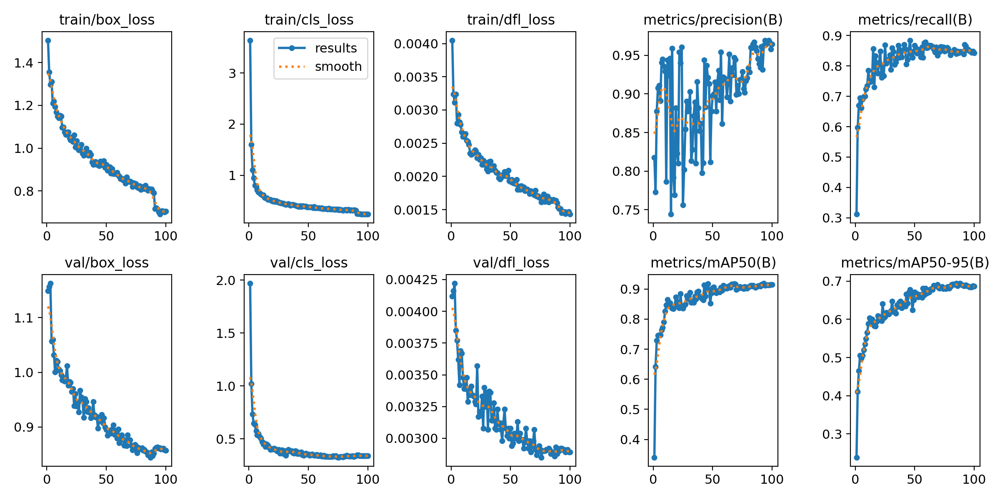

In [12]:
from IPython.display import Image, display

results_png = RUN_DIR / "results.png"
if results_png.exists():
    display(Image(filename=str(results_png)))
else:
    print(f"Not found: {results_png}")

## 4. Evaluate on test split

mAP50 ≈ "is the bounding box roughly right." mAP50-95 ≈ "is it
precisely right at multiple overlap thresholds." For a downstream
tracker, mAP50 is what matters most.

In [13]:
test_results = YOLO(str(BEST_PT)).val(
    data=str(DATA_YAML),
    imgsz=IMGSZ,
    split="test",
    device=DEVICE,
)

Ultralytics 8.4.53 🚀 Python-3.12.13 torch-2.8.0 CUDA:0 (Tesla T4, 14913MiB)


YOLO26s summary (fused): 122 layers, 9,467,502 parameters, 0 gradients, 20.5 GFLOPs


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 124.7±5.8 MB/s, size: 282.0 KB)


val: Scanning /home/sagemaker-user/DLCNN_A3/Data/Datasets/dataset_remapped/test/labels.cache... 94 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 94/94 17.1Mit/s 0.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 1/6 2.3s/it 0.7s<11.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 2/6 1.5s/it 1.6s<6.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 3/6 1.2s/it 2.4s<3.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 4/6 1.1it/s 3.0s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 5/6 2.0it/s 3.2s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 6/6 1.7it/s 3.4s

                   all         94       1980      0.847      0.875      0.896      0.708


                  ball         88         88      0.987      0.834      0.931      0.672


        ball-in-basket          8          8      0.392        0.5      0.503      0.416


                number         94        567      0.849      0.961      0.965      0.666


                player         94        944      0.967      0.984      0.991      0.863


               referee         94        280      0.934      0.971      0.991       0.88


                   rim         93         93      0.954          1      0.995      0.753


Speed: 5.0ms preprocess, 12.7ms inference, 0.0ms loss, 0.6ms postprocess per image


Results saved to /home/sagemaker-user/DLCNN_A3/runs/detect/val-7


Confusion matrix from training — useful for spotting which classes get mixed up.

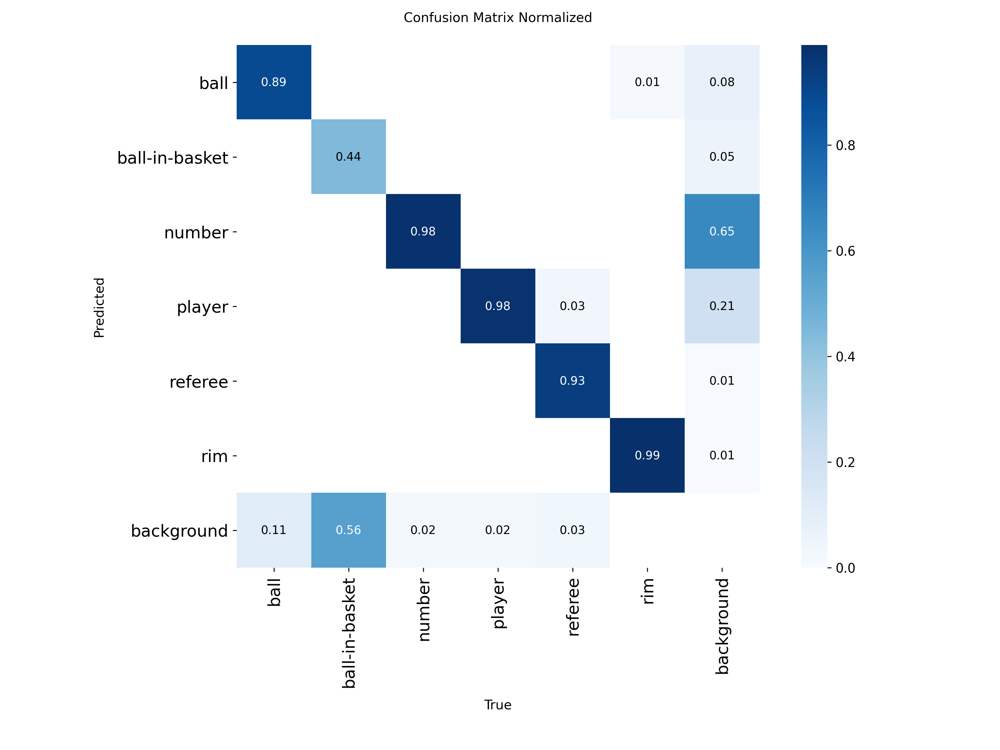

In [14]:
cm = RUN_DIR / "confusion_matrix_normalized.png"
if cm.exists():
    display(Image(filename=str(cm)))

In [15]:
import shutil
SAFE_DIR = HOME / "my_checkpoints"
SAFE_DIR.mkdir(exist_ok=True)
backup_path = SAFE_DIR / "yolo26s_basketball_100ep_mAP_best.pt"
shutil.copy2(BEST_PT, backup_path)
print(f"Backed up to {backup_path}")
print(f"Size: {backup_path.stat().st_size/1e6:.1f} MB")

SameFileError: PosixPath('/home/sagemaker-user/DLCNN_A3/my_checkpoints/yolo26s_basketball_100ep_mAP_best.pt') and PosixPath('/home/sagemaker-user/DLCNN_A3/my_checkpoints/yolo26s_basketball_100ep_mAP_best.pt') are the same file

In [28]:
# Self-contained ffmpeg/ffprobe binaries via pip. No system-level
# package access needed (SageMaker typically locks those down).
%pip install -q imageio-ffmpeg

import imageio_ffmpeg
FFMPEG = imageio_ffmpeg.get_ffmpeg_exe()
print(f"ffmpeg binary: {FFMPEG}")

Note: you may need to restart the kernel to use updated packages.
ffmpeg binary: /opt/conda/lib/python3.12/site-packages/imageio_ffmpeg/binaries/ffmpeg-linux-x86_64-v7.0.2


In [16]:
# import cv2
# from pathlib import Path

# SOURCE_VIDEO_PATH = HOME / "source/boston-celtics-new-york-knicks-game-1-q1-01.54-01.48.mp4"
# assert SOURCE_VIDEO_PATH.exists(), f"Source video not found at {SOURCE_VIDEO_PATH}"

# def count_decodable_frames(video_path: Path) -> int:
#     """Count frames cv2 can actually decode (not the metadata frame count)."""
#     cap = cv2.VideoCapture(str(video_path))
#     n = 0
#     while cap.read()[0]:
#         n += 1
#     cap.release()
#     return n

# # Metadata vs. actually-decodable. A mismatch means the file is corrupt
# # and decoding will silently stop partway through.
# cap = cv2.VideoCapture(str(SOURCE_VIDEO_PATH))
# expected = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
# fps      = cap.get(cv2.CAP_PROP_FPS)
# cap.release()
# actual   = count_decodable_frames(SOURCE_VIDEO_PATH)

# print(f"Source: {SOURCE_VIDEO_PATH.name}")
# print(f"  Metadata frame count: {expected}")
# print(f"  Actually decodable:   {actual}")
# print(f"  FPS: {fps}")

# if actual < expected * 0.95:
#     print(f"\n  Source is corrupted — re-encoding through ffmpeg...")
#     SOURCE_REPAIRED = SOURCE_VIDEO_PATH.with_name(SOURCE_VIDEO_PATH.stem + "-repaired.mp4")
#     !{FFMPEG} -y -loglevel error -err_detect ignore_err -i "{SOURCE_VIDEO_PATH}" -c:v libx264 -crf 18 -an "{SOURCE_REPAIRED}"
#     assert SOURCE_REPAIRED.exists(), "ffmpeg re-encode failed"
#     repaired_frames = count_decodable_frames(SOURCE_REPAIRED)
#     print(f"  Repaired: {repaired_frames} decodable frames")
#     SOURCE_VIDEO_PATH = SOURCE_REPAIRED
# else:
#     print("  Source is clean, no repair needed")

# print(f"\nWill use: {SOURCE_VIDEO_PATH}")

import cv2, subprocess
from pathlib import Path

SOURCE_VIDEO_DIR  = HOME / "source"
SOURCE_VIDEO_PATH = SOURCE_VIDEO_DIR / "boston-celtics-new-york-knicks-game-1-q1-04.28-04.20.mp4"  # switch to the longer clip
SAMPLE_FOLDER_ID  = "1eDJYqQ77Fytz15tKGdJCMeYSgmoQ-2-H"

def count_decodable_frames(p: Path) -> int:
    cap, n = cv2.VideoCapture(str(p)), 0
    while cap.read()[0]: n += 1
    cap.release()
    return n

def verify(p: Path) -> bool:
    cap = cv2.VideoCapture(str(p))
    expected = int(cap.get(cv2.CAP_PROP_FRAME_COUNT)); cap.release()
    actual = count_decodable_frames(p)
    print(f"  metadata={expected}  decodable={actual}")
    return actual >= expected * 0.95 and actual > 100

if not SOURCE_VIDEO_PATH.exists() or not verify(SOURCE_VIDEO_PATH):
    print("Re-downloading sample folder...")
    SOURCE_VIDEO_DIR.mkdir(exist_ok=True)
    # remove possibly-truncated file first
    if SOURCE_VIDEO_PATH.exists(): SOURCE_VIDEO_PATH.unlink()
    subprocess.run(
        ["gdown", f"https://drive.google.com/drive/folders/{SAMPLE_FOLDER_ID}",
         "-O", str(SOURCE_VIDEO_DIR), "--folder"],
        check=True,
    )
    assert verify(SOURCE_VIDEO_PATH), "Re-download still produces a corrupt file — check network."

print(f"\nUsing: {SOURCE_VIDEO_PATH}")

Re-downloading sample folder...


Retrieving folder contents


Retrieving folder contents completed
Building directory structure
Building directory structure completed


Downloading...
From: https://drive.google.com/uc?id=1GYxJGG8_OT5wlHxcYjUb62P2rjHeTg7p
To: /home/sagemaker-user/DLCNN_A3/source/boston-celtics-new-york-knicks-game-1-q1-01.54-01.48.mp4
  0%|          | 0.00/8.30M [00:00<?, ?B/s]

Processing file 1GYxJGG8_OT5wlHxcYjUb62P2rjHeTg7p boston-celtics-new-york-knicks-game-1-q1-01.54-01.48.mp4
Processing file 1Gm-QSkfXngzEnkrQEdE1HsLPG3cU-KCV boston-celtics-new-york-knicks-game-1-q1-03.16-03.11.mp4
Processing file 1It3wz3eoGcjo6tI9OGUt3X69ZK6x5SNK boston-celtics-new-york-knicks-game-1-q1-04.28-04.20.mp4
Processing file 1hx7_rJAmgBjt6PgHH8wh49OwUh2Lhe9f boston-celtics-new-york-knicks-game-1-q1-04.44-04.39.mp4
Processing file 1fPEw_w51nNQeBHh_GYhRyThVg71V1trn boston-celtics-new-york-knicks-game-1-q1-05.13-05.09.mp4
Processing file 1zwnAE4jHVI0qH7ioDFnzX98XtOocAUbH boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4
Processing file 1wQMSO-C4jOm6BBIVUuJ_6Uqf0QLdbJHD boston-celtics-new-york-knicks-game-1-q1-07.41-07.34.mp4
Processing file 1w9e1zCZtXtOmi6C4m-1BJJzTpa3znkbB boston-celtics-new-york-knicks-game-1-q2-08.09-08.03.mp4
Processing file 1zaltcB_-j8Pzxh8rBuvAV2o0Ngf3IX0I boston-celtics-new-york-knicks-game-1-q2-08.43-08.38.mp4
Processing file 14DuRHherVUn-CmER3z9o

 19%|█▉        | 1.57M/8.30M [00:00<00:02, 3.03MB/s]

100%|██████████| 8.30M/8.30M [00:00<00:00, 9.96MB/s]


Downloading...
From: https://drive.google.com/uc?id=1Gm-QSkfXngzEnkrQEdE1HsLPG3cU-KCV
To: /home/sagemaker-user/DLCNN_A3/source/boston-celtics-new-york-knicks-game-1-q1-03.16-03.11.mp4
  0%|          | 0.00/6.60M [00:00<?, ?B/s]

 24%|██▍       | 1.57M/6.60M [00:00<00:01, 2.97MB/s]

100%|██████████| 6.60M/6.60M [00:00<00:00, 8.11MB/s]


Downloading...
From: https://drive.google.com/uc?id=1It3wz3eoGcjo6tI9OGUt3X69ZK6x5SNK
To: /home/sagemaker-user/DLCNN_A3/source/boston-celtics-new-york-knicks-game-1-q1-04.28-04.20.mp4
  0%|          | 0.00/10.4M [00:00<?, ?B/s]

 15%|█▌        | 1.57M/10.4M [00:00<00:02, 3.06MB/s]

 75%|███████▌  | 7.86M/10.4M [00:00<00:00, 15.4MB/s]

100%|██████████| 10.4M/10.4M [00:01<00:00, 9.99MB/s]


Downloading...
From: https://drive.google.com/uc?id=1hx7_rJAmgBjt6PgHH8wh49OwUh2Lhe9f
To: /home/sagemaker-user/DLCNN_A3/source/boston-celtics-new-york-knicks-game-1-q1-04.44-04.39.mp4
  0%|          | 0.00/6.16M [00:00<?, ?B/s]

 26%|██▌       | 1.57M/6.16M [00:00<00:01, 3.00MB/s]

100%|██████████| 6.16M/6.16M [00:00<00:00, 7.71MB/s]


Downloading...
From: https://drive.google.com/uc?id=1fPEw_w51nNQeBHh_GYhRyThVg71V1trn
To: /home/sagemaker-user/DLCNN_A3/source/boston-celtics-new-york-knicks-game-1-q1-05.13-05.09.mp4
  0%|          | 0.00/5.25M [00:00<?, ?B/s]

 30%|██▉       | 1.57M/5.25M [00:00<00:01, 3.00MB/s]

100%|██████████| 5.25M/5.25M [00:00<00:00, 6.77MB/s]


Downloading...
From: https://drive.google.com/uc?id=1zwnAE4jHVI0qH7ioDFnzX98XtOocAUbH
To: /home/sagemaker-user/DLCNN_A3/source/boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4
  0%|          | 0.00/7.96M [00:00<?, ?B/s]

 20%|█▉        | 1.57M/7.96M [00:00<00:02, 2.98MB/s]

100%|██████████| 7.96M/7.96M [00:00<00:00, 9.50MB/s]


Downloading...
From: https://drive.google.com/uc?id=1wQMSO-C4jOm6BBIVUuJ_6Uqf0QLdbJHD
To: /home/sagemaker-user/DLCNN_A3/source/boston-celtics-new-york-knicks-game-1-q1-07.41-07.34.mp4
  0%|          | 0.00/9.28M [00:00<?, ?B/s]

 17%|█▋        | 1.57M/9.28M [00:00<00:02, 2.97MB/s]

100%|██████████| 9.28M/9.28M [00:00<00:00, 10.6MB/s]


Downloading...
From: https://drive.google.com/uc?id=1w9e1zCZtXtOmi6C4m-1BJJzTpa3znkbB
To: /home/sagemaker-user/DLCNN_A3/source/boston-celtics-new-york-knicks-game-1-q2-08.09-08.03.mp4
  0%|          | 0.00/7.32M [00:00<?, ?B/s]

 21%|██▏       | 1.57M/7.32M [00:00<00:02, 2.44MB/s]

100%|██████████| 7.32M/7.32M [00:00<00:00, 7.51MB/s]


Downloading...
From: https://drive.google.com/uc?id=1zaltcB_-j8Pzxh8rBuvAV2o0Ngf3IX0I
To: /home/sagemaker-user/DLCNN_A3/source/boston-celtics-new-york-knicks-game-1-q2-08.43-08.38.mp4
  0%|          | 0.00/8.77M [00:00<?, ?B/s]

 18%|█▊        | 1.57M/8.77M [00:00<00:02, 2.97MB/s]

100%|██████████| 8.77M/8.77M [00:00<00:00, 10.2MB/s]


Downloading...
From: https://drive.google.com/uc?id=14DuRHherVUn-CmER3z9oOiroWfkbk7eP
To: /home/sagemaker-user/DLCNN_A3/source/boston-celtics-new-york-knicks-game-1-q2-10.36-10.32.mp4
  0%|          | 0.00/4.76M [00:00<?, ?B/s]

 33%|███▎      | 1.57M/4.76M [00:00<00:01, 3.02MB/s]

100%|██████████| 4.76M/4.76M [00:00<00:00, 6.27MB/s]
Download completed


  metadata=238  decodable=238

Using: /home/sagemaker-user/DLCNN_A3/source/boston-celtics-new-york-knicks-game-1-q1-04.28-04.20.mp4


In [17]:
import supervision as sv
from ultralytics import YOLO

CONFIDENCE = 0.25
IOU        = 0.50

detector = YOLO(str(BEST_PT))

# Grab the first frame and run inference
frame_generator = sv.get_video_frames_generator(str(SOURCE_VIDEO_PATH))
frame = next(frame_generator)

result = detector.predict(frame, conf=CONFIDENCE, iou=IOU, imgsz=IMGSZ, verbose=False)[0]
detections = sv.Detections.from_ultralytics(result)
print(f"Detections this frame: {len(detections)}")
print(f"Classes present: {sorted({result.names[i] for i in detections.class_id})}")

Detections this frame: 24
Classes present: ['ball', 'number', 'player', 'referee', 'rim']


In [18]:
# Class colors — basketball orange, green for the rare "in basket" event,
# white for jersey numbers, blue for players, yellow for referees, red for the rim.
COLOR_PALETTE = sv.ColorPalette.from_hex([
    "#FF9B3D",  # 0 ball
    "#00C853",  # 1 ball-in-basket
    "#FFFFFF",  # 2 number
    "#4A90E2",  # 3 player
    "#FFEB3B",  # 4 referee
    "#E53935",  # 5 rim
])

box_annotator   = sv.BoxAnnotator(color=COLOR_PALETTE, thickness=2)
label_annotator = sv.LabelAnnotator(color=COLOR_PALETTE, text_color=sv.Color.BLACK, text_scale=0.5)

labels = [
    f"{result.names[cid]} {conf:.2f}"
    for cid, conf in zip(detections.class_id, detections.confidence)
]

annotated = frame.copy()
annotated = box_annotator.annotate(annotated, detections=detections)
annotated = label_annotator.annotate(annotated, detections=detections, labels=labels)

sv.plot_image(annotated, size=(12, 7))

<Figure size 1200x700 with 1 Axes>

In [19]:
import numpy as np

# Class IDs in the remapped 6-class schema
CLASS_PLAYER  = 3
CLASS_REFEREE = 4
TRACKED_CLASSES = [CLASS_PLAYER, CLASS_REFEREE]

# Output paths
TARGET_VIDEO_PATH            = HOME / f"{SOURCE_VIDEO_PATH.stem}-tracked.mp4"
TARGET_VIDEO_COMPRESSED_PATH = HOME / f"{SOURCE_VIDEO_PATH.stem}-tracked-compressed.mp4"

# Fresh tracker per video (ByteTrack state is stateful across frames)
video_info = sv.VideoInfo.from_video_path(str(SOURCE_VIDEO_PATH))
tracker = sv.ByteTrack(frame_rate=int(video_info.fps))

box_annotator   = sv.BoxAnnotator(color=COLOR_PALETTE, thickness=2)
label_annotator = sv.LabelAnnotator(color=COLOR_PALETTE, text_color=sv.Color.BLACK, text_scale=0.5)
trace_annotator = sv.TraceAnnotator(color=COLOR_PALETTE, thickness=2, trace_length=30)

def callback(frame: np.ndarray, index: int) -> np.ndarray:
    result = detector.predict(frame, conf=CONFIDENCE, iou=IOU, imgsz=IMGSZ, verbose=False)[0]
    detections = sv.Detections.from_ultralytics(result)

    # Split: tracked classes (player, referee) go through ByteTrack to
    # get persistent IDs. Others (ball, rim, number, ball-in-basket)
    # are drawn as boxes only — SORT-family trackers handle fast small
    # objects like the ball poorly; we'll add a ballistic motion prior
    # for the ball in Phase 2.
    tracked_mask = np.isin(detections.class_id, TRACKED_CLASSES)
    tracked = detections[tracked_mask]
    other   = detections[~tracked_mask]

    tracked = tracker.update_with_detections(tracked)

    annotated = frame.copy()

    if len(other):
        other_labels = [
            f"{result.names[cid]} {conf:.2f}"
            for cid, conf in zip(other.class_id, other.confidence)
        ]
        annotated = box_annotator.annotate(annotated, detections=other)
        annotated = label_annotator.annotate(annotated, detections=other, labels=other_labels)

    if len(tracked):
        tracked_labels = [
            f"{result.names[cid]}#{tid}"
            for cid, tid in zip(tracked.class_id, tracked.tracker_id)
        ]
        annotated = trace_annotator.annotate(annotated, detections=tracked)
        annotated = box_annotator.annotate(annotated, detections=tracked)
        annotated = label_annotator.annotate(annotated, detections=tracked, labels=tracked_labels)

    return annotated

sv.process_video(
    source_path=str(SOURCE_VIDEO_PATH),
    target_path=str(TARGET_VIDEO_PATH),
    callback=callback,
    show_progress=True,
)

# Verify the output is complete — don't trust the "Wrote:" print alone.
expected_frames = video_info.total_frames
actual_frames   = count_decodable_frames(TARGET_VIDEO_PATH)
print(f"\nWrote: {TARGET_VIDEO_PATH}")
print(f"Expected frames: {expected_frames}")
print(f"Output frames:   {actual_frames}")
if actual_frames < expected_frames * 0.95:
    raise RuntimeError(
        f"Output is truncated ({actual_frames}/{expected_frames} frames). "
        "Source video is probably still corrupt — re-run Cell 2."
    )
print("Tracking complete.")

Processing video:   0%|          | 0/238 [00:00<?, ?it/s]


Wrote: /home/sagemaker-user/DLCNN_A3/boston-celtics-new-york-knicks-game-1-q1-04.28-04.20-tracked.mp4
Expected frames: 238
Output frames:   238
Tracking complete.


In [29]:
# # OpenCV writes mp4v which doesn't play in most browsers. Re-encode to
# # H.264 baseline via ffmpeg. This also produces a clean, well-formed
# # stream — useful if the tracking output had any decoder quirks.
# # !{FFMPEG} -y -loglevel error -i "{TARGET_VIDEO_PATH}" -vcodec libx264 -crf 28 "{TARGET_VIDEO_COMPRESSED_PATH}"

# # assert TARGET_VIDEO_COMPRESSED_PATH.exists(), "ffmpeg re-encode failed"
# compressed_frames = count_decodable_frames(TARGET_VIDEO_COMPRESSED_PATH)
# print(f"Wrote: {TARGET_VIDEO_COMPRESSED_PATH}")
# print(f"Size:  {TARGET_VIDEO_COMPRESSED_PATH.stat().st_size/1e6:.1f} MB")
# print(f"Frames: {compressed_frames}")

# Re-encode to H.264 baseline so it plays in the notebook
!{FFMPEG} -y -loglevel error -i "{TARGET_VIDEO_PATH}" -vcodec libx264 -crf 28 "{TARGET_VIDEO_COMPRESSED_PATH}"
print(f"Wrote: {TARGET_VIDEO_COMPRESSED_PATH}")
print(f"Size:  {TARGET_VIDEO_COMPRESSED_PATH.stat().st_size/1e6:.1f} MB")

Wrote: /home/sagemaker-user/DLCNN_A3/boston-celtics-new-york-knicks-game-1-q1-04.28-04.20-tracked-compressed.mp4
Size:  5.1 MB


In [30]:
from IPython.display import Video
Video(str(TARGET_VIDEO_COMPRESSED_PATH), embed=True, width=720)

In [31]:
import json

DETECTIONS_JSONL = HOME / f"{SOURCE_VIDEO_PATH.stem}-detections.jsonl"

# Fresh tracker — we want this pass's track IDs to be deterministic
# and independent of the visualization pass above.
tracker_for_log = sv.ByteTrack(frame_rate=int(video_info.fps))
frame_iter = sv.get_video_frames_generator(str(SOURCE_VIDEO_PATH))

n_records = 0
with open(DETECTIONS_JSONL, "w") as f:
    for frame_idx, frame in enumerate(frame_iter):
        result = detector.predict(frame, conf=CONFIDENCE, iou=IOU, imgsz=IMGSZ, verbose=False)[0]
        detections = sv.Detections.from_ultralytics(result)

        tracked_mask = np.isin(detections.class_id, TRACKED_CLASSES)
        tracked = tracker_for_log.update_with_detections(detections[tracked_mask])
        other   = detections[~tracked_mask]

        for det_set, ids in [(tracked, tracked.tracker_id), (other, [None]*len(other))]:
            for (x1,y1,x2,y2), cid, conf, tid in zip(
                det_set.xyxy, det_set.class_id, det_set.confidence, ids
            ):
                f.write(json.dumps({
                    "frame": frame_idx,
                    "track_id": int(tid) if tid is not None else None,
                    "class": result.names[int(cid)],
                    "class_id": int(cid),
                    "bbox_xyxy": [float(x1), float(y1), float(x2), float(y2)],
                    "conf": float(conf),
                }) + "\n")
                n_records += 1

print(f"Wrote {n_records} detection records to {DETECTIONS_JSONL}")
!head -5 "{DETECTIONS_JSONL}"

Wrote 5081 detection records to /home/sagemaker-user/DLCNN_A3/boston-celtics-new-york-knicks-game-1-q1-04.28-04.20-detections.jsonl
{"frame": 0, "track_id": 1, "class": "player", "class_id": 3, "bbox_xyxy": [669.1483764648438, 158.19760131835938, 787.4742431640625, 332.56488037109375], "conf": 0.9819066524505615}
{"frame": 0, "track_id": 2, "class": "player", "class_id": 3, "bbox_xyxy": [1373.308349609375, 463.06524658203125, 1511.339599609375, 705.9142456054688], "conf": 0.9756326079368591}
{"frame": 0, "track_id": 3, "class": "player", "class_id": 3, "bbox_xyxy": [298.0611877441406, 534.3698120117188, 464.74114990234375, 773.46484375], "conf": 0.9721859693527222}
{"frame": 0, "track_id": 4, "class": "player", "class_id": 3, "bbox_xyxy": [769.5673828125, 408.72210693359375, 877.7952270507812, 625.52001953125], "conf": 0.9720888733863831}
{"frame": 0, "track_id": 5, "class": "player", "class_id": 3, "bbox_xyxy": [499.407470703125, 516.6116943359375, 620.5598754882812, 748.3132934570312

In [32]:
import json
from collections import Counter

class_counts = Counter()
unique_track_ids = set()
frames_seen = set()
ball_frames = set()
rim_frames  = set()

with open(DETECTIONS_JSONL) as f:
    for line in f:
        rec = json.loads(line)
        class_counts[rec["class"]] += 1
        frames_seen.add(rec["frame"])
        if rec["track_id"] is not None:
            unique_track_ids.add((rec["class"], rec["track_id"]))
        if rec["class"] == "ball":
            ball_frames.add(rec["frame"])
        if rec["class"] == "rim":
            rim_frames.add(rec["frame"])

n_frames = len(frames_seen)
print(f"Frames with at least one detection: {n_frames}")
print(f"\nDetections per class:")
for cls, n in class_counts.most_common():
    print(f"  {cls:<18} {n:>6}")
print(f"\nUnique track IDs assigned:")
players_tracked  = sum(1 for c, _ in unique_track_ids if c == "player")
referees_tracked = sum(1 for c, _ in unique_track_ids if c == "referee")
print(f"  players:  {players_tracked}")
print(f"  referees: {referees_tracked}")
print(f"\nBall detected in {len(ball_frames)}/{n_frames} frames ({100*len(ball_frames)/n_frames:.0f}%)")
print(f"Rim detected in  {len(rim_frames)}/{n_frames} frames ({100*len(rim_frames)/n_frames:.0f}%)")

Frames with at least one detection: 238

Detections per class:
  player               2369
  number               1623
  referee               699
  rim                   251
  ball                  122
  ball-in-basket         17

Unique track IDs assigned:
  players:  14
  referees: 4

Ball detected in 111/238 frames (47%)
Rim detected in  238/238 frames (100%)


## Next steps

This notebook is Phase 1 of a larger pipeline. With `best.pt` and the
detection log in hand, the upcoming phases are:

- **Phase 2** — Shot detection. Build ball-trajectory + rim-proximity
  logic on top of `detections.jsonl` to emit shot events with
  make/miss labels.
- **Phase 3** — Court homography. Map image-space coordinates to a 2D
  court template (and use the court polygon to filter out bench
  detections).
- **Phase 4** — Team & player ID. Cluster jersey colors for team
  assignment; OCR jersey numbers for individual player ID.
- **Phase 5** — GUI. Streamlit or Gradio app that wraps upload →
  pipeline → shot map.

To improve the Phase 1 detector itself, options in rough order of payoff:

1. **Scale to `yolo26m.pt` or `yolo26l.pt`** — cheapest accuracy gain
   if VRAM allows.
2. **Switch tracker to BoT-SORT with ReID** — better at re-identifying
   players after occlusion. Change `sv.ByteTrack(...)` above to
   the appropriate BoT-SORT wrapper (or fall back to
   `detector.track(..., tracker='botsort.yaml')` for the Ultralytics
   built-in).
3. **Collect more `ball-in-basket` examples** — currently only 33
   train instances; this is the rarest class and likely the noisiest.
4. **Train at `imgsz=1280`** — if ball/rim mAP is still weak after
   above changes.